# Modeling the potential of CRISPR gene drives for mosquito suppression
<hr style="border:2px solid gray"> </hr>
This notebook is for generating models with GP utilizing code generated by Sam E Champer.
In 2024/12/15 weitang Sun get this code from Yuan Hu Allegrettie, he use this code to train a machine learning model to predict the outcome of slim simulations. 
First, some imports:

In [1]:
import numpy as np
import tensorflow as tf
from tensorflow import keras
from sklearn.preprocessing import MaxAbsScaler
from sklearn.metrics import r2_score
from keras.models import Sequential, Model, load_model
from keras.optimizers import Adam
from keras.layers import Dense, Input, Dropout, concatenate
from keras.utils import plot_model
from keras.callbacks import EarlyStopping
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint, reciprocal
from matplotlib.backends.backend_pdf import PdfPages
from matplotlib import pyplot as plt
import seaborn as sns
from pprint import pprint
import pandas as pd
import scipy
%matplotlib inline

In [2]:
#pip install scikit-learm

In [3]:
import tensorflow as tf
from tensorflow import keras

In [4]:
#pip uninstall tensorflow

In [5]:
#pip install tensorflow==2.12.0

In [6]:
#pip list

In [7]:
pip show keras

Name: keras
Version: 2.12.0
Summary: Deep learning for humans.
Home-page: https://keras.io/
Author: Keras team
Author-email: keras-users@googlegroups.com
License: Apache 2.0
Location: d:\anaconda3\envs\oldtf\lib\site-packages
Requires: 
Required-by: tensorflow-intel
Note: you may need to restart the kernel to use updated packages.


In [8]:
pip show tensorflow

Name: tensorflow
Version: 2.12.0
Summary: TensorFlow is an open source machine learning framework for everyone.
Home-page: https://www.tensorflow.org/
Author: Google Inc.
Author-email: packages@tensorflow.org
License: Apache 2.0
Location: d:\anaconda3\envs\oldtf\lib\site-packages
Requires: tensorflow-intel
Required-by: 
Note: you may need to restart the kernel to use updated packages.


In [7]:
import sklearn


In [9]:
pip show Scikit-learn

Name: scikit-learn
Version: 1.3.2
Summary: A set of python modules for machine learning and data mining
Home-page: http://scikit-learn.org
Author: 
Author-email: 
License: new BSD
Location: d:\anaconda3\envs\oldtf\lib\site-packages
Requires: joblib, numpy, scipy, threadpoolctl
Required-by: shap
Note: you may need to restart the kernel to use updated packages.


<hr style="border:1px solid gray"> </hr>

## 0. Data preprocessing

In [9]:
#load data
Train = pd.read_csv("Training_data.csv")
Train.columns = ["suppressed","malaria_eliminated","num_fertile_females","adult_total_numbers","adult_female","wt","dr","r1","r2"
                 ,"carrier_mos_frequency","healthy_mosquito","carrier_mosquito","carrier_mosquito2","patient_mosquito","healthy_human"
                 ,"carrier_human","patient_human","resistant_human","chasing","chasing_start","chasing_end","avg_pop_during_chase",
                 "fertile_female_average","simulation_end",
                 "transmission rate to mosquitoes", 
                 "transmission rate to humans", 
                 "average dispersal",
                 "weekly remating chance",
                 "mosquito reproduction chance", 
                 "animal biting rate",
                 "viability fitness", 
                 "female fecundity fitness",
                 "germline resistance rate",
                 "drive conversion efficiency",
                 "embryo resistance rate", 
                 "functional resistance proportion",
                 "low-density growth rate",
                 "seasonal population change",
                 "infection duration",
                 "immunity duration",
                 "density_num_adult_female","human_density","sim_bound"]

Test = pd.read_csv("230717_testdata.csv")
Test.columns = ["suppressed","malaria_eliminated","num_fertile_females","adult_total_numbers","adult_female","wt","dr","r1","r2",
                "carrier_mos_frequency","healthy_mosquito","carrier_mosquito","carrier_mosquito2","patient_mosquito","healthy_human",
                "carrier_human","patient_human","resistant_human","chasing","chasing_start","chasing_end","avg_pop_during_chase",
                "fertile_female_average","simulation_end",
                "transmission rate to mosquitoes", 
                 "transmission rate to humans", 
                 "average dispersal",
                 "weekly remating chance",
                 "mosquito reproduction chance", 
                 "animal biting rate",
                 "viability fitness", 
                 "female fecundity fitness",
                 "germline resistance rate",
                 "drive conversion efficiency",
                 "embryo resistance rate", 
                 "functional resistance proportion",
                 "low-density growth rate",
                 "seasonal population change",
                 "infection duration",
                 "immunity duration",
                "density_num_adult_female",
                "human_density","sim_bound"]

newname=['transmission rate to mosquitoes', 
        'transmission rate to humans', 
        'average dispersal',
        'weekly remating chance',
        'mosquito reproduction chance', 
        'animal biting rate',
        'viability fitness', 
        'female fecundity fitness',
        'germline resistance rate',
        'drive conversion efficiency',
        'embryo resistance rate', 
        'functional resistance proportion',
        'low-density growth rate',
        'seasonal population change',
        'infection duration',
        'immunity duration']
#show training set example
#Train['fertile_female_average'].describe()
#Train

C:\Users\19628\AppData\Local\Temp\ipykernel_14584\1709845985.py:2: DtypeWarning: Columns (21,22) have mixed types. Specify dtype option on import or set low_memory=False.
  Train = pd.read_csv("Training_data.csv")
C:\Users\19628\AppData\Local\Temp\ipykernel_14584\1709845985.py:25: DtypeWarning: Columns (21,22) have mixed types. Specify dtype option on import or set low_memory=False.
  Test = pd.read_csv("230717_testdata.csv")


In [10]:
mosquito_parameter=['average dispersal','weekly remating chance','mosquito reproduction chance','animal biting rate','viability fitness','female fecundity fitness','germline resistance rate','drive conversion efficiency',
                             'embryo resistance rate','functional resistance proportion','low-density growth rate','seasonal population change']

In [11]:
Train=Train.astype(float)
Test=Test.astype(float)

In [12]:
Train["fertile_female_average"].describe()

count    96086.000000
mean     40157.673779
std       8086.801474
min          0.000000
25%      38080.836162
50%      41806.669347
75%      46043.942951
max      49525.929348
Name: fertile_female_average, dtype: float64

In [13]:
#predict malaria prevalence as well.
Train['malaria_prevalence'] = (Train['carrier_human']+Train['patient_human']) / 4800
Test['malaria_prevalence'] = (Test['carrier_human']+Test['patient_human']) / 4800
##If suppressed, malaria will eliminated later even if it hasnt already.
Train["malaria_eliminated"] = np.where(Train["suppressed"] == 1, 1, Train["malaria_eliminated"])
Test["malaria_eliminated"] = np.where(Test["suppressed"] == 1, 1, Test["malaria_eliminated"])
Train["malaria_prevalence"] = np.where(Train["suppressed"] == 1, 0, Train["malaria_prevalence"])
Test["malaria_prevalence"] = np.where(Test["suppressed"] == 1, 0, Test["malaria_prevalence"])


##Need variable to address the reduction of fertile female
##Calculate absolute deduction of mosquito from potential maximum number (150,000)
#

# if in long term chasing, assume the mosquito density equals to 48000= fertile female


Train['mosquito_prev'] = Train['fertile_female_average'] / 48000
Test['mosquito_prev'] = Test['fertile_female_average'] / 48000


In [14]:

# if there's no drive in the end and wt is higher than 50% or r1 is over 50% of the genes, here use 285639 as average number of all genes in the dataset
Train.loc[(Train['dr']==0) & (Train['wt']>285639/2),'mosquito_prev']=1
Test.loc[(Test['dr']==0) & (Test['wt']>285639/2),'mosquito_prev']=1
Train.loc[Train['r1']>285639/2,'mosquito_prev']=1
Test.loc[Test['r1']>285639/2,'mosquito_prev']=1

# if suppressed set to 0
Train.loc[Train["suppressed"]==1,'mosquito_prev'] = 0
Test.loc[Test["suppressed"]==1,'mosquito_prev'] = 0

#check
Train['mosquito_prev'].describe()


count    96088.000000
mean         0.964194
std          0.152675
min          0.000000
25%          1.000000
50%          1.000000
75%          1.000000
max          1.005557
Name: mosquito_prev, dtype: float64

In [15]:

Train['ID'] = Train.groupby(newname).ngroup()
print(Train['ID'].describe())

count    96088.000000
mean      4808.640194
std       2776.124294
min          0.000000
25%       2405.000000
50%       4808.000000
75%       7213.000000
max       9617.000000
Name: ID, dtype: float64


In [16]:

Test['ID'] = Test.groupby(newname).ngroup()
print(Test['ID'].describe())

count    98947.000000
mean      4974.668449
std       2865.843205
min          0.000000
25%       2495.500000
50%       4978.000000
75%       7456.000000
max       9932.000000
Name: ID, dtype: float64


In [17]:
max(Train['ID'])

9617

In [18]:
#Make new dataset that takes the average of 10 simulations of same parameter sets.
Train_ave = pd.DataFrame(columns=Train.columns, index=range(9618))
for i in range(0, Train_ave.shape[0]):
    temp = Train[Train['ID'] == i]
    temp = temp.apply(pd.to_numeric, errors='coerce')  # Convert columns to numeric type
    line = temp.mean(axis=0)
    line['chasing_start'] = np.mean(temp.loc[temp['chasing_start'] != 1000, 'chasing_start'])
    line['chasing_end'] = np.mean(temp.loc[temp['chasing_end'] != 10000, 'chasing_end'])
    line['fertile_female_average'] = np.mean(temp.loc[temp['fertile_female_average'] != 0, 'fertile_female_average'])
    line['avg_pop_during_chase'] = np.mean(temp.loc[temp['avg_pop_during_chase'] != 0, 'avg_pop_during_chase'])
    line = line.fillna(0)

    Train_ave.loc[i,:] = line

Train_ave = Train_ave.astype(float)


In [19]:
Train_ave

,suppressed,malaria_eliminated,num_fertile_females,adult_total_numbers,adult_female,wt,dr,r1,r2,carrier_mos_frequency,...,low-density growth rate,seasonal population change,infection duration,immunity duration,density_num_adult_female,human_density,sim_bound,malaria_prevalence,mosquito_prev,ID
0,0.0,0.0,68835.5,118738.1,68851.0,3223.8,2.8,311267.0,4033.2,2.8,...,8.0,0.5,11.0,19.0,3000.0,300.0,4.0,0.350042,1.000000,0.0
1,0.0,0.0,60580.4,104738.2,60814.5,17765.4,2506.0,250856.1,9857.7,2457.6,...,17.0,0.4,20.0,11.0,3000.0,300.0,4.0,0.306708,1.000000,1.0
2,0.0,0.0,76469.4,132062.6,76487.4,4097.7,59.0,346531.3,4673.2,59.0,...,6.0,0.7,15.0,17.0,3000.0,300.0,4.0,0.178375,1.000000,2.0
3,0.0,0.0,60230.7,103702.9,60245.2,2221.3,5.7,271800.6,3557.2,5.7,...,16.0,0.3,20.0,5.0,3000.0,300.0,4.0,0.271792,1.000000,3.0
4,0.0,0.0,73088.5,126053.6,73096.5,667.0,110.0,336040.4,1713.0,108.9,...,15.0,0.6,21.0,19.0,3000.0,300.0,4.0,0.331146,1.000000,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9613,0.0,0.0,54265.8,93302.4,54286.4,9615.7,3.1,235986.5,4207.9,3.1,...,4.0,0.2,17.0,18.0,3000.0,300.0,4.0,0.350812,1.000000,9613.0
9614,0.0,0.0,72754.6,125344.0,72765.3,1250.4,0.0,332322.7,3192.7,0.0,...,17.0,0.6,15.0,2.0,3000.0,300.0,4.0,0.455604,1.000000,9614.0
9615,0.0,0.6,35127.1,67569.4,39217.8,24644.1,31811.8,121427.4,3782.7,23803.3,...,14.0,0.3,28.0,11.0,3000.0,300.0,4.0,0.066583,0.616215,9615.0
9616,0.0,0.0,59303.3,102329.5,59334.1,4914.9,315.4,266581.0,3378.7,310.8,...,4.0,0.4,10.0,4.0,3000.0,300.0,4.0,0.334583,1.000000,9616.0


In [20]:
#save train_ave into a csv file
Train_ave.to_csv('Train_ave_output.csv', index=False)

In [21]:
print(Train_ave['fertile_female_average'].describe())

count     9618.000000
mean     40273.143720
std       6852.735288
min          0.000000
25%      37949.407835
50%      41641.814509
75%      45427.504553
max      47936.865138
Name: fertile_female_average, dtype: float64


In [38]:
np.min(Test['drive conversion efficiency'][:-1])

0.9

In [22]:
#Make new dataset that takes the average of 10 simulations of same parameter sets.
Test_ave = pd.DataFrame(columns=Test.columns, index=range(9933))
for i in range(0, Test_ave.shape[0]):
    temp = Test[Test['ID'] == i]
    temp = temp.apply(pd.to_numeric, errors='coerce')  # Convert columns to numeric type
    line = temp.mean(axis=0)
    line['chasing_start'] = np.mean(temp.loc[temp['chasing_start'] != 1000, 'chasing_start'])
    line['chasing_end'] = np.mean(temp.loc[temp['chasing_end'] != 10000, 'chasing_end'])
    line['fertile_female_average'] = np.mean(temp.loc[temp['fertile_female_average'] != 0, 'fertile_female_average'])
    line['avg_pop_during_chase'] = np.mean(temp.loc[temp['avg_pop_during_chase'] != 0, 'avg_pop_during_chase'])
    line = line.fillna(0)
    Test_ave.loc[i,:] = line

Test_ave = Test_ave.astype(float)

In [23]:
np.mean(Test_ave['drive conversion efficiency'])#先计算 Test

0.9500795328702305

In [20]:
np.mean(Train_ave['drive conversion efficiency'])#再计算Train

0.8996876689540445

In [24]:
wholedata = pd.concat([Train_ave, Test_ave])
wholedata = wholedata.reset_index(drop=True)

from sklearn.model_selection import train_test_split
Train_ave, Test_ave = train_test_split(wholedata, test_size=0.5, random_state=42)
Train_ave = Train_ave.reset_index(drop=True)
Test_ave = Test_ave.reset_index(drop=True)

In [25]:
Train_ave.to_csv('Train_ave2.csv', index=False)
Test_ave.to_csv('Test_ave2.csv', index=False)

0       0.870
1       0.939
2       0.859
3       0.923
4       0.977
        ...  
9771    0.964
9772    0.976
9773    0.880
9774    0.802
9775    0.929
Name: drive conversion efficiency, Length: 9776, dtype: float64

In [19]:
Train_ave=pd.read_csv('Train_ave2.csv')
Test_ave=pd.read_csv('Test_ave2.csv')

In [20]:

#normalize data
abs_scaler = MaxAbsScaler()

# calculate the maximum absolute value for scaling the data using the fit method
abs_scaler.fit(Train_ave.loc[:,newname])
# the maximum absolute values calculated by the fit method
abs_scaler.max_abs_
# transform the data using the parameters calculated by the fit method (the maximum absolute values)
scaled_data = abs_scaler.transform(Train_ave.loc[:,newname])
# store the results in a data frame
Train_scaled = pd.DataFrame(scaled_data, columns=newname)
Train_scaled.describe()

,transmission rate to mosquitoes,transmission rate to humans,average dispersal,weekly remating chance,mosquito reproduction chance,animal biting rate,viability fitness,female fecundity fitness,germline resistance rate,drive conversion efficiency,embryo resistance rate,functional resistance proportion,low-density growth rate,seasonal population change,infection duration,immunity duration
count,9775.000000,9775.000000,9775.000000,9775.000000,9775.000000,9775.000000,9775.000000,9775.000000,9775.000000,9775.000000,9775.000000,9775.000000,9775.000000,9775.000000,9775.000000,9775.000000
mean,0.529061,0.550859,0.660457,0.503507,0.504852,0.503797,0.913147,0.777835,0.502165,0.925103,0.375846,0.498139,0.553930,0.514501,0.582213,0.572711
std,0.233420,0.218967,0.211884,0.289434,0.182296,0.290514,0.052600,0.131827,0.287683,0.051721,0.260670,0.287977,0.258278,0.292964,0.184769,0.280849
min,0.185185,0.222222,0.200000,0.000000,0.250000,0.000000,0.800000,0.500000,0.000000,0.800000,0.000000,0.000000,0.111111,0.000000,0.333333,0.000000
25%,0.322593,0.360000,0.518788,0.254500,0.358000,0.251000,0.872000,0.671000,0.256707,0.900000,0.166917,0.252000,0.333333,0.250000,0.433333,0.350000
50%,0.495185,0.521111,0.675152,0.503000,0.463000,0.508000,0.915000,0.780000,0.504404,0.934000,0.334834,0.494000,0.555556,0.500000,0.533333,0.600000
75%,0.720370,0.727778,0.840000,0.756000,0.618000,0.753000,0.958000,0.890000,0.747798,0.966000,0.499750,0.748000,0.777778,0.750000,0.733333,0.800000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [21]:
Test_ave

,suppressed,malaria_eliminated,num_fertile_females,adult_total_numbers,adult_female,wt,dr,r1,r2,carrier_mos_frequency,...,low-density growth rate,seasonal population change,infection duration,immunity duration,density_num_adult_female,human_density,sim_bound,malaria_prevalence,mosquito_prev,ID
0,0.0,0.0,63541.1,109379.5,63569.2,20.7,4193.8,287629.8,1228.7,4150.0,...,13.0,0.4,25.0,5.0,3000.0,300.0,4.0,0.235375,1.000000,3649.0
1,0.0,0.0,52015.4,89385.7,52024.8,404.3,108.5,235389.5,2766.3,108.4,...,14.0,0.1,11.0,16.0,3000.0,300.0,4.0,0.537146,1.000000,8917.0
2,0.0,0.0,67383.8,116190.1,67399.0,1996.5,14.7,307009.8,2991.0,14.6,...,8.0,0.5,15.0,14.0,3000.0,300.0,4.0,0.505437,1.000000,1346.0
3,0.0,0.0,64545.2,111140.5,64550.5,51.0,706.4,295523.4,1685.6,704.1,...,9.0,0.4,11.0,16.0,3000.0,300.0,4.0,0.567104,1.000000,46.0
4,0.0,0.1,33950.8,63793.7,36777.8,54557.7,21723.2,90606.3,6853.6,17402.0,...,4.0,0.6,26.0,8.0,3000.0,300.0,4.0,0.040708,0.709318,9411.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9771,0.0,0.0,63982.7,110217.4,63990.2,121.2,68.7,293082.6,2254.3,68.4,...,11.0,0.4,17.0,2.0,3000.0,300.0,4.0,0.424042,1.000000,6565.0
9772,0.0,0.0,56179.1,96502.1,56185.1,279.2,208.5,255499.6,2233.5,207.5,...,17.0,0.2,14.0,12.0,3000.0,300.0,4.0,0.390562,1.000000,4537.0
9773,0.0,0.0,81709.8,141229.5,81732.8,826.5,1685.6,373597.0,3402.7,1675.1,...,17.0,0.8,11.0,7.0,3000.0,300.0,4.0,0.465958,1.000000,4053.0
9774,0.0,0.0,72954.0,125982.4,72983.4,10347.9,0.0,321620.8,6073.3,0.0,...,14.0,0.6,26.0,7.0,3000.0,300.0,4.0,0.373896,1.000000,5931.0


In [22]:

# transform the data using the parameters calculated by the fit method (the maximum absolute values)
scaled_data = abs_scaler.transform(Test_ave.loc[:,newname])
# store the results in a data frame
Test_scaled = pd.DataFrame(scaled_data, columns=newname)
Test_scaled.describe()

,transmission rate to mosquitoes,transmission rate to humans,average dispersal,weekly remating chance,mosquito reproduction chance,animal biting rate,viability fitness,female fecundity fitness,germline resistance rate,drive conversion efficiency,embryo resistance rate,functional resistance proportion,low-density growth rate,seasonal population change,infection duration,immunity duration
count,9776.000000,9776.000000,9776.000000,9776.000000,9776.000000,9776.000000,9776.000000,9776.000000,9776.000000,9776.000000,9776.000000,9776.000000,9776.000000,9776.000000,9776.000000,9776.000000
mean,0.529254,0.556754,0.661638,0.504688,0.497770,0.504880,0.913676,0.775803,0.497462,0.925476,0.369107,0.500700,0.552873,0.512607,0.585737,0.571087
std,0.232166,0.221148,0.212128,0.290130,0.178769,0.288148,0.052212,0.133335,0.289491,0.052253,0.258795,0.287841,0.257879,0.294223,0.187079,0.283783
min,0.185185,0.222222,0.200606,0.000000,0.250000,0.000000,0.800000,0.500000,0.000100,0.800000,0.000125,0.000000,0.111111,0.000000,0.333333,0.000000
25%,0.325185,0.363333,0.516970,0.249000,0.355000,0.254000,0.873000,0.668000,0.245746,0.900000,0.161726,0.251000,0.333333,0.250000,0.433333,0.350000
50%,0.496852,0.531111,0.678788,0.505000,0.459000,0.506000,0.916000,0.780000,0.496146,0.934000,0.327330,0.500000,0.555556,0.500000,0.533333,0.600000
75%,0.717407,0.738889,0.838788,0.759000,0.608000,0.756000,0.958000,0.888250,0.749850,0.967000,0.495310,0.750000,0.777778,0.750000,0.733333,0.800000
max,0.999630,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.999900,1.000000,1.000375,1.000000,1.000000,1.000000,1.000000,1.000000


In [23]:
X_train = Train_scaled.loc[:,newname]
y_train = Train_ave.loc[:,['malaria_eliminated', 'malaria_prevalence','suppressed','mosquito_prev']]
X_test = Test_scaled.loc[:,newname]
y_test = Test_ave.loc[:,['malaria_eliminated','malaria_prevalence', 'suppressed','mosquito_prev']]
y_test

,malaria_eliminated,malaria_prevalence,suppressed,mosquito_prev
0,0.0,0.235375,0.0,1.000000
1,0.0,0.537146,0.0,1.000000
2,0.0,0.505437,0.0,1.000000
3,0.0,0.567104,0.0,1.000000
4,0.1,0.040708,0.0,0.709318
...,...,...,...,...
9771,0.0,0.424042,0.0,1.000000
9772,0.0,0.390562,0.0,1.000000
9773,0.0,0.465958,0.0,1.000000
9774,0.0,0.373896,0.0,1.000000


In [24]:
column_dtypes = y_train.dtypes
print(column_dtypes)

malaria_eliminated    float64
malaria_prevalence    float64
suppressed            float64
mosquito_prev         float64
dtype: object


<hr style="border:1px solid gray"> </hr>

## 1. Training a model

First, train a model.

In [25]:
"""#Train together

# Define the input layer
inputs = Input(shape=(16,))

# Define the hidden layers
x = Dense(16, activation='relu')(inputs)
x = Dense(16, activation='relu')(x)
x = Dense(16, activation='relu')(x)
x = Dense(16, activation='relu')(x)


eliminate = Dense(1, activation='linear', name="eliminate")(x)
prevalence = Dense(1, activation='linear', name = "prevalence")(x)
suppress = Dense(1, activation='linear', name = "suppress")(x)
mos_prev = Dense(1, activation='linear', name = "mos_prev")(x)

# Define the model
model = Model(inputs=inputs, outputs=[eliminate, prevalence, suppress, mos_prev])

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.001), loss='mse')

# Define the EarlyStopping callback
early_stopping = EarlyStopping(monitor='loss', patience=20)

# Train the model
model.fit(X_train, [y_train["malaria_eliminated"],y_train["malaria_prevalence"],y_train["suppressed"],y_train["mosquito_prev"]], epochs=800, batch_size=32, validation_freq=0.2, callbacks=[early_stopping])
"""


'#Train together\n\n# Define the input layer\ninputs = Input(shape=(16,))\n\n# Define the hidden layers\nx = Dense(16, activation=\'relu\')(inputs)\nx = Dense(16, activation=\'relu\')(x)\nx = Dense(16, activation=\'relu\')(x)\nx = Dense(16, activation=\'relu\')(x)\n\n\neliminate = Dense(1, activation=\'linear\', name="eliminate")(x)\nprevalence = Dense(1, activation=\'linear\', name = "prevalence")(x)\nsuppress = Dense(1, activation=\'linear\', name = "suppress")(x)\nmos_prev = Dense(1, activation=\'linear\', name = "mos_prev")(x)\n\n# Define the model\nmodel = Model(inputs=inputs, outputs=[eliminate, prevalence, suppress, mos_prev])\n\n# Compile the model\nmodel.compile(optimizer=Adam(learning_rate=0.001), loss=\'mse\')\n\n# Define the EarlyStopping callback\nearly_stopping = EarlyStopping(monitor=\'loss\', patience=20)\n\n# Train the model\nmodel.fit(X_train, [y_train["malaria_eliminated"],y_train["malaria_prevalence"],y_train["suppressed"],y_train["mosquito_prev"]], epochs=800, batc

In [36]:
"""
#Malaria elimination model
# Define the input layer
inputs = Input(shape=(16,))

# Define the hidden layers
x = Dense(16, activation='relu')(inputs)

eliminate = Dense(1, activation='linear', name="eliminate")(x)
prevalence = Dense(1, activation='linear', name = "prevalence")(x)
#suppress = Dense(1, activation='linear', name = "suppress")(x)

# Define the model
model = Model(inputs=inputs, outputs=[eliminate, prevalence])

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.001), loss='mse')

# Define the EarlyStopping callback
early_stopping = EarlyStopping(monitor='loss', patience=20)

# Train the model
model.fit(X_train, [y_train["malaria_eliminated"],y_train["malaria_prevalence"]], epochs=800, batch_size=50, validation_freq=0.2, callbacks=[early_stopping])"""

Epoch 1/800
196/196 [==============================] - 1s 910us/step - loss: 0.1063 - eliminate_loss: 0.0763 - prevalence_loss: 0.0301
Epoch 2/800
196/196 [==============================] - 0s 901us/step - loss: 0.0696 - eliminate_loss: 0.0537 - prevalence_loss: 0.0158
Epoch 3/800
196/196 [==============================] - 0s 888us/step - loss: 0.0575 - eliminate_loss: 0.0438 - prevalence_loss: 0.0137
Epoch 4/800
196/196 [==============================] - 0s 875us/step - loss: 0.0524 - eliminate_loss: 0.0397 - prevalence_loss: 0.0128
Epoch 5/800
196/196 [==============================] - 0s 883us/step - loss: 0.0494 - eliminate_loss: 0.0371 - prevalence_loss: 0.0123
Epoch 6/800
196/196 [==============================] - 0s 873us/step - loss: 0.0467 - eliminate_loss: 0.0351 - prevalence_loss: 0.0116
Epoch 7/800
196/196 [==============================] - 0s 850us/step - loss: 0.0449 - eliminate_loss: 0.0335 - prevalence_loss: 0.0114
Epoch 8/800
196/196 [==============================] - 

196/196 [==============================] - 0s 877us/step - loss: 0.0225 - eliminate_loss: 0.0161 - prevalence_loss: 0.0064
Epoch 122/800
196/196 [==============================] - 0s 850us/step - loss: 0.0225 - eliminate_loss: 0.0162 - prevalence_loss: 0.0063
Epoch 123/800
196/196 [==============================] - 0s 877us/step - loss: 0.0224 - eliminate_loss: 0.0161 - prevalence_loss: 0.0063
Epoch 124/800
196/196 [==============================] - 0s 867us/step - loss: 0.0224 - eliminate_loss: 0.0161 - prevalence_loss: 0.0064
Epoch 125/800
196/196 [==============================] - 0s 872us/step - loss: 0.0223 - eliminate_loss: 0.0160 - prevalence_loss: 0.0063
Epoch 126/800
196/196 [==============================] - 0s 873us/step - loss: 0.0222 - eliminate_loss: 0.0160 - prevalence_loss: 0.0063
Epoch 127/800
196/196 [==============================] - 0s 961us/step - loss: 0.0222 - eliminate_loss: 0.0159 - prevalence_loss: 0.0063
Epoch 128/800
196/196 [==============================] 

In [105]:
def split_train_malaria(n_layer,rep):
    #Malaria elimination model
    # Define the input layer
    inputs = Input(shape=(16,))

    # Define the hidden layers
    x = Dense(16, activation='relu')(inputs)
    for i in range(n_layer-1):
        x = Dense(16, activation='relu')(x)

    eliminate = Dense(1, activation='linear', name="eliminate")(x)
    prevalence = Dense(1, activation='linear', name = "prevalence")(x)
    #suppress = Dense(1, activation='linear', name = "suppress")(x)

    # Define the model
    model = Model(inputs=inputs, outputs=[eliminate, prevalence])
    
    # Compile the model
    model.compile(optimizer=Adam(learning_rate=0.001), loss='mse')
    
    # Define the EarlyStopping callback
    early_stopping = EarlyStopping(monitor='loss', patience=100)
    
    # Train the model
    history=model.fit(X_train, [y_train["malaria_eliminated"],y_train["malaria_prevalence"]], epochs=500, batch_size=50,
                      callbacks=[early_stopping],validation_freq=10,validation_data=[X_test,[y_test["malaria_eliminated"],y_test["malaria_prevalence"]]])
    model.save('20241210malaria_layer'+str(n_layer)+'rep'+str(rep),'.keras')
    return history
    
    

In [106]:
ma1=split_train_malaria(1)
ma2=split_train_malaria(2)
ma3=split_train_malaria(3)
ma4=split_train_malaria(4)
ma5=split_train_malaria(5)

TypeError: split_train_malaria() missing 1 required positional argument: 'rep'

In [107]:
for i in range(1,6):
    for j in range(20):
        split_train_malaria(i,j)

Epoch 1/500
196/196 [==============================] - 0s 824us/step - loss: 0.1541 - eliminate_loss: 0.0791 - prevalence_loss: 0.0750
Epoch 2/500
196/196 [==============================] - 0s 819us/step - loss: 0.0810 - eliminate_loss: 0.0586 - prevalence_loss: 0.0224
Epoch 3/500
196/196 [==============================] - 0s 804us/step - loss: 0.0676 - eliminate_loss: 0.0506 - prevalence_loss: 0.0170
Epoch 4/500
196/196 [==============================] - 0s 810us/step - loss: 0.0620 - eliminate_loss: 0.0469 - prevalence_loss: 0.0151
Epoch 5/500
196/196 [==============================] - 0s 839us/step - loss: 0.0587 - eliminate_loss: 0.0445 - prevalence_loss: 0.0142
Epoch 6/500
196/196 [==============================] - 0s 798us/step - loss: 0.0559 - eliminate_loss: 0.0423 - prevalence_loss: 0.0135
Epoch 7/500
196/196 [==============================] - 0s 745us/step - loss: 0.0534 - eliminate_loss: 0.0403 - prevalence_loss: 0.0131
Epoch 8/500
196/196 [==============================] - 

196/196 [==============================] - 0s 804us/step - loss: 0.0289 - eliminate_loss: 0.0208 - prevalence_loss: 0.0081
Epoch 115/500
196/196 [==============================] - 0s 799us/step - loss: 0.0289 - eliminate_loss: 0.0209 - prevalence_loss: 0.0081
Epoch 116/500
196/196 [==============================] - 0s 726us/step - loss: 0.0289 - eliminate_loss: 0.0208 - prevalence_loss: 0.0081
Epoch 117/500
196/196 [==============================] - 0s 765us/step - loss: 0.0289 - eliminate_loss: 0.0208 - prevalence_loss: 0.0081
Epoch 118/500
196/196 [==============================] - 0s 766us/step - loss: 0.0290 - eliminate_loss: 0.0209 - prevalence_loss: 0.0081
Epoch 119/500
196/196 [==============================] - 0s 758us/step - loss: 0.0286 - eliminate_loss: 0.0207 - prevalence_loss: 0.0080
Epoch 120/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0289 - eliminate_loss: 0.0207 - prevalence_loss: 0.0081 - val_loss: 0.0307 - val_eliminate_loss: 0.0221 - val_pre

Epoch 171/500
196/196 [==============================] - 0s 853us/step - loss: 0.0287 - eliminate_loss: 0.0207 - prevalence_loss: 0.0080
Epoch 172/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0286 - eliminate_loss: 0.0207 - prevalence_loss: 0.0079
Epoch 173/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0285 - eliminate_loss: 0.0206 - prevalence_loss: 0.0079
Epoch 174/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0286 - eliminate_loss: 0.0206 - prevalence_loss: 0.0079
Epoch 175/500
196/196 [==============================] - 0s 863us/step - loss: 0.0286 - eliminate_loss: 0.0206 - prevalence_loss: 0.0080
Epoch 176/500
196/196 [==============================] - 0s 849us/step - loss: 0.0285 - eliminate_loss: 0.0205 - prevalence_loss: 0.0080
Epoch 177/500
196/196 [==============================] - 0s 887us/step - loss: 0.0285 - eliminate_loss: 0.0205 - prevalence_loss: 0.0080
Epoch 178/500
196/196 [========================

196/196 [==============================] - 0s 757us/step - loss: 0.0236 - eliminate_loss: 0.0164 - prevalence_loss: 0.0072
Epoch 229/500
196/196 [==============================] - 0s 714us/step - loss: 0.0235 - eliminate_loss: 0.0165 - prevalence_loss: 0.0071
Epoch 230/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0235 - eliminate_loss: 0.0164 - prevalence_loss: 0.0071 - val_loss: 0.0247 - val_eliminate_loss: 0.0175 - val_prevalence_loss: 0.0071
Epoch 231/500
196/196 [==============================] - 0s 791us/step - loss: 0.0234 - eliminate_loss: 0.0164 - prevalence_loss: 0.0070
Epoch 232/500
196/196 [==============================] - 0s 765us/step - loss: 0.0232 - eliminate_loss: 0.0163 - prevalence_loss: 0.0069
Epoch 233/500
196/196 [==============================] - 0s 767us/step - loss: 0.0231 - eliminate_loss: 0.0163 - prevalence_loss: 0.0068
Epoch 234/500
196/196 [==============================] - 0s 763us/step - loss: 0.0231 - eliminate_loss: 0.0164 - pre

Epoch 341/500
196/196 [==============================] - 0s 730us/step - loss: 0.0195 - eliminate_loss: 0.0140 - prevalence_loss: 0.0055
Epoch 342/500
196/196 [==============================] - 0s 737us/step - loss: 0.0196 - eliminate_loss: 0.0140 - prevalence_loss: 0.0056
Epoch 343/500
196/196 [==============================] - 0s 727us/step - loss: 0.0194 - eliminate_loss: 0.0139 - prevalence_loss: 0.0055
Epoch 344/500
196/196 [==============================] - 0s 744us/step - loss: 0.0194 - eliminate_loss: 0.0139 - prevalence_loss: 0.0055
Epoch 345/500
196/196 [==============================] - 0s 748us/step - loss: 0.0195 - eliminate_loss: 0.0139 - prevalence_loss: 0.0056
Epoch 346/500
196/196 [==============================] - 0s 732us/step - loss: 0.0195 - eliminate_loss: 0.0140 - prevalence_loss: 0.0056
Epoch 347/500
196/196 [==============================] - 0s 739us/step - loss: 0.0193 - eliminate_loss: 0.0139 - prevalence_loss: 0.0055
Epoch 348/500
196/196 [==================

196/196 [==============================] - 0s 762us/step - loss: 0.0191 - eliminate_loss: 0.0137 - prevalence_loss: 0.0055
Epoch 399/500
196/196 [==============================] - 0s 734us/step - loss: 0.0191 - eliminate_loss: 0.0137 - prevalence_loss: 0.0055
Epoch 400/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0191 - eliminate_loss: 0.0137 - prevalence_loss: 0.0054 - val_loss: 0.0206 - val_eliminate_loss: 0.0150 - val_prevalence_loss: 0.0056
Epoch 401/500
196/196 [==============================] - 0s 741us/step - loss: 0.0191 - eliminate_loss: 0.0136 - prevalence_loss: 0.0055
Epoch 402/500
196/196 [==============================] - 0s 739us/step - loss: 0.0193 - eliminate_loss: 0.0137 - prevalence_loss: 0.0056
Epoch 403/500
196/196 [==============================] - 0s 732us/step - loss: 0.0193 - eliminate_loss: 0.0137 - prevalence_loss: 0.0055
Epoch 404/500
196/196 [==============================] - 0s 722us/step - loss: 0.0191 - eliminate_loss: 0.0136 - pre

196/196 [==============================] - 0s 2ms/step - loss: 0.0585 - eliminate_loss: 0.0455 - prevalence_loss: 0.0131 - val_loss: 0.0593 - val_eliminate_loss: 0.0460 - val_prevalence_loss: 0.0133
Epoch 11/500
196/196 [==============================] - 0s 874us/step - loss: 0.0578 - eliminate_loss: 0.0448 - prevalence_loss: 0.0130
Epoch 12/500
196/196 [==============================] - 0s 933us/step - loss: 0.0565 - eliminate_loss: 0.0439 - prevalence_loss: 0.0126
Epoch 13/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0546 - eliminate_loss: 0.0421 - prevalence_loss: 0.0124
Epoch 14/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0517 - eliminate_loss: 0.0398 - prevalence_loss: 0.0120
Epoch 15/500
196/196 [==============================] - 0s 927us/step - loss: 0.0494 - eliminate_loss: 0.0378 - prevalence_loss: 0.0117
Epoch 16/500
196/196 [==============================] - 0s 939us/step - loss: 0.0480 - eliminate_loss: 0.0364 - prevalence_lo

196/196 [==============================] - 0s 748us/step - loss: 0.0324 - eliminate_loss: 0.0239 - prevalence_loss: 0.0084
Epoch 68/500
196/196 [==============================] - 0s 721us/step - loss: 0.0323 - eliminate_loss: 0.0240 - prevalence_loss: 0.0084
Epoch 69/500
196/196 [==============================] - 0s 744us/step - loss: 0.0322 - eliminate_loss: 0.0239 - prevalence_loss: 0.0083
Epoch 70/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0317 - eliminate_loss: 0.0235 - prevalence_loss: 0.0082 - val_loss: 0.0339 - val_eliminate_loss: 0.0254 - val_prevalence_loss: 0.0085
Epoch 71/500
196/196 [==============================] - 0s 755us/step - loss: 0.0312 - eliminate_loss: 0.0232 - prevalence_loss: 0.0080
Epoch 72/500
196/196 [==============================] - 0s 753us/step - loss: 0.0312 - eliminate_loss: 0.0232 - prevalence_loss: 0.0080
Epoch 73/500
196/196 [==============================] - 0s 725us/step - loss: 0.0309 - eliminate_loss: 0.0230 - prevalenc

196/196 [==============================] - 0s 2ms/step - loss: 0.0228 - eliminate_loss: 0.0167 - prevalence_loss: 0.0061 - val_loss: 0.0247 - val_eliminate_loss: 0.0184 - val_prevalence_loss: 0.0063
Epoch 181/500
196/196 [==============================] - 0s 837us/step - loss: 0.0228 - eliminate_loss: 0.0167 - prevalence_loss: 0.0061
Epoch 182/500
196/196 [==============================] - 0s 850us/step - loss: 0.0230 - eliminate_loss: 0.0169 - prevalence_loss: 0.0061
Epoch 183/500
196/196 [==============================] - 0s 951us/step - loss: 0.0227 - eliminate_loss: 0.0167 - prevalence_loss: 0.0060
Epoch 184/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0229 - eliminate_loss: 0.0168 - prevalence_loss: 0.0061
Epoch 185/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0227 - eliminate_loss: 0.0167 - prevalence_loss: 0.0060
Epoch 186/500
196/196 [==============================] - 0s 887us/step - loss: 0.0230 - eliminate_loss: 0.0169 - prevale

196/196 [==============================] - 0s 805us/step - loss: 0.0208 - eliminate_loss: 0.0151 - prevalence_loss: 0.0057
Epoch 293/500
196/196 [==============================] - 0s 826us/step - loss: 0.0209 - eliminate_loss: 0.0152 - prevalence_loss: 0.0058
Epoch 294/500
196/196 [==============================] - 0s 815us/step - loss: 0.0212 - eliminate_loss: 0.0154 - prevalence_loss: 0.0058
Epoch 295/500
196/196 [==============================] - 0s 831us/step - loss: 0.0209 - eliminate_loss: 0.0151 - prevalence_loss: 0.0058
Epoch 296/500
196/196 [==============================] - 0s 769us/step - loss: 0.0212 - eliminate_loss: 0.0154 - prevalence_loss: 0.0058
Epoch 297/500
196/196 [==============================] - 0s 808us/step - loss: 0.0208 - eliminate_loss: 0.0151 - prevalence_loss: 0.0058
Epoch 298/500
196/196 [==============================] - 0s 827us/step - loss: 0.0209 - eliminate_loss: 0.0151 - prevalence_loss: 0.0058
Epoch 299/500
196/196 [==============================] 

196/196 [==============================] - 0s 805us/step - loss: 0.0202 - eliminate_loss: 0.0145 - prevalence_loss: 0.0057
Epoch 406/500
196/196 [==============================] - 0s 760us/step - loss: 0.0201 - eliminate_loss: 0.0144 - prevalence_loss: 0.0057
Epoch 407/500
196/196 [==============================] - 0s 822us/step - loss: 0.0202 - eliminate_loss: 0.0145 - prevalence_loss: 0.0057
Epoch 408/500
196/196 [==============================] - 0s 830us/step - loss: 0.0204 - eliminate_loss: 0.0147 - prevalence_loss: 0.0057
Epoch 409/500
196/196 [==============================] - 0s 794us/step - loss: 0.0204 - eliminate_loss: 0.0146 - prevalence_loss: 0.0058
Epoch 410/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0202 - eliminate_loss: 0.0145 - prevalence_loss: 0.0057 - val_loss: 0.0213 - val_eliminate_loss: 0.0153 - val_prevalence_loss: 0.0060
Epoch 411/500
196/196 [==============================] - 0s 776us/step - loss: 0.0203 - eliminate_loss: 0.0145 - pre

196/196 [==============================] - 0s 1ms/step - loss: 0.0426 - eliminate_loss: 0.0314 - prevalence_loss: 0.0113
Epoch 18/500
196/196 [==============================] - 0s 985us/step - loss: 0.0423 - eliminate_loss: 0.0312 - prevalence_loss: 0.0111
Epoch 19/500
196/196 [==============================] - 0s 924us/step - loss: 0.0424 - eliminate_loss: 0.0312 - prevalence_loss: 0.0112
Epoch 20/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0421 - eliminate_loss: 0.0311 - prevalence_loss: 0.0111 - val_loss: 0.0449 - val_eliminate_loss: 0.0330 - val_prevalence_loss: 0.0118
Epoch 21/500
196/196 [==============================] - 0s 899us/step - loss: 0.0420 - eliminate_loss: 0.0309 - prevalence_loss: 0.0111
Epoch 22/500
196/196 [==============================] - 0s 901us/step - loss: 0.0416 - eliminate_loss: 0.0307 - prevalence_loss: 0.0109
Epoch 23/500
196/196 [==============================] - 0s 871us/step - loss: 0.0415 - eliminate_loss: 0.0307 - prevalence_

Epoch 74/500
196/196 [==============================] - 0s 781us/step - loss: 0.0279 - eliminate_loss: 0.0189 - prevalence_loss: 0.0090
Epoch 75/500
196/196 [==============================] - 0s 752us/step - loss: 0.0278 - eliminate_loss: 0.0188 - prevalence_loss: 0.0090
Epoch 76/500
196/196 [==============================] - 0s 753us/step - loss: 0.0279 - eliminate_loss: 0.0188 - prevalence_loss: 0.0091
Epoch 77/500
196/196 [==============================] - 0s 749us/step - loss: 0.0278 - eliminate_loss: 0.0188 - prevalence_loss: 0.0090
Epoch 78/500
196/196 [==============================] - 0s 758us/step - loss: 0.0278 - eliminate_loss: 0.0188 - prevalence_loss: 0.0091
Epoch 79/500
196/196 [==============================] - 0s 775us/step - loss: 0.0276 - eliminate_loss: 0.0186 - prevalence_loss: 0.0090
Epoch 80/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0274 - eliminate_loss: 0.0184 - prevalence_loss: 0.0090 - val_loss: 0.0297 - val_eliminate_loss: 0.0201 - 

Epoch 131/500
196/196 [==============================] - 0s 750us/step - loss: 0.0262 - eliminate_loss: 0.0174 - prevalence_loss: 0.0089
Epoch 132/500
196/196 [==============================] - 0s 770us/step - loss: 0.0259 - eliminate_loss: 0.0171 - prevalence_loss: 0.0088
Epoch 133/500
196/196 [==============================] - 0s 763us/step - loss: 0.0262 - eliminate_loss: 0.0173 - prevalence_loss: 0.0089
Epoch 134/500
196/196 [==============================] - 0s 750us/step - loss: 0.0260 - eliminate_loss: 0.0172 - prevalence_loss: 0.0089
Epoch 135/500
196/196 [==============================] - 0s 737us/step - loss: 0.0263 - eliminate_loss: 0.0174 - prevalence_loss: 0.0089
Epoch 136/500
196/196 [==============================] - 0s 769us/step - loss: 0.0259 - eliminate_loss: 0.0171 - prevalence_loss: 0.0088
Epoch 137/500
196/196 [==============================] - 0s 739us/step - loss: 0.0260 - eliminate_loss: 0.0172 - prevalence_loss: 0.0089
Epoch 138/500
196/196 [==================

196/196 [==============================] - 0s 800us/step - loss: 0.0236 - eliminate_loss: 0.0151 - prevalence_loss: 0.0085
Epoch 245/500
196/196 [==============================] - 0s 791us/step - loss: 0.0236 - eliminate_loss: 0.0150 - prevalence_loss: 0.0085
Epoch 246/500
196/196 [==============================] - 0s 787us/step - loss: 0.0235 - eliminate_loss: 0.0150 - prevalence_loss: 0.0085
Epoch 247/500
196/196 [==============================] - 0s 750us/step - loss: 0.0236 - eliminate_loss: 0.0151 - prevalence_loss: 0.0085
Epoch 248/500
196/196 [==============================] - 0s 775us/step - loss: 0.0236 - eliminate_loss: 0.0151 - prevalence_loss: 0.0085
Epoch 249/500
196/196 [==============================] - 0s 760us/step - loss: 0.0237 - eliminate_loss: 0.0151 - prevalence_loss: 0.0085
Epoch 250/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0235 - eliminate_loss: 0.0150 - prevalence_loss: 0.0085 - val_loss: 0.0245 - val_eliminate_loss: 0.0159 - val_pre

Epoch 301/500
196/196 [==============================] - 0s 769us/step - loss: 0.0232 - eliminate_loss: 0.0148 - prevalence_loss: 0.0085
Epoch 302/500
196/196 [==============================] - 0s 759us/step - loss: 0.0231 - eliminate_loss: 0.0147 - prevalence_loss: 0.0085
Epoch 303/500
196/196 [==============================] - 0s 743us/step - loss: 0.0231 - eliminate_loss: 0.0147 - prevalence_loss: 0.0084
Epoch 304/500
196/196 [==============================] - 0s 773us/step - loss: 0.0232 - eliminate_loss: 0.0147 - prevalence_loss: 0.0084
Epoch 305/500
196/196 [==============================] - 0s 761us/step - loss: 0.0233 - eliminate_loss: 0.0148 - prevalence_loss: 0.0085
Epoch 306/500
196/196 [==============================] - 0s 770us/step - loss: 0.0231 - eliminate_loss: 0.0147 - prevalence_loss: 0.0084
Epoch 307/500
196/196 [==============================] - 0s 746us/step - loss: 0.0232 - eliminate_loss: 0.0148 - prevalence_loss: 0.0084
Epoch 308/500
196/196 [==================

196/196 [==============================] - 0s 741us/step - loss: 0.0229 - eliminate_loss: 0.0146 - prevalence_loss: 0.0083
Epoch 359/500
196/196 [==============================] - 0s 778us/step - loss: 0.0230 - eliminate_loss: 0.0147 - prevalence_loss: 0.0084
Epoch 360/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0230 - eliminate_loss: 0.0146 - prevalence_loss: 0.0083 - val_loss: 0.0242 - val_eliminate_loss: 0.0156 - val_prevalence_loss: 0.0086
Epoch 361/500
196/196 [==============================] - 0s 791us/step - loss: 0.0228 - eliminate_loss: 0.0145 - prevalence_loss: 0.0083
Epoch 362/500
196/196 [==============================] - 0s 762us/step - loss: 0.0228 - eliminate_loss: 0.0145 - prevalence_loss: 0.0083
Epoch 363/500
196/196 [==============================] - 0s 788us/step - loss: 0.0229 - eliminate_loss: 0.0145 - prevalence_loss: 0.0083
Epoch 364/500
196/196 [==============================] - 0s 757us/step - loss: 0.0228 - eliminate_loss: 0.0145 - pre

Epoch 471/500
196/196 [==============================] - 0s 732us/step - loss: 0.0218 - eliminate_loss: 0.0144 - prevalence_loss: 0.0074
Epoch 472/500
196/196 [==============================] - 0s 773us/step - loss: 0.0217 - eliminate_loss: 0.0144 - prevalence_loss: 0.0073
Epoch 473/500
196/196 [==============================] - 0s 761us/step - loss: 0.0217 - eliminate_loss: 0.0143 - prevalence_loss: 0.0074
Epoch 474/500
196/196 [==============================] - 0s 769us/step - loss: 0.0218 - eliminate_loss: 0.0145 - prevalence_loss: 0.0074
Epoch 475/500
196/196 [==============================] - 0s 775us/step - loss: 0.0218 - eliminate_loss: 0.0144 - prevalence_loss: 0.0074
Epoch 476/500
196/196 [==============================] - 0s 762us/step - loss: 0.0218 - eliminate_loss: 0.0144 - prevalence_loss: 0.0073
Epoch 477/500
196/196 [==============================] - 0s 755us/step - loss: 0.0220 - eliminate_loss: 0.0146 - prevalence_loss: 0.0074
Epoch 478/500
196/196 [==================

Epoch 84/500
196/196 [==============================] - 0s 723us/step - loss: 0.0240 - eliminate_loss: 0.0163 - prevalence_loss: 0.0078
Epoch 85/500
196/196 [==============================] - 0s 742us/step - loss: 0.0241 - eliminate_loss: 0.0163 - prevalence_loss: 0.0078
Epoch 86/500
196/196 [==============================] - 0s 759us/step - loss: 0.0238 - eliminate_loss: 0.0161 - prevalence_loss: 0.0077
Epoch 87/500
196/196 [==============================] - 0s 756us/step - loss: 0.0239 - eliminate_loss: 0.0161 - prevalence_loss: 0.0078
Epoch 88/500
196/196 [==============================] - 0s 792us/step - loss: 0.0237 - eliminate_loss: 0.0160 - prevalence_loss: 0.0077
Epoch 89/500
196/196 [==============================] - 0s 765us/step - loss: 0.0238 - eliminate_loss: 0.0161 - prevalence_loss: 0.0077
Epoch 90/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0236 - eliminate_loss: 0.0159 - prevalence_loss: 0.0077 - val_loss: 0.0250 - val_eliminate_loss: 0.0170 - 

Epoch 141/500
196/196 [==============================] - 0s 768us/step - loss: 0.0207 - eliminate_loss: 0.0144 - prevalence_loss: 0.0062
Epoch 142/500
196/196 [==============================] - 0s 748us/step - loss: 0.0206 - eliminate_loss: 0.0144 - prevalence_loss: 0.0062
Epoch 143/500
196/196 [==============================] - 0s 743us/step - loss: 0.0205 - eliminate_loss: 0.0145 - prevalence_loss: 0.0061
Epoch 144/500
196/196 [==============================] - 0s 741us/step - loss: 0.0204 - eliminate_loss: 0.0144 - prevalence_loss: 0.0060
Epoch 145/500
196/196 [==============================] - 0s 709us/step - loss: 0.0204 - eliminate_loss: 0.0144 - prevalence_loss: 0.0060
Epoch 146/500
196/196 [==============================] - 0s 750us/step - loss: 0.0205 - eliminate_loss: 0.0144 - prevalence_loss: 0.0060
Epoch 147/500
196/196 [==============================] - 0s 748us/step - loss: 0.0202 - eliminate_loss: 0.0143 - prevalence_loss: 0.0059
Epoch 148/500
196/196 [==================

196/196 [==============================] - 0s 754us/step - loss: 0.0183 - eliminate_loss: 0.0130 - prevalence_loss: 0.0053
Epoch 199/500
196/196 [==============================] - 0s 817us/step - loss: 0.0185 - eliminate_loss: 0.0131 - prevalence_loss: 0.0054
Epoch 200/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0184 - eliminate_loss: 0.0131 - prevalence_loss: 0.0054 - val_loss: 0.0193 - val_eliminate_loss: 0.0137 - val_prevalence_loss: 0.0056
Epoch 201/500
196/196 [==============================] - 0s 797us/step - loss: 0.0185 - eliminate_loss: 0.0131 - prevalence_loss: 0.0054
Epoch 202/500
196/196 [==============================] - 0s 760us/step - loss: 0.0182 - eliminate_loss: 0.0130 - prevalence_loss: 0.0052
Epoch 203/500
196/196 [==============================] - 0s 746us/step - loss: 0.0182 - eliminate_loss: 0.0130 - prevalence_loss: 0.0052
Epoch 204/500
196/196 [==============================] - 0s 750us/step - loss: 0.0182 - eliminate_loss: 0.0130 - pre

Epoch 311/500
196/196 [==============================] - 0s 762us/step - loss: 0.0175 - eliminate_loss: 0.0124 - prevalence_loss: 0.0051
Epoch 312/500
196/196 [==============================] - 0s 743us/step - loss: 0.0172 - eliminate_loss: 0.0121 - prevalence_loss: 0.0051
Epoch 313/500
196/196 [==============================] - 0s 828us/step - loss: 0.0172 - eliminate_loss: 0.0121 - prevalence_loss: 0.0051
Epoch 314/500
196/196 [==============================] - 0s 804us/step - loss: 0.0173 - eliminate_loss: 0.0123 - prevalence_loss: 0.0051
Epoch 315/500
196/196 [==============================] - 0s 746us/step - loss: 0.0173 - eliminate_loss: 0.0122 - prevalence_loss: 0.0051
Epoch 316/500
196/196 [==============================] - 0s 770us/step - loss: 0.0174 - eliminate_loss: 0.0123 - prevalence_loss: 0.0051
Epoch 317/500
196/196 [==============================] - 0s 721us/step - loss: 0.0173 - eliminate_loss: 0.0122 - prevalence_loss: 0.0051
Epoch 318/500
196/196 [==================

196/196 [==============================] - 0s 757us/step - loss: 0.0171 - eliminate_loss: 0.0121 - prevalence_loss: 0.0050
Epoch 369/500
196/196 [==============================] - 0s 824us/step - loss: 0.0172 - eliminate_loss: 0.0121 - prevalence_loss: 0.0051
Epoch 370/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0172 - eliminate_loss: 0.0121 - prevalence_loss: 0.0051 - val_loss: 0.0182 - val_eliminate_loss: 0.0130 - val_prevalence_loss: 0.0052
Epoch 371/500
196/196 [==============================] - 0s 799us/step - loss: 0.0170 - eliminate_loss: 0.0119 - prevalence_loss: 0.0050
Epoch 372/500
196/196 [==============================] - 0s 850us/step - loss: 0.0170 - eliminate_loss: 0.0120 - prevalence_loss: 0.0050
Epoch 373/500
196/196 [==============================] - 0s 842us/step - loss: 0.0171 - eliminate_loss: 0.0120 - prevalence_loss: 0.0051
Epoch 374/500
196/196 [==============================] - 0s 849us/step - loss: 0.0170 - eliminate_loss: 0.0120 - pre

Epoch 481/500
196/196 [==============================] - 0s 770us/step - loss: 0.0167 - eliminate_loss: 0.0117 - prevalence_loss: 0.0050
Epoch 482/500
196/196 [==============================] - 0s 767us/step - loss: 0.0171 - eliminate_loss: 0.0119 - prevalence_loss: 0.0052
Epoch 483/500
196/196 [==============================] - 0s 761us/step - loss: 0.0166 - eliminate_loss: 0.0116 - prevalence_loss: 0.0050
Epoch 484/500
196/196 [==============================] - 0s 758us/step - loss: 0.0167 - eliminate_loss: 0.0117 - prevalence_loss: 0.0050
Epoch 485/500
196/196 [==============================] - 0s 736us/step - loss: 0.0167 - eliminate_loss: 0.0117 - prevalence_loss: 0.0050
Epoch 486/500
196/196 [==============================] - 0s 759us/step - loss: 0.0169 - eliminate_loss: 0.0118 - prevalence_loss: 0.0051
Epoch 487/500
196/196 [==============================] - 0s 777us/step - loss: 0.0168 - eliminate_loss: 0.0118 - prevalence_loss: 0.0051
Epoch 488/500
196/196 [==================

Epoch 94/500
196/196 [==============================] - 0s 817us/step - loss: 0.0214 - eliminate_loss: 0.0163 - prevalence_loss: 0.0051
Epoch 95/500
196/196 [==============================] - 0s 815us/step - loss: 0.0214 - eliminate_loss: 0.0162 - prevalence_loss: 0.0052
Epoch 96/500
196/196 [==============================] - 0s 831us/step - loss: 0.0213 - eliminate_loss: 0.0162 - prevalence_loss: 0.0051
Epoch 97/500
196/196 [==============================] - 0s 830us/step - loss: 0.0214 - eliminate_loss: 0.0163 - prevalence_loss: 0.0051
Epoch 98/500
196/196 [==============================] - 0s 788us/step - loss: 0.0213 - eliminate_loss: 0.0162 - prevalence_loss: 0.0051
Epoch 99/500
196/196 [==============================] - 0s 842us/step - loss: 0.0212 - eliminate_loss: 0.0161 - prevalence_loss: 0.0051
Epoch 100/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0213 - eliminate_loss: 0.0162 - prevalence_loss: 0.0051 - val_loss: 0.0227 - val_eliminate_loss: 0.0174 -

Epoch 151/500
196/196 [==============================] - 0s 807us/step - loss: 0.0204 - eliminate_loss: 0.0157 - prevalence_loss: 0.0047
Epoch 152/500
196/196 [==============================] - 0s 743us/step - loss: 0.0204 - eliminate_loss: 0.0157 - prevalence_loss: 0.0047
Epoch 153/500
196/196 [==============================] - 0s 805us/step - loss: 0.0204 - eliminate_loss: 0.0156 - prevalence_loss: 0.0048
Epoch 154/500
196/196 [==============================] - 0s 803us/step - loss: 0.0204 - eliminate_loss: 0.0157 - prevalence_loss: 0.0047
Epoch 155/500
196/196 [==============================] - 0s 804us/step - loss: 0.0205 - eliminate_loss: 0.0158 - prevalence_loss: 0.0047
Epoch 156/500
196/196 [==============================] - 0s 785us/step - loss: 0.0207 - eliminate_loss: 0.0158 - prevalence_loss: 0.0049
Epoch 157/500
196/196 [==============================] - 0s 815us/step - loss: 0.0203 - eliminate_loss: 0.0156 - prevalence_loss: 0.0047
Epoch 158/500
196/196 [==================

196/196 [==============================] - 0s 769us/step - loss: 0.0201 - eliminate_loss: 0.0154 - prevalence_loss: 0.0046
Epoch 209/500
196/196 [==============================] - 0s 769us/step - loss: 0.0201 - eliminate_loss: 0.0154 - prevalence_loss: 0.0046
Epoch 210/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0200 - eliminate_loss: 0.0154 - prevalence_loss: 0.0046 - val_loss: 0.0217 - val_eliminate_loss: 0.0169 - val_prevalence_loss: 0.0048
Epoch 211/500
196/196 [==============================] - 0s 750us/step - loss: 0.0199 - eliminate_loss: 0.0154 - prevalence_loss: 0.0045
Epoch 212/500
196/196 [==============================] - 0s 760us/step - loss: 0.0200 - eliminate_loss: 0.0154 - prevalence_loss: 0.0046
Epoch 213/500
196/196 [==============================] - 0s 767us/step - loss: 0.0200 - eliminate_loss: 0.0154 - prevalence_loss: 0.0046
Epoch 214/500
196/196 [==============================] - 0s 750us/step - loss: 0.0201 - eliminate_loss: 0.0156 - pre

Epoch 321/500
196/196 [==============================] - 0s 800us/step - loss: 0.0198 - eliminate_loss: 0.0153 - prevalence_loss: 0.0045
Epoch 322/500
196/196 [==============================] - 0s 748us/step - loss: 0.0196 - eliminate_loss: 0.0152 - prevalence_loss: 0.0044
Epoch 323/500
196/196 [==============================] - 0s 781us/step - loss: 0.0196 - eliminate_loss: 0.0152 - prevalence_loss: 0.0044
Epoch 324/500
196/196 [==============================] - 0s 765us/step - loss: 0.0198 - eliminate_loss: 0.0153 - prevalence_loss: 0.0044
Epoch 325/500
196/196 [==============================] - 0s 774us/step - loss: 0.0199 - eliminate_loss: 0.0154 - prevalence_loss: 0.0045
Epoch 326/500
196/196 [==============================] - 0s 802us/step - loss: 0.0196 - eliminate_loss: 0.0152 - prevalence_loss: 0.0044
Epoch 327/500
196/196 [==============================] - 0s 771us/step - loss: 0.0197 - eliminate_loss: 0.0153 - prevalence_loss: 0.0045
Epoch 328/500
196/196 [==================

196/196 [==============================] - 0s 776us/step - loss: 0.0194 - eliminate_loss: 0.0151 - prevalence_loss: 0.0043
Epoch 379/500
196/196 [==============================] - 0s 772us/step - loss: 0.0195 - eliminate_loss: 0.0151 - prevalence_loss: 0.0043
Epoch 380/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0196 - eliminate_loss: 0.0152 - prevalence_loss: 0.0044 - val_loss: 0.0212 - val_eliminate_loss: 0.0167 - val_prevalence_loss: 0.0045
Epoch 381/500
196/196 [==============================] - 0s 779us/step - loss: 0.0195 - eliminate_loss: 0.0152 - prevalence_loss: 0.0043
Epoch 382/500
196/196 [==============================] - 0s 764us/step - loss: 0.0195 - eliminate_loss: 0.0152 - prevalence_loss: 0.0043
Epoch 383/500
196/196 [==============================] - 0s 739us/step - loss: 0.0196 - eliminate_loss: 0.0152 - prevalence_loss: 0.0043
Epoch 384/500
196/196 [==============================] - 0s 767us/step - loss: 0.0196 - eliminate_loss: 0.0152 - pre

Epoch 491/500
196/196 [==============================] - 0s 754us/step - loss: 0.0194 - eliminate_loss: 0.0152 - prevalence_loss: 0.0042
Epoch 492/500
196/196 [==============================] - 0s 772us/step - loss: 0.0194 - eliminate_loss: 0.0151 - prevalence_loss: 0.0043
Epoch 493/500
196/196 [==============================] - 0s 841us/step - loss: 0.0195 - eliminate_loss: 0.0152 - prevalence_loss: 0.0042
Epoch 494/500
196/196 [==============================] - 0s 769us/step - loss: 0.0194 - eliminate_loss: 0.0152 - prevalence_loss: 0.0043
Epoch 495/500
196/196 [==============================] - 0s 770us/step - loss: 0.0195 - eliminate_loss: 0.0152 - prevalence_loss: 0.0043
Epoch 496/500
196/196 [==============================] - 0s 781us/step - loss: 0.0195 - eliminate_loss: 0.0152 - prevalence_loss: 0.0043
Epoch 497/500
196/196 [==============================] - 0s 765us/step - loss: 0.0194 - eliminate_loss: 0.0151 - prevalence_loss: 0.0043
Epoch 498/500
196/196 [==================

Epoch 48/500
196/196 [==============================] - 0s 744us/step - loss: 0.0276 - eliminate_loss: 0.0186 - prevalence_loss: 0.0091
Epoch 49/500
196/196 [==============================] - 0s 799us/step - loss: 0.0276 - eliminate_loss: 0.0185 - prevalence_loss: 0.0091
Epoch 50/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0275 - eliminate_loss: 0.0184 - prevalence_loss: 0.0091 - val_loss: 0.0288 - val_eliminate_loss: 0.0196 - val_prevalence_loss: 0.0092
Epoch 51/500
196/196 [==============================] - 0s 742us/step - loss: 0.0269 - eliminate_loss: 0.0179 - prevalence_loss: 0.0090
Epoch 52/500
196/196 [==============================] - 0s 745us/step - loss: 0.0268 - eliminate_loss: 0.0179 - prevalence_loss: 0.0090
Epoch 53/500
196/196 [==============================] - 0s 781us/step - loss: 0.0266 - eliminate_loss: 0.0177 - prevalence_loss: 0.0089
Epoch 54/500
196/196 [==============================] - 0s 750us/step - loss: 0.0269 - eliminate_loss: 0.017

Epoch 161/500
196/196 [==============================] - 0s 744us/step - loss: 0.0231 - eliminate_loss: 0.0145 - prevalence_loss: 0.0086
Epoch 162/500
196/196 [==============================] - 0s 743us/step - loss: 0.0232 - eliminate_loss: 0.0146 - prevalence_loss: 0.0086
Epoch 163/500
196/196 [==============================] - 0s 764us/step - loss: 0.0231 - eliminate_loss: 0.0146 - prevalence_loss: 0.0085
Epoch 164/500
196/196 [==============================] - 0s 824us/step - loss: 0.0231 - eliminate_loss: 0.0146 - prevalence_loss: 0.0085
Epoch 165/500
196/196 [==============================] - 0s 824us/step - loss: 0.0230 - eliminate_loss: 0.0146 - prevalence_loss: 0.0085
Epoch 166/500
196/196 [==============================] - 0s 845us/step - loss: 0.0227 - eliminate_loss: 0.0144 - prevalence_loss: 0.0084
Epoch 167/500
196/196 [==============================] - 0s 758us/step - loss: 0.0228 - eliminate_loss: 0.0144 - prevalence_loss: 0.0084
Epoch 168/500
196/196 [==================

196/196 [==============================] - 0s 768us/step - loss: 0.0204 - eliminate_loss: 0.0136 - prevalence_loss: 0.0069
Epoch 219/500
196/196 [==============================] - 0s 764us/step - loss: 0.0205 - eliminate_loss: 0.0136 - prevalence_loss: 0.0069
Epoch 220/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0206 - eliminate_loss: 0.0137 - prevalence_loss: 0.0069 - val_loss: 0.0219 - val_eliminate_loss: 0.0150 - val_prevalence_loss: 0.0069
Epoch 221/500
196/196 [==============================] - 0s 752us/step - loss: 0.0203 - eliminate_loss: 0.0135 - prevalence_loss: 0.0068
Epoch 222/500
196/196 [==============================] - 0s 753us/step - loss: 0.0205 - eliminate_loss: 0.0136 - prevalence_loss: 0.0068
Epoch 223/500
196/196 [==============================] - 0s 745us/step - loss: 0.0203 - eliminate_loss: 0.0135 - prevalence_loss: 0.0068
Epoch 224/500
196/196 [==============================] - 0s 749us/step - loss: 0.0202 - eliminate_loss: 0.0134 - pre

Epoch 331/500
196/196 [==============================] - 0s 727us/step - loss: 0.0179 - eliminate_loss: 0.0126 - prevalence_loss: 0.0054
Epoch 332/500
196/196 [==============================] - 0s 791us/step - loss: 0.0178 - eliminate_loss: 0.0124 - prevalence_loss: 0.0054
Epoch 333/500
196/196 [==============================] - 0s 803us/step - loss: 0.0180 - eliminate_loss: 0.0126 - prevalence_loss: 0.0054
Epoch 334/500
196/196 [==============================] - 0s 734us/step - loss: 0.0176 - eliminate_loss: 0.0122 - prevalence_loss: 0.0054
Epoch 335/500
196/196 [==============================] - 0s 733us/step - loss: 0.0177 - eliminate_loss: 0.0123 - prevalence_loss: 0.0053
Epoch 336/500
196/196 [==============================] - 0s 754us/step - loss: 0.0178 - eliminate_loss: 0.0125 - prevalence_loss: 0.0054
Epoch 337/500
196/196 [==============================] - 0s 733us/step - loss: 0.0179 - eliminate_loss: 0.0124 - prevalence_loss: 0.0055
Epoch 338/500
196/196 [==================

196/196 [==============================] - 0s 813us/step - loss: 0.0174 - eliminate_loss: 0.0121 - prevalence_loss: 0.0053
Epoch 389/500
196/196 [==============================] - 0s 858us/step - loss: 0.0173 - eliminate_loss: 0.0121 - prevalence_loss: 0.0053
Epoch 390/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0175 - eliminate_loss: 0.0122 - prevalence_loss: 0.0053 - val_loss: 0.0188 - val_eliminate_loss: 0.0134 - val_prevalence_loss: 0.0054
Epoch 391/500
196/196 [==============================] - 0s 776us/step - loss: 0.0175 - eliminate_loss: 0.0122 - prevalence_loss: 0.0053
Epoch 392/500
196/196 [==============================] - 0s 754us/step - loss: 0.0175 - eliminate_loss: 0.0122 - prevalence_loss: 0.0053
Epoch 393/500
196/196 [==============================] - 0s 743us/step - loss: 0.0174 - eliminate_loss: 0.0121 - prevalence_loss: 0.0052
Epoch 394/500
196/196 [==============================] - 0s 751us/step - loss: 0.0175 - eliminate_loss: 0.0122 - pre

INFO:tensorflow:Assets written to: 20241210malaria_layer1rep5\assets
Epoch 1/500
196/196 [==============================] - 0s 819us/step - loss: 0.1141 - eliminate_loss: 0.0867 - prevalence_loss: 0.0274
Epoch 2/500
196/196 [==============================] - 0s 744us/step - loss: 0.0649 - eliminate_loss: 0.0480 - prevalence_loss: 0.0168
Epoch 3/500
196/196 [==============================] - 0s 773us/step - loss: 0.0602 - eliminate_loss: 0.0451 - prevalence_loss: 0.0151
Epoch 4/500
196/196 [==============================] - 0s 743us/step - loss: 0.0573 - eliminate_loss: 0.0431 - prevalence_loss: 0.0142
Epoch 5/500
196/196 [==============================] - 0s 811us/step - loss: 0.0545 - eliminate_loss: 0.0409 - prevalence_loss: 0.0136
Epoch 6/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0507 - eliminate_loss: 0.0378 - prevalence_loss: 0.0129
Epoch 7/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0476 - eliminate_loss: 0.0353 - prevalence_los

196/196 [==============================] - 0s 730us/step - loss: 0.0240 - eliminate_loss: 0.0171 - prevalence_loss: 0.0069
Epoch 59/500
196/196 [==============================] - 0s 772us/step - loss: 0.0242 - eliminate_loss: 0.0173 - prevalence_loss: 0.0069
Epoch 60/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0240 - eliminate_loss: 0.0172 - prevalence_loss: 0.0068 - val_loss: 0.0265 - val_eliminate_loss: 0.0193 - val_prevalence_loss: 0.0072
Epoch 61/500
196/196 [==============================] - 0s 773us/step - loss: 0.0240 - eliminate_loss: 0.0172 - prevalence_loss: 0.0068
Epoch 62/500
196/196 [==============================] - 0s 769us/step - loss: 0.0237 - eliminate_loss: 0.0171 - prevalence_loss: 0.0066
Epoch 63/500
196/196 [==============================] - 0s 737us/step - loss: 0.0240 - eliminate_loss: 0.0173 - prevalence_loss: 0.0067
Epoch 64/500
196/196 [==============================] - 0s 768us/step - loss: 0.0236 - eliminate_loss: 0.0170 - prevalenc

Epoch 171/500
196/196 [==============================] - 0s 743us/step - loss: 0.0202 - eliminate_loss: 0.0148 - prevalence_loss: 0.0054
Epoch 172/500
196/196 [==============================] - 0s 765us/step - loss: 0.0202 - eliminate_loss: 0.0148 - prevalence_loss: 0.0054
Epoch 173/500
196/196 [==============================] - 0s 770us/step - loss: 0.0203 - eliminate_loss: 0.0148 - prevalence_loss: 0.0054
Epoch 174/500
196/196 [==============================] - 0s 758us/step - loss: 0.0202 - eliminate_loss: 0.0148 - prevalence_loss: 0.0054
Epoch 175/500
196/196 [==============================] - 0s 775us/step - loss: 0.0201 - eliminate_loss: 0.0147 - prevalence_loss: 0.0054
Epoch 176/500
196/196 [==============================] - 0s 766us/step - loss: 0.0202 - eliminate_loss: 0.0147 - prevalence_loss: 0.0055
Epoch 177/500
196/196 [==============================] - 0s 752us/step - loss: 0.0200 - eliminate_loss: 0.0146 - prevalence_loss: 0.0054
Epoch 178/500
196/196 [==================

196/196 [==============================] - 0s 741us/step - loss: 0.0196 - eliminate_loss: 0.0145 - prevalence_loss: 0.0052
Epoch 229/500
196/196 [==============================] - 0s 767us/step - loss: 0.0194 - eliminate_loss: 0.0143 - prevalence_loss: 0.0051
Epoch 230/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0195 - eliminate_loss: 0.0144 - prevalence_loss: 0.0051 - val_loss: 0.0209 - val_eliminate_loss: 0.0154 - val_prevalence_loss: 0.0055
Epoch 231/500
196/196 [==============================] - 0s 757us/step - loss: 0.0193 - eliminate_loss: 0.0142 - prevalence_loss: 0.0050
Epoch 232/500
196/196 [==============================] - 0s 765us/step - loss: 0.0193 - eliminate_loss: 0.0143 - prevalence_loss: 0.0051
Epoch 233/500
196/196 [==============================] - 0s 744us/step - loss: 0.0196 - eliminate_loss: 0.0145 - prevalence_loss: 0.0051
Epoch 234/500
196/196 [==============================] - 0s 761us/step - loss: 0.0193 - eliminate_loss: 0.0142 - pre

Epoch 341/500
196/196 [==============================] - 0s 773us/step - loss: 0.0176 - eliminate_loss: 0.0129 - prevalence_loss: 0.0047
Epoch 342/500
196/196 [==============================] - 0s 751us/step - loss: 0.0178 - eliminate_loss: 0.0131 - prevalence_loss: 0.0047
Epoch 343/500
196/196 [==============================] - 0s 765us/step - loss: 0.0177 - eliminate_loss: 0.0130 - prevalence_loss: 0.0047
Epoch 344/500
196/196 [==============================] - 0s 754us/step - loss: 0.0177 - eliminate_loss: 0.0130 - prevalence_loss: 0.0047
Epoch 345/500
196/196 [==============================] - 0s 729us/step - loss: 0.0176 - eliminate_loss: 0.0129 - prevalence_loss: 0.0046
Epoch 346/500
196/196 [==============================] - 0s 812us/step - loss: 0.0176 - eliminate_loss: 0.0129 - prevalence_loss: 0.0047
Epoch 347/500
196/196 [==============================] - 0s 785us/step - loss: 0.0176 - eliminate_loss: 0.0129 - prevalence_loss: 0.0047
Epoch 348/500
196/196 [==================

196/196 [==============================] - 0s 772us/step - loss: 0.0172 - eliminate_loss: 0.0126 - prevalence_loss: 0.0046
Epoch 399/500
196/196 [==============================] - 0s 759us/step - loss: 0.0172 - eliminate_loss: 0.0126 - prevalence_loss: 0.0046
Epoch 400/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0173 - eliminate_loss: 0.0127 - prevalence_loss: 0.0046 - val_loss: 0.0184 - val_eliminate_loss: 0.0136 - val_prevalence_loss: 0.0048
Epoch 401/500
196/196 [==============================] - 0s 747us/step - loss: 0.0172 - eliminate_loss: 0.0126 - prevalence_loss: 0.0046
Epoch 402/500
196/196 [==============================] - 0s 764us/step - loss: 0.0172 - eliminate_loss: 0.0125 - prevalence_loss: 0.0046
Epoch 403/500
196/196 [==============================] - 0s 776us/step - loss: 0.0172 - eliminate_loss: 0.0126 - prevalence_loss: 0.0046
Epoch 404/500
196/196 [==============================] - 0s 747us/step - loss: 0.0173 - eliminate_loss: 0.0126 - pre

196/196 [==============================] - 0s 2ms/step - loss: 0.0435 - eliminate_loss: 0.0319 - prevalence_loss: 0.0116 - val_loss: 0.0455 - val_eliminate_loss: 0.0336 - val_prevalence_loss: 0.0120
Epoch 11/500
196/196 [==============================] - 0s 874us/step - loss: 0.0425 - eliminate_loss: 0.0311 - prevalence_loss: 0.0114
Epoch 12/500
196/196 [==============================] - 0s 852us/step - loss: 0.0416 - eliminate_loss: 0.0305 - prevalence_loss: 0.0111
Epoch 13/500
196/196 [==============================] - 0s 886us/step - loss: 0.0409 - eliminate_loss: 0.0299 - prevalence_loss: 0.0110
Epoch 14/500
196/196 [==============================] - 0s 840us/step - loss: 0.0402 - eliminate_loss: 0.0293 - prevalence_loss: 0.0108
Epoch 15/500
196/196 [==============================] - 0s 891us/step - loss: 0.0395 - eliminate_loss: 0.0288 - prevalence_loss: 0.0107
Epoch 16/500
196/196 [==============================] - 0s 865us/step - loss: 0.0387 - eliminate_loss: 0.0281 - prevalenc

Epoch 67/500
196/196 [==============================] - 0s 758us/step - loss: 0.0236 - eliminate_loss: 0.0152 - prevalence_loss: 0.0084
Epoch 68/500
196/196 [==============================] - 0s 743us/step - loss: 0.0236 - eliminate_loss: 0.0153 - prevalence_loss: 0.0083
Epoch 69/500
196/196 [==============================] - 0s 794us/step - loss: 0.0234 - eliminate_loss: 0.0151 - prevalence_loss: 0.0082
Epoch 70/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0236 - eliminate_loss: 0.0152 - prevalence_loss: 0.0084 - val_loss: 0.0253 - val_eliminate_loss: 0.0166 - val_prevalence_loss: 0.0087
Epoch 71/500
196/196 [==============================] - 0s 805us/step - loss: 0.0234 - eliminate_loss: 0.0152 - prevalence_loss: 0.0082
Epoch 72/500
196/196 [==============================] - 0s 758us/step - loss: 0.0234 - eliminate_loss: 0.0152 - prevalence_loss: 0.0082
Epoch 73/500
196/196 [==============================] - 0s 738us/step - loss: 0.0233 - eliminate_loss: 0.015

196/196 [==============================] - 0s 1ms/step - loss: 0.0214 - eliminate_loss: 0.0137 - prevalence_loss: 0.0077 - val_loss: 0.0231 - val_eliminate_loss: 0.0150 - val_prevalence_loss: 0.0080
Epoch 181/500
196/196 [==============================] - 0s 762us/step - loss: 0.0214 - eliminate_loss: 0.0137 - prevalence_loss: 0.0077
Epoch 182/500
196/196 [==============================] - 0s 754us/step - loss: 0.0215 - eliminate_loss: 0.0137 - prevalence_loss: 0.0078
Epoch 183/500
196/196 [==============================] - 0s 732us/step - loss: 0.0215 - eliminate_loss: 0.0137 - prevalence_loss: 0.0077
Epoch 184/500
196/196 [==============================] - 0s 753us/step - loss: 0.0213 - eliminate_loss: 0.0136 - prevalence_loss: 0.0077
Epoch 185/500
196/196 [==============================] - 0s 755us/step - loss: 0.0215 - eliminate_loss: 0.0137 - prevalence_loss: 0.0077
Epoch 186/500
196/196 [==============================] - 0s 738us/step - loss: 0.0213 - eliminate_loss: 0.0137 - pre

196/196 [==============================] - 0s 752us/step - loss: 0.0211 - eliminate_loss: 0.0135 - prevalence_loss: 0.0076
Epoch 293/500
196/196 [==============================] - 0s 758us/step - loss: 0.0211 - eliminate_loss: 0.0135 - prevalence_loss: 0.0076
Epoch 294/500
196/196 [==============================] - 0s 746us/step - loss: 0.0210 - eliminate_loss: 0.0135 - prevalence_loss: 0.0075
Epoch 295/500
196/196 [==============================] - 0s 740us/step - loss: 0.0211 - eliminate_loss: 0.0135 - prevalence_loss: 0.0076
Epoch 296/500
196/196 [==============================] - 0s 747us/step - loss: 0.0209 - eliminate_loss: 0.0134 - prevalence_loss: 0.0075
Epoch 297/500
196/196 [==============================] - 0s 753us/step - loss: 0.0210 - eliminate_loss: 0.0134 - prevalence_loss: 0.0076
Epoch 298/500
196/196 [==============================] - 0s 708us/step - loss: 0.0212 - eliminate_loss: 0.0136 - prevalence_loss: 0.0077
Epoch 299/500
196/196 [==============================] 

196/196 [==============================] - 0s 775us/step - loss: 0.0186 - eliminate_loss: 0.0131 - prevalence_loss: 0.0054
Epoch 406/500
196/196 [==============================] - 0s 749us/step - loss: 0.0185 - eliminate_loss: 0.0130 - prevalence_loss: 0.0055
Epoch 407/500
196/196 [==============================] - 0s 742us/step - loss: 0.0187 - eliminate_loss: 0.0132 - prevalence_loss: 0.0055
Epoch 408/500
196/196 [==============================] - 0s 744us/step - loss: 0.0186 - eliminate_loss: 0.0131 - prevalence_loss: 0.0055
Epoch 409/500
196/196 [==============================] - 0s 768us/step - loss: 0.0184 - eliminate_loss: 0.0131 - prevalence_loss: 0.0054
Epoch 410/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0185 - eliminate_loss: 0.0131 - prevalence_loss: 0.0054 - val_loss: 0.0200 - val_eliminate_loss: 0.0144 - val_prevalence_loss: 0.0056
Epoch 411/500
196/196 [==============================] - 0s 797us/step - loss: 0.0185 - eliminate_loss: 0.0131 - pre

196/196 [==============================] - 0s 890us/step - loss: 0.0403 - eliminate_loss: 0.0293 - prevalence_loss: 0.0111
Epoch 18/500
196/196 [==============================] - 0s 860us/step - loss: 0.0395 - eliminate_loss: 0.0286 - prevalence_loss: 0.0108
Epoch 19/500
196/196 [==============================] - 0s 871us/step - loss: 0.0387 - eliminate_loss: 0.0280 - prevalence_loss: 0.0107
Epoch 20/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0380 - eliminate_loss: 0.0274 - prevalence_loss: 0.0106 - val_loss: 0.0394 - val_eliminate_loss: 0.0286 - val_prevalence_loss: 0.0108
Epoch 21/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0372 - eliminate_loss: 0.0268 - prevalence_loss: 0.0105
Epoch 22/500
196/196 [==============================] - 0s 880us/step - loss: 0.0365 - eliminate_loss: 0.0262 - prevalence_loss: 0.0103
Epoch 23/500
196/196 [==============================] - 0s 932us/step - loss: 0.0358 - eliminate_loss: 0.0256 - prevalence_

Epoch 74/500
196/196 [==============================] - 0s 756us/step - loss: 0.0281 - eliminate_loss: 0.0189 - prevalence_loss: 0.0092
Epoch 75/500
196/196 [==============================] - 0s 752us/step - loss: 0.0279 - eliminate_loss: 0.0187 - prevalence_loss: 0.0092
Epoch 76/500
196/196 [==============================] - 0s 730us/step - loss: 0.0278 - eliminate_loss: 0.0187 - prevalence_loss: 0.0092
Epoch 77/500
196/196 [==============================] - 0s 748us/step - loss: 0.0277 - eliminate_loss: 0.0185 - prevalence_loss: 0.0092
Epoch 78/500
196/196 [==============================] - 0s 748us/step - loss: 0.0274 - eliminate_loss: 0.0183 - prevalence_loss: 0.0091
Epoch 79/500
196/196 [==============================] - 0s 751us/step - loss: 0.0276 - eliminate_loss: 0.0184 - prevalence_loss: 0.0092
Epoch 80/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0275 - eliminate_loss: 0.0183 - prevalence_loss: 0.0091 - val_loss: 0.0286 - val_eliminate_loss: 0.0194 - 

Epoch 131/500
196/196 [==============================] - 0s 786us/step - loss: 0.0256 - eliminate_loss: 0.0167 - prevalence_loss: 0.0089
Epoch 132/500
196/196 [==============================] - 0s 756us/step - loss: 0.0256 - eliminate_loss: 0.0167 - prevalence_loss: 0.0089
Epoch 133/500
196/196 [==============================] - 0s 772us/step - loss: 0.0255 - eliminate_loss: 0.0166 - prevalence_loss: 0.0089
Epoch 134/500
196/196 [==============================] - 0s 734us/step - loss: 0.0257 - eliminate_loss: 0.0168 - prevalence_loss: 0.0089
Epoch 135/500
196/196 [==============================] - 0s 756us/step - loss: 0.0255 - eliminate_loss: 0.0167 - prevalence_loss: 0.0089
Epoch 136/500
196/196 [==============================] - 0s 752us/step - loss: 0.0256 - eliminate_loss: 0.0167 - prevalence_loss: 0.0089
Epoch 137/500
196/196 [==============================] - 0s 750us/step - loss: 0.0256 - eliminate_loss: 0.0167 - prevalence_loss: 0.0089
Epoch 138/500
196/196 [==================

196/196 [==============================] - 0s 743us/step - loss: 0.0238 - eliminate_loss: 0.0152 - prevalence_loss: 0.0086
Epoch 189/500
196/196 [==============================] - 0s 809us/step - loss: 0.0242 - eliminate_loss: 0.0155 - prevalence_loss: 0.0087
Epoch 190/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0238 - eliminate_loss: 0.0152 - prevalence_loss: 0.0086 - val_loss: 0.0260 - val_eliminate_loss: 0.0172 - val_prevalence_loss: 0.0088
Epoch 191/500
196/196 [==============================] - 0s 755us/step - loss: 0.0237 - eliminate_loss: 0.0152 - prevalence_loss: 0.0086
Epoch 192/500
196/196 [==============================] - 0s 747us/step - loss: 0.0241 - eliminate_loss: 0.0154 - prevalence_loss: 0.0087
Epoch 193/500
196/196 [==============================] - 0s 751us/step - loss: 0.0239 - eliminate_loss: 0.0152 - prevalence_loss: 0.0086
Epoch 194/500
196/196 [==============================] - 0s 752us/step - loss: 0.0239 - eliminate_loss: 0.0153 - pre

Epoch 301/500
196/196 [==============================] - 0s 739us/step - loss: 0.0226 - eliminate_loss: 0.0144 - prevalence_loss: 0.0082
Epoch 302/500
196/196 [==============================] - 0s 714us/step - loss: 0.0225 - eliminate_loss: 0.0143 - prevalence_loss: 0.0082
Epoch 303/500
196/196 [==============================] - 0s 757us/step - loss: 0.0226 - eliminate_loss: 0.0144 - prevalence_loss: 0.0082
Epoch 304/500
196/196 [==============================] - 0s 755us/step - loss: 0.0225 - eliminate_loss: 0.0143 - prevalence_loss: 0.0082
Epoch 305/500
196/196 [==============================] - 0s 701us/step - loss: 0.0225 - eliminate_loss: 0.0143 - prevalence_loss: 0.0082
Epoch 306/500
196/196 [==============================] - 0s 739us/step - loss: 0.0226 - eliminate_loss: 0.0144 - prevalence_loss: 0.0082
Epoch 307/500
196/196 [==============================] - 0s 761us/step - loss: 0.0225 - eliminate_loss: 0.0143 - prevalence_loss: 0.0082
Epoch 308/500
196/196 [==================

196/196 [==============================] - 0s 734us/step - loss: 0.0224 - eliminate_loss: 0.0143 - prevalence_loss: 0.0081
Epoch 359/500
196/196 [==============================] - 0s 746us/step - loss: 0.0225 - eliminate_loss: 0.0143 - prevalence_loss: 0.0082
Epoch 360/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0224 - eliminate_loss: 0.0142 - prevalence_loss: 0.0081 - val_loss: 0.0235 - val_eliminate_loss: 0.0151 - val_prevalence_loss: 0.0083
Epoch 361/500
196/196 [==============================] - 0s 751us/step - loss: 0.0223 - eliminate_loss: 0.0142 - prevalence_loss: 0.0081
Epoch 362/500
196/196 [==============================] - 0s 736us/step - loss: 0.0224 - eliminate_loss: 0.0142 - prevalence_loss: 0.0082
Epoch 363/500
196/196 [==============================] - 0s 843us/step - loss: 0.0222 - eliminate_loss: 0.0141 - prevalence_loss: 0.0081
Epoch 364/500
196/196 [==============================] - 0s 899us/step - loss: 0.0224 - eliminate_loss: 0.0142 - pre

Epoch 471/500
196/196 [==============================] - 0s 817us/step - loss: 0.0215 - eliminate_loss: 0.0138 - prevalence_loss: 0.0077
Epoch 472/500
196/196 [==============================] - 0s 771us/step - loss: 0.0216 - eliminate_loss: 0.0139 - prevalence_loss: 0.0077
Epoch 473/500
196/196 [==============================] - 0s 814us/step - loss: 0.0216 - eliminate_loss: 0.0139 - prevalence_loss: 0.0077
Epoch 474/500
196/196 [==============================] - 0s 834us/step - loss: 0.0216 - eliminate_loss: 0.0139 - prevalence_loss: 0.0077
Epoch 475/500
196/196 [==============================] - 0s 925us/step - loss: 0.0218 - eliminate_loss: 0.0140 - prevalence_loss: 0.0077
Epoch 476/500
196/196 [==============================] - 0s 908us/step - loss: 0.0216 - eliminate_loss: 0.0139 - prevalence_loss: 0.0077
Epoch 477/500
196/196 [==============================] - 0s 877us/step - loss: 0.0218 - eliminate_loss: 0.0141 - prevalence_loss: 0.0077
Epoch 478/500
196/196 [==================

Epoch 84/500
196/196 [==============================] - 0s 838us/step - loss: 0.0248 - eliminate_loss: 0.0161 - prevalence_loss: 0.0087
Epoch 85/500
196/196 [==============================] - 0s 796us/step - loss: 0.0247 - eliminate_loss: 0.0160 - prevalence_loss: 0.0087
Epoch 86/500
196/196 [==============================] - 0s 801us/step - loss: 0.0247 - eliminate_loss: 0.0160 - prevalence_loss: 0.0087
Epoch 87/500
196/196 [==============================] - 0s 735us/step - loss: 0.0249 - eliminate_loss: 0.0162 - prevalence_loss: 0.0087
Epoch 88/500
196/196 [==============================] - 0s 759us/step - loss: 0.0245 - eliminate_loss: 0.0159 - prevalence_loss: 0.0087
Epoch 89/500
196/196 [==============================] - 0s 797us/step - loss: 0.0245 - eliminate_loss: 0.0158 - prevalence_loss: 0.0087
Epoch 90/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0245 - eliminate_loss: 0.0159 - prevalence_loss: 0.0087 - val_loss: 0.0257 - val_eliminate_loss: 0.0168 - 

Epoch 141/500
196/196 [==============================] - 0s 918us/step - loss: 0.0229 - eliminate_loss: 0.0144 - prevalence_loss: 0.0085
Epoch 142/500
196/196 [==============================] - 0s 865us/step - loss: 0.0227 - eliminate_loss: 0.0142 - prevalence_loss: 0.0085
Epoch 143/500
196/196 [==============================] - 0s 870us/step - loss: 0.0229 - eliminate_loss: 0.0144 - prevalence_loss: 0.0085
Epoch 144/500
196/196 [==============================] - 0s 890us/step - loss: 0.0227 - eliminate_loss: 0.0143 - prevalence_loss: 0.0085
Epoch 145/500
196/196 [==============================] - 0s 888us/step - loss: 0.0228 - eliminate_loss: 0.0143 - prevalence_loss: 0.0085
Epoch 146/500
196/196 [==============================] - 0s 847us/step - loss: 0.0226 - eliminate_loss: 0.0141 - prevalence_loss: 0.0085
Epoch 147/500
196/196 [==============================] - 0s 927us/step - loss: 0.0226 - eliminate_loss: 0.0142 - prevalence_loss: 0.0085
Epoch 148/500
196/196 [==================

196/196 [==============================] - 0s 833us/step - loss: 0.0219 - eliminate_loss: 0.0135 - prevalence_loss: 0.0084
Epoch 199/500
196/196 [==============================] - 0s 889us/step - loss: 0.0218 - eliminate_loss: 0.0134 - prevalence_loss: 0.0084
Epoch 200/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0217 - eliminate_loss: 0.0133 - prevalence_loss: 0.0084 - val_loss: 0.0239 - val_eliminate_loss: 0.0153 - val_prevalence_loss: 0.0085
Epoch 201/500
196/196 [==============================] - 0s 867us/step - loss: 0.0218 - eliminate_loss: 0.0134 - prevalence_loss: 0.0083
Epoch 202/500
196/196 [==============================] - 0s 851us/step - loss: 0.0217 - eliminate_loss: 0.0134 - prevalence_loss: 0.0084
Epoch 203/500
196/196 [==============================] - 0s 858us/step - loss: 0.0217 - eliminate_loss: 0.0133 - prevalence_loss: 0.0083
Epoch 204/500
196/196 [==============================] - 0s 856us/step - loss: 0.0218 - eliminate_loss: 0.0135 - pre

Epoch 311/500
196/196 [==============================] - 0s 848us/step - loss: 0.0208 - eliminate_loss: 0.0126 - prevalence_loss: 0.0082
Epoch 312/500
196/196 [==============================] - 0s 841us/step - loss: 0.0208 - eliminate_loss: 0.0126 - prevalence_loss: 0.0082
Epoch 313/500
196/196 [==============================] - 0s 837us/step - loss: 0.0207 - eliminate_loss: 0.0124 - prevalence_loss: 0.0082
Epoch 314/500
196/196 [==============================] - 0s 836us/step - loss: 0.0211 - eliminate_loss: 0.0128 - prevalence_loss: 0.0083
Epoch 315/500
196/196 [==============================] - 0s 850us/step - loss: 0.0210 - eliminate_loss: 0.0127 - prevalence_loss: 0.0082
Epoch 316/500
196/196 [==============================] - 0s 851us/step - loss: 0.0210 - eliminate_loss: 0.0128 - prevalence_loss: 0.0083
Epoch 317/500
196/196 [==============================] - 0s 830us/step - loss: 0.0212 - eliminate_loss: 0.0129 - prevalence_loss: 0.0083
Epoch 318/500
196/196 [==================

196/196 [==============================] - 0s 859us/step - loss: 0.0206 - eliminate_loss: 0.0124 - prevalence_loss: 0.0082
Epoch 369/500
196/196 [==============================] - 0s 917us/step - loss: 0.0206 - eliminate_loss: 0.0124 - prevalence_loss: 0.0082
Epoch 370/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0209 - eliminate_loss: 0.0127 - prevalence_loss: 0.0082 - val_loss: 0.0224 - val_eliminate_loss: 0.0140 - val_prevalence_loss: 0.0084
Epoch 371/500
196/196 [==============================] - 0s 922us/step - loss: 0.0210 - eliminate_loss: 0.0127 - prevalence_loss: 0.0083
Epoch 372/500
196/196 [==============================] - 0s 879us/step - loss: 0.0211 - eliminate_loss: 0.0128 - prevalence_loss: 0.0083
Epoch 373/500
196/196 [==============================] - 0s 866us/step - loss: 0.0206 - eliminate_loss: 0.0124 - prevalence_loss: 0.0082
Epoch 374/500
196/196 [==============================] - 0s 854us/step - loss: 0.0208 - eliminate_loss: 0.0125 - pre

Epoch 481/500
196/196 [==============================] - 0s 860us/step - loss: 0.0207 - eliminate_loss: 0.0125 - prevalence_loss: 0.0082
Epoch 482/500
196/196 [==============================] - 0s 853us/step - loss: 0.0206 - eliminate_loss: 0.0123 - prevalence_loss: 0.0082
Epoch 483/500
196/196 [==============================] - 0s 853us/step - loss: 0.0204 - eliminate_loss: 0.0122 - prevalence_loss: 0.0082
Epoch 484/500
196/196 [==============================] - 0s 847us/step - loss: 0.0204 - eliminate_loss: 0.0122 - prevalence_loss: 0.0082
Epoch 485/500
196/196 [==============================] - 0s 861us/step - loss: 0.0205 - eliminate_loss: 0.0123 - prevalence_loss: 0.0082
Epoch 486/500
196/196 [==============================] - 0s 840us/step - loss: 0.0205 - eliminate_loss: 0.0123 - prevalence_loss: 0.0082
Epoch 487/500
196/196 [==============================] - 0s 845us/step - loss: 0.0203 - eliminate_loss: 0.0122 - prevalence_loss: 0.0082
Epoch 488/500
196/196 [==================

Epoch 94/500
196/196 [==============================] - 0s 850us/step - loss: 0.0222 - eliminate_loss: 0.0162 - prevalence_loss: 0.0059
Epoch 95/500
196/196 [==============================] - 0s 845us/step - loss: 0.0221 - eliminate_loss: 0.0162 - prevalence_loss: 0.0059
Epoch 96/500
196/196 [==============================] - 0s 863us/step - loss: 0.0221 - eliminate_loss: 0.0162 - prevalence_loss: 0.0059
Epoch 97/500
196/196 [==============================] - 0s 859us/step - loss: 0.0222 - eliminate_loss: 0.0162 - prevalence_loss: 0.0059
Epoch 98/500
196/196 [==============================] - 0s 846us/step - loss: 0.0221 - eliminate_loss: 0.0162 - prevalence_loss: 0.0060
Epoch 99/500
196/196 [==============================] - 0s 841us/step - loss: 0.0221 - eliminate_loss: 0.0162 - prevalence_loss: 0.0060
Epoch 100/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0222 - eliminate_loss: 0.0163 - prevalence_loss: 0.0059 - val_loss: 0.0247 - val_eliminate_loss: 0.0187 -

Epoch 151/500
196/196 [==============================] - 0s 840us/step - loss: 0.0218 - eliminate_loss: 0.0160 - prevalence_loss: 0.0058
Epoch 152/500
196/196 [==============================] - 0s 854us/step - loss: 0.0217 - eliminate_loss: 0.0158 - prevalence_loss: 0.0059
Epoch 153/500
196/196 [==============================] - 0s 832us/step - loss: 0.0219 - eliminate_loss: 0.0159 - prevalence_loss: 0.0059
Epoch 154/500
196/196 [==============================] - 0s 858us/step - loss: 0.0217 - eliminate_loss: 0.0159 - prevalence_loss: 0.0059
Epoch 155/500
196/196 [==============================] - 0s 848us/step - loss: 0.0218 - eliminate_loss: 0.0159 - prevalence_loss: 0.0059
Epoch 156/500
196/196 [==============================] - 0s 861us/step - loss: 0.0217 - eliminate_loss: 0.0159 - prevalence_loss: 0.0058
Epoch 157/500
196/196 [==============================] - 0s 841us/step - loss: 0.0218 - eliminate_loss: 0.0159 - prevalence_loss: 0.0059
Epoch 158/500
196/196 [==================

196/196 [==============================] - 0s 855us/step - loss: 0.0218 - eliminate_loss: 0.0159 - prevalence_loss: 0.0059
Epoch 209/500
196/196 [==============================] - 0s 900us/step - loss: 0.0217 - eliminate_loss: 0.0159 - prevalence_loss: 0.0059
Epoch 210/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0216 - eliminate_loss: 0.0157 - prevalence_loss: 0.0058 - val_loss: 0.0241 - val_eliminate_loss: 0.0173 - val_prevalence_loss: 0.0069
Epoch 211/500
196/196 [==============================] - 0s 841us/step - loss: 0.0218 - eliminate_loss: 0.0158 - prevalence_loss: 0.0059
Epoch 212/500
196/196 [==============================] - 0s 852us/step - loss: 0.0218 - eliminate_loss: 0.0159 - prevalence_loss: 0.0059
Epoch 213/500
196/196 [==============================] - 0s 847us/step - loss: 0.0217 - eliminate_loss: 0.0159 - prevalence_loss: 0.0058
Epoch 214/500
196/196 [==============================] - 0s 865us/step - loss: 0.0217 - eliminate_loss: 0.0159 - pre

Epoch 321/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0206 - eliminate_loss: 0.0156 - prevalence_loss: 0.0050
Epoch 322/500
196/196 [==============================] - 0s 945us/step - loss: 0.0206 - eliminate_loss: 0.0156 - prevalence_loss: 0.0050
Epoch 323/500
196/196 [==============================] - 0s 952us/step - loss: 0.0206 - eliminate_loss: 0.0156 - prevalence_loss: 0.0050
Epoch 324/500
196/196 [==============================] - 0s 951us/step - loss: 0.0206 - eliminate_loss: 0.0156 - prevalence_loss: 0.0050
Epoch 325/500
196/196 [==============================] - 0s 974us/step - loss: 0.0205 - eliminate_loss: 0.0155 - prevalence_loss: 0.0049
Epoch 326/500
196/196 [==============================] - 0s 975us/step - loss: 0.0205 - eliminate_loss: 0.0156 - prevalence_loss: 0.0050
Epoch 327/500
196/196 [==============================] - 0s 953us/step - loss: 0.0206 - eliminate_loss: 0.0157 - prevalence_loss: 0.0049
Epoch 328/500
196/196 [====================

196/196 [==============================] - 0s 841us/step - loss: 0.0202 - eliminate_loss: 0.0157 - prevalence_loss: 0.0045
Epoch 379/500
196/196 [==============================] - 0s 831us/step - loss: 0.0202 - eliminate_loss: 0.0156 - prevalence_loss: 0.0045
Epoch 380/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0200 - eliminate_loss: 0.0155 - prevalence_loss: 0.0045 - val_loss: 0.0222 - val_eliminate_loss: 0.0168 - val_prevalence_loss: 0.0054
Epoch 381/500
196/196 [==============================] - 0s 829us/step - loss: 0.0202 - eliminate_loss: 0.0157 - prevalence_loss: 0.0045
Epoch 382/500
196/196 [==============================] - 0s 853us/step - loss: 0.0200 - eliminate_loss: 0.0155 - prevalence_loss: 0.0045
Epoch 383/500
196/196 [==============================] - 0s 855us/step - loss: 0.0200 - eliminate_loss: 0.0155 - prevalence_loss: 0.0045
Epoch 384/500
196/196 [==============================] - 0s 840us/step - loss: 0.0200 - eliminate_loss: 0.0156 - pre

Epoch 491/500
196/196 [==============================] - 0s 840us/step - loss: 0.0198 - eliminate_loss: 0.0154 - prevalence_loss: 0.0044
Epoch 492/500
196/196 [==============================] - 0s 842us/step - loss: 0.0197 - eliminate_loss: 0.0154 - prevalence_loss: 0.0043
Epoch 493/500
196/196 [==============================] - 0s 844us/step - loss: 0.0197 - eliminate_loss: 0.0154 - prevalence_loss: 0.0043
Epoch 494/500
196/196 [==============================] - 0s 839us/step - loss: 0.0197 - eliminate_loss: 0.0155 - prevalence_loss: 0.0043
Epoch 495/500
196/196 [==============================] - 0s 870us/step - loss: 0.0198 - eliminate_loss: 0.0155 - prevalence_loss: 0.0043
Epoch 496/500
196/196 [==============================] - 0s 875us/step - loss: 0.0198 - eliminate_loss: 0.0155 - prevalence_loss: 0.0043
Epoch 497/500
196/196 [==============================] - 0s 847us/step - loss: 0.0199 - eliminate_loss: 0.0155 - prevalence_loss: 0.0043
Epoch 498/500
196/196 [==================

Epoch 48/500
196/196 [==============================] - 0s 845us/step - loss: 0.0250 - eliminate_loss: 0.0170 - prevalence_loss: 0.0080
Epoch 49/500
196/196 [==============================] - 0s 860us/step - loss: 0.0249 - eliminate_loss: 0.0169 - prevalence_loss: 0.0080
Epoch 50/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0247 - eliminate_loss: 0.0168 - prevalence_loss: 0.0079 - val_loss: 0.0263 - val_eliminate_loss: 0.0181 - val_prevalence_loss: 0.0083
Epoch 51/500
196/196 [==============================] - 0s 868us/step - loss: 0.0244 - eliminate_loss: 0.0167 - prevalence_loss: 0.0078
Epoch 52/500
196/196 [==============================] - 0s 858us/step - loss: 0.0244 - eliminate_loss: 0.0166 - prevalence_loss: 0.0077
Epoch 53/500
196/196 [==============================] - 0s 856us/step - loss: 0.0240 - eliminate_loss: 0.0164 - prevalence_loss: 0.0076
Epoch 54/500
196/196 [==============================] - 0s 862us/step - loss: 0.0238 - eliminate_loss: 0.016

Epoch 161/500
196/196 [==============================] - 0s 858us/step - loss: 0.0196 - eliminate_loss: 0.0142 - prevalence_loss: 0.0055
Epoch 162/500
196/196 [==============================] - 0s 843us/step - loss: 0.0197 - eliminate_loss: 0.0142 - prevalence_loss: 0.0055
Epoch 163/500
196/196 [==============================] - 0s 871us/step - loss: 0.0196 - eliminate_loss: 0.0141 - prevalence_loss: 0.0055
Epoch 164/500
196/196 [==============================] - 0s 855us/step - loss: 0.0195 - eliminate_loss: 0.0141 - prevalence_loss: 0.0054
Epoch 165/500
196/196 [==============================] - 0s 875us/step - loss: 0.0194 - eliminate_loss: 0.0141 - prevalence_loss: 0.0054
Epoch 166/500
196/196 [==============================] - 0s 849us/step - loss: 0.0195 - eliminate_loss: 0.0141 - prevalence_loss: 0.0054
Epoch 167/500
196/196 [==============================] - 0s 857us/step - loss: 0.0195 - eliminate_loss: 0.0141 - prevalence_loss: 0.0054
Epoch 168/500
196/196 [==================

196/196 [==============================] - 0s 861us/step - loss: 0.0181 - eliminate_loss: 0.0137 - prevalence_loss: 0.0044
Epoch 219/500
196/196 [==============================] - 0s 874us/step - loss: 0.0182 - eliminate_loss: 0.0137 - prevalence_loss: 0.0045
Epoch 220/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0181 - eliminate_loss: 0.0137 - prevalence_loss: 0.0044 - val_loss: 0.0199 - val_eliminate_loss: 0.0154 - val_prevalence_loss: 0.0046
Epoch 221/500
196/196 [==============================] - 0s 871us/step - loss: 0.0181 - eliminate_loss: 0.0137 - prevalence_loss: 0.0044
Epoch 222/500
196/196 [==============================] - 0s 880us/step - loss: 0.0181 - eliminate_loss: 0.0137 - prevalence_loss: 0.0044
Epoch 223/500
196/196 [==============================] - 0s 879us/step - loss: 0.0182 - eliminate_loss: 0.0138 - prevalence_loss: 0.0045
Epoch 224/500
196/196 [==============================] - 0s 831us/step - loss: 0.0181 - eliminate_loss: 0.0138 - pre

Epoch 331/500
196/196 [==============================] - 0s 867us/step - loss: 0.0171 - eliminate_loss: 0.0130 - prevalence_loss: 0.0040
Epoch 332/500
196/196 [==============================] - 0s 880us/step - loss: 0.0169 - eliminate_loss: 0.0129 - prevalence_loss: 0.0040
Epoch 333/500
196/196 [==============================] - 0s 862us/step - loss: 0.0169 - eliminate_loss: 0.0130 - prevalence_loss: 0.0039
Epoch 334/500
196/196 [==============================] - 0s 855us/step - loss: 0.0168 - eliminate_loss: 0.0129 - prevalence_loss: 0.0039
Epoch 335/500
196/196 [==============================] - 0s 874us/step - loss: 0.0169 - eliminate_loss: 0.0129 - prevalence_loss: 0.0040
Epoch 336/500
196/196 [==============================] - 0s 858us/step - loss: 0.0169 - eliminate_loss: 0.0129 - prevalence_loss: 0.0040
Epoch 337/500
196/196 [==============================] - 0s 848us/step - loss: 0.0170 - eliminate_loss: 0.0130 - prevalence_loss: 0.0040
Epoch 338/500
196/196 [==================

196/196 [==============================] - 0s 848us/step - loss: 0.0165 - eliminate_loss: 0.0127 - prevalence_loss: 0.0038
Epoch 389/500
196/196 [==============================] - 0s 868us/step - loss: 0.0165 - eliminate_loss: 0.0127 - prevalence_loss: 0.0038
Epoch 390/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0166 - eliminate_loss: 0.0127 - prevalence_loss: 0.0038 - val_loss: 0.0178 - val_eliminate_loss: 0.0139 - val_prevalence_loss: 0.0039
Epoch 391/500
196/196 [==============================] - 0s 884us/step - loss: 0.0166 - eliminate_loss: 0.0128 - prevalence_loss: 0.0038
Epoch 392/500
196/196 [==============================] - 0s 862us/step - loss: 0.0165 - eliminate_loss: 0.0127 - prevalence_loss: 0.0039
Epoch 393/500
196/196 [==============================] - 0s 862us/step - loss: 0.0166 - eliminate_loss: 0.0128 - prevalence_loss: 0.0038
Epoch 394/500
196/196 [==============================] - 0s 837us/step - loss: 0.0165 - eliminate_loss: 0.0126 - pre

INFO:tensorflow:Assets written to: 20241210malaria_layer1rep11\assets
Epoch 1/500
196/196 [==============================] - 1s 872us/step - loss: 0.1179 - eliminate_loss: 0.0774 - prevalence_loss: 0.0405
Epoch 2/500
196/196 [==============================] - 0s 854us/step - loss: 0.0683 - eliminate_loss: 0.0491 - prevalence_loss: 0.0192
Epoch 3/500
196/196 [==============================] - 0s 950us/step - loss: 0.0590 - eliminate_loss: 0.0431 - prevalence_loss: 0.0159
Epoch 4/500
196/196 [==============================] - 0s 924us/step - loss: 0.0549 - eliminate_loss: 0.0402 - prevalence_loss: 0.0148
Epoch 5/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0518 - eliminate_loss: 0.0377 - prevalence_loss: 0.0141
Epoch 6/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0497 - eliminate_loss: 0.0362 - prevalence_loss: 0.0135
Epoch 7/500
196/196 [==============================] - 0s 960us/step - loss: 0.0478 - eliminate_loss: 0.0347 - prevalence_lo

196/196 [==============================] - 0s 899us/step - loss: 0.0261 - eliminate_loss: 0.0178 - prevalence_loss: 0.0084
Epoch 59/500
196/196 [==============================] - 0s 877us/step - loss: 0.0260 - eliminate_loss: 0.0177 - prevalence_loss: 0.0084
Epoch 60/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0259 - eliminate_loss: 0.0176 - prevalence_loss: 0.0083 - val_loss: 0.0276 - val_eliminate_loss: 0.0190 - val_prevalence_loss: 0.0086
Epoch 61/500
196/196 [==============================] - 0s 861us/step - loss: 0.0259 - eliminate_loss: 0.0176 - prevalence_loss: 0.0083
Epoch 62/500
196/196 [==============================] - 0s 867us/step - loss: 0.0255 - eliminate_loss: 0.0173 - prevalence_loss: 0.0082
Epoch 63/500
196/196 [==============================] - 0s 866us/step - loss: 0.0256 - eliminate_loss: 0.0174 - prevalence_loss: 0.0082
Epoch 64/500
196/196 [==============================] - 0s 877us/step - loss: 0.0254 - eliminate_loss: 0.0173 - prevalenc

196/196 [==============================] - 0s 969us/step - loss: 0.0229 - eliminate_loss: 0.0155 - prevalence_loss: 0.0074
Epoch 116/500
196/196 [==============================] - 0s 958us/step - loss: 0.0229 - eliminate_loss: 0.0156 - prevalence_loss: 0.0073
Epoch 117/500
196/196 [==============================] - 0s 939us/step - loss: 0.0228 - eliminate_loss: 0.0154 - prevalence_loss: 0.0073
Epoch 118/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0229 - eliminate_loss: 0.0155 - prevalence_loss: 0.0073
Epoch 119/500
196/196 [==============================] - 0s 938us/step - loss: 0.0229 - eliminate_loss: 0.0156 - prevalence_loss: 0.0073
Epoch 120/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0226 - eliminate_loss: 0.0154 - prevalence_loss: 0.0072 - val_loss: 0.0239 - val_eliminate_loss: 0.0165 - val_prevalence_loss: 0.0074
Epoch 121/500
196/196 [==============================] - 0s 882us/step - loss: 0.0226 - eliminate_loss: 0.0154 - preva

196/196 [==============================] - 0s 865us/step - loss: 0.0208 - eliminate_loss: 0.0145 - prevalence_loss: 0.0063
Epoch 229/500
196/196 [==============================] - 0s 937us/step - loss: 0.0208 - eliminate_loss: 0.0144 - prevalence_loss: 0.0063
Epoch 230/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0209 - eliminate_loss: 0.0146 - prevalence_loss: 0.0064 - val_loss: 0.0226 - val_eliminate_loss: 0.0161 - val_prevalence_loss: 0.0065
Epoch 231/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0208 - eliminate_loss: 0.0144 - prevalence_loss: 0.0063
Epoch 232/500
196/196 [==============================] - 0s 921us/step - loss: 0.0207 - eliminate_loss: 0.0144 - prevalence_loss: 0.0063
Epoch 233/500
196/196 [==============================] - 0s 892us/step - loss: 0.0211 - eliminate_loss: 0.0147 - prevalence_loss: 0.0064
Epoch 234/500
196/196 [==============================] - 0s 903us/step - loss: 0.0208 - eliminate_loss: 0.0145 - preva

Epoch 341/500
196/196 [==============================] - 0s 911us/step - loss: 0.0201 - eliminate_loss: 0.0142 - prevalence_loss: 0.0060
Epoch 342/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0202 - eliminate_loss: 0.0142 - prevalence_loss: 0.0060
Epoch 343/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0201 - eliminate_loss: 0.0142 - prevalence_loss: 0.0059
Epoch 344/500
196/196 [==============================] - 0s 949us/step - loss: 0.0202 - eliminate_loss: 0.0142 - prevalence_loss: 0.0060
Epoch 345/500
196/196 [==============================] - 0s 913us/step - loss: 0.0201 - eliminate_loss: 0.0142 - prevalence_loss: 0.0059
Epoch 346/500
196/196 [==============================] - 0s 899us/step - loss: 0.0203 - eliminate_loss: 0.0142 - prevalence_loss: 0.0060
Epoch 347/500
196/196 [==============================] - 0s 903us/step - loss: 0.0202 - eliminate_loss: 0.0143 - prevalence_loss: 0.0060
Epoch 348/500
196/196 [======================

196/196 [==============================] - 0s 867us/step - loss: 0.0200 - eliminate_loss: 0.0141 - prevalence_loss: 0.0059
Epoch 399/500
196/196 [==============================] - 0s 872us/step - loss: 0.0200 - eliminate_loss: 0.0142 - prevalence_loss: 0.0058
Epoch 400/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0201 - eliminate_loss: 0.0142 - prevalence_loss: 0.0059 - val_loss: 0.0215 - val_eliminate_loss: 0.0154 - val_prevalence_loss: 0.0061
Epoch 401/500
196/196 [==============================] - 0s 986us/step - loss: 0.0199 - eliminate_loss: 0.0141 - prevalence_loss: 0.0058
Epoch 402/500
196/196 [==============================] - 0s 893us/step - loss: 0.0201 - eliminate_loss: 0.0142 - prevalence_loss: 0.0059
Epoch 403/500
196/196 [==============================] - 0s 924us/step - loss: 0.0200 - eliminate_loss: 0.0142 - prevalence_loss: 0.0058
Epoch 404/500
196/196 [==============================] - 0s 880us/step - loss: 0.0199 - eliminate_loss: 0.0141 - pre

196/196 [==============================] - 0s 2ms/step - loss: 0.0425 - eliminate_loss: 0.0310 - prevalence_loss: 0.0115 - val_loss: 0.0437 - val_eliminate_loss: 0.0320 - val_prevalence_loss: 0.0117
Epoch 11/500
196/196 [==============================] - 0s 952us/step - loss: 0.0415 - eliminate_loss: 0.0302 - prevalence_loss: 0.0113
Epoch 12/500
196/196 [==============================] - 0s 933us/step - loss: 0.0407 - eliminate_loss: 0.0295 - prevalence_loss: 0.0112
Epoch 13/500
196/196 [==============================] - 0s 938us/step - loss: 0.0399 - eliminate_loss: 0.0290 - prevalence_loss: 0.0109
Epoch 14/500
196/196 [==============================] - 0s 941us/step - loss: 0.0391 - eliminate_loss: 0.0282 - prevalence_loss: 0.0109
Epoch 15/500
196/196 [==============================] - 0s 940us/step - loss: 0.0383 - eliminate_loss: 0.0275 - prevalence_loss: 0.0108
Epoch 16/500
196/196 [==============================] - 0s 955us/step - loss: 0.0373 - eliminate_loss: 0.0268 - prevalenc

Epoch 67/500
196/196 [==============================] - 0s 863us/step - loss: 0.0214 - eliminate_loss: 0.0151 - prevalence_loss: 0.0063
Epoch 68/500
196/196 [==============================] - 0s 864us/step - loss: 0.0214 - eliminate_loss: 0.0151 - prevalence_loss: 0.0063
Epoch 69/500
196/196 [==============================] - 0s 871us/step - loss: 0.0214 - eliminate_loss: 0.0152 - prevalence_loss: 0.0062
Epoch 70/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0212 - eliminate_loss: 0.0150 - prevalence_loss: 0.0062 - val_loss: 0.0226 - val_eliminate_loss: 0.0163 - val_prevalence_loss: 0.0064
Epoch 71/500
196/196 [==============================] - 0s 867us/step - loss: 0.0212 - eliminate_loss: 0.0150 - prevalence_loss: 0.0062
Epoch 72/500
196/196 [==============================] - 0s 864us/step - loss: 0.0212 - eliminate_loss: 0.0150 - prevalence_loss: 0.0062
Epoch 73/500
196/196 [==============================] - 0s 892us/step - loss: 0.0212 - eliminate_loss: 0.015

196/196 [==============================] - 0s 2ms/step - loss: 0.0200 - eliminate_loss: 0.0143 - prevalence_loss: 0.0057 - val_loss: 0.0213 - val_eliminate_loss: 0.0155 - val_prevalence_loss: 0.0058
Epoch 181/500
196/196 [==============================] - 0s 844us/step - loss: 0.0200 - eliminate_loss: 0.0143 - prevalence_loss: 0.0057
Epoch 182/500
196/196 [==============================] - 0s 846us/step - loss: 0.0200 - eliminate_loss: 0.0143 - prevalence_loss: 0.0057
Epoch 183/500
196/196 [==============================] - 0s 862us/step - loss: 0.0199 - eliminate_loss: 0.0143 - prevalence_loss: 0.0056
Epoch 184/500
196/196 [==============================] - 0s 841us/step - loss: 0.0199 - eliminate_loss: 0.0142 - prevalence_loss: 0.0056
Epoch 185/500
196/196 [==============================] - 0s 843us/step - loss: 0.0200 - eliminate_loss: 0.0144 - prevalence_loss: 0.0056
Epoch 186/500
196/196 [==============================] - 0s 875us/step - loss: 0.0200 - eliminate_loss: 0.0143 - pre

196/196 [==============================] - 0s 859us/step - loss: 0.0196 - eliminate_loss: 0.0141 - prevalence_loss: 0.0055
Epoch 293/500
196/196 [==============================] - 0s 869us/step - loss: 0.0197 - eliminate_loss: 0.0141 - prevalence_loss: 0.0056
Epoch 294/500
196/196 [==============================] - 0s 842us/step - loss: 0.0197 - eliminate_loss: 0.0142 - prevalence_loss: 0.0056
Epoch 295/500
196/196 [==============================] - 0s 852us/step - loss: 0.0196 - eliminate_loss: 0.0141 - prevalence_loss: 0.0055
Epoch 296/500
196/196 [==============================] - 0s 858us/step - loss: 0.0196 - eliminate_loss: 0.0141 - prevalence_loss: 0.0055
Epoch 297/500
196/196 [==============================] - 0s 849us/step - loss: 0.0198 - eliminate_loss: 0.0142 - prevalence_loss: 0.0056
Epoch 298/500
196/196 [==============================] - 0s 856us/step - loss: 0.0197 - eliminate_loss: 0.0142 - prevalence_loss: 0.0055
Epoch 299/500
196/196 [==============================] 

196/196 [==============================] - 0s 839us/step - loss: 0.0184 - eliminate_loss: 0.0140 - prevalence_loss: 0.0044
Epoch 406/500
196/196 [==============================] - 0s 848us/step - loss: 0.0183 - eliminate_loss: 0.0139 - prevalence_loss: 0.0043
Epoch 407/500
196/196 [==============================] - 0s 912us/step - loss: 0.0186 - eliminate_loss: 0.0141 - prevalence_loss: 0.0045
Epoch 408/500
196/196 [==============================] - 0s 846us/step - loss: 0.0184 - eliminate_loss: 0.0141 - prevalence_loss: 0.0043
Epoch 409/500
196/196 [==============================] - 0s 850us/step - loss: 0.0183 - eliminate_loss: 0.0140 - prevalence_loss: 0.0044
Epoch 410/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0182 - eliminate_loss: 0.0139 - prevalence_loss: 0.0043 - val_loss: 0.0199 - val_eliminate_loss: 0.0155 - val_prevalence_loss: 0.0044
Epoch 411/500
196/196 [==============================] - 0s 842us/step - loss: 0.0183 - eliminate_loss: 0.0140 - pre

196/196 [==============================] - 0s 962us/step - loss: 0.0365 - eliminate_loss: 0.0265 - prevalence_loss: 0.0100
Epoch 18/500
196/196 [==============================] - 0s 905us/step - loss: 0.0355 - eliminate_loss: 0.0256 - prevalence_loss: 0.0099
Epoch 19/500
196/196 [==============================] - 0s 900us/step - loss: 0.0348 - eliminate_loss: 0.0250 - prevalence_loss: 0.0098
Epoch 20/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0343 - eliminate_loss: 0.0244 - prevalence_loss: 0.0099 - val_loss: 0.0356 - val_eliminate_loss: 0.0256 - val_prevalence_loss: 0.0099
Epoch 21/500
196/196 [==============================] - 0s 882us/step - loss: 0.0337 - eliminate_loss: 0.0240 - prevalence_loss: 0.0097
Epoch 22/500
196/196 [==============================] - 0s 889us/step - loss: 0.0334 - eliminate_loss: 0.0237 - prevalence_loss: 0.0096
Epoch 23/500
196/196 [==============================] - 0s 893us/step - loss: 0.0331 - eliminate_loss: 0.0235 - prevalenc

Epoch 74/500
196/196 [==============================] - 0s 838us/step - loss: 0.0260 - eliminate_loss: 0.0198 - prevalence_loss: 0.0062
Epoch 75/500
196/196 [==============================] - 0s 854us/step - loss: 0.0261 - eliminate_loss: 0.0199 - prevalence_loss: 0.0062
Epoch 76/500
196/196 [==============================] - 0s 833us/step - loss: 0.0258 - eliminate_loss: 0.0197 - prevalence_loss: 0.0062
Epoch 77/500
196/196 [==============================] - 0s 826us/step - loss: 0.0258 - eliminate_loss: 0.0197 - prevalence_loss: 0.0061
Epoch 78/500
196/196 [==============================] - 0s 827us/step - loss: 0.0258 - eliminate_loss: 0.0197 - prevalence_loss: 0.0061
Epoch 79/500
196/196 [==============================] - 0s 832us/step - loss: 0.0257 - eliminate_loss: 0.0195 - prevalence_loss: 0.0061
Epoch 80/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0256 - eliminate_loss: 0.0195 - prevalence_loss: 0.0061 - val_loss: 0.0270 - val_eliminate_loss: 0.0208 - 

Epoch 131/500
196/196 [==============================] - 0s 879us/step - loss: 0.0238 - eliminate_loss: 0.0183 - prevalence_loss: 0.0056
Epoch 132/500
196/196 [==============================] - 0s 890us/step - loss: 0.0237 - eliminate_loss: 0.0183 - prevalence_loss: 0.0055
Epoch 133/500
196/196 [==============================] - 0s 883us/step - loss: 0.0238 - eliminate_loss: 0.0182 - prevalence_loss: 0.0056
Epoch 134/500
196/196 [==============================] - 0s 881us/step - loss: 0.0238 - eliminate_loss: 0.0183 - prevalence_loss: 0.0056
Epoch 135/500
196/196 [==============================] - 0s 882us/step - loss: 0.0239 - eliminate_loss: 0.0183 - prevalence_loss: 0.0056
Epoch 136/500
196/196 [==============================] - 0s 861us/step - loss: 0.0236 - eliminate_loss: 0.0182 - prevalence_loss: 0.0054
Epoch 137/500
196/196 [==============================] - 0s 876us/step - loss: 0.0235 - eliminate_loss: 0.0180 - prevalence_loss: 0.0055
Epoch 138/500
196/196 [==================

196/196 [==============================] - 0s 839us/step - loss: 0.0201 - eliminate_loss: 0.0151 - prevalence_loss: 0.0049
Epoch 189/500
196/196 [==============================] - 0s 832us/step - loss: 0.0199 - eliminate_loss: 0.0150 - prevalence_loss: 0.0049
Epoch 190/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0198 - eliminate_loss: 0.0149 - prevalence_loss: 0.0049 - val_loss: 0.0209 - val_eliminate_loss: 0.0158 - val_prevalence_loss: 0.0051
Epoch 191/500
196/196 [==============================] - 0s 840us/step - loss: 0.0198 - eliminate_loss: 0.0149 - prevalence_loss: 0.0049
Epoch 192/500
196/196 [==============================] - 0s 821us/step - loss: 0.0197 - eliminate_loss: 0.0149 - prevalence_loss: 0.0048
Epoch 193/500
196/196 [==============================] - 0s 832us/step - loss: 0.0198 - eliminate_loss: 0.0149 - prevalence_loss: 0.0049
Epoch 194/500
196/196 [==============================] - 0s 826us/step - loss: 0.0196 - eliminate_loss: 0.0147 - pre

Epoch 301/500
196/196 [==============================] - 0s 976us/step - loss: 0.0184 - eliminate_loss: 0.0138 - prevalence_loss: 0.0046
Epoch 302/500
196/196 [==============================] - 0s 974us/step - loss: 0.0183 - eliminate_loss: 0.0137 - prevalence_loss: 0.0046
Epoch 303/500
196/196 [==============================] - 0s 843us/step - loss: 0.0183 - eliminate_loss: 0.0137 - prevalence_loss: 0.0046
Epoch 304/500
196/196 [==============================] - 0s 850us/step - loss: 0.0185 - eliminate_loss: 0.0138 - prevalence_loss: 0.0046
Epoch 305/500
196/196 [==============================] - 0s 847us/step - loss: 0.0184 - eliminate_loss: 0.0138 - prevalence_loss: 0.0046
Epoch 306/500
196/196 [==============================] - 0s 834us/step - loss: 0.0182 - eliminate_loss: 0.0137 - prevalence_loss: 0.0046
Epoch 307/500
196/196 [==============================] - 0s 854us/step - loss: 0.0186 - eliminate_loss: 0.0139 - prevalence_loss: 0.0047
Epoch 308/500
196/196 [==================

196/196 [==============================] - 0s 839us/step - loss: 0.0178 - eliminate_loss: 0.0135 - prevalence_loss: 0.0043
Epoch 359/500
196/196 [==============================] - 0s 806us/step - loss: 0.0178 - eliminate_loss: 0.0135 - prevalence_loss: 0.0043
Epoch 360/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0178 - eliminate_loss: 0.0135 - prevalence_loss: 0.0043 - val_loss: 0.0188 - val_eliminate_loss: 0.0144 - val_prevalence_loss: 0.0044
Epoch 361/500
196/196 [==============================] - 0s 837us/step - loss: 0.0177 - eliminate_loss: 0.0134 - prevalence_loss: 0.0043
Epoch 362/500
196/196 [==============================] - 0s 824us/step - loss: 0.0177 - eliminate_loss: 0.0135 - prevalence_loss: 0.0042
Epoch 363/500
196/196 [==============================] - 0s 847us/step - loss: 0.0177 - eliminate_loss: 0.0135 - prevalence_loss: 0.0043
Epoch 364/500
196/196 [==============================] - 0s 852us/step - loss: 0.0177 - eliminate_loss: 0.0135 - pre

Epoch 471/500
196/196 [==============================] - 0s 849us/step - loss: 0.0172 - eliminate_loss: 0.0131 - prevalence_loss: 0.0041
Epoch 472/500
196/196 [==============================] - 0s 840us/step - loss: 0.0171 - eliminate_loss: 0.0130 - prevalence_loss: 0.0041
Epoch 473/500
196/196 [==============================] - 0s 839us/step - loss: 0.0170 - eliminate_loss: 0.0130 - prevalence_loss: 0.0040
Epoch 474/500
196/196 [==============================] - 0s 838us/step - loss: 0.0169 - eliminate_loss: 0.0129 - prevalence_loss: 0.0041
Epoch 475/500
196/196 [==============================] - 0s 841us/step - loss: 0.0170 - eliminate_loss: 0.0130 - prevalence_loss: 0.0040
Epoch 476/500
196/196 [==============================] - 0s 841us/step - loss: 0.0170 - eliminate_loss: 0.0130 - prevalence_loss: 0.0040
Epoch 477/500
196/196 [==============================] - 0s 826us/step - loss: 0.0170 - eliminate_loss: 0.0130 - prevalence_loss: 0.0040
Epoch 478/500
196/196 [==================

Epoch 84/500
196/196 [==============================] - 0s 952us/step - loss: 0.0361 - eliminate_loss: 0.0270 - prevalence_loss: 0.0091
Epoch 85/500
196/196 [==============================] - 0s 978us/step - loss: 0.0358 - eliminate_loss: 0.0268 - prevalence_loss: 0.0090
Epoch 86/500
196/196 [==============================] - 0s 984us/step - loss: 0.0356 - eliminate_loss: 0.0266 - prevalence_loss: 0.0090
Epoch 87/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0355 - eliminate_loss: 0.0265 - prevalence_loss: 0.0090
Epoch 88/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0352 - eliminate_loss: 0.0263 - prevalence_loss: 0.0090
Epoch 89/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0351 - eliminate_loss: 0.0261 - prevalence_loss: 0.0089
Epoch 90/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0349 - eliminate_loss: 0.0260 - prevalence_loss: 0.0089 - val_loss: 0.0366 - val_eliminate_loss: 0.0274 - val_pr

Epoch 141/500
196/196 [==============================] - 0s 849us/step - loss: 0.0304 - eliminate_loss: 0.0224 - prevalence_loss: 0.0081
Epoch 142/500
196/196 [==============================] - 0s 826us/step - loss: 0.0304 - eliminate_loss: 0.0223 - prevalence_loss: 0.0081
Epoch 143/500
196/196 [==============================] - 0s 840us/step - loss: 0.0303 - eliminate_loss: 0.0222 - prevalence_loss: 0.0081
Epoch 144/500
196/196 [==============================] - 0s 839us/step - loss: 0.0303 - eliminate_loss: 0.0222 - prevalence_loss: 0.0081
Epoch 145/500
196/196 [==============================] - 0s 842us/step - loss: 0.0301 - eliminate_loss: 0.0221 - prevalence_loss: 0.0080
Epoch 146/500
196/196 [==============================] - 0s 862us/step - loss: 0.0300 - eliminate_loss: 0.0220 - prevalence_loss: 0.0080
Epoch 147/500
196/196 [==============================] - 0s 846us/step - loss: 0.0302 - eliminate_loss: 0.0221 - prevalence_loss: 0.0081
Epoch 148/500
196/196 [==================

196/196 [==============================] - 0s 847us/step - loss: 0.0263 - eliminate_loss: 0.0188 - prevalence_loss: 0.0075
Epoch 199/500
196/196 [==============================] - 0s 829us/step - loss: 0.0263 - eliminate_loss: 0.0187 - prevalence_loss: 0.0075
Epoch 200/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0261 - eliminate_loss: 0.0186 - prevalence_loss: 0.0075 - val_loss: 0.0291 - val_eliminate_loss: 0.0212 - val_prevalence_loss: 0.0079
Epoch 201/500
196/196 [==============================] - 0s 856us/step - loss: 0.0262 - eliminate_loss: 0.0187 - prevalence_loss: 0.0076
Epoch 202/500
196/196 [==============================] - 0s 850us/step - loss: 0.0262 - eliminate_loss: 0.0186 - prevalence_loss: 0.0076
Epoch 203/500
196/196 [==============================] - 0s 818us/step - loss: 0.0261 - eliminate_loss: 0.0185 - prevalence_loss: 0.0076
Epoch 204/500
196/196 [==============================] - 0s 844us/step - loss: 0.0262 - eliminate_loss: 0.0186 - pre

Epoch 311/500
196/196 [==============================] - 0s 837us/step - loss: 0.0241 - eliminate_loss: 0.0167 - prevalence_loss: 0.0074
Epoch 312/500
196/196 [==============================] - 0s 833us/step - loss: 0.0240 - eliminate_loss: 0.0167 - prevalence_loss: 0.0073
Epoch 313/500
196/196 [==============================] - 0s 828us/step - loss: 0.0241 - eliminate_loss: 0.0167 - prevalence_loss: 0.0074
Epoch 314/500
196/196 [==============================] - 0s 872us/step - loss: 0.0237 - eliminate_loss: 0.0164 - prevalence_loss: 0.0073
Epoch 315/500
196/196 [==============================] - 0s 841us/step - loss: 0.0239 - eliminate_loss: 0.0165 - prevalence_loss: 0.0074
Epoch 316/500
196/196 [==============================] - 0s 834us/step - loss: 0.0238 - eliminate_loss: 0.0165 - prevalence_loss: 0.0073
Epoch 317/500
196/196 [==============================] - 0s 819us/step - loss: 0.0239 - eliminate_loss: 0.0166 - prevalence_loss: 0.0073
Epoch 318/500
196/196 [==================

196/196 [==============================] - 0s 919us/step - loss: 0.0234 - eliminate_loss: 0.0161 - prevalence_loss: 0.0073
Epoch 369/500
196/196 [==============================] - 0s 846us/step - loss: 0.0235 - eliminate_loss: 0.0162 - prevalence_loss: 0.0073
Epoch 370/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0235 - eliminate_loss: 0.0161 - prevalence_loss: 0.0073 - val_loss: 0.0252 - val_eliminate_loss: 0.0177 - val_prevalence_loss: 0.0075
Epoch 371/500
196/196 [==============================] - 0s 828us/step - loss: 0.0233 - eliminate_loss: 0.0160 - prevalence_loss: 0.0073
Epoch 372/500
196/196 [==============================] - 0s 836us/step - loss: 0.0234 - eliminate_loss: 0.0161 - prevalence_loss: 0.0073
Epoch 373/500
196/196 [==============================] - 0s 853us/step - loss: 0.0234 - eliminate_loss: 0.0161 - prevalence_loss: 0.0073
Epoch 374/500
196/196 [==============================] - 0s 827us/step - loss: 0.0234 - eliminate_loss: 0.0161 - pre

Epoch 481/500
196/196 [==============================] - 0s 833us/step - loss: 0.0216 - eliminate_loss: 0.0146 - prevalence_loss: 0.0071
Epoch 482/500
196/196 [==============================] - 0s 843us/step - loss: 0.0215 - eliminate_loss: 0.0145 - prevalence_loss: 0.0070
Epoch 483/500
196/196 [==============================] - 0s 853us/step - loss: 0.0215 - eliminate_loss: 0.0145 - prevalence_loss: 0.0070
Epoch 484/500
196/196 [==============================] - 0s 853us/step - loss: 0.0215 - eliminate_loss: 0.0145 - prevalence_loss: 0.0070
Epoch 485/500
196/196 [==============================] - 0s 834us/step - loss: 0.0214 - eliminate_loss: 0.0144 - prevalence_loss: 0.0070
Epoch 486/500
196/196 [==============================] - 0s 851us/step - loss: 0.0216 - eliminate_loss: 0.0146 - prevalence_loss: 0.0070
Epoch 487/500
196/196 [==============================] - 0s 865us/step - loss: 0.0215 - eliminate_loss: 0.0145 - prevalence_loss: 0.0070
Epoch 488/500
196/196 [==================

Epoch 94/500
196/196 [==============================] - 0s 831us/step - loss: 0.0286 - eliminate_loss: 0.0208 - prevalence_loss: 0.0079
Epoch 95/500
196/196 [==============================] - 0s 855us/step - loss: 0.0283 - eliminate_loss: 0.0205 - prevalence_loss: 0.0078
Epoch 96/500
196/196 [==============================] - 0s 841us/step - loss: 0.0278 - eliminate_loss: 0.0200 - prevalence_loss: 0.0077
Epoch 97/500
196/196 [==============================] - 0s 843us/step - loss: 0.0275 - eliminate_loss: 0.0198 - prevalence_loss: 0.0077
Epoch 98/500
196/196 [==============================] - 0s 830us/step - loss: 0.0272 - eliminate_loss: 0.0195 - prevalence_loss: 0.0077
Epoch 99/500
196/196 [==============================] - 0s 851us/step - loss: 0.0270 - eliminate_loss: 0.0194 - prevalence_loss: 0.0076
Epoch 100/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0267 - eliminate_loss: 0.0191 - prevalence_loss: 0.0076 - val_loss: 0.0280 - val_eliminate_loss: 0.0203 -

Epoch 151/500
196/196 [==============================] - 0s 855us/step - loss: 0.0233 - eliminate_loss: 0.0162 - prevalence_loss: 0.0071
Epoch 152/500
196/196 [==============================] - 0s 833us/step - loss: 0.0231 - eliminate_loss: 0.0160 - prevalence_loss: 0.0071
Epoch 153/500
196/196 [==============================] - 0s 843us/step - loss: 0.0233 - eliminate_loss: 0.0162 - prevalence_loss: 0.0071
Epoch 154/500
196/196 [==============================] - 0s 859us/step - loss: 0.0232 - eliminate_loss: 0.0160 - prevalence_loss: 0.0071
Epoch 155/500
196/196 [==============================] - 0s 849us/step - loss: 0.0231 - eliminate_loss: 0.0160 - prevalence_loss: 0.0071
Epoch 156/500
196/196 [==============================] - 0s 828us/step - loss: 0.0231 - eliminate_loss: 0.0160 - prevalence_loss: 0.0071
Epoch 157/500
196/196 [==============================] - 0s 845us/step - loss: 0.0230 - eliminate_loss: 0.0160 - prevalence_loss: 0.0070
Epoch 158/500
196/196 [==================

196/196 [==============================] - 0s 844us/step - loss: 0.0222 - eliminate_loss: 0.0154 - prevalence_loss: 0.0068
Epoch 209/500
196/196 [==============================] - 0s 840us/step - loss: 0.0220 - eliminate_loss: 0.0153 - prevalence_loss: 0.0067
Epoch 210/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0220 - eliminate_loss: 0.0152 - prevalence_loss: 0.0067 - val_loss: 0.0236 - val_eliminate_loss: 0.0165 - val_prevalence_loss: 0.0071
Epoch 211/500
196/196 [==============================] - 0s 865us/step - loss: 0.0222 - eliminate_loss: 0.0154 - prevalence_loss: 0.0068
Epoch 212/500
196/196 [==============================] - 0s 850us/step - loss: 0.0219 - eliminate_loss: 0.0152 - prevalence_loss: 0.0067
Epoch 213/500
196/196 [==============================] - 0s 824us/step - loss: 0.0219 - eliminate_loss: 0.0151 - prevalence_loss: 0.0068
Epoch 214/500
196/196 [==============================] - 0s 848us/step - loss: 0.0222 - eliminate_loss: 0.0154 - pre

Epoch 321/500
196/196 [==============================] - 0s 855us/step - loss: 0.0203 - eliminate_loss: 0.0146 - prevalence_loss: 0.0057
Epoch 322/500
196/196 [==============================] - 0s 855us/step - loss: 0.0202 - eliminate_loss: 0.0146 - prevalence_loss: 0.0056
Epoch 323/500
196/196 [==============================] - 0s 851us/step - loss: 0.0202 - eliminate_loss: 0.0146 - prevalence_loss: 0.0056
Epoch 324/500
196/196 [==============================] - 0s 842us/step - loss: 0.0199 - eliminate_loss: 0.0144 - prevalence_loss: 0.0056
Epoch 325/500
196/196 [==============================] - 0s 870us/step - loss: 0.0200 - eliminate_loss: 0.0144 - prevalence_loss: 0.0056
Epoch 326/500
196/196 [==============================] - 0s 858us/step - loss: 0.0201 - eliminate_loss: 0.0145 - prevalence_loss: 0.0056
Epoch 327/500
196/196 [==============================] - 0s 850us/step - loss: 0.0201 - eliminate_loss: 0.0145 - prevalence_loss: 0.0056
Epoch 328/500
196/196 [==================

196/196 [==============================] - 0s 877us/step - loss: 0.0200 - eliminate_loss: 0.0144 - prevalence_loss: 0.0056
Epoch 379/500
196/196 [==============================] - 0s 843us/step - loss: 0.0199 - eliminate_loss: 0.0144 - prevalence_loss: 0.0055
Epoch 380/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0201 - eliminate_loss: 0.0145 - prevalence_loss: 0.0056 - val_loss: 0.0209 - val_eliminate_loss: 0.0152 - val_prevalence_loss: 0.0057
Epoch 381/500
196/196 [==============================] - 0s 838us/step - loss: 0.0198 - eliminate_loss: 0.0142 - prevalence_loss: 0.0055
Epoch 382/500
196/196 [==============================] - 0s 862us/step - loss: 0.0200 - eliminate_loss: 0.0144 - prevalence_loss: 0.0056
Epoch 383/500
196/196 [==============================] - 0s 854us/step - loss: 0.0198 - eliminate_loss: 0.0143 - prevalence_loss: 0.0055
Epoch 384/500
196/196 [==============================] - 0s 833us/step - loss: 0.0198 - eliminate_loss: 0.0143 - pre

Epoch 491/500
196/196 [==============================] - 0s 839us/step - loss: 0.0198 - eliminate_loss: 0.0143 - prevalence_loss: 0.0056
Epoch 492/500
196/196 [==============================] - 0s 850us/step - loss: 0.0200 - eliminate_loss: 0.0144 - prevalence_loss: 0.0056
Epoch 493/500
196/196 [==============================] - 0s 828us/step - loss: 0.0197 - eliminate_loss: 0.0142 - prevalence_loss: 0.0055
Epoch 494/500
196/196 [==============================] - 0s 847us/step - loss: 0.0196 - eliminate_loss: 0.0141 - prevalence_loss: 0.0055
Epoch 495/500
196/196 [==============================] - 0s 847us/step - loss: 0.0197 - eliminate_loss: 0.0142 - prevalence_loss: 0.0056
Epoch 496/500
196/196 [==============================] - 0s 845us/step - loss: 0.0196 - eliminate_loss: 0.0142 - prevalence_loss: 0.0055
Epoch 497/500
196/196 [==============================] - 0s 829us/step - loss: 0.0196 - eliminate_loss: 0.0141 - prevalence_loss: 0.0055
Epoch 498/500
196/196 [==================

Epoch 48/500
196/196 [==============================] - 0s 835us/step - loss: 0.0240 - eliminate_loss: 0.0162 - prevalence_loss: 0.0078
Epoch 49/500
196/196 [==============================] - 0s 878us/step - loss: 0.0239 - eliminate_loss: 0.0161 - prevalence_loss: 0.0078
Epoch 50/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0238 - eliminate_loss: 0.0160 - prevalence_loss: 0.0078 - val_loss: 0.0261 - val_eliminate_loss: 0.0180 - val_prevalence_loss: 0.0081
Epoch 51/500
196/196 [==============================] - 0s 834us/step - loss: 0.0241 - eliminate_loss: 0.0163 - prevalence_loss: 0.0078
Epoch 52/500
196/196 [==============================] - 0s 841us/step - loss: 0.0239 - eliminate_loss: 0.0161 - prevalence_loss: 0.0078
Epoch 53/500
196/196 [==============================] - 0s 832us/step - loss: 0.0236 - eliminate_loss: 0.0159 - prevalence_loss: 0.0077
Epoch 54/500
196/196 [==============================] - 0s 837us/step - loss: 0.0236 - eliminate_loss: 0.016

Epoch 161/500
196/196 [==============================] - 0s 850us/step - loss: 0.0184 - eliminate_loss: 0.0137 - prevalence_loss: 0.0047
Epoch 162/500
196/196 [==============================] - 0s 852us/step - loss: 0.0183 - eliminate_loss: 0.0137 - prevalence_loss: 0.0047
Epoch 163/500
196/196 [==============================] - 0s 837us/step - loss: 0.0183 - eliminate_loss: 0.0137 - prevalence_loss: 0.0046
Epoch 164/500
196/196 [==============================] - 0s 850us/step - loss: 0.0182 - eliminate_loss: 0.0136 - prevalence_loss: 0.0046
Epoch 165/500
196/196 [==============================] - 0s 851us/step - loss: 0.0183 - eliminate_loss: 0.0137 - prevalence_loss: 0.0047
Epoch 166/500
196/196 [==============================] - 0s 845us/step - loss: 0.0185 - eliminate_loss: 0.0137 - prevalence_loss: 0.0047
Epoch 167/500
196/196 [==============================] - 0s 834us/step - loss: 0.0183 - eliminate_loss: 0.0136 - prevalence_loss: 0.0047
Epoch 168/500
196/196 [==================

196/196 [==============================] - 0s 840us/step - loss: 0.0177 - eliminate_loss: 0.0134 - prevalence_loss: 0.0042
Epoch 219/500
196/196 [==============================] - 0s 864us/step - loss: 0.0176 - eliminate_loss: 0.0134 - prevalence_loss: 0.0041
Epoch 220/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0176 - eliminate_loss: 0.0134 - prevalence_loss: 0.0042 - val_loss: 0.0190 - val_eliminate_loss: 0.0147 - val_prevalence_loss: 0.0043
Epoch 221/500
196/196 [==============================] - 0s 862us/step - loss: 0.0174 - eliminate_loss: 0.0133 - prevalence_loss: 0.0041
Epoch 222/500
196/196 [==============================] - 0s 852us/step - loss: 0.0175 - eliminate_loss: 0.0133 - prevalence_loss: 0.0042
Epoch 223/500
196/196 [==============================] - 0s 831us/step - loss: 0.0176 - eliminate_loss: 0.0134 - prevalence_loss: 0.0041
Epoch 224/500
196/196 [==============================] - 0s 845us/step - loss: 0.0176 - eliminate_loss: 0.0134 - pre

Epoch 331/500
196/196 [==============================] - 0s 842us/step - loss: 0.0171 - eliminate_loss: 0.0131 - prevalence_loss: 0.0040
Epoch 332/500
196/196 [==============================] - 0s 855us/step - loss: 0.0170 - eliminate_loss: 0.0131 - prevalence_loss: 0.0040
Epoch 333/500
196/196 [==============================] - 0s 871us/step - loss: 0.0171 - eliminate_loss: 0.0132 - prevalence_loss: 0.0040
Epoch 334/500
196/196 [==============================] - 0s 920us/step - loss: 0.0172 - eliminate_loss: 0.0132 - prevalence_loss: 0.0040
Epoch 335/500
196/196 [==============================] - 0s 982us/step - loss: 0.0172 - eliminate_loss: 0.0132 - prevalence_loss: 0.0040
Epoch 336/500
196/196 [==============================] - 0s 880us/step - loss: 0.0172 - eliminate_loss: 0.0132 - prevalence_loss: 0.0040
Epoch 337/500
196/196 [==============================] - 0s 953us/step - loss: 0.0171 - eliminate_loss: 0.0132 - prevalence_loss: 0.0040
Epoch 338/500
196/196 [==================

196/196 [==============================] - 0s 903us/step - loss: 0.0172 - eliminate_loss: 0.0132 - prevalence_loss: 0.0040
Epoch 389/500
196/196 [==============================] - 0s 831us/step - loss: 0.0170 - eliminate_loss: 0.0131 - prevalence_loss: 0.0039
Epoch 390/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0169 - eliminate_loss: 0.0130 - prevalence_loss: 0.0039 - val_loss: 0.0186 - val_eliminate_loss: 0.0144 - val_prevalence_loss: 0.0042
Epoch 391/500
196/196 [==============================] - 0s 890us/step - loss: 0.0170 - eliminate_loss: 0.0131 - prevalence_loss: 0.0040
Epoch 392/500
196/196 [==============================] - 0s 846us/step - loss: 0.0171 - eliminate_loss: 0.0132 - prevalence_loss: 0.0039
Epoch 393/500
196/196 [==============================] - 0s 877us/step - loss: 0.0171 - eliminate_loss: 0.0131 - prevalence_loss: 0.0040
Epoch 394/500
196/196 [==============================] - 0s 900us/step - loss: 0.0170 - eliminate_loss: 0.0131 - pre

INFO:tensorflow:Assets written to: 20241210malaria_layer1rep17\assets
Epoch 1/500
196/196 [==============================] - 1s 859us/step - loss: 0.1462 - eliminate_loss: 0.0813 - prevalence_loss: 0.0650
Epoch 2/500
196/196 [==============================] - 0s 859us/step - loss: 0.0728 - eliminate_loss: 0.0521 - prevalence_loss: 0.0207
Epoch 3/500
196/196 [==============================] - 0s 875us/step - loss: 0.0635 - eliminate_loss: 0.0466 - prevalence_loss: 0.0169
Epoch 4/500
196/196 [==============================] - 0s 878us/step - loss: 0.0608 - eliminate_loss: 0.0453 - prevalence_loss: 0.0155
Epoch 5/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0586 - eliminate_loss: 0.0441 - prevalence_loss: 0.0146
Epoch 6/500
196/196 [==============================] - 0s 987us/step - loss: 0.0569 - eliminate_loss: 0.0428 - prevalence_loss: 0.0140
Epoch 7/500
196/196 [==============================] - 0s 963us/step - loss: 0.0541 - eliminate_loss: 0.0407 - prevalence_

196/196 [==============================] - 0s 890us/step - loss: 0.0226 - eliminate_loss: 0.0159 - prevalence_loss: 0.0068
Epoch 115/500
196/196 [==============================] - 0s 901us/step - loss: 0.0223 - eliminate_loss: 0.0156 - prevalence_loss: 0.0067
Epoch 116/500
196/196 [==============================] - 0s 848us/step - loss: 0.0224 - eliminate_loss: 0.0157 - prevalence_loss: 0.0066
Epoch 117/500
196/196 [==============================] - 0s 864us/step - loss: 0.0223 - eliminate_loss: 0.0157 - prevalence_loss: 0.0066
Epoch 118/500
196/196 [==============================] - 0s 855us/step - loss: 0.0223 - eliminate_loss: 0.0157 - prevalence_loss: 0.0066
Epoch 119/500
196/196 [==============================] - 0s 846us/step - loss: 0.0222 - eliminate_loss: 0.0157 - prevalence_loss: 0.0064
Epoch 120/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0220 - eliminate_loss: 0.0156 - prevalence_loss: 0.0064 - val_loss: 0.0244 - val_eliminate_loss: 0.0178 - val_pre

Epoch 171/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0212 - eliminate_loss: 0.0152 - prevalence_loss: 0.0060
Epoch 172/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0214 - eliminate_loss: 0.0153 - prevalence_loss: 0.0061
Epoch 173/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0214 - eliminate_loss: 0.0153 - prevalence_loss: 0.0061
Epoch 174/500
196/196 [==============================] - 0s 988us/step - loss: 0.0213 - eliminate_loss: 0.0153 - prevalence_loss: 0.0060
Epoch 175/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0211 - eliminate_loss: 0.0152 - prevalence_loss: 0.0059
Epoch 176/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0212 - eliminate_loss: 0.0153 - prevalence_loss: 0.0059
Epoch 177/500
196/196 [==============================] - 0s 910us/step - loss: 0.0214 - eliminate_loss: 0.0153 - prevalence_loss: 0.0060
Epoch 178/500
196/196 [============================

196/196 [==============================] - 0s 863us/step - loss: 0.0209 - eliminate_loss: 0.0152 - prevalence_loss: 0.0057
Epoch 229/500
196/196 [==============================] - 0s 863us/step - loss: 0.0209 - eliminate_loss: 0.0152 - prevalence_loss: 0.0057
Epoch 230/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0208 - eliminate_loss: 0.0151 - prevalence_loss: 0.0057 - val_loss: 0.0237 - val_eliminate_loss: 0.0168 - val_prevalence_loss: 0.0069
Epoch 231/500
196/196 [==============================] - 0s 853us/step - loss: 0.0208 - eliminate_loss: 0.0151 - prevalence_loss: 0.0057
Epoch 232/500
196/196 [==============================] - 0s 824us/step - loss: 0.0208 - eliminate_loss: 0.0151 - prevalence_loss: 0.0057
Epoch 233/500
196/196 [==============================] - 0s 859us/step - loss: 0.0207 - eliminate_loss: 0.0151 - prevalence_loss: 0.0056
Epoch 234/500
196/196 [==============================] - 0s 866us/step - loss: 0.0207 - eliminate_loss: 0.0152 - pre

Epoch 341/500
196/196 [==============================] - 0s 855us/step - loss: 0.0198 - eliminate_loss: 0.0148 - prevalence_loss: 0.0051
Epoch 342/500
196/196 [==============================] - 0s 833us/step - loss: 0.0197 - eliminate_loss: 0.0147 - prevalence_loss: 0.0051
Epoch 343/500
196/196 [==============================] - 0s 856us/step - loss: 0.0198 - eliminate_loss: 0.0148 - prevalence_loss: 0.0050
Epoch 344/500
196/196 [==============================] - 0s 857us/step - loss: 0.0198 - eliminate_loss: 0.0147 - prevalence_loss: 0.0051
Epoch 345/500
196/196 [==============================] - 0s 847us/step - loss: 0.0199 - eliminate_loss: 0.0148 - prevalence_loss: 0.0051
Epoch 346/500
196/196 [==============================] - 0s 843us/step - loss: 0.0198 - eliminate_loss: 0.0147 - prevalence_loss: 0.0051
Epoch 347/500
196/196 [==============================] - 0s 861us/step - loss: 0.0200 - eliminate_loss: 0.0149 - prevalence_loss: 0.0051
Epoch 348/500
196/196 [==================

196/196 [==============================] - 0s 854us/step - loss: 0.0192 - eliminate_loss: 0.0143 - prevalence_loss: 0.0049
Epoch 399/500
196/196 [==============================] - 0s 855us/step - loss: 0.0193 - eliminate_loss: 0.0143 - prevalence_loss: 0.0050
Epoch 400/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0193 - eliminate_loss: 0.0144 - prevalence_loss: 0.0049 - val_loss: 0.0214 - val_eliminate_loss: 0.0162 - val_prevalence_loss: 0.0052
Epoch 401/500
196/196 [==============================] - 0s 928us/step - loss: 0.0194 - eliminate_loss: 0.0144 - prevalence_loss: 0.0050
Epoch 402/500
196/196 [==============================] - 0s 820us/step - loss: 0.0194 - eliminate_loss: 0.0144 - prevalence_loss: 0.0050
Epoch 403/500
196/196 [==============================] - 0s 847us/step - loss: 0.0194 - eliminate_loss: 0.0143 - prevalence_loss: 0.0051
Epoch 404/500
196/196 [==============================] - 0s 855us/step - loss: 0.0193 - eliminate_loss: 0.0143 - pre

196/196 [==============================] - 0s 2ms/step - loss: 0.0390 - eliminate_loss: 0.0280 - prevalence_loss: 0.0110 - val_loss: 0.0409 - val_eliminate_loss: 0.0294 - val_prevalence_loss: 0.0115
Epoch 11/500
196/196 [==============================] - 0s 889us/step - loss: 0.0383 - eliminate_loss: 0.0275 - prevalence_loss: 0.0108
Epoch 12/500
196/196 [==============================] - 0s 906us/step - loss: 0.0379 - eliminate_loss: 0.0273 - prevalence_loss: 0.0106
Epoch 13/500
196/196 [==============================] - 0s 892us/step - loss: 0.0374 - eliminate_loss: 0.0269 - prevalence_loss: 0.0105
Epoch 14/500
196/196 [==============================] - 0s 913us/step - loss: 0.0369 - eliminate_loss: 0.0265 - prevalence_loss: 0.0104
Epoch 15/500
196/196 [==============================] - 0s 917us/step - loss: 0.0364 - eliminate_loss: 0.0262 - prevalence_loss: 0.0103
Epoch 16/500
196/196 [==============================] - 0s 881us/step - loss: 0.0364 - eliminate_loss: 0.0261 - prevalenc

Epoch 67/500
196/196 [==============================] - 0s 829us/step - loss: 0.0236 - eliminate_loss: 0.0162 - prevalence_loss: 0.0074
Epoch 68/500
196/196 [==============================] - 0s 841us/step - loss: 0.0235 - eliminate_loss: 0.0163 - prevalence_loss: 0.0073
Epoch 69/500
196/196 [==============================] - 0s 828us/step - loss: 0.0233 - eliminate_loss: 0.0161 - prevalence_loss: 0.0072
Epoch 70/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0231 - eliminate_loss: 0.0161 - prevalence_loss: 0.0071 - val_loss: 0.0249 - val_eliminate_loss: 0.0176 - val_prevalence_loss: 0.0073
Epoch 71/500
196/196 [==============================] - 0s 825us/step - loss: 0.0230 - eliminate_loss: 0.0160 - prevalence_loss: 0.0070
Epoch 72/500
196/196 [==============================] - 0s 842us/step - loss: 0.0228 - eliminate_loss: 0.0161 - prevalence_loss: 0.0067
Epoch 73/500
196/196 [==============================] - 0s 826us/step - loss: 0.0227 - eliminate_loss: 0.016

196/196 [==============================] - 0s 2ms/step - loss: 0.0192 - eliminate_loss: 0.0149 - prevalence_loss: 0.0043 - val_loss: 0.0205 - val_eliminate_loss: 0.0160 - val_prevalence_loss: 0.0045
Epoch 181/500
196/196 [==============================] - 0s 929us/step - loss: 0.0191 - eliminate_loss: 0.0148 - prevalence_loss: 0.0043
Epoch 182/500
196/196 [==============================] - 0s 954us/step - loss: 0.0190 - eliminate_loss: 0.0148 - prevalence_loss: 0.0042
Epoch 183/500
196/196 [==============================] - 0s 953us/step - loss: 0.0190 - eliminate_loss: 0.0148 - prevalence_loss: 0.0042
Epoch 184/500
196/196 [==============================] - 0s 832us/step - loss: 0.0192 - eliminate_loss: 0.0148 - prevalence_loss: 0.0043
Epoch 185/500
196/196 [==============================] - 0s 853us/step - loss: 0.0191 - eliminate_loss: 0.0148 - prevalence_loss: 0.0042
Epoch 186/500
196/196 [==============================] - 0s 849us/step - loss: 0.0189 - eliminate_loss: 0.0147 - pre

196/196 [==============================] - 0s 831us/step - loss: 0.0178 - eliminate_loss: 0.0137 - prevalence_loss: 0.0041
Epoch 293/500
196/196 [==============================] - 0s 834us/step - loss: 0.0180 - eliminate_loss: 0.0138 - prevalence_loss: 0.0041
Epoch 294/500
196/196 [==============================] - 0s 823us/step - loss: 0.0178 - eliminate_loss: 0.0137 - prevalence_loss: 0.0041
Epoch 295/500
196/196 [==============================] - 0s 843us/step - loss: 0.0179 - eliminate_loss: 0.0137 - prevalence_loss: 0.0041
Epoch 296/500
196/196 [==============================] - 0s 832us/step - loss: 0.0178 - eliminate_loss: 0.0137 - prevalence_loss: 0.0041
Epoch 297/500
196/196 [==============================] - 0s 828us/step - loss: 0.0179 - eliminate_loss: 0.0137 - prevalence_loss: 0.0042
Epoch 298/500
196/196 [==============================] - 0s 843us/step - loss: 0.0179 - eliminate_loss: 0.0137 - prevalence_loss: 0.0042
Epoch 299/500
196/196 [==============================] 

196/196 [==============================] - 0s 859us/step - loss: 0.0174 - eliminate_loss: 0.0133 - prevalence_loss: 0.0041
Epoch 406/500
196/196 [==============================] - 0s 838us/step - loss: 0.0174 - eliminate_loss: 0.0134 - prevalence_loss: 0.0040
Epoch 407/500
196/196 [==============================] - 0s 827us/step - loss: 0.0175 - eliminate_loss: 0.0135 - prevalence_loss: 0.0041
Epoch 408/500
196/196 [==============================] - 0s 837us/step - loss: 0.0175 - eliminate_loss: 0.0134 - prevalence_loss: 0.0041
Epoch 409/500
196/196 [==============================] - 0s 832us/step - loss: 0.0174 - eliminate_loss: 0.0133 - prevalence_loss: 0.0041
Epoch 410/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0174 - eliminate_loss: 0.0134 - prevalence_loss: 0.0040 - val_loss: 0.0192 - val_eliminate_loss: 0.0150 - val_prevalence_loss: 0.0042
Epoch 411/500
196/196 [==============================] - 0s 848us/step - loss: 0.0175 - eliminate_loss: 0.0134 - pre

196/196 [==============================] - 0s 983us/step - loss: 0.0317 - eliminate_loss: 0.0224 - prevalence_loss: 0.0094
Epoch 19/500
196/196 [==============================] - 0s 981us/step - loss: 0.0308 - eliminate_loss: 0.0216 - prevalence_loss: 0.0092
Epoch 20/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0298 - eliminate_loss: 0.0208 - prevalence_loss: 0.0091 - val_loss: 0.0312 - val_eliminate_loss: 0.0218 - val_prevalence_loss: 0.0094
Epoch 21/500
196/196 [==============================] - 0s 981us/step - loss: 0.0289 - eliminate_loss: 0.0200 - prevalence_loss: 0.0089
Epoch 22/500
196/196 [==============================] - 0s 994us/step - loss: 0.0284 - eliminate_loss: 0.0195 - prevalence_loss: 0.0089
Epoch 23/500
196/196 [==============================] - 0s 987us/step - loss: 0.0282 - eliminate_loss: 0.0193 - prevalence_loss: 0.0089
Epoch 24/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0276 - eliminate_loss: 0.0188 - prevalence_

Epoch 75/500
196/196 [==============================] - 0s 887us/step - loss: 0.0196 - eliminate_loss: 0.0120 - prevalence_loss: 0.0075
Epoch 76/500
196/196 [==============================] - 0s 899us/step - loss: 0.0196 - eliminate_loss: 0.0121 - prevalence_loss: 0.0075
Epoch 77/500
196/196 [==============================] - 0s 895us/step - loss: 0.0195 - eliminate_loss: 0.0120 - prevalence_loss: 0.0075
Epoch 78/500
196/196 [==============================] - 0s 907us/step - loss: 0.0192 - eliminate_loss: 0.0118 - prevalence_loss: 0.0074
Epoch 79/500
196/196 [==============================] - 0s 892us/step - loss: 0.0194 - eliminate_loss: 0.0119 - prevalence_loss: 0.0075
Epoch 80/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0193 - eliminate_loss: 0.0120 - prevalence_loss: 0.0073 - val_loss: 0.0202 - val_eliminate_loss: 0.0128 - val_prevalence_loss: 0.0074
Epoch 81/500
196/196 [==============================] - 0s 900us/step - loss: 0.0191 - eliminate_loss: 0.011

196/196 [==============================] - 0s 902us/step - loss: 0.0153 - eliminate_loss: 0.0104 - prevalence_loss: 0.0049
Epoch 189/500
196/196 [==============================] - 0s 894us/step - loss: 0.0151 - eliminate_loss: 0.0102 - prevalence_loss: 0.0049
Epoch 190/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0152 - eliminate_loss: 0.0103 - prevalence_loss: 0.0049 - val_loss: 0.0175 - val_eliminate_loss: 0.0122 - val_prevalence_loss: 0.0053
Epoch 191/500
196/196 [==============================] - 0s 909us/step - loss: 0.0151 - eliminate_loss: 0.0103 - prevalence_loss: 0.0048
Epoch 192/500
196/196 [==============================] - 0s 896us/step - loss: 0.0152 - eliminate_loss: 0.0104 - prevalence_loss: 0.0048
Epoch 193/500
196/196 [==============================] - 0s 910us/step - loss: 0.0149 - eliminate_loss: 0.0102 - prevalence_loss: 0.0048
Epoch 194/500
196/196 [==============================] - 0s 887us/step - loss: 0.0150 - eliminate_loss: 0.0103 - pre

Epoch 301/500
196/196 [==============================] - 0s 900us/step - loss: 0.0144 - eliminate_loss: 0.0098 - prevalence_loss: 0.0045
Epoch 302/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0146 - eliminate_loss: 0.0100 - prevalence_loss: 0.0046
Epoch 303/500
196/196 [==============================] - 0s 927us/step - loss: 0.0144 - eliminate_loss: 0.0098 - prevalence_loss: 0.0045
Epoch 304/500
196/196 [==============================] - 0s 890us/step - loss: 0.0144 - eliminate_loss: 0.0098 - prevalence_loss: 0.0046
Epoch 305/500
196/196 [==============================] - 0s 891us/step - loss: 0.0145 - eliminate_loss: 0.0099 - prevalence_loss: 0.0046
Epoch 306/500
196/196 [==============================] - 0s 887us/step - loss: 0.0144 - eliminate_loss: 0.0099 - prevalence_loss: 0.0045
Epoch 307/500
196/196 [==============================] - 0s 900us/step - loss: 0.0145 - eliminate_loss: 0.0099 - prevalence_loss: 0.0046
Epoch 308/500
196/196 [====================

196/196 [==============================] - 0s 890us/step - loss: 0.0140 - eliminate_loss: 0.0096 - prevalence_loss: 0.0045
Epoch 359/500
196/196 [==============================] - 0s 896us/step - loss: 0.0140 - eliminate_loss: 0.0096 - prevalence_loss: 0.0044
Epoch 360/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0144 - eliminate_loss: 0.0098 - prevalence_loss: 0.0046 - val_loss: 0.0163 - val_eliminate_loss: 0.0111 - val_prevalence_loss: 0.0052
Epoch 361/500
196/196 [==============================] - 0s 900us/step - loss: 0.0140 - eliminate_loss: 0.0096 - prevalence_loss: 0.0044
Epoch 362/500
196/196 [==============================] - 0s 883us/step - loss: 0.0142 - eliminate_loss: 0.0097 - prevalence_loss: 0.0044
Epoch 363/500
196/196 [==============================] - 0s 928us/step - loss: 0.0142 - eliminate_loss: 0.0097 - prevalence_loss: 0.0045
Epoch 364/500
196/196 [==============================] - 0s 891us/step - loss: 0.0141 - eliminate_loss: 0.0096 - pre

Epoch 471/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0136 - eliminate_loss: 0.0094 - prevalence_loss: 0.0042
Epoch 472/500
196/196 [==============================] - 0s 965us/step - loss: 0.0135 - eliminate_loss: 0.0094 - prevalence_loss: 0.0042
Epoch 473/500
196/196 [==============================] - 0s 949us/step - loss: 0.0137 - eliminate_loss: 0.0095 - prevalence_loss: 0.0042
Epoch 474/500
196/196 [==============================] - 0s 954us/step - loss: 0.0137 - eliminate_loss: 0.0095 - prevalence_loss: 0.0042
Epoch 475/500
196/196 [==============================] - 0s 982us/step - loss: 0.0137 - eliminate_loss: 0.0095 - prevalence_loss: 0.0041
Epoch 476/500
196/196 [==============================] - 0s 940us/step - loss: 0.0136 - eliminate_loss: 0.0094 - prevalence_loss: 0.0042
Epoch 477/500
196/196 [==============================] - 0s 971us/step - loss: 0.0136 - eliminate_loss: 0.0095 - prevalence_loss: 0.0041
Epoch 478/500
196/196 [====================

Epoch 84/500
196/196 [==============================] - 0s 900us/step - loss: 0.0204 - eliminate_loss: 0.0130 - prevalence_loss: 0.0074
Epoch 85/500
196/196 [==============================] - 0s 899us/step - loss: 0.0209 - eliminate_loss: 0.0133 - prevalence_loss: 0.0076
Epoch 86/500
196/196 [==============================] - 0s 874us/step - loss: 0.0204 - eliminate_loss: 0.0131 - prevalence_loss: 0.0073
Epoch 87/500
196/196 [==============================] - 0s 903us/step - loss: 0.0206 - eliminate_loss: 0.0132 - prevalence_loss: 0.0075
Epoch 88/500
196/196 [==============================] - 0s 898us/step - loss: 0.0206 - eliminate_loss: 0.0132 - prevalence_loss: 0.0074
Epoch 89/500
196/196 [==============================] - 0s 879us/step - loss: 0.0208 - eliminate_loss: 0.0133 - prevalence_loss: 0.0075
Epoch 90/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0204 - eliminate_loss: 0.0130 - prevalence_loss: 0.0074 - val_loss: 0.0219 - val_eliminate_loss: 0.0141 - 

Epoch 141/500
196/196 [==============================] - 0s 897us/step - loss: 0.0199 - eliminate_loss: 0.0128 - prevalence_loss: 0.0071
Epoch 142/500
196/196 [==============================] - 0s 906us/step - loss: 0.0197 - eliminate_loss: 0.0127 - prevalence_loss: 0.0070
Epoch 143/500
196/196 [==============================] - 0s 890us/step - loss: 0.0196 - eliminate_loss: 0.0127 - prevalence_loss: 0.0069
Epoch 144/500
196/196 [==============================] - 0s 877us/step - loss: 0.0200 - eliminate_loss: 0.0128 - prevalence_loss: 0.0071
Epoch 145/500
196/196 [==============================] - 0s 884us/step - loss: 0.0199 - eliminate_loss: 0.0129 - prevalence_loss: 0.0070
Epoch 146/500
196/196 [==============================] - 0s 877us/step - loss: 0.0199 - eliminate_loss: 0.0128 - prevalence_loss: 0.0071
Epoch 147/500
196/196 [==============================] - 0s 896us/step - loss: 0.0196 - eliminate_loss: 0.0127 - prevalence_loss: 0.0069
Epoch 148/500
196/196 [==================

196/196 [==============================] - 0s 893us/step - loss: 0.0168 - eliminate_loss: 0.0117 - prevalence_loss: 0.0052
Epoch 255/500
196/196 [==============================] - 0s 962us/step - loss: 0.0168 - eliminate_loss: 0.0116 - prevalence_loss: 0.0052
Epoch 256/500
196/196 [==============================] - 0s 983us/step - loss: 0.0166 - eliminate_loss: 0.0115 - prevalence_loss: 0.0051
Epoch 257/500
196/196 [==============================] - 0s 974us/step - loss: 0.0166 - eliminate_loss: 0.0114 - prevalence_loss: 0.0052
Epoch 258/500
196/196 [==============================] - 0s 887us/step - loss: 0.0165 - eliminate_loss: 0.0115 - prevalence_loss: 0.0051
Epoch 259/500
196/196 [==============================] - 0s 894us/step - loss: 0.0165 - eliminate_loss: 0.0114 - prevalence_loss: 0.0051
Epoch 260/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0167 - eliminate_loss: 0.0115 - prevalence_loss: 0.0052 - val_loss: 0.0177 - val_eliminate_loss: 0.0125 - val_pre

Epoch 311/500
196/196 [==============================] - 0s 875us/step - loss: 0.0157 - eliminate_loss: 0.0112 - prevalence_loss: 0.0045
Epoch 312/500
196/196 [==============================] - 0s 903us/step - loss: 0.0156 - eliminate_loss: 0.0111 - prevalence_loss: 0.0046
Epoch 313/500
196/196 [==============================] - 0s 898us/step - loss: 0.0158 - eliminate_loss: 0.0112 - prevalence_loss: 0.0046
Epoch 314/500
196/196 [==============================] - 0s 883us/step - loss: 0.0158 - eliminate_loss: 0.0111 - prevalence_loss: 0.0046
Epoch 315/500
196/196 [==============================] - 0s 863us/step - loss: 0.0154 - eliminate_loss: 0.0109 - prevalence_loss: 0.0044
Epoch 316/500
196/196 [==============================] - 0s 875us/step - loss: 0.0155 - eliminate_loss: 0.0111 - prevalence_loss: 0.0045
Epoch 317/500
196/196 [==============================] - 0s 879us/step - loss: 0.0152 - eliminate_loss: 0.0109 - prevalence_loss: 0.0044
Epoch 318/500
196/196 [==================

196/196 [==============================] - 0s 894us/step - loss: 0.0152 - eliminate_loss: 0.0109 - prevalence_loss: 0.0043
Epoch 369/500
196/196 [==============================] - 0s 888us/step - loss: 0.0149 - eliminate_loss: 0.0107 - prevalence_loss: 0.0042
Epoch 370/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0150 - eliminate_loss: 0.0108 - prevalence_loss: 0.0042 - val_loss: 0.0169 - val_eliminate_loss: 0.0120 - val_prevalence_loss: 0.0048
Epoch 371/500
196/196 [==============================] - 0s 885us/step - loss: 0.0147 - eliminate_loss: 0.0107 - prevalence_loss: 0.0041
Epoch 372/500
196/196 [==============================] - 0s 887us/step - loss: 0.0147 - eliminate_loss: 0.0107 - prevalence_loss: 0.0040
Epoch 373/500
196/196 [==============================] - 0s 879us/step - loss: 0.0149 - eliminate_loss: 0.0108 - prevalence_loss: 0.0041
Epoch 374/500
196/196 [==============================] - 0s 898us/step - loss: 0.0149 - eliminate_loss: 0.0108 - pre

Epoch 481/500
196/196 [==============================] - 0s 897us/step - loss: 0.0143 - eliminate_loss: 0.0104 - prevalence_loss: 0.0039
Epoch 482/500
196/196 [==============================] - 0s 905us/step - loss: 0.0144 - eliminate_loss: 0.0104 - prevalence_loss: 0.0040
Epoch 483/500
196/196 [==============================] - 0s 899us/step - loss: 0.0144 - eliminate_loss: 0.0105 - prevalence_loss: 0.0039
Epoch 484/500
196/196 [==============================] - 0s 887us/step - loss: 0.0143 - eliminate_loss: 0.0104 - prevalence_loss: 0.0039
Epoch 485/500
196/196 [==============================] - 0s 890us/step - loss: 0.0143 - eliminate_loss: 0.0104 - prevalence_loss: 0.0039
Epoch 486/500
196/196 [==============================] - 0s 890us/step - loss: 0.0143 - eliminate_loss: 0.0104 - prevalence_loss: 0.0039
Epoch 487/500
196/196 [==============================] - 0s 893us/step - loss: 0.0142 - eliminate_loss: 0.0103 - prevalence_loss: 0.0039
Epoch 488/500
196/196 [==================

Epoch 94/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0195 - eliminate_loss: 0.0117 - prevalence_loss: 0.0078
Epoch 95/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0199 - eliminate_loss: 0.0121 - prevalence_loss: 0.0078
Epoch 96/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0197 - eliminate_loss: 0.0119 - prevalence_loss: 0.0078
Epoch 97/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0196 - eliminate_loss: 0.0118 - prevalence_loss: 0.0078
Epoch 98/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0194 - eliminate_loss: 0.0117 - prevalence_loss: 0.0077
Epoch 99/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0195 - eliminate_loss: 0.0117 - prevalence_loss: 0.0077
Epoch 100/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0194 - eliminate_loss: 0.0116 - prevalence_loss: 0.0078 - val_loss: 0.0204 - val_eliminate_loss: 0.0125 - val_prevale

Epoch 151/500
196/196 [==============================] - 0s 890us/step - loss: 0.0169 - eliminate_loss: 0.0108 - prevalence_loss: 0.0060
Epoch 152/500
196/196 [==============================] - 0s 913us/step - loss: 0.0164 - eliminate_loss: 0.0105 - prevalence_loss: 0.0059
Epoch 153/500
196/196 [==============================] - 0s 867us/step - loss: 0.0163 - eliminate_loss: 0.0105 - prevalence_loss: 0.0058
Epoch 154/500
196/196 [==============================] - 0s 887us/step - loss: 0.0166 - eliminate_loss: 0.0108 - prevalence_loss: 0.0059
Epoch 155/500
196/196 [==============================] - 0s 886us/step - loss: 0.0164 - eliminate_loss: 0.0106 - prevalence_loss: 0.0058
Epoch 156/500
196/196 [==============================] - 0s 892us/step - loss: 0.0163 - eliminate_loss: 0.0105 - prevalence_loss: 0.0058
Epoch 157/500
196/196 [==============================] - 0s 880us/step - loss: 0.0162 - eliminate_loss: 0.0105 - prevalence_loss: 0.0057
Epoch 158/500
196/196 [==================

196/196 [==============================] - 0s 896us/step - loss: 0.0152 - eliminate_loss: 0.0101 - prevalence_loss: 0.0051
Epoch 209/500
196/196 [==============================] - 0s 870us/step - loss: 0.0155 - eliminate_loss: 0.0102 - prevalence_loss: 0.0053
Epoch 210/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0155 - eliminate_loss: 0.0104 - prevalence_loss: 0.0052 - val_loss: 0.0180 - val_eliminate_loss: 0.0125 - val_prevalence_loss: 0.0055
Epoch 211/500
196/196 [==============================] - 0s 891us/step - loss: 0.0158 - eliminate_loss: 0.0104 - prevalence_loss: 0.0054
Epoch 212/500
196/196 [==============================] - 0s 885us/step - loss: 0.0157 - eliminate_loss: 0.0103 - prevalence_loss: 0.0053
Epoch 213/500
196/196 [==============================] - 0s 889us/step - loss: 0.0151 - eliminate_loss: 0.0100 - prevalence_loss: 0.0052
Epoch 214/500
196/196 [==============================] - 0s 887us/step - loss: 0.0154 - eliminate_loss: 0.0101 - pre

Epoch 321/500
196/196 [==============================] - 0s 873us/step - loss: 0.0144 - eliminate_loss: 0.0096 - prevalence_loss: 0.0048
Epoch 322/500
196/196 [==============================] - 0s 900us/step - loss: 0.0146 - eliminate_loss: 0.0097 - prevalence_loss: 0.0049
Epoch 323/500
196/196 [==============================] - 0s 881us/step - loss: 0.0145 - eliminate_loss: 0.0097 - prevalence_loss: 0.0049
Epoch 324/500
196/196 [==============================] - 0s 965us/step - loss: 0.0147 - eliminate_loss: 0.0097 - prevalence_loss: 0.0050
Epoch 325/500
196/196 [==============================] - 0s 879us/step - loss: 0.0143 - eliminate_loss: 0.0095 - prevalence_loss: 0.0048
Epoch 326/500
196/196 [==============================] - 0s 876us/step - loss: 0.0147 - eliminate_loss: 0.0098 - prevalence_loss: 0.0050
Epoch 327/500
196/196 [==============================] - 0s 891us/step - loss: 0.0150 - eliminate_loss: 0.0100 - prevalence_loss: 0.0050
Epoch 328/500
196/196 [==================

196/196 [==============================] - 0s 899us/step - loss: 0.0143 - eliminate_loss: 0.0095 - prevalence_loss: 0.0047
Epoch 379/500
196/196 [==============================] - 0s 900us/step - loss: 0.0142 - eliminate_loss: 0.0095 - prevalence_loss: 0.0047
Epoch 380/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0140 - eliminate_loss: 0.0093 - prevalence_loss: 0.0047 - val_loss: 0.0163 - val_eliminate_loss: 0.0111 - val_prevalence_loss: 0.0052
Epoch 381/500
196/196 [==============================] - 0s 919us/step - loss: 0.0143 - eliminate_loss: 0.0096 - prevalence_loss: 0.0047
Epoch 382/500
196/196 [==============================] - 0s 908us/step - loss: 0.0141 - eliminate_loss: 0.0094 - prevalence_loss: 0.0047
Epoch 383/500
196/196 [==============================] - 0s 904us/step - loss: 0.0141 - eliminate_loss: 0.0094 - prevalence_loss: 0.0047
Epoch 384/500
196/196 [==============================] - 0s 877us/step - loss: 0.0141 - eliminate_loss: 0.0095 - pre

Epoch 491/500
196/196 [==============================] - 0s 949us/step - loss: 0.0132 - eliminate_loss: 0.0093 - prevalence_loss: 0.0040
Epoch 492/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0133 - eliminate_loss: 0.0092 - prevalence_loss: 0.0042
Epoch 493/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0132 - eliminate_loss: 0.0093 - prevalence_loss: 0.0040
Epoch 494/500
196/196 [==============================] - 0s 883us/step - loss: 0.0133 - eliminate_loss: 0.0092 - prevalence_loss: 0.0041
Epoch 495/500
196/196 [==============================] - 0s 902us/step - loss: 0.0133 - eliminate_loss: 0.0092 - prevalence_loss: 0.0040
Epoch 496/500
196/196 [==============================] - 0s 907us/step - loss: 0.0134 - eliminate_loss: 0.0093 - prevalence_loss: 0.0041
Epoch 497/500
196/196 [==============================] - 0s 897us/step - loss: 0.0133 - eliminate_loss: 0.0093 - prevalence_loss: 0.0040
Epoch 498/500
196/196 [======================

196/196 [==============================] - 0s 876us/step - loss: 0.0222 - eliminate_loss: 0.0158 - prevalence_loss: 0.0065
Epoch 49/500
196/196 [==============================] - 0s 928us/step - loss: 0.0218 - eliminate_loss: 0.0155 - prevalence_loss: 0.0063
Epoch 50/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0218 - eliminate_loss: 0.0155 - prevalence_loss: 0.0064 - val_loss: 0.0231 - val_eliminate_loss: 0.0166 - val_prevalence_loss: 0.0065
Epoch 51/500
196/196 [==============================] - 0s 873us/step - loss: 0.0216 - eliminate_loss: 0.0154 - prevalence_loss: 0.0062
Epoch 52/500
196/196 [==============================] - 0s 879us/step - loss: 0.0216 - eliminate_loss: 0.0153 - prevalence_loss: 0.0063
Epoch 53/500
196/196 [==============================] - 0s 884us/step - loss: 0.0214 - eliminate_loss: 0.0152 - prevalence_loss: 0.0062
Epoch 54/500
196/196 [==============================] - 0s 887us/step - loss: 0.0210 - eliminate_loss: 0.0149 - prevalenc

Epoch 161/500
196/196 [==============================] - 0s 889us/step - loss: 0.0141 - eliminate_loss: 0.0103 - prevalence_loss: 0.0038
Epoch 162/500
196/196 [==============================] - 0s 874us/step - loss: 0.0137 - eliminate_loss: 0.0100 - prevalence_loss: 0.0036
Epoch 163/500
196/196 [==============================] - 0s 860us/step - loss: 0.0140 - eliminate_loss: 0.0102 - prevalence_loss: 0.0038
Epoch 164/500
196/196 [==============================] - 0s 863us/step - loss: 0.0139 - eliminate_loss: 0.0102 - prevalence_loss: 0.0037
Epoch 165/500
196/196 [==============================] - 0s 930us/step - loss: 0.0141 - eliminate_loss: 0.0103 - prevalence_loss: 0.0038
Epoch 166/500
196/196 [==============================] - 0s 944us/step - loss: 0.0139 - eliminate_loss: 0.0101 - prevalence_loss: 0.0038
Epoch 167/500
196/196 [==============================] - 0s 907us/step - loss: 0.0138 - eliminate_loss: 0.0101 - prevalence_loss: 0.0037
Epoch 168/500
196/196 [==================

196/196 [==============================] - 0s 870us/step - loss: 0.0129 - eliminate_loss: 0.0095 - prevalence_loss: 0.0034
Epoch 219/500
196/196 [==============================] - 0s 880us/step - loss: 0.0130 - eliminate_loss: 0.0096 - prevalence_loss: 0.0034
Epoch 220/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0131 - eliminate_loss: 0.0096 - prevalence_loss: 0.0034 - val_loss: 0.0152 - val_eliminate_loss: 0.0114 - val_prevalence_loss: 0.0038
Epoch 221/500
196/196 [==============================] - 0s 874us/step - loss: 0.0133 - eliminate_loss: 0.0097 - prevalence_loss: 0.0035
Epoch 222/500
196/196 [==============================] - 0s 914us/step - loss: 0.0129 - eliminate_loss: 0.0095 - prevalence_loss: 0.0034
Epoch 223/500
196/196 [==============================] - 0s 906us/step - loss: 0.0130 - eliminate_loss: 0.0097 - prevalence_loss: 0.0034
Epoch 224/500
196/196 [==============================] - 0s 890us/step - loss: 0.0130 - eliminate_loss: 0.0096 - pre

Epoch 331/500
196/196 [==============================] - 0s 878us/step - loss: 0.0120 - eliminate_loss: 0.0089 - prevalence_loss: 0.0031
Epoch 332/500
196/196 [==============================] - 0s 918us/step - loss: 0.0121 - eliminate_loss: 0.0089 - prevalence_loss: 0.0031
Epoch 333/500
196/196 [==============================] - 0s 911us/step - loss: 0.0126 - eliminate_loss: 0.0093 - prevalence_loss: 0.0033
Epoch 334/500
196/196 [==============================] - 0s 905us/step - loss: 0.0120 - eliminate_loss: 0.0089 - prevalence_loss: 0.0031
Epoch 335/500
196/196 [==============================] - 0s 922us/step - loss: 0.0120 - eliminate_loss: 0.0089 - prevalence_loss: 0.0031
Epoch 336/500
196/196 [==============================] - 0s 903us/step - loss: 0.0122 - eliminate_loss: 0.0090 - prevalence_loss: 0.0032
Epoch 337/500
196/196 [==============================] - 0s 892us/step - loss: 0.0123 - eliminate_loss: 0.0091 - prevalence_loss: 0.0032
Epoch 338/500
196/196 [==================

196/196 [==============================] - 0s 937us/step - loss: 0.0121 - eliminate_loss: 0.0090 - prevalence_loss: 0.0031
Epoch 389/500
196/196 [==============================] - 0s 962us/step - loss: 0.0119 - eliminate_loss: 0.0089 - prevalence_loss: 0.0031
Epoch 390/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0119 - eliminate_loss: 0.0088 - prevalence_loss: 0.0032 - val_loss: 0.0148 - val_eliminate_loss: 0.0112 - val_prevalence_loss: 0.0036
Epoch 391/500
196/196 [==============================] - 0s 892us/step - loss: 0.0118 - eliminate_loss: 0.0088 - prevalence_loss: 0.0031
Epoch 392/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0118 - eliminate_loss: 0.0087 - prevalence_loss: 0.0030
Epoch 393/500
196/196 [==============================] - 0s 936us/step - loss: 0.0118 - eliminate_loss: 0.0088 - prevalence_loss: 0.0030
Epoch 394/500
196/196 [==============================] - 0s 926us/step - loss: 0.0121 - eliminate_loss: 0.0089 - preva

INFO:tensorflow:Assets written to: 20241210malaria_layer2rep3\assets
Epoch 1/500
196/196 [==============================] - 1s 920us/step - loss: 0.1125 - eliminate_loss: 0.0696 - prevalence_loss: 0.0429
Epoch 2/500
196/196 [==============================] - 0s 946us/step - loss: 0.0597 - eliminate_loss: 0.0446 - prevalence_loss: 0.0152
Epoch 3/500
196/196 [==============================] - 0s 963us/step - loss: 0.0466 - eliminate_loss: 0.0336 - prevalence_loss: 0.0130
Epoch 4/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0439 - eliminate_loss: 0.0317 - prevalence_loss: 0.0122
Epoch 5/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0416 - eliminate_loss: 0.0302 - prevalence_loss: 0.0114
Epoch 6/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0384 - eliminate_loss: 0.0276 - prevalence_loss: 0.0107
Epoch 7/500
196/196 [==============================] - 0s 960us/step - loss: 0.0357 - eliminate_loss: 0.0253 - prevalence_loss:

196/196 [==============================] - 0s 896us/step - loss: 0.0162 - eliminate_loss: 0.0112 - prevalence_loss: 0.0051
Epoch 115/500
196/196 [==============================] - 0s 873us/step - loss: 0.0161 - eliminate_loss: 0.0111 - prevalence_loss: 0.0050
Epoch 116/500
196/196 [==============================] - 0s 906us/step - loss: 0.0163 - eliminate_loss: 0.0112 - prevalence_loss: 0.0050
Epoch 117/500
196/196 [==============================] - 0s 909us/step - loss: 0.0158 - eliminate_loss: 0.0110 - prevalence_loss: 0.0049
Epoch 118/500
196/196 [==============================] - 0s 912us/step - loss: 0.0160 - eliminate_loss: 0.0111 - prevalence_loss: 0.0049
Epoch 119/500
196/196 [==============================] - 0s 923us/step - loss: 0.0161 - eliminate_loss: 0.0111 - prevalence_loss: 0.0050
Epoch 120/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0161 - eliminate_loss: 0.0110 - prevalence_loss: 0.0051 - val_loss: 0.0177 - val_eliminate_loss: 0.0126 - val_pre

Epoch 171/500
196/196 [==============================] - 0s 914us/step - loss: 0.0155 - eliminate_loss: 0.0108 - prevalence_loss: 0.0047
Epoch 172/500
196/196 [==============================] - 0s 911us/step - loss: 0.0154 - eliminate_loss: 0.0107 - prevalence_loss: 0.0046
Epoch 173/500
196/196 [==============================] - 0s 929us/step - loss: 0.0152 - eliminate_loss: 0.0106 - prevalence_loss: 0.0046
Epoch 174/500
196/196 [==============================] - 0s 889us/step - loss: 0.0156 - eliminate_loss: 0.0109 - prevalence_loss: 0.0047
Epoch 175/500
196/196 [==============================] - 0s 917us/step - loss: 0.0155 - eliminate_loss: 0.0108 - prevalence_loss: 0.0046
Epoch 176/500
196/196 [==============================] - 0s 958us/step - loss: 0.0153 - eliminate_loss: 0.0107 - prevalence_loss: 0.0046
Epoch 177/500
196/196 [==============================] - 0s 908us/step - loss: 0.0152 - eliminate_loss: 0.0105 - prevalence_loss: 0.0046
Epoch 178/500
196/196 [==================

196/196 [==============================] - 0s 895us/step - loss: 0.0149 - eliminate_loss: 0.0105 - prevalence_loss: 0.0043
Epoch 229/500
196/196 [==============================] - 0s 873us/step - loss: 0.0150 - eliminate_loss: 0.0106 - prevalence_loss: 0.0045
Epoch 230/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0149 - eliminate_loss: 0.0105 - prevalence_loss: 0.0044 - val_loss: 0.0166 - val_eliminate_loss: 0.0120 - val_prevalence_loss: 0.0046
Epoch 231/500
196/196 [==============================] - 0s 874us/step - loss: 0.0150 - eliminate_loss: 0.0106 - prevalence_loss: 0.0044
Epoch 232/500
196/196 [==============================] - 0s 888us/step - loss: 0.0149 - eliminate_loss: 0.0106 - prevalence_loss: 0.0043
Epoch 233/500
196/196 [==============================] - 0s 893us/step - loss: 0.0150 - eliminate_loss: 0.0107 - prevalence_loss: 0.0043
Epoch 234/500
196/196 [==============================] - 0s 891us/step - loss: 0.0148 - eliminate_loss: 0.0105 - pre

Epoch 341/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0140 - eliminate_loss: 0.0102 - prevalence_loss: 0.0037
Epoch 342/500
196/196 [==============================] - 0s 956us/step - loss: 0.0139 - eliminate_loss: 0.0103 - prevalence_loss: 0.0037
Epoch 343/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0138 - eliminate_loss: 0.0101 - prevalence_loss: 0.0037
Epoch 344/500
196/196 [==============================] - 0s 973us/step - loss: 0.0138 - eliminate_loss: 0.0101 - prevalence_loss: 0.0037
Epoch 345/500
196/196 [==============================] - 0s 961us/step - loss: 0.0141 - eliminate_loss: 0.0103 - prevalence_loss: 0.0037
Epoch 346/500
196/196 [==============================] - 0s 908us/step - loss: 0.0140 - eliminate_loss: 0.0102 - prevalence_loss: 0.0038
Epoch 347/500
196/196 [==============================] - 0s 876us/step - loss: 0.0139 - eliminate_loss: 0.0101 - prevalence_loss: 0.0038
Epoch 348/500
196/196 [======================

196/196 [==============================] - 0s 882us/step - loss: 0.0134 - eliminate_loss: 0.0098 - prevalence_loss: 0.0036
Epoch 399/500
196/196 [==============================] - 0s 894us/step - loss: 0.0136 - eliminate_loss: 0.0099 - prevalence_loss: 0.0036
Epoch 400/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0134 - eliminate_loss: 0.0098 - prevalence_loss: 0.0036 - val_loss: 0.0153 - val_eliminate_loss: 0.0112 - val_prevalence_loss: 0.0041
Epoch 401/500
196/196 [==============================] - 0s 910us/step - loss: 0.0132 - eliminate_loss: 0.0097 - prevalence_loss: 0.0035
Epoch 402/500
196/196 [==============================] - 0s 908us/step - loss: 0.0135 - eliminate_loss: 0.0099 - prevalence_loss: 0.0036
Epoch 403/500
196/196 [==============================] - 0s 866us/step - loss: 0.0132 - eliminate_loss: 0.0097 - prevalence_loss: 0.0035
Epoch 404/500
196/196 [==============================] - 0s 897us/step - loss: 0.0132 - eliminate_loss: 0.0098 - pre

196/196 [==============================] - 1s 3ms/step - loss: 0.0353 - eliminate_loss: 0.0246 - prevalence_loss: 0.0106 - val_loss: 0.0367 - val_eliminate_loss: 0.0259 - val_prevalence_loss: 0.0108
Epoch 11/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0343 - eliminate_loss: 0.0239 - prevalence_loss: 0.0104
Epoch 12/500
196/196 [==============================] - 0s 996us/step - loss: 0.0338 - eliminate_loss: 0.0234 - prevalence_loss: 0.0103
Epoch 13/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0332 - eliminate_loss: 0.0231 - prevalence_loss: 0.0101
Epoch 14/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0321 - eliminate_loss: 0.0222 - prevalence_loss: 0.0099
Epoch 15/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0315 - eliminate_loss: 0.0217 - prevalence_loss: 0.0098
Epoch 16/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0310 - eliminate_loss: 0.0213 - prevalence_loss: 0.

196/196 [==============================] - 0s 950us/step - loss: 0.0169 - eliminate_loss: 0.0107 - prevalence_loss: 0.0063
Epoch 124/500
196/196 [==============================] - 0s 941us/step - loss: 0.0169 - eliminate_loss: 0.0107 - prevalence_loss: 0.0062
Epoch 125/500
196/196 [==============================] - 0s 895us/step - loss: 0.0167 - eliminate_loss: 0.0106 - prevalence_loss: 0.0062
Epoch 126/500
196/196 [==============================] - 0s 871us/step - loss: 0.0167 - eliminate_loss: 0.0106 - prevalence_loss: 0.0061
Epoch 127/500
196/196 [==============================] - 0s 908us/step - loss: 0.0166 - eliminate_loss: 0.0105 - prevalence_loss: 0.0061
Epoch 128/500
196/196 [==============================] - 0s 905us/step - loss: 0.0166 - eliminate_loss: 0.0105 - prevalence_loss: 0.0061
Epoch 129/500
196/196 [==============================] - 0s 895us/step - loss: 0.0167 - eliminate_loss: 0.0106 - prevalence_loss: 0.0061
Epoch 130/500
196/196 [==============================] 

196/196 [==============================] - 0s 1ms/step - loss: 0.0134 - eliminate_loss: 0.0093 - prevalence_loss: 0.0041
Epoch 237/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0134 - eliminate_loss: 0.0093 - prevalence_loss: 0.0041
Epoch 238/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0132 - eliminate_loss: 0.0092 - prevalence_loss: 0.0040
Epoch 239/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0134 - eliminate_loss: 0.0093 - prevalence_loss: 0.0040
Epoch 240/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0133 - eliminate_loss: 0.0093 - prevalence_loss: 0.0040 - val_loss: 0.0157 - val_eliminate_loss: 0.0114 - val_prevalence_loss: 0.0043
Epoch 241/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0132 - eliminate_loss: 0.0093 - prevalence_loss: 0.0039
Epoch 242/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0132 - eliminate_loss: 0.0093 - prevalence_loss

196/196 [==============================] - 0s 862us/step - loss: 0.0122 - eliminate_loss: 0.0090 - prevalence_loss: 0.0032
Epoch 350/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0122 - eliminate_loss: 0.0090 - prevalence_loss: 0.0032 - val_loss: 0.0144 - val_eliminate_loss: 0.0107 - val_prevalence_loss: 0.0037
Epoch 351/500
196/196 [==============================] - 0s 869us/step - loss: 0.0121 - eliminate_loss: 0.0089 - prevalence_loss: 0.0032
Epoch 352/500
196/196 [==============================] - 0s 860us/step - loss: 0.0120 - eliminate_loss: 0.0088 - prevalence_loss: 0.0032
Epoch 353/500
196/196 [==============================] - 0s 880us/step - loss: 0.0120 - eliminate_loss: 0.0089 - prevalence_loss: 0.0031
Epoch 354/500
196/196 [==============================] - 0s 865us/step - loss: 0.0120 - eliminate_loss: 0.0088 - prevalence_loss: 0.0031
Epoch 355/500
196/196 [==============================] - 0s 897us/step - loss: 0.0122 - eliminate_loss: 0.0090 - pre

196/196 [==============================] - 0s 903us/step - loss: 0.0117 - eliminate_loss: 0.0087 - prevalence_loss: 0.0030
Epoch 462/500
196/196 [==============================] - 0s 892us/step - loss: 0.0116 - eliminate_loss: 0.0086 - prevalence_loss: 0.0030
Epoch 463/500
196/196 [==============================] - 0s 903us/step - loss: 0.0116 - eliminate_loss: 0.0086 - prevalence_loss: 0.0030
Epoch 464/500
196/196 [==============================] - 0s 901us/step - loss: 0.0117 - eliminate_loss: 0.0087 - prevalence_loss: 0.0030
Epoch 465/500
196/196 [==============================] - 0s 903us/step - loss: 0.0117 - eliminate_loss: 0.0086 - prevalence_loss: 0.0031
Epoch 466/500
196/196 [==============================] - 0s 903us/step - loss: 0.0116 - eliminate_loss: 0.0086 - prevalence_loss: 0.0030
Epoch 467/500
196/196 [==============================] - 0s 893us/step - loss: 0.0117 - eliminate_loss: 0.0088 - prevalence_loss: 0.0030
Epoch 468/500
196/196 [==============================] 

196/196 [==============================] - 0s 898us/step - loss: 0.0199 - eliminate_loss: 0.0131 - prevalence_loss: 0.0068
Epoch 75/500
196/196 [==============================] - 0s 891us/step - loss: 0.0197 - eliminate_loss: 0.0129 - prevalence_loss: 0.0067
Epoch 76/500
196/196 [==============================] - 0s 895us/step - loss: 0.0197 - eliminate_loss: 0.0130 - prevalence_loss: 0.0068
Epoch 77/500
196/196 [==============================] - 0s 890us/step - loss: 0.0196 - eliminate_loss: 0.0130 - prevalence_loss: 0.0067
Epoch 78/500
196/196 [==============================] - 0s 910us/step - loss: 0.0196 - eliminate_loss: 0.0129 - prevalence_loss: 0.0067
Epoch 79/500
196/196 [==============================] - 0s 914us/step - loss: 0.0194 - eliminate_loss: 0.0128 - prevalence_loss: 0.0066
Epoch 80/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0196 - eliminate_loss: 0.0130 - prevalence_loss: 0.0066 - val_loss: 0.0207 - val_eliminate_loss: 0.0140 - val_prevalenc

Epoch 131/500
196/196 [==============================] - 0s 904us/step - loss: 0.0179 - eliminate_loss: 0.0122 - prevalence_loss: 0.0056
Epoch 132/500
196/196 [==============================] - 0s 907us/step - loss: 0.0178 - eliminate_loss: 0.0122 - prevalence_loss: 0.0056
Epoch 133/500
196/196 [==============================] - 0s 905us/step - loss: 0.0175 - eliminate_loss: 0.0119 - prevalence_loss: 0.0056
Epoch 134/500
196/196 [==============================] - 0s 891us/step - loss: 0.0174 - eliminate_loss: 0.0119 - prevalence_loss: 0.0055
Epoch 135/500
196/196 [==============================] - 0s 901us/step - loss: 0.0174 - eliminate_loss: 0.0120 - prevalence_loss: 0.0054
Epoch 136/500
196/196 [==============================] - 0s 903us/step - loss: 0.0180 - eliminate_loss: 0.0122 - prevalence_loss: 0.0058
Epoch 137/500
196/196 [==============================] - 0s 908us/step - loss: 0.0177 - eliminate_loss: 0.0121 - prevalence_loss: 0.0056
Epoch 138/500
196/196 [==================

196/196 [==============================] - 0s 902us/step - loss: 0.0170 - eliminate_loss: 0.0117 - prevalence_loss: 0.0053
Epoch 189/500
196/196 [==============================] - 0s 902us/step - loss: 0.0170 - eliminate_loss: 0.0117 - prevalence_loss: 0.0053
Epoch 190/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0169 - eliminate_loss: 0.0115 - prevalence_loss: 0.0053 - val_loss: 0.0191 - val_eliminate_loss: 0.0137 - val_prevalence_loss: 0.0054
Epoch 191/500
196/196 [==============================] - 0s 911us/step - loss: 0.0170 - eliminate_loss: 0.0118 - prevalence_loss: 0.0053
Epoch 192/500
196/196 [==============================] - 0s 900us/step - loss: 0.0167 - eliminate_loss: 0.0115 - prevalence_loss: 0.0053
Epoch 193/500
196/196 [==============================] - 0s 891us/step - loss: 0.0170 - eliminate_loss: 0.0117 - prevalence_loss: 0.0053
Epoch 194/500
196/196 [==============================] - 0s 906us/step - loss: 0.0169 - eliminate_loss: 0.0117 - pre

Epoch 301/500
196/196 [==============================] - 0s 899us/step - loss: 0.0161 - eliminate_loss: 0.0110 - prevalence_loss: 0.0051
Epoch 302/500
196/196 [==============================] - 0s 899us/step - loss: 0.0160 - eliminate_loss: 0.0110 - prevalence_loss: 0.0051
Epoch 303/500
196/196 [==============================] - 0s 920us/step - loss: 0.0161 - eliminate_loss: 0.0110 - prevalence_loss: 0.0050
Epoch 304/500
196/196 [==============================] - 0s 911us/step - loss: 0.0163 - eliminate_loss: 0.0113 - prevalence_loss: 0.0051
Epoch 305/500
196/196 [==============================] - 0s 887us/step - loss: 0.0163 - eliminate_loss: 0.0112 - prevalence_loss: 0.0050
Epoch 306/500
196/196 [==============================] - 0s 914us/step - loss: 0.0159 - eliminate_loss: 0.0109 - prevalence_loss: 0.0050
Epoch 307/500
196/196 [==============================] - 0s 899us/step - loss: 0.0163 - eliminate_loss: 0.0112 - prevalence_loss: 0.0052
Epoch 308/500
196/196 [==================

196/196 [==============================] - 0s 895us/step - loss: 0.0159 - eliminate_loss: 0.0109 - prevalence_loss: 0.0050
Epoch 359/500
196/196 [==============================] - 0s 894us/step - loss: 0.0158 - eliminate_loss: 0.0108 - prevalence_loss: 0.0051
Epoch 360/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0158 - eliminate_loss: 0.0108 - prevalence_loss: 0.0050 - val_loss: 0.0173 - val_eliminate_loss: 0.0121 - val_prevalence_loss: 0.0052
Epoch 361/500
196/196 [==============================] - 0s 904us/step - loss: 0.0160 - eliminate_loss: 0.0109 - prevalence_loss: 0.0051
Epoch 362/500
196/196 [==============================] - 0s 905us/step - loss: 0.0160 - eliminate_loss: 0.0109 - prevalence_loss: 0.0051
Epoch 363/500
196/196 [==============================] - 0s 906us/step - loss: 0.0159 - eliminate_loss: 0.0109 - prevalence_loss: 0.0050
Epoch 364/500
196/196 [==============================] - 0s 872us/step - loss: 0.0158 - eliminate_loss: 0.0108 - pre

Epoch 471/500
196/196 [==============================] - 0s 891us/step - loss: 0.0155 - eliminate_loss: 0.0105 - prevalence_loss: 0.0050
Epoch 472/500
196/196 [==============================] - 0s 896us/step - loss: 0.0155 - eliminate_loss: 0.0106 - prevalence_loss: 0.0049
Epoch 473/500
196/196 [==============================] - 0s 933us/step - loss: 0.0156 - eliminate_loss: 0.0105 - prevalence_loss: 0.0050
Epoch 474/500
196/196 [==============================] - 0s 917us/step - loss: 0.0156 - eliminate_loss: 0.0105 - prevalence_loss: 0.0051
Epoch 475/500
196/196 [==============================] - 0s 899us/step - loss: 0.0156 - eliminate_loss: 0.0106 - prevalence_loss: 0.0050
Epoch 476/500
196/196 [==============================] - 0s 894us/step - loss: 0.0154 - eliminate_loss: 0.0104 - prevalence_loss: 0.0050
Epoch 477/500
196/196 [==============================] - 0s 886us/step - loss: 0.0153 - eliminate_loss: 0.0104 - prevalence_loss: 0.0049
Epoch 478/500
196/196 [==================

Epoch 84/500
196/196 [==============================] - 0s 883us/step - loss: 0.0168 - eliminate_loss: 0.0116 - prevalence_loss: 0.0052
Epoch 85/500
196/196 [==============================] - 0s 897us/step - loss: 0.0167 - eliminate_loss: 0.0115 - prevalence_loss: 0.0052
Epoch 86/500
196/196 [==============================] - 0s 904us/step - loss: 0.0167 - eliminate_loss: 0.0114 - prevalence_loss: 0.0053
Epoch 87/500
196/196 [==============================] - 0s 905us/step - loss: 0.0170 - eliminate_loss: 0.0117 - prevalence_loss: 0.0053
Epoch 88/500
196/196 [==============================] - 0s 913us/step - loss: 0.0166 - eliminate_loss: 0.0114 - prevalence_loss: 0.0053
Epoch 89/500
196/196 [==============================] - 0s 897us/step - loss: 0.0166 - eliminate_loss: 0.0113 - prevalence_loss: 0.0053
Epoch 90/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0165 - eliminate_loss: 0.0113 - prevalence_loss: 0.0052 - val_loss: 0.0184 - val_eliminate_loss: 0.0130 - 

Epoch 141/500
196/196 [==============================] - 0s 914us/step - loss: 0.0152 - eliminate_loss: 0.0104 - prevalence_loss: 0.0048
Epoch 142/500
196/196 [==============================] - 0s 894us/step - loss: 0.0152 - eliminate_loss: 0.0104 - prevalence_loss: 0.0048
Epoch 143/500
196/196 [==============================] - 0s 902us/step - loss: 0.0152 - eliminate_loss: 0.0103 - prevalence_loss: 0.0049
Epoch 144/500
196/196 [==============================] - 0s 895us/step - loss: 0.0152 - eliminate_loss: 0.0104 - prevalence_loss: 0.0048
Epoch 145/500
196/196 [==============================] - 0s 905us/step - loss: 0.0152 - eliminate_loss: 0.0104 - prevalence_loss: 0.0048
Epoch 146/500
196/196 [==============================] - 0s 879us/step - loss: 0.0154 - eliminate_loss: 0.0105 - prevalence_loss: 0.0049
Epoch 147/500
196/196 [==============================] - 0s 895us/step - loss: 0.0151 - eliminate_loss: 0.0103 - prevalence_loss: 0.0048
Epoch 148/500
196/196 [==================

196/196 [==============================] - 0s 895us/step - loss: 0.0151 - eliminate_loss: 0.0103 - prevalence_loss: 0.0047
Epoch 199/500
196/196 [==============================] - 0s 907us/step - loss: 0.0146 - eliminate_loss: 0.0099 - prevalence_loss: 0.0047
Epoch 200/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0147 - eliminate_loss: 0.0100 - prevalence_loss: 0.0047 - val_loss: 0.0179 - val_eliminate_loss: 0.0127 - val_prevalence_loss: 0.0052
Epoch 201/500
196/196 [==============================] - 0s 896us/step - loss: 0.0147 - eliminate_loss: 0.0101 - prevalence_loss: 0.0047
Epoch 202/500
196/196 [==============================] - 0s 879us/step - loss: 0.0147 - eliminate_loss: 0.0100 - prevalence_loss: 0.0047
Epoch 203/500
196/196 [==============================] - 0s 891us/step - loss: 0.0147 - eliminate_loss: 0.0101 - prevalence_loss: 0.0046
Epoch 204/500
196/196 [==============================] - 0s 902us/step - loss: 0.0147 - eliminate_loss: 0.0100 - pre

Epoch 311/500
196/196 [==============================] - 0s 892us/step - loss: 0.0143 - eliminate_loss: 0.0097 - prevalence_loss: 0.0046
Epoch 312/500
196/196 [==============================] - 0s 930us/step - loss: 0.0145 - eliminate_loss: 0.0099 - prevalence_loss: 0.0046
Epoch 313/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0141 - eliminate_loss: 0.0096 - prevalence_loss: 0.0045
Epoch 314/500
196/196 [==============================] - 0s 958us/step - loss: 0.0143 - eliminate_loss: 0.0097 - prevalence_loss: 0.0046
Epoch 315/500
196/196 [==============================] - 0s 936us/step - loss: 0.0146 - eliminate_loss: 0.0100 - prevalence_loss: 0.0046
Epoch 316/500
196/196 [==============================] - 0s 949us/step - loss: 0.0142 - eliminate_loss: 0.0097 - prevalence_loss: 0.0045
Epoch 317/500
196/196 [==============================] - 0s 923us/step - loss: 0.0146 - eliminate_loss: 0.0100 - prevalence_loss: 0.0046
Epoch 318/500
196/196 [====================

196/196 [==============================] - 0s 894us/step - loss: 0.0140 - eliminate_loss: 0.0095 - prevalence_loss: 0.0045
Epoch 369/500
196/196 [==============================] - 0s 880us/step - loss: 0.0141 - eliminate_loss: 0.0096 - prevalence_loss: 0.0045
Epoch 370/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0141 - eliminate_loss: 0.0096 - prevalence_loss: 0.0045 - val_loss: 0.0163 - val_eliminate_loss: 0.0113 - val_prevalence_loss: 0.0050
Epoch 371/500
196/196 [==============================] - 0s 913us/step - loss: 0.0142 - eliminate_loss: 0.0097 - prevalence_loss: 0.0045
Epoch 372/500
196/196 [==============================] - 0s 914us/step - loss: 0.0140 - eliminate_loss: 0.0095 - prevalence_loss: 0.0045
Epoch 373/500
196/196 [==============================] - 0s 899us/step - loss: 0.0139 - eliminate_loss: 0.0094 - prevalence_loss: 0.0045
Epoch 374/500
196/196 [==============================] - 0s 909us/step - loss: 0.0142 - eliminate_loss: 0.0097 - pre

Epoch 481/500
196/196 [==============================] - 0s 886us/step - loss: 0.0137 - eliminate_loss: 0.0093 - prevalence_loss: 0.0044
Epoch 482/500
196/196 [==============================] - 0s 889us/step - loss: 0.0139 - eliminate_loss: 0.0095 - prevalence_loss: 0.0044
Epoch 483/500
196/196 [==============================] - 0s 910us/step - loss: 0.0141 - eliminate_loss: 0.0096 - prevalence_loss: 0.0045
Epoch 484/500
196/196 [==============================] - 0s 898us/step - loss: 0.0137 - eliminate_loss: 0.0093 - prevalence_loss: 0.0044
Epoch 485/500
196/196 [==============================] - 0s 910us/step - loss: 0.0139 - eliminate_loss: 0.0095 - prevalence_loss: 0.0044
Epoch 486/500
196/196 [==============================] - 0s 896us/step - loss: 0.0137 - eliminate_loss: 0.0094 - prevalence_loss: 0.0044
Epoch 487/500
196/196 [==============================] - 0s 915us/step - loss: 0.0137 - eliminate_loss: 0.0093 - prevalence_loss: 0.0044
Epoch 488/500
196/196 [==================

Epoch 94/500
196/196 [==============================] - 0s 904us/step - loss: 0.0199 - eliminate_loss: 0.0124 - prevalence_loss: 0.0075
Epoch 95/500
196/196 [==============================] - 0s 908us/step - loss: 0.0197 - eliminate_loss: 0.0123 - prevalence_loss: 0.0074
Epoch 96/500
196/196 [==============================] - 0s 886us/step - loss: 0.0195 - eliminate_loss: 0.0121 - prevalence_loss: 0.0074
Epoch 97/500
196/196 [==============================] - 0s 887us/step - loss: 0.0198 - eliminate_loss: 0.0124 - prevalence_loss: 0.0074
Epoch 98/500
196/196 [==============================] - 0s 883us/step - loss: 0.0195 - eliminate_loss: 0.0121 - prevalence_loss: 0.0074
Epoch 99/500
196/196 [==============================] - 0s 890us/step - loss: 0.0199 - eliminate_loss: 0.0125 - prevalence_loss: 0.0074
Epoch 100/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0194 - eliminate_loss: 0.0120 - prevalence_loss: 0.0074 - val_loss: 0.0211 - val_eliminate_loss: 0.0134 -

Epoch 151/500
196/196 [==============================] - 0s 883us/step - loss: 0.0183 - eliminate_loss: 0.0115 - prevalence_loss: 0.0068
Epoch 152/500
196/196 [==============================] - 0s 896us/step - loss: 0.0180 - eliminate_loss: 0.0113 - prevalence_loss: 0.0067
Epoch 153/500
196/196 [==============================] - 0s 879us/step - loss: 0.0184 - eliminate_loss: 0.0116 - prevalence_loss: 0.0068
Epoch 154/500
196/196 [==============================] - 0s 895us/step - loss: 0.0180 - eliminate_loss: 0.0114 - prevalence_loss: 0.0066
Epoch 155/500
196/196 [==============================] - 0s 897us/step - loss: 0.0182 - eliminate_loss: 0.0115 - prevalence_loss: 0.0067
Epoch 156/500
196/196 [==============================] - 0s 899us/step - loss: 0.0181 - eliminate_loss: 0.0114 - prevalence_loss: 0.0067
Epoch 157/500
196/196 [==============================] - 0s 897us/step - loss: 0.0179 - eliminate_loss: 0.0113 - prevalence_loss: 0.0066
Epoch 158/500
196/196 [==================

196/196 [==============================] - 0s 897us/step - loss: 0.0174 - eliminate_loss: 0.0112 - prevalence_loss: 0.0062
Epoch 209/500
196/196 [==============================] - 0s 932us/step - loss: 0.0171 - eliminate_loss: 0.0110 - prevalence_loss: 0.0062
Epoch 210/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0174 - eliminate_loss: 0.0112 - prevalence_loss: 0.0062 - val_loss: 0.0187 - val_eliminate_loss: 0.0123 - val_prevalence_loss: 0.0065
Epoch 211/500
196/196 [==============================] - 0s 904us/step - loss: 0.0173 - eliminate_loss: 0.0111 - prevalence_loss: 0.0062
Epoch 212/500
196/196 [==============================] - 0s 917us/step - loss: 0.0171 - eliminate_loss: 0.0110 - prevalence_loss: 0.0061
Epoch 213/500
196/196 [==============================] - 0s 895us/step - loss: 0.0173 - eliminate_loss: 0.0111 - prevalence_loss: 0.0062
Epoch 214/500
196/196 [==============================] - 0s 884us/step - loss: 0.0172 - eliminate_loss: 0.0110 - pre

Epoch 321/500
196/196 [==============================] - 0s 884us/step - loss: 0.0160 - eliminate_loss: 0.0107 - prevalence_loss: 0.0052
Epoch 322/500
196/196 [==============================] - 0s 883us/step - loss: 0.0161 - eliminate_loss: 0.0108 - prevalence_loss: 0.0053
Epoch 323/500
196/196 [==============================] - 0s 899us/step - loss: 0.0157 - eliminate_loss: 0.0106 - prevalence_loss: 0.0051
Epoch 324/500
196/196 [==============================] - 0s 905us/step - loss: 0.0158 - eliminate_loss: 0.0106 - prevalence_loss: 0.0052
Epoch 325/500
196/196 [==============================] - 0s 890us/step - loss: 0.0162 - eliminate_loss: 0.0109 - prevalence_loss: 0.0053
Epoch 326/500
196/196 [==============================] - 0s 881us/step - loss: 0.0156 - eliminate_loss: 0.0105 - prevalence_loss: 0.0051
Epoch 327/500
196/196 [==============================] - 0s 890us/step - loss: 0.0157 - eliminate_loss: 0.0105 - prevalence_loss: 0.0052
Epoch 328/500
196/196 [==================

196/196 [==============================] - 0s 895us/step - loss: 0.0154 - eliminate_loss: 0.0105 - prevalence_loss: 0.0049
Epoch 379/500
196/196 [==============================] - 0s 879us/step - loss: 0.0153 - eliminate_loss: 0.0104 - prevalence_loss: 0.0049
Epoch 380/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0154 - eliminate_loss: 0.0105 - prevalence_loss: 0.0050 - val_loss: 0.0182 - val_eliminate_loss: 0.0127 - val_prevalence_loss: 0.0055
Epoch 381/500
196/196 [==============================] - 0s 876us/step - loss: 0.0151 - eliminate_loss: 0.0102 - prevalence_loss: 0.0049
Epoch 382/500
196/196 [==============================] - 0s 877us/step - loss: 0.0153 - eliminate_loss: 0.0103 - prevalence_loss: 0.0050
Epoch 383/500
196/196 [==============================] - 0s 886us/step - loss: 0.0154 - eliminate_loss: 0.0104 - prevalence_loss: 0.0050
Epoch 384/500
196/196 [==============================] - 0s 899us/step - loss: 0.0153 - eliminate_loss: 0.0104 - pre

Epoch 491/500
196/196 [==============================] - 0s 880us/step - loss: 0.0149 - eliminate_loss: 0.0101 - prevalence_loss: 0.0048
Epoch 492/500
196/196 [==============================] - 0s 880us/step - loss: 0.0149 - eliminate_loss: 0.0101 - prevalence_loss: 0.0048
Epoch 493/500
196/196 [==============================] - 0s 894us/step - loss: 0.0148 - eliminate_loss: 0.0101 - prevalence_loss: 0.0047
Epoch 494/500
196/196 [==============================] - 0s 893us/step - loss: 0.0147 - eliminate_loss: 0.0100 - prevalence_loss: 0.0047
Epoch 495/500
196/196 [==============================] - 0s 904us/step - loss: 0.0146 - eliminate_loss: 0.0099 - prevalence_loss: 0.0047
Epoch 496/500
196/196 [==============================] - 0s 889us/step - loss: 0.0149 - eliminate_loss: 0.0102 - prevalence_loss: 0.0048
Epoch 497/500
196/196 [==============================] - 0s 896us/step - loss: 0.0146 - eliminate_loss: 0.0100 - prevalence_loss: 0.0046
Epoch 498/500
196/196 [==================

Epoch 48/500
196/196 [==============================] - 0s 876us/step - loss: 0.0181 - eliminate_loss: 0.0118 - prevalence_loss: 0.0063
Epoch 49/500
196/196 [==============================] - 0s 872us/step - loss: 0.0179 - eliminate_loss: 0.0117 - prevalence_loss: 0.0062
Epoch 50/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0180 - eliminate_loss: 0.0118 - prevalence_loss: 0.0062 - val_loss: 0.0190 - val_eliminate_loss: 0.0127 - val_prevalence_loss: 0.0062
Epoch 51/500
196/196 [==============================] - 0s 899us/step - loss: 0.0180 - eliminate_loss: 0.0118 - prevalence_loss: 0.0062
Epoch 52/500
196/196 [==============================] - 0s 904us/step - loss: 0.0179 - eliminate_loss: 0.0118 - prevalence_loss: 0.0061
Epoch 53/500
196/196 [==============================] - 0s 854us/step - loss: 0.0177 - eliminate_loss: 0.0116 - prevalence_loss: 0.0061
Epoch 54/500
196/196 [==============================] - 0s 863us/step - loss: 0.0176 - eliminate_loss: 0.011

Epoch 161/500
196/196 [==============================] - 0s 883us/step - loss: 0.0138 - eliminate_loss: 0.0094 - prevalence_loss: 0.0044
Epoch 162/500
196/196 [==============================] - 0s 876us/step - loss: 0.0139 - eliminate_loss: 0.0095 - prevalence_loss: 0.0044
Epoch 163/500
196/196 [==============================] - 0s 877us/step - loss: 0.0139 - eliminate_loss: 0.0095 - prevalence_loss: 0.0044
Epoch 164/500
196/196 [==============================] - 0s 889us/step - loss: 0.0138 - eliminate_loss: 0.0093 - prevalence_loss: 0.0045
Epoch 165/500
196/196 [==============================] - 0s 903us/step - loss: 0.0141 - eliminate_loss: 0.0096 - prevalence_loss: 0.0045
Epoch 166/500
196/196 [==============================] - 0s 897us/step - loss: 0.0138 - eliminate_loss: 0.0095 - prevalence_loss: 0.0043
Epoch 167/500
196/196 [==============================] - 0s 886us/step - loss: 0.0135 - eliminate_loss: 0.0092 - prevalence_loss: 0.0043
Epoch 168/500
196/196 [==================

196/196 [==============================] - 0s 899us/step - loss: 0.0131 - eliminate_loss: 0.0090 - prevalence_loss: 0.0041
Epoch 219/500
196/196 [==============================] - 0s 863us/step - loss: 0.0134 - eliminate_loss: 0.0092 - prevalence_loss: 0.0042
Epoch 220/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0134 - eliminate_loss: 0.0092 - prevalence_loss: 0.0042 - val_loss: 0.0151 - val_eliminate_loss: 0.0106 - val_prevalence_loss: 0.0045
Epoch 221/500
196/196 [==============================] - 0s 888us/step - loss: 0.0133 - eliminate_loss: 0.0092 - prevalence_loss: 0.0041
Epoch 222/500
196/196 [==============================] - 0s 890us/step - loss: 0.0134 - eliminate_loss: 0.0092 - prevalence_loss: 0.0042
Epoch 223/500
196/196 [==============================] - 0s 874us/step - loss: 0.0133 - eliminate_loss: 0.0091 - prevalence_loss: 0.0042
Epoch 224/500
196/196 [==============================] - 0s 892us/step - loss: 0.0131 - eliminate_loss: 0.0090 - pre

Epoch 331/500
196/196 [==============================] - 0s 886us/step - loss: 0.0123 - eliminate_loss: 0.0087 - prevalence_loss: 0.0037
Epoch 332/500
196/196 [==============================] - 0s 899us/step - loss: 0.0127 - eliminate_loss: 0.0090 - prevalence_loss: 0.0037
Epoch 333/500
196/196 [==============================] - 0s 873us/step - loss: 0.0125 - eliminate_loss: 0.0087 - prevalence_loss: 0.0037
Epoch 334/500
196/196 [==============================] - 0s 915us/step - loss: 0.0125 - eliminate_loss: 0.0087 - prevalence_loss: 0.0037
Epoch 335/500
196/196 [==============================] - 0s 883us/step - loss: 0.0127 - eliminate_loss: 0.0089 - prevalence_loss: 0.0038
Epoch 336/500
196/196 [==============================] - 0s 893us/step - loss: 0.0125 - eliminate_loss: 0.0088 - prevalence_loss: 0.0037
Epoch 337/500
196/196 [==============================] - 0s 881us/step - loss: 0.0124 - eliminate_loss: 0.0088 - prevalence_loss: 0.0037
Epoch 338/500
196/196 [==================

196/196 [==============================] - 0s 884us/step - loss: 0.0124 - eliminate_loss: 0.0088 - prevalence_loss: 0.0036
Epoch 389/500
196/196 [==============================] - 0s 896us/step - loss: 0.0124 - eliminate_loss: 0.0088 - prevalence_loss: 0.0036
Epoch 390/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0123 - eliminate_loss: 0.0087 - prevalence_loss: 0.0036 - val_loss: 0.0147 - val_eliminate_loss: 0.0107 - val_prevalence_loss: 0.0040
Epoch 391/500
196/196 [==============================] - 0s 880us/step - loss: 0.0122 - eliminate_loss: 0.0086 - prevalence_loss: 0.0036
Epoch 392/500
196/196 [==============================] - 0s 892us/step - loss: 0.0125 - eliminate_loss: 0.0088 - prevalence_loss: 0.0037
Epoch 393/500
196/196 [==============================] - 0s 902us/step - loss: 0.0123 - eliminate_loss: 0.0087 - prevalence_loss: 0.0036
Epoch 394/500
196/196 [==============================] - 0s 907us/step - loss: 0.0127 - eliminate_loss: 0.0090 - pre

INFO:tensorflow:Assets written to: 20241210malaria_layer2rep9\assets
Epoch 1/500
196/196 [==============================] - 1s 922us/step - loss: 0.1582 - eliminate_loss: 0.1037 - prevalence_loss: 0.0545
Epoch 2/500
196/196 [==============================] - 0s 896us/step - loss: 0.0664 - eliminate_loss: 0.0485 - prevalence_loss: 0.0179
Epoch 3/500
196/196 [==============================] - 0s 932us/step - loss: 0.0532 - eliminate_loss: 0.0382 - prevalence_loss: 0.0150
Epoch 4/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0473 - eliminate_loss: 0.0337 - prevalence_loss: 0.0136
Epoch 5/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0448 - eliminate_loss: 0.0321 - prevalence_loss: 0.0127
Epoch 6/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0439 - eliminate_loss: 0.0317 - prevalence_loss: 0.0122
Epoch 7/500
196/196 [==============================] - 0s 989us/step - loss: 0.0429 - eliminate_loss: 0.0310 - prevalence_loss:

196/196 [==============================] - 0s 898us/step - loss: 0.0154 - eliminate_loss: 0.0110 - prevalence_loss: 0.0044
Epoch 115/500
196/196 [==============================] - 0s 893us/step - loss: 0.0152 - eliminate_loss: 0.0109 - prevalence_loss: 0.0043
Epoch 116/500
196/196 [==============================] - 0s 923us/step - loss: 0.0152 - eliminate_loss: 0.0109 - prevalence_loss: 0.0043
Epoch 117/500
196/196 [==============================] - 0s 972us/step - loss: 0.0152 - eliminate_loss: 0.0109 - prevalence_loss: 0.0043
Epoch 118/500
196/196 [==============================] - 0s 969us/step - loss: 0.0157 - eliminate_loss: 0.0112 - prevalence_loss: 0.0044
Epoch 119/500
196/196 [==============================] - 0s 960us/step - loss: 0.0154 - eliminate_loss: 0.0110 - prevalence_loss: 0.0044
Epoch 120/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0153 - eliminate_loss: 0.0109 - prevalence_loss: 0.0044 - val_loss: 0.0176 - val_eliminate_loss: 0.0129 - val_pre

Epoch 171/500
196/196 [==============================] - 0s 909us/step - loss: 0.0144 - eliminate_loss: 0.0105 - prevalence_loss: 0.0038
Epoch 172/500
196/196 [==============================] - 0s 899us/step - loss: 0.0143 - eliminate_loss: 0.0106 - prevalence_loss: 0.0037
Epoch 173/500
196/196 [==============================] - 0s 922us/step - loss: 0.0142 - eliminate_loss: 0.0104 - prevalence_loss: 0.0037
Epoch 174/500
196/196 [==============================] - 0s 911us/step - loss: 0.0144 - eliminate_loss: 0.0106 - prevalence_loss: 0.0038
Epoch 175/500
196/196 [==============================] - 0s 918us/step - loss: 0.0142 - eliminate_loss: 0.0104 - prevalence_loss: 0.0038
Epoch 176/500
196/196 [==============================] - 0s 894us/step - loss: 0.0145 - eliminate_loss: 0.0106 - prevalence_loss: 0.0039
Epoch 177/500
196/196 [==============================] - 0s 897us/step - loss: 0.0143 - eliminate_loss: 0.0104 - prevalence_loss: 0.0038
Epoch 178/500
196/196 [==================

196/196 [==============================] - 0s 919us/step - loss: 0.0136 - eliminate_loss: 0.0102 - prevalence_loss: 0.0034
Epoch 229/500
196/196 [==============================] - 0s 909us/step - loss: 0.0135 - eliminate_loss: 0.0102 - prevalence_loss: 0.0033
Epoch 230/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0135 - eliminate_loss: 0.0102 - prevalence_loss: 0.0033 - val_loss: 0.0162 - val_eliminate_loss: 0.0121 - val_prevalence_loss: 0.0041
Epoch 231/500
196/196 [==============================] - 0s 913us/step - loss: 0.0138 - eliminate_loss: 0.0104 - prevalence_loss: 0.0034
Epoch 232/500
196/196 [==============================] - 0s 915us/step - loss: 0.0136 - eliminate_loss: 0.0102 - prevalence_loss: 0.0034
Epoch 233/500
196/196 [==============================] - 0s 912us/step - loss: 0.0136 - eliminate_loss: 0.0103 - prevalence_loss: 0.0033
Epoch 234/500
196/196 [==============================] - 0s 931us/step - loss: 0.0136 - eliminate_loss: 0.0102 - pre

Epoch 341/500
196/196 [==============================] - 0s 883us/step - loss: 0.0130 - eliminate_loss: 0.0097 - prevalence_loss: 0.0033
Epoch 342/500
196/196 [==============================] - 0s 919us/step - loss: 0.0125 - eliminate_loss: 0.0096 - prevalence_loss: 0.0030
Epoch 343/500
196/196 [==============================] - 0s 919us/step - loss: 0.0124 - eliminate_loss: 0.0094 - prevalence_loss: 0.0030
Epoch 344/500
196/196 [==============================] - 0s 915us/step - loss: 0.0127 - eliminate_loss: 0.0097 - prevalence_loss: 0.0030
Epoch 345/500
196/196 [==============================] - 0s 916us/step - loss: 0.0127 - eliminate_loss: 0.0096 - prevalence_loss: 0.0031
Epoch 346/500
196/196 [==============================] - 0s 917us/step - loss: 0.0129 - eliminate_loss: 0.0097 - prevalence_loss: 0.0032
Epoch 347/500
196/196 [==============================] - 0s 906us/step - loss: 0.0125 - eliminate_loss: 0.0095 - prevalence_loss: 0.0030
Epoch 348/500
196/196 [==================

196/196 [==============================] - 0s 907us/step - loss: 0.0122 - eliminate_loss: 0.0093 - prevalence_loss: 0.0029
Epoch 399/500
196/196 [==============================] - 0s 919us/step - loss: 0.0122 - eliminate_loss: 0.0094 - prevalence_loss: 0.0028
Epoch 400/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0121 - eliminate_loss: 0.0093 - prevalence_loss: 0.0029 - val_loss: 0.0143 - val_eliminate_loss: 0.0111 - val_prevalence_loss: 0.0032
Epoch 401/500
196/196 [==============================] - 0s 913us/step - loss: 0.0122 - eliminate_loss: 0.0093 - prevalence_loss: 0.0029
Epoch 402/500
196/196 [==============================] - 0s 907us/step - loss: 0.0122 - eliminate_loss: 0.0093 - prevalence_loss: 0.0029
Epoch 403/500
196/196 [==============================] - 0s 897us/step - loss: 0.0125 - eliminate_loss: 0.0095 - prevalence_loss: 0.0030
Epoch 404/500
196/196 [==============================] - 0s 913us/step - loss: 0.0122 - eliminate_loss: 0.0093 - pre

196/196 [==============================] - 0s 2ms/step - loss: 0.0429 - eliminate_loss: 0.0312 - prevalence_loss: 0.0117 - val_loss: 0.0448 - val_eliminate_loss: 0.0328 - val_prevalence_loss: 0.0120
Epoch 11/500
196/196 [==============================] - 0s 944us/step - loss: 0.0423 - eliminate_loss: 0.0307 - prevalence_loss: 0.0116
Epoch 12/500
196/196 [==============================] - 0s 939us/step - loss: 0.0415 - eliminate_loss: 0.0300 - prevalence_loss: 0.0115
Epoch 13/500
196/196 [==============================] - 0s 939us/step - loss: 0.0409 - eliminate_loss: 0.0295 - prevalence_loss: 0.0114
Epoch 14/500
196/196 [==============================] - 0s 963us/step - loss: 0.0400 - eliminate_loss: 0.0287 - prevalence_loss: 0.0113
Epoch 15/500
196/196 [==============================] - 0s 943us/step - loss: 0.0394 - eliminate_loss: 0.0282 - prevalence_loss: 0.0112
Epoch 16/500
196/196 [==============================] - 0s 938us/step - loss: 0.0385 - eliminate_loss: 0.0275 - prevalenc

Epoch 67/500
196/196 [==============================] - 0s 900us/step - loss: 0.0201 - eliminate_loss: 0.0126 - prevalence_loss: 0.0075
Epoch 68/500
196/196 [==============================] - 0s 919us/step - loss: 0.0200 - eliminate_loss: 0.0125 - prevalence_loss: 0.0075
Epoch 69/500
196/196 [==============================] - 0s 891us/step - loss: 0.0197 - eliminate_loss: 0.0124 - prevalence_loss: 0.0074
Epoch 70/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0199 - eliminate_loss: 0.0125 - prevalence_loss: 0.0074 - val_loss: 0.0204 - val_eliminate_loss: 0.0131 - val_prevalence_loss: 0.0073
Epoch 71/500
196/196 [==============================] - 0s 899us/step - loss: 0.0196 - eliminate_loss: 0.0124 - prevalence_loss: 0.0072
Epoch 72/500
196/196 [==============================] - 0s 884us/step - loss: 0.0197 - eliminate_loss: 0.0124 - prevalence_loss: 0.0073
Epoch 73/500
196/196 [==============================] - 0s 907us/step - loss: 0.0194 - eliminate_loss: 0.012

196/196 [==============================] - 0s 2ms/step - loss: 0.0152 - eliminate_loss: 0.0104 - prevalence_loss: 0.0048 - val_loss: 0.0171 - val_eliminate_loss: 0.0121 - val_prevalence_loss: 0.0050
Epoch 181/500
196/196 [==============================] - 0s 902us/step - loss: 0.0151 - eliminate_loss: 0.0104 - prevalence_loss: 0.0047
Epoch 182/500
196/196 [==============================] - 0s 919us/step - loss: 0.0152 - eliminate_loss: 0.0104 - prevalence_loss: 0.0048
Epoch 183/500
196/196 [==============================] - 0s 906us/step - loss: 0.0153 - eliminate_loss: 0.0105 - prevalence_loss: 0.0049
Epoch 184/500
196/196 [==============================] - 0s 883us/step - loss: 0.0153 - eliminate_loss: 0.0105 - prevalence_loss: 0.0048
Epoch 185/500
196/196 [==============================] - 0s 918us/step - loss: 0.0151 - eliminate_loss: 0.0103 - prevalence_loss: 0.0048
Epoch 186/500
196/196 [==============================] - 0s 905us/step - loss: 0.0152 - eliminate_loss: 0.0104 - pre

196/196 [==============================] - 0s 1ms/step - loss: 0.0140 - eliminate_loss: 0.0100 - prevalence_loss: 0.0040
Epoch 293/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0139 - eliminate_loss: 0.0099 - prevalence_loss: 0.0040
Epoch 294/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0140 - eliminate_loss: 0.0101 - prevalence_loss: 0.0040
Epoch 295/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0141 - eliminate_loss: 0.0101 - prevalence_loss: 0.0040
Epoch 296/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0141 - eliminate_loss: 0.0101 - prevalence_loss: 0.0040
Epoch 297/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0139 - eliminate_loss: 0.0100 - prevalence_loss: 0.0039
Epoch 298/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0139 - eliminate_loss: 0.0100 - prevalence_loss: 0.0039
Epoch 299/500
196/196 [==============================] - 0s 2ms/step 

196/196 [==============================] - 0s 930us/step - loss: 0.0131 - eliminate_loss: 0.0097 - prevalence_loss: 0.0034
Epoch 406/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0130 - eliminate_loss: 0.0096 - prevalence_loss: 0.0034
Epoch 407/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0131 - eliminate_loss: 0.0097 - prevalence_loss: 0.0034
Epoch 408/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0132 - eliminate_loss: 0.0097 - prevalence_loss: 0.0034
Epoch 409/500
196/196 [==============================] - 0s 943us/step - loss: 0.0131 - eliminate_loss: 0.0096 - prevalence_loss: 0.0034
Epoch 410/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0132 - eliminate_loss: 0.0098 - prevalence_loss: 0.0034 - val_loss: 0.0153 - val_eliminate_loss: 0.0114 - val_prevalence_loss: 0.0038
Epoch 411/500
196/196 [==============================] - 0s 920us/step - loss: 0.0132 - eliminate_loss: 0.0098 - prevalenc

Epoch 462/500
196/196 [==============================] - 0s 955us/step - loss: 0.0129 - eliminate_loss: 0.0096 - prevalence_loss: 0.0033
Epoch 463/500
196/196 [==============================] - 0s 917us/step - loss: 0.0127 - eliminate_loss: 0.0095 - prevalence_loss: 0.0032
Epoch 464/500
196/196 [==============================] - 0s 966us/step - loss: 0.0129 - eliminate_loss: 0.0096 - prevalence_loss: 0.0033
Epoch 465/500
196/196 [==============================] - 0s 952us/step - loss: 0.0132 - eliminate_loss: 0.0098 - prevalence_loss: 0.0035
Epoch 466/500
196/196 [==============================] - 0s 950us/step - loss: 0.0130 - eliminate_loss: 0.0096 - prevalence_loss: 0.0033
Epoch 467/500
196/196 [==============================] - 0s 906us/step - loss: 0.0129 - eliminate_loss: 0.0096 - prevalence_loss: 0.0033
Epoch 468/500
196/196 [==============================] - 0s 988us/step - loss: 0.0133 - eliminate_loss: 0.0098 - prevalence_loss: 0.0035
Epoch 469/500
196/196 [==================

196/196 [==============================] - 0s 1ms/step - loss: 0.0175 - eliminate_loss: 0.0111 - prevalence_loss: 0.0064
Epoch 77/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0173 - eliminate_loss: 0.0110 - prevalence_loss: 0.0063
Epoch 78/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0172 - eliminate_loss: 0.0110 - prevalence_loss: 0.0061
Epoch 79/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0171 - eliminate_loss: 0.0110 - prevalence_loss: 0.0061
Epoch 80/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0166 - eliminate_loss: 0.0108 - prevalence_loss: 0.0059 - val_loss: 0.0182 - val_eliminate_loss: 0.0122 - val_prevalence_loss: 0.0061
Epoch 81/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0165 - eliminate_loss: 0.0107 - prevalence_loss: 0.0058
Epoch 82/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0166 - eliminate_loss: 0.0108 - prevalence_loss: 0.00

Epoch 133/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0148 - eliminate_loss: 0.0101 - prevalence_loss: 0.0047
Epoch 134/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0146 - eliminate_loss: 0.0099 - prevalence_loss: 0.0047
Epoch 135/500
196/196 [==============================] - 0s 978us/step - loss: 0.0145 - eliminate_loss: 0.0099 - prevalence_loss: 0.0046
Epoch 136/500
196/196 [==============================] - 0s 990us/step - loss: 0.0146 - eliminate_loss: 0.0099 - prevalence_loss: 0.0047
Epoch 137/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0145 - eliminate_loss: 0.0098 - prevalence_loss: 0.0047
Epoch 138/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0144 - eliminate_loss: 0.0098 - prevalence_loss: 0.0046
Epoch 139/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0146 - eliminate_loss: 0.0099 - prevalence_loss: 0.0047
Epoch 140/500
196/196 [============================

196/196 [==============================] - 0s 979us/step - loss: 0.0134 - eliminate_loss: 0.0091 - prevalence_loss: 0.0042
Epoch 247/500
196/196 [==============================] - 0s 964us/step - loss: 0.0133 - eliminate_loss: 0.0090 - prevalence_loss: 0.0043
Epoch 248/500
196/196 [==============================] - 0s 961us/step - loss: 0.0134 - eliminate_loss: 0.0091 - prevalence_loss: 0.0043
Epoch 249/500
196/196 [==============================] - 0s 973us/step - loss: 0.0134 - eliminate_loss: 0.0091 - prevalence_loss: 0.0043
Epoch 250/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0132 - eliminate_loss: 0.0090 - prevalence_loss: 0.0042 - val_loss: 0.0156 - val_eliminate_loss: 0.0111 - val_prevalence_loss: 0.0045
Epoch 251/500
196/196 [==============================] - 0s 950us/step - loss: 0.0133 - eliminate_loss: 0.0091 - prevalence_loss: 0.0042
Epoch 252/500
196/196 [==============================] - 0s 995us/step - loss: 0.0133 - eliminate_loss: 0.0090 - pre

196/196 [==============================] - 0s 978us/step - loss: 0.0127 - eliminate_loss: 0.0087 - prevalence_loss: 0.0040
Epoch 360/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0130 - eliminate_loss: 0.0089 - prevalence_loss: 0.0041 - val_loss: 0.0157 - val_eliminate_loss: 0.0109 - val_prevalence_loss: 0.0048
Epoch 361/500
196/196 [==============================] - 0s 957us/step - loss: 0.0131 - eliminate_loss: 0.0090 - prevalence_loss: 0.0041
Epoch 362/500
196/196 [==============================] - 0s 978us/step - loss: 0.0130 - eliminate_loss: 0.0089 - prevalence_loss: 0.0041
Epoch 363/500
196/196 [==============================] - 0s 970us/step - loss: 0.0129 - eliminate_loss: 0.0088 - prevalence_loss: 0.0041
Epoch 364/500
196/196 [==============================] - 0s 964us/step - loss: 0.0129 - eliminate_loss: 0.0088 - prevalence_loss: 0.0041
Epoch 365/500
196/196 [==============================] - 0s 986us/step - loss: 0.0130 - eliminate_loss: 0.0088 - pre

196/196 [==============================] - 0s 983us/step - loss: 0.0121 - eliminate_loss: 0.0086 - prevalence_loss: 0.0035
Epoch 472/500
196/196 [==============================] - 0s 964us/step - loss: 0.0120 - eliminate_loss: 0.0085 - prevalence_loss: 0.0035
Epoch 473/500
196/196 [==============================] - 0s 983us/step - loss: 0.0120 - eliminate_loss: 0.0085 - prevalence_loss: 0.0034
Epoch 474/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0119 - eliminate_loss: 0.0085 - prevalence_loss: 0.0034
Epoch 475/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0123 - eliminate_loss: 0.0087 - prevalence_loss: 0.0035
Epoch 476/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0120 - eliminate_loss: 0.0085 - prevalence_loss: 0.0035
Epoch 477/500
196/196 [==============================] - 0s 950us/step - loss: 0.0120 - eliminate_loss: 0.0086 - prevalence_loss: 0.0035
Epoch 478/500
196/196 [==============================] - 0s 9

196/196 [==============================] - 0s 985us/step - loss: 0.0187 - eliminate_loss: 0.0114 - prevalence_loss: 0.0073
Epoch 86/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0187 - eliminate_loss: 0.0114 - prevalence_loss: 0.0073
Epoch 87/500
196/196 [==============================] - 0s 974us/step - loss: 0.0185 - eliminate_loss: 0.0113 - prevalence_loss: 0.0072
Epoch 88/500
196/196 [==============================] - 0s 957us/step - loss: 0.0184 - eliminate_loss: 0.0112 - prevalence_loss: 0.0072
Epoch 89/500
196/196 [==============================] - 0s 975us/step - loss: 0.0184 - eliminate_loss: 0.0113 - prevalence_loss: 0.0071
Epoch 90/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0185 - eliminate_loss: 0.0113 - prevalence_loss: 0.0072 - val_loss: 0.0201 - val_eliminate_loss: 0.0125 - val_prevalence_loss: 0.0076
Epoch 91/500
196/196 [==============================] - 0s 981us/step - loss: 0.0184 - eliminate_loss: 0.0113 - prevalence_

196/196 [==============================] - 0s 1ms/step - loss: 0.0147 - eliminate_loss: 0.0097 - prevalence_loss: 0.0050
Epoch 199/500
196/196 [==============================] - 0s 986us/step - loss: 0.0147 - eliminate_loss: 0.0097 - prevalence_loss: 0.0051
Epoch 200/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0146 - eliminate_loss: 0.0097 - prevalence_loss: 0.0049 - val_loss: 0.0162 - val_eliminate_loss: 0.0110 - val_prevalence_loss: 0.0052
Epoch 201/500
196/196 [==============================] - 0s 999us/step - loss: 0.0148 - eliminate_loss: 0.0098 - prevalence_loss: 0.0050
Epoch 202/500
196/196 [==============================] - 0s 985us/step - loss: 0.0148 - eliminate_loss: 0.0098 - prevalence_loss: 0.0050
Epoch 203/500
196/196 [==============================] - 0s 960us/step - loss: 0.0146 - eliminate_loss: 0.0097 - prevalence_loss: 0.0049
Epoch 204/500
196/196 [==============================] - 0s 974us/step - loss: 0.0146 - eliminate_loss: 0.0097 - preva

Epoch 311/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0134 - eliminate_loss: 0.0090 - prevalence_loss: 0.0044
Epoch 312/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0135 - eliminate_loss: 0.0090 - prevalence_loss: 0.0045
Epoch 313/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0136 - eliminate_loss: 0.0090 - prevalence_loss: 0.0045
Epoch 314/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0134 - eliminate_loss: 0.0090 - prevalence_loss: 0.0044
Epoch 315/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0135 - eliminate_loss: 0.0090 - prevalence_loss: 0.0045
Epoch 316/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0134 - eliminate_loss: 0.0090 - prevalence_loss: 0.0044
Epoch 317/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0134 - eliminate_loss: 0.0090 - prevalence_loss: 0.0044
Epoch 318/500
196/196 [==============================] 

196/196 [==============================] - 0s 975us/step - loss: 0.0124 - eliminate_loss: 0.0085 - prevalence_loss: 0.0040
Epoch 425/500
196/196 [==============================] - 0s 995us/step - loss: 0.0125 - eliminate_loss: 0.0085 - prevalence_loss: 0.0040
Epoch 426/500
196/196 [==============================] - 0s 988us/step - loss: 0.0126 - eliminate_loss: 0.0086 - prevalence_loss: 0.0040
Epoch 427/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0126 - eliminate_loss: 0.0086 - prevalence_loss: 0.0040
Epoch 428/500
196/196 [==============================] - 0s 985us/step - loss: 0.0127 - eliminate_loss: 0.0087 - prevalence_loss: 0.0041
Epoch 429/500
196/196 [==============================] - 0s 993us/step - loss: 0.0126 - eliminate_loss: 0.0085 - prevalence_loss: 0.0041
Epoch 430/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0126 - eliminate_loss: 0.0086 - prevalence_loss: 0.0039 - val_loss: 0.0157 - val_eliminate_loss: 0.0114 - val_preva

Epoch 481/500
196/196 [==============================] - 0s 923us/step - loss: 0.0124 - eliminate_loss: 0.0086 - prevalence_loss: 0.0038
Epoch 482/500
196/196 [==============================] - 0s 911us/step - loss: 0.0121 - eliminate_loss: 0.0084 - prevalence_loss: 0.0037
Epoch 483/500
196/196 [==============================] - 0s 921us/step - loss: 0.0122 - eliminate_loss: 0.0085 - prevalence_loss: 0.0037
Epoch 484/500
196/196 [==============================] - 0s 930us/step - loss: 0.0122 - eliminate_loss: 0.0085 - prevalence_loss: 0.0037
Epoch 485/500
196/196 [==============================] - 0s 973us/step - loss: 0.0120 - eliminate_loss: 0.0083 - prevalence_loss: 0.0036
Epoch 486/500
196/196 [==============================] - 0s 991us/step - loss: 0.0123 - eliminate_loss: 0.0086 - prevalence_loss: 0.0037
Epoch 487/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0121 - eliminate_loss: 0.0084 - prevalence_loss: 0.0036
Epoch 488/500
196/196 [====================

196/196 [==============================] - 0s 1ms/step - loss: 0.0215 - eliminate_loss: 0.0134 - prevalence_loss: 0.0081
Epoch 96/500
196/196 [==============================] - 0s 993us/step - loss: 0.0210 - eliminate_loss: 0.0131 - prevalence_loss: 0.0079
Epoch 97/500
196/196 [==============================] - 0s 996us/step - loss: 0.0210 - eliminate_loss: 0.0130 - prevalence_loss: 0.0080
Epoch 98/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0212 - eliminate_loss: 0.0132 - prevalence_loss: 0.0080
Epoch 99/500
196/196 [==============================] - 0s 988us/step - loss: 0.0210 - eliminate_loss: 0.0130 - prevalence_loss: 0.0080
Epoch 100/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0207 - eliminate_loss: 0.0128 - prevalence_loss: 0.0079 - val_loss: 0.0224 - val_eliminate_loss: 0.0142 - val_prevalence_loss: 0.0083
Epoch 101/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0209 - eliminate_loss: 0.0129 - prevalence_lo

196/196 [==============================] - 0s 998us/step - loss: 0.0182 - eliminate_loss: 0.0110 - prevalence_loss: 0.0072
Epoch 209/500
196/196 [==============================] - 0s 958us/step - loss: 0.0181 - eliminate_loss: 0.0110 - prevalence_loss: 0.0071
Epoch 210/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0180 - eliminate_loss: 0.0109 - prevalence_loss: 0.0071 - val_loss: 0.0218 - val_eliminate_loss: 0.0143 - val_prevalence_loss: 0.0075
Epoch 211/500
196/196 [==============================] - 0s 954us/step - loss: 0.0183 - eliminate_loss: 0.0110 - prevalence_loss: 0.0073
Epoch 212/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0180 - eliminate_loss: 0.0109 - prevalence_loss: 0.0071
Epoch 213/500
196/196 [==============================] - 0s 986us/step - loss: 0.0182 - eliminate_loss: 0.0110 - prevalence_loss: 0.0071
Epoch 214/500
196/196 [==============================] - 0s 980us/step - loss: 0.0181 - eliminate_loss: 0.0109 - preva

Epoch 321/500
196/196 [==============================] - 0s 981us/step - loss: 0.0152 - eliminate_loss: 0.0103 - prevalence_loss: 0.0048
Epoch 322/500
196/196 [==============================] - 0s 967us/step - loss: 0.0148 - eliminate_loss: 0.0100 - prevalence_loss: 0.0048
Epoch 323/500
196/196 [==============================] - 0s 958us/step - loss: 0.0150 - eliminate_loss: 0.0102 - prevalence_loss: 0.0048
Epoch 324/500
196/196 [==============================] - 0s 976us/step - loss: 0.0150 - eliminate_loss: 0.0102 - prevalence_loss: 0.0048
Epoch 325/500
196/196 [==============================] - 0s 996us/step - loss: 0.0151 - eliminate_loss: 0.0103 - prevalence_loss: 0.0048
Epoch 326/500
196/196 [==============================] - 0s 945us/step - loss: 0.0149 - eliminate_loss: 0.0101 - prevalence_loss: 0.0048
Epoch 327/500
196/196 [==============================] - 0s 981us/step - loss: 0.0149 - eliminate_loss: 0.0101 - prevalence_loss: 0.0048
Epoch 328/500
196/196 [==================

196/196 [==============================] - 0s 982us/step - loss: 0.0148 - eliminate_loss: 0.0100 - prevalence_loss: 0.0048
Epoch 379/500
196/196 [==============================] - 0s 975us/step - loss: 0.0144 - eliminate_loss: 0.0097 - prevalence_loss: 0.0047
Epoch 380/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0147 - eliminate_loss: 0.0100 - prevalence_loss: 0.0047 - val_loss: 0.0164 - val_eliminate_loss: 0.0114 - val_prevalence_loss: 0.0050
Epoch 381/500
196/196 [==============================] - 0s 943us/step - loss: 0.0149 - eliminate_loss: 0.0101 - prevalence_loss: 0.0048
Epoch 382/500
196/196 [==============================] - 0s 991us/step - loss: 0.0148 - eliminate_loss: 0.0100 - prevalence_loss: 0.0048
Epoch 383/500
196/196 [==============================] - 0s 977us/step - loss: 0.0146 - eliminate_loss: 0.0099 - prevalence_loss: 0.0047
Epoch 384/500
196/196 [==============================] - 0s 983us/step - loss: 0.0146 - eliminate_loss: 0.0099 - pre

Epoch 491/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0142 - eliminate_loss: 0.0096 - prevalence_loss: 0.0046
Epoch 492/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0141 - eliminate_loss: 0.0094 - prevalence_loss: 0.0047
Epoch 493/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0143 - eliminate_loss: 0.0096 - prevalence_loss: 0.0047
Epoch 494/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0142 - eliminate_loss: 0.0095 - prevalence_loss: 0.0046
Epoch 495/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0143 - eliminate_loss: 0.0096 - prevalence_loss: 0.0047
Epoch 496/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0142 - eliminate_loss: 0.0096 - prevalence_loss: 0.0047
Epoch 497/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0140 - eliminate_loss: 0.0094 - prevalence_loss: 0.0046
Epoch 498/500
196/196 [==============================] 

196/196 [==============================] - 0s 1ms/step - loss: 0.0170 - eliminate_loss: 0.0116 - prevalence_loss: 0.0054
Epoch 106/500
196/196 [==============================] - 0s 980us/step - loss: 0.0165 - eliminate_loss: 0.0112 - prevalence_loss: 0.0052
Epoch 107/500
196/196 [==============================] - 0s 991us/step - loss: 0.0162 - eliminate_loss: 0.0111 - prevalence_loss: 0.0051
Epoch 108/500
196/196 [==============================] - 0s 931us/step - loss: 0.0162 - eliminate_loss: 0.0110 - prevalence_loss: 0.0051
Epoch 109/500
196/196 [==============================] - 0s 967us/step - loss: 0.0162 - eliminate_loss: 0.0111 - prevalence_loss: 0.0051
Epoch 110/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0162 - eliminate_loss: 0.0110 - prevalence_loss: 0.0052 - val_loss: 0.0182 - val_eliminate_loss: 0.0129 - val_prevalence_loss: 0.0054
Epoch 111/500
196/196 [==============================] - 0s 955us/step - loss: 0.0162 - eliminate_loss: 0.0110 - preva

196/196 [==============================] - 0s 900us/step - loss: 0.0144 - eliminate_loss: 0.0100 - prevalence_loss: 0.0044
Epoch 219/500
196/196 [==============================] - 0s 888us/step - loss: 0.0145 - eliminate_loss: 0.0100 - prevalence_loss: 0.0045
Epoch 220/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0143 - eliminate_loss: 0.0099 - prevalence_loss: 0.0044 - val_loss: 0.0160 - val_eliminate_loss: 0.0115 - val_prevalence_loss: 0.0045
Epoch 221/500
196/196 [==============================] - 0s 892us/step - loss: 0.0142 - eliminate_loss: 0.0099 - prevalence_loss: 0.0043
Epoch 222/500
196/196 [==============================] - 0s 858us/step - loss: 0.0144 - eliminate_loss: 0.0101 - prevalence_loss: 0.0044
Epoch 223/500
196/196 [==============================] - 0s 885us/step - loss: 0.0143 - eliminate_loss: 0.0098 - prevalence_loss: 0.0044
Epoch 224/500
196/196 [==============================] - 0s 926us/step - loss: 0.0145 - eliminate_loss: 0.0100 - pre

Epoch 331/500
196/196 [==============================] - 0s 828us/step - loss: 0.0132 - eliminate_loss: 0.0095 - prevalence_loss: 0.0038
Epoch 332/500
196/196 [==============================] - 0s 926us/step - loss: 0.0133 - eliminate_loss: 0.0096 - prevalence_loss: 0.0038
Epoch 333/500
196/196 [==============================] - 0s 831us/step - loss: 0.0136 - eliminate_loss: 0.0095 - prevalence_loss: 0.0040
Epoch 334/500
196/196 [==============================] - 0s 854us/step - loss: 0.0130 - eliminate_loss: 0.0093 - prevalence_loss: 0.0037
Epoch 335/500
196/196 [==============================] - 0s 832us/step - loss: 0.0135 - eliminate_loss: 0.0097 - prevalence_loss: 0.0038
Epoch 336/500
196/196 [==============================] - 0s 815us/step - loss: 0.0136 - eliminate_loss: 0.0096 - prevalence_loss: 0.0040
Epoch 337/500
196/196 [==============================] - 0s 857us/step - loss: 0.0131 - eliminate_loss: 0.0094 - prevalence_loss: 0.0037
Epoch 338/500
196/196 [==================

196/196 [==============================] - 0s 955us/step - loss: 0.0130 - eliminate_loss: 0.0094 - prevalence_loss: 0.0037
Epoch 389/500
196/196 [==============================] - 0s 922us/step - loss: 0.0128 - eliminate_loss: 0.0093 - prevalence_loss: 0.0036
Epoch 390/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0130 - eliminate_loss: 0.0093 - prevalence_loss: 0.0037 - val_loss: 0.0150 - val_eliminate_loss: 0.0111 - val_prevalence_loss: 0.0039
Epoch 391/500
196/196 [==============================] - 0s 919us/step - loss: 0.0128 - eliminate_loss: 0.0093 - prevalence_loss: 0.0035
Epoch 392/500
196/196 [==============================] - 0s 896us/step - loss: 0.0129 - eliminate_loss: 0.0093 - prevalence_loss: 0.0036
Epoch 393/500
196/196 [==============================] - 0s 883us/step - loss: 0.0130 - eliminate_loss: 0.0094 - prevalence_loss: 0.0036
Epoch 394/500
196/196 [==============================] - 0s 894us/step - loss: 0.0131 - eliminate_loss: 0.0095 - pre

INFO:tensorflow:Assets written to: 20241210malaria_layer2rep15\assets
Epoch 1/500
196/196 [==============================] - 0s 827us/step - loss: 0.3085 - eliminate_loss: 0.1887 - prevalence_loss: 0.1198
Epoch 2/500
196/196 [==============================] - 0s 848us/step - loss: 0.0888 - eliminate_loss: 0.0637 - prevalence_loss: 0.0252
Epoch 3/500
196/196 [==============================] - 0s 865us/step - loss: 0.0720 - eliminate_loss: 0.0511 - prevalence_loss: 0.0209
Epoch 4/500
196/196 [==============================] - 0s 855us/step - loss: 0.0621 - eliminate_loss: 0.0440 - prevalence_loss: 0.0181
Epoch 5/500
196/196 [==============================] - 0s 915us/step - loss: 0.0567 - eliminate_loss: 0.0401 - prevalence_loss: 0.0167
Epoch 6/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0536 - eliminate_loss: 0.0379 - prevalence_loss: 0.0157
Epoch 7/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0516 - eliminate_loss: 0.0365 - prevalence_lo

196/196 [==============================] - 0s 955us/step - loss: 0.0197 - eliminate_loss: 0.0124 - prevalence_loss: 0.0073
Epoch 115/500
196/196 [==============================] - 0s 956us/step - loss: 0.0200 - eliminate_loss: 0.0126 - prevalence_loss: 0.0073
Epoch 116/500
196/196 [==============================] - 0s 933us/step - loss: 0.0196 - eliminate_loss: 0.0124 - prevalence_loss: 0.0072
Epoch 117/500
196/196 [==============================] - 0s 944us/step - loss: 0.0199 - eliminate_loss: 0.0125 - prevalence_loss: 0.0074
Epoch 118/500
196/196 [==============================] - 0s 943us/step - loss: 0.0196 - eliminate_loss: 0.0123 - prevalence_loss: 0.0073
Epoch 119/500
196/196 [==============================] - 0s 953us/step - loss: 0.0200 - eliminate_loss: 0.0127 - prevalence_loss: 0.0074
Epoch 120/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0198 - eliminate_loss: 0.0125 - prevalence_loss: 0.0073 - val_loss: 0.0202 - val_eliminate_loss: 0.0128 - val_pre

Epoch 171/500
196/196 [==============================] - 0s 924us/step - loss: 0.0175 - eliminate_loss: 0.0120 - prevalence_loss: 0.0056
Epoch 172/500
196/196 [==============================] - 0s 949us/step - loss: 0.0173 - eliminate_loss: 0.0119 - prevalence_loss: 0.0055
Epoch 173/500
196/196 [==============================] - 0s 929us/step - loss: 0.0170 - eliminate_loss: 0.0115 - prevalence_loss: 0.0055
Epoch 174/500
196/196 [==============================] - 0s 958us/step - loss: 0.0173 - eliminate_loss: 0.0118 - prevalence_loss: 0.0055
Epoch 175/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0173 - eliminate_loss: 0.0118 - prevalence_loss: 0.0055
Epoch 176/500
196/196 [==============================] - 0s 994us/step - loss: 0.0172 - eliminate_loss: 0.0117 - prevalence_loss: 0.0055
Epoch 177/500
196/196 [==============================] - 0s 968us/step - loss: 0.0174 - eliminate_loss: 0.0120 - prevalence_loss: 0.0054
Epoch 178/500
196/196 [====================

196/196 [==============================] - 0s 929us/step - loss: 0.0165 - eliminate_loss: 0.0114 - prevalence_loss: 0.0051
Epoch 229/500
196/196 [==============================] - 0s 938us/step - loss: 0.0165 - eliminate_loss: 0.0114 - prevalence_loss: 0.0051
Epoch 230/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0167 - eliminate_loss: 0.0115 - prevalence_loss: 0.0052 - val_loss: 0.0170 - val_eliminate_loss: 0.0119 - val_prevalence_loss: 0.0051
Epoch 231/500
196/196 [==============================] - 0s 947us/step - loss: 0.0160 - eliminate_loss: 0.0110 - prevalence_loss: 0.0050
Epoch 232/500
196/196 [==============================] - 0s 954us/step - loss: 0.0162 - eliminate_loss: 0.0110 - prevalence_loss: 0.0052
Epoch 233/500
196/196 [==============================] - 0s 946us/step - loss: 0.0163 - eliminate_loss: 0.0111 - prevalence_loss: 0.0052
Epoch 234/500
196/196 [==============================] - 0s 943us/step - loss: 0.0163 - eliminate_loss: 0.0112 - pre

Epoch 341/500
196/196 [==============================] - 0s 938us/step - loss: 0.0155 - eliminate_loss: 0.0106 - prevalence_loss: 0.0049
Epoch 342/500
196/196 [==============================] - 0s 947us/step - loss: 0.0158 - eliminate_loss: 0.0109 - prevalence_loss: 0.0049
Epoch 343/500
196/196 [==============================] - 0s 923us/step - loss: 0.0156 - eliminate_loss: 0.0107 - prevalence_loss: 0.0048
Epoch 344/500
196/196 [==============================] - 0s 928us/step - loss: 0.0156 - eliminate_loss: 0.0107 - prevalence_loss: 0.0049
Epoch 345/500
196/196 [==============================] - 0s 905us/step - loss: 0.0158 - eliminate_loss: 0.0109 - prevalence_loss: 0.0050
Epoch 346/500
196/196 [==============================] - 0s 931us/step - loss: 0.0156 - eliminate_loss: 0.0107 - prevalence_loss: 0.0049
Epoch 347/500
196/196 [==============================] - 0s 938us/step - loss: 0.0157 - eliminate_loss: 0.0109 - prevalence_loss: 0.0049
Epoch 348/500
196/196 [==================

196/196 [==============================] - 0s 912us/step - loss: 0.0155 - eliminate_loss: 0.0106 - prevalence_loss: 0.0049
Epoch 399/500
196/196 [==============================] - 0s 940us/step - loss: 0.0156 - eliminate_loss: 0.0108 - prevalence_loss: 0.0048
Epoch 400/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0152 - eliminate_loss: 0.0104 - prevalence_loss: 0.0047 - val_loss: 0.0167 - val_eliminate_loss: 0.0115 - val_prevalence_loss: 0.0053
Epoch 401/500
196/196 [==============================] - 0s 969us/step - loss: 0.0152 - eliminate_loss: 0.0104 - prevalence_loss: 0.0048
Epoch 402/500
196/196 [==============================] - 0s 919us/step - loss: 0.0150 - eliminate_loss: 0.0103 - prevalence_loss: 0.0047
Epoch 403/500
196/196 [==============================] - 0s 938us/step - loss: 0.0157 - eliminate_loss: 0.0109 - prevalence_loss: 0.0049
Epoch 404/500
196/196 [==============================] - 0s 935us/step - loss: 0.0153 - eliminate_loss: 0.0106 - pre

196/196 [==============================] - 0s 2ms/step - loss: 0.0327 - eliminate_loss: 0.0232 - prevalence_loss: 0.0095 - val_loss: 0.0338 - val_eliminate_loss: 0.0241 - val_prevalence_loss: 0.0097
Epoch 11/500
196/196 [==============================] - 0s 988us/step - loss: 0.0314 - eliminate_loss: 0.0221 - prevalence_loss: 0.0093
Epoch 12/500
196/196 [==============================] - 0s 966us/step - loss: 0.0301 - eliminate_loss: 0.0210 - prevalence_loss: 0.0092
Epoch 13/500
196/196 [==============================] - 0s 940us/step - loss: 0.0294 - eliminate_loss: 0.0202 - prevalence_loss: 0.0092
Epoch 14/500
196/196 [==============================] - 0s 972us/step - loss: 0.0286 - eliminate_loss: 0.0196 - prevalence_loss: 0.0090
Epoch 15/500
196/196 [==============================] - 0s 964us/step - loss: 0.0273 - eliminate_loss: 0.0187 - prevalence_loss: 0.0087
Epoch 16/500
196/196 [==============================] - 0s 929us/step - loss: 0.0268 - eliminate_loss: 0.0181 - prevalenc

196/196 [==============================] - 0s 940us/step - loss: 0.0187 - eliminate_loss: 0.0116 - prevalence_loss: 0.0071
Epoch 68/500
196/196 [==============================] - 0s 947us/step - loss: 0.0191 - eliminate_loss: 0.0118 - prevalence_loss: 0.0073
Epoch 69/500
196/196 [==============================] - 0s 933us/step - loss: 0.0189 - eliminate_loss: 0.0118 - prevalence_loss: 0.0071
Epoch 70/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0187 - eliminate_loss: 0.0116 - prevalence_loss: 0.0071 - val_loss: 0.0208 - val_eliminate_loss: 0.0130 - val_prevalence_loss: 0.0078
Epoch 71/500
196/196 [==============================] - 0s 945us/step - loss: 0.0189 - eliminate_loss: 0.0117 - prevalence_loss: 0.0071
Epoch 72/500
196/196 [==============================] - 0s 949us/step - loss: 0.0187 - eliminate_loss: 0.0117 - prevalence_loss: 0.0070
Epoch 73/500
196/196 [==============================] - 0s 931us/step - loss: 0.0185 - eliminate_loss: 0.0115 - prevalenc

196/196 [==============================] - 0s 2ms/step - loss: 0.0140 - eliminate_loss: 0.0100 - prevalence_loss: 0.0041 - val_loss: 0.0163 - val_eliminate_loss: 0.0119 - val_prevalence_loss: 0.0044
Epoch 181/500
196/196 [==============================] - 0s 982us/step - loss: 0.0137 - eliminate_loss: 0.0097 - prevalence_loss: 0.0040
Epoch 182/500
196/196 [==============================] - 0s 954us/step - loss: 0.0140 - eliminate_loss: 0.0100 - prevalence_loss: 0.0039
Epoch 183/500
196/196 [==============================] - 0s 966us/step - loss: 0.0138 - eliminate_loss: 0.0099 - prevalence_loss: 0.0039
Epoch 184/500
196/196 [==============================] - 0s 918us/step - loss: 0.0141 - eliminate_loss: 0.0099 - prevalence_loss: 0.0041
Epoch 185/500
196/196 [==============================] - 0s 997us/step - loss: 0.0139 - eliminate_loss: 0.0099 - prevalence_loss: 0.0040
Epoch 186/500
196/196 [==============================] - 0s 995us/step - loss: 0.0138 - eliminate_loss: 0.0098 - pre

196/196 [==============================] - 0s 957us/step - loss: 0.0124 - eliminate_loss: 0.0091 - prevalence_loss: 0.0034
Epoch 293/500
196/196 [==============================] - 0s 926us/step - loss: 0.0123 - eliminate_loss: 0.0090 - prevalence_loss: 0.0033
Epoch 294/500
196/196 [==============================] - 0s 924us/step - loss: 0.0121 - eliminate_loss: 0.0088 - prevalence_loss: 0.0033
Epoch 295/500
196/196 [==============================] - 0s 941us/step - loss: 0.0122 - eliminate_loss: 0.0088 - prevalence_loss: 0.0034
Epoch 296/500
196/196 [==============================] - 0s 944us/step - loss: 0.0126 - eliminate_loss: 0.0092 - prevalence_loss: 0.0034
Epoch 297/500
196/196 [==============================] - 0s 948us/step - loss: 0.0122 - eliminate_loss: 0.0089 - prevalence_loss: 0.0033
Epoch 298/500
196/196 [==============================] - 0s 948us/step - loss: 0.0124 - eliminate_loss: 0.0090 - prevalence_loss: 0.0034
Epoch 299/500
196/196 [==============================] 

196/196 [==============================] - 0s 915us/step - loss: 0.0120 - eliminate_loss: 0.0088 - prevalence_loss: 0.0032
Epoch 406/500
196/196 [==============================] - 0s 911us/step - loss: 0.0115 - eliminate_loss: 0.0084 - prevalence_loss: 0.0031
Epoch 407/500
196/196 [==============================] - 0s 940us/step - loss: 0.0117 - eliminate_loss: 0.0085 - prevalence_loss: 0.0031
Epoch 408/500
196/196 [==============================] - 0s 934us/step - loss: 0.0117 - eliminate_loss: 0.0086 - prevalence_loss: 0.0031
Epoch 409/500
196/196 [==============================] - 0s 933us/step - loss: 0.0116 - eliminate_loss: 0.0084 - prevalence_loss: 0.0032
Epoch 410/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0116 - eliminate_loss: 0.0085 - prevalence_loss: 0.0031 - val_loss: 0.0140 - val_eliminate_loss: 0.0105 - val_prevalence_loss: 0.0036
Epoch 411/500
196/196 [==============================] - 0s 934us/step - loss: 0.0118 - eliminate_loss: 0.0087 - pre

196/196 [==============================] - 0s 937us/step - loss: 0.0297 - eliminate_loss: 0.0202 - prevalence_loss: 0.0095
Epoch 18/500
196/196 [==============================] - 0s 979us/step - loss: 0.0292 - eliminate_loss: 0.0197 - prevalence_loss: 0.0095
Epoch 19/500
196/196 [==============================] - 0s 966us/step - loss: 0.0286 - eliminate_loss: 0.0192 - prevalence_loss: 0.0094
Epoch 20/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0278 - eliminate_loss: 0.0186 - prevalence_loss: 0.0092 - val_loss: 0.0294 - val_eliminate_loss: 0.0199 - val_prevalence_loss: 0.0095
Epoch 21/500
196/196 [==============================] - 0s 965us/step - loss: 0.0273 - eliminate_loss: 0.0182 - prevalence_loss: 0.0091
Epoch 22/500
196/196 [==============================] - 0s 990us/step - loss: 0.0267 - eliminate_loss: 0.0177 - prevalence_loss: 0.0090
Epoch 23/500
196/196 [==============================] - 0s 987us/step - loss: 0.0267 - eliminate_loss: 0.0176 - prevalenc

196/196 [==============================] - 0s 946us/step - loss: 0.0201 - eliminate_loss: 0.0125 - prevalence_loss: 0.0076
Epoch 75/500
196/196 [==============================] - 0s 933us/step - loss: 0.0197 - eliminate_loss: 0.0122 - prevalence_loss: 0.0075
Epoch 76/500
196/196 [==============================] - 0s 950us/step - loss: 0.0197 - eliminate_loss: 0.0122 - prevalence_loss: 0.0075
Epoch 77/500
196/196 [==============================] - 0s 939us/step - loss: 0.0197 - eliminate_loss: 0.0122 - prevalence_loss: 0.0075
Epoch 78/500
196/196 [==============================] - 0s 957us/step - loss: 0.0194 - eliminate_loss: 0.0122 - prevalence_loss: 0.0073
Epoch 79/500
196/196 [==============================] - 0s 991us/step - loss: 0.0195 - eliminate_loss: 0.0123 - prevalence_loss: 0.0072
Epoch 80/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0190 - eliminate_loss: 0.0119 - prevalence_loss: 0.0071 - val_loss: 0.0203 - val_eliminate_loss: 0.0129 - val_prevalenc

Epoch 131/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0173 - eliminate_loss: 0.0113 - prevalence_loss: 0.0060
Epoch 132/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0171 - eliminate_loss: 0.0111 - prevalence_loss: 0.0059
Epoch 133/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0170 - eliminate_loss: 0.0111 - prevalence_loss: 0.0059
Epoch 134/500
196/196 [==============================] - 0s 970us/step - loss: 0.0170 - eliminate_loss: 0.0111 - prevalence_loss: 0.0059
Epoch 135/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0171 - eliminate_loss: 0.0111 - prevalence_loss: 0.0059
Epoch 136/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0167 - eliminate_loss: 0.0109 - prevalence_loss: 0.0058
Epoch 137/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0172 - eliminate_loss: 0.0112 - prevalence_loss: 0.0059
Epoch 138/500
196/196 [==============================

196/196 [==============================] - 0s 931us/step - loss: 0.0153 - eliminate_loss: 0.0102 - prevalence_loss: 0.0051
Epoch 245/500
196/196 [==============================] - 0s 931us/step - loss: 0.0152 - eliminate_loss: 0.0102 - prevalence_loss: 0.0050
Epoch 246/500
196/196 [==============================] - 0s 948us/step - loss: 0.0156 - eliminate_loss: 0.0104 - prevalence_loss: 0.0052
Epoch 247/500
196/196 [==============================] - 0s 938us/step - loss: 0.0153 - eliminate_loss: 0.0102 - prevalence_loss: 0.0050
Epoch 248/500
196/196 [==============================] - 0s 951us/step - loss: 0.0151 - eliminate_loss: 0.0101 - prevalence_loss: 0.0050
Epoch 249/500
196/196 [==============================] - 0s 939us/step - loss: 0.0154 - eliminate_loss: 0.0103 - prevalence_loss: 0.0052
Epoch 250/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0152 - eliminate_loss: 0.0102 - prevalence_loss: 0.0050 - val_loss: 0.0167 - val_eliminate_loss: 0.0115 - val_pre

Epoch 301/500
196/196 [==============================] - 0s 949us/step - loss: 0.0149 - eliminate_loss: 0.0100 - prevalence_loss: 0.0049
Epoch 302/500
196/196 [==============================] - 0s 945us/step - loss: 0.0151 - eliminate_loss: 0.0101 - prevalence_loss: 0.0049
Epoch 303/500
196/196 [==============================] - 0s 963us/step - loss: 0.0148 - eliminate_loss: 0.0099 - prevalence_loss: 0.0049
Epoch 304/500
196/196 [==============================] - 0s 930us/step - loss: 0.0149 - eliminate_loss: 0.0100 - prevalence_loss: 0.0048
Epoch 305/500
196/196 [==============================] - 0s 914us/step - loss: 0.0151 - eliminate_loss: 0.0102 - prevalence_loss: 0.0049
Epoch 306/500
196/196 [==============================] - 0s 948us/step - loss: 0.0150 - eliminate_loss: 0.0101 - prevalence_loss: 0.0049
Epoch 307/500
196/196 [==============================] - 0s 940us/step - loss: 0.0148 - eliminate_loss: 0.0100 - prevalence_loss: 0.0048
Epoch 308/500
196/196 [==================

196/196 [==============================] - 0s 893us/step - loss: 0.0144 - eliminate_loss: 0.0096 - prevalence_loss: 0.0048
Epoch 415/500
196/196 [==============================] - 0s 913us/step - loss: 0.0142 - eliminate_loss: 0.0095 - prevalence_loss: 0.0046
Epoch 416/500
196/196 [==============================] - 0s 902us/step - loss: 0.0145 - eliminate_loss: 0.0097 - prevalence_loss: 0.0047
Epoch 417/500
196/196 [==============================] - 0s 894us/step - loss: 0.0142 - eliminate_loss: 0.0095 - prevalence_loss: 0.0047
Epoch 418/500
196/196 [==============================] - 0s 927us/step - loss: 0.0143 - eliminate_loss: 0.0096 - prevalence_loss: 0.0047
Epoch 419/500
196/196 [==============================] - 0s 940us/step - loss: 0.0144 - eliminate_loss: 0.0097 - prevalence_loss: 0.0048
Epoch 420/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0142 - eliminate_loss: 0.0095 - prevalence_loss: 0.0047 - val_loss: 0.0167 - val_eliminate_loss: 0.0117 - val_pre

Epoch 471/500
196/196 [==============================] - 0s 876us/step - loss: 0.0140 - eliminate_loss: 0.0094 - prevalence_loss: 0.0046
Epoch 472/500
196/196 [==============================] - 0s 890us/step - loss: 0.0141 - eliminate_loss: 0.0095 - prevalence_loss: 0.0046
Epoch 473/500
196/196 [==============================] - 0s 880us/step - loss: 0.0141 - eliminate_loss: 0.0095 - prevalence_loss: 0.0046
Epoch 474/500
196/196 [==============================] - 0s 914us/step - loss: 0.0143 - eliminate_loss: 0.0096 - prevalence_loss: 0.0047
Epoch 475/500
196/196 [==============================] - 0s 872us/step - loss: 0.0143 - eliminate_loss: 0.0096 - prevalence_loss: 0.0047
Epoch 476/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0142 - eliminate_loss: 0.0096 - prevalence_loss: 0.0046
Epoch 477/500
196/196 [==============================] - 0s 928us/step - loss: 0.0142 - eliminate_loss: 0.0095 - prevalence_loss: 0.0047
Epoch 478/500
196/196 [====================

196/196 [==============================] - 0s 926us/step - loss: 0.0163 - eliminate_loss: 0.0113 - prevalence_loss: 0.0050
Epoch 85/500
196/196 [==============================] - 0s 955us/step - loss: 0.0162 - eliminate_loss: 0.0113 - prevalence_loss: 0.0049
Epoch 86/500
196/196 [==============================] - 0s 917us/step - loss: 0.0162 - eliminate_loss: 0.0113 - prevalence_loss: 0.0049
Epoch 87/500
196/196 [==============================] - 0s 859us/step - loss: 0.0162 - eliminate_loss: 0.0113 - prevalence_loss: 0.0049
Epoch 88/500
196/196 [==============================] - 0s 879us/step - loss: 0.0159 - eliminate_loss: 0.0111 - prevalence_loss: 0.0048
Epoch 89/500
196/196 [==============================] - 0s 880us/step - loss: 0.0158 - eliminate_loss: 0.0111 - prevalence_loss: 0.0047
Epoch 90/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0161 - eliminate_loss: 0.0113 - prevalence_loss: 0.0049 - val_loss: 0.0176 - val_eliminate_loss: 0.0121 - val_prevalenc

Epoch 141/500
196/196 [==============================] - 0s 879us/step - loss: 0.0140 - eliminate_loss: 0.0102 - prevalence_loss: 0.0038
Epoch 142/500
196/196 [==============================] - 0s 842us/step - loss: 0.0139 - eliminate_loss: 0.0101 - prevalence_loss: 0.0038
Epoch 143/500
196/196 [==============================] - 0s 849us/step - loss: 0.0138 - eliminate_loss: 0.0101 - prevalence_loss: 0.0037
Epoch 144/500
196/196 [==============================] - 0s 766us/step - loss: 0.0136 - eliminate_loss: 0.0099 - prevalence_loss: 0.0037
Epoch 145/500
196/196 [==============================] - 0s 825us/step - loss: 0.0137 - eliminate_loss: 0.0100 - prevalence_loss: 0.0038
Epoch 146/500
196/196 [==============================] - 0s 779us/step - loss: 0.0138 - eliminate_loss: 0.0101 - prevalence_loss: 0.0037
Epoch 147/500
196/196 [==============================] - 0s 782us/step - loss: 0.0135 - eliminate_loss: 0.0099 - prevalence_loss: 0.0036
Epoch 148/500
196/196 [==================

196/196 [==============================] - 0s 795us/step - loss: 0.0129 - eliminate_loss: 0.0095 - prevalence_loss: 0.0033
Epoch 199/500
196/196 [==============================] - 0s 795us/step - loss: 0.0129 - eliminate_loss: 0.0096 - prevalence_loss: 0.0033
Epoch 200/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0131 - eliminate_loss: 0.0098 - prevalence_loss: 0.0033 - val_loss: 0.0149 - val_eliminate_loss: 0.0112 - val_prevalence_loss: 0.0037
Epoch 201/500
196/196 [==============================] - 0s 879us/step - loss: 0.0132 - eliminate_loss: 0.0097 - prevalence_loss: 0.0034
Epoch 202/500
196/196 [==============================] - 0s 824us/step - loss: 0.0131 - eliminate_loss: 0.0097 - prevalence_loss: 0.0034
Epoch 203/500
196/196 [==============================] - 0s 873us/step - loss: 0.0130 - eliminate_loss: 0.0096 - prevalence_loss: 0.0035
Epoch 204/500
196/196 [==============================] - 0s 873us/step - loss: 0.0130 - eliminate_loss: 0.0096 - pre

Epoch 311/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0123 - eliminate_loss: 0.0092 - prevalence_loss: 0.0031
Epoch 312/500
196/196 [==============================] - 0s 965us/step - loss: 0.0123 - eliminate_loss: 0.0092 - prevalence_loss: 0.0031
Epoch 313/500
196/196 [==============================] - 0s 965us/step - loss: 0.0121 - eliminate_loss: 0.0091 - prevalence_loss: 0.0030
Epoch 314/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0123 - eliminate_loss: 0.0092 - prevalence_loss: 0.0031
Epoch 315/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0122 - eliminate_loss: 0.0091 - prevalence_loss: 0.0031
Epoch 316/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0123 - eliminate_loss: 0.0092 - prevalence_loss: 0.0031
Epoch 317/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0122 - eliminate_loss: 0.0092 - prevalence_loss: 0.0030
Epoch 318/500
196/196 [============================

196/196 [==============================] - 0s 977us/step - loss: 0.0120 - eliminate_loss: 0.0090 - prevalence_loss: 0.0030
Epoch 425/500
196/196 [==============================] - 0s 983us/step - loss: 0.0117 - eliminate_loss: 0.0087 - prevalence_loss: 0.0029
Epoch 426/500
196/196 [==============================] - 0s 973us/step - loss: 0.0118 - eliminate_loss: 0.0088 - prevalence_loss: 0.0030
Epoch 427/500
196/196 [==============================] - 0s 892us/step - loss: 0.0117 - eliminate_loss: 0.0088 - prevalence_loss: 0.0029
Epoch 428/500
196/196 [==============================] - 0s 891us/step - loss: 0.0121 - eliminate_loss: 0.0090 - prevalence_loss: 0.0031
Epoch 429/500
196/196 [==============================] - 0s 899us/step - loss: 0.0116 - eliminate_loss: 0.0087 - prevalence_loss: 0.0029
Epoch 430/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0119 - eliminate_loss: 0.0089 - prevalence_loss: 0.0030 - val_loss: 0.0150 - val_eliminate_loss: 0.0114 - val_pre

Epoch 481/500
196/196 [==============================] - 0s 896us/step - loss: 0.0116 - eliminate_loss: 0.0087 - prevalence_loss: 0.0029
Epoch 482/500
196/196 [==============================] - 0s 935us/step - loss: 0.0117 - eliminate_loss: 0.0088 - prevalence_loss: 0.0029
Epoch 483/500
196/196 [==============================] - 0s 971us/step - loss: 0.0115 - eliminate_loss: 0.0087 - prevalence_loss: 0.0029
Epoch 484/500
196/196 [==============================] - 0s 956us/step - loss: 0.0117 - eliminate_loss: 0.0088 - prevalence_loss: 0.0029
Epoch 485/500
196/196 [==============================] - 0s 922us/step - loss: 0.0115 - eliminate_loss: 0.0087 - prevalence_loss: 0.0028
Epoch 486/500
196/196 [==============================] - 0s 907us/step - loss: 0.0117 - eliminate_loss: 0.0088 - prevalence_loss: 0.0029
Epoch 487/500
196/196 [==============================] - 0s 939us/step - loss: 0.0117 - eliminate_loss: 0.0088 - prevalence_loss: 0.0029
Epoch 488/500
196/196 [==================

Epoch 38/500
196/196 [==============================] - 0s 938us/step - loss: 0.0222 - eliminate_loss: 0.0140 - prevalence_loss: 0.0083
Epoch 39/500
196/196 [==============================] - 0s 996us/step - loss: 0.0219 - eliminate_loss: 0.0135 - prevalence_loss: 0.0083
Epoch 40/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0221 - eliminate_loss: 0.0138 - prevalence_loss: 0.0083 - val_loss: 0.0245 - val_eliminate_loss: 0.0151 - val_prevalence_loss: 0.0094
Epoch 41/500
196/196 [==============================] - 0s 933us/step - loss: 0.0217 - eliminate_loss: 0.0136 - prevalence_loss: 0.0082
Epoch 42/500
196/196 [==============================] - 0s 919us/step - loss: 0.0213 - eliminate_loss: 0.0132 - prevalence_loss: 0.0081
Epoch 43/500
196/196 [==============================] - 0s 930us/step - loss: 0.0212 - eliminate_loss: 0.0131 - prevalence_loss: 0.0081
Epoch 44/500
196/196 [==============================] - 0s 954us/step - loss: 0.0214 - eliminate_loss: 0.013

Epoch 151/500
196/196 [==============================] - 0s 974us/step - loss: 0.0158 - eliminate_loss: 0.0100 - prevalence_loss: 0.0058
Epoch 152/500
196/196 [==============================] - 0s 967us/step - loss: 0.0157 - eliminate_loss: 0.0099 - prevalence_loss: 0.0058
Epoch 153/500
196/196 [==============================] - 0s 995us/step - loss: 0.0155 - eliminate_loss: 0.0098 - prevalence_loss: 0.0057
Epoch 154/500
196/196 [==============================] - 0s 979us/step - loss: 0.0156 - eliminate_loss: 0.0099 - prevalence_loss: 0.0057
Epoch 155/500
196/196 [==============================] - 0s 932us/step - loss: 0.0155 - eliminate_loss: 0.0099 - prevalence_loss: 0.0056
Epoch 156/500
196/196 [==============================] - 0s 897us/step - loss: 0.0154 - eliminate_loss: 0.0098 - prevalence_loss: 0.0057
Epoch 157/500
196/196 [==============================] - 0s 946us/step - loss: 0.0156 - eliminate_loss: 0.0099 - prevalence_loss: 0.0057
Epoch 158/500
196/196 [==================

196/196 [==============================] - 0s 908us/step - loss: 0.0145 - eliminate_loss: 0.0095 - prevalence_loss: 0.0050
Epoch 209/500
196/196 [==============================] - 0s 921us/step - loss: 0.0144 - eliminate_loss: 0.0095 - prevalence_loss: 0.0049
Epoch 210/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0145 - eliminate_loss: 0.0095 - prevalence_loss: 0.0050 - val_loss: 0.0162 - val_eliminate_loss: 0.0109 - val_prevalence_loss: 0.0053
Epoch 211/500
196/196 [==============================] - 0s 1000us/step - loss: 0.0147 - eliminate_loss: 0.0097 - prevalence_loss: 0.0050
Epoch 212/500
196/196 [==============================] - 0s 994us/step - loss: 0.0148 - eliminate_loss: 0.0098 - prevalence_loss: 0.0050
Epoch 213/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0145 - eliminate_loss: 0.0095 - prevalence_loss: 0.0049
Epoch 214/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0143 - eliminate_loss: 0.0094 - preval

Epoch 321/500
196/196 [==============================] - 0s 946us/step - loss: 0.0132 - eliminate_loss: 0.0092 - prevalence_loss: 0.0041
Epoch 322/500
196/196 [==============================] - 0s 932us/step - loss: 0.0130 - eliminate_loss: 0.0091 - prevalence_loss: 0.0040
Epoch 323/500
196/196 [==============================] - 0s 886us/step - loss: 0.0132 - eliminate_loss: 0.0091 - prevalence_loss: 0.0041
Epoch 324/500
196/196 [==============================] - 0s 960us/step - loss: 0.0130 - eliminate_loss: 0.0090 - prevalence_loss: 0.0040
Epoch 325/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0137 - eliminate_loss: 0.0095 - prevalence_loss: 0.0042
Epoch 326/500
196/196 [==============================] - 0s 928us/step - loss: 0.0133 - eliminate_loss: 0.0092 - prevalence_loss: 0.0041
Epoch 327/500
196/196 [==============================] - 0s 951us/step - loss: 0.0130 - eliminate_loss: 0.0090 - prevalence_loss: 0.0040
Epoch 328/500
196/196 [====================

196/196 [==============================] - 0s 937us/step - loss: 0.0122 - eliminate_loss: 0.0087 - prevalence_loss: 0.0036
Epoch 435/500
196/196 [==============================] - 0s 914us/step - loss: 0.0126 - eliminate_loss: 0.0090 - prevalence_loss: 0.0036
Epoch 436/500
196/196 [==============================] - 0s 898us/step - loss: 0.0123 - eliminate_loss: 0.0087 - prevalence_loss: 0.0036
Epoch 437/500
196/196 [==============================] - 0s 933us/step - loss: 0.0127 - eliminate_loss: 0.0091 - prevalence_loss: 0.0037
Epoch 438/500
196/196 [==============================] - 0s 993us/step - loss: 0.0123 - eliminate_loss: 0.0087 - prevalence_loss: 0.0036
Epoch 439/500
196/196 [==============================] - 0s 974us/step - loss: 0.0122 - eliminate_loss: 0.0087 - prevalence_loss: 0.0036
Epoch 440/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0127 - eliminate_loss: 0.0088 - prevalence_loss: 0.0039 - val_loss: 0.0138 - val_eliminate_loss: 0.0100 - val_pre

Epoch 491/500
196/196 [==============================] - 0s 999us/step - loss: 0.0123 - eliminate_loss: 0.0089 - prevalence_loss: 0.0034
Epoch 492/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0121 - eliminate_loss: 0.0088 - prevalence_loss: 0.0033
Epoch 493/500
196/196 [==============================] - 0s 987us/step - loss: 0.0119 - eliminate_loss: 0.0086 - prevalence_loss: 0.0033
Epoch 494/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0118 - eliminate_loss: 0.0085 - prevalence_loss: 0.0033
Epoch 495/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0118 - eliminate_loss: 0.0085 - prevalence_loss: 0.0033
Epoch 496/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0121 - eliminate_loss: 0.0088 - prevalence_loss: 0.0033
Epoch 497/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0122 - eliminate_loss: 0.0089 - prevalence_loss: 0.0033
Epoch 498/500
196/196 [============================

196/196 [==============================] - 0s 965us/step - loss: 0.0143 - eliminate_loss: 0.0104 - prevalence_loss: 0.0039
Epoch 106/500
196/196 [==============================] - 0s 981us/step - loss: 0.0139 - eliminate_loss: 0.0101 - prevalence_loss: 0.0038
Epoch 107/500
196/196 [==============================] - 0s 973us/step - loss: 0.0141 - eliminate_loss: 0.0102 - prevalence_loss: 0.0039
Epoch 108/500
196/196 [==============================] - 0s 981us/step - loss: 0.0136 - eliminate_loss: 0.0099 - prevalence_loss: 0.0037
Epoch 109/500
196/196 [==============================] - 0s 977us/step - loss: 0.0140 - eliminate_loss: 0.0103 - prevalence_loss: 0.0037
Epoch 110/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0138 - eliminate_loss: 0.0101 - prevalence_loss: 0.0037 - val_loss: 0.0158 - val_eliminate_loss: 0.0117 - val_prevalence_loss: 0.0041
Epoch 111/500
196/196 [==============================] - 0s 970us/step - loss: 0.0141 - eliminate_loss: 0.0103 - pre

196/196 [==============================] - 0s 1ms/step - loss: 0.0125 - eliminate_loss: 0.0094 - prevalence_loss: 0.0031
Epoch 219/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0122 - eliminate_loss: 0.0091 - prevalence_loss: 0.0031
Epoch 220/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0122 - eliminate_loss: 0.0091 - prevalence_loss: 0.0031 - val_loss: 0.0150 - val_eliminate_loss: 0.0109 - val_prevalence_loss: 0.0042
Epoch 221/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0122 - eliminate_loss: 0.0091 - prevalence_loss: 0.0031
Epoch 222/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0120 - eliminate_loss: 0.0090 - prevalence_loss: 0.0030
Epoch 223/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0118 - eliminate_loss: 0.0089 - prevalence_loss: 0.0029
Epoch 224/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0121 - eliminate_loss: 0.0091 - prevalence_loss

Epoch 275/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0118 - eliminate_loss: 0.0089 - prevalence_loss: 0.0029
Epoch 276/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0120 - eliminate_loss: 0.0090 - prevalence_loss: 0.0030
Epoch 277/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0117 - eliminate_loss: 0.0088 - prevalence_loss: 0.0029
Epoch 278/500
196/196 [==============================] - 0s 974us/step - loss: 0.0119 - eliminate_loss: 0.0089 - prevalence_loss: 0.0030
Epoch 279/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0120 - eliminate_loss: 0.0090 - prevalence_loss: 0.0030
Epoch 280/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0116 - eliminate_loss: 0.0087 - prevalence_loss: 0.0029 - val_loss: 0.0145 - val_eliminate_loss: 0.0112 - val_prevalence_loss: 0.0033
Epoch 281/500
196/196 [==============================] - 0s 983us/step - loss: 0.0118 - eliminate_loss: 0.0089

196/196 [==============================] - 0s 980us/step - loss: 0.0112 - eliminate_loss: 0.0084 - prevalence_loss: 0.0028
Epoch 389/500
196/196 [==============================] - 0s 960us/step - loss: 0.0111 - eliminate_loss: 0.0083 - prevalence_loss: 0.0028
Epoch 390/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0113 - eliminate_loss: 0.0084 - prevalence_loss: 0.0029 - val_loss: 0.0142 - val_eliminate_loss: 0.0110 - val_prevalence_loss: 0.0032
Epoch 391/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0115 - eliminate_loss: 0.0085 - prevalence_loss: 0.0029
Epoch 392/500
196/196 [==============================] - 0s 980us/step - loss: 0.0113 - eliminate_loss: 0.0084 - prevalence_loss: 0.0029
Epoch 393/500
196/196 [==============================] - 0s 965us/step - loss: 0.0117 - eliminate_loss: 0.0087 - prevalence_loss: 0.0030
Epoch 394/500
196/196 [==============================] - 0s 941us/step - loss: 0.0115 - eliminate_loss: 0.0086 - preva

INFO:tensorflow:Assets written to: 20241210malaria_layer3rep1\assets
Epoch 1/500
196/196 [==============================] - 1s 951us/step - loss: 0.0890 - eliminate_loss: 0.0686 - prevalence_loss: 0.0205
Epoch 2/500
196/196 [==============================] - 0s 928us/step - loss: 0.0577 - eliminate_loss: 0.0427 - prevalence_loss: 0.0151
Epoch 3/500
196/196 [==============================] - 0s 915us/step - loss: 0.0484 - eliminate_loss: 0.0347 - prevalence_loss: 0.0138
Epoch 4/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0463 - eliminate_loss: 0.0329 - prevalence_loss: 0.0134
Epoch 5/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0449 - eliminate_loss: 0.0320 - prevalence_loss: 0.0129
Epoch 6/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0425 - eliminate_loss: 0.0301 - prevalence_loss: 0.0123
Epoch 7/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0408 - eliminate_loss: 0.0289 - prevalence_loss: 0

196/196 [==============================] - 0s 966us/step - loss: 0.0182 - eliminate_loss: 0.0109 - prevalence_loss: 0.0073
Epoch 115/500
196/196 [==============================] - 0s 941us/step - loss: 0.0185 - eliminate_loss: 0.0112 - prevalence_loss: 0.0074
Epoch 116/500
196/196 [==============================] - 0s 896us/step - loss: 0.0186 - eliminate_loss: 0.0112 - prevalence_loss: 0.0074
Epoch 117/500
196/196 [==============================] - 0s 899us/step - loss: 0.0185 - eliminate_loss: 0.0113 - prevalence_loss: 0.0073
Epoch 118/500
196/196 [==============================] - 0s 942us/step - loss: 0.0182 - eliminate_loss: 0.0109 - prevalence_loss: 0.0073
Epoch 119/500
196/196 [==============================] - 0s 955us/step - loss: 0.0183 - eliminate_loss: 0.0111 - prevalence_loss: 0.0072
Epoch 120/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0181 - eliminate_loss: 0.0109 - prevalence_loss: 0.0072 - val_loss: 0.0208 - val_eliminate_loss: 0.0130 - val_pre

Epoch 171/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0173 - eliminate_loss: 0.0106 - prevalence_loss: 0.0067
Epoch 172/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0171 - eliminate_loss: 0.0104 - prevalence_loss: 0.0067
Epoch 173/500
196/196 [==============================] - 0s 961us/step - loss: 0.0172 - eliminate_loss: 0.0104 - prevalence_loss: 0.0068
Epoch 174/500
196/196 [==============================] - 0s 945us/step - loss: 0.0173 - eliminate_loss: 0.0105 - prevalence_loss: 0.0067
Epoch 175/500
196/196 [==============================] - 0s 896us/step - loss: 0.0169 - eliminate_loss: 0.0103 - prevalence_loss: 0.0066
Epoch 176/500
196/196 [==============================] - 0s 909us/step - loss: 0.0170 - eliminate_loss: 0.0103 - prevalence_loss: 0.0067
Epoch 177/500
196/196 [==============================] - 0s 967us/step - loss: 0.0169 - eliminate_loss: 0.0103 - prevalence_loss: 0.0066
Epoch 178/500
196/196 [======================

196/196 [==============================] - 0s 914us/step - loss: 0.0151 - eliminate_loss: 0.0099 - prevalence_loss: 0.0052
Epoch 285/500
196/196 [==============================] - 0s 886us/step - loss: 0.0152 - eliminate_loss: 0.0099 - prevalence_loss: 0.0053
Epoch 286/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0150 - eliminate_loss: 0.0098 - prevalence_loss: 0.0051
Epoch 287/500
196/196 [==============================] - 0s 915us/step - loss: 0.0151 - eliminate_loss: 0.0099 - prevalence_loss: 0.0052
Epoch 288/500
196/196 [==============================] - 0s 900us/step - loss: 0.0149 - eliminate_loss: 0.0098 - prevalence_loss: 0.0052
Epoch 289/500
196/196 [==============================] - 0s 922us/step - loss: 0.0146 - eliminate_loss: 0.0096 - prevalence_loss: 0.0050
Epoch 290/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0151 - eliminate_loss: 0.0100 - prevalence_loss: 0.0051 - val_loss: 0.0175 - val_eliminate_loss: 0.0119 - val_preva

Epoch 341/500
196/196 [==============================] - 0s 999us/step - loss: 0.0143 - eliminate_loss: 0.0097 - prevalence_loss: 0.0046
Epoch 342/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0144 - eliminate_loss: 0.0098 - prevalence_loss: 0.0046
Epoch 343/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0143 - eliminate_loss: 0.0096 - prevalence_loss: 0.0047
Epoch 344/500
196/196 [==============================] - 0s 920us/step - loss: 0.0145 - eliminate_loss: 0.0098 - prevalence_loss: 0.0047
Epoch 345/500
196/196 [==============================] - 0s 936us/step - loss: 0.0142 - eliminate_loss: 0.0096 - prevalence_loss: 0.0046
Epoch 346/500
196/196 [==============================] - 0s 950us/step - loss: 0.0142 - eliminate_loss: 0.0097 - prevalence_loss: 0.0046
Epoch 347/500
196/196 [==============================] - 0s 938us/step - loss: 0.0141 - eliminate_loss: 0.0096 - prevalence_loss: 0.0045
Epoch 348/500
196/196 [======================

196/196 [==============================] - 0s 1ms/step - loss: 0.0135 - eliminate_loss: 0.0092 - prevalence_loss: 0.0043
Epoch 455/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0136 - eliminate_loss: 0.0093 - prevalence_loss: 0.0043
Epoch 456/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0133 - eliminate_loss: 0.0091 - prevalence_loss: 0.0042
Epoch 457/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0135 - eliminate_loss: 0.0093 - prevalence_loss: 0.0042
Epoch 458/500
196/196 [==============================] - 0s 992us/step - loss: 0.0137 - eliminate_loss: 0.0095 - prevalence_loss: 0.0042
Epoch 459/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0134 - eliminate_loss: 0.0091 - prevalence_loss: 0.0043
Epoch 460/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0137 - eliminate_loss: 0.0093 - prevalence_loss: 0.0044 - val_loss: 0.0170 - val_eliminate_loss: 0.0123 - val_prevalence_lo

Epoch 11/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0312 - eliminate_loss: 0.0209 - prevalence_loss: 0.0103
Epoch 12/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0302 - eliminate_loss: 0.0203 - prevalence_loss: 0.0100
Epoch 13/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0297 - eliminate_loss: 0.0198 - prevalence_loss: 0.0099
Epoch 14/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0285 - eliminate_loss: 0.0188 - prevalence_loss: 0.0097
Epoch 15/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0275 - eliminate_loss: 0.0181 - prevalence_loss: 0.0094
Epoch 16/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0269 - eliminate_loss: 0.0176 - prevalence_loss: 0.0093
Epoch 17/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0269 - eliminate_loss: 0.0176 - prevalence_loss: 0.0093
Epoch 18/500
196/196 [==============================] - 0s 1ms

196/196 [==============================] - 0s 1ms/step - loss: 0.0134 - eliminate_loss: 0.0093 - prevalence_loss: 0.0041
Epoch 127/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0133 - eliminate_loss: 0.0093 - prevalence_loss: 0.0040
Epoch 128/500
196/196 [==============================] - 0s 985us/step - loss: 0.0134 - eliminate_loss: 0.0093 - prevalence_loss: 0.0042
Epoch 129/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0134 - eliminate_loss: 0.0093 - prevalence_loss: 0.0041
Epoch 130/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0134 - eliminate_loss: 0.0094 - prevalence_loss: 0.0041 - val_loss: 0.0156 - val_eliminate_loss: 0.0110 - val_prevalence_loss: 0.0046
Epoch 131/500
196/196 [==============================] - 0s 973us/step - loss: 0.0136 - eliminate_loss: 0.0095 - prevalence_loss: 0.0041
Epoch 132/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0133 - eliminate_loss: 0.0093 - prevalence_

196/196 [==============================] - 0s 2ms/step - loss: 0.0119 - eliminate_loss: 0.0084 - prevalence_loss: 0.0034 - val_loss: 0.0146 - val_eliminate_loss: 0.0109 - val_prevalence_loss: 0.0037
Epoch 241/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0117 - eliminate_loss: 0.0083 - prevalence_loss: 0.0034
Epoch 242/500
196/196 [==============================] - 0s 979us/step - loss: 0.0118 - eliminate_loss: 0.0085 - prevalence_loss: 0.0033
Epoch 243/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0117 - eliminate_loss: 0.0084 - prevalence_loss: 0.0033
Epoch 244/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0118 - eliminate_loss: 0.0085 - prevalence_loss: 0.0033
Epoch 245/500
196/196 [==============================] - 0s 958us/step - loss: 0.0121 - eliminate_loss: 0.0086 - prevalence_loss: 0.0035
Epoch 246/500
196/196 [==============================] - 0s 997us/step - loss: 0.0117 - eliminate_loss: 0.0084 - prevalenc

196/196 [==============================] - 0s 1ms/step - loss: 0.0115 - eliminate_loss: 0.0082 - prevalence_loss: 0.0032
Epoch 298/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0116 - eliminate_loss: 0.0083 - prevalence_loss: 0.0033
Epoch 299/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0114 - eliminate_loss: 0.0082 - prevalence_loss: 0.0032
Epoch 300/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0115 - eliminate_loss: 0.0083 - prevalence_loss: 0.0032 - val_loss: 0.0142 - val_eliminate_loss: 0.0105 - val_prevalence_loss: 0.0037
Epoch 301/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0115 - eliminate_loss: 0.0083 - prevalence_loss: 0.0032
Epoch 302/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0114 - eliminate_loss: 0.0082 - prevalence_loss: 0.0032
Epoch 303/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0114 - eliminate_loss: 0.0082 - prevalence_loss

196/196 [==============================] - 0s 1ms/step - loss: 0.0110 - eliminate_loss: 0.0080 - prevalence_loss: 0.0030
Epoch 412/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0108 - eliminate_loss: 0.0078 - prevalence_loss: 0.0030
Epoch 413/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0109 - eliminate_loss: 0.0079 - prevalence_loss: 0.0030
Epoch 414/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0109 - eliminate_loss: 0.0078 - prevalence_loss: 0.0030
Epoch 415/500
196/196 [==============================] - 0s 981us/step - loss: 0.0110 - eliminate_loss: 0.0079 - prevalence_loss: 0.0030
Epoch 416/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0111 - eliminate_loss: 0.0081 - prevalence_loss: 0.0031
Epoch 417/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0110 - eliminate_loss: 0.0079 - prevalence_loss: 0.0031
Epoch 418/500
196/196 [==============================] - 0s 1ms/ste

196/196 [==============================] - 0s 985us/step - loss: 0.0251 - eliminate_loss: 0.0162 - prevalence_loss: 0.0089
Epoch 25/500
196/196 [==============================] - 0s 964us/step - loss: 0.0246 - eliminate_loss: 0.0157 - prevalence_loss: 0.0089
Epoch 26/500
196/196 [==============================] - 0s 970us/step - loss: 0.0243 - eliminate_loss: 0.0155 - prevalence_loss: 0.0088
Epoch 27/500
196/196 [==============================] - 0s 978us/step - loss: 0.0241 - eliminate_loss: 0.0154 - prevalence_loss: 0.0087
Epoch 28/500
196/196 [==============================] - 0s 979us/step - loss: 0.0233 - eliminate_loss: 0.0147 - prevalence_loss: 0.0086
Epoch 29/500
196/196 [==============================] - 0s 982us/step - loss: 0.0229 - eliminate_loss: 0.0144 - prevalence_loss: 0.0085
Epoch 30/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0228 - eliminate_loss: 0.0143 - prevalence_loss: 0.0085 - val_loss: 0.0257 - val_eliminate_loss: 0.0169 - val_prevalenc

196/196 [==============================] - 0s 982us/step - loss: 0.0142 - eliminate_loss: 0.0099 - prevalence_loss: 0.0042
Epoch 139/500
196/196 [==============================] - 0s 972us/step - loss: 0.0139 - eliminate_loss: 0.0097 - prevalence_loss: 0.0042
Epoch 140/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0139 - eliminate_loss: 0.0097 - prevalence_loss: 0.0042 - val_loss: 0.0155 - val_eliminate_loss: 0.0113 - val_prevalence_loss: 0.0042
Epoch 141/500
196/196 [==============================] - 0s 968us/step - loss: 0.0139 - eliminate_loss: 0.0098 - prevalence_loss: 0.0041
Epoch 142/500
196/196 [==============================] - 0s 964us/step - loss: 0.0140 - eliminate_loss: 0.0098 - prevalence_loss: 0.0042
Epoch 143/500
196/196 [==============================] - 0s 988us/step - loss: 0.0138 - eliminate_loss: 0.0097 - prevalence_loss: 0.0041
Epoch 144/500
196/196 [==============================] - 0s 984us/step - loss: 0.0138 - eliminate_loss: 0.0097 - pre

Epoch 251/500
196/196 [==============================] - 0s 989us/step - loss: 0.0129 - eliminate_loss: 0.0091 - prevalence_loss: 0.0038
Epoch 252/500
196/196 [==============================] - 0s 971us/step - loss: 0.0129 - eliminate_loss: 0.0091 - prevalence_loss: 0.0038
Epoch 253/500
196/196 [==============================] - 0s 978us/step - loss: 0.0127 - eliminate_loss: 0.0090 - prevalence_loss: 0.0038
Epoch 254/500
196/196 [==============================] - 0s 942us/step - loss: 0.0129 - eliminate_loss: 0.0091 - prevalence_loss: 0.0039
Epoch 255/500
196/196 [==============================] - 0s 959us/step - loss: 0.0129 - eliminate_loss: 0.0091 - prevalence_loss: 0.0038
Epoch 256/500
196/196 [==============================] - 0s 967us/step - loss: 0.0131 - eliminate_loss: 0.0092 - prevalence_loss: 0.0038
Epoch 257/500
196/196 [==============================] - 0s 971us/step - loss: 0.0128 - eliminate_loss: 0.0090 - prevalence_loss: 0.0038
Epoch 258/500
196/196 [==================

196/196 [==============================] - 0s 1ms/step - loss: 0.0119 - eliminate_loss: 0.0085 - prevalence_loss: 0.0034
Epoch 365/500
196/196 [==============================] - 0s 975us/step - loss: 0.0120 - eliminate_loss: 0.0086 - prevalence_loss: 0.0034
Epoch 366/500
196/196 [==============================] - 0s 990us/step - loss: 0.0122 - eliminate_loss: 0.0087 - prevalence_loss: 0.0035
Epoch 367/500
196/196 [==============================] - 0s 973us/step - loss: 0.0121 - eliminate_loss: 0.0086 - prevalence_loss: 0.0035
Epoch 368/500
196/196 [==============================] - 0s 931us/step - loss: 0.0124 - eliminate_loss: 0.0089 - prevalence_loss: 0.0035
Epoch 369/500
196/196 [==============================] - 0s 961us/step - loss: 0.0119 - eliminate_loss: 0.0085 - prevalence_loss: 0.0034
Epoch 370/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0121 - eliminate_loss: 0.0087 - prevalence_loss: 0.0034 - val_loss: 0.0152 - val_eliminate_loss: 0.0112 - val_preva

Epoch 421/500
196/196 [==============================] - 0s 932us/step - loss: 0.0116 - eliminate_loss: 0.0085 - prevalence_loss: 0.0031
Epoch 422/500
196/196 [==============================] - 0s 947us/step - loss: 0.0117 - eliminate_loss: 0.0085 - prevalence_loss: 0.0032
Epoch 423/500
196/196 [==============================] - 0s 974us/step - loss: 0.0117 - eliminate_loss: 0.0086 - prevalence_loss: 0.0031
Epoch 424/500
196/196 [==============================] - 0s 970us/step - loss: 0.0118 - eliminate_loss: 0.0086 - prevalence_loss: 0.0032
Epoch 425/500
196/196 [==============================] - 0s 945us/step - loss: 0.0118 - eliminate_loss: 0.0086 - prevalence_loss: 0.0032
Epoch 426/500
196/196 [==============================] - 0s 948us/step - loss: 0.0117 - eliminate_loss: 0.0085 - prevalence_loss: 0.0032
Epoch 427/500
196/196 [==============================] - 0s 951us/step - loss: 0.0116 - eliminate_loss: 0.0085 - prevalence_loss: 0.0031
Epoch 428/500
196/196 [==================

196/196 [==============================] - 0s 970us/step - loss: 0.0225 - eliminate_loss: 0.0142 - prevalence_loss: 0.0083
Epoch 35/500
196/196 [==============================] - 0s 968us/step - loss: 0.0219 - eliminate_loss: 0.0137 - prevalence_loss: 0.0083
Epoch 36/500
196/196 [==============================] - 0s 955us/step - loss: 0.0217 - eliminate_loss: 0.0134 - prevalence_loss: 0.0083
Epoch 37/500
196/196 [==============================] - 0s 990us/step - loss: 0.0212 - eliminate_loss: 0.0131 - prevalence_loss: 0.0082
Epoch 38/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0215 - eliminate_loss: 0.0132 - prevalence_loss: 0.0082
Epoch 39/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0212 - eliminate_loss: 0.0131 - prevalence_loss: 0.0081
Epoch 40/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0215 - eliminate_loss: 0.0132 - prevalence_loss: 0.0082 - val_loss: 0.0223 - val_eliminate_loss: 0.0137 - val_prevalence_lo

196/196 [==============================] - 0s 947us/step - loss: 0.0144 - eliminate_loss: 0.0094 - prevalence_loss: 0.0050
Epoch 149/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0144 - eliminate_loss: 0.0094 - prevalence_loss: 0.0050
Epoch 150/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0143 - eliminate_loss: 0.0093 - prevalence_loss: 0.0049 - val_loss: 0.0170 - val_eliminate_loss: 0.0118 - val_prevalence_loss: 0.0052
Epoch 151/500
196/196 [==============================] - 0s 966us/step - loss: 0.0150 - eliminate_loss: 0.0099 - prevalence_loss: 0.0051
Epoch 152/500
196/196 [==============================] - 0s 958us/step - loss: 0.0146 - eliminate_loss: 0.0096 - prevalence_loss: 0.0051
Epoch 153/500
196/196 [==============================] - 0s 972us/step - loss: 0.0141 - eliminate_loss: 0.0093 - prevalence_loss: 0.0048
Epoch 154/500
196/196 [==============================] - 0s 950us/step - loss: 0.0143 - eliminate_loss: 0.0094 - preva

Epoch 261/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0121 - eliminate_loss: 0.0087 - prevalence_loss: 0.0034
Epoch 262/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0119 - eliminate_loss: 0.0086 - prevalence_loss: 0.0033
Epoch 263/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0120 - eliminate_loss: 0.0087 - prevalence_loss: 0.0034
Epoch 264/500
196/196 [==============================] - 0s 992us/step - loss: 0.0122 - eliminate_loss: 0.0087 - prevalence_loss: 0.0034
Epoch 265/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0118 - eliminate_loss: 0.0084 - prevalence_loss: 0.0034
Epoch 266/500
196/196 [==============================] - 0s 993us/step - loss: 0.0117 - eliminate_loss: 0.0085 - prevalence_loss: 0.0032
Epoch 267/500
196/196 [==============================] - 0s 974us/step - loss: 0.0117 - eliminate_loss: 0.0085 - prevalence_loss: 0.0032
Epoch 268/500
196/196 [==========================

196/196 [==============================] - 0s 1ms/step - loss: 0.0109 - eliminate_loss: 0.0080 - prevalence_loss: 0.0029
Epoch 376/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0112 - eliminate_loss: 0.0082 - prevalence_loss: 0.0030
Epoch 377/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0111 - eliminate_loss: 0.0080 - prevalence_loss: 0.0030
Epoch 378/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0110 - eliminate_loss: 0.0080 - prevalence_loss: 0.0030
Epoch 379/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0111 - eliminate_loss: 0.0081 - prevalence_loss: 0.0030
Epoch 380/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0110 - eliminate_loss: 0.0080 - prevalence_loss: 0.0030 - val_loss: 0.0140 - val_eliminate_loss: 0.0108 - val_prevalence_loss: 0.0033
Epoch 381/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0111 - eliminate_loss: 0.0080 - prevalence_loss

196/196 [==============================] - 0s 965us/step - loss: 0.0106 - eliminate_loss: 0.0077 - prevalence_loss: 0.0028
Epoch 489/500
196/196 [==============================] - 0s 969us/step - loss: 0.0104 - eliminate_loss: 0.0077 - prevalence_loss: 0.0027
Epoch 490/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0105 - eliminate_loss: 0.0077 - prevalence_loss: 0.0028 - val_loss: 0.0146 - val_eliminate_loss: 0.0114 - val_prevalence_loss: 0.0032
Epoch 491/500
196/196 [==============================] - 0s 955us/step - loss: 0.0106 - eliminate_loss: 0.0078 - prevalence_loss: 0.0028
Epoch 492/500
196/196 [==============================] - 0s 967us/step - loss: 0.0107 - eliminate_loss: 0.0079 - prevalence_loss: 0.0028
Epoch 493/500
196/196 [==============================] - 0s 960us/step - loss: 0.0107 - eliminate_loss: 0.0078 - prevalence_loss: 0.0029
Epoch 494/500
196/196 [==============================] - 0s 964us/step - loss: 0.0107 - eliminate_loss: 0.0078 - pre

196/196 [==============================] - 0s 998us/step - loss: 0.0183 - eliminate_loss: 0.0119 - prevalence_loss: 0.0064
Epoch 102/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0175 - eliminate_loss: 0.0115 - prevalence_loss: 0.0060
Epoch 103/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0170 - eliminate_loss: 0.0110 - prevalence_loss: 0.0060
Epoch 104/500
196/196 [==============================] - 0s 994us/step - loss: 0.0177 - eliminate_loss: 0.0115 - prevalence_loss: 0.0061
Epoch 105/500
196/196 [==============================] - 0s 968us/step - loss: 0.0177 - eliminate_loss: 0.0117 - prevalence_loss: 0.0060
Epoch 106/500
196/196 [==============================] - 0s 979us/step - loss: 0.0169 - eliminate_loss: 0.0110 - prevalence_loss: 0.0059
Epoch 107/500
196/196 [==============================] - 0s 963us/step - loss: 0.0171 - eliminate_loss: 0.0112 - prevalence_loss: 0.0059
Epoch 108/500
196/196 [==============================] - 0s

196/196 [==============================] - 0s 866us/step - loss: 0.0155 - eliminate_loss: 0.0105 - prevalence_loss: 0.0049
Epoch 215/500
196/196 [==============================] - 0s 973us/step - loss: 0.0153 - eliminate_loss: 0.0105 - prevalence_loss: 0.0048
Epoch 216/500
196/196 [==============================] - 0s 834us/step - loss: 0.0158 - eliminate_loss: 0.0108 - prevalence_loss: 0.0050
Epoch 217/500
196/196 [==============================] - 0s 860us/step - loss: 0.0153 - eliminate_loss: 0.0105 - prevalence_loss: 0.0048
Epoch 218/500
196/196 [==============================] - 0s 865us/step - loss: 0.0154 - eliminate_loss: 0.0105 - prevalence_loss: 0.0049
Epoch 219/500
196/196 [==============================] - 0s 854us/step - loss: 0.0150 - eliminate_loss: 0.0102 - prevalence_loss: 0.0048
Epoch 220/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0151 - eliminate_loss: 0.0104 - prevalence_loss: 0.0047 - val_loss: 0.0168 - val_eliminate_loss: 0.0119 - val_pre

Epoch 271/500
196/196 [==============================] - 0s 850us/step - loss: 0.0147 - eliminate_loss: 0.0100 - prevalence_loss: 0.0047
Epoch 272/500
196/196 [==============================] - 0s 963us/step - loss: 0.0149 - eliminate_loss: 0.0102 - prevalence_loss: 0.0047
Epoch 273/500
196/196 [==============================] - 0s 848us/step - loss: 0.0151 - eliminate_loss: 0.0105 - prevalence_loss: 0.0046
Epoch 274/500
196/196 [==============================] - 0s 875us/step - loss: 0.0151 - eliminate_loss: 0.0103 - prevalence_loss: 0.0047
Epoch 275/500
196/196 [==============================] - 0s 799us/step - loss: 0.0145 - eliminate_loss: 0.0099 - prevalence_loss: 0.0046
Epoch 276/500
196/196 [==============================] - 0s 797us/step - loss: 0.0147 - eliminate_loss: 0.0101 - prevalence_loss: 0.0046
Epoch 277/500
196/196 [==============================] - 0s 858us/step - loss: 0.0150 - eliminate_loss: 0.0102 - prevalence_loss: 0.0048
Epoch 278/500
196/196 [==================

196/196 [==============================] - 0s 842us/step - loss: 0.0144 - eliminate_loss: 0.0098 - prevalence_loss: 0.0046
Epoch 329/500
196/196 [==============================] - 0s 824us/step - loss: 0.0143 - eliminate_loss: 0.0098 - prevalence_loss: 0.0045
Epoch 330/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0145 - eliminate_loss: 0.0099 - prevalence_loss: 0.0046 - val_loss: 0.0170 - val_eliminate_loss: 0.0121 - val_prevalence_loss: 0.0049
Epoch 331/500
196/196 [==============================] - 0s 823us/step - loss: 0.0149 - eliminate_loss: 0.0103 - prevalence_loss: 0.0047
Epoch 332/500
196/196 [==============================] - 0s 929us/step - loss: 0.0144 - eliminate_loss: 0.0098 - prevalence_loss: 0.0046
Epoch 333/500
196/196 [==============================] - 0s 971us/step - loss: 0.0148 - eliminate_loss: 0.0101 - prevalence_loss: 0.0046
Epoch 334/500
196/196 [==============================] - 0s 895us/step - loss: 0.0148 - eliminate_loss: 0.0101 - pre

Epoch 441/500
196/196 [==============================] - 0s 994us/step - loss: 0.0142 - eliminate_loss: 0.0097 - prevalence_loss: 0.0045
Epoch 442/500
196/196 [==============================] - 0s 883us/step - loss: 0.0141 - eliminate_loss: 0.0096 - prevalence_loss: 0.0045
Epoch 443/500
196/196 [==============================] - 0s 803us/step - loss: 0.0140 - eliminate_loss: 0.0094 - prevalence_loss: 0.0046
Epoch 444/500
196/196 [==============================] - 0s 795us/step - loss: 0.0144 - eliminate_loss: 0.0098 - prevalence_loss: 0.0046
Epoch 445/500
196/196 [==============================] - 0s 834us/step - loss: 0.0141 - eliminate_loss: 0.0097 - prevalence_loss: 0.0045
Epoch 446/500
196/196 [==============================] - 0s 811us/step - loss: 0.0138 - eliminate_loss: 0.0093 - prevalence_loss: 0.0044
Epoch 447/500
196/196 [==============================] - 0s 799us/step - loss: 0.0143 - eliminate_loss: 0.0097 - prevalence_loss: 0.0046
Epoch 448/500
196/196 [==================

196/196 [==============================] - 0s 849us/step - loss: 0.0136 - eliminate_loss: 0.0092 - prevalence_loss: 0.0045
Epoch 499/500
196/196 [==============================] - 0s 845us/step - loss: 0.0138 - eliminate_loss: 0.0094 - prevalence_loss: 0.0044
Epoch 500/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0136 - eliminate_loss: 0.0092 - prevalence_loss: 0.0044 - val_loss: 0.0162 - val_eliminate_loss: 0.0112 - val_prevalence_loss: 0.0050
INFO:tensorflow:Assets written to: 20241210malaria_layer3rep6\assets
Epoch 1/500
196/196 [==============================] - 2s 2ms/step - loss: 0.0880 - eliminate_loss: 0.0639 - prevalence_loss: 0.0241
Epoch 2/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0555 - eliminate_loss: 0.0403 - prevalence_loss: 0.0153
Epoch 3/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0482 - eliminate_loss: 0.0348 - prevalence_loss: 0.0134
Epoch 4/500
196/196 [==============================] - 0s 1

196/196 [==============================] - 0s 958us/step - loss: 0.0175 - eliminate_loss: 0.0116 - prevalence_loss: 0.0059
Epoch 56/500
196/196 [==============================] - 0s 970us/step - loss: 0.0183 - eliminate_loss: 0.0122 - prevalence_loss: 0.0061
Epoch 57/500
196/196 [==============================] - 0s 955us/step - loss: 0.0181 - eliminate_loss: 0.0121 - prevalence_loss: 0.0060
Epoch 58/500
196/196 [==============================] - 0s 949us/step - loss: 0.0176 - eliminate_loss: 0.0117 - prevalence_loss: 0.0059
Epoch 59/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0181 - eliminate_loss: 0.0120 - prevalence_loss: 0.0061
Epoch 60/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0176 - eliminate_loss: 0.0117 - prevalence_loss: 0.0059 - val_loss: 0.0188 - val_eliminate_loss: 0.0128 - val_prevalence_loss: 0.0059
Epoch 61/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0175 - eliminate_loss: 0.0117 - prevalence_lo

196/196 [==============================] - 0s 972us/step - loss: 0.0138 - eliminate_loss: 0.0093 - prevalence_loss: 0.0045
Epoch 170/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0139 - eliminate_loss: 0.0093 - prevalence_loss: 0.0046 - val_loss: 0.0161 - val_eliminate_loss: 0.0112 - val_prevalence_loss: 0.0049
Epoch 171/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0137 - eliminate_loss: 0.0092 - prevalence_loss: 0.0044
Epoch 172/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0137 - eliminate_loss: 0.0092 - prevalence_loss: 0.0045
Epoch 173/500
196/196 [==============================] - 0s 964us/step - loss: 0.0138 - eliminate_loss: 0.0093 - prevalence_loss: 0.0045
Epoch 174/500
196/196 [==============================] - 0s 971us/step - loss: 0.0135 - eliminate_loss: 0.0091 - prevalence_loss: 0.0044
Epoch 175/500
196/196 [==============================] - 0s 983us/step - loss: 0.0135 - eliminate_loss: 0.0091 - prevale

196/196 [==============================] - 0s 848us/step - loss: 0.0119 - eliminate_loss: 0.0086 - prevalence_loss: 0.0033
Epoch 282/500
196/196 [==============================] - 0s 842us/step - loss: 0.0118 - eliminate_loss: 0.0084 - prevalence_loss: 0.0033
Epoch 283/500
196/196 [==============================] - 0s 956us/step - loss: 0.0115 - eliminate_loss: 0.0083 - prevalence_loss: 0.0032
Epoch 284/500
196/196 [==============================] - 0s 945us/step - loss: 0.0115 - eliminate_loss: 0.0083 - prevalence_loss: 0.0032
Epoch 285/500
196/196 [==============================] - 0s 889us/step - loss: 0.0116 - eliminate_loss: 0.0084 - prevalence_loss: 0.0032
Epoch 286/500
196/196 [==============================] - 0s 856us/step - loss: 0.0118 - eliminate_loss: 0.0085 - prevalence_loss: 0.0033
Epoch 287/500
196/196 [==============================] - 0s 823us/step - loss: 0.0120 - eliminate_loss: 0.0086 - prevalence_loss: 0.0033
Epoch 288/500
196/196 [==============================] 

Epoch 395/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0112 - eliminate_loss: 0.0082 - prevalence_loss: 0.0030
Epoch 396/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0113 - eliminate_loss: 0.0082 - prevalence_loss: 0.0031
Epoch 397/500
196/196 [==============================] - 0s 988us/step - loss: 0.0112 - eliminate_loss: 0.0081 - prevalence_loss: 0.0030
Epoch 398/500
196/196 [==============================] - 0s 978us/step - loss: 0.0111 - eliminate_loss: 0.0081 - prevalence_loss: 0.0030
Epoch 399/500
196/196 [==============================] - 0s 984us/step - loss: 0.0111 - eliminate_loss: 0.0081 - prevalence_loss: 0.0029
Epoch 400/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0110 - eliminate_loss: 0.0080 - prevalence_loss: 0.0029 - val_loss: 0.0142 - val_eliminate_loss: 0.0105 - val_prevalence_loss: 0.0037
Epoch 401/500
196/196 [==============================] - 0s 977us/step - loss: 0.0112 - eliminate_loss: 0.

Epoch 452/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0109 - eliminate_loss: 0.0080 - prevalence_loss: 0.0029
Epoch 453/500
196/196 [==============================] - 0s 968us/step - loss: 0.0107 - eliminate_loss: 0.0079 - prevalence_loss: 0.0029
Epoch 454/500
196/196 [==============================] - 0s 976us/step - loss: 0.0110 - eliminate_loss: 0.0081 - prevalence_loss: 0.0029
Epoch 455/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0111 - eliminate_loss: 0.0081 - prevalence_loss: 0.0029
Epoch 456/500
196/196 [==============================] - 0s 976us/step - loss: 0.0108 - eliminate_loss: 0.0079 - prevalence_loss: 0.0029
Epoch 457/500
196/196 [==============================] - 0s 961us/step - loss: 0.0113 - eliminate_loss: 0.0083 - prevalence_loss: 0.0031
Epoch 458/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0110 - eliminate_loss: 0.0081 - prevalence_loss: 0.0029
Epoch 459/500
196/196 [========================

196/196 [==============================] - 0s 974us/step - loss: 0.0172 - eliminate_loss: 0.0111 - prevalence_loss: 0.0061
Epoch 66/500
196/196 [==============================] - 0s 992us/step - loss: 0.0166 - eliminate_loss: 0.0106 - prevalence_loss: 0.0059
Epoch 67/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0165 - eliminate_loss: 0.0107 - prevalence_loss: 0.0058
Epoch 68/500
196/196 [==============================] - 0s 981us/step - loss: 0.0167 - eliminate_loss: 0.0108 - prevalence_loss: 0.0059
Epoch 69/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0171 - eliminate_loss: 0.0109 - prevalence_loss: 0.0061
Epoch 70/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0169 - eliminate_loss: 0.0110 - prevalence_loss: 0.0059 - val_loss: 0.0184 - val_eliminate_loss: 0.0122 - val_prevalence_loss: 0.0062
Epoch 71/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0164 - eliminate_loss: 0.0106 - prevalence_loss

196/196 [==============================] - 0s 1ms/step - loss: 0.0140 - eliminate_loss: 0.0094 - prevalence_loss: 0.0046
Epoch 180/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0133 - eliminate_loss: 0.0090 - prevalence_loss: 0.0043 - val_loss: 0.0155 - val_eliminate_loss: 0.0109 - val_prevalence_loss: 0.0046
Epoch 181/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0133 - eliminate_loss: 0.0090 - prevalence_loss: 0.0043
Epoch 182/500
196/196 [==============================] - 0s 979us/step - loss: 0.0131 - eliminate_loss: 0.0089 - prevalence_loss: 0.0042
Epoch 183/500
196/196 [==============================] - 0s 973us/step - loss: 0.0134 - eliminate_loss: 0.0090 - prevalence_loss: 0.0044
Epoch 184/500
196/196 [==============================] - 0s 967us/step - loss: 0.0135 - eliminate_loss: 0.0091 - prevalence_loss: 0.0044
Epoch 185/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0133 - eliminate_loss: 0.0091 - prevalenc

Epoch 292/500
196/196 [==============================] - 0s 882us/step - loss: 0.0121 - eliminate_loss: 0.0084 - prevalence_loss: 0.0036
Epoch 293/500
196/196 [==============================] - 0s 861us/step - loss: 0.0124 - eliminate_loss: 0.0087 - prevalence_loss: 0.0037
Epoch 294/500
196/196 [==============================] - 0s 855us/step - loss: 0.0120 - eliminate_loss: 0.0084 - prevalence_loss: 0.0036
Epoch 295/500
196/196 [==============================] - 0s 848us/step - loss: 0.0121 - eliminate_loss: 0.0084 - prevalence_loss: 0.0037
Epoch 296/500
196/196 [==============================] - 0s 857us/step - loss: 0.0123 - eliminate_loss: 0.0085 - prevalence_loss: 0.0039
Epoch 297/500
196/196 [==============================] - 0s 818us/step - loss: 0.0120 - eliminate_loss: 0.0084 - prevalence_loss: 0.0036
Epoch 298/500
196/196 [==============================] - 0s 843us/step - loss: 0.0118 - eliminate_loss: 0.0082 - prevalence_loss: 0.0036
Epoch 299/500
196/196 [==================

196/196 [==============================] - 0s 884us/step - loss: 0.0118 - eliminate_loss: 0.0083 - prevalence_loss: 0.0035
Epoch 350/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0117 - eliminate_loss: 0.0083 - prevalence_loss: 0.0034 - val_loss: 0.0146 - val_eliminate_loss: 0.0111 - val_prevalence_loss: 0.0036
Epoch 351/500
196/196 [==============================] - 0s 931us/step - loss: 0.0117 - eliminate_loss: 0.0083 - prevalence_loss: 0.0034
Epoch 352/500
196/196 [==============================] - 0s 929us/step - loss: 0.0116 - eliminate_loss: 0.0082 - prevalence_loss: 0.0033
Epoch 353/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0118 - eliminate_loss: 0.0084 - prevalence_loss: 0.0034
Epoch 354/500
196/196 [==============================] - 0s 924us/step - loss: 0.0117 - eliminate_loss: 0.0083 - prevalence_loss: 0.0034
Epoch 355/500
196/196 [==============================] - 0s 831us/step - loss: 0.0118 - eliminate_loss: 0.0083 - preva

196/196 [==============================] - 0s 847us/step - loss: 0.0113 - eliminate_loss: 0.0081 - prevalence_loss: 0.0032
Epoch 462/500
196/196 [==============================] - 0s 864us/step - loss: 0.0109 - eliminate_loss: 0.0079 - prevalence_loss: 0.0030
Epoch 463/500
196/196 [==============================] - 0s 847us/step - loss: 0.0114 - eliminate_loss: 0.0082 - prevalence_loss: 0.0032
Epoch 464/500
196/196 [==============================] - 0s 853us/step - loss: 0.0112 - eliminate_loss: 0.0080 - prevalence_loss: 0.0032
Epoch 465/500
196/196 [==============================] - 0s 936us/step - loss: 0.0111 - eliminate_loss: 0.0080 - prevalence_loss: 0.0031
Epoch 466/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0112 - eliminate_loss: 0.0081 - prevalence_loss: 0.0031
Epoch 467/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0110 - eliminate_loss: 0.0079 - prevalence_loss: 0.0030
Epoch 468/500
196/196 [==============================] - 0s

196/196 [==============================] - 0s 975us/step - loss: 0.0154 - eliminate_loss: 0.0106 - prevalence_loss: 0.0049
Epoch 76/500
196/196 [==============================] - 0s 960us/step - loss: 0.0155 - eliminate_loss: 0.0105 - prevalence_loss: 0.0049
Epoch 77/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0152 - eliminate_loss: 0.0105 - prevalence_loss: 0.0047
Epoch 78/500
196/196 [==============================] - 0s 998us/step - loss: 0.0153 - eliminate_loss: 0.0104 - prevalence_loss: 0.0048
Epoch 79/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0150 - eliminate_loss: 0.0103 - prevalence_loss: 0.0047
Epoch 80/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0151 - eliminate_loss: 0.0104 - prevalence_loss: 0.0047 - val_loss: 0.0164 - val_eliminate_loss: 0.0117 - val_prevalence_loss: 0.0048
Epoch 81/500
196/196 [==============================] - 0s 967us/step - loss: 0.0151 - eliminate_loss: 0.0104 - prevalence_lo

Epoch 132/500
196/196 [==============================] - 0s 973us/step - loss: 0.0131 - eliminate_loss: 0.0093 - prevalence_loss: 0.0038
Epoch 133/500
196/196 [==============================] - 0s 996us/step - loss: 0.0127 - eliminate_loss: 0.0091 - prevalence_loss: 0.0037
Epoch 134/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0129 - eliminate_loss: 0.0091 - prevalence_loss: 0.0038
Epoch 135/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0129 - eliminate_loss: 0.0092 - prevalence_loss: 0.0037
Epoch 136/500
196/196 [==============================] - 0s 992us/step - loss: 0.0133 - eliminate_loss: 0.0095 - prevalence_loss: 0.0037
Epoch 137/500
196/196 [==============================] - 0s 986us/step - loss: 0.0126 - eliminate_loss: 0.0090 - prevalence_loss: 0.0036
Epoch 138/500
196/196 [==============================] - 0s 993us/step - loss: 0.0128 - eliminate_loss: 0.0090 - prevalence_loss: 0.0038
Epoch 139/500
196/196 [======================

196/196 [==============================] - 0s 820us/step - loss: 0.0119 - eliminate_loss: 0.0085 - prevalence_loss: 0.0034
Epoch 246/500
196/196 [==============================] - 0s 826us/step - loss: 0.0120 - eliminate_loss: 0.0086 - prevalence_loss: 0.0034
Epoch 247/500
196/196 [==============================] - 0s 824us/step - loss: 0.0115 - eliminate_loss: 0.0082 - prevalence_loss: 0.0033
Epoch 248/500
196/196 [==============================] - 0s 810us/step - loss: 0.0118 - eliminate_loss: 0.0084 - prevalence_loss: 0.0034
Epoch 249/500
196/196 [==============================] - 0s 876us/step - loss: 0.0116 - eliminate_loss: 0.0083 - prevalence_loss: 0.0033
Epoch 250/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0113 - eliminate_loss: 0.0081 - prevalence_loss: 0.0032 - val_loss: 0.0148 - val_eliminate_loss: 0.0109 - val_prevalence_loss: 0.0039
Epoch 251/500
196/196 [==============================] - 0s 838us/step - loss: 0.0118 - eliminate_loss: 0.0083 - pre

196/196 [==============================] - 0s 815us/step - loss: 0.0110 - eliminate_loss: 0.0079 - prevalence_loss: 0.0031
Epoch 359/500
196/196 [==============================] - 0s 797us/step - loss: 0.0109 - eliminate_loss: 0.0079 - prevalence_loss: 0.0030
Epoch 360/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0111 - eliminate_loss: 0.0081 - prevalence_loss: 0.0031 - val_loss: 0.0142 - val_eliminate_loss: 0.0108 - val_prevalence_loss: 0.0034
Epoch 361/500
196/196 [==============================] - 0s 827us/step - loss: 0.0111 - eliminate_loss: 0.0080 - prevalence_loss: 0.0031
Epoch 362/500
196/196 [==============================] - 0s 836us/step - loss: 0.0114 - eliminate_loss: 0.0083 - prevalence_loss: 0.0031
Epoch 363/500
196/196 [==============================] - 0s 837us/step - loss: 0.0110 - eliminate_loss: 0.0079 - prevalence_loss: 0.0030
Epoch 364/500
196/196 [==============================] - 0s 858us/step - loss: 0.0110 - eliminate_loss: 0.0079 - pre

196/196 [==============================] - 0s 975us/step - loss: 0.0104 - eliminate_loss: 0.0075 - prevalence_loss: 0.0029
Epoch 472/500
196/196 [==============================] - 0s 974us/step - loss: 0.0105 - eliminate_loss: 0.0076 - prevalence_loss: 0.0028
Epoch 473/500
196/196 [==============================] - 0s 983us/step - loss: 0.0106 - eliminate_loss: 0.0077 - prevalence_loss: 0.0029
Epoch 474/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0109 - eliminate_loss: 0.0078 - prevalence_loss: 0.0030
Epoch 475/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0108 - eliminate_loss: 0.0078 - prevalence_loss: 0.0030
Epoch 476/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0105 - eliminate_loss: 0.0076 - prevalence_loss: 0.0029
Epoch 477/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0104 - eliminate_loss: 0.0076 - prevalence_loss: 0.0028
Epoch 478/500
196/196 [==============================] - 0s 1ms

196/196 [==============================] - 0s 1ms/step - loss: 0.0166 - eliminate_loss: 0.0107 - prevalence_loss: 0.0059
Epoch 86/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0165 - eliminate_loss: 0.0106 - prevalence_loss: 0.0059
Epoch 87/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0167 - eliminate_loss: 0.0107 - prevalence_loss: 0.0060
Epoch 88/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0165 - eliminate_loss: 0.0105 - prevalence_loss: 0.0060
Epoch 89/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0165 - eliminate_loss: 0.0105 - prevalence_loss: 0.0060
Epoch 90/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0167 - eliminate_loss: 0.0108 - prevalence_loss: 0.0059 - val_loss: 0.0180 - val_eliminate_loss: 0.0115 - val_prevalence_loss: 0.0065
Epoch 91/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0164 - eliminate_loss: 0.0105 - prevalence_loss: 0.00

Epoch 142/500
196/196 [==============================] - 0s 884us/step - loss: 0.0154 - eliminate_loss: 0.0098 - prevalence_loss: 0.0056
Epoch 143/500
196/196 [==============================] - 0s 862us/step - loss: 0.0155 - eliminate_loss: 0.0099 - prevalence_loss: 0.0055
Epoch 144/500
196/196 [==============================] - 0s 833us/step - loss: 0.0156 - eliminate_loss: 0.0099 - prevalence_loss: 0.0056
Epoch 145/500
196/196 [==============================] - 0s 836us/step - loss: 0.0155 - eliminate_loss: 0.0099 - prevalence_loss: 0.0056
Epoch 146/500
196/196 [==============================] - 0s 847us/step - loss: 0.0154 - eliminate_loss: 0.0099 - prevalence_loss: 0.0055
Epoch 147/500
196/196 [==============================] - 0s 835us/step - loss: 0.0157 - eliminate_loss: 0.0101 - prevalence_loss: 0.0056
Epoch 148/500
196/196 [==============================] - 0s 864us/step - loss: 0.0152 - eliminate_loss: 0.0097 - prevalence_loss: 0.0055
Epoch 149/500
196/196 [==================

196/196 [==============================] - 0s 863us/step - loss: 0.0150 - eliminate_loss: 0.0096 - prevalence_loss: 0.0054
Epoch 200/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0149 - eliminate_loss: 0.0096 - prevalence_loss: 0.0053 - val_loss: 0.0165 - val_eliminate_loss: 0.0109 - val_prevalence_loss: 0.0056
Epoch 201/500
196/196 [==============================] - 0s 883us/step - loss: 0.0150 - eliminate_loss: 0.0097 - prevalence_loss: 0.0053
Epoch 202/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0151 - eliminate_loss: 0.0098 - prevalence_loss: 0.0054
Epoch 203/500
196/196 [==============================] - 0s 913us/step - loss: 0.0147 - eliminate_loss: 0.0096 - prevalence_loss: 0.0052
Epoch 204/500
196/196 [==============================] - 0s 850us/step - loss: 0.0145 - eliminate_loss: 0.0094 - prevalence_loss: 0.0052
Epoch 205/500
196/196 [==============================] - 0s 831us/step - loss: 0.0145 - eliminate_loss: 0.0094 - preva

196/196 [==============================] - 0s 914us/step - loss: 0.0129 - eliminate_loss: 0.0088 - prevalence_loss: 0.0041
Epoch 312/500
196/196 [==============================] - 0s 798us/step - loss: 0.0129 - eliminate_loss: 0.0087 - prevalence_loss: 0.0042
Epoch 313/500
196/196 [==============================] - 0s 834us/step - loss: 0.0131 - eliminate_loss: 0.0089 - prevalence_loss: 0.0042
Epoch 314/500
196/196 [==============================] - 0s 827us/step - loss: 0.0129 - eliminate_loss: 0.0087 - prevalence_loss: 0.0042
Epoch 315/500
196/196 [==============================] - 0s 829us/step - loss: 0.0131 - eliminate_loss: 0.0088 - prevalence_loss: 0.0043
Epoch 316/500
196/196 [==============================] - 0s 799us/step - loss: 0.0128 - eliminate_loss: 0.0086 - prevalence_loss: 0.0042
Epoch 317/500
196/196 [==============================] - 0s 903us/step - loss: 0.0129 - eliminate_loss: 0.0088 - prevalence_loss: 0.0041
Epoch 318/500
196/196 [==============================] 

196/196 [==============================] - 0s 1ms/step - loss: 0.0127 - eliminate_loss: 0.0085 - prevalence_loss: 0.0041
Epoch 425/500
196/196 [==============================] - 0s 972us/step - loss: 0.0123 - eliminate_loss: 0.0083 - prevalence_loss: 0.0040
Epoch 426/500
196/196 [==============================] - 0s 971us/step - loss: 0.0122 - eliminate_loss: 0.0083 - prevalence_loss: 0.0039
Epoch 427/500
196/196 [==============================] - 0s 946us/step - loss: 0.0124 - eliminate_loss: 0.0083 - prevalence_loss: 0.0041
Epoch 428/500
196/196 [==============================] - 0s 974us/step - loss: 0.0124 - eliminate_loss: 0.0084 - prevalence_loss: 0.0040
Epoch 429/500
196/196 [==============================] - 0s 967us/step - loss: 0.0123 - eliminate_loss: 0.0083 - prevalence_loss: 0.0040
Epoch 430/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0125 - eliminate_loss: 0.0085 - prevalence_loss: 0.0041 - val_loss: 0.0153 - val_eliminate_loss: 0.0106 - val_preva

196/196 [==============================] - 0s 1ms/step - loss: 0.0122 - eliminate_loss: 0.0082 - prevalence_loss: 0.0040
Epoch 482/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0124 - eliminate_loss: 0.0084 - prevalence_loss: 0.0040
Epoch 483/500
196/196 [==============================] - 0s 972us/step - loss: 0.0124 - eliminate_loss: 0.0084 - prevalence_loss: 0.0040
Epoch 484/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0121 - eliminate_loss: 0.0082 - prevalence_loss: 0.0040
Epoch 485/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0124 - eliminate_loss: 0.0083 - prevalence_loss: 0.0040
Epoch 486/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0121 - eliminate_loss: 0.0082 - prevalence_loss: 0.0040
Epoch 487/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0123 - eliminate_loss: 0.0083 - prevalence_loss: 0.0040
Epoch 488/500
196/196 [==============================] - 0s 1ms/ste

Epoch 95/500
196/196 [==============================] - 0s 854us/step - loss: 0.0161 - eliminate_loss: 0.0103 - prevalence_loss: 0.0057
Epoch 96/500
196/196 [==============================] - 0s 841us/step - loss: 0.0158 - eliminate_loss: 0.0102 - prevalence_loss: 0.0057
Epoch 97/500
196/196 [==============================] - 0s 847us/step - loss: 0.0159 - eliminate_loss: 0.0102 - prevalence_loss: 0.0057
Epoch 98/500
196/196 [==============================] - 0s 816us/step - loss: 0.0158 - eliminate_loss: 0.0101 - prevalence_loss: 0.0057
Epoch 99/500
196/196 [==============================] - 0s 863us/step - loss: 0.0157 - eliminate_loss: 0.0100 - prevalence_loss: 0.0057
Epoch 100/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0157 - eliminate_loss: 0.0101 - prevalence_loss: 0.0056 - val_loss: 0.0171 - val_eliminate_loss: 0.0113 - val_prevalence_loss: 0.0058
Epoch 101/500
196/196 [==============================] - 0s 831us/step - loss: 0.0157 - eliminate_loss: 0.0

196/196 [==============================] - 0s 866us/step - loss: 0.0131 - eliminate_loss: 0.0092 - prevalence_loss: 0.0039
Epoch 209/500
196/196 [==============================] - 0s 883us/step - loss: 0.0131 - eliminate_loss: 0.0092 - prevalence_loss: 0.0039
Epoch 210/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0130 - eliminate_loss: 0.0091 - prevalence_loss: 0.0039 - val_loss: 0.0157 - val_eliminate_loss: 0.0111 - val_prevalence_loss: 0.0046
Epoch 211/500
196/196 [==============================] - 0s 831us/step - loss: 0.0132 - eliminate_loss: 0.0094 - prevalence_loss: 0.0038
Epoch 212/500
196/196 [==============================] - 0s 843us/step - loss: 0.0130 - eliminate_loss: 0.0091 - prevalence_loss: 0.0039
Epoch 213/500
196/196 [==============================] - 0s 843us/step - loss: 0.0131 - eliminate_loss: 0.0092 - prevalence_loss: 0.0039
Epoch 214/500
196/196 [==============================] - 0s 881us/step - loss: 0.0130 - eliminate_loss: 0.0092 - pre

Epoch 321/500
196/196 [==============================] - 0s 834us/step - loss: 0.0121 - eliminate_loss: 0.0086 - prevalence_loss: 0.0035
Epoch 322/500
196/196 [==============================] - 0s 869us/step - loss: 0.0124 - eliminate_loss: 0.0089 - prevalence_loss: 0.0035
Epoch 323/500
196/196 [==============================] - 0s 878us/step - loss: 0.0120 - eliminate_loss: 0.0086 - prevalence_loss: 0.0033
Epoch 324/500
196/196 [==============================] - 0s 814us/step - loss: 0.0118 - eliminate_loss: 0.0085 - prevalence_loss: 0.0033
Epoch 325/500
196/196 [==============================] - 0s 828us/step - loss: 0.0119 - eliminate_loss: 0.0086 - prevalence_loss: 0.0033
Epoch 326/500
196/196 [==============================] - 0s 883us/step - loss: 0.0121 - eliminate_loss: 0.0087 - prevalence_loss: 0.0034
Epoch 327/500
196/196 [==============================] - 0s 977us/step - loss: 0.0120 - eliminate_loss: 0.0087 - prevalence_loss: 0.0033
Epoch 328/500
196/196 [==================

196/196 [==============================] - 0s 874us/step - loss: 0.0116 - eliminate_loss: 0.0084 - prevalence_loss: 0.0033
Epoch 379/500
196/196 [==============================] - 0s 834us/step - loss: 0.0118 - eliminate_loss: 0.0085 - prevalence_loss: 0.0033
Epoch 380/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0119 - eliminate_loss: 0.0085 - prevalence_loss: 0.0034 - val_loss: 0.0149 - val_eliminate_loss: 0.0111 - val_prevalence_loss: 0.0038
Epoch 381/500
196/196 [==============================] - 0s 829us/step - loss: 0.0116 - eliminate_loss: 0.0084 - prevalence_loss: 0.0032
Epoch 382/500
196/196 [==============================] - 0s 844us/step - loss: 0.0115 - eliminate_loss: 0.0083 - prevalence_loss: 0.0032
Epoch 383/500
196/196 [==============================] - 0s 864us/step - loss: 0.0117 - eliminate_loss: 0.0085 - prevalence_loss: 0.0032
Epoch 384/500
196/196 [==============================] - 0s 859us/step - loss: 0.0115 - eliminate_loss: 0.0083 - pre

Epoch 491/500
196/196 [==============================] - 0s 862us/step - loss: 0.0110 - eliminate_loss: 0.0080 - prevalence_loss: 0.0030
Epoch 492/500
196/196 [==============================] - 0s 808us/step - loss: 0.0110 - eliminate_loss: 0.0080 - prevalence_loss: 0.0030
Epoch 493/500
196/196 [==============================] - 0s 837us/step - loss: 0.0113 - eliminate_loss: 0.0082 - prevalence_loss: 0.0031
Epoch 494/500
196/196 [==============================] - 0s 842us/step - loss: 0.0113 - eliminate_loss: 0.0081 - prevalence_loss: 0.0031
Epoch 495/500
196/196 [==============================] - 0s 824us/step - loss: 0.0115 - eliminate_loss: 0.0083 - prevalence_loss: 0.0032
Epoch 496/500
196/196 [==============================] - 0s 824us/step - loss: 0.0112 - eliminate_loss: 0.0082 - prevalence_loss: 0.0031
Epoch 497/500
196/196 [==============================] - 0s 825us/step - loss: 0.0115 - eliminate_loss: 0.0083 - prevalence_loss: 0.0032
Epoch 498/500
196/196 [==================

Epoch 104/500
196/196 [==============================] - 0s 861us/step - loss: 0.0145 - eliminate_loss: 0.0097 - prevalence_loss: 0.0047
Epoch 105/500
196/196 [==============================] - 0s 851us/step - loss: 0.0142 - eliminate_loss: 0.0094 - prevalence_loss: 0.0047
Epoch 106/500
196/196 [==============================] - 0s 860us/step - loss: 0.0141 - eliminate_loss: 0.0094 - prevalence_loss: 0.0047
Epoch 107/500
196/196 [==============================] - 0s 840us/step - loss: 0.0144 - eliminate_loss: 0.0097 - prevalence_loss: 0.0046
Epoch 108/500
196/196 [==============================] - 0s 901us/step - loss: 0.0140 - eliminate_loss: 0.0093 - prevalence_loss: 0.0046
Epoch 109/500
196/196 [==============================] - 0s 848us/step - loss: 0.0140 - eliminate_loss: 0.0093 - prevalence_loss: 0.0047
Epoch 110/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0140 - eliminate_loss: 0.0093 - prevalence_loss: 0.0047 - val_loss: 0.0162 - val_eliminate_loss: 0.

Epoch 161/500
196/196 [==============================] - 0s 868us/step - loss: 0.0135 - eliminate_loss: 0.0093 - prevalence_loss: 0.0043
Epoch 162/500
196/196 [==============================] - 0s 857us/step - loss: 0.0133 - eliminate_loss: 0.0090 - prevalence_loss: 0.0042
Epoch 163/500
196/196 [==============================] - 0s 856us/step - loss: 0.0134 - eliminate_loss: 0.0091 - prevalence_loss: 0.0043
Epoch 164/500
196/196 [==============================] - 0s 855us/step - loss: 0.0136 - eliminate_loss: 0.0092 - prevalence_loss: 0.0044
Epoch 165/500
196/196 [==============================] - 0s 834us/step - loss: 0.0131 - eliminate_loss: 0.0089 - prevalence_loss: 0.0042
Epoch 166/500
196/196 [==============================] - 0s 840us/step - loss: 0.0132 - eliminate_loss: 0.0090 - prevalence_loss: 0.0042
Epoch 167/500
196/196 [==============================] - 0s 855us/step - loss: 0.0134 - eliminate_loss: 0.0092 - prevalence_loss: 0.0042
Epoch 168/500
196/196 [==================

196/196 [==============================] - 0s 847us/step - loss: 0.0127 - eliminate_loss: 0.0086 - prevalence_loss: 0.0041
Epoch 219/500
196/196 [==============================] - 0s 853us/step - loss: 0.0131 - eliminate_loss: 0.0089 - prevalence_loss: 0.0042
Epoch 220/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0127 - eliminate_loss: 0.0088 - prevalence_loss: 0.0039 - val_loss: 0.0154 - val_eliminate_loss: 0.0110 - val_prevalence_loss: 0.0044
Epoch 221/500
196/196 [==============================] - 0s 974us/step - loss: 0.0130 - eliminate_loss: 0.0089 - prevalence_loss: 0.0041
Epoch 222/500
196/196 [==============================] - 0s 976us/step - loss: 0.0127 - eliminate_loss: 0.0086 - prevalence_loss: 0.0040
Epoch 223/500
196/196 [==============================] - 0s 820us/step - loss: 0.0131 - eliminate_loss: 0.0089 - prevalence_loss: 0.0042
Epoch 224/500
196/196 [==============================] - 0s 830us/step - loss: 0.0128 - eliminate_loss: 0.0087 - pre

Epoch 331/500
196/196 [==============================] - 0s 880us/step - loss: 0.0124 - eliminate_loss: 0.0085 - prevalence_loss: 0.0039
Epoch 332/500
196/196 [==============================] - 0s 864us/step - loss: 0.0123 - eliminate_loss: 0.0085 - prevalence_loss: 0.0038
Epoch 333/500
196/196 [==============================] - 0s 839us/step - loss: 0.0123 - eliminate_loss: 0.0085 - prevalence_loss: 0.0038
Epoch 334/500
196/196 [==============================] - 0s 871us/step - loss: 0.0124 - eliminate_loss: 0.0086 - prevalence_loss: 0.0039
Epoch 335/500
196/196 [==============================] - 0s 973us/step - loss: 0.0123 - eliminate_loss: 0.0085 - prevalence_loss: 0.0038
Epoch 336/500
196/196 [==============================] - 0s 875us/step - loss: 0.0124 - eliminate_loss: 0.0085 - prevalence_loss: 0.0039
Epoch 337/500
196/196 [==============================] - 0s 910us/step - loss: 0.0122 - eliminate_loss: 0.0084 - prevalence_loss: 0.0039
Epoch 338/500
196/196 [==================

196/196 [==============================] - 0s 896us/step - loss: 0.0122 - eliminate_loss: 0.0084 - prevalence_loss: 0.0038
Epoch 389/500
196/196 [==============================] - 0s 973us/step - loss: 0.0123 - eliminate_loss: 0.0085 - prevalence_loss: 0.0038
Epoch 390/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0120 - eliminate_loss: 0.0083 - prevalence_loss: 0.0037 - val_loss: 0.0160 - val_eliminate_loss: 0.0116 - val_prevalence_loss: 0.0045
Epoch 391/500
196/196 [==============================] - 0s 864us/step - loss: 0.0122 - eliminate_loss: 0.0084 - prevalence_loss: 0.0038
Epoch 392/500
196/196 [==============================] - 0s 856us/step - loss: 0.0120 - eliminate_loss: 0.0083 - prevalence_loss: 0.0037
Epoch 393/500
196/196 [==============================] - 0s 894us/step - loss: 0.0120 - eliminate_loss: 0.0082 - prevalence_loss: 0.0038
Epoch 394/500
196/196 [==============================] - 0s 869us/step - loss: 0.0119 - eliminate_loss: 0.0082 - pre

INFO:tensorflow:Assets written to: 20241210malaria_layer3rep12\assets
Epoch 1/500
196/196 [==============================] - 1s 968us/step - loss: 0.0844 - eliminate_loss: 0.0596 - prevalence_loss: 0.0248
Epoch 2/500
196/196 [==============================] - 0s 983us/step - loss: 0.0549 - eliminate_loss: 0.0397 - prevalence_loss: 0.0152
Epoch 3/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0481 - eliminate_loss: 0.0350 - prevalence_loss: 0.0131
Epoch 4/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0461 - eliminate_loss: 0.0335 - prevalence_loss: 0.0126
Epoch 5/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0455 - eliminate_loss: 0.0330 - prevalence_loss: 0.0125
Epoch 6/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0441 - eliminate_loss: 0.0320 - prevalence_loss: 0.0121
Epoch 7/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0433 - eliminate_loss: 0.0314 - prevalence_loss: 0.

196/196 [==============================] - 0s 917us/step - loss: 0.0175 - eliminate_loss: 0.0116 - prevalence_loss: 0.0060
Epoch 115/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0177 - eliminate_loss: 0.0118 - prevalence_loss: 0.0059
Epoch 116/500
196/196 [==============================] - 0s 910us/step - loss: 0.0176 - eliminate_loss: 0.0117 - prevalence_loss: 0.0059
Epoch 117/500
196/196 [==============================] - 0s 880us/step - loss: 0.0177 - eliminate_loss: 0.0117 - prevalence_loss: 0.0060
Epoch 118/500
196/196 [==============================] - 0s 870us/step - loss: 0.0179 - eliminate_loss: 0.0119 - prevalence_loss: 0.0060
Epoch 119/500
196/196 [==============================] - 0s 891us/step - loss: 0.0174 - eliminate_loss: 0.0115 - prevalence_loss: 0.0058
Epoch 120/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0174 - eliminate_loss: 0.0115 - prevalence_loss: 0.0059 - val_loss: 0.0193 - val_eliminate_loss: 0.0131 - val_preva

Epoch 171/500
196/196 [==============================] - 0s 868us/step - loss: 0.0164 - eliminate_loss: 0.0111 - prevalence_loss: 0.0053
Epoch 172/500
196/196 [==============================] - 0s 975us/step - loss: 0.0163 - eliminate_loss: 0.0110 - prevalence_loss: 0.0053
Epoch 173/500
196/196 [==============================] - 0s 936us/step - loss: 0.0164 - eliminate_loss: 0.0110 - prevalence_loss: 0.0053
Epoch 174/500
196/196 [==============================] - 0s 862us/step - loss: 0.0160 - eliminate_loss: 0.0108 - prevalence_loss: 0.0052
Epoch 175/500
196/196 [==============================] - 0s 882us/step - loss: 0.0164 - eliminate_loss: 0.0111 - prevalence_loss: 0.0053
Epoch 176/500
196/196 [==============================] - 0s 823us/step - loss: 0.0163 - eliminate_loss: 0.0110 - prevalence_loss: 0.0053
Epoch 177/500
196/196 [==============================] - 0s 843us/step - loss: 0.0162 - eliminate_loss: 0.0110 - prevalence_loss: 0.0052
Epoch 178/500
196/196 [==================

196/196 [==============================] - 0s 960us/step - loss: 0.0150 - eliminate_loss: 0.0104 - prevalence_loss: 0.0046
Epoch 229/500
196/196 [==============================] - 0s 880us/step - loss: 0.0153 - eliminate_loss: 0.0106 - prevalence_loss: 0.0047
Epoch 230/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0152 - eliminate_loss: 0.0106 - prevalence_loss: 0.0046 - val_loss: 0.0171 - val_eliminate_loss: 0.0119 - val_prevalence_loss: 0.0052
Epoch 231/500
196/196 [==============================] - 0s 856us/step - loss: 0.0151 - eliminate_loss: 0.0105 - prevalence_loss: 0.0046
Epoch 232/500
196/196 [==============================] - 0s 836us/step - loss: 0.0154 - eliminate_loss: 0.0107 - prevalence_loss: 0.0047
Epoch 233/500
196/196 [==============================] - 0s 857us/step - loss: 0.0150 - eliminate_loss: 0.0104 - prevalence_loss: 0.0046
Epoch 234/500
196/196 [==============================] - 0s 854us/step - loss: 0.0149 - eliminate_loss: 0.0103 - pre

Epoch 341/500
196/196 [==============================] - 0s 874us/step - loss: 0.0138 - eliminate_loss: 0.0095 - prevalence_loss: 0.0043
Epoch 342/500
196/196 [==============================] - 0s 993us/step - loss: 0.0137 - eliminate_loss: 0.0096 - prevalence_loss: 0.0041
Epoch 343/500
196/196 [==============================] - 0s 960us/step - loss: 0.0137 - eliminate_loss: 0.0095 - prevalence_loss: 0.0042
Epoch 344/500
196/196 [==============================] - 0s 855us/step - loss: 0.0136 - eliminate_loss: 0.0094 - prevalence_loss: 0.0042
Epoch 345/500
196/196 [==============================] - 0s 851us/step - loss: 0.0136 - eliminate_loss: 0.0095 - prevalence_loss: 0.0042
Epoch 346/500
196/196 [==============================] - 0s 845us/step - loss: 0.0138 - eliminate_loss: 0.0095 - prevalence_loss: 0.0043
Epoch 347/500
196/196 [==============================] - 0s 819us/step - loss: 0.0137 - eliminate_loss: 0.0095 - prevalence_loss: 0.0042
Epoch 348/500
196/196 [==================

196/196 [==============================] - 0s 857us/step - loss: 0.0134 - eliminate_loss: 0.0093 - prevalence_loss: 0.0041
Epoch 399/500
196/196 [==============================] - 0s 849us/step - loss: 0.0130 - eliminate_loss: 0.0090 - prevalence_loss: 0.0040
Epoch 400/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0133 - eliminate_loss: 0.0092 - prevalence_loss: 0.0041 - val_loss: 0.0161 - val_eliminate_loss: 0.0112 - val_prevalence_loss: 0.0048
Epoch 401/500
196/196 [==============================] - 0s 861us/step - loss: 0.0133 - eliminate_loss: 0.0092 - prevalence_loss: 0.0041
Epoch 402/500
196/196 [==============================] - 0s 859us/step - loss: 0.0130 - eliminate_loss: 0.0091 - prevalence_loss: 0.0039
Epoch 403/500
196/196 [==============================] - 0s 873us/step - loss: 0.0130 - eliminate_loss: 0.0091 - prevalence_loss: 0.0040
Epoch 404/500
196/196 [==============================] - 0s 833us/step - loss: 0.0131 - eliminate_loss: 0.0091 - pre

196/196 [==============================] - 1s 3ms/step - loss: 0.0346 - eliminate_loss: 0.0241 - prevalence_loss: 0.0106 - val_loss: 0.0381 - val_eliminate_loss: 0.0271 - val_prevalence_loss: 0.0110
Epoch 11/500
196/196 [==============================] - 0s 979us/step - loss: 0.0335 - eliminate_loss: 0.0231 - prevalence_loss: 0.0104
Epoch 12/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0321 - eliminate_loss: 0.0220 - prevalence_loss: 0.0101
Epoch 13/500
196/196 [==============================] - 0s 968us/step - loss: 0.0308 - eliminate_loss: 0.0209 - prevalence_loss: 0.0099
Epoch 14/500
196/196 [==============================] - 0s 969us/step - loss: 0.0303 - eliminate_loss: 0.0205 - prevalence_loss: 0.0098
Epoch 15/500
196/196 [==============================] - 0s 988us/step - loss: 0.0299 - eliminate_loss: 0.0201 - prevalence_loss: 0.0098
Epoch 16/500
196/196 [==============================] - 0s 975us/step - loss: 0.0288 - eliminate_loss: 0.0193 - prevalence_

196/196 [==============================] - 0s 881us/step - loss: 0.0192 - eliminate_loss: 0.0117 - prevalence_loss: 0.0075
Epoch 68/500
196/196 [==============================] - 0s 893us/step - loss: 0.0193 - eliminate_loss: 0.0118 - prevalence_loss: 0.0075
Epoch 69/500
196/196 [==============================] - 0s 838us/step - loss: 0.0192 - eliminate_loss: 0.0116 - prevalence_loss: 0.0076
Epoch 70/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0188 - eliminate_loss: 0.0113 - prevalence_loss: 0.0074 - val_loss: 0.0208 - val_eliminate_loss: 0.0127 - val_prevalence_loss: 0.0082
Epoch 71/500
196/196 [==============================] - 0s 881us/step - loss: 0.0196 - eliminate_loss: 0.0120 - prevalence_loss: 0.0076
Epoch 72/500
196/196 [==============================] - 0s 847us/step - loss: 0.0187 - eliminate_loss: 0.0113 - prevalence_loss: 0.0074
Epoch 73/500
196/196 [==============================] - 0s 915us/step - loss: 0.0190 - eliminate_loss: 0.0115 - prevalenc

196/196 [==============================] - 0s 2ms/step - loss: 0.0155 - eliminate_loss: 0.0093 - prevalence_loss: 0.0062 - val_loss: 0.0178 - val_eliminate_loss: 0.0112 - val_prevalence_loss: 0.0066
Epoch 181/500
196/196 [==============================] - 0s 880us/step - loss: 0.0156 - eliminate_loss: 0.0094 - prevalence_loss: 0.0062
Epoch 182/500
196/196 [==============================] - 0s 882us/step - loss: 0.0155 - eliminate_loss: 0.0093 - prevalence_loss: 0.0062
Epoch 183/500
196/196 [==============================] - 0s 871us/step - loss: 0.0161 - eliminate_loss: 0.0099 - prevalence_loss: 0.0062
Epoch 184/500
196/196 [==============================] - 0s 944us/step - loss: 0.0158 - eliminate_loss: 0.0096 - prevalence_loss: 0.0062
Epoch 185/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0155 - eliminate_loss: 0.0095 - prevalence_loss: 0.0060
Epoch 186/500
196/196 [==============================] - 0s 951us/step - loss: 0.0151 - eliminate_loss: 0.0092 - preva

196/196 [==============================] - 0s 880us/step - loss: 0.0128 - eliminate_loss: 0.0088 - prevalence_loss: 0.0040
Epoch 293/500
196/196 [==============================] - 0s 880us/step - loss: 0.0128 - eliminate_loss: 0.0088 - prevalence_loss: 0.0040
Epoch 294/500
196/196 [==============================] - 0s 862us/step - loss: 0.0124 - eliminate_loss: 0.0085 - prevalence_loss: 0.0039
Epoch 295/500
196/196 [==============================] - 0s 841us/step - loss: 0.0123 - eliminate_loss: 0.0085 - prevalence_loss: 0.0039
Epoch 296/500
196/196 [==============================] - 0s 868us/step - loss: 0.0127 - eliminate_loss: 0.0087 - prevalence_loss: 0.0040
Epoch 297/500
196/196 [==============================] - 0s 842us/step - loss: 0.0127 - eliminate_loss: 0.0087 - prevalence_loss: 0.0039
Epoch 298/500
196/196 [==============================] - 0s 874us/step - loss: 0.0125 - eliminate_loss: 0.0084 - prevalence_loss: 0.0040
Epoch 299/500
196/196 [==============================] 

196/196 [==============================] - 0s 1ms/step - loss: 0.0117 - eliminate_loss: 0.0083 - prevalence_loss: 0.0035
Epoch 406/500
196/196 [==============================] - 0s 987us/step - loss: 0.0117 - eliminate_loss: 0.0082 - prevalence_loss: 0.0035
Epoch 407/500
196/196 [==============================] - 0s 873us/step - loss: 0.0116 - eliminate_loss: 0.0082 - prevalence_loss: 0.0034
Epoch 408/500
196/196 [==============================] - 0s 897us/step - loss: 0.0116 - eliminate_loss: 0.0082 - prevalence_loss: 0.0034
Epoch 409/500
196/196 [==============================] - 0s 858us/step - loss: 0.0118 - eliminate_loss: 0.0083 - prevalence_loss: 0.0035
Epoch 410/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0116 - eliminate_loss: 0.0081 - prevalence_loss: 0.0034 - val_loss: 0.0139 - val_eliminate_loss: 0.0102 - val_prevalence_loss: 0.0037
Epoch 411/500
196/196 [==============================] - 0s 824us/step - loss: 0.0115 - eliminate_loss: 0.0081 - preva

196/196 [==============================] - 0s 959us/step - loss: 0.0255 - eliminate_loss: 0.0164 - prevalence_loss: 0.0091
Epoch 18/500
196/196 [==============================] - 0s 981us/step - loss: 0.0249 - eliminate_loss: 0.0160 - prevalence_loss: 0.0089
Epoch 19/500
196/196 [==============================] - 0s 965us/step - loss: 0.0241 - eliminate_loss: 0.0153 - prevalence_loss: 0.0088
Epoch 20/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0243 - eliminate_loss: 0.0154 - prevalence_loss: 0.0089 - val_loss: 0.0251 - val_eliminate_loss: 0.0160 - val_prevalence_loss: 0.0091
Epoch 21/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0241 - eliminate_loss: 0.0152 - prevalence_loss: 0.0088
Epoch 22/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0235 - eliminate_loss: 0.0148 - prevalence_loss: 0.0086
Epoch 23/500
196/196 [==============================] - 0s 990us/step - loss: 0.0227 - eliminate_loss: 0.0143 - prevalence_lo

196/196 [==============================] - 0s 847us/step - loss: 0.0175 - eliminate_loss: 0.0107 - prevalence_loss: 0.0069
Epoch 75/500
196/196 [==============================] - 0s 928us/step - loss: 0.0176 - eliminate_loss: 0.0107 - prevalence_loss: 0.0069
Epoch 76/500
196/196 [==============================] - 0s 873us/step - loss: 0.0174 - eliminate_loss: 0.0105 - prevalence_loss: 0.0069
Epoch 77/500
196/196 [==============================] - 0s 865us/step - loss: 0.0174 - eliminate_loss: 0.0105 - prevalence_loss: 0.0069
Epoch 78/500
196/196 [==============================] - 0s 854us/step - loss: 0.0177 - eliminate_loss: 0.0109 - prevalence_loss: 0.0069
Epoch 79/500
196/196 [==============================] - 0s 905us/step - loss: 0.0177 - eliminate_loss: 0.0108 - prevalence_loss: 0.0069
Epoch 80/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0174 - eliminate_loss: 0.0105 - prevalence_loss: 0.0068 - val_loss: 0.0199 - val_eliminate_loss: 0.0119 - val_prevalenc

Epoch 131/500
196/196 [==============================] - 0s 894us/step - loss: 0.0152 - eliminate_loss: 0.0099 - prevalence_loss: 0.0053
Epoch 132/500
196/196 [==============================] - 0s 850us/step - loss: 0.0152 - eliminate_loss: 0.0099 - prevalence_loss: 0.0053
Epoch 133/500
196/196 [==============================] - 0s 904us/step - loss: 0.0149 - eliminate_loss: 0.0096 - prevalence_loss: 0.0053
Epoch 134/500
196/196 [==============================] - 0s 898us/step - loss: 0.0148 - eliminate_loss: 0.0096 - prevalence_loss: 0.0051
Epoch 135/500
196/196 [==============================] - 0s 863us/step - loss: 0.0148 - eliminate_loss: 0.0096 - prevalence_loss: 0.0052
Epoch 136/500
196/196 [==============================] - 0s 843us/step - loss: 0.0151 - eliminate_loss: 0.0099 - prevalence_loss: 0.0052
Epoch 137/500
196/196 [==============================] - 0s 841us/step - loss: 0.0147 - eliminate_loss: 0.0096 - prevalence_loss: 0.0050
Epoch 138/500
196/196 [==================

196/196 [==============================] - 0s 1ms/step - loss: 0.0131 - eliminate_loss: 0.0091 - prevalence_loss: 0.0040
Epoch 245/500
196/196 [==============================] - 0s 913us/step - loss: 0.0125 - eliminate_loss: 0.0086 - prevalence_loss: 0.0038
Epoch 246/500
196/196 [==============================] - 0s 833us/step - loss: 0.0127 - eliminate_loss: 0.0088 - prevalence_loss: 0.0040
Epoch 247/500
196/196 [==============================] - 0s 876us/step - loss: 0.0129 - eliminate_loss: 0.0089 - prevalence_loss: 0.0040
Epoch 248/500
196/196 [==============================] - 0s 843us/step - loss: 0.0129 - eliminate_loss: 0.0089 - prevalence_loss: 0.0040
Epoch 249/500
196/196 [==============================] - 0s 840us/step - loss: 0.0130 - eliminate_loss: 0.0090 - prevalence_loss: 0.0040
Epoch 250/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0127 - eliminate_loss: 0.0088 - prevalence_loss: 0.0039 - val_loss: 0.0158 - val_eliminate_loss: 0.0113 - val_preva

Epoch 301/500
196/196 [==============================] - 0s 879us/step - loss: 0.0123 - eliminate_loss: 0.0086 - prevalence_loss: 0.0038
Epoch 302/500
196/196 [==============================] - 0s 877us/step - loss: 0.0132 - eliminate_loss: 0.0092 - prevalence_loss: 0.0040
Epoch 303/500
196/196 [==============================] - 0s 891us/step - loss: 0.0127 - eliminate_loss: 0.0089 - prevalence_loss: 0.0038
Epoch 304/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0124 - eliminate_loss: 0.0086 - prevalence_loss: 0.0037
Epoch 305/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0123 - eliminate_loss: 0.0086 - prevalence_loss: 0.0037
Epoch 306/500
196/196 [==============================] - 0s 941us/step - loss: 0.0125 - eliminate_loss: 0.0088 - prevalence_loss: 0.0037
Epoch 307/500
196/196 [==============================] - 0s 879us/step - loss: 0.0123 - eliminate_loss: 0.0086 - prevalence_loss: 0.0037
Epoch 308/500
196/196 [======================

196/196 [==============================] - 0s 897us/step - loss: 0.0119 - eliminate_loss: 0.0084 - prevalence_loss: 0.0035
Epoch 415/500
196/196 [==============================] - 0s 894us/step - loss: 0.0118 - eliminate_loss: 0.0084 - prevalence_loss: 0.0034
Epoch 416/500
196/196 [==============================] - 0s 866us/step - loss: 0.0116 - eliminate_loss: 0.0082 - prevalence_loss: 0.0034
Epoch 417/500
196/196 [==============================] - 0s 875us/step - loss: 0.0121 - eliminate_loss: 0.0085 - prevalence_loss: 0.0036
Epoch 418/500
196/196 [==============================] - 0s 904us/step - loss: 0.0119 - eliminate_loss: 0.0084 - prevalence_loss: 0.0035
Epoch 419/500
196/196 [==============================] - 0s 898us/step - loss: 0.0118 - eliminate_loss: 0.0083 - prevalence_loss: 0.0035
Epoch 420/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0120 - eliminate_loss: 0.0085 - prevalence_loss: 0.0035 - val_loss: 0.0144 - val_eliminate_loss: 0.0107 - val_pre

Epoch 471/500
196/196 [==============================] - 0s 858us/step - loss: 0.0115 - eliminate_loss: 0.0082 - prevalence_loss: 0.0033
Epoch 472/500
196/196 [==============================] - 0s 865us/step - loss: 0.0114 - eliminate_loss: 0.0082 - prevalence_loss: 0.0032
Epoch 473/500
196/196 [==============================] - 0s 883us/step - loss: 0.0116 - eliminate_loss: 0.0083 - prevalence_loss: 0.0034
Epoch 474/500
196/196 [==============================] - 0s 909us/step - loss: 0.0116 - eliminate_loss: 0.0082 - prevalence_loss: 0.0033
Epoch 475/500
196/196 [==============================] - 0s 846us/step - loss: 0.0114 - eliminate_loss: 0.0082 - prevalence_loss: 0.0033
Epoch 476/500
196/196 [==============================] - 0s 866us/step - loss: 0.0117 - eliminate_loss: 0.0084 - prevalence_loss: 0.0033
Epoch 477/500
196/196 [==============================] - 0s 890us/step - loss: 0.0115 - eliminate_loss: 0.0082 - prevalence_loss: 0.0032
Epoch 478/500
196/196 [==================

196/196 [==============================] - 0s 875us/step - loss: 0.0167 - eliminate_loss: 0.0105 - prevalence_loss: 0.0062
Epoch 86/500
196/196 [==============================] - 0s 843us/step - loss: 0.0169 - eliminate_loss: 0.0105 - prevalence_loss: 0.0063
Epoch 87/500
196/196 [==============================] - 0s 863us/step - loss: 0.0166 - eliminate_loss: 0.0103 - prevalence_loss: 0.0062
Epoch 88/500
196/196 [==============================] - 0s 887us/step - loss: 0.0169 - eliminate_loss: 0.0107 - prevalence_loss: 0.0063
Epoch 89/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0167 - eliminate_loss: 0.0105 - prevalence_loss: 0.0062
Epoch 90/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0165 - eliminate_loss: 0.0104 - prevalence_loss: 0.0061 - val_loss: 0.0185 - val_eliminate_loss: 0.0122 - val_prevalence_loss: 0.0063
Epoch 91/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0168 - eliminate_loss: 0.0105 - prevalence_lo

196/196 [==============================] - 0s 886us/step - loss: 0.0143 - eliminate_loss: 0.0094 - prevalence_loss: 0.0049
Epoch 199/500
196/196 [==============================] - 0s 897us/step - loss: 0.0142 - eliminate_loss: 0.0093 - prevalence_loss: 0.0049
Epoch 200/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0143 - eliminate_loss: 0.0093 - prevalence_loss: 0.0049 - val_loss: 0.0185 - val_eliminate_loss: 0.0131 - val_prevalence_loss: 0.0055
Epoch 201/500
196/196 [==============================] - 0s 875us/step - loss: 0.0144 - eliminate_loss: 0.0095 - prevalence_loss: 0.0050
Epoch 202/500
196/196 [==============================] - 0s 857us/step - loss: 0.0143 - eliminate_loss: 0.0094 - prevalence_loss: 0.0049
Epoch 203/500
196/196 [==============================] - 0s 895us/step - loss: 0.0142 - eliminate_loss: 0.0093 - prevalence_loss: 0.0049
Epoch 204/500
196/196 [==============================] - 0s 928us/step - loss: 0.0143 - eliminate_loss: 0.0094 - pre

Epoch 311/500
196/196 [==============================] - 0s 872us/step - loss: 0.0135 - eliminate_loss: 0.0090 - prevalence_loss: 0.0045
Epoch 312/500
196/196 [==============================] - 0s 892us/step - loss: 0.0136 - eliminate_loss: 0.0092 - prevalence_loss: 0.0044
Epoch 313/500
196/196 [==============================] - 0s 888us/step - loss: 0.0135 - eliminate_loss: 0.0090 - prevalence_loss: 0.0045
Epoch 314/500
196/196 [==============================] - 0s 862us/step - loss: 0.0135 - eliminate_loss: 0.0090 - prevalence_loss: 0.0045
Epoch 315/500
196/196 [==============================] - 0s 878us/step - loss: 0.0136 - eliminate_loss: 0.0091 - prevalence_loss: 0.0045
Epoch 316/500
196/196 [==============================] - 0s 919us/step - loss: 0.0133 - eliminate_loss: 0.0089 - prevalence_loss: 0.0044
Epoch 317/500
196/196 [==============================] - 0s 875us/step - loss: 0.0134 - eliminate_loss: 0.0089 - prevalence_loss: 0.0044
Epoch 318/500
196/196 [==================

196/196 [==============================] - 0s 879us/step - loss: 0.0133 - eliminate_loss: 0.0089 - prevalence_loss: 0.0044
Epoch 369/500
196/196 [==============================] - 0s 883us/step - loss: 0.0133 - eliminate_loss: 0.0090 - prevalence_loss: 0.0044
Epoch 370/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0135 - eliminate_loss: 0.0091 - prevalence_loss: 0.0044 - val_loss: 0.0160 - val_eliminate_loss: 0.0114 - val_prevalence_loss: 0.0047
Epoch 371/500
196/196 [==============================] - 0s 859us/step - loss: 0.0130 - eliminate_loss: 0.0087 - prevalence_loss: 0.0043
Epoch 372/500
196/196 [==============================] - 0s 856us/step - loss: 0.0130 - eliminate_loss: 0.0087 - prevalence_loss: 0.0043
Epoch 373/500
196/196 [==============================] - 0s 883us/step - loss: 0.0133 - eliminate_loss: 0.0090 - prevalence_loss: 0.0043
Epoch 374/500
196/196 [==============================] - 0s 903us/step - loss: 0.0129 - eliminate_loss: 0.0087 - pre

Epoch 481/500
196/196 [==============================] - 0s 879us/step - loss: 0.0128 - eliminate_loss: 0.0088 - prevalence_loss: 0.0040
Epoch 482/500
196/196 [==============================] - 0s 878us/step - loss: 0.0127 - eliminate_loss: 0.0086 - prevalence_loss: 0.0041
Epoch 483/500
196/196 [==============================] - 0s 934us/step - loss: 0.0126 - eliminate_loss: 0.0086 - prevalence_loss: 0.0040
Epoch 484/500
196/196 [==============================] - 0s 999us/step - loss: 0.0126 - eliminate_loss: 0.0086 - prevalence_loss: 0.0040
Epoch 485/500
196/196 [==============================] - 0s 952us/step - loss: 0.0126 - eliminate_loss: 0.0086 - prevalence_loss: 0.0040
Epoch 486/500
196/196 [==============================] - 0s 871us/step - loss: 0.0126 - eliminate_loss: 0.0086 - prevalence_loss: 0.0040
Epoch 487/500
196/196 [==============================] - 0s 892us/step - loss: 0.0129 - eliminate_loss: 0.0087 - prevalence_loss: 0.0042
Epoch 488/500
196/196 [==================

196/196 [==============================] - 0s 843us/step - loss: 0.0225 - eliminate_loss: 0.0157 - prevalence_loss: 0.0067
Epoch 39/500
196/196 [==============================] - 0s 868us/step - loss: 0.0220 - eliminate_loss: 0.0155 - prevalence_loss: 0.0065
Epoch 40/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0217 - eliminate_loss: 0.0153 - prevalence_loss: 0.0064 - val_loss: 0.0232 - val_eliminate_loss: 0.0166 - val_prevalence_loss: 0.0066
Epoch 41/500
196/196 [==============================] - 0s 872us/step - loss: 0.0212 - eliminate_loss: 0.0148 - prevalence_loss: 0.0063
Epoch 42/500
196/196 [==============================] - 0s 898us/step - loss: 0.0205 - eliminate_loss: 0.0142 - prevalence_loss: 0.0062
Epoch 43/500
196/196 [==============================] - 0s 821us/step - loss: 0.0202 - eliminate_loss: 0.0141 - prevalence_loss: 0.0062
Epoch 44/500
196/196 [==============================] - 0s 859us/step - loss: 0.0198 - eliminate_loss: 0.0137 - prevalenc

196/196 [==============================] - 0s 857us/step - loss: 0.0144 - eliminate_loss: 0.0098 - prevalence_loss: 0.0046
Epoch 96/500
196/196 [==============================] - 0s 914us/step - loss: 0.0142 - eliminate_loss: 0.0097 - prevalence_loss: 0.0045
Epoch 97/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0145 - eliminate_loss: 0.0097 - prevalence_loss: 0.0048
Epoch 98/500
196/196 [==============================] - 0s 975us/step - loss: 0.0143 - eliminate_loss: 0.0098 - prevalence_loss: 0.0045
Epoch 99/500
196/196 [==============================] - 0s 898us/step - loss: 0.0145 - eliminate_loss: 0.0098 - prevalence_loss: 0.0047
Epoch 100/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0140 - eliminate_loss: 0.0096 - prevalence_loss: 0.0044 - val_loss: 0.0163 - val_eliminate_loss: 0.0117 - val_prevalence_loss: 0.0046
Epoch 101/500
196/196 [==============================] - 0s 850us/step - loss: 0.0143 - eliminate_loss: 0.0097 - prevalenc

196/196 [==============================] - 0s 933us/step - loss: 0.0126 - eliminate_loss: 0.0086 - prevalence_loss: 0.0040
Epoch 209/500
196/196 [==============================] - 0s 890us/step - loss: 0.0129 - eliminate_loss: 0.0088 - prevalence_loss: 0.0040
Epoch 210/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0126 - eliminate_loss: 0.0087 - prevalence_loss: 0.0039 - val_loss: 0.0158 - val_eliminate_loss: 0.0116 - val_prevalence_loss: 0.0042
Epoch 211/500
196/196 [==============================] - 0s 865us/step - loss: 0.0126 - eliminate_loss: 0.0086 - prevalence_loss: 0.0040
Epoch 212/500
196/196 [==============================] - 0s 858us/step - loss: 0.0125 - eliminate_loss: 0.0086 - prevalence_loss: 0.0039
Epoch 213/500
196/196 [==============================] - 0s 870us/step - loss: 0.0127 - eliminate_loss: 0.0086 - prevalence_loss: 0.0041
Epoch 214/500
196/196 [==============================] - 0s 868us/step - loss: 0.0125 - eliminate_loss: 0.0086 - pre

Epoch 321/500
196/196 [==============================] - 0s 840us/step - loss: 0.0118 - eliminate_loss: 0.0082 - prevalence_loss: 0.0036
Epoch 322/500
196/196 [==============================] - 0s 857us/step - loss: 0.0120 - eliminate_loss: 0.0084 - prevalence_loss: 0.0036
Epoch 323/500
196/196 [==============================] - 0s 877us/step - loss: 0.0121 - eliminate_loss: 0.0083 - prevalence_loss: 0.0037
Epoch 324/500
196/196 [==============================] - 0s 852us/step - loss: 0.0119 - eliminate_loss: 0.0083 - prevalence_loss: 0.0036
Epoch 325/500
196/196 [==============================] - 0s 859us/step - loss: 0.0120 - eliminate_loss: 0.0083 - prevalence_loss: 0.0037
Epoch 326/500
196/196 [==============================] - 0s 942us/step - loss: 0.0122 - eliminate_loss: 0.0085 - prevalence_loss: 0.0037
Epoch 327/500
196/196 [==============================] - 0s 998us/step - loss: 0.0120 - eliminate_loss: 0.0084 - prevalence_loss: 0.0036
Epoch 328/500
196/196 [==================

196/196 [==============================] - 0s 859us/step - loss: 0.0118 - eliminate_loss: 0.0083 - prevalence_loss: 0.0035
Epoch 379/500
196/196 [==============================] - 0s 865us/step - loss: 0.0119 - eliminate_loss: 0.0084 - prevalence_loss: 0.0035
Epoch 380/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0115 - eliminate_loss: 0.0081 - prevalence_loss: 0.0034 - val_loss: 0.0143 - val_eliminate_loss: 0.0107 - val_prevalence_loss: 0.0036
Epoch 381/500
196/196 [==============================] - 0s 862us/step - loss: 0.0116 - eliminate_loss: 0.0082 - prevalence_loss: 0.0035
Epoch 382/500
196/196 [==============================] - 0s 860us/step - loss: 0.0115 - eliminate_loss: 0.0081 - prevalence_loss: 0.0034
Epoch 383/500
196/196 [==============================] - 0s 861us/step - loss: 0.0119 - eliminate_loss: 0.0083 - prevalence_loss: 0.0035
Epoch 384/500
196/196 [==============================] - 0s 832us/step - loss: 0.0118 - eliminate_loss: 0.0081 - pre

Epoch 491/500
196/196 [==============================] - 0s 846us/step - loss: 0.0112 - eliminate_loss: 0.0080 - prevalence_loss: 0.0032
Epoch 492/500
196/196 [==============================] - 0s 829us/step - loss: 0.0110 - eliminate_loss: 0.0079 - prevalence_loss: 0.0032
Epoch 493/500
196/196 [==============================] - 0s 853us/step - loss: 0.0114 - eliminate_loss: 0.0082 - prevalence_loss: 0.0032
Epoch 494/500
196/196 [==============================] - 0s 909us/step - loss: 0.0112 - eliminate_loss: 0.0080 - prevalence_loss: 0.0032
Epoch 495/500
196/196 [==============================] - 0s 867us/step - loss: 0.0112 - eliminate_loss: 0.0080 - prevalence_loss: 0.0032
Epoch 496/500
196/196 [==============================] - 0s 953us/step - loss: 0.0110 - eliminate_loss: 0.0079 - prevalence_loss: 0.0031
Epoch 497/500
196/196 [==============================] - 0s 998us/step - loss: 0.0113 - eliminate_loss: 0.0080 - prevalence_loss: 0.0033
Epoch 498/500
196/196 [==================

Epoch 105/500
196/196 [==============================] - 0s 845us/step - loss: 0.0163 - eliminate_loss: 0.0102 - prevalence_loss: 0.0060
Epoch 106/500
196/196 [==============================] - 0s 883us/step - loss: 0.0163 - eliminate_loss: 0.0102 - prevalence_loss: 0.0061
Epoch 107/500
196/196 [==============================] - 0s 890us/step - loss: 0.0165 - eliminate_loss: 0.0105 - prevalence_loss: 0.0060
Epoch 108/500
196/196 [==============================] - 0s 888us/step - loss: 0.0163 - eliminate_loss: 0.0103 - prevalence_loss: 0.0059
Epoch 109/500
196/196 [==============================] - 0s 890us/step - loss: 0.0163 - eliminate_loss: 0.0103 - prevalence_loss: 0.0060
Epoch 110/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0166 - eliminate_loss: 0.0105 - prevalence_loss: 0.0061 - val_loss: 0.0200 - val_eliminate_loss: 0.0125 - val_prevalence_loss: 0.0075
Epoch 111/500
196/196 [==============================] - 0s 935us/step - loss: 0.0159 - eliminate_loss

196/196 [==============================] - 0s 941us/step - loss: 0.0138 - eliminate_loss: 0.0090 - prevalence_loss: 0.0048
Epoch 219/500
196/196 [==============================] - 0s 911us/step - loss: 0.0133 - eliminate_loss: 0.0088 - prevalence_loss: 0.0046
Epoch 220/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0138 - eliminate_loss: 0.0091 - prevalence_loss: 0.0047 - val_loss: 0.0158 - val_eliminate_loss: 0.0108 - val_prevalence_loss: 0.0050
Epoch 221/500
196/196 [==============================] - 0s 876us/step - loss: 0.0137 - eliminate_loss: 0.0090 - prevalence_loss: 0.0047
Epoch 222/500
196/196 [==============================] - 0s 924us/step - loss: 0.0135 - eliminate_loss: 0.0089 - prevalence_loss: 0.0046
Epoch 223/500
196/196 [==============================] - 0s 906us/step - loss: 0.0135 - eliminate_loss: 0.0089 - prevalence_loss: 0.0046
Epoch 224/500
196/196 [==============================] - 0s 890us/step - loss: 0.0134 - eliminate_loss: 0.0088 - pre

Epoch 331/500
196/196 [==============================] - 0s 864us/step - loss: 0.0131 - eliminate_loss: 0.0086 - prevalence_loss: 0.0044
Epoch 332/500
196/196 [==============================] - 0s 851us/step - loss: 0.0128 - eliminate_loss: 0.0084 - prevalence_loss: 0.0043
Epoch 333/500
196/196 [==============================] - 0s 853us/step - loss: 0.0128 - eliminate_loss: 0.0084 - prevalence_loss: 0.0044
Epoch 334/500
196/196 [==============================] - 0s 851us/step - loss: 0.0129 - eliminate_loss: 0.0086 - prevalence_loss: 0.0043
Epoch 335/500
196/196 [==============================] - 0s 892us/step - loss: 0.0128 - eliminate_loss: 0.0085 - prevalence_loss: 0.0044
Epoch 336/500
196/196 [==============================] - 0s 906us/step - loss: 0.0129 - eliminate_loss: 0.0085 - prevalence_loss: 0.0044
Epoch 337/500
196/196 [==============================] - 0s 860us/step - loss: 0.0128 - eliminate_loss: 0.0084 - prevalence_loss: 0.0044
Epoch 338/500
196/196 [==================

196/196 [==============================] - 0s 879us/step - loss: 0.0127 - eliminate_loss: 0.0084 - prevalence_loss: 0.0042
Epoch 389/500
196/196 [==============================] - 0s 861us/step - loss: 0.0129 - eliminate_loss: 0.0085 - prevalence_loss: 0.0044
Epoch 390/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0127 - eliminate_loss: 0.0083 - prevalence_loss: 0.0043 - val_loss: 0.0151 - val_eliminate_loss: 0.0106 - val_prevalence_loss: 0.0045
Epoch 391/500
196/196 [==============================] - 0s 865us/step - loss: 0.0126 - eliminate_loss: 0.0084 - prevalence_loss: 0.0042
Epoch 392/500
196/196 [==============================] - 0s 871us/step - loss: 0.0126 - eliminate_loss: 0.0084 - prevalence_loss: 0.0042
Epoch 393/500
196/196 [==============================] - 0s 893us/step - loss: 0.0128 - eliminate_loss: 0.0085 - prevalence_loss: 0.0043
Epoch 394/500
196/196 [==============================] - 0s 893us/step - loss: 0.0124 - eliminate_loss: 0.0082 - pre

INFO:tensorflow:Assets written to: 20241210malaria_layer3rep18\assets
Epoch 1/500
196/196 [==============================] - 1s 1ms/step - loss: 0.0906 - eliminate_loss: 0.0704 - prevalence_loss: 0.0203
Epoch 2/500
196/196 [==============================] - 0s 904us/step - loss: 0.0606 - eliminate_loss: 0.0442 - prevalence_loss: 0.0164
Epoch 3/500
196/196 [==============================] - 0s 908us/step - loss: 0.0528 - eliminate_loss: 0.0377 - prevalence_loss: 0.0151
Epoch 4/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0482 - eliminate_loss: 0.0342 - prevalence_loss: 0.0140
Epoch 5/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0456 - eliminate_loss: 0.0325 - prevalence_loss: 0.0131
Epoch 6/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0442 - eliminate_loss: 0.0319 - prevalence_loss: 0.0124
Epoch 7/500
196/196 [==============================] - 0s 995us/step - loss: 0.0433 - eliminate_loss: 0.0314 - prevalence_loss: 

196/196 [==============================] - 0s 874us/step - loss: 0.0155 - eliminate_loss: 0.0105 - prevalence_loss: 0.0049
Epoch 115/500
196/196 [==============================] - 0s 903us/step - loss: 0.0159 - eliminate_loss: 0.0109 - prevalence_loss: 0.0051
Epoch 116/500
196/196 [==============================] - 0s 936us/step - loss: 0.0158 - eliminate_loss: 0.0107 - prevalence_loss: 0.0051
Epoch 117/500
196/196 [==============================] - 0s 841us/step - loss: 0.0154 - eliminate_loss: 0.0105 - prevalence_loss: 0.0049
Epoch 118/500
196/196 [==============================] - 0s 988us/step - loss: 0.0157 - eliminate_loss: 0.0108 - prevalence_loss: 0.0049
Epoch 119/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0153 - eliminate_loss: 0.0105 - prevalence_loss: 0.0048
Epoch 120/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0154 - eliminate_loss: 0.0105 - prevalence_loss: 0.0049 - val_loss: 0.0171 - val_eliminate_loss: 0.0119 - val_preva

Epoch 171/500
196/196 [==============================] - 0s 881us/step - loss: 0.0137 - eliminate_loss: 0.0098 - prevalence_loss: 0.0039
Epoch 172/500
196/196 [==============================] - 0s 857us/step - loss: 0.0137 - eliminate_loss: 0.0097 - prevalence_loss: 0.0040
Epoch 173/500
196/196 [==============================] - 0s 891us/step - loss: 0.0138 - eliminate_loss: 0.0099 - prevalence_loss: 0.0039
Epoch 174/500
196/196 [==============================] - 0s 895us/step - loss: 0.0138 - eliminate_loss: 0.0097 - prevalence_loss: 0.0041
Epoch 175/500
196/196 [==============================] - 0s 888us/step - loss: 0.0136 - eliminate_loss: 0.0097 - prevalence_loss: 0.0039
Epoch 176/500
196/196 [==============================] - 0s 857us/step - loss: 0.0134 - eliminate_loss: 0.0096 - prevalence_loss: 0.0038
Epoch 177/500
196/196 [==============================] - 0s 882us/step - loss: 0.0140 - eliminate_loss: 0.0100 - prevalence_loss: 0.0040
Epoch 178/500
196/196 [==================

196/196 [==============================] - 0s 876us/step - loss: 0.0128 - eliminate_loss: 0.0093 - prevalence_loss: 0.0035
Epoch 229/500
196/196 [==============================] - 0s 879us/step - loss: 0.0129 - eliminate_loss: 0.0094 - prevalence_loss: 0.0035
Epoch 230/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0124 - eliminate_loss: 0.0091 - prevalence_loss: 0.0033 - val_loss: 0.0150 - val_eliminate_loss: 0.0112 - val_prevalence_loss: 0.0039
Epoch 231/500
196/196 [==============================] - 0s 860us/step - loss: 0.0127 - eliminate_loss: 0.0093 - prevalence_loss: 0.0034
Epoch 232/500
196/196 [==============================] - 0s 869us/step - loss: 0.0128 - eliminate_loss: 0.0094 - prevalence_loss: 0.0034
Epoch 233/500
196/196 [==============================] - 0s 863us/step - loss: 0.0126 - eliminate_loss: 0.0092 - prevalence_loss: 0.0033
Epoch 234/500
196/196 [==============================] - 0s 870us/step - loss: 0.0129 - eliminate_loss: 0.0096 - pre

Epoch 341/500
196/196 [==============================] - 0s 879us/step - loss: 0.0119 - eliminate_loss: 0.0088 - prevalence_loss: 0.0031
Epoch 342/500
196/196 [==============================] - 0s 856us/step - loss: 0.0121 - eliminate_loss: 0.0089 - prevalence_loss: 0.0032
Epoch 343/500
196/196 [==============================] - 0s 923us/step - loss: 0.0121 - eliminate_loss: 0.0089 - prevalence_loss: 0.0032
Epoch 344/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0120 - eliminate_loss: 0.0089 - prevalence_loss: 0.0032
Epoch 345/500
196/196 [==============================] - 0s 957us/step - loss: 0.0119 - eliminate_loss: 0.0088 - prevalence_loss: 0.0032
Epoch 346/500
196/196 [==============================] - 0s 884us/step - loss: 0.0124 - eliminate_loss: 0.0090 - prevalence_loss: 0.0033
Epoch 347/500
196/196 [==============================] - 0s 928us/step - loss: 0.0119 - eliminate_loss: 0.0088 - prevalence_loss: 0.0032
Epoch 348/500
196/196 [====================

196/196 [==============================] - 0s 855us/step - loss: 0.0116 - eliminate_loss: 0.0085 - prevalence_loss: 0.0031
Epoch 455/500
196/196 [==============================] - 0s 888us/step - loss: 0.0116 - eliminate_loss: 0.0086 - prevalence_loss: 0.0030
Epoch 456/500
196/196 [==============================] - 0s 871us/step - loss: 0.0119 - eliminate_loss: 0.0087 - prevalence_loss: 0.0032
Epoch 457/500
196/196 [==============================] - 0s 870us/step - loss: 0.0118 - eliminate_loss: 0.0087 - prevalence_loss: 0.0031
Epoch 458/500
196/196 [==============================] - 0s 843us/step - loss: 0.0118 - eliminate_loss: 0.0087 - prevalence_loss: 0.0031
Epoch 459/500
196/196 [==============================] - 0s 856us/step - loss: 0.0117 - eliminate_loss: 0.0087 - prevalence_loss: 0.0031
Epoch 460/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0116 - eliminate_loss: 0.0086 - prevalence_loss: 0.0030 - val_loss: 0.0146 - val_eliminate_loss: 0.0106 - val_pre

196/196 [==============================] - 0s 900us/step - loss: 0.0166 - eliminate_loss: 0.0107 - prevalence_loss: 0.0059
Epoch 68/500
196/196 [==============================] - 0s 933us/step - loss: 0.0160 - eliminate_loss: 0.0103 - prevalence_loss: 0.0057
Epoch 69/500
196/196 [==============================] - 0s 927us/step - loss: 0.0165 - eliminate_loss: 0.0108 - prevalence_loss: 0.0057
Epoch 70/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0161 - eliminate_loss: 0.0105 - prevalence_loss: 0.0056 - val_loss: 0.0182 - val_eliminate_loss: 0.0123 - val_prevalence_loss: 0.0060
Epoch 71/500
196/196 [==============================] - 0s 933us/step - loss: 0.0160 - eliminate_loss: 0.0104 - prevalence_loss: 0.0056
Epoch 72/500
196/196 [==============================] - 0s 907us/step - loss: 0.0159 - eliminate_loss: 0.0103 - prevalence_loss: 0.0056
Epoch 73/500
196/196 [==============================] - 0s 965us/step - loss: 0.0159 - eliminate_loss: 0.0103 - prevalenc

196/196 [==============================] - 0s 2ms/step - loss: 0.0140 - eliminate_loss: 0.0095 - prevalence_loss: 0.0044 - val_loss: 0.0155 - val_eliminate_loss: 0.0108 - val_prevalence_loss: 0.0046
Epoch 181/500
196/196 [==============================] - 0s 935us/step - loss: 0.0135 - eliminate_loss: 0.0092 - prevalence_loss: 0.0043
Epoch 182/500
196/196 [==============================] - 0s 960us/step - loss: 0.0134 - eliminate_loss: 0.0091 - prevalence_loss: 0.0043
Epoch 183/500
196/196 [==============================] - 0s 985us/step - loss: 0.0133 - eliminate_loss: 0.0090 - prevalence_loss: 0.0043
Epoch 184/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0131 - eliminate_loss: 0.0089 - prevalence_loss: 0.0042
Epoch 185/500
196/196 [==============================] - 0s 935us/step - loss: 0.0137 - eliminate_loss: 0.0094 - prevalence_loss: 0.0043
Epoch 186/500
196/196 [==============================] - 0s 900us/step - loss: 0.0131 - eliminate_loss: 0.0089 - preva

196/196 [==============================] - 0s 914us/step - loss: 0.0125 - eliminate_loss: 0.0087 - prevalence_loss: 0.0037
Epoch 293/500
196/196 [==============================] - 0s 908us/step - loss: 0.0123 - eliminate_loss: 0.0086 - prevalence_loss: 0.0037
Epoch 294/500
196/196 [==============================] - 0s 920us/step - loss: 0.0123 - eliminate_loss: 0.0085 - prevalence_loss: 0.0038
Epoch 295/500
196/196 [==============================] - 0s 941us/step - loss: 0.0121 - eliminate_loss: 0.0085 - prevalence_loss: 0.0037
Epoch 296/500
196/196 [==============================] - 0s 958us/step - loss: 0.0122 - eliminate_loss: 0.0086 - prevalence_loss: 0.0036
Epoch 297/500
196/196 [==============================] - 0s 895us/step - loss: 0.0123 - eliminate_loss: 0.0086 - prevalence_loss: 0.0037
Epoch 298/500
196/196 [==============================] - 0s 929us/step - loss: 0.0121 - eliminate_loss: 0.0085 - prevalence_loss: 0.0035
Epoch 299/500
196/196 [==============================] 

196/196 [==============================] - 0s 1ms/step - loss: 0.0116 - eliminate_loss: 0.0083 - prevalence_loss: 0.0033
Epoch 407/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0116 - eliminate_loss: 0.0082 - prevalence_loss: 0.0034
Epoch 408/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0111 - eliminate_loss: 0.0079 - prevalence_loss: 0.0032
Epoch 409/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0114 - eliminate_loss: 0.0081 - prevalence_loss: 0.0033
Epoch 410/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0116 - eliminate_loss: 0.0083 - prevalence_loss: 0.0033 - val_loss: 0.0150 - val_eliminate_loss: 0.0113 - val_prevalence_loss: 0.0037
Epoch 411/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0114 - eliminate_loss: 0.0081 - prevalence_loss: 0.0033
Epoch 412/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0115 - eliminate_loss: 0.0082 - prevalence_loss

196/196 [==============================] - 0s 998us/step - loss: 0.0283 - eliminate_loss: 0.0183 - prevalence_loss: 0.0099
Epoch 20/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0277 - eliminate_loss: 0.0179 - prevalence_loss: 0.0098 - val_loss: 0.0281 - val_eliminate_loss: 0.0180 - val_prevalence_loss: 0.0101
Epoch 21/500
196/196 [==============================] - 0s 981us/step - loss: 0.0265 - eliminate_loss: 0.0169 - prevalence_loss: 0.0097
Epoch 22/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0263 - eliminate_loss: 0.0167 - prevalence_loss: 0.0096
Epoch 23/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0262 - eliminate_loss: 0.0166 - prevalence_loss: 0.0095
Epoch 24/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0251 - eliminate_loss: 0.0157 - prevalence_loss: 0.0094
Epoch 25/500
196/196 [==============================] - 0s 1000us/step - loss: 0.0248 - eliminate_loss: 0.0155 - prevalence_los

196/196 [==============================] - 0s 915us/step - loss: 0.0160 - eliminate_loss: 0.0101 - prevalence_loss: 0.0059
Epoch 133/500
196/196 [==============================] - 0s 906us/step - loss: 0.0156 - eliminate_loss: 0.0099 - prevalence_loss: 0.0057
Epoch 134/500
196/196 [==============================] - 0s 913us/step - loss: 0.0157 - eliminate_loss: 0.0100 - prevalence_loss: 0.0057
Epoch 135/500
196/196 [==============================] - 0s 884us/step - loss: 0.0157 - eliminate_loss: 0.0100 - prevalence_loss: 0.0057
Epoch 136/500
196/196 [==============================] - 0s 912us/step - loss: 0.0158 - eliminate_loss: 0.0102 - prevalence_loss: 0.0056
Epoch 137/500
196/196 [==============================] - 0s 930us/step - loss: 0.0153 - eliminate_loss: 0.0099 - prevalence_loss: 0.0054
Epoch 138/500
196/196 [==============================] - 0s 897us/step - loss: 0.0151 - eliminate_loss: 0.0097 - prevalence_loss: 0.0054
Epoch 139/500
196/196 [==============================] 

196/196 [==============================] - 0s 894us/step - loss: 0.0134 - eliminate_loss: 0.0090 - prevalence_loss: 0.0044
Epoch 246/500
196/196 [==============================] - 0s 925us/step - loss: 0.0135 - eliminate_loss: 0.0091 - prevalence_loss: 0.0044
Epoch 247/500
196/196 [==============================] - 0s 933us/step - loss: 0.0136 - eliminate_loss: 0.0092 - prevalence_loss: 0.0044
Epoch 248/500
196/196 [==============================] - 0s 944us/step - loss: 0.0138 - eliminate_loss: 0.0093 - prevalence_loss: 0.0045
Epoch 249/500
196/196 [==============================] - 0s 895us/step - loss: 0.0136 - eliminate_loss: 0.0092 - prevalence_loss: 0.0043
Epoch 250/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0135 - eliminate_loss: 0.0091 - prevalence_loss: 0.0043 - val_loss: 0.0166 - val_eliminate_loss: 0.0116 - val_prevalence_loss: 0.0050
Epoch 251/500
196/196 [==============================] - 0s 886us/step - loss: 0.0136 - eliminate_loss: 0.0092 - pre

196/196 [==============================] - 0s 891us/step - loss: 0.0128 - eliminate_loss: 0.0087 - prevalence_loss: 0.0041
Epoch 359/500
196/196 [==============================] - 0s 922us/step - loss: 0.0129 - eliminate_loss: 0.0088 - prevalence_loss: 0.0041
Epoch 360/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0129 - eliminate_loss: 0.0087 - prevalence_loss: 0.0042 - val_loss: 0.0173 - val_eliminate_loss: 0.0125 - val_prevalence_loss: 0.0048
Epoch 361/500
196/196 [==============================] - 0s 920us/step - loss: 0.0130 - eliminate_loss: 0.0089 - prevalence_loss: 0.0042
Epoch 362/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0129 - eliminate_loss: 0.0088 - prevalence_loss: 0.0041
Epoch 363/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0130 - eliminate_loss: 0.0088 - prevalence_loss: 0.0042
Epoch 364/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0128 - eliminate_loss: 0.0087 - prevalenc

Epoch 471/500
196/196 [==============================] - 0s 910us/step - loss: 0.0126 - eliminate_loss: 0.0087 - prevalence_loss: 0.0039
Epoch 472/500
196/196 [==============================] - 0s 900us/step - loss: 0.0124 - eliminate_loss: 0.0086 - prevalence_loss: 0.0038
Epoch 473/500
196/196 [==============================] - 0s 896us/step - loss: 0.0122 - eliminate_loss: 0.0084 - prevalence_loss: 0.0038
Epoch 474/500
196/196 [==============================] - 0s 887us/step - loss: 0.0122 - eliminate_loss: 0.0084 - prevalence_loss: 0.0038
Epoch 475/500
196/196 [==============================] - 0s 897us/step - loss: 0.0124 - eliminate_loss: 0.0086 - prevalence_loss: 0.0038
Epoch 476/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0124 - eliminate_loss: 0.0086 - prevalence_loss: 0.0038
Epoch 477/500
196/196 [==============================] - 0s 905us/step - loss: 0.0122 - eliminate_loss: 0.0085 - prevalence_loss: 0.0038
Epoch 478/500
196/196 [====================

196/196 [==============================] - 0s 1ms/step - loss: 0.0250 - eliminate_loss: 0.0164 - prevalence_loss: 0.0086
Epoch 29/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0245 - eliminate_loss: 0.0159 - prevalence_loss: 0.0086
Epoch 30/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0236 - eliminate_loss: 0.0152 - prevalence_loss: 0.0084 - val_loss: 0.0250 - val_eliminate_loss: 0.0161 - val_prevalence_loss: 0.0089
Epoch 31/500
196/196 [==============================] - 0s 980us/step - loss: 0.0232 - eliminate_loss: 0.0148 - prevalence_loss: 0.0085
Epoch 32/500
196/196 [==============================] - 0s 889us/step - loss: 0.0226 - eliminate_loss: 0.0143 - prevalence_loss: 0.0083
Epoch 33/500
196/196 [==============================] - 0s 904us/step - loss: 0.0224 - eliminate_loss: 0.0141 - prevalence_loss: 0.0083
Epoch 34/500
196/196 [==============================] - 0s 910us/step - loss: 0.0215 - eliminate_loss: 0.0133 - prevalence_lo

196/196 [==============================] - 0s 959us/step - loss: 0.0173 - eliminate_loss: 0.0101 - prevalence_loss: 0.0071
Epoch 86/500
196/196 [==============================] - 0s 964us/step - loss: 0.0175 - eliminate_loss: 0.0102 - prevalence_loss: 0.0073
Epoch 87/500
196/196 [==============================] - 0s 926us/step - loss: 0.0173 - eliminate_loss: 0.0102 - prevalence_loss: 0.0071
Epoch 88/500
196/196 [==============================] - 0s 995us/step - loss: 0.0176 - eliminate_loss: 0.0105 - prevalence_loss: 0.0072
Epoch 89/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0174 - eliminate_loss: 0.0103 - prevalence_loss: 0.0072
Epoch 90/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0177 - eliminate_loss: 0.0106 - prevalence_loss: 0.0072 - val_loss: 0.0191 - val_eliminate_loss: 0.0116 - val_prevalence_loss: 0.0075
Epoch 91/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0174 - eliminate_loss: 0.0101 - prevalence_lo

196/196 [==============================] - 0s 835us/step - loss: 0.0151 - eliminate_loss: 0.0089 - prevalence_loss: 0.0062
Epoch 199/500
196/196 [==============================] - 0s 860us/step - loss: 0.0156 - eliminate_loss: 0.0093 - prevalence_loss: 0.0062
Epoch 200/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0149 - eliminate_loss: 0.0088 - prevalence_loss: 0.0061 - val_loss: 0.0182 - val_eliminate_loss: 0.0114 - val_prevalence_loss: 0.0067
Epoch 201/500
196/196 [==============================] - 0s 878us/step - loss: 0.0150 - eliminate_loss: 0.0089 - prevalence_loss: 0.0061
Epoch 202/500
196/196 [==============================] - 0s 864us/step - loss: 0.0152 - eliminate_loss: 0.0090 - prevalence_loss: 0.0061
Epoch 203/500
196/196 [==============================] - 0s 864us/step - loss: 0.0157 - eliminate_loss: 0.0093 - prevalence_loss: 0.0064
Epoch 204/500
196/196 [==============================] - 0s 852us/step - loss: 0.0151 - eliminate_loss: 0.0090 - pre

Epoch 311/500
196/196 [==============================] - 0s 858us/step - loss: 0.0131 - eliminate_loss: 0.0084 - prevalence_loss: 0.0047
Epoch 312/500
196/196 [==============================] - 0s 892us/step - loss: 0.0128 - eliminate_loss: 0.0082 - prevalence_loss: 0.0046
Epoch 313/500
196/196 [==============================] - 0s 899us/step - loss: 0.0131 - eliminate_loss: 0.0085 - prevalence_loss: 0.0046
Epoch 314/500
196/196 [==============================] - 0s 871us/step - loss: 0.0131 - eliminate_loss: 0.0084 - prevalence_loss: 0.0047
Epoch 315/500
196/196 [==============================] - 0s 870us/step - loss: 0.0130 - eliminate_loss: 0.0084 - prevalence_loss: 0.0046
Epoch 316/500
196/196 [==============================] - 0s 863us/step - loss: 0.0129 - eliminate_loss: 0.0083 - prevalence_loss: 0.0046
Epoch 317/500
196/196 [==============================] - 0s 892us/step - loss: 0.0133 - eliminate_loss: 0.0087 - prevalence_loss: 0.0046
Epoch 318/500
196/196 [==================

196/196 [==============================] - 0s 872us/step - loss: 0.0127 - eliminate_loss: 0.0082 - prevalence_loss: 0.0044
Epoch 369/500
196/196 [==============================] - 0s 870us/step - loss: 0.0124 - eliminate_loss: 0.0081 - prevalence_loss: 0.0043
Epoch 370/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0124 - eliminate_loss: 0.0080 - prevalence_loss: 0.0044 - val_loss: 0.0159 - val_eliminate_loss: 0.0111 - val_prevalence_loss: 0.0049
Epoch 371/500
196/196 [==============================] - 0s 911us/step - loss: 0.0125 - eliminate_loss: 0.0082 - prevalence_loss: 0.0043
Epoch 372/500
196/196 [==============================] - 0s 851us/step - loss: 0.0128 - eliminate_loss: 0.0084 - prevalence_loss: 0.0045
Epoch 373/500
196/196 [==============================] - 0s 893us/step - loss: 0.0126 - eliminate_loss: 0.0082 - prevalence_loss: 0.0044
Epoch 374/500
196/196 [==============================] - 0s 870us/step - loss: 0.0123 - eliminate_loss: 0.0080 - pre

Epoch 481/500
196/196 [==============================] - 0s 863us/step - loss: 0.0117 - eliminate_loss: 0.0077 - prevalence_loss: 0.0040
Epoch 482/500
196/196 [==============================] - 0s 998us/step - loss: 0.0120 - eliminate_loss: 0.0078 - prevalence_loss: 0.0042
Epoch 483/500
196/196 [==============================] - 0s 972us/step - loss: 0.0118 - eliminate_loss: 0.0078 - prevalence_loss: 0.0040
Epoch 484/500
196/196 [==============================] - 0s 904us/step - loss: 0.0117 - eliminate_loss: 0.0076 - prevalence_loss: 0.0040
Epoch 485/500
196/196 [==============================] - 0s 853us/step - loss: 0.0119 - eliminate_loss: 0.0079 - prevalence_loss: 0.0040
Epoch 486/500
196/196 [==============================] - 0s 855us/step - loss: 0.0120 - eliminate_loss: 0.0080 - prevalence_loss: 0.0041
Epoch 487/500
196/196 [==============================] - 0s 892us/step - loss: 0.0119 - eliminate_loss: 0.0078 - prevalence_loss: 0.0040
Epoch 488/500
196/196 [==================

196/196 [==============================] - 0s 876us/step - loss: 0.0172 - eliminate_loss: 0.0102 - prevalence_loss: 0.0070
Epoch 96/500
196/196 [==============================] - 0s 894us/step - loss: 0.0171 - eliminate_loss: 0.0101 - prevalence_loss: 0.0069
Epoch 97/500
196/196 [==============================] - 0s 901us/step - loss: 0.0170 - eliminate_loss: 0.0100 - prevalence_loss: 0.0070
Epoch 98/500
196/196 [==============================] - 0s 881us/step - loss: 0.0169 - eliminate_loss: 0.0100 - prevalence_loss: 0.0069
Epoch 99/500
196/196 [==============================] - 0s 924us/step - loss: 0.0171 - eliminate_loss: 0.0101 - prevalence_loss: 0.0070
Epoch 100/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0171 - eliminate_loss: 0.0100 - prevalence_loss: 0.0071 - val_loss: 0.0199 - val_eliminate_loss: 0.0114 - val_prevalence_loss: 0.0084
Epoch 101/500
196/196 [==============================] - 0s 900us/step - loss: 0.0170 - eliminate_loss: 0.0100 - prevale

196/196 [==============================] - 0s 1ms/step - loss: 0.0156 - eliminate_loss: 0.0089 - prevalence_loss: 0.0067
Epoch 209/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0163 - eliminate_loss: 0.0095 - prevalence_loss: 0.0068
Epoch 210/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0159 - eliminate_loss: 0.0092 - prevalence_loss: 0.0067 - val_loss: 0.0178 - val_eliminate_loss: 0.0108 - val_prevalence_loss: 0.0070
Epoch 211/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0160 - eliminate_loss: 0.0093 - prevalence_loss: 0.0068
Epoch 212/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0158 - eliminate_loss: 0.0091 - prevalence_loss: 0.0067
Epoch 213/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0157 - eliminate_loss: 0.0091 - prevalence_loss: 0.0066
Epoch 214/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0158 - eliminate_loss: 0.0092 - prevalence_loss

Epoch 321/500
196/196 [==============================] - 0s 884us/step - loss: 0.0150 - eliminate_loss: 0.0088 - prevalence_loss: 0.0062
Epoch 322/500
196/196 [==============================] - 0s 881us/step - loss: 0.0148 - eliminate_loss: 0.0085 - prevalence_loss: 0.0062
Epoch 323/500
196/196 [==============================] - 0s 899us/step - loss: 0.0150 - eliminate_loss: 0.0087 - prevalence_loss: 0.0063
Epoch 324/500
196/196 [==============================] - 0s 929us/step - loss: 0.0149 - eliminate_loss: 0.0086 - prevalence_loss: 0.0063
Epoch 325/500
196/196 [==============================] - 0s 873us/step - loss: 0.0148 - eliminate_loss: 0.0086 - prevalence_loss: 0.0062
Epoch 326/500
196/196 [==============================] - 0s 984us/step - loss: 0.0147 - eliminate_loss: 0.0085 - prevalence_loss: 0.0062
Epoch 327/500
196/196 [==============================] - 0s 981us/step - loss: 0.0148 - eliminate_loss: 0.0086 - prevalence_loss: 0.0062
Epoch 328/500
196/196 [==================

196/196 [==============================] - 0s 888us/step - loss: 0.0139 - eliminate_loss: 0.0085 - prevalence_loss: 0.0054
Epoch 379/500
196/196 [==============================] - 0s 877us/step - loss: 0.0139 - eliminate_loss: 0.0086 - prevalence_loss: 0.0054
Epoch 380/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0140 - eliminate_loss: 0.0087 - prevalence_loss: 0.0053 - val_loss: 0.0165 - val_eliminate_loss: 0.0107 - val_prevalence_loss: 0.0057
Epoch 381/500
196/196 [==============================] - 0s 938us/step - loss: 0.0142 - eliminate_loss: 0.0089 - prevalence_loss: 0.0054
Epoch 382/500
196/196 [==============================] - 0s 911us/step - loss: 0.0137 - eliminate_loss: 0.0084 - prevalence_loss: 0.0053
Epoch 383/500
196/196 [==============================] - 0s 872us/step - loss: 0.0138 - eliminate_loss: 0.0085 - prevalence_loss: 0.0053
Epoch 384/500
196/196 [==============================] - 0s 900us/step - loss: 0.0152 - eliminate_loss: 0.0096 - pre

Epoch 491/500
196/196 [==============================] - 0s 879us/step - loss: 0.0133 - eliminate_loss: 0.0086 - prevalence_loss: 0.0047
Epoch 492/500
196/196 [==============================] - 0s 895us/step - loss: 0.0130 - eliminate_loss: 0.0084 - prevalence_loss: 0.0045
Epoch 493/500
196/196 [==============================] - 0s 869us/step - loss: 0.0131 - eliminate_loss: 0.0085 - prevalence_loss: 0.0046
Epoch 494/500
196/196 [==============================] - 0s 890us/step - loss: 0.0131 - eliminate_loss: 0.0086 - prevalence_loss: 0.0045
Epoch 495/500
196/196 [==============================] - 0s 899us/step - loss: 0.0133 - eliminate_loss: 0.0086 - prevalence_loss: 0.0046
Epoch 496/500
196/196 [==============================] - 0s 861us/step - loss: 0.0132 - eliminate_loss: 0.0088 - prevalence_loss: 0.0045
Epoch 497/500
196/196 [==============================] - 0s 886us/step - loss: 0.0129 - eliminate_loss: 0.0085 - prevalence_loss: 0.0045
Epoch 498/500
196/196 [==================

Epoch 105/500
196/196 [==============================] - 0s 867us/step - loss: 0.0173 - eliminate_loss: 0.0101 - prevalence_loss: 0.0072
Epoch 106/500
196/196 [==============================] - 0s 998us/step - loss: 0.0172 - eliminate_loss: 0.0100 - prevalence_loss: 0.0071
Epoch 107/500
196/196 [==============================] - 0s 858us/step - loss: 0.0171 - eliminate_loss: 0.0100 - prevalence_loss: 0.0071
Epoch 108/500
196/196 [==============================] - 0s 897us/step - loss: 0.0170 - eliminate_loss: 0.0100 - prevalence_loss: 0.0071
Epoch 109/500
196/196 [==============================] - 0s 932us/step - loss: 0.0173 - eliminate_loss: 0.0103 - prevalence_loss: 0.0071
Epoch 110/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0170 - eliminate_loss: 0.0099 - prevalence_loss: 0.0071 - val_loss: 0.0217 - val_eliminate_loss: 0.0132 - val_prevalence_loss: 0.0085
Epoch 111/500
196/196 [==============================] - 0s 940us/step - loss: 0.0172 - eliminate_loss

196/196 [==============================] - 0s 892us/step - loss: 0.0140 - eliminate_loss: 0.0089 - prevalence_loss: 0.0051
Epoch 219/500
196/196 [==============================] - 0s 866us/step - loss: 0.0137 - eliminate_loss: 0.0088 - prevalence_loss: 0.0050
Epoch 220/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0142 - eliminate_loss: 0.0092 - prevalence_loss: 0.0050 - val_loss: 0.0165 - val_eliminate_loss: 0.0110 - val_prevalence_loss: 0.0054
Epoch 221/500
196/196 [==============================] - 0s 857us/step - loss: 0.0137 - eliminate_loss: 0.0088 - prevalence_loss: 0.0049
Epoch 222/500
196/196 [==============================] - 0s 861us/step - loss: 0.0144 - eliminate_loss: 0.0093 - prevalence_loss: 0.0051
Epoch 223/500
196/196 [==============================] - 0s 851us/step - loss: 0.0140 - eliminate_loss: 0.0091 - prevalence_loss: 0.0049
Epoch 224/500
196/196 [==============================] - 0s 865us/step - loss: 0.0141 - eliminate_loss: 0.0091 - pre

Epoch 331/500
196/196 [==============================] - 0s 919us/step - loss: 0.0128 - eliminate_loss: 0.0088 - prevalence_loss: 0.0040
Epoch 332/500
196/196 [==============================] - 0s 953us/step - loss: 0.0125 - eliminate_loss: 0.0086 - prevalence_loss: 0.0039
Epoch 333/500
196/196 [==============================] - 0s 901us/step - loss: 0.0136 - eliminate_loss: 0.0093 - prevalence_loss: 0.0043
Epoch 334/500
196/196 [==============================] - 0s 826us/step - loss: 0.0126 - eliminate_loss: 0.0087 - prevalence_loss: 0.0039
Epoch 335/500
196/196 [==============================] - 0s 839us/step - loss: 0.0127 - eliminate_loss: 0.0087 - prevalence_loss: 0.0040
Epoch 336/500
196/196 [==============================] - 0s 843us/step - loss: 0.0127 - eliminate_loss: 0.0088 - prevalence_loss: 0.0039
Epoch 337/500
196/196 [==============================] - 0s 857us/step - loss: 0.0127 - eliminate_loss: 0.0087 - prevalence_loss: 0.0040
Epoch 338/500
196/196 [==================

196/196 [==============================] - 0s 947us/step - loss: 0.0118 - eliminate_loss: 0.0084 - prevalence_loss: 0.0034
Epoch 389/500
196/196 [==============================] - 0s 870us/step - loss: 0.0121 - eliminate_loss: 0.0086 - prevalence_loss: 0.0035
Epoch 390/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0120 - eliminate_loss: 0.0087 - prevalence_loss: 0.0034 - val_loss: 0.0159 - val_eliminate_loss: 0.0108 - val_prevalence_loss: 0.0052
Epoch 391/500
196/196 [==============================] - 0s 850us/step - loss: 0.0119 - eliminate_loss: 0.0085 - prevalence_loss: 0.0034
Epoch 392/500
196/196 [==============================] - 0s 868us/step - loss: 0.0121 - eliminate_loss: 0.0086 - prevalence_loss: 0.0034
Epoch 393/500
196/196 [==============================] - 0s 833us/step - loss: 0.0117 - eliminate_loss: 0.0083 - prevalence_loss: 0.0034
Epoch 394/500
196/196 [==============================] - 0s 830us/step - loss: 0.0117 - eliminate_loss: 0.0083 - pre

INFO:tensorflow:Assets written to: 20241210malaria_layer4rep4\assets
Epoch 1/500
196/196 [==============================] - 1s 849us/step - loss: 0.0834 - eliminate_loss: 0.0619 - prevalence_loss: 0.0214
Epoch 2/500
196/196 [==============================] - 0s 916us/step - loss: 0.0496 - eliminate_loss: 0.0354 - prevalence_loss: 0.0142
Epoch 3/500
196/196 [==============================] - 0s 939us/step - loss: 0.0442 - eliminate_loss: 0.0315 - prevalence_loss: 0.0127
Epoch 4/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0417 - eliminate_loss: 0.0296 - prevalence_loss: 0.0121
Epoch 5/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0404 - eliminate_loss: 0.0286 - prevalence_loss: 0.0118
Epoch 6/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0384 - eliminate_loss: 0.0271 - prevalence_loss: 0.0113
Epoch 7/500
196/196 [==============================] - 0s 947us/step - loss: 0.0372 - eliminate_loss: 0.0262 - prevalence_loss:

196/196 [==============================] - 0s 859us/step - loss: 0.0170 - eliminate_loss: 0.0099 - prevalence_loss: 0.0072
Epoch 115/500
196/196 [==============================] - 0s 821us/step - loss: 0.0160 - eliminate_loss: 0.0092 - prevalence_loss: 0.0069
Epoch 116/500
196/196 [==============================] - 0s 866us/step - loss: 0.0162 - eliminate_loss: 0.0093 - prevalence_loss: 0.0069
Epoch 117/500
196/196 [==============================] - 0s 844us/step - loss: 0.0167 - eliminate_loss: 0.0097 - prevalence_loss: 0.0070
Epoch 118/500
196/196 [==============================] - 0s 852us/step - loss: 0.0163 - eliminate_loss: 0.0094 - prevalence_loss: 0.0069
Epoch 119/500
196/196 [==============================] - 0s 918us/step - loss: 0.0166 - eliminate_loss: 0.0096 - prevalence_loss: 0.0070
Epoch 120/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0159 - eliminate_loss: 0.0091 - prevalence_loss: 0.0068 - val_loss: 0.0184 - val_eliminate_loss: 0.0112 - val_pre

Epoch 171/500
196/196 [==============================] - 0s 840us/step - loss: 0.0144 - eliminate_loss: 0.0088 - prevalence_loss: 0.0056
Epoch 172/500
196/196 [==============================] - 0s 854us/step - loss: 0.0147 - eliminate_loss: 0.0091 - prevalence_loss: 0.0056
Epoch 173/500
196/196 [==============================] - 0s 839us/step - loss: 0.0146 - eliminate_loss: 0.0090 - prevalence_loss: 0.0056
Epoch 174/500
196/196 [==============================] - 0s 841us/step - loss: 0.0148 - eliminate_loss: 0.0092 - prevalence_loss: 0.0056
Epoch 175/500
196/196 [==============================] - 0s 852us/step - loss: 0.0145 - eliminate_loss: 0.0090 - prevalence_loss: 0.0054
Epoch 176/500
196/196 [==============================] - 0s 845us/step - loss: 0.0144 - eliminate_loss: 0.0089 - prevalence_loss: 0.0055
Epoch 177/500
196/196 [==============================] - 0s 871us/step - loss: 0.0148 - eliminate_loss: 0.0093 - prevalence_loss: 0.0055
Epoch 178/500
196/196 [==================

196/196 [==============================] - 0s 914us/step - loss: 0.0130 - eliminate_loss: 0.0086 - prevalence_loss: 0.0044
Epoch 229/500
196/196 [==============================] - 0s 887us/step - loss: 0.0132 - eliminate_loss: 0.0088 - prevalence_loss: 0.0045
Epoch 230/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0125 - eliminate_loss: 0.0083 - prevalence_loss: 0.0042 - val_loss: 0.0161 - val_eliminate_loss: 0.0112 - val_prevalence_loss: 0.0049
Epoch 231/500
196/196 [==============================] - 0s 836us/step - loss: 0.0127 - eliminate_loss: 0.0084 - prevalence_loss: 0.0042
Epoch 232/500
196/196 [==============================] - 0s 860us/step - loss: 0.0128 - eliminate_loss: 0.0085 - prevalence_loss: 0.0043
Epoch 233/500
196/196 [==============================] - 0s 849us/step - loss: 0.0129 - eliminate_loss: 0.0086 - prevalence_loss: 0.0043
Epoch 234/500
196/196 [==============================] - 0s 836us/step - loss: 0.0136 - eliminate_loss: 0.0091 - pre

Epoch 341/500
196/196 [==============================] - 0s 872us/step - loss: 0.0116 - eliminate_loss: 0.0082 - prevalence_loss: 0.0034
Epoch 342/500
196/196 [==============================] - 0s 852us/step - loss: 0.0116 - eliminate_loss: 0.0081 - prevalence_loss: 0.0035
Epoch 343/500
196/196 [==============================] - 0s 846us/step - loss: 0.0115 - eliminate_loss: 0.0081 - prevalence_loss: 0.0034
Epoch 344/500
196/196 [==============================] - 0s 849us/step - loss: 0.0118 - eliminate_loss: 0.0083 - prevalence_loss: 0.0035
Epoch 345/500
196/196 [==============================] - 0s 816us/step - loss: 0.0113 - eliminate_loss: 0.0080 - prevalence_loss: 0.0034
Epoch 346/500
196/196 [==============================] - 0s 894us/step - loss: 0.0118 - eliminate_loss: 0.0083 - prevalence_loss: 0.0035
Epoch 347/500
196/196 [==============================] - 0s 842us/step - loss: 0.0114 - eliminate_loss: 0.0079 - prevalence_loss: 0.0034
Epoch 348/500
196/196 [==================

196/196 [==============================] - 0s 862us/step - loss: 0.0110 - eliminate_loss: 0.0078 - prevalence_loss: 0.0031
Epoch 399/500
196/196 [==============================] - 0s 951us/step - loss: 0.0112 - eliminate_loss: 0.0080 - prevalence_loss: 0.0032
Epoch 400/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0111 - eliminate_loss: 0.0078 - prevalence_loss: 0.0033 - val_loss: 0.0140 - val_eliminate_loss: 0.0104 - val_prevalence_loss: 0.0035
Epoch 401/500
196/196 [==============================] - 0s 851us/step - loss: 0.0113 - eliminate_loss: 0.0078 - prevalence_loss: 0.0034
Epoch 402/500
196/196 [==============================] - 0s 837us/step - loss: 0.0109 - eliminate_loss: 0.0077 - prevalence_loss: 0.0031
Epoch 403/500
196/196 [==============================] - 0s 840us/step - loss: 0.0114 - eliminate_loss: 0.0079 - prevalence_loss: 0.0035
Epoch 404/500
196/196 [==============================] - 0s 867us/step - loss: 0.0113 - eliminate_loss: 0.0079 - pre

196/196 [==============================] - 0s 2ms/step - loss: 0.0330 - eliminate_loss: 0.0221 - prevalence_loss: 0.0108 - val_loss: 0.0357 - val_eliminate_loss: 0.0243 - val_prevalence_loss: 0.0114
Epoch 11/500
196/196 [==============================] - 0s 932us/step - loss: 0.0320 - eliminate_loss: 0.0214 - prevalence_loss: 0.0106
Epoch 12/500
196/196 [==============================] - 0s 955us/step - loss: 0.0316 - eliminate_loss: 0.0211 - prevalence_loss: 0.0105
Epoch 13/500
196/196 [==============================] - 0s 974us/step - loss: 0.0304 - eliminate_loss: 0.0202 - prevalence_loss: 0.0102
Epoch 14/500
196/196 [==============================] - 0s 977us/step - loss: 0.0301 - eliminate_loss: 0.0199 - prevalence_loss: 0.0102
Epoch 15/500
196/196 [==============================] - 0s 980us/step - loss: 0.0302 - eliminate_loss: 0.0201 - prevalence_loss: 0.0101
Epoch 16/500
196/196 [==============================] - 0s 973us/step - loss: 0.0294 - eliminate_loss: 0.0195 - prevalenc

196/196 [==============================] - 0s 855us/step - loss: 0.0177 - eliminate_loss: 0.0106 - prevalence_loss: 0.0071
Epoch 68/500
196/196 [==============================] - 0s 902us/step - loss: 0.0183 - eliminate_loss: 0.0111 - prevalence_loss: 0.0072
Epoch 69/500
196/196 [==============================] - 0s 851us/step - loss: 0.0186 - eliminate_loss: 0.0112 - prevalence_loss: 0.0074
Epoch 70/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0178 - eliminate_loss: 0.0107 - prevalence_loss: 0.0071 - val_loss: 0.0192 - val_eliminate_loss: 0.0119 - val_prevalence_loss: 0.0073
Epoch 71/500
196/196 [==============================] - 0s 850us/step - loss: 0.0175 - eliminate_loss: 0.0105 - prevalence_loss: 0.0070
Epoch 72/500
196/196 [==============================] - 0s 822us/step - loss: 0.0181 - eliminate_loss: 0.0109 - prevalence_loss: 0.0072
Epoch 73/500
196/196 [==============================] - 0s 918us/step - loss: 0.0176 - eliminate_loss: 0.0106 - prevalenc

196/196 [==============================] - 0s 2ms/step - loss: 0.0142 - eliminate_loss: 0.0092 - prevalence_loss: 0.0050 - val_loss: 0.0161 - val_eliminate_loss: 0.0109 - val_prevalence_loss: 0.0052
Epoch 181/500
196/196 [==============================] - 0s 856us/step - loss: 0.0139 - eliminate_loss: 0.0091 - prevalence_loss: 0.0049
Epoch 182/500
196/196 [==============================] - 0s 855us/step - loss: 0.0141 - eliminate_loss: 0.0092 - prevalence_loss: 0.0049
Epoch 183/500
196/196 [==============================] - 0s 849us/step - loss: 0.0140 - eliminate_loss: 0.0091 - prevalence_loss: 0.0049
Epoch 184/500
196/196 [==============================] - 0s 839us/step - loss: 0.0143 - eliminate_loss: 0.0092 - prevalence_loss: 0.0051
Epoch 185/500
196/196 [==============================] - 0s 849us/step - loss: 0.0141 - eliminate_loss: 0.0091 - prevalence_loss: 0.0049
Epoch 186/500
196/196 [==============================] - 0s 957us/step - loss: 0.0140 - eliminate_loss: 0.0090 - pre

196/196 [==============================] - 0s 969us/step - loss: 0.0130 - eliminate_loss: 0.0087 - prevalence_loss: 0.0043
Epoch 293/500
196/196 [==============================] - 0s 940us/step - loss: 0.0128 - eliminate_loss: 0.0085 - prevalence_loss: 0.0043
Epoch 294/500
196/196 [==============================] - 0s 842us/step - loss: 0.0127 - eliminate_loss: 0.0085 - prevalence_loss: 0.0042
Epoch 295/500
196/196 [==============================] - 0s 846us/step - loss: 0.0128 - eliminate_loss: 0.0086 - prevalence_loss: 0.0042
Epoch 296/500
196/196 [==============================] - 0s 832us/step - loss: 0.0126 - eliminate_loss: 0.0084 - prevalence_loss: 0.0042
Epoch 297/500
196/196 [==============================] - 0s 867us/step - loss: 0.0126 - eliminate_loss: 0.0084 - prevalence_loss: 0.0042
Epoch 298/500
196/196 [==============================] - 0s 858us/step - loss: 0.0128 - eliminate_loss: 0.0087 - prevalence_loss: 0.0041
Epoch 299/500
196/196 [==============================] 

196/196 [==============================] - 0s 921us/step - loss: 0.0122 - eliminate_loss: 0.0082 - prevalence_loss: 0.0040
Epoch 406/500
196/196 [==============================] - 0s 851us/step - loss: 0.0118 - eliminate_loss: 0.0081 - prevalence_loss: 0.0038
Epoch 407/500
196/196 [==============================] - 0s 862us/step - loss: 0.0120 - eliminate_loss: 0.0081 - prevalence_loss: 0.0039
Epoch 408/500
196/196 [==============================] - 0s 831us/step - loss: 0.0119 - eliminate_loss: 0.0081 - prevalence_loss: 0.0038
Epoch 409/500
196/196 [==============================] - 0s 854us/step - loss: 0.0120 - eliminate_loss: 0.0081 - prevalence_loss: 0.0039
Epoch 410/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0121 - eliminate_loss: 0.0083 - prevalence_loss: 0.0038 - val_loss: 0.0156 - val_eliminate_loss: 0.0114 - val_prevalence_loss: 0.0043
Epoch 411/500
196/196 [==============================] - 0s 852us/step - loss: 0.0119 - eliminate_loss: 0.0081 - pre

196/196 [==============================] - 0s 1ms/step - loss: 0.0266 - eliminate_loss: 0.0176 - prevalence_loss: 0.0090
Epoch 18/500
196/196 [==============================] - 0s 999us/step - loss: 0.0252 - eliminate_loss: 0.0164 - prevalence_loss: 0.0088
Epoch 19/500
196/196 [==============================] - 0s 958us/step - loss: 0.0249 - eliminate_loss: 0.0162 - prevalence_loss: 0.0087
Epoch 20/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0241 - eliminate_loss: 0.0156 - prevalence_loss: 0.0085 - val_loss: 0.0251 - val_eliminate_loss: 0.0166 - val_prevalence_loss: 0.0085
Epoch 21/500
196/196 [==============================] - 0s 958us/step - loss: 0.0239 - eliminate_loss: 0.0154 - prevalence_loss: 0.0085
Epoch 22/500
196/196 [==============================] - 0s 947us/step - loss: 0.0233 - eliminate_loss: 0.0150 - prevalence_loss: 0.0084
Epoch 23/500
196/196 [==============================] - 0s 996us/step - loss: 0.0231 - eliminate_loss: 0.0147 - prevalence_

Epoch 131/500
196/196 [==============================] - 0s 829us/step - loss: 0.0139 - eliminate_loss: 0.0091 - prevalence_loss: 0.0047
Epoch 132/500
196/196 [==============================] - 0s 807us/step - loss: 0.0141 - eliminate_loss: 0.0091 - prevalence_loss: 0.0050
Epoch 133/500
196/196 [==============================] - 0s 850us/step - loss: 0.0137 - eliminate_loss: 0.0091 - prevalence_loss: 0.0046
Epoch 134/500
196/196 [==============================] - 0s 838us/step - loss: 0.0143 - eliminate_loss: 0.0095 - prevalence_loss: 0.0048
Epoch 135/500
196/196 [==============================] - 0s 832us/step - loss: 0.0144 - eliminate_loss: 0.0095 - prevalence_loss: 0.0049
Epoch 136/500
196/196 [==============================] - 0s 845us/step - loss: 0.0141 - eliminate_loss: 0.0093 - prevalence_loss: 0.0047
Epoch 137/500
196/196 [==============================] - 0s 862us/step - loss: 0.0143 - eliminate_loss: 0.0094 - prevalence_loss: 0.0049
Epoch 138/500
196/196 [==================

196/196 [==============================] - 0s 829us/step - loss: 0.0133 - eliminate_loss: 0.0088 - prevalence_loss: 0.0045
Epoch 189/500
196/196 [==============================] - 0s 845us/step - loss: 0.0131 - eliminate_loss: 0.0087 - prevalence_loss: 0.0044
Epoch 190/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0133 - eliminate_loss: 0.0089 - prevalence_loss: 0.0044 - val_loss: 0.0165 - val_eliminate_loss: 0.0116 - val_prevalence_loss: 0.0049
Epoch 191/500
196/196 [==============================] - 0s 829us/step - loss: 0.0136 - eliminate_loss: 0.0091 - prevalence_loss: 0.0045
Epoch 192/500
196/196 [==============================] - 0s 886us/step - loss: 0.0130 - eliminate_loss: 0.0087 - prevalence_loss: 0.0043
Epoch 193/500
196/196 [==============================] - 0s 836us/step - loss: 0.0132 - eliminate_loss: 0.0089 - prevalence_loss: 0.0043
Epoch 194/500
196/196 [==============================] - 0s 887us/step - loss: 0.0135 - eliminate_loss: 0.0091 - pre

Epoch 301/500
196/196 [==============================] - 0s 933us/step - loss: 0.0119 - eliminate_loss: 0.0080 - prevalence_loss: 0.0039
Epoch 302/500
196/196 [==============================] - 0s 912us/step - loss: 0.0119 - eliminate_loss: 0.0080 - prevalence_loss: 0.0038
Epoch 303/500
196/196 [==============================] - 0s 941us/step - loss: 0.0118 - eliminate_loss: 0.0080 - prevalence_loss: 0.0038
Epoch 304/500
196/196 [==============================] - 0s 948us/step - loss: 0.0122 - eliminate_loss: 0.0082 - prevalence_loss: 0.0040
Epoch 305/500
196/196 [==============================] - 0s 939us/step - loss: 0.0119 - eliminate_loss: 0.0080 - prevalence_loss: 0.0038
Epoch 306/500
196/196 [==============================] - 0s 940us/step - loss: 0.0124 - eliminate_loss: 0.0084 - prevalence_loss: 0.0040
Epoch 307/500
196/196 [==============================] - 0s 937us/step - loss: 0.0125 - eliminate_loss: 0.0084 - prevalence_loss: 0.0041
Epoch 308/500
196/196 [==================

196/196 [==============================] - 0s 948us/step - loss: 0.0114 - eliminate_loss: 0.0079 - prevalence_loss: 0.0034
Epoch 415/500
196/196 [==============================] - 0s 937us/step - loss: 0.0106 - eliminate_loss: 0.0074 - prevalence_loss: 0.0032
Epoch 416/500
196/196 [==============================] - 0s 936us/step - loss: 0.0108 - eliminate_loss: 0.0076 - prevalence_loss: 0.0032
Epoch 417/500
196/196 [==============================] - 0s 943us/step - loss: 0.0113 - eliminate_loss: 0.0079 - prevalence_loss: 0.0034
Epoch 418/500
196/196 [==============================] - 0s 910us/step - loss: 0.0108 - eliminate_loss: 0.0076 - prevalence_loss: 0.0032
Epoch 419/500
196/196 [==============================] - 0s 940us/step - loss: 0.0110 - eliminate_loss: 0.0077 - prevalence_loss: 0.0033
Epoch 420/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0107 - eliminate_loss: 0.0075 - prevalence_loss: 0.0033 - val_loss: 0.0154 - val_eliminate_loss: 0.0113 - val_pre

Epoch 471/500
196/196 [==============================] - 0s 933us/step - loss: 0.0105 - eliminate_loss: 0.0074 - prevalence_loss: 0.0031
Epoch 472/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0104 - eliminate_loss: 0.0073 - prevalence_loss: 0.0031
Epoch 473/500
196/196 [==============================] - 0s 963us/step - loss: 0.0108 - eliminate_loss: 0.0076 - prevalence_loss: 0.0032
Epoch 474/500
196/196 [==============================] - 0s 967us/step - loss: 0.0105 - eliminate_loss: 0.0074 - prevalence_loss: 0.0031
Epoch 475/500
196/196 [==============================] - 0s 955us/step - loss: 0.0105 - eliminate_loss: 0.0074 - prevalence_loss: 0.0031
Epoch 476/500
196/196 [==============================] - 0s 960us/step - loss: 0.0106 - eliminate_loss: 0.0074 - prevalence_loss: 0.0032
Epoch 477/500
196/196 [==============================] - 0s 976us/step - loss: 0.0106 - eliminate_loss: 0.0075 - prevalence_loss: 0.0030
Epoch 478/500
196/196 [====================

196/196 [==============================] - 0s 919us/step - loss: 0.0181 - eliminate_loss: 0.0106 - prevalence_loss: 0.0074
Epoch 85/500
196/196 [==============================] - 0s 944us/step - loss: 0.0177 - eliminate_loss: 0.0103 - prevalence_loss: 0.0074
Epoch 86/500
196/196 [==============================] - 0s 921us/step - loss: 0.0174 - eliminate_loss: 0.0101 - prevalence_loss: 0.0073
Epoch 87/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0174 - eliminate_loss: 0.0101 - prevalence_loss: 0.0074
Epoch 88/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0176 - eliminate_loss: 0.0103 - prevalence_loss: 0.0073
Epoch 89/500
196/196 [==============================] - 0s 941us/step - loss: 0.0176 - eliminate_loss: 0.0103 - prevalence_loss: 0.0073
Epoch 90/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0175 - eliminate_loss: 0.0102 - prevalence_loss: 0.0073 - val_loss: 0.0197 - val_eliminate_loss: 0.0120 - val_prevalence_lo

Epoch 141/500
196/196 [==============================] - 0s 913us/step - loss: 0.0144 - eliminate_loss: 0.0093 - prevalence_loss: 0.0051
Epoch 142/500
196/196 [==============================] - 0s 926us/step - loss: 0.0142 - eliminate_loss: 0.0092 - prevalence_loss: 0.0050
Epoch 143/500
196/196 [==============================] - 0s 932us/step - loss: 0.0148 - eliminate_loss: 0.0096 - prevalence_loss: 0.0051
Epoch 144/500
196/196 [==============================] - 0s 937us/step - loss: 0.0143 - eliminate_loss: 0.0094 - prevalence_loss: 0.0050
Epoch 145/500
196/196 [==============================] - 0s 940us/step - loss: 0.0139 - eliminate_loss: 0.0091 - prevalence_loss: 0.0049
Epoch 146/500
196/196 [==============================] - 0s 911us/step - loss: 0.0143 - eliminate_loss: 0.0093 - prevalence_loss: 0.0049
Epoch 147/500
196/196 [==============================] - 0s 931us/step - loss: 0.0141 - eliminate_loss: 0.0092 - prevalence_loss: 0.0049
Epoch 148/500
196/196 [==================

196/196 [==============================] - 0s 934us/step - loss: 0.0134 - eliminate_loss: 0.0087 - prevalence_loss: 0.0047
Epoch 199/500
196/196 [==============================] - 0s 931us/step - loss: 0.0137 - eliminate_loss: 0.0091 - prevalence_loss: 0.0046
Epoch 200/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0133 - eliminate_loss: 0.0088 - prevalence_loss: 0.0045 - val_loss: 0.0177 - val_eliminate_loss: 0.0117 - val_prevalence_loss: 0.0060
Epoch 201/500
196/196 [==============================] - 0s 925us/step - loss: 0.0138 - eliminate_loss: 0.0089 - prevalence_loss: 0.0048
Epoch 202/500
196/196 [==============================] - 0s 943us/step - loss: 0.0134 - eliminate_loss: 0.0088 - prevalence_loss: 0.0046
Epoch 203/500
196/196 [==============================] - 0s 957us/step - loss: 0.0132 - eliminate_loss: 0.0087 - prevalence_loss: 0.0045
Epoch 204/500
196/196 [==============================] - 0s 936us/step - loss: 0.0135 - eliminate_loss: 0.0089 - pre

Epoch 311/500
196/196 [==============================] - 0s 935us/step - loss: 0.0126 - eliminate_loss: 0.0084 - prevalence_loss: 0.0042
Epoch 312/500
196/196 [==============================] - 0s 921us/step - loss: 0.0124 - eliminate_loss: 0.0082 - prevalence_loss: 0.0041
Epoch 313/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0124 - eliminate_loss: 0.0083 - prevalence_loss: 0.0041
Epoch 314/500
196/196 [==============================] - 0s 915us/step - loss: 0.0123 - eliminate_loss: 0.0082 - prevalence_loss: 0.0041
Epoch 315/500
196/196 [==============================] - 0s 933us/step - loss: 0.0119 - eliminate_loss: 0.0080 - prevalence_loss: 0.0040
Epoch 316/500
196/196 [==============================] - 0s 925us/step - loss: 0.0120 - eliminate_loss: 0.0081 - prevalence_loss: 0.0040
Epoch 317/500
196/196 [==============================] - 0s 929us/step - loss: 0.0122 - eliminate_loss: 0.0082 - prevalence_loss: 0.0040
Epoch 318/500
196/196 [====================

196/196 [==============================] - 0s 925us/step - loss: 0.0113 - eliminate_loss: 0.0077 - prevalence_loss: 0.0036
Epoch 369/500
196/196 [==============================] - 0s 928us/step - loss: 0.0115 - eliminate_loss: 0.0080 - prevalence_loss: 0.0036
Epoch 370/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0116 - eliminate_loss: 0.0080 - prevalence_loss: 0.0037 - val_loss: 0.0149 - val_eliminate_loss: 0.0106 - val_prevalence_loss: 0.0043
Epoch 371/500
196/196 [==============================] - 0s 917us/step - loss: 0.0118 - eliminate_loss: 0.0080 - prevalence_loss: 0.0038
Epoch 372/500
196/196 [==============================] - 0s 942us/step - loss: 0.0114 - eliminate_loss: 0.0078 - prevalence_loss: 0.0036
Epoch 373/500
196/196 [==============================] - 0s 930us/step - loss: 0.0117 - eliminate_loss: 0.0081 - prevalence_loss: 0.0036
Epoch 374/500
196/196 [==============================] - 0s 932us/step - loss: 0.0112 - eliminate_loss: 0.0078 - pre

Epoch 481/500
196/196 [==============================] - 0s 937us/step - loss: 0.0108 - eliminate_loss: 0.0079 - prevalence_loss: 0.0029
Epoch 482/500
196/196 [==============================] - 0s 932us/step - loss: 0.0106 - eliminate_loss: 0.0077 - prevalence_loss: 0.0029
Epoch 483/500
196/196 [==============================] - 0s 937us/step - loss: 0.0104 - eliminate_loss: 0.0075 - prevalence_loss: 0.0029
Epoch 484/500
196/196 [==============================] - 0s 918us/step - loss: 0.0102 - eliminate_loss: 0.0073 - prevalence_loss: 0.0028
Epoch 485/500
196/196 [==============================] - 0s 933us/step - loss: 0.0106 - eliminate_loss: 0.0076 - prevalence_loss: 0.0029
Epoch 486/500
196/196 [==============================] - 0s 935us/step - loss: 0.0106 - eliminate_loss: 0.0077 - prevalence_loss: 0.0029
Epoch 487/500
196/196 [==============================] - 0s 919us/step - loss: 0.0104 - eliminate_loss: 0.0076 - prevalence_loss: 0.0028
Epoch 488/500
196/196 [==================

Epoch 38/500
196/196 [==============================] - 0s 926us/step - loss: 0.0202 - eliminate_loss: 0.0130 - prevalence_loss: 0.0073
Epoch 39/500
196/196 [==============================] - 0s 954us/step - loss: 0.0196 - eliminate_loss: 0.0125 - prevalence_loss: 0.0071
Epoch 40/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0196 - eliminate_loss: 0.0125 - prevalence_loss: 0.0071 - val_loss: 0.0209 - val_eliminate_loss: 0.0136 - val_prevalence_loss: 0.0072
Epoch 41/500
196/196 [==============================] - 0s 921us/step - loss: 0.0207 - eliminate_loss: 0.0132 - prevalence_loss: 0.0074
Epoch 42/500
196/196 [==============================] - 0s 933us/step - loss: 0.0197 - eliminate_loss: 0.0126 - prevalence_loss: 0.0071
Epoch 43/500
196/196 [==============================] - 0s 941us/step - loss: 0.0192 - eliminate_loss: 0.0123 - prevalence_loss: 0.0069
Epoch 44/500
196/196 [==============================] - 0s 937us/step - loss: 0.0188 - eliminate_loss: 0.012

Epoch 151/500
196/196 [==============================] - 0s 943us/step - loss: 0.0143 - eliminate_loss: 0.0097 - prevalence_loss: 0.0045
Epoch 152/500
196/196 [==============================] - 0s 945us/step - loss: 0.0138 - eliminate_loss: 0.0094 - prevalence_loss: 0.0045
Epoch 153/500
196/196 [==============================] - 0s 947us/step - loss: 0.0136 - eliminate_loss: 0.0092 - prevalence_loss: 0.0044
Epoch 154/500
196/196 [==============================] - 0s 940us/step - loss: 0.0141 - eliminate_loss: 0.0097 - prevalence_loss: 0.0044
Epoch 155/500
196/196 [==============================] - 0s 959us/step - loss: 0.0139 - eliminate_loss: 0.0096 - prevalence_loss: 0.0044
Epoch 156/500
196/196 [==============================] - 0s 937us/step - loss: 0.0135 - eliminate_loss: 0.0092 - prevalence_loss: 0.0043
Epoch 157/500
196/196 [==============================] - 0s 949us/step - loss: 0.0135 - eliminate_loss: 0.0092 - prevalence_loss: 0.0043
Epoch 158/500
196/196 [==================

196/196 [==============================] - 0s 1ms/step - loss: 0.0129 - eliminate_loss: 0.0089 - prevalence_loss: 0.0039
Epoch 209/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0126 - eliminate_loss: 0.0088 - prevalence_loss: 0.0038
Epoch 210/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0126 - eliminate_loss: 0.0089 - prevalence_loss: 0.0037 - val_loss: 0.0143 - val_eliminate_loss: 0.0104 - val_prevalence_loss: 0.0038
Epoch 211/500
196/196 [==============================] - 0s 933us/step - loss: 0.0127 - eliminate_loss: 0.0090 - prevalence_loss: 0.0037
Epoch 212/500
196/196 [==============================] - 0s 918us/step - loss: 0.0128 - eliminate_loss: 0.0090 - prevalence_loss: 0.0038
Epoch 213/500
196/196 [==============================] - 0s 920us/step - loss: 0.0129 - eliminate_loss: 0.0092 - prevalence_loss: 0.0037
Epoch 214/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0126 - eliminate_loss: 0.0089 - prevalenc

Epoch 321/500
196/196 [==============================] - 0s 940us/step - loss: 0.0113 - eliminate_loss: 0.0081 - prevalence_loss: 0.0032
Epoch 322/500
196/196 [==============================] - 0s 914us/step - loss: 0.0114 - eliminate_loss: 0.0083 - prevalence_loss: 0.0031
Epoch 323/500
196/196 [==============================] - 0s 928us/step - loss: 0.0115 - eliminate_loss: 0.0083 - prevalence_loss: 0.0032
Epoch 324/500
196/196 [==============================] - 0s 927us/step - loss: 0.0111 - eliminate_loss: 0.0081 - prevalence_loss: 0.0030
Epoch 325/500
196/196 [==============================] - 0s 936us/step - loss: 0.0113 - eliminate_loss: 0.0081 - prevalence_loss: 0.0031
Epoch 326/500
196/196 [==============================] - 0s 939us/step - loss: 0.0114 - eliminate_loss: 0.0082 - prevalence_loss: 0.0032
Epoch 327/500
196/196 [==============================] - 0s 961us/step - loss: 0.0112 - eliminate_loss: 0.0081 - prevalence_loss: 0.0030
Epoch 328/500
196/196 [==================

196/196 [==============================] - 0s 959us/step - loss: 0.0113 - eliminate_loss: 0.0082 - prevalence_loss: 0.0031
Epoch 379/500
196/196 [==============================] - 0s 950us/step - loss: 0.0109 - eliminate_loss: 0.0080 - prevalence_loss: 0.0030
Epoch 380/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0111 - eliminate_loss: 0.0081 - prevalence_loss: 0.0030 - val_loss: 0.0146 - val_eliminate_loss: 0.0109 - val_prevalence_loss: 0.0037
Epoch 381/500
196/196 [==============================] - 0s 954us/step - loss: 0.0107 - eliminate_loss: 0.0079 - prevalence_loss: 0.0028
Epoch 382/500
196/196 [==============================] - 0s 951us/step - loss: 0.0111 - eliminate_loss: 0.0080 - prevalence_loss: 0.0031
Epoch 383/500
196/196 [==============================] - 0s 936us/step - loss: 0.0111 - eliminate_loss: 0.0080 - prevalence_loss: 0.0031
Epoch 384/500
196/196 [==============================] - 0s 937us/step - loss: 0.0112 - eliminate_loss: 0.0081 - pre

Epoch 491/500
196/196 [==============================] - 0s 932us/step - loss: 0.0103 - eliminate_loss: 0.0076 - prevalence_loss: 0.0027
Epoch 492/500
196/196 [==============================] - 0s 927us/step - loss: 0.0111 - eliminate_loss: 0.0080 - prevalence_loss: 0.0031
Epoch 493/500
196/196 [==============================] - 0s 948us/step - loss: 0.0107 - eliminate_loss: 0.0078 - prevalence_loss: 0.0029
Epoch 494/500
196/196 [==============================] - 0s 981us/step - loss: 0.0107 - eliminate_loss: 0.0078 - prevalence_loss: 0.0029
Epoch 495/500
196/196 [==============================] - 0s 945us/step - loss: 0.0106 - eliminate_loss: 0.0078 - prevalence_loss: 0.0028
Epoch 496/500
196/196 [==============================] - 0s 949us/step - loss: 0.0106 - eliminate_loss: 0.0078 - prevalence_loss: 0.0028
Epoch 497/500
196/196 [==============================] - 0s 982us/step - loss: 0.0104 - eliminate_loss: 0.0076 - prevalence_loss: 0.0028
Epoch 498/500
196/196 [==================

196/196 [==============================] - 0s 957us/step - loss: 0.0151 - eliminate_loss: 0.0102 - prevalence_loss: 0.0049
Epoch 106/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0154 - eliminate_loss: 0.0104 - prevalence_loss: 0.0051
Epoch 107/500
196/196 [==============================] - 0s 953us/step - loss: 0.0153 - eliminate_loss: 0.0102 - prevalence_loss: 0.0050
Epoch 108/500
196/196 [==============================] - 0s 991us/step - loss: 0.0151 - eliminate_loss: 0.0103 - prevalence_loss: 0.0048
Epoch 109/500
196/196 [==============================] - 0s 954us/step - loss: 0.0146 - eliminate_loss: 0.0099 - prevalence_loss: 0.0048
Epoch 110/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0146 - eliminate_loss: 0.0099 - prevalence_loss: 0.0047 - val_loss: 0.0169 - val_eliminate_loss: 0.0118 - val_prevalence_loss: 0.0050
Epoch 111/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0146 - eliminate_loss: 0.0099 - prevale

196/196 [==============================] - 0s 940us/step - loss: 0.0125 - eliminate_loss: 0.0089 - prevalence_loss: 0.0036
Epoch 219/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0120 - eliminate_loss: 0.0086 - prevalence_loss: 0.0034
Epoch 220/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0118 - eliminate_loss: 0.0084 - prevalence_loss: 0.0034 - val_loss: 0.0157 - val_eliminate_loss: 0.0111 - val_prevalence_loss: 0.0046
Epoch 221/500
196/196 [==============================] - 0s 941us/step - loss: 0.0118 - eliminate_loss: 0.0084 - prevalence_loss: 0.0034
Epoch 222/500
196/196 [==============================] - 0s 938us/step - loss: 0.0129 - eliminate_loss: 0.0090 - prevalence_loss: 0.0038
Epoch 223/500
196/196 [==============================] - 0s 933us/step - loss: 0.0122 - eliminate_loss: 0.0086 - prevalence_loss: 0.0035
Epoch 224/500
196/196 [==============================] - 0s 943us/step - loss: 0.0115 - eliminate_loss: 0.0082 - preva

Epoch 331/500
196/196 [==============================] - 0s 968us/step - loss: 0.0112 - eliminate_loss: 0.0082 - prevalence_loss: 0.0031
Epoch 332/500
196/196 [==============================] - 0s 961us/step - loss: 0.0109 - eliminate_loss: 0.0079 - prevalence_loss: 0.0030
Epoch 333/500
196/196 [==============================] - 0s 960us/step - loss: 0.0108 - eliminate_loss: 0.0078 - prevalence_loss: 0.0030
Epoch 334/500
196/196 [==============================] - 0s 953us/step - loss: 0.0108 - eliminate_loss: 0.0078 - prevalence_loss: 0.0030
Epoch 335/500
196/196 [==============================] - 0s 952us/step - loss: 0.0108 - eliminate_loss: 0.0078 - prevalence_loss: 0.0030
Epoch 336/500
196/196 [==============================] - 0s 942us/step - loss: 0.0112 - eliminate_loss: 0.0080 - prevalence_loss: 0.0032
Epoch 337/500
196/196 [==============================] - 0s 968us/step - loss: 0.0109 - eliminate_loss: 0.0079 - prevalence_loss: 0.0030
Epoch 338/500
196/196 [==================

196/196 [==============================] - 0s 952us/step - loss: 0.0107 - eliminate_loss: 0.0077 - prevalence_loss: 0.0030
Epoch 445/500
196/196 [==============================] - 0s 957us/step - loss: 0.0102 - eliminate_loss: 0.0074 - prevalence_loss: 0.0028
Epoch 446/500
196/196 [==============================] - 0s 971us/step - loss: 0.0107 - eliminate_loss: 0.0078 - prevalence_loss: 0.0029
Epoch 447/500
196/196 [==============================] - 0s 958us/step - loss: 0.0107 - eliminate_loss: 0.0077 - prevalence_loss: 0.0030
Epoch 448/500
196/196 [==============================] - 0s 957us/step - loss: 0.0107 - eliminate_loss: 0.0077 - prevalence_loss: 0.0030
Epoch 449/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0104 - eliminate_loss: 0.0076 - prevalence_loss: 0.0028
Epoch 450/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0106 - eliminate_loss: 0.0077 - prevalence_loss: 0.0029 - val_loss: 0.0146 - val_eliminate_loss: 0.0110 - val_preva

INFO:tensorflow:Assets written to: 20241210malaria_layer4rep10\assets
Epoch 1/500
196/196 [==============================] - 1s 983us/step - loss: 0.0925 - eliminate_loss: 0.0638 - prevalence_loss: 0.0287
Epoch 2/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0515 - eliminate_loss: 0.0366 - prevalence_loss: 0.0149
Epoch 3/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0455 - eliminate_loss: 0.0323 - prevalence_loss: 0.0132
Epoch 4/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0431 - eliminate_loss: 0.0308 - prevalence_loss: 0.0123
Epoch 5/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0419 - eliminate_loss: 0.0299 - prevalence_loss: 0.0119
Epoch 6/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0406 - eliminate_loss: 0.0289 - prevalence_loss: 0.0117
Epoch 7/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0381 - eliminate_loss: 0.0268 - prevalence_loss: 0.01

196/196 [==============================] - 0s 945us/step - loss: 0.0174 - eliminate_loss: 0.0104 - prevalence_loss: 0.0070
Epoch 115/500
196/196 [==============================] - 0s 963us/step - loss: 0.0166 - eliminate_loss: 0.0097 - prevalence_loss: 0.0069
Epoch 116/500
196/196 [==============================] - 0s 938us/step - loss: 0.0169 - eliminate_loss: 0.0100 - prevalence_loss: 0.0069
Epoch 117/500
196/196 [==============================] - 0s 928us/step - loss: 0.0166 - eliminate_loss: 0.0098 - prevalence_loss: 0.0069
Epoch 118/500
196/196 [==============================] - 0s 937us/step - loss: 0.0175 - eliminate_loss: 0.0105 - prevalence_loss: 0.0070
Epoch 119/500
196/196 [==============================] - 0s 947us/step - loss: 0.0171 - eliminate_loss: 0.0103 - prevalence_loss: 0.0069
Epoch 120/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0168 - eliminate_loss: 0.0099 - prevalence_loss: 0.0069 - val_loss: 0.0184 - val_eliminate_loss: 0.0112 - val_pre

Epoch 171/500
196/196 [==============================] - 0s 943us/step - loss: 0.0155 - eliminate_loss: 0.0094 - prevalence_loss: 0.0061
Epoch 172/500
196/196 [==============================] - 0s 949us/step - loss: 0.0151 - eliminate_loss: 0.0092 - prevalence_loss: 0.0059
Epoch 173/500
196/196 [==============================] - 0s 959us/step - loss: 0.0151 - eliminate_loss: 0.0092 - prevalence_loss: 0.0059
Epoch 174/500
196/196 [==============================] - 0s 934us/step - loss: 0.0152 - eliminate_loss: 0.0094 - prevalence_loss: 0.0058
Epoch 175/500
196/196 [==============================] - 0s 965us/step - loss: 0.0151 - eliminate_loss: 0.0093 - prevalence_loss: 0.0058
Epoch 176/500
196/196 [==============================] - 0s 953us/step - loss: 0.0157 - eliminate_loss: 0.0098 - prevalence_loss: 0.0059
Epoch 177/500
196/196 [==============================] - 0s 946us/step - loss: 0.0151 - eliminate_loss: 0.0093 - prevalence_loss: 0.0057
Epoch 178/500
196/196 [==================

196/196 [==============================] - 0s 951us/step - loss: 0.0134 - eliminate_loss: 0.0086 - prevalence_loss: 0.0047
Epoch 229/500
196/196 [==============================] - 0s 952us/step - loss: 0.0134 - eliminate_loss: 0.0089 - prevalence_loss: 0.0046
Epoch 230/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0133 - eliminate_loss: 0.0087 - prevalence_loss: 0.0046 - val_loss: 0.0162 - val_eliminate_loss: 0.0108 - val_prevalence_loss: 0.0055
Epoch 231/500
196/196 [==============================] - 0s 945us/step - loss: 0.0130 - eliminate_loss: 0.0085 - prevalence_loss: 0.0045
Epoch 232/500
196/196 [==============================] - 0s 941us/step - loss: 0.0134 - eliminate_loss: 0.0088 - prevalence_loss: 0.0046
Epoch 233/500
196/196 [==============================] - 0s 956us/step - loss: 0.0132 - eliminate_loss: 0.0087 - prevalence_loss: 0.0046
Epoch 234/500
196/196 [==============================] - 0s 943us/step - loss: 0.0138 - eliminate_loss: 0.0090 - pre

Epoch 341/500
196/196 [==============================] - 0s 949us/step - loss: 0.0124 - eliminate_loss: 0.0082 - prevalence_loss: 0.0042
Epoch 342/500
196/196 [==============================] - 0s 945us/step - loss: 0.0127 - eliminate_loss: 0.0084 - prevalence_loss: 0.0043
Epoch 343/500
196/196 [==============================] - 0s 971us/step - loss: 0.0126 - eliminate_loss: 0.0083 - prevalence_loss: 0.0043
Epoch 344/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0124 - eliminate_loss: 0.0081 - prevalence_loss: 0.0043
Epoch 345/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0126 - eliminate_loss: 0.0083 - prevalence_loss: 0.0043
Epoch 346/500
196/196 [==============================] - 0s 968us/step - loss: 0.0125 - eliminate_loss: 0.0083 - prevalence_loss: 0.0042
Epoch 347/500
196/196 [==============================] - 0s 968us/step - loss: 0.0124 - eliminate_loss: 0.0082 - prevalence_loss: 0.0042
Epoch 348/500
196/196 [======================

196/196 [==============================] - 0s 994us/step - loss: 0.0122 - eliminate_loss: 0.0080 - prevalence_loss: 0.0042
Epoch 455/500
196/196 [==============================] - 0s 993us/step - loss: 0.0117 - eliminate_loss: 0.0077 - prevalence_loss: 0.0040
Epoch 456/500
196/196 [==============================] - 0s 995us/step - loss: 0.0121 - eliminate_loss: 0.0078 - prevalence_loss: 0.0043
Epoch 457/500
196/196 [==============================] - 0s 997us/step - loss: 0.0119 - eliminate_loss: 0.0078 - prevalence_loss: 0.0041
Epoch 458/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0125 - eliminate_loss: 0.0083 - prevalence_loss: 0.0042
Epoch 459/500
196/196 [==============================] - 0s 994us/step - loss: 0.0120 - eliminate_loss: 0.0078 - prevalence_loss: 0.0043
Epoch 460/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0117 - eliminate_loss: 0.0076 - prevalence_loss: 0.0041 - val_loss: 0.0159 - val_eliminate_loss: 0.0112 - val_preva

Epoch 11/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0362 - eliminate_loss: 0.0249 - prevalence_loss: 0.0113
Epoch 12/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0356 - eliminate_loss: 0.0244 - prevalence_loss: 0.0111
Epoch 13/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0354 - eliminate_loss: 0.0244 - prevalence_loss: 0.0110
Epoch 14/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0349 - eliminate_loss: 0.0241 - prevalence_loss: 0.0108
Epoch 15/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0345 - eliminate_loss: 0.0239 - prevalence_loss: 0.0107
Epoch 16/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0339 - eliminate_loss: 0.0233 - prevalence_loss: 0.0105
Epoch 17/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0340 - eliminate_loss: 0.0235 - prevalence_loss: 0.0105
Epoch 18/500
196/196 [==============================] - 0s 1ms

196/196 [==============================] - 0s 934us/step - loss: 0.0155 - eliminate_loss: 0.0104 - prevalence_loss: 0.0051
Epoch 126/500
196/196 [==============================] - 0s 935us/step - loss: 0.0157 - eliminate_loss: 0.0104 - prevalence_loss: 0.0053
Epoch 127/500
196/196 [==============================] - 0s 958us/step - loss: 0.0158 - eliminate_loss: 0.0106 - prevalence_loss: 0.0052
Epoch 128/500
196/196 [==============================] - 0s 940us/step - loss: 0.0155 - eliminate_loss: 0.0105 - prevalence_loss: 0.0050
Epoch 129/500
196/196 [==============================] - 0s 948us/step - loss: 0.0156 - eliminate_loss: 0.0105 - prevalence_loss: 0.0052
Epoch 130/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0155 - eliminate_loss: 0.0104 - prevalence_loss: 0.0051 - val_loss: 0.0209 - val_eliminate_loss: 0.0147 - val_prevalence_loss: 0.0062
Epoch 131/500
196/196 [==============================] - 0s 937us/step - loss: 0.0153 - eliminate_loss: 0.0103 - pre

196/196 [==============================] - 0s 977us/step - loss: 0.0136 - eliminate_loss: 0.0092 - prevalence_loss: 0.0044
Epoch 239/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0142 - eliminate_loss: 0.0096 - prevalence_loss: 0.0046
Epoch 240/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0141 - eliminate_loss: 0.0094 - prevalence_loss: 0.0047 - val_loss: 0.0172 - val_eliminate_loss: 0.0122 - val_prevalence_loss: 0.0049
Epoch 241/500
196/196 [==============================] - 0s 956us/step - loss: 0.0137 - eliminate_loss: 0.0092 - prevalence_loss: 0.0045
Epoch 242/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0139 - eliminate_loss: 0.0094 - prevalence_loss: 0.0046
Epoch 243/500
196/196 [==============================] - 0s 959us/step - loss: 0.0147 - eliminate_loss: 0.0101 - prevalence_loss: 0.0046
Epoch 244/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0141 - eliminate_loss: 0.0094 - prevalenc

196/196 [==============================] - 0s 1ms/step - loss: 0.0134 - eliminate_loss: 0.0090 - prevalence_loss: 0.0044
Epoch 296/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0139 - eliminate_loss: 0.0094 - prevalence_loss: 0.0045
Epoch 297/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0140 - eliminate_loss: 0.0095 - prevalence_loss: 0.0045
Epoch 298/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0139 - eliminate_loss: 0.0094 - prevalence_loss: 0.0045
Epoch 299/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0140 - eliminate_loss: 0.0095 - prevalence_loss: 0.0045
Epoch 300/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0134 - eliminate_loss: 0.0090 - prevalence_loss: 0.0044 - val_loss: 0.0174 - val_eliminate_loss: 0.0124 - val_prevalence_loss: 0.0050
Epoch 301/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0138 - eliminate_loss: 0.0093 - prevalence_loss

196/196 [==============================] - 0s 1ms/step - loss: 0.0133 - eliminate_loss: 0.0091 - prevalence_loss: 0.0043
Epoch 409/500
196/196 [==============================] - 0s 997us/step - loss: 0.0131 - eliminate_loss: 0.0088 - prevalence_loss: 0.0043
Epoch 410/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0130 - eliminate_loss: 0.0087 - prevalence_loss: 0.0043 - val_loss: 0.0177 - val_eliminate_loss: 0.0127 - val_prevalence_loss: 0.0051
Epoch 411/500
196/196 [==============================] - 0s 953us/step - loss: 0.0135 - eliminate_loss: 0.0091 - prevalence_loss: 0.0044
Epoch 412/500
196/196 [==============================] - 0s 942us/step - loss: 0.0131 - eliminate_loss: 0.0088 - prevalence_loss: 0.0043
Epoch 413/500
196/196 [==============================] - 0s 986us/step - loss: 0.0133 - eliminate_loss: 0.0089 - prevalence_loss: 0.0044
Epoch 414/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0131 - eliminate_loss: 0.0088 - prevale

Epoch 21/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0240 - eliminate_loss: 0.0147 - prevalence_loss: 0.0094
Epoch 22/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0236 - eliminate_loss: 0.0144 - prevalence_loss: 0.0092
Epoch 23/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0237 - eliminate_loss: 0.0145 - prevalence_loss: 0.0092
Epoch 24/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0229 - eliminate_loss: 0.0139 - prevalence_loss: 0.0090
Epoch 25/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0225 - eliminate_loss: 0.0135 - prevalence_loss: 0.0089
Epoch 26/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0220 - eliminate_loss: 0.0132 - prevalence_loss: 0.0088
Epoch 27/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0222 - eliminate_loss: 0.0133 - prevalence_loss: 0.0089
Epoch 28/500
196/196 [==============================] - 0s 1ms

196/196 [==============================] - 0s 1ms/step - loss: 0.0134 - eliminate_loss: 0.0090 - prevalence_loss: 0.0043
Epoch 135/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0127 - eliminate_loss: 0.0085 - prevalence_loss: 0.0042
Epoch 136/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0128 - eliminate_loss: 0.0086 - prevalence_loss: 0.0042
Epoch 137/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0128 - eliminate_loss: 0.0086 - prevalence_loss: 0.0042
Epoch 138/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0125 - eliminate_loss: 0.0084 - prevalence_loss: 0.0041
Epoch 139/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0127 - eliminate_loss: 0.0085 - prevalence_loss: 0.0042
Epoch 140/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0129 - eliminate_loss: 0.0087 - prevalence_loss: 0.0042 - val_loss: 0.0154 - val_eliminate_loss: 0.0108 - val_prevalence_loss

Epoch 191/500
196/196 [==============================] - 0s 948us/step - loss: 0.0120 - eliminate_loss: 0.0082 - prevalence_loss: 0.0038
Epoch 192/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0118 - eliminate_loss: 0.0081 - prevalence_loss: 0.0038
Epoch 193/500
196/196 [==============================] - 0s 960us/step - loss: 0.0121 - eliminate_loss: 0.0082 - prevalence_loss: 0.0039
Epoch 194/500
196/196 [==============================] - 0s 931us/step - loss: 0.0123 - eliminate_loss: 0.0084 - prevalence_loss: 0.0039
Epoch 195/500
196/196 [==============================] - 0s 970us/step - loss: 0.0119 - eliminate_loss: 0.0081 - prevalence_loss: 0.0038
Epoch 196/500
196/196 [==============================] - 0s 950us/step - loss: 0.0121 - eliminate_loss: 0.0082 - prevalence_loss: 0.0039
Epoch 197/500
196/196 [==============================] - 0s 953us/step - loss: 0.0124 - eliminate_loss: 0.0085 - prevalence_loss: 0.0039
Epoch 198/500
196/196 [====================

196/196 [==============================] - 0s 979us/step - loss: 0.0114 - eliminate_loss: 0.0080 - prevalence_loss: 0.0033
Epoch 305/500
196/196 [==============================] - 0s 958us/step - loss: 0.0109 - eliminate_loss: 0.0077 - prevalence_loss: 0.0032
Epoch 306/500
196/196 [==============================] - 0s 963us/step - loss: 0.0109 - eliminate_loss: 0.0076 - prevalence_loss: 0.0032
Epoch 307/500
196/196 [==============================] - 0s 980us/step - loss: 0.0109 - eliminate_loss: 0.0077 - prevalence_loss: 0.0032
Epoch 308/500
196/196 [==============================] - 0s 986us/step - loss: 0.0112 - eliminate_loss: 0.0078 - prevalence_loss: 0.0034
Epoch 309/500
196/196 [==============================] - 0s 983us/step - loss: 0.0111 - eliminate_loss: 0.0079 - prevalence_loss: 0.0033
Epoch 310/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0107 - eliminate_loss: 0.0076 - prevalence_loss: 0.0032 - val_loss: 0.0150 - val_eliminate_loss: 0.0114 - val_pre

Epoch 361/500
196/196 [==============================] - 0s 991us/step - loss: 0.0106 - eliminate_loss: 0.0075 - prevalence_loss: 0.0030
Epoch 362/500
196/196 [==============================] - 0s 975us/step - loss: 0.0105 - eliminate_loss: 0.0075 - prevalence_loss: 0.0030
Epoch 363/500
196/196 [==============================] - 0s 969us/step - loss: 0.0104 - eliminate_loss: 0.0074 - prevalence_loss: 0.0030
Epoch 364/500
196/196 [==============================] - 0s 960us/step - loss: 0.0103 - eliminate_loss: 0.0074 - prevalence_loss: 0.0029
Epoch 365/500
196/196 [==============================] - 0s 955us/step - loss: 0.0111 - eliminate_loss: 0.0078 - prevalence_loss: 0.0032
Epoch 366/500
196/196 [==============================] - 0s 965us/step - loss: 0.0108 - eliminate_loss: 0.0077 - prevalence_loss: 0.0030
Epoch 367/500
196/196 [==============================] - 0s 978us/step - loss: 0.0105 - eliminate_loss: 0.0076 - prevalence_loss: 0.0030
Epoch 368/500
196/196 [==================

196/196 [==============================] - 0s 981us/step - loss: 0.0099 - eliminate_loss: 0.0072 - prevalence_loss: 0.0027
Epoch 475/500
196/196 [==============================] - 0s 959us/step - loss: 0.0102 - eliminate_loss: 0.0073 - prevalence_loss: 0.0029
Epoch 476/500
196/196 [==============================] - 0s 972us/step - loss: 0.0099 - eliminate_loss: 0.0071 - prevalence_loss: 0.0028
Epoch 477/500
196/196 [==============================] - 0s 964us/step - loss: 0.0102 - eliminate_loss: 0.0072 - prevalence_loss: 0.0030
Epoch 478/500
196/196 [==============================] - 0s 963us/step - loss: 0.0099 - eliminate_loss: 0.0071 - prevalence_loss: 0.0028
Epoch 479/500
196/196 [==============================] - 0s 949us/step - loss: 0.0101 - eliminate_loss: 0.0073 - prevalence_loss: 0.0028
Epoch 480/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0100 - eliminate_loss: 0.0072 - prevalence_loss: 0.0028 - val_loss: 0.0143 - val_eliminate_loss: 0.0110 - val_pre

Epoch 31/500
196/196 [==============================] - 0s 974us/step - loss: 0.0217 - eliminate_loss: 0.0135 - prevalence_loss: 0.0082
Epoch 32/500
196/196 [==============================] - 0s 952us/step - loss: 0.0216 - eliminate_loss: 0.0135 - prevalence_loss: 0.0081
Epoch 33/500
196/196 [==============================] - 0s 944us/step - loss: 0.0213 - eliminate_loss: 0.0134 - prevalence_loss: 0.0079
Epoch 34/500
196/196 [==============================] - 0s 976us/step - loss: 0.0207 - eliminate_loss: 0.0129 - prevalence_loss: 0.0078
Epoch 35/500
196/196 [==============================] - 0s 956us/step - loss: 0.0207 - eliminate_loss: 0.0128 - prevalence_loss: 0.0079
Epoch 36/500
196/196 [==============================] - 0s 971us/step - loss: 0.0204 - eliminate_loss: 0.0126 - prevalence_loss: 0.0078
Epoch 37/500
196/196 [==============================] - 0s 954us/step - loss: 0.0202 - eliminate_loss: 0.0125 - prevalence_loss: 0.0077
Epoch 38/500
196/196 [==========================

196/196 [==============================] - 0s 981us/step - loss: 0.0156 - eliminate_loss: 0.0097 - prevalence_loss: 0.0059
Epoch 145/500
196/196 [==============================] - 0s 957us/step - loss: 0.0154 - eliminate_loss: 0.0095 - prevalence_loss: 0.0058
Epoch 146/500
196/196 [==============================] - 0s 966us/step - loss: 0.0155 - eliminate_loss: 0.0096 - prevalence_loss: 0.0059
Epoch 147/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0157 - eliminate_loss: 0.0097 - prevalence_loss: 0.0059
Epoch 148/500
196/196 [==============================] - 0s 966us/step - loss: 0.0153 - eliminate_loss: 0.0095 - prevalence_loss: 0.0058
Epoch 149/500
196/196 [==============================] - 0s 962us/step - loss: 0.0154 - eliminate_loss: 0.0096 - prevalence_loss: 0.0058
Epoch 150/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0160 - eliminate_loss: 0.0100 - prevalence_loss: 0.0060 - val_loss: 0.0176 - val_eliminate_loss: 0.0113 - val_preva

Epoch 201/500
196/196 [==============================] - 0s 966us/step - loss: 0.0141 - eliminate_loss: 0.0091 - prevalence_loss: 0.0050
Epoch 202/500
196/196 [==============================] - 0s 964us/step - loss: 0.0141 - eliminate_loss: 0.0091 - prevalence_loss: 0.0050
Epoch 203/500
196/196 [==============================] - 0s 940us/step - loss: 0.0144 - eliminate_loss: 0.0093 - prevalence_loss: 0.0051
Epoch 204/500
196/196 [==============================] - 0s 943us/step - loss: 0.0140 - eliminate_loss: 0.0090 - prevalence_loss: 0.0049
Epoch 205/500
196/196 [==============================] - 0s 948us/step - loss: 0.0145 - eliminate_loss: 0.0093 - prevalence_loss: 0.0052
Epoch 206/500
196/196 [==============================] - 0s 967us/step - loss: 0.0143 - eliminate_loss: 0.0092 - prevalence_loss: 0.0050
Epoch 207/500
196/196 [==============================] - 0s 976us/step - loss: 0.0138 - eliminate_loss: 0.0090 - prevalence_loss: 0.0048
Epoch 208/500
196/196 [==================

196/196 [==============================] - 0s 952us/step - loss: 0.0131 - eliminate_loss: 0.0089 - prevalence_loss: 0.0042
Epoch 259/500
196/196 [==============================] - 0s 954us/step - loss: 0.0128 - eliminate_loss: 0.0086 - prevalence_loss: 0.0042
Epoch 260/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0129 - eliminate_loss: 0.0087 - prevalence_loss: 0.0041 - val_loss: 0.0162 - val_eliminate_loss: 0.0111 - val_prevalence_loss: 0.0051
Epoch 261/500
196/196 [==============================] - 0s 953us/step - loss: 0.0129 - eliminate_loss: 0.0087 - prevalence_loss: 0.0042
Epoch 262/500
196/196 [==============================] - 0s 962us/step - loss: 0.0131 - eliminate_loss: 0.0089 - prevalence_loss: 0.0042
Epoch 263/500
196/196 [==============================] - 0s 967us/step - loss: 0.0126 - eliminate_loss: 0.0085 - prevalence_loss: 0.0041
Epoch 264/500
196/196 [==============================] - 0s 963us/step - loss: 0.0131 - eliminate_loss: 0.0089 - pre

Epoch 371/500
196/196 [==============================] - 0s 957us/step - loss: 0.0114 - eliminate_loss: 0.0080 - prevalence_loss: 0.0034
Epoch 372/500
196/196 [==============================] - 0s 963us/step - loss: 0.0114 - eliminate_loss: 0.0081 - prevalence_loss: 0.0034
Epoch 373/500
196/196 [==============================] - 0s 957us/step - loss: 0.0117 - eliminate_loss: 0.0082 - prevalence_loss: 0.0035
Epoch 374/500
196/196 [==============================] - 0s 946us/step - loss: 0.0116 - eliminate_loss: 0.0080 - prevalence_loss: 0.0035
Epoch 375/500
196/196 [==============================] - 0s 945us/step - loss: 0.0118 - eliminate_loss: 0.0083 - prevalence_loss: 0.0035
Epoch 376/500
196/196 [==============================] - 0s 975us/step - loss: 0.0114 - eliminate_loss: 0.0080 - prevalence_loss: 0.0034
Epoch 377/500
196/196 [==============================] - 0s 949us/step - loss: 0.0116 - eliminate_loss: 0.0081 - prevalence_loss: 0.0034
Epoch 378/500
196/196 [==================

196/196 [==============================] - 0s 966us/step - loss: 0.0117 - eliminate_loss: 0.0081 - prevalence_loss: 0.0036
Epoch 429/500
196/196 [==============================] - 0s 959us/step - loss: 0.0114 - eliminate_loss: 0.0080 - prevalence_loss: 0.0034
Epoch 430/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0112 - eliminate_loss: 0.0079 - prevalence_loss: 0.0033 - val_loss: 0.0154 - val_eliminate_loss: 0.0109 - val_prevalence_loss: 0.0045
Epoch 431/500
196/196 [==============================] - 0s 965us/step - loss: 0.0113 - eliminate_loss: 0.0079 - prevalence_loss: 0.0034
Epoch 432/500
196/196 [==============================] - 0s 961us/step - loss: 0.0113 - eliminate_loss: 0.0080 - prevalence_loss: 0.0033
Epoch 433/500
196/196 [==============================] - 0s 987us/step - loss: 0.0113 - eliminate_loss: 0.0079 - prevalence_loss: 0.0034
Epoch 434/500
196/196 [==============================] - 0s 977us/step - loss: 0.0115 - eliminate_loss: 0.0080 - pre

Epoch 41/500
196/196 [==============================] - 0s 947us/step - loss: 0.0215 - eliminate_loss: 0.0130 - prevalence_loss: 0.0085
Epoch 42/500
196/196 [==============================] - 0s 956us/step - loss: 0.0215 - eliminate_loss: 0.0131 - prevalence_loss: 0.0085
Epoch 43/500
196/196 [==============================] - 0s 947us/step - loss: 0.0206 - eliminate_loss: 0.0123 - prevalence_loss: 0.0083
Epoch 44/500
196/196 [==============================] - 0s 930us/step - loss: 0.0211 - eliminate_loss: 0.0127 - prevalence_loss: 0.0084
Epoch 45/500
196/196 [==============================] - 0s 971us/step - loss: 0.0211 - eliminate_loss: 0.0127 - prevalence_loss: 0.0083
Epoch 46/500
196/196 [==============================] - 0s 945us/step - loss: 0.0201 - eliminate_loss: 0.0119 - prevalence_loss: 0.0081
Epoch 47/500
196/196 [==============================] - 0s 956us/step - loss: 0.0207 - eliminate_loss: 0.0125 - prevalence_loss: 0.0082
Epoch 48/500
196/196 [==========================

196/196 [==============================] - 0s 970us/step - loss: 0.0164 - eliminate_loss: 0.0096 - prevalence_loss: 0.0068
Epoch 155/500
196/196 [==============================] - 0s 968us/step - loss: 0.0166 - eliminate_loss: 0.0098 - prevalence_loss: 0.0068
Epoch 156/500
196/196 [==============================] - 0s 951us/step - loss: 0.0171 - eliminate_loss: 0.0101 - prevalence_loss: 0.0069
Epoch 157/500
196/196 [==============================] - 0s 953us/step - loss: 0.0164 - eliminate_loss: 0.0097 - prevalence_loss: 0.0068
Epoch 158/500
196/196 [==============================] - 0s 962us/step - loss: 0.0165 - eliminate_loss: 0.0097 - prevalence_loss: 0.0068
Epoch 159/500
196/196 [==============================] - 0s 956us/step - loss: 0.0166 - eliminate_loss: 0.0098 - prevalence_loss: 0.0068
Epoch 160/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0169 - eliminate_loss: 0.0101 - prevalence_loss: 0.0068 - val_loss: 0.0187 - val_eliminate_loss: 0.0112 - val_pre

Epoch 211/500
196/196 [==============================] - 0s 970us/step - loss: 0.0163 - eliminate_loss: 0.0099 - prevalence_loss: 0.0064
Epoch 212/500
196/196 [==============================] - 0s 962us/step - loss: 0.0160 - eliminate_loss: 0.0097 - prevalence_loss: 0.0063
Epoch 213/500
196/196 [==============================] - 0s 944us/step - loss: 0.0159 - eliminate_loss: 0.0095 - prevalence_loss: 0.0063
Epoch 214/500
196/196 [==============================] - 0s 947us/step - loss: 0.0156 - eliminate_loss: 0.0095 - prevalence_loss: 0.0062
Epoch 215/500
196/196 [==============================] - 0s 953us/step - loss: 0.0157 - eliminate_loss: 0.0095 - prevalence_loss: 0.0061
Epoch 216/500
196/196 [==============================] - 0s 951us/step - loss: 0.0156 - eliminate_loss: 0.0095 - prevalence_loss: 0.0060
Epoch 217/500
196/196 [==============================] - 0s 934us/step - loss: 0.0156 - eliminate_loss: 0.0094 - prevalence_loss: 0.0061
Epoch 218/500
196/196 [==================

196/196 [==============================] - 0s 947us/step - loss: 0.0140 - eliminate_loss: 0.0096 - prevalence_loss: 0.0044
Epoch 269/500
196/196 [==============================] - 0s 926us/step - loss: 0.0135 - eliminate_loss: 0.0092 - prevalence_loss: 0.0042
Epoch 270/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0138 - eliminate_loss: 0.0093 - prevalence_loss: 0.0045 - val_loss: 0.0157 - val_eliminate_loss: 0.0111 - val_prevalence_loss: 0.0046
Epoch 271/500
196/196 [==============================] - 0s 962us/step - loss: 0.0139 - eliminate_loss: 0.0096 - prevalence_loss: 0.0043
Epoch 272/500
196/196 [==============================] - 0s 955us/step - loss: 0.0138 - eliminate_loss: 0.0094 - prevalence_loss: 0.0044
Epoch 273/500
196/196 [==============================] - 0s 945us/step - loss: 0.0135 - eliminate_loss: 0.0092 - prevalence_loss: 0.0043
Epoch 274/500
196/196 [==============================] - 0s 946us/step - loss: 0.0133 - eliminate_loss: 0.0091 - pre

Epoch 381/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0124 - eliminate_loss: 0.0088 - prevalence_loss: 0.0036
Epoch 382/500
196/196 [==============================] - 0s 992us/step - loss: 0.0119 - eliminate_loss: 0.0085 - prevalence_loss: 0.0034
Epoch 383/500
196/196 [==============================] - 0s 968us/step - loss: 0.0123 - eliminate_loss: 0.0087 - prevalence_loss: 0.0036
Epoch 384/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0122 - eliminate_loss: 0.0088 - prevalence_loss: 0.0034
Epoch 385/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0122 - eliminate_loss: 0.0087 - prevalence_loss: 0.0035
Epoch 386/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0120 - eliminate_loss: 0.0087 - prevalence_loss: 0.0033
Epoch 387/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0125 - eliminate_loss: 0.0089 - prevalence_loss: 0.0036
Epoch 388/500
196/196 [============================

196/196 [==============================] - 0s 977us/step - loss: 0.0118 - eliminate_loss: 0.0085 - prevalence_loss: 0.0033
Epoch 495/500
196/196 [==============================] - 0s 985us/step - loss: 0.0118 - eliminate_loss: 0.0085 - prevalence_loss: 0.0033
Epoch 496/500
196/196 [==============================] - 0s 964us/step - loss: 0.0119 - eliminate_loss: 0.0086 - prevalence_loss: 0.0033
Epoch 497/500
196/196 [==============================] - 0s 969us/step - loss: 0.0115 - eliminate_loss: 0.0082 - prevalence_loss: 0.0033
Epoch 498/500
196/196 [==============================] - 0s 955us/step - loss: 0.0116 - eliminate_loss: 0.0083 - prevalence_loss: 0.0033
Epoch 499/500
196/196 [==============================] - 0s 967us/step - loss: 0.0115 - eliminate_loss: 0.0083 - prevalence_loss: 0.0032
Epoch 500/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0115 - eliminate_loss: 0.0083 - prevalence_loss: 0.0032 - val_loss: 0.0145 - val_eliminate_loss: 0.0109 - val_pre

Epoch 51/500
196/196 [==============================] - 0s 958us/step - loss: 0.0164 - eliminate_loss: 0.0108 - prevalence_loss: 0.0056
Epoch 52/500
196/196 [==============================] - 0s 945us/step - loss: 0.0164 - eliminate_loss: 0.0107 - prevalence_loss: 0.0058
Epoch 53/500
196/196 [==============================] - 0s 940us/step - loss: 0.0164 - eliminate_loss: 0.0109 - prevalence_loss: 0.0055
Epoch 54/500
196/196 [==============================] - 0s 949us/step - loss: 0.0163 - eliminate_loss: 0.0107 - prevalence_loss: 0.0057
Epoch 55/500
196/196 [==============================] - 0s 940us/step - loss: 0.0168 - eliminate_loss: 0.0109 - prevalence_loss: 0.0059
Epoch 56/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0161 - eliminate_loss: 0.0105 - prevalence_loss: 0.0056
Epoch 57/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0158 - eliminate_loss: 0.0104 - prevalence_loss: 0.0054
Epoch 58/500
196/196 [==============================

196/196 [==============================] - 0s 1ms/step - loss: 0.0120 - eliminate_loss: 0.0086 - prevalence_loss: 0.0034
Epoch 165/500
196/196 [==============================] - 0s 926us/step - loss: 0.0126 - eliminate_loss: 0.0089 - prevalence_loss: 0.0037
Epoch 166/500
196/196 [==============================] - 0s 946us/step - loss: 0.0122 - eliminate_loss: 0.0088 - prevalence_loss: 0.0034
Epoch 167/500
196/196 [==============================] - 0s 948us/step - loss: 0.0123 - eliminate_loss: 0.0088 - prevalence_loss: 0.0034
Epoch 168/500
196/196 [==============================] - 0s 944us/step - loss: 0.0119 - eliminate_loss: 0.0087 - prevalence_loss: 0.0033
Epoch 169/500
196/196 [==============================] - 0s 965us/step - loss: 0.0120 - eliminate_loss: 0.0087 - prevalence_loss: 0.0033
Epoch 170/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0123 - eliminate_loss: 0.0089 - prevalence_loss: 0.0034 - val_loss: 0.0163 - val_eliminate_loss: 0.0127 - val_preva

Epoch 221/500
196/196 [==============================] - 0s 980us/step - loss: 0.0115 - eliminate_loss: 0.0084 - prevalence_loss: 0.0031
Epoch 222/500
196/196 [==============================] - 0s 926us/step - loss: 0.0118 - eliminate_loss: 0.0086 - prevalence_loss: 0.0032
Epoch 223/500
196/196 [==============================] - 0s 943us/step - loss: 0.0113 - eliminate_loss: 0.0082 - prevalence_loss: 0.0031
Epoch 224/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0113 - eliminate_loss: 0.0083 - prevalence_loss: 0.0031
Epoch 225/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0116 - eliminate_loss: 0.0085 - prevalence_loss: 0.0031
Epoch 226/500
196/196 [==============================] - 0s 942us/step - loss: 0.0114 - eliminate_loss: 0.0083 - prevalence_loss: 0.0031
Epoch 227/500
196/196 [==============================] - 0s 951us/step - loss: 0.0115 - eliminate_loss: 0.0085 - prevalence_loss: 0.0030
Epoch 228/500
196/196 [======================

196/196 [==============================] - 0s 944us/step - loss: 0.0110 - eliminate_loss: 0.0081 - prevalence_loss: 0.0029
Epoch 335/500
196/196 [==============================] - 0s 939us/step - loss: 0.0108 - eliminate_loss: 0.0079 - prevalence_loss: 0.0028
Epoch 336/500
196/196 [==============================] - 0s 951us/step - loss: 0.0105 - eliminate_loss: 0.0077 - prevalence_loss: 0.0028
Epoch 337/500
196/196 [==============================] - 0s 990us/step - loss: 0.0110 - eliminate_loss: 0.0081 - prevalence_loss: 0.0029
Epoch 338/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0109 - eliminate_loss: 0.0080 - prevalence_loss: 0.0029
Epoch 339/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0107 - eliminate_loss: 0.0079 - prevalence_loss: 0.0028
Epoch 340/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0109 - eliminate_loss: 0.0080 - prevalence_loss: 0.0029 - val_loss: 0.0137 - val_eliminate_loss: 0.0107 - val_prevale

Epoch 391/500
196/196 [==============================] - 0s 957us/step - loss: 0.0104 - eliminate_loss: 0.0077 - prevalence_loss: 0.0028
Epoch 392/500
196/196 [==============================] - 0s 977us/step - loss: 0.0109 - eliminate_loss: 0.0080 - prevalence_loss: 0.0029
Epoch 393/500
196/196 [==============================] - 0s 927us/step - loss: 0.0104 - eliminate_loss: 0.0077 - prevalence_loss: 0.0027
Epoch 394/500
196/196 [==============================] - 0s 945us/step - loss: 0.0104 - eliminate_loss: 0.0076 - prevalence_loss: 0.0028
Epoch 395/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0104 - eliminate_loss: 0.0076 - prevalence_loss: 0.0028
Epoch 396/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0103 - eliminate_loss: 0.0075 - prevalence_loss: 0.0027
Epoch 397/500
196/196 [==============================] - 0s 958us/step - loss: 0.0105 - eliminate_loss: 0.0077 - prevalence_loss: 0.0028
Epoch 398/500
196/196 [======================

196/196 [==============================] - 0s 1ms/step - loss: 0.0457 - eliminate_loss: 0.0324 - prevalence_loss: 0.0133
Epoch 5/500
196/196 [==============================] - 0s 978us/step - loss: 0.0426 - eliminate_loss: 0.0301 - prevalence_loss: 0.0125
Epoch 6/500
196/196 [==============================] - 0s 988us/step - loss: 0.0406 - eliminate_loss: 0.0287 - prevalence_loss: 0.0120
Epoch 7/500
196/196 [==============================] - 0s 979us/step - loss: 0.0382 - eliminate_loss: 0.0269 - prevalence_loss: 0.0114
Epoch 8/500
196/196 [==============================] - 0s 991us/step - loss: 0.0364 - eliminate_loss: 0.0253 - prevalence_loss: 0.0111
Epoch 9/500
196/196 [==============================] - 0s 995us/step - loss: 0.0346 - eliminate_loss: 0.0240 - prevalence_loss: 0.0105
Epoch 10/500
196/196 [==============================] - 0s 3ms/step - loss: 0.0325 - eliminate_loss: 0.0223 - prevalence_loss: 0.0102 - val_loss: 0.0345 - val_eliminate_loss: 0.0238 - val_prevalence_loss:

196/196 [==============================] - 0s 946us/step - loss: 0.0141 - eliminate_loss: 0.0093 - prevalence_loss: 0.0048
Epoch 119/500
196/196 [==============================] - 0s 961us/step - loss: 0.0138 - eliminate_loss: 0.0091 - prevalence_loss: 0.0047
Epoch 120/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0139 - eliminate_loss: 0.0091 - prevalence_loss: 0.0048 - val_loss: 0.0167 - val_eliminate_loss: 0.0113 - val_prevalence_loss: 0.0053
Epoch 121/500
196/196 [==============================] - 0s 994us/step - loss: 0.0133 - eliminate_loss: 0.0087 - prevalence_loss: 0.0045
Epoch 122/500
196/196 [==============================] - 0s 979us/step - loss: 0.0134 - eliminate_loss: 0.0088 - prevalence_loss: 0.0046
Epoch 123/500
196/196 [==============================] - 0s 954us/step - loss: 0.0136 - eliminate_loss: 0.0089 - prevalence_loss: 0.0047
Epoch 124/500
196/196 [==============================] - 0s 976us/step - loss: 0.0134 - eliminate_loss: 0.0088 - pre

Epoch 231/500
196/196 [==============================] - 0s 993us/step - loss: 0.0120 - eliminate_loss: 0.0083 - prevalence_loss: 0.0037
Epoch 232/500
196/196 [==============================] - 0s 990us/step - loss: 0.0119 - eliminate_loss: 0.0082 - prevalence_loss: 0.0037
Epoch 233/500
196/196 [==============================] - 0s 986us/step - loss: 0.0121 - eliminate_loss: 0.0083 - prevalence_loss: 0.0038
Epoch 234/500
196/196 [==============================] - 0s 951us/step - loss: 0.0123 - eliminate_loss: 0.0086 - prevalence_loss: 0.0038
Epoch 235/500
196/196 [==============================] - 0s 976us/step - loss: 0.0117 - eliminate_loss: 0.0081 - prevalence_loss: 0.0036
Epoch 236/500
196/196 [==============================] - 0s 966us/step - loss: 0.0117 - eliminate_loss: 0.0082 - prevalence_loss: 0.0036
Epoch 237/500
196/196 [==============================] - 0s 977us/step - loss: 0.0120 - eliminate_loss: 0.0084 - prevalence_loss: 0.0036
Epoch 238/500
196/196 [==================

196/196 [==============================] - 0s 1ms/step - loss: 0.0109 - eliminate_loss: 0.0077 - prevalence_loss: 0.0033
Epoch 345/500
196/196 [==============================] - 0s 987us/step - loss: 0.0110 - eliminate_loss: 0.0077 - prevalence_loss: 0.0033
Epoch 346/500
196/196 [==============================] - 0s 998us/step - loss: 0.0111 - eliminate_loss: 0.0078 - prevalence_loss: 0.0034
Epoch 347/500
196/196 [==============================] - 0s 986us/step - loss: 0.0116 - eliminate_loss: 0.0083 - prevalence_loss: 0.0034
Epoch 348/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0115 - eliminate_loss: 0.0081 - prevalence_loss: 0.0034
Epoch 349/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0113 - eliminate_loss: 0.0078 - prevalence_loss: 0.0035
Epoch 350/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0114 - eliminate_loss: 0.0079 - prevalence_loss: 0.0034 - val_loss: 0.0190 - val_eliminate_loss: 0.0143 - val_prevalenc

Epoch 401/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0112 - eliminate_loss: 0.0078 - prevalence_loss: 0.0034
Epoch 402/500
196/196 [==============================] - 0s 999us/step - loss: 0.0108 - eliminate_loss: 0.0076 - prevalence_loss: 0.0032
Epoch 403/500
196/196 [==============================] - 0s 981us/step - loss: 0.0110 - eliminate_loss: 0.0077 - prevalence_loss: 0.0033
Epoch 404/500
196/196 [==============================] - 0s 986us/step - loss: 0.0112 - eliminate_loss: 0.0079 - prevalence_loss: 0.0033
Epoch 405/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0108 - eliminate_loss: 0.0075 - prevalence_loss: 0.0034
Epoch 406/500
196/196 [==============================] - 0s 997us/step - loss: 0.0111 - eliminate_loss: 0.0077 - prevalence_loss: 0.0034
Epoch 407/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0111 - eliminate_loss: 0.0078 - prevalence_loss: 0.0032
Epoch 408/500
196/196 [========================

196/196 [==============================] - 0s 1ms/step - loss: 0.0293 - eliminate_loss: 0.0193 - prevalence_loss: 0.0099
Epoch 15/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0287 - eliminate_loss: 0.0189 - prevalence_loss: 0.0098
Epoch 16/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0288 - eliminate_loss: 0.0190 - prevalence_loss: 0.0098
Epoch 17/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0275 - eliminate_loss: 0.0180 - prevalence_loss: 0.0095
Epoch 18/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0276 - eliminate_loss: 0.0181 - prevalence_loss: 0.0096
Epoch 19/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0274 - eliminate_loss: 0.0179 - prevalence_loss: 0.0095
Epoch 20/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0276 - eliminate_loss: 0.0181 - prevalence_loss: 0.0094 - val_loss: 0.0318 - val_eliminate_loss: 0.0217 - val_prevalence_loss: 0.01

196/196 [==============================] - 0s 936us/step - loss: 0.0167 - eliminate_loss: 0.0097 - prevalence_loss: 0.0070
Epoch 129/500
196/196 [==============================] - 0s 949us/step - loss: 0.0163 - eliminate_loss: 0.0094 - prevalence_loss: 0.0069
Epoch 130/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0168 - eliminate_loss: 0.0098 - prevalence_loss: 0.0070 - val_loss: 0.0200 - val_eliminate_loss: 0.0122 - val_prevalence_loss: 0.0077
Epoch 131/500
196/196 [==============================] - 0s 983us/step - loss: 0.0163 - eliminate_loss: 0.0095 - prevalence_loss: 0.0069
Epoch 132/500
196/196 [==============================] - 0s 988us/step - loss: 0.0167 - eliminate_loss: 0.0098 - prevalence_loss: 0.0069
Epoch 133/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0162 - eliminate_loss: 0.0093 - prevalence_loss: 0.0069
Epoch 134/500
196/196 [==============================] - 0s 945us/step - loss: 0.0165 - eliminate_loss: 0.0095 - preva

Epoch 241/500
196/196 [==============================] - 0s 951us/step - loss: 0.0149 - eliminate_loss: 0.0086 - prevalence_loss: 0.0063
Epoch 242/500
196/196 [==============================] - 0s 895us/step - loss: 0.0149 - eliminate_loss: 0.0086 - prevalence_loss: 0.0063
Epoch 243/500
196/196 [==============================] - 0s 957us/step - loss: 0.0148 - eliminate_loss: 0.0085 - prevalence_loss: 0.0063
Epoch 244/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0149 - eliminate_loss: 0.0087 - prevalence_loss: 0.0062
Epoch 245/500
196/196 [==============================] - 0s 983us/step - loss: 0.0150 - eliminate_loss: 0.0088 - prevalence_loss: 0.0062
Epoch 246/500
196/196 [==============================] - 0s 976us/step - loss: 0.0151 - eliminate_loss: 0.0088 - prevalence_loss: 0.0063
Epoch 247/500
196/196 [==============================] - 0s 985us/step - loss: 0.0149 - eliminate_loss: 0.0086 - prevalence_loss: 0.0062
Epoch 248/500
196/196 [====================

196/196 [==============================] - 0s 934us/step - loss: 0.0128 - eliminate_loss: 0.0085 - prevalence_loss: 0.0043
Epoch 355/500
196/196 [==============================] - 0s 952us/step - loss: 0.0124 - eliminate_loss: 0.0081 - prevalence_loss: 0.0043
Epoch 356/500
196/196 [==============================] - 0s 887us/step - loss: 0.0126 - eliminate_loss: 0.0083 - prevalence_loss: 0.0044
Epoch 357/500
196/196 [==============================] - 0s 969us/step - loss: 0.0125 - eliminate_loss: 0.0082 - prevalence_loss: 0.0043
Epoch 358/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0126 - eliminate_loss: 0.0083 - prevalence_loss: 0.0043
Epoch 359/500
196/196 [==============================] - 0s 949us/step - loss: 0.0123 - eliminate_loss: 0.0081 - prevalence_loss: 0.0042
Epoch 360/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0126 - eliminate_loss: 0.0083 - prevalence_loss: 0.0043 - val_loss: 0.0153 - val_eliminate_loss: 0.0107 - val_preva

Epoch 411/500
196/196 [==============================] - 0s 967us/step - loss: 0.0123 - eliminate_loss: 0.0080 - prevalence_loss: 0.0042
Epoch 412/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0124 - eliminate_loss: 0.0082 - prevalence_loss: 0.0042
Epoch 413/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0124 - eliminate_loss: 0.0082 - prevalence_loss: 0.0042
Epoch 414/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0126 - eliminate_loss: 0.0083 - prevalence_loss: 0.0043
Epoch 415/500
196/196 [==============================] - 0s 992us/step - loss: 0.0121 - eliminate_loss: 0.0080 - prevalence_loss: 0.0041
Epoch 416/500
196/196 [==============================] - 0s 964us/step - loss: 0.0120 - eliminate_loss: 0.0079 - prevalence_loss: 0.0040
Epoch 417/500
196/196 [==============================] - 0s 969us/step - loss: 0.0121 - eliminate_loss: 0.0080 - prevalence_loss: 0.0041
Epoch 418/500
196/196 [========================

196/196 [==============================] - 0s 1ms/step - loss: 0.0237 - eliminate_loss: 0.0151 - prevalence_loss: 0.0086
Epoch 25/500
196/196 [==============================] - 0s 976us/step - loss: 0.0235 - eliminate_loss: 0.0150 - prevalence_loss: 0.0085
Epoch 26/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0236 - eliminate_loss: 0.0151 - prevalence_loss: 0.0086
Epoch 27/500
196/196 [==============================] - 0s 964us/step - loss: 0.0228 - eliminate_loss: 0.0143 - prevalence_loss: 0.0084
Epoch 28/500
196/196 [==============================] - 0s 958us/step - loss: 0.0222 - eliminate_loss: 0.0140 - prevalence_loss: 0.0082
Epoch 29/500
196/196 [==============================] - 0s 955us/step - loss: 0.0225 - eliminate_loss: 0.0141 - prevalence_loss: 0.0084
Epoch 30/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0217 - eliminate_loss: 0.0135 - prevalence_loss: 0.0081 - val_loss: 0.0243 - val_eliminate_loss: 0.0153 - val_prevalence_lo

196/196 [==============================] - 0s 944us/step - loss: 0.0127 - eliminate_loss: 0.0087 - prevalence_loss: 0.0040
Epoch 139/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0130 - eliminate_loss: 0.0089 - prevalence_loss: 0.0042
Epoch 140/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0129 - eliminate_loss: 0.0089 - prevalence_loss: 0.0041 - val_loss: 0.0164 - val_eliminate_loss: 0.0111 - val_prevalence_loss: 0.0053
Epoch 141/500
196/196 [==============================] - 0s 948us/step - loss: 0.0132 - eliminate_loss: 0.0090 - prevalence_loss: 0.0042
Epoch 142/500
196/196 [==============================] - 0s 953us/step - loss: 0.0133 - eliminate_loss: 0.0091 - prevalence_loss: 0.0042
Epoch 143/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0130 - eliminate_loss: 0.0089 - prevalence_loss: 0.0041
Epoch 144/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0130 - eliminate_loss: 0.0090 - prevalenc

Epoch 251/500
196/196 [==============================] - 0s 943us/step - loss: 0.0110 - eliminate_loss: 0.0080 - prevalence_loss: 0.0030
Epoch 252/500
196/196 [==============================] - 0s 927us/step - loss: 0.0117 - eliminate_loss: 0.0084 - prevalence_loss: 0.0033
Epoch 253/500
196/196 [==============================] - 0s 938us/step - loss: 0.0112 - eliminate_loss: 0.0082 - prevalence_loss: 0.0030
Epoch 254/500
196/196 [==============================] - 0s 965us/step - loss: 0.0114 - eliminate_loss: 0.0083 - prevalence_loss: 0.0031
Epoch 255/500
196/196 [==============================] - 0s 943us/step - loss: 0.0108 - eliminate_loss: 0.0080 - prevalence_loss: 0.0029
Epoch 256/500
196/196 [==============================] - 0s 928us/step - loss: 0.0111 - eliminate_loss: 0.0081 - prevalence_loss: 0.0031
Epoch 257/500
196/196 [==============================] - 0s 962us/step - loss: 0.0112 - eliminate_loss: 0.0083 - prevalence_loss: 0.0029
Epoch 258/500
196/196 [==================

196/196 [==============================] - 0s 984us/step - loss: 0.0109 - eliminate_loss: 0.0080 - prevalence_loss: 0.0029
Epoch 309/500
196/196 [==============================] - 0s 966us/step - loss: 0.0109 - eliminate_loss: 0.0081 - prevalence_loss: 0.0028
Epoch 310/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0108 - eliminate_loss: 0.0080 - prevalence_loss: 0.0029 - val_loss: 0.0139 - val_eliminate_loss: 0.0108 - val_prevalence_loss: 0.0031
Epoch 311/500
196/196 [==============================] - 0s 955us/step - loss: 0.0108 - eliminate_loss: 0.0079 - prevalence_loss: 0.0028
Epoch 312/500
196/196 [==============================] - 0s 976us/step - loss: 0.0108 - eliminate_loss: 0.0080 - prevalence_loss: 0.0029
Epoch 313/500
196/196 [==============================] - 0s 941us/step - loss: 0.0104 - eliminate_loss: 0.0077 - prevalence_loss: 0.0028
Epoch 314/500
196/196 [==============================] - 0s 953us/step - loss: 0.0107 - eliminate_loss: 0.0079 - pre

Epoch 421/500
196/196 [==============================] - 0s 952us/step - loss: 0.0103 - eliminate_loss: 0.0076 - prevalence_loss: 0.0027
Epoch 422/500
196/196 [==============================] - 0s 954us/step - loss: 0.0104 - eliminate_loss: 0.0077 - prevalence_loss: 0.0027
Epoch 423/500
196/196 [==============================] - 0s 962us/step - loss: 0.0102 - eliminate_loss: 0.0076 - prevalence_loss: 0.0027
Epoch 424/500
196/196 [==============================] - 0s 953us/step - loss: 0.0101 - eliminate_loss: 0.0074 - prevalence_loss: 0.0026
Epoch 425/500
196/196 [==============================] - 0s 934us/step - loss: 0.0108 - eliminate_loss: 0.0080 - prevalence_loss: 0.0028
Epoch 426/500
196/196 [==============================] - 0s 945us/step - loss: 0.0102 - eliminate_loss: 0.0075 - prevalence_loss: 0.0027
Epoch 427/500
196/196 [==============================] - 0s 956us/step - loss: 0.0102 - eliminate_loss: 0.0074 - prevalence_loss: 0.0028
Epoch 428/500
196/196 [==================

196/196 [==============================] - 0s 943us/step - loss: 0.0101 - eliminate_loss: 0.0074 - prevalence_loss: 0.0027
Epoch 479/500
196/196 [==============================] - 0s 941us/step - loss: 0.0103 - eliminate_loss: 0.0075 - prevalence_loss: 0.0028
Epoch 480/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0103 - eliminate_loss: 0.0076 - prevalence_loss: 0.0027 - val_loss: 0.0141 - val_eliminate_loss: 0.0107 - val_prevalence_loss: 0.0034
Epoch 481/500
196/196 [==============================] - 0s 965us/step - loss: 0.0103 - eliminate_loss: 0.0076 - prevalence_loss: 0.0027
Epoch 482/500
196/196 [==============================] - 0s 952us/step - loss: 0.0101 - eliminate_loss: 0.0075 - prevalence_loss: 0.0026
Epoch 483/500
196/196 [==============================] - 0s 948us/step - loss: 0.0103 - eliminate_loss: 0.0076 - prevalence_loss: 0.0027
Epoch 484/500
196/196 [==============================] - 0s 927us/step - loss: 0.0102 - eliminate_loss: 0.0075 - pre

196/196 [==============================] - 0s 992us/step - loss: 0.0169 - eliminate_loss: 0.0098 - prevalence_loss: 0.0071
Epoch 92/500
196/196 [==============================] - 0s 950us/step - loss: 0.0168 - eliminate_loss: 0.0097 - prevalence_loss: 0.0071
Epoch 93/500
196/196 [==============================] - 0s 948us/step - loss: 0.0172 - eliminate_loss: 0.0101 - prevalence_loss: 0.0071
Epoch 94/500
196/196 [==============================] - 0s 959us/step - loss: 0.0172 - eliminate_loss: 0.0101 - prevalence_loss: 0.0071
Epoch 95/500
196/196 [==============================] - 0s 976us/step - loss: 0.0168 - eliminate_loss: 0.0098 - prevalence_loss: 0.0070
Epoch 96/500
196/196 [==============================] - 0s 978us/step - loss: 0.0166 - eliminate_loss: 0.0097 - prevalence_loss: 0.0069
Epoch 97/500
196/196 [==============================] - 0s 976us/step - loss: 0.0170 - eliminate_loss: 0.0100 - prevalence_loss: 0.0070
Epoch 98/500
196/196 [==============================] - 0s 96

196/196 [==============================] - 0s 991us/step - loss: 0.0131 - eliminate_loss: 0.0088 - prevalence_loss: 0.0043
Epoch 206/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0130 - eliminate_loss: 0.0088 - prevalence_loss: 0.0042
Epoch 207/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0130 - eliminate_loss: 0.0088 - prevalence_loss: 0.0043
Epoch 208/500
196/196 [==============================] - 0s 980us/step - loss: 0.0132 - eliminate_loss: 0.0088 - prevalence_loss: 0.0044
Epoch 209/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0129 - eliminate_loss: 0.0086 - prevalence_loss: 0.0043
Epoch 210/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0134 - eliminate_loss: 0.0090 - prevalence_loss: 0.0044 - val_loss: 0.0158 - val_eliminate_loss: 0.0111 - val_prevalence_loss: 0.0047
Epoch 211/500
196/196 [==============================] - 0s 964us/step - loss: 0.0131 - eliminate_loss: 0.0088 - prevalenc

196/196 [==============================] - 0s 1ms/step - loss: 0.0122 - eliminate_loss: 0.0083 - prevalence_loss: 0.0039
Epoch 263/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0126 - eliminate_loss: 0.0086 - prevalence_loss: 0.0040
Epoch 264/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0123 - eliminate_loss: 0.0083 - prevalence_loss: 0.0040
Epoch 265/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0124 - eliminate_loss: 0.0084 - prevalence_loss: 0.0040
Epoch 266/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0125 - eliminate_loss: 0.0084 - prevalence_loss: 0.0041
Epoch 267/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0127 - eliminate_loss: 0.0086 - prevalence_loss: 0.0041
Epoch 268/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0125 - eliminate_loss: 0.0086 - prevalence_loss: 0.0040
Epoch 269/500
196/196 [==============================] - 0s 1ms/step 

196/196 [==============================] - 0s 977us/step - loss: 0.0112 - eliminate_loss: 0.0081 - prevalence_loss: 0.0031
Epoch 376/500
196/196 [==============================] - 0s 977us/step - loss: 0.0109 - eliminate_loss: 0.0079 - prevalence_loss: 0.0029
Epoch 377/500
196/196 [==============================] - 0s 977us/step - loss: 0.0113 - eliminate_loss: 0.0081 - prevalence_loss: 0.0032
Epoch 378/500
196/196 [==============================] - 0s 966us/step - loss: 0.0112 - eliminate_loss: 0.0081 - prevalence_loss: 0.0031
Epoch 379/500
196/196 [==============================] - 0s 989us/step - loss: 0.0109 - eliminate_loss: 0.0078 - prevalence_loss: 0.0031
Epoch 380/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0109 - eliminate_loss: 0.0079 - prevalence_loss: 0.0030 - val_loss: 0.0140 - val_eliminate_loss: 0.0106 - val_prevalence_loss: 0.0034
Epoch 381/500
196/196 [==============================] - 0s 972us/step - loss: 0.0112 - eliminate_loss: 0.0081 - pre

196/196 [==============================] - 0s 1ms/step - loss: 0.0103 - eliminate_loss: 0.0075 - prevalence_loss: 0.0028
Epoch 489/500
196/196 [==============================] - 0s 959us/step - loss: 0.0103 - eliminate_loss: 0.0075 - prevalence_loss: 0.0028
Epoch 490/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0104 - eliminate_loss: 0.0076 - prevalence_loss: 0.0028 - val_loss: 0.0142 - val_eliminate_loss: 0.0110 - val_prevalence_loss: 0.0032
Epoch 491/500
196/196 [==============================] - 0s 975us/step - loss: 0.0103 - eliminate_loss: 0.0075 - prevalence_loss: 0.0028
Epoch 492/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0103 - eliminate_loss: 0.0075 - prevalence_loss: 0.0028
Epoch 493/500
196/196 [==============================] - 0s 978us/step - loss: 0.0103 - eliminate_loss: 0.0074 - prevalence_loss: 0.0028
Epoch 494/500
196/196 [==============================] - 0s 995us/step - loss: 0.0103 - eliminate_loss: 0.0074 - prevale

196/196 [==============================] - 0s 957us/step - loss: 0.0161 - eliminate_loss: 0.0105 - prevalence_loss: 0.0057
Epoch 102/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0156 - eliminate_loss: 0.0100 - prevalence_loss: 0.0056
Epoch 103/500
196/196 [==============================] - 0s 964us/step - loss: 0.0158 - eliminate_loss: 0.0103 - prevalence_loss: 0.0055
Epoch 104/500
196/196 [==============================] - 0s 956us/step - loss: 0.0152 - eliminate_loss: 0.0098 - prevalence_loss: 0.0054
Epoch 105/500
196/196 [==============================] - 0s 955us/step - loss: 0.0160 - eliminate_loss: 0.0105 - prevalence_loss: 0.0056
Epoch 106/500
196/196 [==============================] - 0s 965us/step - loss: 0.0161 - eliminate_loss: 0.0105 - prevalence_loss: 0.0056
Epoch 107/500
196/196 [==============================] - 0s 991us/step - loss: 0.0160 - eliminate_loss: 0.0105 - prevalence_loss: 0.0055
Epoch 108/500
196/196 [==============================] - 

196/196 [==============================] - 0s 993us/step - loss: 0.0131 - eliminate_loss: 0.0085 - prevalence_loss: 0.0046
Epoch 215/500
196/196 [==============================] - 0s 999us/step - loss: 0.0139 - eliminate_loss: 0.0092 - prevalence_loss: 0.0048
Epoch 216/500
196/196 [==============================] - 0s 997us/step - loss: 0.0130 - eliminate_loss: 0.0085 - prevalence_loss: 0.0045
Epoch 217/500
196/196 [==============================] - 0s 992us/step - loss: 0.0136 - eliminate_loss: 0.0090 - prevalence_loss: 0.0045
Epoch 218/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0131 - eliminate_loss: 0.0085 - prevalence_loss: 0.0046
Epoch 219/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0128 - eliminate_loss: 0.0083 - prevalence_loss: 0.0045
Epoch 220/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0126 - eliminate_loss: 0.0082 - prevalence_loss: 0.0044 - val_loss: 0.0153 - val_eliminate_loss: 0.0105 - val_prevale

Epoch 271/500
196/196 [==============================] - 0s 963us/step - loss: 0.0123 - eliminate_loss: 0.0083 - prevalence_loss: 0.0040
Epoch 272/500
196/196 [==============================] - 0s 977us/step - loss: 0.0120 - eliminate_loss: 0.0080 - prevalence_loss: 0.0039
Epoch 273/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0126 - eliminate_loss: 0.0085 - prevalence_loss: 0.0041
Epoch 274/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0125 - eliminate_loss: 0.0085 - prevalence_loss: 0.0040
Epoch 275/500
196/196 [==============================] - 0s 992us/step - loss: 0.0121 - eliminate_loss: 0.0080 - prevalence_loss: 0.0041
Epoch 276/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0120 - eliminate_loss: 0.0081 - prevalence_loss: 0.0039
Epoch 277/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0121 - eliminate_loss: 0.0082 - prevalence_loss: 0.0039
Epoch 278/500
196/196 [==========================

196/196 [==============================] - 0s 944us/step - loss: 0.0112 - eliminate_loss: 0.0078 - prevalence_loss: 0.0034
Epoch 385/500
196/196 [==============================] - 0s 982us/step - loss: 0.0109 - eliminate_loss: 0.0075 - prevalence_loss: 0.0034
Epoch 386/500
196/196 [==============================] - 0s 956us/step - loss: 0.0113 - eliminate_loss: 0.0078 - prevalence_loss: 0.0035
Epoch 387/500
196/196 [==============================] - 0s 944us/step - loss: 0.0107 - eliminate_loss: 0.0074 - prevalence_loss: 0.0033
Epoch 388/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0114 - eliminate_loss: 0.0078 - prevalence_loss: 0.0035
Epoch 389/500
196/196 [==============================] - 0s 961us/step - loss: 0.0112 - eliminate_loss: 0.0078 - prevalence_loss: 0.0035
Epoch 390/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0112 - eliminate_loss: 0.0077 - prevalence_loss: 0.0035 - val_loss: 0.0144 - val_eliminate_loss: 0.0107 - val_preva

Epoch 441/500
196/196 [==============================] - 0s 952us/step - loss: 0.0105 - eliminate_loss: 0.0072 - prevalence_loss: 0.0033
Epoch 442/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0109 - eliminate_loss: 0.0074 - prevalence_loss: 0.0035
Epoch 443/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0105 - eliminate_loss: 0.0072 - prevalence_loss: 0.0033
Epoch 444/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0105 - eliminate_loss: 0.0072 - prevalence_loss: 0.0033
Epoch 445/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0109 - eliminate_loss: 0.0076 - prevalence_loss: 0.0033
Epoch 446/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0110 - eliminate_loss: 0.0076 - prevalence_loss: 0.0033
Epoch 447/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0105 - eliminate_loss: 0.0074 - prevalence_loss: 0.0032
Epoch 448/500
196/196 [==============================

196/196 [==============================] - 0s 1ms/step - loss: 0.0196 - eliminate_loss: 0.0118 - prevalence_loss: 0.0078
Epoch 56/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0198 - eliminate_loss: 0.0119 - prevalence_loss: 0.0079
Epoch 57/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0196 - eliminate_loss: 0.0117 - prevalence_loss: 0.0078
Epoch 58/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0204 - eliminate_loss: 0.0124 - prevalence_loss: 0.0080
Epoch 59/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0194 - eliminate_loss: 0.0116 - prevalence_loss: 0.0078
Epoch 60/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0193 - eliminate_loss: 0.0115 - prevalence_loss: 0.0078 - val_loss: 0.0207 - val_eliminate_loss: 0.0126 - val_prevalence_loss: 0.0081
Epoch 61/500
196/196 [==============================] - 0s 976us/step - loss: 0.0195 - eliminate_loss: 0.0117 - prevalence_loss: 0.

196/196 [==============================] - 0s 952us/step - loss: 0.0177 - eliminate_loss: 0.0105 - prevalence_loss: 0.0072
Epoch 113/500
196/196 [==============================] - 0s 972us/step - loss: 0.0174 - eliminate_loss: 0.0103 - prevalence_loss: 0.0071
Epoch 114/500
196/196 [==============================] - 0s 973us/step - loss: 0.0173 - eliminate_loss: 0.0103 - prevalence_loss: 0.0071
Epoch 115/500
196/196 [==============================] - 0s 947us/step - loss: 0.0171 - eliminate_loss: 0.0101 - prevalence_loss: 0.0070
Epoch 116/500
196/196 [==============================] - 0s 954us/step - loss: 0.0174 - eliminate_loss: 0.0102 - prevalence_loss: 0.0072
Epoch 117/500
196/196 [==============================] - 0s 955us/step - loss: 0.0172 - eliminate_loss: 0.0102 - prevalence_loss: 0.0071
Epoch 118/500
196/196 [==============================] - 0s 985us/step - loss: 0.0169 - eliminate_loss: 0.0099 - prevalence_loss: 0.0070
Epoch 119/500
196/196 [==============================] 

196/196 [==============================] - 0s 962us/step - loss: 0.0147 - eliminate_loss: 0.0092 - prevalence_loss: 0.0055
Epoch 226/500
196/196 [==============================] - 0s 983us/step - loss: 0.0145 - eliminate_loss: 0.0091 - prevalence_loss: 0.0054
Epoch 227/500
196/196 [==============================] - 0s 969us/step - loss: 0.0151 - eliminate_loss: 0.0095 - prevalence_loss: 0.0055
Epoch 228/500
196/196 [==============================] - 0s 956us/step - loss: 0.0148 - eliminate_loss: 0.0094 - prevalence_loss: 0.0054
Epoch 229/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0146 - eliminate_loss: 0.0092 - prevalence_loss: 0.0054
Epoch 230/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0143 - eliminate_loss: 0.0090 - prevalence_loss: 0.0052 - val_loss: 0.0172 - val_eliminate_loss: 0.0113 - val_prevalence_loss: 0.0059
Epoch 231/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0144 - eliminate_loss: 0.0092 - prevale

196/196 [==============================] - 0s 977us/step - loss: 0.0122 - eliminate_loss: 0.0085 - prevalence_loss: 0.0036
Epoch 340/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0127 - eliminate_loss: 0.0089 - prevalence_loss: 0.0039 - val_loss: 0.0160 - val_eliminate_loss: 0.0120 - val_prevalence_loss: 0.0041
Epoch 341/500
196/196 [==============================] - 0s 903us/step - loss: 0.0118 - eliminate_loss: 0.0083 - prevalence_loss: 0.0036
Epoch 342/500
196/196 [==============================] - 0s 919us/step - loss: 0.0119 - eliminate_loss: 0.0083 - prevalence_loss: 0.0036
Epoch 343/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0125 - eliminate_loss: 0.0087 - prevalence_loss: 0.0037
Epoch 344/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0122 - eliminate_loss: 0.0086 - prevalence_loss: 0.0036
Epoch 345/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0120 - eliminate_loss: 0.0083 - prevalenc

Epoch 452/500
196/196 [==============================] - 0s 952us/step - loss: 0.0113 - eliminate_loss: 0.0080 - prevalence_loss: 0.0033
Epoch 453/500
196/196 [==============================] - 0s 953us/step - loss: 0.0114 - eliminate_loss: 0.0081 - prevalence_loss: 0.0033
Epoch 454/500
196/196 [==============================] - 0s 940us/step - loss: 0.0117 - eliminate_loss: 0.0083 - prevalence_loss: 0.0034
Epoch 455/500
196/196 [==============================] - 0s 942us/step - loss: 0.0114 - eliminate_loss: 0.0081 - prevalence_loss: 0.0034
Epoch 456/500
196/196 [==============================] - 0s 966us/step - loss: 0.0115 - eliminate_loss: 0.0081 - prevalence_loss: 0.0034
Epoch 457/500
196/196 [==============================] - 0s 960us/step - loss: 0.0114 - eliminate_loss: 0.0081 - prevalence_loss: 0.0033
Epoch 458/500
196/196 [==============================] - 0s 971us/step - loss: 0.0117 - eliminate_loss: 0.0082 - prevalence_loss: 0.0036
Epoch 459/500
196/196 [==================

196/196 [==============================] - 0s 1ms/step - loss: 0.0179 - eliminate_loss: 0.0113 - prevalence_loss: 0.0066
Epoch 66/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0171 - eliminate_loss: 0.0106 - prevalence_loss: 0.0065
Epoch 67/500
196/196 [==============================] - 0s 991us/step - loss: 0.0175 - eliminate_loss: 0.0111 - prevalence_loss: 0.0064
Epoch 68/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0175 - eliminate_loss: 0.0111 - prevalence_loss: 0.0064
Epoch 69/500
196/196 [==============================] - 0s 999us/step - loss: 0.0169 - eliminate_loss: 0.0108 - prevalence_loss: 0.0062
Epoch 70/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0175 - eliminate_loss: 0.0112 - prevalence_loss: 0.0063 - val_loss: 0.0180 - val_eliminate_loss: 0.0118 - val_prevalence_loss: 0.0061
Epoch 71/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0177 - eliminate_loss: 0.0113 - prevalence_loss: 

196/196 [==============================] - 0s 956us/step - loss: 0.0130 - eliminate_loss: 0.0088 - prevalence_loss: 0.0043
Epoch 180/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0130 - eliminate_loss: 0.0087 - prevalence_loss: 0.0042 - val_loss: 0.0166 - val_eliminate_loss: 0.0115 - val_prevalence_loss: 0.0051
Epoch 181/500
196/196 [==============================] - 0s 975us/step - loss: 0.0135 - eliminate_loss: 0.0092 - prevalence_loss: 0.0043
Epoch 182/500
196/196 [==============================] - 0s 958us/step - loss: 0.0129 - eliminate_loss: 0.0087 - prevalence_loss: 0.0042
Epoch 183/500
196/196 [==============================] - 0s 978us/step - loss: 0.0129 - eliminate_loss: 0.0087 - prevalence_loss: 0.0041
Epoch 184/500
196/196 [==============================] - 0s 965us/step - loss: 0.0127 - eliminate_loss: 0.0085 - prevalence_loss: 0.0042
Epoch 185/500
196/196 [==============================] - 0s 964us/step - loss: 0.0130 - eliminate_loss: 0.0087 - pre

196/196 [==============================] - 0s 983us/step - loss: 0.0111 - eliminate_loss: 0.0080 - prevalence_loss: 0.0031
Epoch 292/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0113 - eliminate_loss: 0.0081 - prevalence_loss: 0.0032
Epoch 293/500
196/196 [==============================] - 0s 974us/step - loss: 0.0114 - eliminate_loss: 0.0082 - prevalence_loss: 0.0033
Epoch 294/500
196/196 [==============================] - 0s 981us/step - loss: 0.0110 - eliminate_loss: 0.0079 - prevalence_loss: 0.0031
Epoch 295/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0110 - eliminate_loss: 0.0078 - prevalence_loss: 0.0032
Epoch 296/500
196/196 [==============================] - 0s 994us/step - loss: 0.0113 - eliminate_loss: 0.0080 - prevalence_loss: 0.0033
Epoch 297/500
196/196 [==============================] - 0s 971us/step - loss: 0.0111 - eliminate_loss: 0.0079 - prevalence_loss: 0.0032
Epoch 298/500
196/196 [==============================] - 0s

196/196 [==============================] - 0s 945us/step - loss: 0.0103 - eliminate_loss: 0.0075 - prevalence_loss: 0.0028
Epoch 405/500
196/196 [==============================] - 0s 968us/step - loss: 0.0104 - eliminate_loss: 0.0075 - prevalence_loss: 0.0030
Epoch 406/500
196/196 [==============================] - 0s 973us/step - loss: 0.0106 - eliminate_loss: 0.0076 - prevalence_loss: 0.0030
Epoch 407/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0107 - eliminate_loss: 0.0077 - prevalence_loss: 0.0031
Epoch 408/500
196/196 [==============================] - 0s 945us/step - loss: 0.0104 - eliminate_loss: 0.0075 - prevalence_loss: 0.0029
Epoch 409/500
196/196 [==============================] - 0s 950us/step - loss: 0.0105 - eliminate_loss: 0.0076 - prevalence_loss: 0.0029
Epoch 410/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0103 - eliminate_loss: 0.0074 - prevalence_loss: 0.0029 - val_loss: 0.0140 - val_eliminate_loss: 0.0107 - val_preva

Epoch 461/500
196/196 [==============================] - 0s 956us/step - loss: 0.0100 - eliminate_loss: 0.0073 - prevalence_loss: 0.0027
Epoch 462/500
196/196 [==============================] - 0s 967us/step - loss: 0.0102 - eliminate_loss: 0.0073 - prevalence_loss: 0.0029
Epoch 463/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0102 - eliminate_loss: 0.0074 - prevalence_loss: 0.0028
Epoch 464/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0103 - eliminate_loss: 0.0074 - prevalence_loss: 0.0028
Epoch 465/500
196/196 [==============================] - 0s 987us/step - loss: 0.0104 - eliminate_loss: 0.0075 - prevalence_loss: 0.0029
Epoch 466/500
196/196 [==============================] - 0s 957us/step - loss: 0.0101 - eliminate_loss: 0.0073 - prevalence_loss: 0.0028
Epoch 467/500
196/196 [==============================] - 0s 984us/step - loss: 0.0099 - eliminate_loss: 0.0072 - prevalence_loss: 0.0027
Epoch 468/500
196/196 [======================

196/196 [==============================] - 0s 1ms/step - loss: 0.0280 - eliminate_loss: 0.0187 - prevalence_loss: 0.0093
Epoch 19/500
196/196 [==============================] - 0s 990us/step - loss: 0.0270 - eliminate_loss: 0.0177 - prevalence_loss: 0.0092
Epoch 20/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0258 - eliminate_loss: 0.0168 - prevalence_loss: 0.0090 - val_loss: 0.0272 - val_eliminate_loss: 0.0175 - val_prevalence_loss: 0.0097
Epoch 21/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0251 - eliminate_loss: 0.0161 - prevalence_loss: 0.0090
Epoch 22/500
196/196 [==============================] - 0s 1000us/step - loss: 0.0245 - eliminate_loss: 0.0157 - prevalence_loss: 0.0088
Epoch 23/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0241 - eliminate_loss: 0.0154 - prevalence_loss: 0.0087
Epoch 24/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0236 - eliminate_loss: 0.0149 - prevalence_loss:

196/196 [==============================] - 0s 974us/step - loss: 0.0153 - eliminate_loss: 0.0097 - prevalence_loss: 0.0056
Epoch 133/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0152 - eliminate_loss: 0.0095 - prevalence_loss: 0.0057
Epoch 134/500
196/196 [==============================] - 0s 975us/step - loss: 0.0155 - eliminate_loss: 0.0098 - prevalence_loss: 0.0057
Epoch 135/500
196/196 [==============================] - 0s 961us/step - loss: 0.0149 - eliminate_loss: 0.0094 - prevalence_loss: 0.0056
Epoch 136/500
196/196 [==============================] - 0s 975us/step - loss: 0.0153 - eliminate_loss: 0.0097 - prevalence_loss: 0.0056
Epoch 137/500
196/196 [==============================] - 0s 978us/step - loss: 0.0154 - eliminate_loss: 0.0098 - prevalence_loss: 0.0056
Epoch 138/500
196/196 [==============================] - 0s 972us/step - loss: 0.0148 - eliminate_loss: 0.0093 - prevalence_loss: 0.0055
Epoch 139/500
196/196 [==============================] - 

196/196 [==============================] - 0s 980us/step - loss: 0.0133 - eliminate_loss: 0.0091 - prevalence_loss: 0.0043
Epoch 247/500
196/196 [==============================] - 0s 967us/step - loss: 0.0124 - eliminate_loss: 0.0085 - prevalence_loss: 0.0039
Epoch 248/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0125 - eliminate_loss: 0.0085 - prevalence_loss: 0.0040
Epoch 249/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0129 - eliminate_loss: 0.0089 - prevalence_loss: 0.0040
Epoch 250/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0126 - eliminate_loss: 0.0087 - prevalence_loss: 0.0039 - val_loss: 0.0145 - val_eliminate_loss: 0.0102 - val_prevalence_loss: 0.0043
Epoch 251/500
196/196 [==============================] - 0s 963us/step - loss: 0.0128 - eliminate_loss: 0.0087 - prevalence_loss: 0.0040
Epoch 252/500
196/196 [==============================] - 0s 946us/step - loss: 0.0127 - eliminate_loss: 0.0087 - prevale

196/196 [==============================] - 0s 1ms/step - loss: 0.0120 - eliminate_loss: 0.0085 - prevalence_loss: 0.0035
Epoch 304/500
196/196 [==============================] - 0s 994us/step - loss: 0.0118 - eliminate_loss: 0.0083 - prevalence_loss: 0.0035
Epoch 305/500
196/196 [==============================] - 0s 999us/step - loss: 0.0121 - eliminate_loss: 0.0086 - prevalence_loss: 0.0035
Epoch 306/500
196/196 [==============================] - 0s 966us/step - loss: 0.0120 - eliminate_loss: 0.0085 - prevalence_loss: 0.0035
Epoch 307/500
196/196 [==============================] - 0s 971us/step - loss: 0.0123 - eliminate_loss: 0.0086 - prevalence_loss: 0.0037
Epoch 308/500
196/196 [==============================] - 0s 969us/step - loss: 0.0121 - eliminate_loss: 0.0085 - prevalence_loss: 0.0035
Epoch 309/500
196/196 [==============================] - 0s 980us/step - loss: 0.0118 - eliminate_loss: 0.0083 - prevalence_loss: 0.0035
Epoch 310/500
196/196 [==============================] - 

196/196 [==============================] - 0s 967us/step - loss: 0.0113 - eliminate_loss: 0.0082 - prevalence_loss: 0.0031
Epoch 417/500
196/196 [==============================] - 0s 992us/step - loss: 0.0114 - eliminate_loss: 0.0081 - prevalence_loss: 0.0033
Epoch 418/500
196/196 [==============================] - 0s 986us/step - loss: 0.0116 - eliminate_loss: 0.0083 - prevalence_loss: 0.0033
Epoch 419/500
196/196 [==============================] - 0s 964us/step - loss: 0.0112 - eliminate_loss: 0.0081 - prevalence_loss: 0.0031
Epoch 420/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0115 - eliminate_loss: 0.0083 - prevalence_loss: 0.0032 - val_loss: 0.0150 - val_eliminate_loss: 0.0113 - val_prevalence_loss: 0.0037
Epoch 421/500
196/196 [==============================] - 0s 965us/step - loss: 0.0111 - eliminate_loss: 0.0080 - prevalence_loss: 0.0031
Epoch 422/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0115 - eliminate_loss: 0.0082 - preva

196/196 [==============================] - 0s 1ms/step - loss: 0.0230 - eliminate_loss: 0.0148 - prevalence_loss: 0.0082
Epoch 30/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0228 - eliminate_loss: 0.0146 - prevalence_loss: 0.0082 - val_loss: 0.0275 - val_eliminate_loss: 0.0183 - val_prevalence_loss: 0.0092
Epoch 31/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0225 - eliminate_loss: 0.0143 - prevalence_loss: 0.0082
Epoch 32/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0222 - eliminate_loss: 0.0141 - prevalence_loss: 0.0081
Epoch 33/500
196/196 [==============================] - 0s 981us/step - loss: 0.0220 - eliminate_loss: 0.0140 - prevalence_loss: 0.0081
Epoch 34/500
196/196 [==============================] - 0s 980us/step - loss: 0.0221 - eliminate_loss: 0.0140 - prevalence_loss: 0.0081
Epoch 35/500
196/196 [==============================] - 0s 987us/step - loss: 0.0216 - eliminate_loss: 0.0136 - prevalence_loss

196/196 [==============================] - 0s 994us/step - loss: 0.0146 - eliminate_loss: 0.0096 - prevalence_loss: 0.0051
Epoch 143/500
196/196 [==============================] - 0s 989us/step - loss: 0.0149 - eliminate_loss: 0.0096 - prevalence_loss: 0.0053
Epoch 144/500
196/196 [==============================] - 0s 968us/step - loss: 0.0150 - eliminate_loss: 0.0098 - prevalence_loss: 0.0052
Epoch 145/500
196/196 [==============================] - 0s 967us/step - loss: 0.0148 - eliminate_loss: 0.0097 - prevalence_loss: 0.0051
Epoch 146/500
196/196 [==============================] - 0s 983us/step - loss: 0.0143 - eliminate_loss: 0.0092 - prevalence_loss: 0.0051
Epoch 147/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0145 - eliminate_loss: 0.0094 - prevalence_loss: 0.0051
Epoch 148/500
196/196 [==============================] - 0s 990us/step - loss: 0.0146 - eliminate_loss: 0.0095 - prevalence_loss: 0.0050
Epoch 149/500
196/196 [==============================] - 

196/196 [==============================] - 0s 995us/step - loss: 0.0125 - eliminate_loss: 0.0085 - prevalence_loss: 0.0040
Epoch 256/500
196/196 [==============================] - 0s 989us/step - loss: 0.0124 - eliminate_loss: 0.0084 - prevalence_loss: 0.0040
Epoch 257/500
196/196 [==============================] - 0s 975us/step - loss: 0.0128 - eliminate_loss: 0.0086 - prevalence_loss: 0.0042
Epoch 258/500
196/196 [==============================] - 0s 966us/step - loss: 0.0127 - eliminate_loss: 0.0086 - prevalence_loss: 0.0041
Epoch 259/500
196/196 [==============================] - 0s 994us/step - loss: 0.0123 - eliminate_loss: 0.0083 - prevalence_loss: 0.0040
Epoch 260/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0128 - eliminate_loss: 0.0087 - prevalence_loss: 0.0041 - val_loss: 0.0155 - val_eliminate_loss: 0.0112 - val_prevalence_loss: 0.0043
Epoch 261/500
196/196 [==============================] - 0s 991us/step - loss: 0.0121 - eliminate_loss: 0.0083 - pre

196/196 [==============================] - 0s 1ms/step - loss: 0.0117 - eliminate_loss: 0.0083 - prevalence_loss: 0.0035
Epoch 369/500
196/196 [==============================] - 0s 986us/step - loss: 0.0115 - eliminate_loss: 0.0080 - prevalence_loss: 0.0035
Epoch 370/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0111 - eliminate_loss: 0.0077 - prevalence_loss: 0.0034 - val_loss: 0.0144 - val_eliminate_loss: 0.0107 - val_prevalence_loss: 0.0038
Epoch 371/500
196/196 [==============================] - 0s 997us/step - loss: 0.0110 - eliminate_loss: 0.0076 - prevalence_loss: 0.0034
Epoch 372/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0109 - eliminate_loss: 0.0076 - prevalence_loss: 0.0034
Epoch 373/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0112 - eliminate_loss: 0.0077 - prevalence_loss: 0.0035
Epoch 374/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0112 - eliminate_loss: 0.0077 - prevalence_

196/196 [==============================] - 0s 1ms/step - loss: 0.0104 - eliminate_loss: 0.0071 - prevalence_loss: 0.0033
Epoch 482/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0106 - eliminate_loss: 0.0073 - prevalence_loss: 0.0033
Epoch 483/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0105 - eliminate_loss: 0.0072 - prevalence_loss: 0.0033
Epoch 484/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0103 - eliminate_loss: 0.0071 - prevalence_loss: 0.0033
Epoch 485/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0104 - eliminate_loss: 0.0071 - prevalence_loss: 0.0033
Epoch 486/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0104 - eliminate_loss: 0.0072 - prevalence_loss: 0.0032
Epoch 487/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0102 - eliminate_loss: 0.0070 - prevalence_loss: 0.0032
Epoch 488/500
196/196 [==============================] - 0s 997us/ste

196/196 [==============================] - 0s 960us/step - loss: 0.0169 - eliminate_loss: 0.0100 - prevalence_loss: 0.0069
Epoch 96/500
196/196 [==============================] - 0s 974us/step - loss: 0.0170 - eliminate_loss: 0.0101 - prevalence_loss: 0.0070
Epoch 97/500
196/196 [==============================] - 0s 963us/step - loss: 0.0167 - eliminate_loss: 0.0098 - prevalence_loss: 0.0069
Epoch 98/500
196/196 [==============================] - 0s 975us/step - loss: 0.0165 - eliminate_loss: 0.0096 - prevalence_loss: 0.0069
Epoch 99/500
196/196 [==============================] - 0s 960us/step - loss: 0.0167 - eliminate_loss: 0.0097 - prevalence_loss: 0.0069
Epoch 100/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0169 - eliminate_loss: 0.0100 - prevalence_loss: 0.0070 - val_loss: 0.0196 - val_eliminate_loss: 0.0119 - val_prevalence_loss: 0.0076
Epoch 101/500
196/196 [==============================] - 0s 981us/step - loss: 0.0166 - eliminate_loss: 0.0098 - prevale

196/196 [==============================] - 0s 991us/step - loss: 0.0142 - eliminate_loss: 0.0088 - prevalence_loss: 0.0053
Epoch 209/500
196/196 [==============================] - 0s 975us/step - loss: 0.0146 - eliminate_loss: 0.0092 - prevalence_loss: 0.0054
Epoch 210/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0143 - eliminate_loss: 0.0090 - prevalence_loss: 0.0053 - val_loss: 0.0202 - val_eliminate_loss: 0.0132 - val_prevalence_loss: 0.0070
Epoch 211/500
196/196 [==============================] - 0s 980us/step - loss: 0.0147 - eliminate_loss: 0.0093 - prevalence_loss: 0.0054
Epoch 212/500
196/196 [==============================] - 0s 983us/step - loss: 0.0143 - eliminate_loss: 0.0089 - prevalence_loss: 0.0054
Epoch 213/500
196/196 [==============================] - 0s 967us/step - loss: 0.0139 - eliminate_loss: 0.0087 - prevalence_loss: 0.0052
Epoch 214/500
196/196 [==============================] - 0s 980us/step - loss: 0.0142 - eliminate_loss: 0.0089 - pre

Epoch 321/500
196/196 [==============================] - 0s 967us/step - loss: 0.0127 - eliminate_loss: 0.0082 - prevalence_loss: 0.0045
Epoch 322/500
196/196 [==============================] - 0s 982us/step - loss: 0.0132 - eliminate_loss: 0.0086 - prevalence_loss: 0.0047
Epoch 323/500
196/196 [==============================] - 0s 965us/step - loss: 0.0130 - eliminate_loss: 0.0085 - prevalence_loss: 0.0045
Epoch 324/500
196/196 [==============================] - 0s 958us/step - loss: 0.0131 - eliminate_loss: 0.0085 - prevalence_loss: 0.0046
Epoch 325/500
196/196 [==============================] - 0s 969us/step - loss: 0.0131 - eliminate_loss: 0.0086 - prevalence_loss: 0.0045
Epoch 326/500
196/196 [==============================] - 0s 971us/step - loss: 0.0125 - eliminate_loss: 0.0081 - prevalence_loss: 0.0044
Epoch 327/500
196/196 [==============================] - 0s 975us/step - loss: 0.0130 - eliminate_loss: 0.0084 - prevalence_loss: 0.0046
Epoch 328/500
196/196 [==================

196/196 [==============================] - 0s 977us/step - loss: 0.0123 - eliminate_loss: 0.0079 - prevalence_loss: 0.0043
Epoch 379/500
196/196 [==============================] - 0s 988us/step - loss: 0.0126 - eliminate_loss: 0.0082 - prevalence_loss: 0.0044
Epoch 380/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0125 - eliminate_loss: 0.0081 - prevalence_loss: 0.0044 - val_loss: 0.0164 - val_eliminate_loss: 0.0115 - val_prevalence_loss: 0.0048
Epoch 381/500
196/196 [==============================] - 0s 970us/step - loss: 0.0124 - eliminate_loss: 0.0081 - prevalence_loss: 0.0043
Epoch 382/500
196/196 [==============================] - 0s 963us/step - loss: 0.0126 - eliminate_loss: 0.0082 - prevalence_loss: 0.0044
Epoch 383/500
196/196 [==============================] - 0s 982us/step - loss: 0.0125 - eliminate_loss: 0.0081 - prevalence_loss: 0.0044
Epoch 384/500
196/196 [==============================] - 0s 968us/step - loss: 0.0125 - eliminate_loss: 0.0081 - pre

Epoch 491/500
196/196 [==============================] - 0s 973us/step - loss: 0.0117 - eliminate_loss: 0.0076 - prevalence_loss: 0.0041
Epoch 492/500
196/196 [==============================] - 0s 978us/step - loss: 0.0115 - eliminate_loss: 0.0075 - prevalence_loss: 0.0040
Epoch 493/500
196/196 [==============================] - 0s 970us/step - loss: 0.0116 - eliminate_loss: 0.0076 - prevalence_loss: 0.0040
Epoch 494/500
196/196 [==============================] - 0s 979us/step - loss: 0.0117 - eliminate_loss: 0.0076 - prevalence_loss: 0.0041
Epoch 495/500
196/196 [==============================] - 0s 961us/step - loss: 0.0118 - eliminate_loss: 0.0078 - prevalence_loss: 0.0040
Epoch 496/500
196/196 [==============================] - 0s 973us/step - loss: 0.0120 - eliminate_loss: 0.0078 - prevalence_loss: 0.0041
Epoch 497/500
196/196 [==============================] - 0s 977us/step - loss: 0.0116 - eliminate_loss: 0.0076 - prevalence_loss: 0.0040
Epoch 498/500
196/196 [==================

Epoch 105/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0162 - eliminate_loss: 0.0107 - prevalence_loss: 0.0054
Epoch 106/500
196/196 [==============================] - 0s 995us/step - loss: 0.0171 - eliminate_loss: 0.0114 - prevalence_loss: 0.0057
Epoch 107/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0166 - eliminate_loss: 0.0111 - prevalence_loss: 0.0055
Epoch 108/500
196/196 [==============================] - 0s 967us/step - loss: 0.0164 - eliminate_loss: 0.0110 - prevalence_loss: 0.0054
Epoch 109/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0163 - eliminate_loss: 0.0109 - prevalence_loss: 0.0054
Epoch 110/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0163 - eliminate_loss: 0.0109 - prevalence_loss: 0.0054 - val_loss: 0.0177 - val_eliminate_loss: 0.0119 - val_prevalence_loss: 0.0058
Epoch 111/500
196/196 [==============================] - 0s 971us/step - loss: 0.0162 - eliminate_loss: 0.01

196/196 [==============================] - 0s 972us/step - loss: 0.0139 - eliminate_loss: 0.0093 - prevalence_loss: 0.0046
Epoch 219/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0137 - eliminate_loss: 0.0091 - prevalence_loss: 0.0046
Epoch 220/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0133 - eliminate_loss: 0.0089 - prevalence_loss: 0.0045 - val_loss: 0.0162 - val_eliminate_loss: 0.0114 - val_prevalence_loss: 0.0048
Epoch 221/500
196/196 [==============================] - 0s 959us/step - loss: 0.0139 - eliminate_loss: 0.0093 - prevalence_loss: 0.0046
Epoch 222/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0135 - eliminate_loss: 0.0091 - prevalence_loss: 0.0045
Epoch 223/500
196/196 [==============================] - 0s 989us/step - loss: 0.0139 - eliminate_loss: 0.0092 - prevalence_loss: 0.0047
Epoch 224/500
196/196 [==============================] - 0s 999us/step - loss: 0.0140 - eliminate_loss: 0.0094 - prevale

Epoch 331/500
196/196 [==============================] - 0s 995us/step - loss: 0.0130 - eliminate_loss: 0.0087 - prevalence_loss: 0.0043
Epoch 332/500
196/196 [==============================] - 0s 980us/step - loss: 0.0127 - eliminate_loss: 0.0085 - prevalence_loss: 0.0042
Epoch 333/500
196/196 [==============================] - 0s 984us/step - loss: 0.0132 - eliminate_loss: 0.0088 - prevalence_loss: 0.0044
Epoch 334/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0128 - eliminate_loss: 0.0085 - prevalence_loss: 0.0043
Epoch 335/500
196/196 [==============================] - 0s 976us/step - loss: 0.0126 - eliminate_loss: 0.0084 - prevalence_loss: 0.0042
Epoch 336/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0128 - eliminate_loss: 0.0084 - prevalence_loss: 0.0044
Epoch 337/500
196/196 [==============================] - 0s 969us/step - loss: 0.0128 - eliminate_loss: 0.0085 - prevalence_loss: 0.0043
Epoch 338/500
196/196 [======================

196/196 [==============================] - 0s 960us/step - loss: 0.0126 - eliminate_loss: 0.0084 - prevalence_loss: 0.0042
Epoch 389/500
196/196 [==============================] - 0s 969us/step - loss: 0.0128 - eliminate_loss: 0.0084 - prevalence_loss: 0.0044
Epoch 390/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0124 - eliminate_loss: 0.0083 - prevalence_loss: 0.0041 - val_loss: 0.0156 - val_eliminate_loss: 0.0109 - val_prevalence_loss: 0.0047
Epoch 391/500
196/196 [==============================] - 0s 973us/step - loss: 0.0126 - eliminate_loss: 0.0083 - prevalence_loss: 0.0042
Epoch 392/500
196/196 [==============================] - 0s 971us/step - loss: 0.0126 - eliminate_loss: 0.0085 - prevalence_loss: 0.0042
Epoch 393/500
196/196 [==============================] - 0s 963us/step - loss: 0.0124 - eliminate_loss: 0.0082 - prevalence_loss: 0.0042
Epoch 394/500
196/196 [==============================] - 0s 987us/step - loss: 0.0127 - eliminate_loss: 0.0084 - pre

INFO:tensorflow:Assets written to: 20241210malaria_layer5rep7\assets
Epoch 1/500
196/196 [==============================] - 1s 997us/step - loss: 0.0937 - eliminate_loss: 0.0709 - prevalence_loss: 0.0228
Epoch 2/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0537 - eliminate_loss: 0.0380 - prevalence_loss: 0.0157
Epoch 3/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0487 - eliminate_loss: 0.0342 - prevalence_loss: 0.0146
Epoch 4/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0463 - eliminate_loss: 0.0327 - prevalence_loss: 0.0136
Epoch 5/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0449 - eliminate_loss: 0.0320 - prevalence_loss: 0.0129
Epoch 6/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0435 - eliminate_loss: 0.0312 - prevalence_loss: 0.0123
Epoch 7/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0428 - eliminate_loss: 0.0309 - prevalence_loss: 0.011

196/196 [==============================] - 0s 955us/step - loss: 0.0174 - eliminate_loss: 0.0102 - prevalence_loss: 0.0072
Epoch 116/500
196/196 [==============================] - 0s 970us/step - loss: 0.0174 - eliminate_loss: 0.0104 - prevalence_loss: 0.0071
Epoch 117/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0174 - eliminate_loss: 0.0101 - prevalence_loss: 0.0073
Epoch 118/500
196/196 [==============================] - 0s 967us/step - loss: 0.0179 - eliminate_loss: 0.0106 - prevalence_loss: 0.0072
Epoch 119/500
196/196 [==============================] - 0s 992us/step - loss: 0.0174 - eliminate_loss: 0.0102 - prevalence_loss: 0.0072
Epoch 120/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0167 - eliminate_loss: 0.0098 - prevalence_loss: 0.0069 - val_loss: 0.0192 - val_eliminate_loss: 0.0117 - val_prevalence_loss: 0.0075
Epoch 121/500
196/196 [==============================] - 0s 964us/step - loss: 0.0166 - eliminate_loss: 0.0097 - preva

196/196 [==============================] - 0s 994us/step - loss: 0.0137 - eliminate_loss: 0.0091 - prevalence_loss: 0.0047
Epoch 229/500
196/196 [==============================] - 0s 959us/step - loss: 0.0134 - eliminate_loss: 0.0088 - prevalence_loss: 0.0045
Epoch 230/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0135 - eliminate_loss: 0.0090 - prevalence_loss: 0.0046 - val_loss: 0.0157 - val_eliminate_loss: 0.0106 - val_prevalence_loss: 0.0051
Epoch 231/500
196/196 [==============================] - 0s 992us/step - loss: 0.0139 - eliminate_loss: 0.0092 - prevalence_loss: 0.0047
Epoch 232/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0134 - eliminate_loss: 0.0089 - prevalence_loss: 0.0045
Epoch 233/500
196/196 [==============================] - 0s 994us/step - loss: 0.0134 - eliminate_loss: 0.0088 - prevalence_loss: 0.0045
Epoch 234/500
196/196 [==============================] - 0s 988us/step - loss: 0.0137 - eliminate_loss: 0.0089 - preva

Epoch 341/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0124 - eliminate_loss: 0.0087 - prevalence_loss: 0.0037
Epoch 342/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0117 - eliminate_loss: 0.0082 - prevalence_loss: 0.0035
Epoch 343/500
196/196 [==============================] - 0s 989us/step - loss: 0.0119 - eliminate_loss: 0.0083 - prevalence_loss: 0.0035
Epoch 344/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0123 - eliminate_loss: 0.0084 - prevalence_loss: 0.0038
Epoch 345/500
196/196 [==============================] - 0s 972us/step - loss: 0.0121 - eliminate_loss: 0.0085 - prevalence_loss: 0.0037
Epoch 346/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0123 - eliminate_loss: 0.0086 - prevalence_loss: 0.0037
Epoch 347/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0125 - eliminate_loss: 0.0087 - prevalence_loss: 0.0038
Epoch 348/500
196/196 [============================

196/196 [==============================] - 0s 963us/step - loss: 0.0118 - eliminate_loss: 0.0081 - prevalence_loss: 0.0037
Epoch 455/500
196/196 [==============================] - 0s 969us/step - loss: 0.0114 - eliminate_loss: 0.0080 - prevalence_loss: 0.0033
Epoch 456/500
196/196 [==============================] - 0s 960us/step - loss: 0.0110 - eliminate_loss: 0.0078 - prevalence_loss: 0.0032
Epoch 457/500
196/196 [==============================] - 0s 975us/step - loss: 0.0115 - eliminate_loss: 0.0080 - prevalence_loss: 0.0034
Epoch 458/500
196/196 [==============================] - 0s 957us/step - loss: 0.0113 - eliminate_loss: 0.0079 - prevalence_loss: 0.0034
Epoch 459/500
196/196 [==============================] - 0s 963us/step - loss: 0.0120 - eliminate_loss: 0.0085 - prevalence_loss: 0.0035
Epoch 460/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0111 - eliminate_loss: 0.0078 - prevalence_loss: 0.0033 - val_loss: 0.0157 - val_eliminate_loss: 0.0115 - val_pre

196/196 [==============================] - 0s 966us/step - loss: 0.0168 - eliminate_loss: 0.0114 - prevalence_loss: 0.0055
Epoch 68/500
196/196 [==============================] - 0s 990us/step - loss: 0.0164 - eliminate_loss: 0.0110 - prevalence_loss: 0.0053
Epoch 69/500
196/196 [==============================] - 0s 958us/step - loss: 0.0172 - eliminate_loss: 0.0116 - prevalence_loss: 0.0056
Epoch 70/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0164 - eliminate_loss: 0.0111 - prevalence_loss: 0.0053 - val_loss: 0.0200 - val_eliminate_loss: 0.0133 - val_prevalence_loss: 0.0068
Epoch 71/500
196/196 [==============================] - 0s 970us/step - loss: 0.0166 - eliminate_loss: 0.0113 - prevalence_loss: 0.0053
Epoch 72/500
196/196 [==============================] - 0s 975us/step - loss: 0.0164 - eliminate_loss: 0.0111 - prevalence_loss: 0.0053
Epoch 73/500
196/196 [==============================] - 0s 975us/step - loss: 0.0164 - eliminate_loss: 0.0111 - prevalenc

Epoch 124/500
196/196 [==============================] - 0s 985us/step - loss: 0.0140 - eliminate_loss: 0.0097 - prevalence_loss: 0.0043
Epoch 125/500
196/196 [==============================] - 0s 968us/step - loss: 0.0138 - eliminate_loss: 0.0095 - prevalence_loss: 0.0043
Epoch 126/500
196/196 [==============================] - 0s 963us/step - loss: 0.0144 - eliminate_loss: 0.0099 - prevalence_loss: 0.0045
Epoch 127/500
196/196 [==============================] - 0s 962us/step - loss: 0.0140 - eliminate_loss: 0.0097 - prevalence_loss: 0.0043
Epoch 128/500
196/196 [==============================] - 0s 987us/step - loss: 0.0141 - eliminate_loss: 0.0097 - prevalence_loss: 0.0044
Epoch 129/500
196/196 [==============================] - 0s 986us/step - loss: 0.0139 - eliminate_loss: 0.0096 - prevalence_loss: 0.0043
Epoch 130/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0141 - eliminate_loss: 0.0098 - prevalence_loss: 0.0043 - val_loss: 0.0196 - val_eliminate_loss: 0.

Epoch 181/500
196/196 [==============================] - 0s 959us/step - loss: 0.0128 - eliminate_loss: 0.0089 - prevalence_loss: 0.0039
Epoch 182/500
196/196 [==============================] - 0s 941us/step - loss: 0.0124 - eliminate_loss: 0.0087 - prevalence_loss: 0.0037
Epoch 183/500
196/196 [==============================] - 0s 964us/step - loss: 0.0133 - eliminate_loss: 0.0094 - prevalence_loss: 0.0038
Epoch 184/500
196/196 [==============================] - 0s 976us/step - loss: 0.0132 - eliminate_loss: 0.0092 - prevalence_loss: 0.0040
Epoch 185/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0128 - eliminate_loss: 0.0089 - prevalence_loss: 0.0039
Epoch 186/500
196/196 [==============================] - 0s 963us/step - loss: 0.0127 - eliminate_loss: 0.0089 - prevalence_loss: 0.0038
Epoch 187/500
196/196 [==============================] - 0s 978us/step - loss: 0.0126 - eliminate_loss: 0.0089 - prevalence_loss: 0.0037
Epoch 188/500
196/196 [====================

196/196 [==============================] - 0s 977us/step - loss: 0.0114 - eliminate_loss: 0.0081 - prevalence_loss: 0.0033
Epoch 296/500
196/196 [==============================] - 0s 988us/step - loss: 0.0111 - eliminate_loss: 0.0079 - prevalence_loss: 0.0032
Epoch 297/500
196/196 [==============================] - 0s 993us/step - loss: 0.0113 - eliminate_loss: 0.0080 - prevalence_loss: 0.0033
Epoch 298/500
196/196 [==============================] - 0s 986us/step - loss: 0.0113 - eliminate_loss: 0.0080 - prevalence_loss: 0.0033
Epoch 299/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0116 - eliminate_loss: 0.0082 - prevalence_loss: 0.0034
Epoch 300/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0114 - eliminate_loss: 0.0081 - prevalence_loss: 0.0033 - val_loss: 0.0147 - val_eliminate_loss: 0.0112 - val_prevalence_loss: 0.0035
Epoch 301/500
196/196 [==============================] - 0s 983us/step - loss: 0.0112 - eliminate_loss: 0.0080 - preva

196/196 [==============================] - 0s 972us/step - loss: 0.0107 - eliminate_loss: 0.0077 - prevalence_loss: 0.0030
Epoch 409/500
196/196 [==============================] - 0s 973us/step - loss: 0.0110 - eliminate_loss: 0.0078 - prevalence_loss: 0.0032
Epoch 410/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0114 - eliminate_loss: 0.0081 - prevalence_loss: 0.0033 - val_loss: 0.0169 - val_eliminate_loss: 0.0128 - val_prevalence_loss: 0.0041
Epoch 411/500
196/196 [==============================] - 0s 975us/step - loss: 0.0107 - eliminate_loss: 0.0077 - prevalence_loss: 0.0030
Epoch 412/500
196/196 [==============================] - 0s 982us/step - loss: 0.0110 - eliminate_loss: 0.0079 - prevalence_loss: 0.0031
Epoch 413/500
196/196 [==============================] - 0s 978us/step - loss: 0.0115 - eliminate_loss: 0.0082 - prevalence_loss: 0.0033
Epoch 414/500
196/196 [==============================] - 0s 976us/step - loss: 0.0108 - eliminate_loss: 0.0077 - pre

Epoch 21/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0242 - eliminate_loss: 0.0147 - prevalence_loss: 0.0095
Epoch 22/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0241 - eliminate_loss: 0.0147 - prevalence_loss: 0.0094
Epoch 23/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0236 - eliminate_loss: 0.0144 - prevalence_loss: 0.0093
Epoch 24/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0233 - eliminate_loss: 0.0140 - prevalence_loss: 0.0092
Epoch 25/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0238 - eliminate_loss: 0.0145 - prevalence_loss: 0.0092
Epoch 26/500
196/196 [==============================] - 0s 992us/step - loss: 0.0233 - eliminate_loss: 0.0142 - prevalence_loss: 0.0091
Epoch 27/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0231 - eliminate_loss: 0.0141 - prevalence_loss: 0.0091
Epoch 28/500
196/196 [==============================] - 0s 1

196/196 [==============================] - 0s 989us/step - loss: 0.0149 - eliminate_loss: 0.0098 - prevalence_loss: 0.0051
Epoch 135/500
196/196 [==============================] - 0s 993us/step - loss: 0.0156 - eliminate_loss: 0.0103 - prevalence_loss: 0.0053
Epoch 136/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0153 - eliminate_loss: 0.0102 - prevalence_loss: 0.0051
Epoch 137/500
196/196 [==============================] - 0s 979us/step - loss: 0.0147 - eliminate_loss: 0.0097 - prevalence_loss: 0.0050
Epoch 138/500
196/196 [==============================] - 0s 993us/step - loss: 0.0147 - eliminate_loss: 0.0097 - prevalence_loss: 0.0050
Epoch 139/500
196/196 [==============================] - 0s 968us/step - loss: 0.0150 - eliminate_loss: 0.0099 - prevalence_loss: 0.0051
Epoch 140/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0151 - eliminate_loss: 0.0100 - prevalence_loss: 0.0051 - val_loss: 0.0164 - val_eliminate_loss: 0.0109 - val_preva

Epoch 191/500
196/196 [==============================] - 0s 988us/step - loss: 0.0141 - eliminate_loss: 0.0093 - prevalence_loss: 0.0047
Epoch 192/500
196/196 [==============================] - 0s 986us/step - loss: 0.0136 - eliminate_loss: 0.0090 - prevalence_loss: 0.0046
Epoch 193/500
196/196 [==============================] - 0s 959us/step - loss: 0.0138 - eliminate_loss: 0.0091 - prevalence_loss: 0.0047
Epoch 194/500
196/196 [==============================] - 0s 970us/step - loss: 0.0138 - eliminate_loss: 0.0092 - prevalence_loss: 0.0046
Epoch 195/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0134 - eliminate_loss: 0.0088 - prevalence_loss: 0.0046
Epoch 196/500
196/196 [==============================] - 0s 986us/step - loss: 0.0140 - eliminate_loss: 0.0093 - prevalence_loss: 0.0047
Epoch 197/500
196/196 [==============================] - 0s 975us/step - loss: 0.0140 - eliminate_loss: 0.0093 - prevalence_loss: 0.0046
Epoch 198/500
196/196 [====================

196/196 [==============================] - 0s 983us/step - loss: 0.0128 - eliminate_loss: 0.0088 - prevalence_loss: 0.0040
Epoch 249/500
196/196 [==============================] - 0s 971us/step - loss: 0.0128 - eliminate_loss: 0.0087 - prevalence_loss: 0.0040
Epoch 250/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0131 - eliminate_loss: 0.0090 - prevalence_loss: 0.0041 - val_loss: 0.0165 - val_eliminate_loss: 0.0121 - val_prevalence_loss: 0.0044
Epoch 251/500
196/196 [==============================] - 0s 971us/step - loss: 0.0131 - eliminate_loss: 0.0091 - prevalence_loss: 0.0040
Epoch 252/500
196/196 [==============================] - 0s 999us/step - loss: 0.0125 - eliminate_loss: 0.0086 - prevalence_loss: 0.0040
Epoch 253/500
196/196 [==============================] - 0s 979us/step - loss: 0.0126 - eliminate_loss: 0.0085 - prevalence_loss: 0.0040
Epoch 254/500
196/196 [==============================] - 0s 967us/step - loss: 0.0129 - eliminate_loss: 0.0089 - pre

Epoch 361/500
196/196 [==============================] - 0s 964us/step - loss: 0.0125 - eliminate_loss: 0.0088 - prevalence_loss: 0.0038
Epoch 362/500
196/196 [==============================] - 0s 965us/step - loss: 0.0121 - eliminate_loss: 0.0084 - prevalence_loss: 0.0037
Epoch 363/500
196/196 [==============================] - 0s 987us/step - loss: 0.0125 - eliminate_loss: 0.0087 - prevalence_loss: 0.0037
Epoch 364/500
196/196 [==============================] - 0s 978us/step - loss: 0.0117 - eliminate_loss: 0.0081 - prevalence_loss: 0.0035
Epoch 365/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0115 - eliminate_loss: 0.0079 - prevalence_loss: 0.0036
Epoch 366/500
196/196 [==============================] - 0s 964us/step - loss: 0.0119 - eliminate_loss: 0.0082 - prevalence_loss: 0.0037
Epoch 367/500
196/196 [==============================] - 0s 980us/step - loss: 0.0119 - eliminate_loss: 0.0081 - prevalence_loss: 0.0038
Epoch 368/500
196/196 [====================

Epoch 475/500
196/196 [==============================] - 0s 998us/step - loss: 0.0113 - eliminate_loss: 0.0078 - prevalence_loss: 0.0035
Epoch 476/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0117 - eliminate_loss: 0.0080 - prevalence_loss: 0.0036
Epoch 477/500
196/196 [==============================] - 0s 997us/step - loss: 0.0117 - eliminate_loss: 0.0081 - prevalence_loss: 0.0036
Epoch 478/500
196/196 [==============================] - 0s 976us/step - loss: 0.0118 - eliminate_loss: 0.0081 - prevalence_loss: 0.0037
Epoch 479/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0111 - eliminate_loss: 0.0076 - prevalence_loss: 0.0035
Epoch 480/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0112 - eliminate_loss: 0.0077 - prevalence_loss: 0.0035 - val_loss: 0.0142 - val_eliminate_loss: 0.0104 - val_prevalence_loss: 0.0038
Epoch 481/500
196/196 [==============================] - 0s 982us/step - loss: 0.0116 - eliminate_loss: 0.

196/196 [==============================] - 0s 1ms/step - loss: 0.0167 - eliminate_loss: 0.0099 - prevalence_loss: 0.0068
Epoch 90/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0171 - eliminate_loss: 0.0102 - prevalence_loss: 0.0069 - val_loss: 0.0186 - val_eliminate_loss: 0.0111 - val_prevalence_loss: 0.0075
Epoch 91/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0167 - eliminate_loss: 0.0099 - prevalence_loss: 0.0068
Epoch 92/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0165 - eliminate_loss: 0.0097 - prevalence_loss: 0.0068
Epoch 93/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0170 - eliminate_loss: 0.0102 - prevalence_loss: 0.0069
Epoch 94/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0165 - eliminate_loss: 0.0098 - prevalence_loss: 0.0068
Epoch 95/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0166 - eliminate_loss: 0.0097 - prevalence_loss: 0.00

196/196 [==============================] - 0s 1ms/step - loss: 0.0132 - eliminate_loss: 0.0087 - prevalence_loss: 0.0045
Epoch 204/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0131 - eliminate_loss: 0.0088 - prevalence_loss: 0.0043
Epoch 205/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0132 - eliminate_loss: 0.0088 - prevalence_loss: 0.0044
Epoch 206/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0132 - eliminate_loss: 0.0088 - prevalence_loss: 0.0044
Epoch 207/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0130 - eliminate_loss: 0.0086 - prevalence_loss: 0.0043
Epoch 208/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0129 - eliminate_loss: 0.0084 - prevalence_loss: 0.0045
Epoch 209/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0137 - eliminate_loss: 0.0093 - prevalence_loss: 0.0045
Epoch 210/500
196/196 [==============================] - 0s 2ms/step 

196/196 [==============================] - 0s 1ms/step - loss: 0.0120 - eliminate_loss: 0.0080 - prevalence_loss: 0.0041
Epoch 317/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0119 - eliminate_loss: 0.0078 - prevalence_loss: 0.0041
Epoch 318/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0117 - eliminate_loss: 0.0077 - prevalence_loss: 0.0040
Epoch 319/500
196/196 [==============================] - 0s 997us/step - loss: 0.0120 - eliminate_loss: 0.0079 - prevalence_loss: 0.0041
Epoch 320/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0119 - eliminate_loss: 0.0078 - prevalence_loss: 0.0041 - val_loss: 0.0151 - val_eliminate_loss: 0.0107 - val_prevalence_loss: 0.0044
Epoch 321/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0116 - eliminate_loss: 0.0076 - prevalence_loss: 0.0040
Epoch 322/500
196/196 [==============================] - 0s 984us/step - loss: 0.0116 - eliminate_loss: 0.0075 - prevalence_

196/196 [==============================] - 0s 1ms/step - loss: 0.0118 - eliminate_loss: 0.0078 - prevalence_loss: 0.0040
Epoch 374/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0114 - eliminate_loss: 0.0075 - prevalence_loss: 0.0039
Epoch 375/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0115 - eliminate_loss: 0.0076 - prevalence_loss: 0.0039
Epoch 376/500
196/196 [==============================] - 0s 988us/step - loss: 0.0114 - eliminate_loss: 0.0075 - prevalence_loss: 0.0039
Epoch 377/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0113 - eliminate_loss: 0.0074 - prevalence_loss: 0.0039
Epoch 378/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0113 - eliminate_loss: 0.0074 - prevalence_loss: 0.0040
Epoch 379/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0122 - eliminate_loss: 0.0081 - prevalence_loss: 0.0041
Epoch 380/500
196/196 [==============================] - 0s 2ms/ste

196/196 [==============================] - 0s 991us/step - loss: 0.0114 - eliminate_loss: 0.0074 - prevalence_loss: 0.0040
Epoch 488/500
196/196 [==============================] - 0s 974us/step - loss: 0.0111 - eliminate_loss: 0.0073 - prevalence_loss: 0.0039
Epoch 489/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0115 - eliminate_loss: 0.0075 - prevalence_loss: 0.0040
Epoch 490/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0113 - eliminate_loss: 0.0074 - prevalence_loss: 0.0040 - val_loss: 0.0158 - val_eliminate_loss: 0.0113 - val_prevalence_loss: 0.0045
Epoch 491/500
196/196 [==============================] - 0s 969us/step - loss: 0.0114 - eliminate_loss: 0.0075 - prevalence_loss: 0.0040
Epoch 492/500
196/196 [==============================] - 0s 981us/step - loss: 0.0113 - eliminate_loss: 0.0074 - prevalence_loss: 0.0040
Epoch 493/500
196/196 [==============================] - 0s 996us/step - loss: 0.0114 - eliminate_loss: 0.0074 - preva

196/196 [==============================] - 0s 2ms/step - loss: 0.0129 - eliminate_loss: 0.0088 - prevalence_loss: 0.0041 - val_loss: 0.0157 - val_eliminate_loss: 0.0112 - val_prevalence_loss: 0.0044
Epoch 101/500
196/196 [==============================] - 0s 990us/step - loss: 0.0132 - eliminate_loss: 0.0090 - prevalence_loss: 0.0042
Epoch 102/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0132 - eliminate_loss: 0.0090 - prevalence_loss: 0.0043
Epoch 103/500
196/196 [==============================] - 0s 991us/step - loss: 0.0131 - eliminate_loss: 0.0090 - prevalence_loss: 0.0042
Epoch 104/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0133 - eliminate_loss: 0.0091 - prevalence_loss: 0.0042
Epoch 105/500
196/196 [==============================] - 0s 965us/step - loss: 0.0132 - eliminate_loss: 0.0091 - prevalence_loss: 0.0041
Epoch 106/500
196/196 [==============================] - 0s 1000us/step - loss: 0.0131 - eliminate_loss: 0.0090 - preval

196/196 [==============================] - 0s 976us/step - loss: 0.0111 - eliminate_loss: 0.0081 - prevalence_loss: 0.0030
Epoch 213/500
196/196 [==============================] - 0s 963us/step - loss: 0.0110 - eliminate_loss: 0.0080 - prevalence_loss: 0.0030
Epoch 214/500
196/196 [==============================] - 0s 960us/step - loss: 0.0109 - eliminate_loss: 0.0079 - prevalence_loss: 0.0029
Epoch 215/500
196/196 [==============================] - 0s 984us/step - loss: 0.0112 - eliminate_loss: 0.0081 - prevalence_loss: 0.0031
Epoch 216/500
196/196 [==============================] - 0s 951us/step - loss: 0.0114 - eliminate_loss: 0.0083 - prevalence_loss: 0.0031
Epoch 217/500
196/196 [==============================] - 0s 945us/step - loss: 0.0113 - eliminate_loss: 0.0081 - prevalence_loss: 0.0031
Epoch 218/500
196/196 [==============================] - 0s 968us/step - loss: 0.0114 - eliminate_loss: 0.0081 - prevalence_loss: 0.0032
Epoch 219/500
196/196 [==============================] 

196/196 [==============================] - 0s 980us/step - loss: 0.0103 - eliminate_loss: 0.0076 - prevalence_loss: 0.0027
Epoch 326/500
196/196 [==============================] - 0s 999us/step - loss: 0.0105 - eliminate_loss: 0.0077 - prevalence_loss: 0.0027
Epoch 327/500
196/196 [==============================] - 0s 982us/step - loss: 0.0100 - eliminate_loss: 0.0074 - prevalence_loss: 0.0026
Epoch 328/500
196/196 [==============================] - 0s 972us/step - loss: 0.0107 - eliminate_loss: 0.0077 - prevalence_loss: 0.0030
Epoch 329/500
196/196 [==============================] - 0s 953us/step - loss: 0.0102 - eliminate_loss: 0.0075 - prevalence_loss: 0.0027
Epoch 330/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0103 - eliminate_loss: 0.0076 - prevalence_loss: 0.0027 - val_loss: 0.0143 - val_eliminate_loss: 0.0108 - val_prevalence_loss: 0.0035
Epoch 331/500
196/196 [==============================] - 0s 949us/step - loss: 0.0100 - eliminate_loss: 0.0074 - pre

196/196 [==============================] - 0s 1ms/step - loss: 0.0097 - eliminate_loss: 0.0071 - prevalence_loss: 0.0026
Epoch 439/500
196/196 [==============================] - 0s 962us/step - loss: 0.0095 - eliminate_loss: 0.0071 - prevalence_loss: 0.0025
Epoch 440/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0096 - eliminate_loss: 0.0071 - prevalence_loss: 0.0025 - val_loss: 0.0155 - val_eliminate_loss: 0.0122 - val_prevalence_loss: 0.0033
Epoch 441/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0095 - eliminate_loss: 0.0070 - prevalence_loss: 0.0025
Epoch 442/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0097 - eliminate_loss: 0.0071 - prevalence_loss: 0.0025
Epoch 443/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0096 - eliminate_loss: 0.0072 - prevalence_loss: 0.0025
Epoch 444/500
196/196 [==============================] - 0s 994us/step - loss: 0.0094 - eliminate_loss: 0.0069 - prevalence_

196/196 [==============================] - 0s 1ms/step - loss: 0.0163 - eliminate_loss: 0.0107 - prevalence_loss: 0.0055
Epoch 52/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0164 - eliminate_loss: 0.0109 - prevalence_loss: 0.0055
Epoch 53/500
196/196 [==============================] - 0s 993us/step - loss: 0.0165 - eliminate_loss: 0.0110 - prevalence_loss: 0.0055
Epoch 54/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0164 - eliminate_loss: 0.0110 - prevalence_loss: 0.0054
Epoch 55/500
196/196 [==============================] - 0s 965us/step - loss: 0.0163 - eliminate_loss: 0.0109 - prevalence_loss: 0.0054
Epoch 56/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0161 - eliminate_loss: 0.0107 - prevalence_loss: 0.0054
Epoch 57/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0165 - eliminate_loss: 0.0111 - prevalence_loss: 0.0054
Epoch 58/500
196/196 [==============================] - 0s 998us/step -

Epoch 165/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0133 - eliminate_loss: 0.0089 - prevalence_loss: 0.0043
Epoch 166/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0134 - eliminate_loss: 0.0090 - prevalence_loss: 0.0043
Epoch 167/500
196/196 [==============================] - 0s 969us/step - loss: 0.0131 - eliminate_loss: 0.0089 - prevalence_loss: 0.0042
Epoch 168/500
196/196 [==============================] - 0s 953us/step - loss: 0.0134 - eliminate_loss: 0.0092 - prevalence_loss: 0.0042
Epoch 169/500
196/196 [==============================] - 0s 996us/step - loss: 0.0130 - eliminate_loss: 0.0087 - prevalence_loss: 0.0043
Epoch 170/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0133 - eliminate_loss: 0.0090 - prevalence_loss: 0.0043 - val_loss: 0.0152 - val_eliminate_loss: 0.0107 - val_prevalence_loss: 0.0045
Epoch 171/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0133 - eliminate_loss: 0.00

196/196 [==============================] - 0s 970us/step - loss: 0.0127 - eliminate_loss: 0.0085 - prevalence_loss: 0.0042
Epoch 279/500
196/196 [==============================] - 0s 982us/step - loss: 0.0125 - eliminate_loss: 0.0084 - prevalence_loss: 0.0041
Epoch 280/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0129 - eliminate_loss: 0.0086 - prevalence_loss: 0.0043 - val_loss: 0.0147 - val_eliminate_loss: 0.0103 - val_prevalence_loss: 0.0043
Epoch 281/500
196/196 [==============================] - 0s 970us/step - loss: 0.0126 - eliminate_loss: 0.0084 - prevalence_loss: 0.0041
Epoch 282/500
196/196 [==============================] - 0s 974us/step - loss: 0.0127 - eliminate_loss: 0.0086 - prevalence_loss: 0.0041
Epoch 283/500
196/196 [==============================] - 0s 966us/step - loss: 0.0128 - eliminate_loss: 0.0087 - prevalence_loss: 0.0041
Epoch 284/500
196/196 [==============================] - 0s 977us/step - loss: 0.0124 - eliminate_loss: 0.0083 - pre

Epoch 391/500
196/196 [==============================] - 0s 966us/step - loss: 0.0121 - eliminate_loss: 0.0080 - prevalence_loss: 0.0041
Epoch 392/500
196/196 [==============================] - 0s 947us/step - loss: 0.0118 - eliminate_loss: 0.0078 - prevalence_loss: 0.0040
Epoch 393/500
196/196 [==============================] - 0s 993us/step - loss: 0.0120 - eliminate_loss: 0.0079 - prevalence_loss: 0.0041
Epoch 394/500
196/196 [==============================] - 0s 948us/step - loss: 0.0119 - eliminate_loss: 0.0080 - prevalence_loss: 0.0039
Epoch 395/500
196/196 [==============================] - 0s 970us/step - loss: 0.0118 - eliminate_loss: 0.0079 - prevalence_loss: 0.0040
Epoch 396/500
196/196 [==============================] - 0s 962us/step - loss: 0.0118 - eliminate_loss: 0.0079 - prevalence_loss: 0.0039
Epoch 397/500
196/196 [==============================] - 0s 957us/step - loss: 0.0120 - eliminate_loss: 0.0080 - prevalence_loss: 0.0039
Epoch 398/500
196/196 [==================

196/196 [==============================] - 0s 960us/step - loss: 0.0119 - eliminate_loss: 0.0079 - prevalence_loss: 0.0040
Epoch 449/500
196/196 [==============================] - 0s 967us/step - loss: 0.0114 - eliminate_loss: 0.0076 - prevalence_loss: 0.0038
Epoch 450/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0117 - eliminate_loss: 0.0078 - prevalence_loss: 0.0039 - val_loss: 0.0150 - val_eliminate_loss: 0.0106 - val_prevalence_loss: 0.0044
Epoch 451/500
196/196 [==============================] - 0s 955us/step - loss: 0.0114 - eliminate_loss: 0.0076 - prevalence_loss: 0.0038
Epoch 452/500
196/196 [==============================] - 0s 970us/step - loss: 0.0116 - eliminate_loss: 0.0078 - prevalence_loss: 0.0038
Epoch 453/500
196/196 [==============================] - 0s 972us/step - loss: 0.0116 - eliminate_loss: 0.0077 - prevalence_loss: 0.0039
Epoch 454/500
196/196 [==============================] - 0s 951us/step - loss: 0.0118 - eliminate_loss: 0.0078 - pre

196/196 [==============================] - 0s 967us/step - loss: 0.0181 - eliminate_loss: 0.0110 - prevalence_loss: 0.0071
Epoch 62/500
196/196 [==============================] - 0s 976us/step - loss: 0.0184 - eliminate_loss: 0.0113 - prevalence_loss: 0.0071
Epoch 63/500
196/196 [==============================] - 0s 973us/step - loss: 0.0189 - eliminate_loss: 0.0117 - prevalence_loss: 0.0072
Epoch 64/500
196/196 [==============================] - 0s 993us/step - loss: 0.0188 - eliminate_loss: 0.0115 - prevalence_loss: 0.0073
Epoch 65/500
196/196 [==============================] - 0s 965us/step - loss: 0.0184 - eliminate_loss: 0.0112 - prevalence_loss: 0.0072
Epoch 66/500
196/196 [==============================] - 0s 989us/step - loss: 0.0185 - eliminate_loss: 0.0113 - prevalence_loss: 0.0072
Epoch 67/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0180 - eliminate_loss: 0.0109 - prevalence_loss: 0.0071
Epoch 68/500
196/196 [==============================] - 0s 957u

196/196 [==============================] - 0s 996us/step - loss: 0.0142 - eliminate_loss: 0.0091 - prevalence_loss: 0.0051
Epoch 176/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0142 - eliminate_loss: 0.0091 - prevalence_loss: 0.0051
Epoch 177/500
196/196 [==============================] - 0s 977us/step - loss: 0.0141 - eliminate_loss: 0.0090 - prevalence_loss: 0.0052
Epoch 178/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0141 - eliminate_loss: 0.0090 - prevalence_loss: 0.0050
Epoch 179/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0143 - eliminate_loss: 0.0092 - prevalence_loss: 0.0051
Epoch 180/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0149 - eliminate_loss: 0.0096 - prevalence_loss: 0.0053 - val_loss: 0.0169 - val_eliminate_loss: 0.0116 - val_prevalence_loss: 0.0054
Epoch 181/500
196/196 [==============================] - 0s 998us/step - loss: 0.0140 - eliminate_loss: 0.0089 - prevalenc

Epoch 232/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0138 - eliminate_loss: 0.0089 - prevalence_loss: 0.0049
Epoch 233/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0140 - eliminate_loss: 0.0090 - prevalence_loss: 0.0050
Epoch 234/500
196/196 [==============================] - 0s 997us/step - loss: 0.0142 - eliminate_loss: 0.0091 - prevalence_loss: 0.0050
Epoch 235/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0136 - eliminate_loss: 0.0087 - prevalence_loss: 0.0049
Epoch 236/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0135 - eliminate_loss: 0.0086 - prevalence_loss: 0.0049
Epoch 237/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0138 - eliminate_loss: 0.0089 - prevalence_loss: 0.0048
Epoch 238/500
196/196 [==============================] - 0s 975us/step - loss: 0.0134 - eliminate_loss: 0.0086 - prevalence_loss: 0.0048
Epoch 239/500
196/196 [============================

196/196 [==============================] - 0s 1ms/step - loss: 0.0124 - eliminate_loss: 0.0080 - prevalence_loss: 0.0044
Epoch 346/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0125 - eliminate_loss: 0.0081 - prevalence_loss: 0.0044
Epoch 347/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0126 - eliminate_loss: 0.0082 - prevalence_loss: 0.0044
Epoch 348/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0131 - eliminate_loss: 0.0085 - prevalence_loss: 0.0046
Epoch 349/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0126 - eliminate_loss: 0.0082 - prevalence_loss: 0.0044
Epoch 350/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0124 - eliminate_loss: 0.0080 - prevalence_loss: 0.0044 - val_loss: 0.0163 - val_eliminate_loss: 0.0114 - val_prevalence_loss: 0.0049
Epoch 351/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0126 - eliminate_loss: 0.0082 - prevalence_loss

196/196 [==============================] - 0s 998us/step - loss: 0.0120 - eliminate_loss: 0.0078 - prevalence_loss: 0.0042
Epoch 403/500
196/196 [==============================] - 0s 991us/step - loss: 0.0120 - eliminate_loss: 0.0078 - prevalence_loss: 0.0041
Epoch 404/500
196/196 [==============================] - 0s 987us/step - loss: 0.0119 - eliminate_loss: 0.0078 - prevalence_loss: 0.0041
Epoch 405/500
196/196 [==============================] - 0s 975us/step - loss: 0.0120 - eliminate_loss: 0.0078 - prevalence_loss: 0.0042
Epoch 406/500
196/196 [==============================] - 0s 976us/step - loss: 0.0121 - eliminate_loss: 0.0078 - prevalence_loss: 0.0043
Epoch 407/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0120 - eliminate_loss: 0.0079 - prevalence_loss: 0.0041
Epoch 408/500
196/196 [==============================] - 0s 991us/step - loss: 0.0128 - eliminate_loss: 0.0085 - prevalence_loss: 0.0044
Epoch 409/500
196/196 [==============================] - 

196/196 [==============================] - 0s 1ms/step - loss: 0.0302 - eliminate_loss: 0.0205 - prevalence_loss: 0.0097
Epoch 16/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0307 - eliminate_loss: 0.0210 - prevalence_loss: 0.0098
Epoch 17/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0303 - eliminate_loss: 0.0206 - prevalence_loss: 0.0097
Epoch 18/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0299 - eliminate_loss: 0.0203 - prevalence_loss: 0.0096
Epoch 19/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0296 - eliminate_loss: 0.0201 - prevalence_loss: 0.0096
Epoch 20/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0292 - eliminate_loss: 0.0198 - prevalence_loss: 0.0095 - val_loss: 0.0308 - val_eliminate_loss: 0.0210 - val_prevalence_loss: 0.0098
Epoch 21/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0289 - eliminate_loss: 0.0195 - prevalence_loss: 0.00

196/196 [==============================] - 0s 969us/step - loss: 0.0177 - eliminate_loss: 0.0106 - prevalence_loss: 0.0071
Epoch 130/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0182 - eliminate_loss: 0.0109 - prevalence_loss: 0.0073 - val_loss: 0.0205 - val_eliminate_loss: 0.0124 - val_prevalence_loss: 0.0081
Epoch 131/500
196/196 [==============================] - 0s 977us/step - loss: 0.0181 - eliminate_loss: 0.0109 - prevalence_loss: 0.0071
Epoch 132/500
196/196 [==============================] - 0s 940us/step - loss: 0.0181 - eliminate_loss: 0.0109 - prevalence_loss: 0.0072
Epoch 133/500
196/196 [==============================] - 0s 954us/step - loss: 0.0189 - eliminate_loss: 0.0115 - prevalence_loss: 0.0074
Epoch 134/500
196/196 [==============================] - 0s 965us/step - loss: 0.0178 - eliminate_loss: 0.0107 - prevalence_loss: 0.0072
Epoch 135/500
196/196 [==============================] - 0s 974us/step - loss: 0.0184 - eliminate_loss: 0.0111 - pre

196/196 [==============================] - 0s 944us/step - loss: 0.0146 - eliminate_loss: 0.0098 - prevalence_loss: 0.0048
Epoch 242/500
196/196 [==============================] - 0s 989us/step - loss: 0.0145 - eliminate_loss: 0.0097 - prevalence_loss: 0.0047
Epoch 243/500
196/196 [==============================] - 0s 961us/step - loss: 0.0145 - eliminate_loss: 0.0098 - prevalence_loss: 0.0047
Epoch 244/500
196/196 [==============================] - 0s 998us/step - loss: 0.0143 - eliminate_loss: 0.0096 - prevalence_loss: 0.0047
Epoch 245/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0145 - eliminate_loss: 0.0098 - prevalence_loss: 0.0047
Epoch 246/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0145 - eliminate_loss: 0.0098 - prevalence_loss: 0.0046
Epoch 247/500
196/196 [==============================] - 0s 985us/step - loss: 0.0144 - eliminate_loss: 0.0098 - prevalence_loss: 0.0047
Epoch 248/500
196/196 [==============================] - 0s

196/196 [==============================] - 0s 1ms/step - loss: 0.0132 - eliminate_loss: 0.0090 - prevalence_loss: 0.0043
Epoch 355/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0134 - eliminate_loss: 0.0091 - prevalence_loss: 0.0043
Epoch 356/500
196/196 [==============================] - 0s 967us/step - loss: 0.0135 - eliminate_loss: 0.0091 - prevalence_loss: 0.0045
Epoch 357/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0135 - eliminate_loss: 0.0092 - prevalence_loss: 0.0043
Epoch 358/500
196/196 [==============================] - 0s 987us/step - loss: 0.0133 - eliminate_loss: 0.0090 - prevalence_loss: 0.0043
Epoch 359/500
196/196 [==============================] - 0s 973us/step - loss: 0.0137 - eliminate_loss: 0.0092 - prevalence_loss: 0.0045
Epoch 360/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0133 - eliminate_loss: 0.0089 - prevalence_loss: 0.0043 - val_loss: 0.0165 - val_eliminate_loss: 0.0115 - val_prevalenc

Epoch 411/500
196/196 [==============================] - 0s 965us/step - loss: 0.0131 - eliminate_loss: 0.0088 - prevalence_loss: 0.0043
Epoch 412/500
196/196 [==============================] - 0s 967us/step - loss: 0.0134 - eliminate_loss: 0.0091 - prevalence_loss: 0.0043
Epoch 413/500
196/196 [==============================] - 0s 963us/step - loss: 0.0133 - eliminate_loss: 0.0089 - prevalence_loss: 0.0043
Epoch 414/500
196/196 [==============================] - 0s 962us/step - loss: 0.0130 - eliminate_loss: 0.0088 - prevalence_loss: 0.0042
Epoch 415/500
196/196 [==============================] - 0s 993us/step - loss: 0.0133 - eliminate_loss: 0.0090 - prevalence_loss: 0.0043
Epoch 416/500
196/196 [==============================] - 0s 932us/step - loss: 0.0133 - eliminate_loss: 0.0090 - prevalence_loss: 0.0043
Epoch 417/500
196/196 [==============================] - 0s 950us/step - loss: 0.0134 - eliminate_loss: 0.0090 - prevalence_loss: 0.0044
Epoch 418/500
196/196 [==================

196/196 [==============================] - 0s 1ms/step - loss: 0.0291 - eliminate_loss: 0.0196 - prevalence_loss: 0.0095
Epoch 25/500
196/196 [==============================] - 0s 999us/step - loss: 0.0300 - eliminate_loss: 0.0204 - prevalence_loss: 0.0096
Epoch 26/500
196/196 [==============================] - 0s 999us/step - loss: 0.0286 - eliminate_loss: 0.0192 - prevalence_loss: 0.0094
Epoch 27/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0287 - eliminate_loss: 0.0193 - prevalence_loss: 0.0094
Epoch 28/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0283 - eliminate_loss: 0.0189 - prevalence_loss: 0.0093
Epoch 29/500
196/196 [==============================] - 0s 988us/step - loss: 0.0278 - eliminate_loss: 0.0185 - prevalence_loss: 0.0093
Epoch 30/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0279 - eliminate_loss: 0.0187 - prevalence_loss: 0.0092 - val_loss: 0.0299 - val_eliminate_loss: 0.0205 - val_prevalence_loss

196/196 [==============================] - 0s 1ms/step - loss: 0.0165 - eliminate_loss: 0.0098 - prevalence_loss: 0.0067
Epoch 139/500
196/196 [==============================] - 0s 987us/step - loss: 0.0170 - eliminate_loss: 0.0102 - prevalence_loss: 0.0068
Epoch 140/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0169 - eliminate_loss: 0.0101 - prevalence_loss: 0.0067 - val_loss: 0.0191 - val_eliminate_loss: 0.0118 - val_prevalence_loss: 0.0073
Epoch 141/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0167 - eliminate_loss: 0.0100 - prevalence_loss: 0.0067
Epoch 142/500
196/196 [==============================] - 0s 996us/step - loss: 0.0168 - eliminate_loss: 0.0100 - prevalence_loss: 0.0068
Epoch 143/500
196/196 [==============================] - 0s 999us/step - loss: 0.0166 - eliminate_loss: 0.0099 - prevalence_loss: 0.0067
Epoch 144/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0175 - eliminate_loss: 0.0106 - prevalenc

Epoch 195/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0159 - eliminate_loss: 0.0095 - prevalence_loss: 0.0064
Epoch 196/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0160 - eliminate_loss: 0.0095 - prevalence_loss: 0.0065
Epoch 197/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0158 - eliminate_loss: 0.0093 - prevalence_loss: 0.0065
Epoch 198/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0156 - eliminate_loss: 0.0092 - prevalence_loss: 0.0064
Epoch 199/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0160 - eliminate_loss: 0.0095 - prevalence_loss: 0.0065
Epoch 200/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0160 - eliminate_loss: 0.0096 - prevalence_loss: 0.0064 - val_loss: 0.0182 - val_eliminate_loss: 0.0112 - val_prevalence_loss: 0.0069
Epoch 201/500
196/196 [==============================] - 0s 974us/step - loss: 0.0160 - eliminate_loss: 0.0095 -

196/196 [==============================] - 0s 997us/step - loss: 0.0123 - eliminate_loss: 0.0087 - prevalence_loss: 0.0037
Epoch 309/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0125 - eliminate_loss: 0.0089 - prevalence_loss: 0.0037
Epoch 310/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0125 - eliminate_loss: 0.0088 - prevalence_loss: 0.0037 - val_loss: 0.0159 - val_eliminate_loss: 0.0118 - val_prevalence_loss: 0.0041
Epoch 311/500
196/196 [==============================] - 0s 976us/step - loss: 0.0126 - eliminate_loss: 0.0088 - prevalence_loss: 0.0038
Epoch 312/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0125 - eliminate_loss: 0.0087 - prevalence_loss: 0.0037
Epoch 313/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0126 - eliminate_loss: 0.0089 - prevalence_loss: 0.0037
Epoch 314/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0126 - eliminate_loss: 0.0089 - prevalence_

196/196 [==============================] - 0s 1ms/step - loss: 0.0116 - eliminate_loss: 0.0082 - prevalence_loss: 0.0034
Epoch 366/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0118 - eliminate_loss: 0.0084 - prevalence_loss: 0.0034
Epoch 367/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0115 - eliminate_loss: 0.0082 - prevalence_loss: 0.0033
Epoch 368/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0115 - eliminate_loss: 0.0082 - prevalence_loss: 0.0034
Epoch 369/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0118 - eliminate_loss: 0.0084 - prevalence_loss: 0.0034
Epoch 370/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0117 - eliminate_loss: 0.0083 - prevalence_loss: 0.0033 - val_loss: 0.0146 - val_eliminate_loss: 0.0109 - val_prevalence_loss: 0.0037
Epoch 371/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0119 - eliminate_loss: 0.0084 - prevalence_loss

196/196 [==============================] - 0s 860us/step - loss: 0.0113 - eliminate_loss: 0.0081 - prevalence_loss: 0.0032
Epoch 480/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0107 - eliminate_loss: 0.0076 - prevalence_loss: 0.0031 - val_loss: 0.0146 - val_eliminate_loss: 0.0110 - val_prevalence_loss: 0.0036
Epoch 481/500
196/196 [==============================] - 0s 866us/step - loss: 0.0110 - eliminate_loss: 0.0078 - prevalence_loss: 0.0032
Epoch 482/500
196/196 [==============================] - 0s 875us/step - loss: 0.0108 - eliminate_loss: 0.0076 - prevalence_loss: 0.0032
Epoch 483/500
196/196 [==============================] - 0s 848us/step - loss: 0.0107 - eliminate_loss: 0.0075 - prevalence_loss: 0.0032
Epoch 484/500
196/196 [==============================] - 0s 843us/step - loss: 0.0110 - eliminate_loss: 0.0078 - prevalence_loss: 0.0032
Epoch 485/500
196/196 [==============================] - 0s 876us/step - loss: 0.0108 - eliminate_loss: 0.0076 - pre

Epoch 92/500
196/196 [==============================] - 0s 902us/step - loss: 0.0169 - eliminate_loss: 0.0099 - prevalence_loss: 0.0070
Epoch 93/500
196/196 [==============================] - 0s 877us/step - loss: 0.0178 - eliminate_loss: 0.0105 - prevalence_loss: 0.0072
Epoch 94/500
196/196 [==============================] - 0s 841us/step - loss: 0.0172 - eliminate_loss: 0.0103 - prevalence_loss: 0.0070
Epoch 95/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0179 - eliminate_loss: 0.0107 - prevalence_loss: 0.0072
Epoch 96/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0173 - eliminate_loss: 0.0102 - prevalence_loss: 0.0071
Epoch 97/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0174 - eliminate_loss: 0.0104 - prevalence_loss: 0.0070
Epoch 98/500
196/196 [==============================] - 0s 847us/step - loss: 0.0168 - eliminate_loss: 0.0099 - prevalence_loss: 0.0069
Epoch 99/500
196/196 [==============================] 

196/196 [==============================] - 0s 908us/step - loss: 0.0121 - eliminate_loss: 0.0083 - prevalence_loss: 0.0038
Epoch 206/500
196/196 [==============================] - 0s 884us/step - loss: 0.0126 - eliminate_loss: 0.0087 - prevalence_loss: 0.0038
Epoch 207/500
196/196 [==============================] - 0s 841us/step - loss: 0.0126 - eliminate_loss: 0.0086 - prevalence_loss: 0.0040
Epoch 208/500
196/196 [==============================] - 0s 889us/step - loss: 0.0127 - eliminate_loss: 0.0089 - prevalence_loss: 0.0039
Epoch 209/500
196/196 [==============================] - 0s 883us/step - loss: 0.0123 - eliminate_loss: 0.0086 - prevalence_loss: 0.0038
Epoch 210/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0120 - eliminate_loss: 0.0083 - prevalence_loss: 0.0037 - val_loss: 0.0161 - val_eliminate_loss: 0.0116 - val_prevalence_loss: 0.0045
Epoch 211/500
196/196 [==============================] - 0s 904us/step - loss: 0.0122 - eliminate_loss: 0.0084 - pre

196/196 [==============================] - 0s 1ms/step - loss: 0.0110 - eliminate_loss: 0.0078 - prevalence_loss: 0.0032
Epoch 319/500
196/196 [==============================] - 0s 923us/step - loss: 0.0112 - eliminate_loss: 0.0079 - prevalence_loss: 0.0034
Epoch 320/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0109 - eliminate_loss: 0.0076 - prevalence_loss: 0.0033 - val_loss: 0.0154 - val_eliminate_loss: 0.0117 - val_prevalence_loss: 0.0038
Epoch 321/500
196/196 [==============================] - 0s 843us/step - loss: 0.0107 - eliminate_loss: 0.0075 - prevalence_loss: 0.0032
Epoch 322/500
196/196 [==============================] - 0s 895us/step - loss: 0.0114 - eliminate_loss: 0.0080 - prevalence_loss: 0.0033
Epoch 323/500
196/196 [==============================] - 0s 864us/step - loss: 0.0106 - eliminate_loss: 0.0074 - prevalence_loss: 0.0032
Epoch 324/500
196/196 [==============================] - 0s 880us/step - loss: 0.0112 - eliminate_loss: 0.0079 - preva

Epoch 431/500
196/196 [==============================] - 0s 861us/step - loss: 0.0101 - eliminate_loss: 0.0071 - prevalence_loss: 0.0030
Epoch 432/500
196/196 [==============================] - 0s 818us/step - loss: 0.0102 - eliminate_loss: 0.0072 - prevalence_loss: 0.0030
Epoch 433/500
196/196 [==============================] - 0s 891us/step - loss: 0.0101 - eliminate_loss: 0.0071 - prevalence_loss: 0.0030
Epoch 434/500
196/196 [==============================] - 0s 864us/step - loss: 0.0104 - eliminate_loss: 0.0073 - prevalence_loss: 0.0031
Epoch 435/500
196/196 [==============================] - 0s 863us/step - loss: 0.0109 - eliminate_loss: 0.0077 - prevalence_loss: 0.0032
Epoch 436/500
196/196 [==============================] - 0s 869us/step - loss: 0.0103 - eliminate_loss: 0.0073 - prevalence_loss: 0.0031
Epoch 437/500
196/196 [==============================] - 0s 873us/step - loss: 0.0102 - eliminate_loss: 0.0072 - prevalence_loss: 0.0031
Epoch 438/500
196/196 [==================

196/196 [==============================] - 0s 849us/step - loss: 0.0102 - eliminate_loss: 0.0072 - prevalence_loss: 0.0030
Epoch 489/500
196/196 [==============================] - 0s 907us/step - loss: 0.0100 - eliminate_loss: 0.0071 - prevalence_loss: 0.0029
Epoch 490/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0101 - eliminate_loss: 0.0071 - prevalence_loss: 0.0029 - val_loss: 0.0152 - val_eliminate_loss: 0.0115 - val_prevalence_loss: 0.0037
Epoch 491/500
196/196 [==============================] - 0s 859us/step - loss: 0.0098 - eliminate_loss: 0.0070 - prevalence_loss: 0.0028
Epoch 492/500
196/196 [==============================] - 0s 864us/step - loss: 0.0101 - eliminate_loss: 0.0071 - prevalence_loss: 0.0030
Epoch 493/500
196/196 [==============================] - 0s 834us/step - loss: 0.0101 - eliminate_loss: 0.0071 - prevalence_loss: 0.0029
Epoch 494/500
196/196 [==============================] - 0s 863us/step - loss: 0.0099 - eliminate_loss: 0.0070 - pre

Epoch 101/500
196/196 [==============================] - 0s 868us/step - loss: 0.0187 - eliminate_loss: 0.0112 - prevalence_loss: 0.0075
Epoch 102/500
196/196 [==============================] - 0s 860us/step - loss: 0.0172 - eliminate_loss: 0.0100 - prevalence_loss: 0.0072
Epoch 103/500
196/196 [==============================] - 0s 885us/step - loss: 0.0177 - eliminate_loss: 0.0103 - prevalence_loss: 0.0073
Epoch 104/500
196/196 [==============================] - 0s 879us/step - loss: 0.0169 - eliminate_loss: 0.0099 - prevalence_loss: 0.0071
Epoch 105/500
196/196 [==============================] - 0s 862us/step - loss: 0.0175 - eliminate_loss: 0.0103 - prevalence_loss: 0.0073
Epoch 106/500
196/196 [==============================] - 0s 877us/step - loss: 0.0171 - eliminate_loss: 0.0100 - prevalence_loss: 0.0071
Epoch 107/500
196/196 [==============================] - 0s 838us/step - loss: 0.0168 - eliminate_loss: 0.0097 - prevalence_loss: 0.0071
Epoch 108/500
196/196 [==================

196/196 [==============================] - 0s 843us/step - loss: 0.0158 - eliminate_loss: 0.0091 - prevalence_loss: 0.0067
Epoch 159/500
196/196 [==============================] - 0s 881us/step - loss: 0.0167 - eliminate_loss: 0.0098 - prevalence_loss: 0.0069
Epoch 160/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0161 - eliminate_loss: 0.0094 - prevalence_loss: 0.0068 - val_loss: 0.0196 - val_eliminate_loss: 0.0121 - val_prevalence_loss: 0.0076
Epoch 161/500
196/196 [==============================] - 0s 849us/step - loss: 0.0159 - eliminate_loss: 0.0093 - prevalence_loss: 0.0066
Epoch 162/500
196/196 [==============================] - 0s 878us/step - loss: 0.0159 - eliminate_loss: 0.0093 - prevalence_loss: 0.0066
Epoch 163/500
196/196 [==============================] - 0s 830us/step - loss: 0.0161 - eliminate_loss: 0.0093 - prevalence_loss: 0.0067
Epoch 164/500
196/196 [==============================] - 0s 847us/step - loss: 0.0161 - eliminate_loss: 0.0094 - pre

Epoch 271/500
196/196 [==============================] - 0s 892us/step - loss: 0.0132 - eliminate_loss: 0.0085 - prevalence_loss: 0.0047
Epoch 272/500
196/196 [==============================] - 0s 872us/step - loss: 0.0130 - eliminate_loss: 0.0085 - prevalence_loss: 0.0045
Epoch 273/500
196/196 [==============================] - 0s 857us/step - loss: 0.0137 - eliminate_loss: 0.0089 - prevalence_loss: 0.0049
Epoch 274/500
196/196 [==============================] - 0s 890us/step - loss: 0.0130 - eliminate_loss: 0.0084 - prevalence_loss: 0.0046
Epoch 275/500
196/196 [==============================] - 0s 860us/step - loss: 0.0132 - eliminate_loss: 0.0085 - prevalence_loss: 0.0047
Epoch 276/500
196/196 [==============================] - 0s 886us/step - loss: 0.0132 - eliminate_loss: 0.0086 - prevalence_loss: 0.0047
Epoch 277/500
196/196 [==============================] - 0s 893us/step - loss: 0.0130 - eliminate_loss: 0.0084 - prevalence_loss: 0.0046
Epoch 278/500
196/196 [==================

196/196 [==============================] - 0s 870us/step - loss: 0.0126 - eliminate_loss: 0.0082 - prevalence_loss: 0.0044
Epoch 329/500
196/196 [==============================] - 0s 837us/step - loss: 0.0126 - eliminate_loss: 0.0083 - prevalence_loss: 0.0043
Epoch 330/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0127 - eliminate_loss: 0.0083 - prevalence_loss: 0.0044 - val_loss: 0.0178 - val_eliminate_loss: 0.0114 - val_prevalence_loss: 0.0065
Epoch 331/500
196/196 [==============================] - 0s 855us/step - loss: 0.0129 - eliminate_loss: 0.0083 - prevalence_loss: 0.0045
Epoch 332/500
196/196 [==============================] - 0s 878us/step - loss: 0.0127 - eliminate_loss: 0.0083 - prevalence_loss: 0.0044
Epoch 333/500
196/196 [==============================] - 0s 876us/step - loss: 0.0128 - eliminate_loss: 0.0085 - prevalence_loss: 0.0043
Epoch 334/500
196/196 [==============================] - 0s 841us/step - loss: 0.0126 - eliminate_loss: 0.0083 - pre

Epoch 441/500
196/196 [==============================] - 0s 873us/step - loss: 0.0119 - eliminate_loss: 0.0078 - prevalence_loss: 0.0041
Epoch 442/500
196/196 [==============================] - 0s 885us/step - loss: 0.0122 - eliminate_loss: 0.0081 - prevalence_loss: 0.0042
Epoch 443/500
196/196 [==============================] - 0s 859us/step - loss: 0.0119 - eliminate_loss: 0.0079 - prevalence_loss: 0.0040
Epoch 444/500
196/196 [==============================] - 0s 874us/step - loss: 0.0119 - eliminate_loss: 0.0079 - prevalence_loss: 0.0041
Epoch 445/500
196/196 [==============================] - 0s 876us/step - loss: 0.0123 - eliminate_loss: 0.0081 - prevalence_loss: 0.0042
Epoch 446/500
196/196 [==============================] - 0s 870us/step - loss: 0.0127 - eliminate_loss: 0.0083 - prevalence_loss: 0.0043
Epoch 447/500
196/196 [==============================] - 0s 869us/step - loss: 0.0126 - eliminate_loss: 0.0084 - prevalence_loss: 0.0042
Epoch 448/500
196/196 [==================

196/196 [==============================] - 0s 864us/step - loss: 0.0120 - eliminate_loss: 0.0079 - prevalence_loss: 0.0041
Epoch 499/500
196/196 [==============================] - 0s 861us/step - loss: 0.0121 - eliminate_loss: 0.0079 - prevalence_loss: 0.0042
Epoch 500/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0121 - eliminate_loss: 0.0079 - prevalence_loss: 0.0042 - val_loss: 0.0156 - val_eliminate_loss: 0.0109 - val_prevalence_loss: 0.0047
INFO:tensorflow:Assets written to: 20241210malaria_layer5rep18\assets
Epoch 1/500
196/196 [==============================] - 0s 861us/step - loss: 0.0844 - eliminate_loss: 0.0638 - prevalence_loss: 0.0205
Epoch 2/500
196/196 [==============================] - 0s 876us/step - loss: 0.0512 - eliminate_loss: 0.0369 - prevalence_loss: 0.0144
Epoch 3/500
196/196 [==============================] - 0s 848us/step - loss: 0.0473 - eliminate_loss: 0.0341 - prevalence_loss: 0.0132
Epoch 4/500
196/196 [==============================]

Epoch 111/500
196/196 [==============================] - 0s 863us/step - loss: 0.0147 - eliminate_loss: 0.0100 - prevalence_loss: 0.0048
Epoch 112/500
196/196 [==============================] - 0s 857us/step - loss: 0.0143 - eliminate_loss: 0.0097 - prevalence_loss: 0.0046
Epoch 113/500
196/196 [==============================] - 0s 876us/step - loss: 0.0144 - eliminate_loss: 0.0098 - prevalence_loss: 0.0046
Epoch 114/500
196/196 [==============================] - 0s 855us/step - loss: 0.0141 - eliminate_loss: 0.0095 - prevalence_loss: 0.0046
Epoch 115/500
196/196 [==============================] - 0s 849us/step - loss: 0.0146 - eliminate_loss: 0.0098 - prevalence_loss: 0.0048
Epoch 116/500
196/196 [==============================] - 0s 846us/step - loss: 0.0143 - eliminate_loss: 0.0096 - prevalence_loss: 0.0047
Epoch 117/500
196/196 [==============================] - 0s 828us/step - loss: 0.0146 - eliminate_loss: 0.0097 - prevalence_loss: 0.0049
Epoch 118/500
196/196 [==================

196/196 [==============================] - 0s 886us/step - loss: 0.0130 - eliminate_loss: 0.0088 - prevalence_loss: 0.0042
Epoch 169/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0132 - eliminate_loss: 0.0089 - prevalence_loss: 0.0043
Epoch 170/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0130 - eliminate_loss: 0.0089 - prevalence_loss: 0.0041 - val_loss: 0.0163 - val_eliminate_loss: 0.0117 - val_prevalence_loss: 0.0047
Epoch 171/500
196/196 [==============================] - 0s 893us/step - loss: 0.0131 - eliminate_loss: 0.0089 - prevalence_loss: 0.0042
Epoch 172/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0135 - eliminate_loss: 0.0092 - prevalence_loss: 0.0043
Epoch 173/500
196/196 [==============================] - 0s 839us/step - loss: 0.0134 - eliminate_loss: 0.0090 - prevalence_loss: 0.0044
Epoch 174/500
196/196 [==============================] - 0s 941us/step - loss: 0.0130 - eliminate_loss: 0.0089 - prevale

Epoch 281/500
196/196 [==============================] - 0s 851us/step - loss: 0.0119 - eliminate_loss: 0.0082 - prevalence_loss: 0.0036
Epoch 282/500
196/196 [==============================] - 0s 864us/step - loss: 0.0120 - eliminate_loss: 0.0083 - prevalence_loss: 0.0036
Epoch 283/500
196/196 [==============================] - 0s 876us/step - loss: 0.0119 - eliminate_loss: 0.0083 - prevalence_loss: 0.0037
Epoch 284/500
196/196 [==============================] - 0s 862us/step - loss: 0.0116 - eliminate_loss: 0.0080 - prevalence_loss: 0.0036
Epoch 285/500
196/196 [==============================] - 0s 827us/step - loss: 0.0115 - eliminate_loss: 0.0080 - prevalence_loss: 0.0035
Epoch 286/500
196/196 [==============================] - 0s 891us/step - loss: 0.0121 - eliminate_loss: 0.0084 - prevalence_loss: 0.0037
Epoch 287/500
196/196 [==============================] - 0s 835us/step - loss: 0.0115 - eliminate_loss: 0.0080 - prevalence_loss: 0.0035
Epoch 288/500
196/196 [==================

196/196 [==============================] - 0s 847us/step - loss: 0.0112 - eliminate_loss: 0.0078 - prevalence_loss: 0.0034
Epoch 395/500
196/196 [==============================] - 0s 858us/step - loss: 0.0112 - eliminate_loss: 0.0079 - prevalence_loss: 0.0033
Epoch 396/500
196/196 [==============================] - 0s 855us/step - loss: 0.0112 - eliminate_loss: 0.0077 - prevalence_loss: 0.0035
Epoch 397/500
196/196 [==============================] - 0s 848us/step - loss: 0.0112 - eliminate_loss: 0.0079 - prevalence_loss: 0.0034
Epoch 398/500
196/196 [==============================] - 0s 878us/step - loss: 0.0109 - eliminate_loss: 0.0077 - prevalence_loss: 0.0032
Epoch 399/500
196/196 [==============================] - 0s 837us/step - loss: 0.0111 - eliminate_loss: 0.0078 - prevalence_loss: 0.0033
Epoch 400/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0108 - eliminate_loss: 0.0076 - prevalence_loss: 0.0032 - val_loss: 0.0145 - val_eliminate_loss: 0.0109 - val_pre

Epoch 451/500
196/196 [==============================] - 0s 903us/step - loss: 0.0108 - eliminate_loss: 0.0076 - prevalence_loss: 0.0031
Epoch 452/500
196/196 [==============================] - 0s 880us/step - loss: 0.0105 - eliminate_loss: 0.0075 - prevalence_loss: 0.0031
Epoch 453/500
196/196 [==============================] - 0s 932us/step - loss: 0.0109 - eliminate_loss: 0.0078 - prevalence_loss: 0.0032
Epoch 454/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0107 - eliminate_loss: 0.0076 - prevalence_loss: 0.0031
Epoch 455/500
196/196 [==============================] - 0s 941us/step - loss: 0.0108 - eliminate_loss: 0.0076 - prevalence_loss: 0.0032
Epoch 456/500
196/196 [==============================] - 0s 938us/step - loss: 0.0110 - eliminate_loss: 0.0077 - prevalence_loss: 0.0033
Epoch 457/500
196/196 [==============================] - 0s 865us/step - loss: 0.0106 - eliminate_loss: 0.0075 - prevalence_loss: 0.0031
Epoch 458/500
196/196 [====================

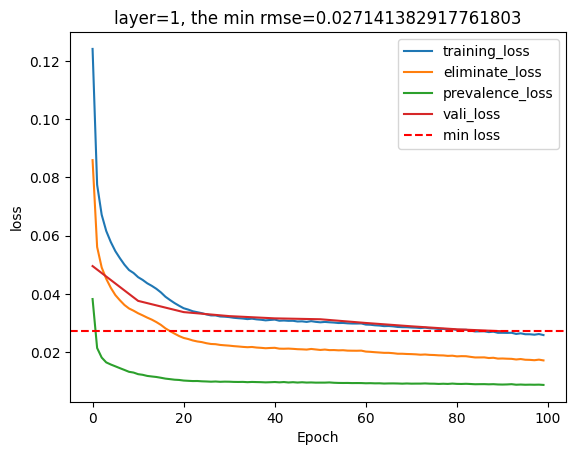

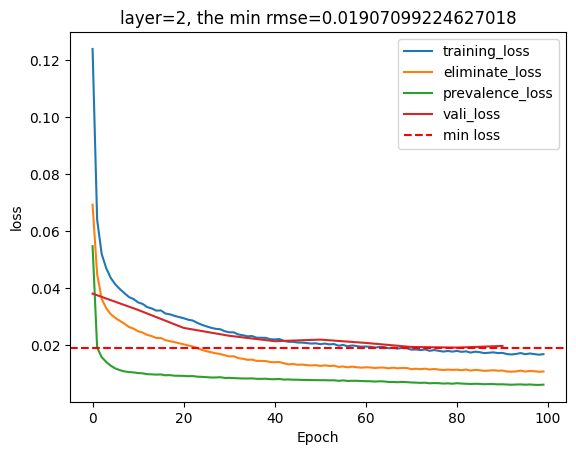

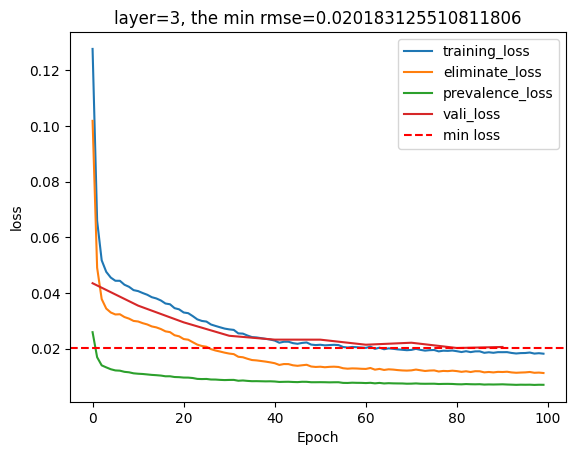

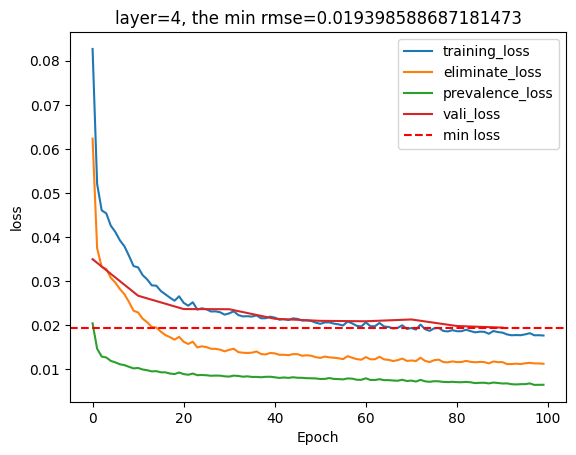

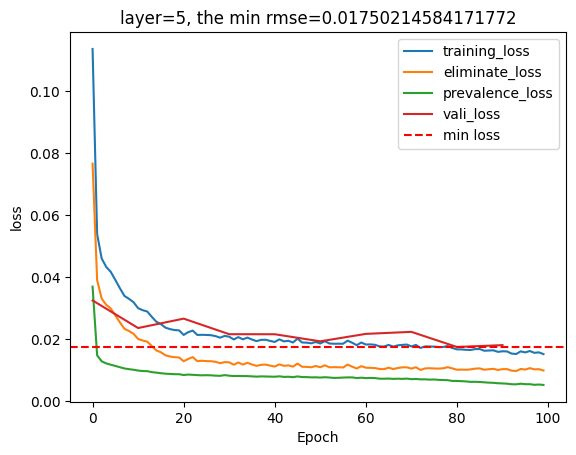

In [92]:
for history,number in zip([ma1,ma2,ma3,ma4,ma5],range(1,6)):
    plt.plot(history.history['loss'], label='training_loss')
    plt.plot(history.history['eliminate_loss'], label='eliminate_loss')
    plt.plot(history.history['prevalence_loss'], label='prevalence_loss')

    plt.plot(range(0,10*len(history.history['val_loss']),10),history.history['val_loss'], label='vali_loss')
    plt.axhline(y=min(history.history['val_loss']), color='r', linestyle='--', label='min loss')
    plt.title('layer='+str(number)+', the min rmse='+str(min(history.history['val_loss'])))

    plt.xlabel('Epoch')
    plt.ylabel('loss')

    plt.legend()
    plt.savefig('layer='+str(number)+'mosquito_model.png')
    plt.show()

In [93]:
#Adding model performance comparison based on the number of samples in training set.
#Make training set of 1000, 2000, 3000, ... and calculate accuracy.

X_train_sub = X_train[:9000]
X_train_sub

y_train_sub = y_train[:9000]

In [74]:
"""#Mosquito suppression model

# Define the input layer
inputs = Input(shape=(12,))

# Define the hidden layers
x = Dense(12, activation='relu')(inputs)



#eliminate = Dense(1, activation='linear', name="eliminate")(x)
#prevalence = Dense(1, activation='linear', name = "prevalence")(x)
suppress = Dense(1, activation='linear', name = "suppress")(x)
mos_prev = Dense(1, activation='linear', name = "mos_prev")(x)


# Define the model
model2 = Model(inputs=inputs, outputs=[suppress, mos_prev])

# Compile the model
model2.compile(optimizer=Adam(learning_rate=0.001), loss='mse')

# Define the EarlyStopping callback
early_stopping = EarlyStopping(monitor='loss', patience=10)

# Train the model
model2.fit(X_train_sub.loc[:,["distance","remate_chance","want_to_bite_rate","animal_bite_rate","dd_fitness_value","somatic_fitness_multiplier_f","grc_beta","drive_conversion","erc_f","r1_occurrence_rate","low_density_growth_rate","seasonal_amplitude"]], [y_train_sub["suppressed"],y_train_sub["mosquito_prev"]], epochs=800, batch_size=50, validation_freq=0.2, callbacks=[early_stopping])"""

Epoch 1/800
180/180 [==============================] - 0s 969us/step - loss: 0.0856 - suppress_loss: 0.0195 - mos_prev_loss: 0.0660
Epoch 2/800
180/180 [==============================] - 0s 861us/step - loss: 0.0406 - suppress_loss: 0.0121 - mos_prev_loss: 0.0285
Epoch 3/800
180/180 [==============================] - 0s 835us/step - loss: 0.0334 - suppress_loss: 0.0100 - mos_prev_loss: 0.0233
Epoch 4/800
180/180 [==============================] - 0s 961us/step - loss: 0.0297 - suppress_loss: 0.0091 - mos_prev_loss: 0.0206
Epoch 5/800
180/180 [==============================] - 0s 788us/step - loss: 0.0273 - suppress_loss: 0.0085 - mos_prev_loss: 0.0188
Epoch 6/800
180/180 [==============================] - 0s 838us/step - loss: 0.0256 - suppress_loss: 0.0082 - mos_prev_loss: 0.0175
Epoch 7/800
180/180 [==============================] - 0s 812us/step - loss: 0.0244 - suppress_loss: 0.0079 - mos_prev_loss: 0.0165
Epoch 8/800
180/180 [==============================] - 0s 844us/step - loss:

180/180 [==============================] - 0s 829us/step - loss: 0.0133 - suppress_loss: 0.0044 - mos_prev_loss: 0.0089
Epoch 124/800
180/180 [==============================] - 0s 846us/step - loss: 0.0131 - suppress_loss: 0.0043 - mos_prev_loss: 0.0089
Epoch 125/800
180/180 [==============================] - 0s 807us/step - loss: 0.0133 - suppress_loss: 0.0043 - mos_prev_loss: 0.0090
Epoch 126/800
180/180 [==============================] - 0s 1ms/step - loss: 0.0130 - suppress_loss: 0.0042 - mos_prev_loss: 0.0087
Epoch 127/800
180/180 [==============================] - 0s 858us/step - loss: 0.0131 - suppress_loss: 0.0043 - mos_prev_loss: 0.0088
Epoch 128/800
180/180 [==============================] - 0s 768us/step - loss: 0.0131 - suppress_loss: 0.0043 - mos_prev_loss: 0.0089
Epoch 129/800
180/180 [==============================] - 0s 840us/step - loss: 0.0131 - suppress_loss: 0.0042 - mos_prev_loss: 0.0088
Epoch 130/800
180/180 [==============================] - 0s 862us/step - loss:

180/180 [==============================] - 0s 853us/step - loss: 0.0115 - suppress_loss: 0.0039 - mos_prev_loss: 0.0077
Epoch 246/800
180/180 [==============================] - 0s 817us/step - loss: 0.0119 - suppress_loss: 0.0039 - mos_prev_loss: 0.0080
Epoch 247/800
180/180 [==============================] - 0s 839us/step - loss: 0.0117 - suppress_loss: 0.0039 - mos_prev_loss: 0.0078
Epoch 248/800
180/180 [==============================] - 0s 807us/step - loss: 0.0115 - suppress_loss: 0.0038 - mos_prev_loss: 0.0077
Epoch 249/800
180/180 [==============================] - 0s 861us/step - loss: 0.0117 - suppress_loss: 0.0039 - mos_prev_loss: 0.0078
Epoch 250/800
180/180 [==============================] - 0s 854us/step - loss: 0.0115 - suppress_loss: 0.0039 - mos_prev_loss: 0.0077
Epoch 251/800
180/180 [==============================] - 0s 835us/step - loss: 0.0115 - suppress_loss: 0.0038 - mos_prev_loss: 0.0076
Epoch 252/800
180/180 [==============================] - 0s 843us/step - los

In [108]:
def split_train_mosquito(n_layer,rep):
    #Mosquito suppression model

    # Define the input layer
    inputs = Input(shape=(12,))
    

    # Define the hidden layers
    x = Dense(12, activation='relu')(inputs)
    for i in range(n_layer-1):
        x = Dense(12, activation='relu')(x)
    
    #eliminate = Dense(1, activation='linear', name="eliminate")(x)
    #prevalence = Dense(1, activation='linear', name = "prevalence")(x)
    suppress = Dense(1, activation='linear', name = "suppress")(x)
    mos_prev = Dense(1, activation='linear', name = "mos_prev")(x)

    # Define the model
    model2 = Model(inputs=inputs, outputs=[suppress, mos_prev])

    # Compile the model
    model2.compile(optimizer=Adam(learning_rate=0.001), loss='mse')
    
    # Define the EarlyStopping callback
    early_stopping = EarlyStopping(monitor='loss', patience=100)

    # Train the model
    history=model2.fit(X_train.loc[:,mosquito_parameter], [y_train["suppressed"],y_train["mosquito_prev"]], epochs=500, batch_size=50, validation_freq=10, callbacks=[early_stopping],
                       validation_data=(X_test.loc[:,mosquito_parameter], [y_test["suppressed"],y_test["mosquito_prev"]]))
    
    model2.save('20241210mosquito_layer'+str(n_layer)+'rep'+str(rep),'.keras')
    return history

    

In [109]:
for i in range(1,6):
    for j in range(20):
        split_train_mosquito(i,j)

Epoch 1/500
196/196 [==============================] - 0s 733us/step - loss: 0.6804 - suppress_loss: 0.1522 - mos_prev_loss: 0.5282
Epoch 2/500
196/196 [==============================] - 0s 734us/step - loss: 0.0700 - suppress_loss: 0.0234 - mos_prev_loss: 0.0466
Epoch 3/500
196/196 [==============================] - 0s 768us/step - loss: 0.0430 - suppress_loss: 0.0148 - mos_prev_loss: 0.0283
Epoch 4/500
196/196 [==============================] - 0s 716us/step - loss: 0.0335 - suppress_loss: 0.0113 - mos_prev_loss: 0.0222
Epoch 5/500
196/196 [==============================] - 0s 757us/step - loss: 0.0302 - suppress_loss: 0.0098 - mos_prev_loss: 0.0203
Epoch 6/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0290 - suppress_loss: 0.0092 - mos_prev_loss: 0.0198
Epoch 7/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0282 - suppress_loss: 0.0088 - mos_prev_loss: 0.0194
Epoch 8/500
196/196 [==============================] - 0s 878us/step - loss: 0.0

Epoch 60/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0182 - suppress_loss: 0.0056 - mos_prev_loss: 0.0126 - val_loss: 0.0188 - val_suppress_loss: 0.0058 - val_mos_prev_loss: 0.0129
Epoch 61/500
196/196 [==============================] - 0s 739us/step - loss: 0.0181 - suppress_loss: 0.0056 - mos_prev_loss: 0.0125
Epoch 62/500
196/196 [==============================] - 0s 763us/step - loss: 0.0181 - suppress_loss: 0.0056 - mos_prev_loss: 0.0126
Epoch 63/500
196/196 [==============================] - 0s 732us/step - loss: 0.0182 - suppress_loss: 0.0055 - mos_prev_loss: 0.0126
Epoch 64/500
196/196 [==============================] - 0s 698us/step - loss: 0.0182 - suppress_loss: 0.0056 - mos_prev_loss: 0.0126
Epoch 65/500
196/196 [==============================] - 0s 762us/step - loss: 0.0181 - suppress_loss: 0.0056 - mos_prev_loss: 0.0125
Epoch 66/500
196/196 [==============================] - 0s 720us/step - loss: 0.0182 - suppress_loss: 0.0056 - mos_prev_loss: 0.0

Epoch 176/500
196/196 [==============================] - 0s 719us/step - loss: 0.0163 - suppress_loss: 0.0049 - mos_prev_loss: 0.0115
Epoch 177/500
196/196 [==============================] - 0s 761us/step - loss: 0.0162 - suppress_loss: 0.0048 - mos_prev_loss: 0.0114
Epoch 178/500
196/196 [==============================] - 0s 743us/step - loss: 0.0162 - suppress_loss: 0.0048 - mos_prev_loss: 0.0114
Epoch 179/500
196/196 [==============================] - 0s 700us/step - loss: 0.0163 - suppress_loss: 0.0048 - mos_prev_loss: 0.0114
Epoch 180/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0162 - suppress_loss: 0.0048 - mos_prev_loss: 0.0113 - val_loss: 0.0165 - val_suppress_loss: 0.0049 - val_mos_prev_loss: 0.0116
Epoch 181/500
196/196 [==============================] - 0s 726us/step - loss: 0.0161 - suppress_loss: 0.0048 - mos_prev_loss: 0.0113
Epoch 182/500
196/196 [==============================] - 0s 737us/step - loss: 0.0161 - suppress_loss: 0.0048 - mos_prev_lo

Epoch 291/500
196/196 [==============================] - 0s 718us/step - loss: 0.0115 - suppress_loss: 0.0043 - mos_prev_loss: 0.0072
Epoch 292/500
196/196 [==============================] - 0s 750us/step - loss: 0.0115 - suppress_loss: 0.0043 - mos_prev_loss: 0.0072
Epoch 293/500
196/196 [==============================] - 0s 754us/step - loss: 0.0114 - suppress_loss: 0.0043 - mos_prev_loss: 0.0072
Epoch 294/500
196/196 [==============================] - 0s 728us/step - loss: 0.0114 - suppress_loss: 0.0043 - mos_prev_loss: 0.0071
Epoch 295/500
196/196 [==============================] - 0s 753us/step - loss: 0.0115 - suppress_loss: 0.0043 - mos_prev_loss: 0.0072
Epoch 296/500
196/196 [==============================] - 0s 711us/step - loss: 0.0114 - suppress_loss: 0.0043 - mos_prev_loss: 0.0072
Epoch 297/500
196/196 [==============================] - 0s 732us/step - loss: 0.0114 - suppress_loss: 0.0043 - mos_prev_loss: 0.0071
Epoch 298/500
196/196 [==============================] - 0s 72

Epoch 407/500
196/196 [==============================] - 0s 710us/step - loss: 0.0109 - suppress_loss: 0.0040 - mos_prev_loss: 0.0068
Epoch 408/500
196/196 [==============================] - 0s 740us/step - loss: 0.0108 - suppress_loss: 0.0040 - mos_prev_loss: 0.0068
Epoch 409/500
196/196 [==============================] - 0s 718us/step - loss: 0.0109 - suppress_loss: 0.0040 - mos_prev_loss: 0.0068
Epoch 410/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0109 - suppress_loss: 0.0040 - mos_prev_loss: 0.0069 - val_loss: 0.0115 - val_suppress_loss: 0.0042 - val_mos_prev_loss: 0.0073
Epoch 411/500
196/196 [==============================] - 0s 774us/step - loss: 0.0109 - suppress_loss: 0.0041 - mos_prev_loss: 0.0069
Epoch 412/500
196/196 [==============================] - 0s 727us/step - loss: 0.0108 - suppress_loss: 0.0040 - mos_prev_loss: 0.0068
Epoch 413/500
196/196 [==============================] - 0s 748us/step - loss: 0.0108 - suppress_loss: 0.0040 - mos_prev_lo

196/196 [==============================] - 0s 808us/step - loss: 0.0170 - suppress_loss: 0.0051 - mos_prev_loss: 0.0119
Epoch 22/500
196/196 [==============================] - 0s 776us/step - loss: 0.0167 - suppress_loss: 0.0051 - mos_prev_loss: 0.0116
Epoch 23/500
196/196 [==============================] - 0s 781us/step - loss: 0.0163 - suppress_loss: 0.0050 - mos_prev_loss: 0.0113
Epoch 24/500
196/196 [==============================] - 0s 803us/step - loss: 0.0160 - suppress_loss: 0.0049 - mos_prev_loss: 0.0111
Epoch 25/500
196/196 [==============================] - 0s 809us/step - loss: 0.0156 - suppress_loss: 0.0049 - mos_prev_loss: 0.0108
Epoch 26/500
196/196 [==============================] - 0s 776us/step - loss: 0.0152 - suppress_loss: 0.0048 - mos_prev_loss: 0.0104
Epoch 27/500
196/196 [==============================] - 0s 829us/step - loss: 0.0150 - suppress_loss: 0.0048 - mos_prev_loss: 0.0102
Epoch 28/500
196/196 [==============================] - 0s 832us/step - loss: 0.01

196/196 [==============================] - 0s 724us/step - loss: 0.0093 - suppress_loss: 0.0035 - mos_prev_loss: 0.0058
Epoch 138/500
196/196 [==============================] - 0s 743us/step - loss: 0.0094 - suppress_loss: 0.0035 - mos_prev_loss: 0.0059
Epoch 139/500
196/196 [==============================] - 0s 711us/step - loss: 0.0092 - suppress_loss: 0.0034 - mos_prev_loss: 0.0058
Epoch 140/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0092 - suppress_loss: 0.0034 - mos_prev_loss: 0.0058 - val_loss: 0.0097 - val_suppress_loss: 0.0036 - val_mos_prev_loss: 0.0061
Epoch 141/500
196/196 [==============================] - 0s 720us/step - loss: 0.0093 - suppress_loss: 0.0034 - mos_prev_loss: 0.0058
Epoch 142/500
196/196 [==============================] - 0s 706us/step - loss: 0.0092 - suppress_loss: 0.0034 - mos_prev_loss: 0.0058
Epoch 143/500
196/196 [==============================] - 0s 706us/step - loss: 0.0093 - suppress_loss: 0.0035 - mos_prev_loss: 0.0058
Epo

196/196 [==============================] - 0s 737us/step - loss: 0.0079 - suppress_loss: 0.0028 - mos_prev_loss: 0.0051
Epoch 252/500
196/196 [==============================] - 0s 698us/step - loss: 0.0078 - suppress_loss: 0.0027 - mos_prev_loss: 0.0051
Epoch 253/500
196/196 [==============================] - 0s 700us/step - loss: 0.0079 - suppress_loss: 0.0028 - mos_prev_loss: 0.0052
Epoch 254/500
196/196 [==============================] - 0s 720us/step - loss: 0.0078 - suppress_loss: 0.0028 - mos_prev_loss: 0.0051
Epoch 255/500
196/196 [==============================] - 0s 708us/step - loss: 0.0078 - suppress_loss: 0.0028 - mos_prev_loss: 0.0051
Epoch 256/500
196/196 [==============================] - 0s 718us/step - loss: 0.0078 - suppress_loss: 0.0027 - mos_prev_loss: 0.0050
Epoch 257/500
196/196 [==============================] - 0s 734us/step - loss: 0.0078 - suppress_loss: 0.0027 - mos_prev_loss: 0.0051
Epoch 258/500
196/196 [==============================] - 0s 760us/step - los

Epoch 367/500
196/196 [==============================] - 0s 686us/step - loss: 0.0073 - suppress_loss: 0.0024 - mos_prev_loss: 0.0048
Epoch 368/500
196/196 [==============================] - 0s 713us/step - loss: 0.0073 - suppress_loss: 0.0025 - mos_prev_loss: 0.0048
Epoch 369/500
196/196 [==============================] - 0s 712us/step - loss: 0.0074 - suppress_loss: 0.0025 - mos_prev_loss: 0.0049
Epoch 370/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0073 - suppress_loss: 0.0025 - mos_prev_loss: 0.0049 - val_loss: 0.0082 - val_suppress_loss: 0.0028 - val_mos_prev_loss: 0.0054
Epoch 371/500
196/196 [==============================] - 0s 740us/step - loss: 0.0073 - suppress_loss: 0.0024 - mos_prev_loss: 0.0049
Epoch 372/500
196/196 [==============================] - 0s 696us/step - loss: 0.0073 - suppress_loss: 0.0024 - mos_prev_loss: 0.0049
Epoch 373/500
196/196 [==============================] - 0s 702us/step - loss: 0.0076 - suppress_loss: 0.0026 - mos_prev_lo

196/196 [==============================] - 0s 722us/step - loss: 0.0071 - suppress_loss: 0.0024 - mos_prev_loss: 0.0047
Epoch 482/500
196/196 [==============================] - 0s 740us/step - loss: 0.0071 - suppress_loss: 0.0023 - mos_prev_loss: 0.0047
Epoch 483/500
196/196 [==============================] - 0s 727us/step - loss: 0.0071 - suppress_loss: 0.0023 - mos_prev_loss: 0.0048
Epoch 484/500
196/196 [==============================] - 0s 743us/step - loss: 0.0072 - suppress_loss: 0.0024 - mos_prev_loss: 0.0048
Epoch 485/500
196/196 [==============================] - 0s 722us/step - loss: 0.0070 - suppress_loss: 0.0023 - mos_prev_loss: 0.0047
Epoch 486/500
196/196 [==============================] - 0s 715us/step - loss: 0.0070 - suppress_loss: 0.0023 - mos_prev_loss: 0.0047
Epoch 487/500
196/196 [==============================] - 0s 701us/step - loss: 0.0071 - suppress_loss: 0.0023 - mos_prev_loss: 0.0047
Epoch 488/500
196/196 [==============================] - 0s 717us/step - los

196/196 [==============================] - 0s 847us/step - loss: 0.0138 - suppress_loss: 0.0048 - mos_prev_loss: 0.0090
Epoch 98/500
196/196 [==============================] - 0s 816us/step - loss: 0.0136 - suppress_loss: 0.0047 - mos_prev_loss: 0.0089
Epoch 99/500
196/196 [==============================] - 0s 815us/step - loss: 0.0135 - suppress_loss: 0.0047 - mos_prev_loss: 0.0088
Epoch 100/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0132 - suppress_loss: 0.0046 - mos_prev_loss: 0.0086 - val_loss: 0.0137 - val_suppress_loss: 0.0050 - val_mos_prev_loss: 0.0088
Epoch 101/500
196/196 [==============================] - 0s 849us/step - loss: 0.0132 - suppress_loss: 0.0046 - mos_prev_loss: 0.0086
Epoch 102/500
196/196 [==============================] - 0s 893us/step - loss: 0.0131 - suppress_loss: 0.0046 - mos_prev_loss: 0.0085
Epoch 103/500
196/196 [==============================] - 0s 839us/step - loss: 0.0130 - suppress_loss: 0.0046 - mos_prev_loss: 0.0084
Epoch

Epoch 155/500
196/196 [==============================] - 0s 745us/step - loss: 0.0109 - suppress_loss: 0.0040 - mos_prev_loss: 0.0068
Epoch 156/500
196/196 [==============================] - 0s 762us/step - loss: 0.0108 - suppress_loss: 0.0039 - mos_prev_loss: 0.0068
Epoch 157/500
196/196 [==============================] - 0s 719us/step - loss: 0.0108 - suppress_loss: 0.0040 - mos_prev_loss: 0.0068
Epoch 158/500
196/196 [==============================] - 0s 729us/step - loss: 0.0108 - suppress_loss: 0.0039 - mos_prev_loss: 0.0069
Epoch 159/500
196/196 [==============================] - 0s 709us/step - loss: 0.0108 - suppress_loss: 0.0040 - mos_prev_loss: 0.0068
Epoch 160/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0107 - suppress_loss: 0.0039 - mos_prev_loss: 0.0068 - val_loss: 0.0112 - val_suppress_loss: 0.0043 - val_mos_prev_loss: 0.0069
Epoch 161/500
196/196 [==============================] - 0s 768us/step - loss: 0.0108 - suppress_loss: 0.0039 - mos_prev_lo

196/196 [==============================] - 0s 1ms/step - loss: 0.0099 - suppress_loss: 0.0035 - mos_prev_loss: 0.0063 - val_loss: 0.0103 - val_suppress_loss: 0.0038 - val_mos_prev_loss: 0.0064
Epoch 271/500
196/196 [==============================] - 0s 764us/step - loss: 0.0098 - suppress_loss: 0.0035 - mos_prev_loss: 0.0063
Epoch 272/500
196/196 [==============================] - 0s 731us/step - loss: 0.0099 - suppress_loss: 0.0035 - mos_prev_loss: 0.0064
Epoch 273/500
196/196 [==============================] - 0s 763us/step - loss: 0.0099 - suppress_loss: 0.0035 - mos_prev_loss: 0.0064
Epoch 274/500
196/196 [==============================] - 0s 707us/step - loss: 0.0098 - suppress_loss: 0.0035 - mos_prev_loss: 0.0063
Epoch 275/500
196/196 [==============================] - 0s 714us/step - loss: 0.0099 - suppress_loss: 0.0036 - mos_prev_loss: 0.0064
Epoch 276/500
196/196 [==============================] - 0s 772us/step - loss: 0.0098 - suppress_loss: 0.0035 - mos_prev_loss: 0.0063
Epo

Epoch 328/500
196/196 [==============================] - 0s 856us/step - loss: 0.0094 - suppress_loss: 0.0033 - mos_prev_loss: 0.0061
Epoch 329/500
196/196 [==============================] - 0s 721us/step - loss: 0.0095 - suppress_loss: 0.0033 - mos_prev_loss: 0.0062
Epoch 330/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0095 - suppress_loss: 0.0033 - mos_prev_loss: 0.0061 - val_loss: 0.0097 - val_suppress_loss: 0.0034 - val_mos_prev_loss: 0.0063
Epoch 331/500
196/196 [==============================] - 0s 708us/step - loss: 0.0095 - suppress_loss: 0.0033 - mos_prev_loss: 0.0062
Epoch 332/500
196/196 [==============================] - 0s 773us/step - loss: 0.0094 - suppress_loss: 0.0033 - mos_prev_loss: 0.0061
Epoch 333/500
196/196 [==============================] - 0s 798us/step - loss: 0.0094 - suppress_loss: 0.0033 - mos_prev_loss: 0.0061
Epoch 334/500
196/196 [==============================] - 0s 742us/step - loss: 0.0096 - suppress_loss: 0.0034 - mos_prev_lo

Epoch 443/500
196/196 [==============================] - 0s 728us/step - loss: 0.0090 - suppress_loss: 0.0031 - mos_prev_loss: 0.0059
Epoch 444/500
196/196 [==============================] - 0s 740us/step - loss: 0.0087 - suppress_loss: 0.0030 - mos_prev_loss: 0.0057
Epoch 445/500
196/196 [==============================] - 0s 697us/step - loss: 0.0089 - suppress_loss: 0.0030 - mos_prev_loss: 0.0059
Epoch 446/500
196/196 [==============================] - 0s 742us/step - loss: 0.0088 - suppress_loss: 0.0030 - mos_prev_loss: 0.0059
Epoch 447/500
196/196 [==============================] - 0s 717us/step - loss: 0.0088 - suppress_loss: 0.0030 - mos_prev_loss: 0.0058
Epoch 448/500
196/196 [==============================] - 0s 765us/step - loss: 0.0089 - suppress_loss: 0.0030 - mos_prev_loss: 0.0059
Epoch 449/500
196/196 [==============================] - 0s 766us/step - loss: 0.0088 - suppress_loss: 0.0030 - mos_prev_loss: 0.0059
Epoch 450/500
196/196 [==============================] - 0s 1m

INFO:tensorflow:Assets written to: 20241210mosquito_layer1rep2\assets
Epoch 1/500
196/196 [==============================] - 0s 752us/step - loss: 0.3158 - suppress_loss: 0.1079 - mos_prev_loss: 0.2079
Epoch 2/500
196/196 [==============================] - 0s 730us/step - loss: 0.0446 - suppress_loss: 0.0142 - mos_prev_loss: 0.0304
Epoch 3/500
196/196 [==============================] - 0s 716us/step - loss: 0.0371 - suppress_loss: 0.0102 - mos_prev_loss: 0.0269
Epoch 4/500
196/196 [==============================] - 0s 727us/step - loss: 0.0337 - suppress_loss: 0.0091 - mos_prev_loss: 0.0246
Epoch 5/500
196/196 [==============================] - 0s 715us/step - loss: 0.0314 - suppress_loss: 0.0087 - mos_prev_loss: 0.0227
Epoch 6/500
196/196 [==============================] - 0s 806us/step - loss: 0.0285 - suppress_loss: 0.0081 - mos_prev_loss: 0.0205
Epoch 7/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0257 - suppress_loss: 0.0074 - mos_prev_loss: 0.0182
Epoch 8/

196/196 [==============================] - 0s 727us/step - loss: 0.0119 - suppress_loss: 0.0044 - mos_prev_loss: 0.0075
Epoch 118/500
196/196 [==============================] - 0s 711us/step - loss: 0.0119 - suppress_loss: 0.0044 - mos_prev_loss: 0.0075
Epoch 119/500
196/196 [==============================] - 0s 702us/step - loss: 0.0119 - suppress_loss: 0.0045 - mos_prev_loss: 0.0074
Epoch 120/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0118 - suppress_loss: 0.0044 - mos_prev_loss: 0.0074 - val_loss: 0.0124 - val_suppress_loss: 0.0047 - val_mos_prev_loss: 0.0077
Epoch 121/500
196/196 [==============================] - 0s 730us/step - loss: 0.0118 - suppress_loss: 0.0044 - mos_prev_loss: 0.0074
Epoch 122/500
196/196 [==============================] - 0s 746us/step - loss: 0.0119 - suppress_loss: 0.0045 - mos_prev_loss: 0.0075
Epoch 123/500
196/196 [==============================] - 0s 738us/step - loss: 0.0119 - suppress_loss: 0.0044 - mos_prev_loss: 0.0075
Epo

Epoch 175/500
196/196 [==============================] - 0s 766us/step - loss: 0.0112 - suppress_loss: 0.0042 - mos_prev_loss: 0.0070
Epoch 176/500
196/196 [==============================] - 0s 698us/step - loss: 0.0113 - suppress_loss: 0.0043 - mos_prev_loss: 0.0070
Epoch 177/500
196/196 [==============================] - 0s 722us/step - loss: 0.0111 - suppress_loss: 0.0042 - mos_prev_loss: 0.0069
Epoch 178/500
196/196 [==============================] - 0s 712us/step - loss: 0.0112 - suppress_loss: 0.0042 - mos_prev_loss: 0.0070
Epoch 179/500
196/196 [==============================] - 0s 715us/step - loss: 0.0111 - suppress_loss: 0.0042 - mos_prev_loss: 0.0069
Epoch 180/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0112 - suppress_loss: 0.0042 - mos_prev_loss: 0.0070 - val_loss: 0.0112 - val_suppress_loss: 0.0044 - val_mos_prev_loss: 0.0068
Epoch 181/500
196/196 [==============================] - 0s 734us/step - loss: 0.0112 - suppress_loss: 0.0042 - mos_prev_lo

196/196 [==============================] - 0s 1ms/step - loss: 0.0100 - suppress_loss: 0.0036 - mos_prev_loss: 0.0064 - val_loss: 0.0103 - val_suppress_loss: 0.0038 - val_mos_prev_loss: 0.0065
Epoch 291/500
196/196 [==============================] - 0s 696us/step - loss: 0.0099 - suppress_loss: 0.0036 - mos_prev_loss: 0.0063
Epoch 292/500
196/196 [==============================] - 0s 741us/step - loss: 0.0099 - suppress_loss: 0.0036 - mos_prev_loss: 0.0063
Epoch 293/500
196/196 [==============================] - 0s 760us/step - loss: 0.0099 - suppress_loss: 0.0036 - mos_prev_loss: 0.0063
Epoch 294/500
196/196 [==============================] - 0s 712us/step - loss: 0.0098 - suppress_loss: 0.0036 - mos_prev_loss: 0.0063
Epoch 295/500
196/196 [==============================] - 0s 724us/step - loss: 0.0098 - suppress_loss: 0.0036 - mos_prev_loss: 0.0062
Epoch 296/500
196/196 [==============================] - 0s 738us/step - loss: 0.0099 - suppress_loss: 0.0036 - mos_prev_loss: 0.0063
Epo

Epoch 405/500
196/196 [==============================] - 0s 742us/step - loss: 0.0090 - suppress_loss: 0.0032 - mos_prev_loss: 0.0058
Epoch 406/500
196/196 [==============================] - 0s 683us/step - loss: 0.0090 - suppress_loss: 0.0031 - mos_prev_loss: 0.0058
Epoch 407/500
196/196 [==============================] - 0s 719us/step - loss: 0.0089 - suppress_loss: 0.0031 - mos_prev_loss: 0.0058
Epoch 408/500
196/196 [==============================] - 0s 724us/step - loss: 0.0091 - suppress_loss: 0.0032 - mos_prev_loss: 0.0059
Epoch 409/500
196/196 [==============================] - 0s 725us/step - loss: 0.0089 - suppress_loss: 0.0031 - mos_prev_loss: 0.0058
Epoch 410/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0090 - suppress_loss: 0.0032 - mos_prev_loss: 0.0058 - val_loss: 0.0095 - val_suppress_loss: 0.0034 - val_mos_prev_loss: 0.0061
Epoch 411/500
196/196 [==============================] - 0s 732us/step - loss: 0.0089 - suppress_loss: 0.0031 - mos_prev_lo

196/196 [==============================] - 0s 2ms/step - loss: 0.0242 - suppress_loss: 0.0083 - mos_prev_loss: 0.0160 - val_loss: 0.0242 - val_suppress_loss: 0.0088 - val_mos_prev_loss: 0.0154
Epoch 21/500
196/196 [==============================] - 0s 818us/step - loss: 0.0231 - suppress_loss: 0.0082 - mos_prev_loss: 0.0149
Epoch 22/500
196/196 [==============================] - 0s 808us/step - loss: 0.0221 - suppress_loss: 0.0081 - mos_prev_loss: 0.0140
Epoch 23/500
196/196 [==============================] - 0s 779us/step - loss: 0.0214 - suppress_loss: 0.0080 - mos_prev_loss: 0.0133
Epoch 24/500
196/196 [==============================] - 0s 803us/step - loss: 0.0207 - suppress_loss: 0.0079 - mos_prev_loss: 0.0128
Epoch 25/500
196/196 [==============================] - 0s 793us/step - loss: 0.0203 - suppress_loss: 0.0078 - mos_prev_loss: 0.0125
Epoch 26/500
196/196 [==============================] - 0s 805us/step - loss: 0.0199 - suppress_loss: 0.0077 - mos_prev_loss: 0.0122
Epoch 27/

196/196 [==============================] - 0s 756us/step - loss: 0.0121 - suppress_loss: 0.0046 - mos_prev_loss: 0.0075
Epoch 137/500
196/196 [==============================] - 0s 719us/step - loss: 0.0120 - suppress_loss: 0.0045 - mos_prev_loss: 0.0074
Epoch 138/500
196/196 [==============================] - 0s 715us/step - loss: 0.0120 - suppress_loss: 0.0046 - mos_prev_loss: 0.0075
Epoch 139/500
196/196 [==============================] - 0s 710us/step - loss: 0.0120 - suppress_loss: 0.0045 - mos_prev_loss: 0.0075
Epoch 140/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0120 - suppress_loss: 0.0046 - mos_prev_loss: 0.0075 - val_loss: 0.0125 - val_suppress_loss: 0.0049 - val_mos_prev_loss: 0.0076
Epoch 141/500
196/196 [==============================] - 0s 730us/step - loss: 0.0120 - suppress_loss: 0.0046 - mos_prev_loss: 0.0075
Epoch 142/500
196/196 [==============================] - 0s 711us/step - loss: 0.0120 - suppress_loss: 0.0046 - mos_prev_loss: 0.0074
Epo

Epoch 194/500
196/196 [==============================] - 0s 726us/step - loss: 0.0115 - suppress_loss: 0.0044 - mos_prev_loss: 0.0071
Epoch 195/500
196/196 [==============================] - 0s 718us/step - loss: 0.0116 - suppress_loss: 0.0044 - mos_prev_loss: 0.0072
Epoch 196/500
196/196 [==============================] - 0s 731us/step - loss: 0.0116 - suppress_loss: 0.0044 - mos_prev_loss: 0.0072
Epoch 197/500
196/196 [==============================] - 0s 725us/step - loss: 0.0115 - suppress_loss: 0.0043 - mos_prev_loss: 0.0071
Epoch 198/500
196/196 [==============================] - 0s 857us/step - loss: 0.0116 - suppress_loss: 0.0044 - mos_prev_loss: 0.0072
Epoch 199/500
196/196 [==============================] - 0s 779us/step - loss: 0.0116 - suppress_loss: 0.0044 - mos_prev_loss: 0.0072
Epoch 200/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0116 - suppress_loss: 0.0044 - mos_prev_loss: 0.0072 - val_loss: 0.0120 - val_suppress_loss: 0.0047 - val_mos_prev_lo

196/196 [==============================] - 0s 733us/step - loss: 0.0109 - suppress_loss: 0.0041 - mos_prev_loss: 0.0068
Epoch 310/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0109 - suppress_loss: 0.0041 - mos_prev_loss: 0.0068 - val_loss: 0.0111 - val_suppress_loss: 0.0043 - val_mos_prev_loss: 0.0068
Epoch 311/500
196/196 [==============================] - 0s 730us/step - loss: 0.0109 - suppress_loss: 0.0041 - mos_prev_loss: 0.0068
Epoch 312/500
196/196 [==============================] - 0s 726us/step - loss: 0.0109 - suppress_loss: 0.0041 - mos_prev_loss: 0.0068
Epoch 313/500
196/196 [==============================] - 0s 726us/step - loss: 0.0109 - suppress_loss: 0.0041 - mos_prev_loss: 0.0068
Epoch 314/500
196/196 [==============================] - 0s 704us/step - loss: 0.0109 - suppress_loss: 0.0041 - mos_prev_loss: 0.0068
Epoch 315/500
196/196 [==============================] - 0s 728us/step - loss: 0.0109 - suppress_loss: 0.0041 - mos_prev_loss: 0.0068
Epo

Epoch 424/500
196/196 [==============================] - 0s 726us/step - loss: 0.0106 - suppress_loss: 0.0040 - mos_prev_loss: 0.0066
Epoch 425/500
196/196 [==============================] - 0s 699us/step - loss: 0.0105 - suppress_loss: 0.0040 - mos_prev_loss: 0.0066
Epoch 426/500
196/196 [==============================] - 0s 770us/step - loss: 0.0106 - suppress_loss: 0.0040 - mos_prev_loss: 0.0066
Epoch 427/500
196/196 [==============================] - 0s 713us/step - loss: 0.0105 - suppress_loss: 0.0040 - mos_prev_loss: 0.0065
Epoch 428/500
196/196 [==============================] - 0s 705us/step - loss: 0.0106 - suppress_loss: 0.0040 - mos_prev_loss: 0.0066
Epoch 429/500
196/196 [==============================] - 0s 736us/step - loss: 0.0104 - suppress_loss: 0.0039 - mos_prev_loss: 0.0065
Epoch 430/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0104 - suppress_loss: 0.0039 - mos_prev_loss: 0.0065 - val_loss: 0.0106 - val_suppress_loss: 0.0041 - val_mos_prev_lo

196/196 [==============================] - 0s 750us/step - loss: 0.0206 - suppress_loss: 0.0074 - mos_prev_loss: 0.0132
Epoch 40/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0201 - suppress_loss: 0.0073 - mos_prev_loss: 0.0128 - val_loss: 0.0201 - val_suppress_loss: 0.0076 - val_mos_prev_loss: 0.0125
Epoch 41/500
196/196 [==============================] - 0s 731us/step - loss: 0.0198 - suppress_loss: 0.0072 - mos_prev_loss: 0.0126
Epoch 42/500
196/196 [==============================] - 0s 771us/step - loss: 0.0195 - suppress_loss: 0.0071 - mos_prev_loss: 0.0124
Epoch 43/500
196/196 [==============================] - 0s 711us/step - loss: 0.0193 - suppress_loss: 0.0070 - mos_prev_loss: 0.0123
Epoch 44/500
196/196 [==============================] - 0s 697us/step - loss: 0.0191 - suppress_loss: 0.0070 - mos_prev_loss: 0.0122
Epoch 45/500
196/196 [==============================] - 0s 762us/step - loss: 0.0189 - suppress_loss: 0.0069 - mos_prev_loss: 0.0121
Epoch 46/

Epoch 155/500
196/196 [==============================] - 0s 762us/step - loss: 0.0124 - suppress_loss: 0.0041 - mos_prev_loss: 0.0083
Epoch 156/500
196/196 [==============================] - 0s 716us/step - loss: 0.0123 - suppress_loss: 0.0041 - mos_prev_loss: 0.0082
Epoch 157/500
196/196 [==============================] - 0s 735us/step - loss: 0.0122 - suppress_loss: 0.0041 - mos_prev_loss: 0.0082
Epoch 158/500
196/196 [==============================] - 0s 741us/step - loss: 0.0122 - suppress_loss: 0.0040 - mos_prev_loss: 0.0082
Epoch 159/500
196/196 [==============================] - 0s 733us/step - loss: 0.0122 - suppress_loss: 0.0040 - mos_prev_loss: 0.0082
Epoch 160/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0123 - suppress_loss: 0.0040 - mos_prev_loss: 0.0082 - val_loss: 0.0121 - val_suppress_loss: 0.0042 - val_mos_prev_loss: 0.0079
Epoch 161/500
196/196 [==============================] - 0s 738us/step - loss: 0.0123 - suppress_loss: 0.0041 - mos_prev_lo

196/196 [==============================] - 0s 1ms/step - loss: 0.0109 - suppress_loss: 0.0036 - mos_prev_loss: 0.0073 - val_loss: 0.0108 - val_suppress_loss: 0.0036 - val_mos_prev_loss: 0.0072
Epoch 271/500
196/196 [==============================] - 0s 712us/step - loss: 0.0111 - suppress_loss: 0.0036 - mos_prev_loss: 0.0074
Epoch 272/500
196/196 [==============================] - 0s 715us/step - loss: 0.0109 - suppress_loss: 0.0036 - mos_prev_loss: 0.0073
Epoch 273/500
196/196 [==============================] - 0s 698us/step - loss: 0.0109 - suppress_loss: 0.0036 - mos_prev_loss: 0.0073
Epoch 274/500
196/196 [==============================] - 0s 725us/step - loss: 0.0107 - suppress_loss: 0.0035 - mos_prev_loss: 0.0072
Epoch 275/500
196/196 [==============================] - 0s 738us/step - loss: 0.0108 - suppress_loss: 0.0035 - mos_prev_loss: 0.0072
Epoch 276/500
196/196 [==============================] - 0s 717us/step - loss: 0.0108 - suppress_loss: 0.0036 - mos_prev_loss: 0.0072
Epo

Epoch 328/500
196/196 [==============================] - 0s 747us/step - loss: 0.0106 - suppress_loss: 0.0034 - mos_prev_loss: 0.0072
Epoch 329/500
196/196 [==============================] - 0s 708us/step - loss: 0.0104 - suppress_loss: 0.0034 - mos_prev_loss: 0.0070
Epoch 330/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0104 - suppress_loss: 0.0033 - mos_prev_loss: 0.0071 - val_loss: 0.0101 - val_suppress_loss: 0.0034 - val_mos_prev_loss: 0.0067
Epoch 331/500
196/196 [==============================] - 0s 702us/step - loss: 0.0103 - suppress_loss: 0.0033 - mos_prev_loss: 0.0070
Epoch 332/500
196/196 [==============================] - 0s 712us/step - loss: 0.0103 - suppress_loss: 0.0033 - mos_prev_loss: 0.0070
Epoch 333/500
196/196 [==============================] - 0s 718us/step - loss: 0.0105 - suppress_loss: 0.0034 - mos_prev_loss: 0.0071
Epoch 334/500
196/196 [==============================] - 0s 727us/step - loss: 0.0105 - suppress_loss: 0.0034 - mos_prev_lo

196/196 [==============================] - 0s 717us/step - loss: 0.0100 - suppress_loss: 0.0032 - mos_prev_loss: 0.0068
Epoch 443/500
196/196 [==============================] - 0s 724us/step - loss: 0.0101 - suppress_loss: 0.0032 - mos_prev_loss: 0.0069
Epoch 444/500
196/196 [==============================] - 0s 739us/step - loss: 0.0102 - suppress_loss: 0.0032 - mos_prev_loss: 0.0069
Epoch 445/500
196/196 [==============================] - 0s 737us/step - loss: 0.0101 - suppress_loss: 0.0032 - mos_prev_loss: 0.0069
Epoch 446/500
196/196 [==============================] - 0s 742us/step - loss: 0.0100 - suppress_loss: 0.0032 - mos_prev_loss: 0.0069
Epoch 447/500
196/196 [==============================] - 0s 727us/step - loss: 0.0100 - suppress_loss: 0.0032 - mos_prev_loss: 0.0068
Epoch 448/500
196/196 [==============================] - 0s 704us/step - loss: 0.0101 - suppress_loss: 0.0032 - mos_prev_loss: 0.0069
Epoch 449/500
196/196 [==============================] - 0s 715us/step - los

Epoch 58/500
196/196 [==============================] - 0s 805us/step - loss: 0.0171 - suppress_loss: 0.0049 - mos_prev_loss: 0.0122
Epoch 59/500
196/196 [==============================] - 0s 763us/step - loss: 0.0170 - suppress_loss: 0.0048 - mos_prev_loss: 0.0122
Epoch 60/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0170 - suppress_loss: 0.0048 - mos_prev_loss: 0.0122 - val_loss: 0.0169 - val_suppress_loss: 0.0048 - val_mos_prev_loss: 0.0121
Epoch 61/500
196/196 [==============================] - 0s 756us/step - loss: 0.0168 - suppress_loss: 0.0048 - mos_prev_loss: 0.0120
Epoch 62/500
196/196 [==============================] - 0s 743us/step - loss: 0.0168 - suppress_loss: 0.0048 - mos_prev_loss: 0.0120
Epoch 63/500
196/196 [==============================] - 0s 728us/step - loss: 0.0167 - suppress_loss: 0.0048 - mos_prev_loss: 0.0119
Epoch 64/500
196/196 [==============================] - 0s 746us/step - loss: 0.0166 - suppress_loss: 0.0047 - mos_prev_loss: 0.0

Epoch 174/500
196/196 [==============================] - 0s 758us/step - loss: 0.0122 - suppress_loss: 0.0042 - mos_prev_loss: 0.0080
Epoch 175/500
196/196 [==============================] - 0s 719us/step - loss: 0.0123 - suppress_loss: 0.0042 - mos_prev_loss: 0.0081
Epoch 176/500
196/196 [==============================] - 0s 714us/step - loss: 0.0122 - suppress_loss: 0.0042 - mos_prev_loss: 0.0081
Epoch 177/500
196/196 [==============================] - 0s 736us/step - loss: 0.0121 - suppress_loss: 0.0042 - mos_prev_loss: 0.0079
Epoch 178/500
196/196 [==============================] - 0s 695us/step - loss: 0.0122 - suppress_loss: 0.0042 - mos_prev_loss: 0.0080
Epoch 179/500
196/196 [==============================] - 0s 728us/step - loss: 0.0122 - suppress_loss: 0.0042 - mos_prev_loss: 0.0080
Epoch 180/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0121 - suppress_loss: 0.0042 - mos_prev_loss: 0.0079 - val_loss: 0.0120 - val_suppress_loss: 0.0043 - val_mos_prev_lo

196/196 [==============================] - 0s 733us/step - loss: 0.0109 - suppress_loss: 0.0037 - mos_prev_loss: 0.0071
Epoch 290/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0109 - suppress_loss: 0.0037 - mos_prev_loss: 0.0072 - val_loss: 0.0109 - val_suppress_loss: 0.0039 - val_mos_prev_loss: 0.0069
Epoch 291/500
196/196 [==============================] - 0s 739us/step - loss: 0.0110 - suppress_loss: 0.0038 - mos_prev_loss: 0.0072
Epoch 292/500
196/196 [==============================] - 0s 772us/step - loss: 0.0109 - suppress_loss: 0.0038 - mos_prev_loss: 0.0071
Epoch 293/500
196/196 [==============================] - 0s 710us/step - loss: 0.0108 - suppress_loss: 0.0037 - mos_prev_loss: 0.0071
Epoch 294/500
196/196 [==============================] - 0s 708us/step - loss: 0.0108 - suppress_loss: 0.0037 - mos_prev_loss: 0.0071
Epoch 295/500
196/196 [==============================] - 0s 753us/step - loss: 0.0108 - suppress_loss: 0.0037 - mos_prev_loss: 0.0070
Epo

Epoch 404/500
196/196 [==============================] - 0s 731us/step - loss: 0.0100 - suppress_loss: 0.0034 - mos_prev_loss: 0.0066
Epoch 405/500
196/196 [==============================] - 0s 779us/step - loss: 0.0100 - suppress_loss: 0.0034 - mos_prev_loss: 0.0066
Epoch 406/500
196/196 [==============================] - 0s 743us/step - loss: 0.0101 - suppress_loss: 0.0034 - mos_prev_loss: 0.0068
Epoch 407/500
196/196 [==============================] - 0s 729us/step - loss: 0.0100 - suppress_loss: 0.0033 - mos_prev_loss: 0.0066
Epoch 408/500
196/196 [==============================] - 0s 745us/step - loss: 0.0100 - suppress_loss: 0.0033 - mos_prev_loss: 0.0066
Epoch 409/500
196/196 [==============================] - 0s 734us/step - loss: 0.0100 - suppress_loss: 0.0034 - mos_prev_loss: 0.0067
Epoch 410/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0100 - suppress_loss: 0.0033 - mos_prev_loss: 0.0067 - val_loss: 0.0099 - val_suppress_loss: 0.0034 - val_mos_prev_lo

196/196 [==============================] - 0s 892us/step - loss: 0.0244 - suppress_loss: 0.0075 - mos_prev_loss: 0.0169
Epoch 20/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0226 - suppress_loss: 0.0070 - mos_prev_loss: 0.0156 - val_loss: 0.0224 - val_suppress_loss: 0.0070 - val_mos_prev_loss: 0.0154
Epoch 21/500
196/196 [==============================] - 0s 778us/step - loss: 0.0212 - suppress_loss: 0.0066 - mos_prev_loss: 0.0147
Epoch 22/500
196/196 [==============================] - 0s 807us/step - loss: 0.0202 - suppress_loss: 0.0063 - mos_prev_loss: 0.0140
Epoch 23/500
196/196 [==============================] - 0s 808us/step - loss: 0.0194 - suppress_loss: 0.0060 - mos_prev_loss: 0.0134
Epoch 24/500
196/196 [==============================] - 0s 822us/step - loss: 0.0188 - suppress_loss: 0.0059 - mos_prev_loss: 0.0129
Epoch 25/500
196/196 [==============================] - 0s 772us/step - loss: 0.0182 - suppress_loss: 0.0058 - mos_prev_loss: 0.0125
Epoch 26/

196/196 [==============================] - 0s 721us/step - loss: 0.0109 - suppress_loss: 0.0040 - mos_prev_loss: 0.0069
Epoch 136/500
196/196 [==============================] - 0s 715us/step - loss: 0.0110 - suppress_loss: 0.0041 - mos_prev_loss: 0.0069
Epoch 137/500
196/196 [==============================] - 0s 733us/step - loss: 0.0108 - suppress_loss: 0.0040 - mos_prev_loss: 0.0068
Epoch 138/500
196/196 [==============================] - 0s 750us/step - loss: 0.0108 - suppress_loss: 0.0040 - mos_prev_loss: 0.0068
Epoch 139/500
196/196 [==============================] - 0s 708us/step - loss: 0.0108 - suppress_loss: 0.0040 - mos_prev_loss: 0.0068
Epoch 140/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0108 - suppress_loss: 0.0040 - mos_prev_loss: 0.0069 - val_loss: 0.0112 - val_suppress_loss: 0.0042 - val_mos_prev_loss: 0.0070
Epoch 141/500
196/196 [==============================] - 0s 705us/step - loss: 0.0107 - suppress_loss: 0.0039 - mos_prev_loss: 0.0068
Epo

196/196 [==============================] - 0s 1ms/step - loss: 0.0090 - suppress_loss: 0.0032 - mos_prev_loss: 0.0058 - val_loss: 0.0113 - val_suppress_loss: 0.0040 - val_mos_prev_loss: 0.0073
Epoch 251/500
196/196 [==============================] - 0s 753us/step - loss: 0.0091 - suppress_loss: 0.0032 - mos_prev_loss: 0.0059
Epoch 252/500
196/196 [==============================] - 0s 712us/step - loss: 0.0092 - suppress_loss: 0.0033 - mos_prev_loss: 0.0059
Epoch 253/500
196/196 [==============================] - 0s 730us/step - loss: 0.0091 - suppress_loss: 0.0032 - mos_prev_loss: 0.0059
Epoch 254/500
196/196 [==============================] - 0s 754us/step - loss: 0.0091 - suppress_loss: 0.0032 - mos_prev_loss: 0.0058
Epoch 255/500
196/196 [==============================] - 0s 722us/step - loss: 0.0091 - suppress_loss: 0.0032 - mos_prev_loss: 0.0058
Epoch 256/500
196/196 [==============================] - 0s 729us/step - loss: 0.0091 - suppress_loss: 0.0032 - mos_prev_loss: 0.0058
Epo

196/196 [==============================] - 0s 763us/step - loss: 0.0084 - suppress_loss: 0.0029 - mos_prev_loss: 0.0055
Epoch 365/500
196/196 [==============================] - 0s 743us/step - loss: 0.0084 - suppress_loss: 0.0029 - mos_prev_loss: 0.0055
Epoch 366/500
196/196 [==============================] - 0s 716us/step - loss: 0.0084 - suppress_loss: 0.0029 - mos_prev_loss: 0.0055
Epoch 367/500
196/196 [==============================] - 0s 720us/step - loss: 0.0084 - suppress_loss: 0.0029 - mos_prev_loss: 0.0055
Epoch 368/500
196/196 [==============================] - 0s 724us/step - loss: 0.0085 - suppress_loss: 0.0029 - mos_prev_loss: 0.0056
Epoch 369/500
196/196 [==============================] - 0s 701us/step - loss: 0.0085 - suppress_loss: 0.0029 - mos_prev_loss: 0.0056
Epoch 370/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0084 - suppress_loss: 0.0029 - mos_prev_loss: 0.0055 - val_loss: 0.0087 - val_suppress_loss: 0.0030 - val_mos_prev_loss: 0.0058
Epo

Epoch 422/500
196/196 [==============================] - 0s 738us/step - loss: 0.0083 - suppress_loss: 0.0029 - mos_prev_loss: 0.0054
Epoch 423/500
196/196 [==============================] - 0s 735us/step - loss: 0.0083 - suppress_loss: 0.0028 - mos_prev_loss: 0.0055
Epoch 424/500
196/196 [==============================] - 0s 712us/step - loss: 0.0082 - suppress_loss: 0.0028 - mos_prev_loss: 0.0054
Epoch 425/500
196/196 [==============================] - 0s 743us/step - loss: 0.0083 - suppress_loss: 0.0028 - mos_prev_loss: 0.0055
Epoch 426/500
196/196 [==============================] - 0s 733us/step - loss: 0.0083 - suppress_loss: 0.0028 - mos_prev_loss: 0.0054
Epoch 427/500
196/196 [==============================] - 0s 725us/step - loss: 0.0083 - suppress_loss: 0.0028 - mos_prev_loss: 0.0055
Epoch 428/500
196/196 [==============================] - 0s 713us/step - loss: 0.0084 - suppress_loss: 0.0029 - mos_prev_loss: 0.0055
Epoch 429/500
196/196 [==============================] - 0s 70

196/196 [==============================] - 0s 787us/step - loss: 0.0263 - suppress_loss: 0.0080 - mos_prev_loss: 0.0183
Epoch 38/500
196/196 [==============================] - 0s 796us/step - loss: 0.0263 - suppress_loss: 0.0080 - mos_prev_loss: 0.0184
Epoch 39/500
196/196 [==============================] - 0s 811us/step - loss: 0.0263 - suppress_loss: 0.0080 - mos_prev_loss: 0.0184
Epoch 40/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0264 - suppress_loss: 0.0080 - mos_prev_loss: 0.0184 - val_loss: 0.0277 - val_suppress_loss: 0.0092 - val_mos_prev_loss: 0.0185
Epoch 41/500
196/196 [==============================] - 0s 832us/step - loss: 0.0263 - suppress_loss: 0.0080 - mos_prev_loss: 0.0183
Epoch 42/500
196/196 [==============================] - 0s 799us/step - loss: 0.0262 - suppress_loss: 0.0080 - mos_prev_loss: 0.0182
Epoch 43/500
196/196 [==============================] - 0s 818us/step - loss: 0.0262 - suppress_loss: 0.0080 - mos_prev_loss: 0.0182
Epoch 44/

196/196 [==============================] - 0s 699us/step - loss: 0.0105 - suppress_loss: 0.0039 - mos_prev_loss: 0.0066
Epoch 154/500
196/196 [==============================] - 0s 730us/step - loss: 0.0106 - suppress_loss: 0.0040 - mos_prev_loss: 0.0066
Epoch 155/500
196/196 [==============================] - 0s 737us/step - loss: 0.0106 - suppress_loss: 0.0039 - mos_prev_loss: 0.0066
Epoch 156/500
196/196 [==============================] - 0s 717us/step - loss: 0.0106 - suppress_loss: 0.0040 - mos_prev_loss: 0.0066
Epoch 157/500
196/196 [==============================] - 0s 706us/step - loss: 0.0105 - suppress_loss: 0.0039 - mos_prev_loss: 0.0066
Epoch 158/500
196/196 [==============================] - 0s 720us/step - loss: 0.0104 - suppress_loss: 0.0040 - mos_prev_loss: 0.0065
Epoch 159/500
196/196 [==============================] - 0s 737us/step - loss: 0.0105 - suppress_loss: 0.0040 - mos_prev_loss: 0.0065
Epoch 160/500
196/196 [==============================] - 0s 1ms/step - loss:

Epoch 211/500
196/196 [==============================] - 0s 706us/step - loss: 0.0098 - suppress_loss: 0.0036 - mos_prev_loss: 0.0062
Epoch 212/500
196/196 [==============================] - 0s 747us/step - loss: 0.0099 - suppress_loss: 0.0037 - mos_prev_loss: 0.0062
Epoch 213/500
196/196 [==============================] - 0s 730us/step - loss: 0.0099 - suppress_loss: 0.0037 - mos_prev_loss: 0.0062
Epoch 214/500
196/196 [==============================] - 0s 705us/step - loss: 0.0099 - suppress_loss: 0.0037 - mos_prev_loss: 0.0062
Epoch 215/500
196/196 [==============================] - 0s 729us/step - loss: 0.0099 - suppress_loss: 0.0036 - mos_prev_loss: 0.0062
Epoch 216/500
196/196 [==============================] - 0s 718us/step - loss: 0.0099 - suppress_loss: 0.0037 - mos_prev_loss: 0.0062
Epoch 217/500
196/196 [==============================] - 0s 757us/step - loss: 0.0098 - suppress_loss: 0.0036 - mos_prev_loss: 0.0062
Epoch 218/500
196/196 [==============================] - 0s 75

Epoch 327/500
196/196 [==============================] - 0s 750us/step - loss: 0.0088 - suppress_loss: 0.0032 - mos_prev_loss: 0.0056
Epoch 328/500
196/196 [==============================] - 0s 738us/step - loss: 0.0088 - suppress_loss: 0.0032 - mos_prev_loss: 0.0056
Epoch 329/500
196/196 [==============================] - 0s 701us/step - loss: 0.0087 - suppress_loss: 0.0031 - mos_prev_loss: 0.0056
Epoch 330/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0089 - suppress_loss: 0.0032 - mos_prev_loss: 0.0056 - val_loss: 0.0092 - val_suppress_loss: 0.0033 - val_mos_prev_loss: 0.0059
Epoch 331/500
196/196 [==============================] - 0s 705us/step - loss: 0.0088 - suppress_loss: 0.0032 - mos_prev_loss: 0.0056
Epoch 332/500
196/196 [==============================] - 0s 729us/step - loss: 0.0090 - suppress_loss: 0.0033 - mos_prev_loss: 0.0058
Epoch 333/500
196/196 [==============================] - 0s 735us/step - loss: 0.0088 - suppress_loss: 0.0032 - mos_prev_lo

196/196 [==============================] - 0s 697us/step - loss: 0.0083 - suppress_loss: 0.0029 - mos_prev_loss: 0.0053
Epoch 442/500
196/196 [==============================] - 0s 727us/step - loss: 0.0083 - suppress_loss: 0.0029 - mos_prev_loss: 0.0054
Epoch 443/500
196/196 [==============================] - 0s 757us/step - loss: 0.0083 - suppress_loss: 0.0029 - mos_prev_loss: 0.0054
Epoch 444/500
196/196 [==============================] - 0s 706us/step - loss: 0.0083 - suppress_loss: 0.0029 - mos_prev_loss: 0.0054
Epoch 445/500
196/196 [==============================] - 0s 747us/step - loss: 0.0083 - suppress_loss: 0.0029 - mos_prev_loss: 0.0054
Epoch 446/500
196/196 [==============================] - 0s 700us/step - loss: 0.0083 - suppress_loss: 0.0030 - mos_prev_loss: 0.0054
Epoch 447/500
196/196 [==============================] - 0s 749us/step - loss: 0.0085 - suppress_loss: 0.0030 - mos_prev_loss: 0.0055
Epoch 448/500
196/196 [==============================] - 0s 724us/step - los

Epoch 57/500
196/196 [==============================] - 0s 744us/step - loss: 0.0133 - suppress_loss: 0.0046 - mos_prev_loss: 0.0087
Epoch 58/500
196/196 [==============================] - 0s 706us/step - loss: 0.0131 - suppress_loss: 0.0046 - mos_prev_loss: 0.0085
Epoch 59/500
196/196 [==============================] - 0s 696us/step - loss: 0.0128 - suppress_loss: 0.0045 - mos_prev_loss: 0.0083
Epoch 60/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0127 - suppress_loss: 0.0045 - mos_prev_loss: 0.0082 - val_loss: 0.0129 - val_suppress_loss: 0.0047 - val_mos_prev_loss: 0.0082
Epoch 61/500
196/196 [==============================] - 0s 712us/step - loss: 0.0126 - suppress_loss: 0.0045 - mos_prev_loss: 0.0081
Epoch 62/500
196/196 [==============================] - 0s 705us/step - loss: 0.0126 - suppress_loss: 0.0045 - mos_prev_loss: 0.0081
Epoch 63/500
196/196 [==============================] - 0s 711us/step - loss: 0.0124 - suppress_loss: 0.0045 - mos_prev_loss: 0.0

Epoch 173/500
196/196 [==============================] - 0s 751us/step - loss: 0.0102 - suppress_loss: 0.0038 - mos_prev_loss: 0.0064
Epoch 174/500
196/196 [==============================] - 0s 700us/step - loss: 0.0101 - suppress_loss: 0.0037 - mos_prev_loss: 0.0064
Epoch 175/500
196/196 [==============================] - 0s 711us/step - loss: 0.0100 - suppress_loss: 0.0037 - mos_prev_loss: 0.0063
Epoch 176/500
196/196 [==============================] - 0s 689us/step - loss: 0.0101 - suppress_loss: 0.0037 - mos_prev_loss: 0.0063
Epoch 177/500
196/196 [==============================] - 0s 722us/step - loss: 0.0101 - suppress_loss: 0.0037 - mos_prev_loss: 0.0064
Epoch 178/500
196/196 [==============================] - 0s 711us/step - loss: 0.0100 - suppress_loss: 0.0037 - mos_prev_loss: 0.0063
Epoch 179/500
196/196 [==============================] - 0s 742us/step - loss: 0.0100 - suppress_loss: 0.0036 - mos_prev_loss: 0.0063
Epoch 180/500
196/196 [==============================] - 0s 1m

Epoch 231/500
196/196 [==============================] - 0s 766us/step - loss: 0.0094 - suppress_loss: 0.0034 - mos_prev_loss: 0.0060
Epoch 232/500
196/196 [==============================] - 0s 700us/step - loss: 0.0094 - suppress_loss: 0.0033 - mos_prev_loss: 0.0060
Epoch 233/500
196/196 [==============================] - 0s 685us/step - loss: 0.0093 - suppress_loss: 0.0034 - mos_prev_loss: 0.0059
Epoch 234/500
196/196 [==============================] - 0s 699us/step - loss: 0.0093 - suppress_loss: 0.0034 - mos_prev_loss: 0.0060
Epoch 235/500
196/196 [==============================] - 0s 742us/step - loss: 0.0092 - suppress_loss: 0.0033 - mos_prev_loss: 0.0059
Epoch 236/500
196/196 [==============================] - 0s 711us/step - loss: 0.0092 - suppress_loss: 0.0033 - mos_prev_loss: 0.0059
Epoch 237/500
196/196 [==============================] - 0s 724us/step - loss: 0.0092 - suppress_loss: 0.0033 - mos_prev_loss: 0.0059
Epoch 238/500
196/196 [==============================] - 0s 74

Epoch 347/500
196/196 [==============================] - 0s 723us/step - loss: 0.0085 - suppress_loss: 0.0029 - mos_prev_loss: 0.0056
Epoch 348/500
196/196 [==============================] - 0s 733us/step - loss: 0.0086 - suppress_loss: 0.0029 - mos_prev_loss: 0.0057
Epoch 349/500
196/196 [==============================] - 0s 697us/step - loss: 0.0085 - suppress_loss: 0.0029 - mos_prev_loss: 0.0056
Epoch 350/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0084 - suppress_loss: 0.0029 - mos_prev_loss: 0.0056 - val_loss: 0.0089 - val_suppress_loss: 0.0031 - val_mos_prev_loss: 0.0058
Epoch 351/500
196/196 [==============================] - 0s 701us/step - loss: 0.0084 - suppress_loss: 0.0028 - mos_prev_loss: 0.0055
Epoch 352/500
196/196 [==============================] - 0s 726us/step - loss: 0.0087 - suppress_loss: 0.0030 - mos_prev_loss: 0.0057
Epoch 353/500
196/196 [==============================] - 0s 750us/step - loss: 0.0085 - suppress_loss: 0.0029 - mos_prev_lo

196/196 [==============================] - 0s 688us/step - loss: 0.0082 - suppress_loss: 0.0027 - mos_prev_loss: 0.0055
Epoch 462/500
196/196 [==============================] - 0s 724us/step - loss: 0.0082 - suppress_loss: 0.0027 - mos_prev_loss: 0.0055
Epoch 463/500
196/196 [==============================] - 0s 663us/step - loss: 0.0082 - suppress_loss: 0.0027 - mos_prev_loss: 0.0055
Epoch 464/500
196/196 [==============================] - 0s 718us/step - loss: 0.0083 - suppress_loss: 0.0028 - mos_prev_loss: 0.0055
Epoch 465/500
196/196 [==============================] - 0s 728us/step - loss: 0.0081 - suppress_loss: 0.0027 - mos_prev_loss: 0.0055
Epoch 466/500
196/196 [==============================] - 0s 699us/step - loss: 0.0081 - suppress_loss: 0.0027 - mos_prev_loss: 0.0055
Epoch 467/500
196/196 [==============================] - 0s 715us/step - loss: 0.0082 - suppress_loss: 0.0027 - mos_prev_loss: 0.0055
Epoch 468/500
196/196 [==============================] - 0s 688us/step - los

196/196 [==============================] - 0s 762us/step - loss: 0.0117 - suppress_loss: 0.0043 - mos_prev_loss: 0.0074
Epoch 78/500
196/196 [==============================] - 0s 728us/step - loss: 0.0118 - suppress_loss: 0.0044 - mos_prev_loss: 0.0075
Epoch 79/500
196/196 [==============================] - 0s 723us/step - loss: 0.0116 - suppress_loss: 0.0043 - mos_prev_loss: 0.0074
Epoch 80/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0116 - suppress_loss: 0.0043 - mos_prev_loss: 0.0074 - val_loss: 0.0118 - val_suppress_loss: 0.0044 - val_mos_prev_loss: 0.0074
Epoch 81/500
196/196 [==============================] - 0s 717us/step - loss: 0.0116 - suppress_loss: 0.0043 - mos_prev_loss: 0.0074
Epoch 82/500
196/196 [==============================] - 0s 720us/step - loss: 0.0116 - suppress_loss: 0.0043 - mos_prev_loss: 0.0074
Epoch 83/500
196/196 [==============================] - 0s 756us/step - loss: 0.0117 - suppress_loss: 0.0043 - mos_prev_loss: 0.0074
Epoch 84/

Epoch 193/500
196/196 [==============================] - 0s 707us/step - loss: 0.0106 - suppress_loss: 0.0038 - mos_prev_loss: 0.0068
Epoch 194/500
196/196 [==============================] - 0s 729us/step - loss: 0.0106 - suppress_loss: 0.0037 - mos_prev_loss: 0.0069
Epoch 195/500
196/196 [==============================] - 0s 740us/step - loss: 0.0106 - suppress_loss: 0.0038 - mos_prev_loss: 0.0068
Epoch 196/500
196/196 [==============================] - 0s 727us/step - loss: 0.0105 - suppress_loss: 0.0038 - mos_prev_loss: 0.0068
Epoch 197/500
196/196 [==============================] - 0s 751us/step - loss: 0.0105 - suppress_loss: 0.0037 - mos_prev_loss: 0.0068
Epoch 198/500
196/196 [==============================] - 0s 721us/step - loss: 0.0105 - suppress_loss: 0.0037 - mos_prev_loss: 0.0068
Epoch 199/500
196/196 [==============================] - 0s 753us/step - loss: 0.0104 - suppress_loss: 0.0037 - mos_prev_loss: 0.0067
Epoch 200/500
196/196 [==============================] - 0s 1m

Epoch 251/500
196/196 [==============================] - 0s 746us/step - loss: 0.0102 - suppress_loss: 0.0036 - mos_prev_loss: 0.0066
Epoch 252/500
196/196 [==============================] - 0s 747us/step - loss: 0.0101 - suppress_loss: 0.0035 - mos_prev_loss: 0.0066
Epoch 253/500
196/196 [==============================] - 0s 725us/step - loss: 0.0102 - suppress_loss: 0.0035 - mos_prev_loss: 0.0067
Epoch 254/500
196/196 [==============================] - 0s 744us/step - loss: 0.0101 - suppress_loss: 0.0035 - mos_prev_loss: 0.0066
Epoch 255/500
196/196 [==============================] - 0s 751us/step - loss: 0.0103 - suppress_loss: 0.0036 - mos_prev_loss: 0.0067
Epoch 256/500
196/196 [==============================] - 0s 698us/step - loss: 0.0101 - suppress_loss: 0.0035 - mos_prev_loss: 0.0066
Epoch 257/500
196/196 [==============================] - 0s 708us/step - loss: 0.0101 - suppress_loss: 0.0035 - mos_prev_loss: 0.0066
Epoch 258/500
196/196 [==============================] - 0s 74

Epoch 367/500
196/196 [==============================] - 0s 721us/step - loss: 0.0098 - suppress_loss: 0.0032 - mos_prev_loss: 0.0065
Epoch 368/500
196/196 [==============================] - 0s 712us/step - loss: 0.0099 - suppress_loss: 0.0033 - mos_prev_loss: 0.0065
Epoch 369/500
196/196 [==============================] - 0s 754us/step - loss: 0.0098 - suppress_loss: 0.0032 - mos_prev_loss: 0.0066
Epoch 370/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0098 - suppress_loss: 0.0032 - mos_prev_loss: 0.0066 - val_loss: 0.0098 - val_suppress_loss: 0.0033 - val_mos_prev_loss: 0.0065
Epoch 371/500
196/196 [==============================] - 0s 760us/step - loss: 0.0098 - suppress_loss: 0.0032 - mos_prev_loss: 0.0065
Epoch 372/500
196/196 [==============================] - 0s 706us/step - loss: 0.0097 - suppress_loss: 0.0033 - mos_prev_loss: 0.0065
Epoch 373/500
196/196 [==============================] - 0s 727us/step - loss: 0.0097 - suppress_loss: 0.0032 - mos_prev_lo

Epoch 482/500
196/196 [==============================] - 0s 736us/step - loss: 0.0086 - suppress_loss: 0.0029 - mos_prev_loss: 0.0057
Epoch 483/500
196/196 [==============================] - 0s 729us/step - loss: 0.0087 - suppress_loss: 0.0030 - mos_prev_loss: 0.0057
Epoch 484/500
196/196 [==============================] - 0s 764us/step - loss: 0.0085 - suppress_loss: 0.0029 - mos_prev_loss: 0.0057
Epoch 485/500
196/196 [==============================] - 0s 731us/step - loss: 0.0087 - suppress_loss: 0.0029 - mos_prev_loss: 0.0058
Epoch 486/500
196/196 [==============================] - 0s 737us/step - loss: 0.0088 - suppress_loss: 0.0030 - mos_prev_loss: 0.0058
Epoch 487/500
196/196 [==============================] - 0s 734us/step - loss: 0.0086 - suppress_loss: 0.0029 - mos_prev_loss: 0.0057
Epoch 488/500
196/196 [==============================] - 0s 737us/step - loss: 0.0086 - suppress_loss: 0.0029 - mos_prev_loss: 0.0057
Epoch 489/500
196/196 [==============================] - 0s 73

196/196 [==============================] - 0s 713us/step - loss: 0.0143 - suppress_loss: 0.0045 - mos_prev_loss: 0.0098
Epoch 99/500
196/196 [==============================] - 0s 734us/step - loss: 0.0143 - suppress_loss: 0.0046 - mos_prev_loss: 0.0098
Epoch 100/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0142 - suppress_loss: 0.0046 - mos_prev_loss: 0.0097 - val_loss: 0.0150 - val_suppress_loss: 0.0051 - val_mos_prev_loss: 0.0099
Epoch 101/500
196/196 [==============================] - 0s 708us/step - loss: 0.0142 - suppress_loss: 0.0046 - mos_prev_loss: 0.0096
Epoch 102/500
196/196 [==============================] - 0s 724us/step - loss: 0.0140 - suppress_loss: 0.0045 - mos_prev_loss: 0.0095
Epoch 103/500
196/196 [==============================] - 0s 762us/step - loss: 0.0140 - suppress_loss: 0.0045 - mos_prev_loss: 0.0095
Epoch 104/500
196/196 [==============================] - 0s 706us/step - loss: 0.0140 - suppress_loss: 0.0046 - mos_prev_loss: 0.0094
Epoc

Epoch 156/500
196/196 [==============================] - 0s 712us/step - loss: 0.0111 - suppress_loss: 0.0041 - mos_prev_loss: 0.0070
Epoch 157/500
196/196 [==============================] - 0s 730us/step - loss: 0.0111 - suppress_loss: 0.0041 - mos_prev_loss: 0.0070
Epoch 158/500
196/196 [==============================] - 0s 770us/step - loss: 0.0112 - suppress_loss: 0.0041 - mos_prev_loss: 0.0071
Epoch 159/500
196/196 [==============================] - 0s 747us/step - loss: 0.0111 - suppress_loss: 0.0041 - mos_prev_loss: 0.0070
Epoch 160/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0111 - suppress_loss: 0.0041 - mos_prev_loss: 0.0070 - val_loss: 0.0116 - val_suppress_loss: 0.0044 - val_mos_prev_loss: 0.0071
Epoch 161/500
196/196 [==============================] - 0s 725us/step - loss: 0.0110 - suppress_loss: 0.0041 - mos_prev_loss: 0.0070
Epoch 162/500
196/196 [==============================] - 0s 739us/step - loss: 0.0111 - suppress_loss: 0.0041 - mos_prev_lo

Epoch 271/500
196/196 [==============================] - 0s 724us/step - loss: 0.0096 - suppress_loss: 0.0034 - mos_prev_loss: 0.0062
Epoch 272/500
196/196 [==============================] - 0s 723us/step - loss: 0.0096 - suppress_loss: 0.0034 - mos_prev_loss: 0.0062
Epoch 273/500
196/196 [==============================] - 0s 737us/step - loss: 0.0096 - suppress_loss: 0.0034 - mos_prev_loss: 0.0062
Epoch 274/500
196/196 [==============================] - 0s 729us/step - loss: 0.0097 - suppress_loss: 0.0034 - mos_prev_loss: 0.0063
Epoch 275/500
196/196 [==============================] - 0s 765us/step - loss: 0.0095 - suppress_loss: 0.0034 - mos_prev_loss: 0.0062
Epoch 276/500
196/196 [==============================] - 0s 713us/step - loss: 0.0096 - suppress_loss: 0.0034 - mos_prev_loss: 0.0062    
Epoch 277/500
196/196 [==============================] - 0s 748us/step - loss: 0.0096 - suppress_loss: 0.0034 - mos_prev_loss: 0.0062
Epoch 278/500
196/196 [==============================] - 0

Epoch 387/500
196/196 [==============================] - 0s 746us/step - loss: 0.0089 - suppress_loss: 0.0030 - mos_prev_loss: 0.0059
Epoch 388/500
196/196 [==============================] - 0s 706us/step - loss: 0.0088 - suppress_loss: 0.0030 - mos_prev_loss: 0.0058
Epoch 389/500
196/196 [==============================] - 0s 759us/step - loss: 0.0090 - suppress_loss: 0.0031 - mos_prev_loss: 0.0059
Epoch 390/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0089 - suppress_loss: 0.0030 - mos_prev_loss: 0.0059 - val_loss: 0.0097 - val_suppress_loss: 0.0033 - val_mos_prev_loss: 0.0064
Epoch 391/500
196/196 [==============================] - 0s 771us/step - loss: 0.0089 - suppress_loss: 0.0030 - mos_prev_loss: 0.0059
Epoch 392/500
196/196 [==============================] - 0s 688us/step - loss: 0.0089 - suppress_loss: 0.0031 - mos_prev_loss: 0.0058
Epoch 393/500
196/196 [==============================] - 0s 720us/step - loss: 0.0088 - suppress_loss: 0.0030 - mos_prev_lo

196/196 [==============================] - 0s 717us/step - loss: 0.2797 - suppress_loss: 0.0579 - mos_prev_loss: 0.2218
Epoch 2/500
196/196 [==============================] - 0s 748us/step - loss: 0.0867 - suppress_loss: 0.0245 - mos_prev_loss: 0.0623
Epoch 3/500
196/196 [==============================] - 0s 703us/step - loss: 0.0525 - suppress_loss: 0.0154 - mos_prev_loss: 0.0371
Epoch 4/500
196/196 [==============================] - 0s 719us/step - loss: 0.0394 - suppress_loss: 0.0122 - mos_prev_loss: 0.0272
Epoch 5/500
196/196 [==============================] - 0s 762us/step - loss: 0.0339 - suppress_loss: 0.0107 - mos_prev_loss: 0.0232
Epoch 6/500
196/196 [==============================] - 0s 857us/step - loss: 0.0312 - suppress_loss: 0.0099 - mos_prev_loss: 0.0213
Epoch 7/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0298 - suppress_loss: 0.0094 - mos_prev_loss: 0.0204
Epoch 8/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0288 - suppre

196/196 [==============================] - 0s 1ms/step - loss: 0.0150 - suppress_loss: 0.0044 - mos_prev_loss: 0.0105 - val_loss: 0.0155 - val_suppress_loss: 0.0049 - val_mos_prev_loss: 0.0107
Epoch 61/500
196/196 [==============================] - 0s 687us/step - loss: 0.0150 - suppress_loss: 0.0045 - mos_prev_loss: 0.0105
Epoch 62/500
196/196 [==============================] - 0s 753us/step - loss: 0.0149 - suppress_loss: 0.0045 - mos_prev_loss: 0.0104
Epoch 63/500
196/196 [==============================] - 0s 742us/step - loss: 0.0148 - suppress_loss: 0.0045 - mos_prev_loss: 0.0104
Epoch 64/500
196/196 [==============================] - 0s 724us/step - loss: 0.0147 - suppress_loss: 0.0044 - mos_prev_loss: 0.0103
Epoch 65/500
196/196 [==============================] - 0s 755us/step - loss: 0.0147 - suppress_loss: 0.0044 - mos_prev_loss: 0.0103
Epoch 66/500
196/196 [==============================] - 0s 711us/step - loss: 0.0147 - suppress_loss: 0.0045 - mos_prev_loss: 0.0103
Epoch 67/

196/196 [==============================] - 0s 742us/step - loss: 0.0110 - suppress_loss: 0.0041 - mos_prev_loss: 0.0069
Epoch 176/500
196/196 [==============================] - 0s 711us/step - loss: 0.0109 - suppress_loss: 0.0040 - mos_prev_loss: 0.0069
Epoch 177/500
196/196 [==============================] - 0s 726us/step - loss: 0.0108 - suppress_loss: 0.0040 - mos_prev_loss: 0.0068
Epoch 178/500
196/196 [==============================] - 0s 747us/step - loss: 0.0107 - suppress_loss: 0.0040 - mos_prev_loss: 0.0068
Epoch 179/500
196/196 [==============================] - 0s 742us/step - loss: 0.0108 - suppress_loss: 0.0040 - mos_prev_loss: 0.0068
Epoch 180/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0108 - suppress_loss: 0.0040 - mos_prev_loss: 0.0068 - val_loss: 0.0109 - val_suppress_loss: 0.0042 - val_mos_prev_loss: 0.0067
Epoch 181/500
196/196 [==============================] - 0s 739us/step - loss: 0.0108 - suppress_loss: 0.0040 - mos_prev_loss: 0.0068
Epo

Epoch 233/500
196/196 [==============================] - 0s 721us/step - loss: 0.0103 - suppress_loss: 0.0038 - mos_prev_loss: 0.0065
Epoch 234/500
196/196 [==============================] - 0s 751us/step - loss: 0.0103 - suppress_loss: 0.0038 - mos_prev_loss: 0.0065
Epoch 235/500
196/196 [==============================] - 0s 732us/step - loss: 0.0103 - suppress_loss: 0.0038 - mos_prev_loss: 0.0065
Epoch 236/500
196/196 [==============================] - 0s 740us/step - loss: 0.0104 - suppress_loss: 0.0038 - mos_prev_loss: 0.0066
Epoch 237/500
196/196 [==============================] - 0s 694us/step - loss: 0.0103 - suppress_loss: 0.0037 - mos_prev_loss: 0.0065
Epoch 238/500
196/196 [==============================] - 0s 741us/step - loss: 0.0102 - suppress_loss: 0.0038 - mos_prev_loss: 0.0065
Epoch 239/500
196/196 [==============================] - 0s 731us/step - loss: 0.0103 - suppress_loss: 0.0038 - mos_prev_loss: 0.0065
Epoch 240/500
196/196 [==============================] - 0s 1m

Epoch 291/500
196/196 [==============================] - 0s 721us/step - loss: 0.0098 - suppress_loss: 0.0036 - mos_prev_loss: 0.0063
Epoch 292/500
196/196 [==============================] - 0s 910us/step - loss: 0.0098 - suppress_loss: 0.0035 - mos_prev_loss: 0.0063
Epoch 293/500
196/196 [==============================] - 0s 765us/step - loss: 0.0098 - suppress_loss: 0.0035 - mos_prev_loss: 0.0063
Epoch 294/500
196/196 [==============================] - 0s 701us/step - loss: 0.0098 - suppress_loss: 0.0035 - mos_prev_loss: 0.0063
Epoch 295/500
196/196 [==============================] - 0s 715us/step - loss: 0.0098 - suppress_loss: 0.0035 - mos_prev_loss: 0.0063
Epoch 296/500
196/196 [==============================] - 0s 742us/step - loss: 0.0099 - suppress_loss: 0.0036 - mos_prev_loss: 0.0063
Epoch 297/500
196/196 [==============================] - 0s 834us/step - loss: 0.0099 - suppress_loss: 0.0035 - mos_prev_loss: 0.0063
Epoch 298/500
196/196 [==============================] - 0s 84

196/196 [==============================] - 0s 734us/step - loss: 0.0086 - suppress_loss: 0.0030 - mos_prev_loss: 0.0055
Epoch 407/500
196/196 [==============================] - 0s 770us/step - loss: 0.0085 - suppress_loss: 0.0030 - mos_prev_loss: 0.0055
Epoch 408/500
196/196 [==============================] - 0s 742us/step - loss: 0.0085 - suppress_loss: 0.0030 - mos_prev_loss: 0.0056
Epoch 409/500
196/196 [==============================] - 0s 739us/step - loss: 0.0085 - suppress_loss: 0.0030 - mos_prev_loss: 0.0055
Epoch 410/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0084 - suppress_loss: 0.0030 - mos_prev_loss: 0.0055 - val_loss: 0.0085 - val_suppress_loss: 0.0031 - val_mos_prev_loss: 0.0055
Epoch 411/500
196/196 [==============================] - 0s 755us/step - loss: 0.0085 - suppress_loss: 0.0030 - mos_prev_loss: 0.0055
Epoch 412/500
196/196 [==============================] - 0s 751us/step - loss: 0.0085 - suppress_loss: 0.0029 - mos_prev_loss: 0.0055
Epo

Epoch 21/500
196/196 [==============================] - 0s 789us/step - loss: 0.0199 - suppress_loss: 0.0063 - mos_prev_loss: 0.0136
Epoch 22/500
196/196 [==============================] - 0s 805us/step - loss: 0.0197 - suppress_loss: 0.0063 - mos_prev_loss: 0.0135
Epoch 23/500
196/196 [==============================] - 0s 828us/step - loss: 0.0196 - suppress_loss: 0.0063 - mos_prev_loss: 0.0134
Epoch 24/500
196/196 [==============================] - 0s 830us/step - loss: 0.0195 - suppress_loss: 0.0062 - mos_prev_loss: 0.0133
Epoch 25/500
196/196 [==============================] - 0s 802us/step - loss: 0.0194 - suppress_loss: 0.0062 - mos_prev_loss: 0.0132
Epoch 26/500
196/196 [==============================] - 0s 829us/step - loss: 0.0194 - suppress_loss: 0.0062 - mos_prev_loss: 0.0132
Epoch 27/500
196/196 [==============================] - 0s 831us/step - loss: 0.0193 - suppress_loss: 0.0062 - mos_prev_loss: 0.0131
Epoch 28/500
196/196 [==============================] - 0s 827us/step

196/196 [==============================] - 0s 728us/step - loss: 0.0121 - suppress_loss: 0.0046 - mos_prev_loss: 0.0075
Epoch 138/500
196/196 [==============================] - 0s 713us/step - loss: 0.0120 - suppress_loss: 0.0046 - mos_prev_loss: 0.0074
Epoch 139/500
196/196 [==============================] - 0s 696us/step - loss: 0.0121 - suppress_loss: 0.0046 - mos_prev_loss: 0.0075
Epoch 140/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0120 - suppress_loss: 0.0046 - mos_prev_loss: 0.0074 - val_loss: 0.0123 - val_suppress_loss: 0.0047 - val_mos_prev_loss: 0.0076
Epoch 141/500
196/196 [==============================] - 0s 740us/step - loss: 0.0120 - suppress_loss: 0.0046 - mos_prev_loss: 0.0074
Epoch 142/500
196/196 [==============================] - 0s 709us/step - loss: 0.0120 - suppress_loss: 0.0046 - mos_prev_loss: 0.0074
Epoch 143/500
196/196 [==============================] - 0s 752us/step - loss: 0.0120 - suppress_loss: 0.0046 - mos_prev_loss: 0.0075
Epo

Epoch 195/500
196/196 [==============================] - 0s 735us/step - loss: 0.0118 - suppress_loss: 0.0044 - mos_prev_loss: 0.0073
Epoch 196/500
196/196 [==============================] - 0s 705us/step - loss: 0.0117 - suppress_loss: 0.0044 - mos_prev_loss: 0.0073
Epoch 197/500
196/196 [==============================] - 0s 752us/step - loss: 0.0116 - suppress_loss: 0.0044 - mos_prev_loss: 0.0072
Epoch 198/500
196/196 [==============================] - 0s 706us/step - loss: 0.0117 - suppress_loss: 0.0044 - mos_prev_loss: 0.0073
Epoch 199/500
196/196 [==============================] - 0s 692us/step - loss: 0.0117 - suppress_loss: 0.0044 - mos_prev_loss: 0.0072
Epoch 200/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0116 - suppress_loss: 0.0044 - mos_prev_loss: 0.0072 - val_loss: 0.0119 - val_suppress_loss: 0.0046 - val_mos_prev_loss: 0.0073
Epoch 201/500
196/196 [==============================] - 0s 713us/step - loss: 0.0117 - suppress_loss: 0.0044 - mos_prev_lo

196/196 [==============================] - 0s 1ms/step - loss: 0.0112 - suppress_loss: 0.0042 - mos_prev_loss: 0.0070 - val_loss: 0.0112 - val_suppress_loss: 0.0043 - val_mos_prev_loss: 0.0069
Epoch 311/500
196/196 [==============================] - 0s 733us/step - loss: 0.0112 - suppress_loss: 0.0042 - mos_prev_loss: 0.0070
Epoch 312/500
196/196 [==============================] - 0s 726us/step - loss: 0.0113 - suppress_loss: 0.0042 - mos_prev_loss: 0.0070
Epoch 313/500
196/196 [==============================] - 0s 710us/step - loss: 0.0113 - suppress_loss: 0.0042 - mos_prev_loss: 0.0070
Epoch 314/500
196/196 [==============================] - 0s 739us/step - loss: 0.0111 - suppress_loss: 0.0042 - mos_prev_loss: 0.0070
Epoch 315/500
196/196 [==============================] - 0s 711us/step - loss: 0.0111 - suppress_loss: 0.0041 - mos_prev_loss: 0.0069
Epoch 316/500
196/196 [==============================] - 0s 735us/step - loss: 0.0112 - suppress_loss: 0.0042 - mos_prev_loss: 0.0070
Epo

Epoch 368/500
196/196 [==============================] - 0s 697us/step - loss: 0.0110 - suppress_loss: 0.0041 - mos_prev_loss: 0.0069
Epoch 369/500
196/196 [==============================] - 0s 725us/step - loss: 0.0109 - suppress_loss: 0.0041 - mos_prev_loss: 0.0068
Epoch 370/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0111 - suppress_loss: 0.0041 - mos_prev_loss: 0.0069 - val_loss: 0.0112 - val_suppress_loss: 0.0042 - val_mos_prev_loss: 0.0070
Epoch 371/500
196/196 [==============================] - 0s 733us/step - loss: 0.0110 - suppress_loss: 0.0041 - mos_prev_loss: 0.0069
Epoch 372/500
196/196 [==============================] - 0s 754us/step - loss: 0.0110 - suppress_loss: 0.0041 - mos_prev_loss: 0.0069
Epoch 373/500
196/196 [==============================] - 0s 733us/step - loss: 0.0109 - suppress_loss: 0.0041 - mos_prev_loss: 0.0069
Epoch 374/500
196/196 [==============================] - 0s 746us/step - loss: 0.0111 - suppress_loss: 0.0041 - mos_prev_lo

Epoch 483/500
196/196 [==============================] - 0s 758us/step - loss: 0.0108 - suppress_loss: 0.0040 - mos_prev_loss: 0.0068
Epoch 484/500
196/196 [==============================] - 0s 729us/step - loss: 0.0107 - suppress_loss: 0.0040 - mos_prev_loss: 0.0067
Epoch 485/500
196/196 [==============================] - 0s 819us/step - loss: 0.0107 - suppress_loss: 0.0040 - mos_prev_loss: 0.0067
Epoch 486/500
196/196 [==============================] - 0s 864us/step - loss: 0.0107 - suppress_loss: 0.0040 - mos_prev_loss: 0.0068
Epoch 487/500
196/196 [==============================] - 0s 878us/step - loss: 0.0107 - suppress_loss: 0.0039 - mos_prev_loss: 0.0067
Epoch 488/500
196/196 [==============================] - 0s 841us/step - loss: 0.0108 - suppress_loss: 0.0040 - mos_prev_loss: 0.0068
Epoch 489/500
196/196 [==============================] - 0s 793us/step - loss: 0.0107 - suppress_loss: 0.0040 - mos_prev_loss: 0.0067
Epoch 490/500
196/196 [==============================] - 0s 1m

Epoch 41/500
196/196 [==============================] - 0s 718us/step - loss: 0.0177 - suppress_loss: 0.0054 - mos_prev_loss: 0.0123
Epoch 42/500
196/196 [==============================] - 0s 741us/step - loss: 0.0175 - suppress_loss: 0.0053 - mos_prev_loss: 0.0122
Epoch 43/500
196/196 [==============================] - 0s 743us/step - loss: 0.0174 - suppress_loss: 0.0053 - mos_prev_loss: 0.0121
Epoch 44/500
196/196 [==============================] - 0s 737us/step - loss: 0.0172 - suppress_loss: 0.0052 - mos_prev_loss: 0.0120
Epoch 45/500
196/196 [==============================] - 0s 740us/step - loss: 0.0171 - suppress_loss: 0.0052 - mos_prev_loss: 0.0119
Epoch 46/500
196/196 [==============================] - 0s 754us/step - loss: 0.0171 - suppress_loss: 0.0052 - mos_prev_loss: 0.0119
Epoch 47/500
196/196 [==============================] - 0s 724us/step - loss: 0.0169 - suppress_loss: 0.0051 - mos_prev_loss: 0.0118
Epoch 48/500
196/196 [==============================] - 0s 743us/step

Epoch 157/500
196/196 [==============================] - 0s 714us/step - loss: 0.0127 - suppress_loss: 0.0042 - mos_prev_loss: 0.0085
Epoch 158/500
196/196 [==============================] - 0s 744us/step - loss: 0.0125 - suppress_loss: 0.0042 - mos_prev_loss: 0.0083
Epoch 159/500
196/196 [==============================] - 0s 732us/step - loss: 0.0126 - suppress_loss: 0.0042 - mos_prev_loss: 0.0084
Epoch 160/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0126 - suppress_loss: 0.0042 - mos_prev_loss: 0.0084 - val_loss: 0.0125 - val_suppress_loss: 0.0043 - val_mos_prev_loss: 0.0082
Epoch 161/500
196/196 [==============================] - 0s 723us/step - loss: 0.0126 - suppress_loss: 0.0042 - mos_prev_loss: 0.0084
Epoch 162/500
196/196 [==============================] - 0s 747us/step - loss: 0.0125 - suppress_loss: 0.0042 - mos_prev_loss: 0.0083
Epoch 163/500
196/196 [==============================] - 0s 707us/step - loss: 0.0125 - suppress_loss: 0.0042 - mos_prev_lo

196/196 [==============================] - 0s 733us/step - loss: 0.0111 - suppress_loss: 0.0037 - mos_prev_loss: 0.0074
Epoch 272/500
196/196 [==============================] - 0s 755us/step - loss: 0.0110 - suppress_loss: 0.0036 - mos_prev_loss: 0.0074
Epoch 273/500
196/196 [==============================] - 0s 728us/step - loss: 0.0110 - suppress_loss: 0.0037 - mos_prev_loss: 0.0074
Epoch 274/500
196/196 [==============================] - 0s 720us/step - loss: 0.0111 - suppress_loss: 0.0036 - mos_prev_loss: 0.0075
Epoch 275/500
196/196 [==============================] - 0s 719us/step - loss: 0.0111 - suppress_loss: 0.0036 - mos_prev_loss: 0.0075
Epoch 276/500
196/196 [==============================] - 0s 749us/step - loss: 0.0109 - suppress_loss: 0.0036 - mos_prev_loss: 0.0073
Epoch 277/500
196/196 [==============================] - 0s 737us/step - loss: 0.0110 - suppress_loss: 0.0036 - mos_prev_loss: 0.0074
Epoch 278/500
196/196 [==============================] - 0s 713us/step - los

Epoch 387/500
196/196 [==============================] - 0s 697us/step - loss: 0.0103 - suppress_loss: 0.0033 - mos_prev_loss: 0.0070
Epoch 388/500
196/196 [==============================] - 0s 724us/step - loss: 0.0102 - suppress_loss: 0.0032 - mos_prev_loss: 0.0070
Epoch 389/500
196/196 [==============================] - 0s 752us/step - loss: 0.0103 - suppress_loss: 0.0033 - mos_prev_loss: 0.0070
Epoch 390/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0102 - suppress_loss: 0.0032 - mos_prev_loss: 0.0069 - val_loss: 0.0103 - val_suppress_loss: 0.0034 - val_mos_prev_loss: 0.0069
Epoch 391/500
196/196 [==============================] - 0s 738us/step - loss: 0.0101 - suppress_loss: 0.0032 - mos_prev_loss: 0.0069
Epoch 392/500
196/196 [==============================] - 0s 725us/step - loss: 0.0103 - suppress_loss: 0.0033 - mos_prev_loss: 0.0070
Epoch 393/500
196/196 [==============================] - 0s 729us/step - loss: 0.0102 - suppress_loss: 0.0032 - mos_prev_lo

196/196 [==============================] - 0s 727us/step - loss: 0.2883 - suppress_loss: 0.1165 - mos_prev_loss: 0.1718
Epoch 2/500
196/196 [==============================] - 0s 770us/step - loss: 0.0421 - suppress_loss: 0.0160 - mos_prev_loss: 0.0262
Epoch 3/500
196/196 [==============================] - 0s 718us/step - loss: 0.0334 - suppress_loss: 0.0106 - mos_prev_loss: 0.0228
Epoch 4/500
196/196 [==============================] - 0s 751us/step - loss: 0.0303 - suppress_loss: 0.0093 - mos_prev_loss: 0.0210
Epoch 5/500
196/196 [==============================] - 0s 737us/step - loss: 0.0285 - suppress_loss: 0.0086 - mos_prev_loss: 0.0198
Epoch 6/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0272 - suppress_loss: 0.0082 - mos_prev_loss: 0.0190
Epoch 7/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0262 - suppress_loss: 0.0078 - mos_prev_loss: 0.0184
Epoch 8/500
196/196 [==============================] - 0s 928us/step - loss: 0.0253 - suppre

196/196 [==============================] - 0s 1ms/step - loss: 0.0112 - suppress_loss: 0.0041 - mos_prev_loss: 0.0071 - val_loss: 0.0115 - val_suppress_loss: 0.0043 - val_mos_prev_loss: 0.0072
Epoch 61/500
196/196 [==============================] - 0s 757us/step - loss: 0.0112 - suppress_loss: 0.0042 - mos_prev_loss: 0.0071
Epoch 62/500
196/196 [==============================] - 0s 718us/step - loss: 0.0113 - suppress_loss: 0.0042 - mos_prev_loss: 0.0071
Epoch 63/500
196/196 [==============================] - 0s 735us/step - loss: 0.0111 - suppress_loss: 0.0041 - mos_prev_loss: 0.0070
Epoch 64/500
196/196 [==============================] - 0s 723us/step - loss: 0.0110 - suppress_loss: 0.0041 - mos_prev_loss: 0.0069
Epoch 65/500
196/196 [==============================] - 0s 749us/step - loss: 0.0109 - suppress_loss: 0.0041 - mos_prev_loss: 0.0069
Epoch 66/500
196/196 [==============================] - 0s 715us/step - loss: 0.0110 - suppress_loss: 0.0041 - mos_prev_loss: 0.0069
Epoch 67/

Epoch 176/500
196/196 [==============================] - 0s 701us/step - loss: 0.0094 - suppress_loss: 0.0035 - mos_prev_loss: 0.0058
Epoch 177/500
196/196 [==============================] - 0s 733us/step - loss: 0.0094 - suppress_loss: 0.0036 - mos_prev_loss: 0.0058
Epoch 178/500
196/196 [==============================] - 0s 714us/step - loss: 0.0095 - suppress_loss: 0.0036 - mos_prev_loss: 0.0059
Epoch 179/500
196/196 [==============================] - 0s 768us/step - loss: 0.0094 - suppress_loss: 0.0036 - mos_prev_loss: 0.0059
Epoch 180/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0094 - suppress_loss: 0.0035 - mos_prev_loss: 0.0059 - val_loss: 0.0102 - val_suppress_loss: 0.0037 - val_mos_prev_loss: 0.0065
Epoch 181/500
196/196 [==============================] - 0s 729us/step - loss: 0.0094 - suppress_loss: 0.0035 - mos_prev_loss: 0.0058
Epoch 182/500
196/196 [==============================] - 0s 733us/step - loss: 0.0094 - suppress_loss: 0.0035 - mos_prev_lo

Epoch 291/500
196/196 [==============================] - 0s 742us/step - loss: 0.0084 - suppress_loss: 0.0029 - mos_prev_loss: 0.0055
Epoch 292/500
196/196 [==============================] - 0s 728us/step - loss: 0.0084 - suppress_loss: 0.0029 - mos_prev_loss: 0.0055
Epoch 293/500
196/196 [==============================] - 0s 705us/step - loss: 0.0085 - suppress_loss: 0.0030 - mos_prev_loss: 0.0056
Epoch 294/500
196/196 [==============================] - 0s 726us/step - loss: 0.0082 - suppress_loss: 0.0029 - mos_prev_loss: 0.0053
Epoch 295/500
196/196 [==============================] - 0s 733us/step - loss: 0.0083 - suppress_loss: 0.0029 - mos_prev_loss: 0.0054
Epoch 296/500
196/196 [==============================] - 0s 720us/step - loss: 0.0083 - suppress_loss: 0.0029 - mos_prev_loss: 0.0054
Epoch 297/500
196/196 [==============================] - 0s 681us/step - loss: 0.0082 - suppress_loss: 0.0029 - mos_prev_loss: 0.0053
Epoch 298/500
196/196 [==============================] - 0s 75

196/196 [==============================] - 0s 755us/step - loss: 0.0077 - suppress_loss: 0.0026 - mos_prev_loss: 0.0051
Epoch 407/500
196/196 [==============================] - 0s 724us/step - loss: 0.0077 - suppress_loss: 0.0026 - mos_prev_loss: 0.0051
Epoch 408/500
196/196 [==============================] - 0s 723us/step - loss: 0.0079 - suppress_loss: 0.0027 - mos_prev_loss: 0.0052
Epoch 409/500
196/196 [==============================] - 0s 760us/step - loss: 0.0077 - suppress_loss: 0.0026 - mos_prev_loss: 0.0052
Epoch 410/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0078 - suppress_loss: 0.0027 - mos_prev_loss: 0.0052 - val_loss: 0.0091 - val_suppress_loss: 0.0032 - val_mos_prev_loss: 0.0059
Epoch 411/500
196/196 [==============================] - 0s 733us/step - loss: 0.0080 - suppress_loss: 0.0027 - mos_prev_loss: 0.0052
Epoch 412/500
196/196 [==============================] - 0s 724us/step - loss: 0.0078 - suppress_loss: 0.0026 - mos_prev_loss: 0.0051
Epo

Epoch 464/500
196/196 [==============================] - 0s 684us/step - loss: 0.0079 - suppress_loss: 0.0027 - mos_prev_loss: 0.0052
Epoch 465/500
196/196 [==============================] - 0s 755us/step - loss: 0.0077 - suppress_loss: 0.0026 - mos_prev_loss: 0.0051
Epoch 466/500
196/196 [==============================] - 0s 742us/step - loss: 0.0077 - suppress_loss: 0.0026 - mos_prev_loss: 0.0051
Epoch 467/500
196/196 [==============================] - 0s 753us/step - loss: 0.0077 - suppress_loss: 0.0026 - mos_prev_loss: 0.0051
Epoch 468/500
196/196 [==============================] - 0s 737us/step - loss: 0.0077 - suppress_loss: 0.0026 - mos_prev_loss: 0.0051
Epoch 469/500
196/196 [==============================] - 0s 739us/step - loss: 0.0078 - suppress_loss: 0.0027 - mos_prev_loss: 0.0052
Epoch 470/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0078 - suppress_loss: 0.0027 - mos_prev_loss: 0.0052 - val_loss: 0.0087 - val_suppress_loss: 0.0031 - val_mos_prev_lo

Epoch 80/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0134 - suppress_loss: 0.0050 - mos_prev_loss: 0.0083 - val_loss: 0.0134 - val_suppress_loss: 0.0053 - val_mos_prev_loss: 0.0082
Epoch 81/500
196/196 [==============================] - 0s 726us/step - loss: 0.0134 - suppress_loss: 0.0051 - mos_prev_loss: 0.0084
Epoch 82/500
196/196 [==============================] - 0s 732us/step - loss: 0.0133 - suppress_loss: 0.0050 - mos_prev_loss: 0.0083
Epoch 83/500
196/196 [==============================] - 0s 713us/step - loss: 0.0133 - suppress_loss: 0.0050 - mos_prev_loss: 0.0083
Epoch 84/500
196/196 [==============================] - 0s 721us/step - loss: 0.0132 - suppress_loss: 0.0050 - mos_prev_loss: 0.0082
Epoch 85/500
196/196 [==============================] - 0s 733us/step - loss: 0.0132 - suppress_loss: 0.0050 - mos_prev_loss: 0.0082
Epoch 86/500
196/196 [==============================] - 0s 715us/step - loss: 0.0132 - suppress_loss: 0.0050 - mos_prev_loss: 0.0

196/196 [==============================] - 0s 736us/step - loss: 0.0124 - suppress_loss: 0.0047 - mos_prev_loss: 0.0077
Epoch 139/500
196/196 [==============================] - 0s 718us/step - loss: 0.0125 - suppress_loss: 0.0047 - mos_prev_loss: 0.0078
Epoch 140/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0125 - suppress_loss: 0.0047 - mos_prev_loss: 0.0078 - val_loss: 0.0127 - val_suppress_loss: 0.0050 - val_mos_prev_loss: 0.0077
Epoch 141/500
196/196 [==============================] - 0s 737us/step - loss: 0.0125 - suppress_loss: 0.0047 - mos_prev_loss: 0.0078
Epoch 142/500
196/196 [==============================] - 0s 733us/step - loss: 0.0125 - suppress_loss: 0.0047 - mos_prev_loss: 0.0078
Epoch 143/500
196/196 [==============================] - 0s 748us/step - loss: 0.0125 - suppress_loss: 0.0047 - mos_prev_loss: 0.0078
Epoch 144/500
196/196 [==============================] - 0s 730us/step - loss: 0.0124 - suppress_loss: 0.0047 - mos_prev_loss: 0.0077
Epo

Epoch 196/500
196/196 [==============================] - 0s 736us/step - loss: 0.0121 - suppress_loss: 0.0045 - mos_prev_loss: 0.0076
Epoch 197/500
196/196 [==============================] - 0s 767us/step - loss: 0.0123 - suppress_loss: 0.0046 - mos_prev_loss: 0.0076
Epoch 198/500
196/196 [==============================] - 0s 707us/step - loss: 0.0121 - suppress_loss: 0.0045 - mos_prev_loss: 0.0076
Epoch 199/500
196/196 [==============================] - 0s 724us/step - loss: 0.0120 - suppress_loss: 0.0045 - mos_prev_loss: 0.0075
Epoch 200/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0121 - suppress_loss: 0.0045 - mos_prev_loss: 0.0076 - val_loss: 0.0123 - val_suppress_loss: 0.0047 - val_mos_prev_loss: 0.0075
Epoch 201/500
196/196 [==============================] - 0s 709us/step - loss: 0.0120 - suppress_loss: 0.0045 - mos_prev_loss: 0.0075
Epoch 202/500
196/196 [==============================] - 0s 730us/step - loss: 0.0120 - suppress_loss: 0.0045 - mos_prev_lo

Epoch 311/500
196/196 [==============================] - 0s 729us/step - loss: 0.0115 - suppress_loss: 0.0043 - mos_prev_loss: 0.0072
Epoch 312/500
196/196 [==============================] - 0s 737us/step - loss: 0.0116 - suppress_loss: 0.0043 - mos_prev_loss: 0.0073
Epoch 313/500
196/196 [==============================] - 0s 748us/step - loss: 0.0115 - suppress_loss: 0.0042 - mos_prev_loss: 0.0073
Epoch 314/500
196/196 [==============================] - 0s 705us/step - loss: 0.0116 - suppress_loss: 0.0043 - mos_prev_loss: 0.0073
Epoch 315/500
196/196 [==============================] - 0s 695us/step - loss: 0.0116 - suppress_loss: 0.0043 - mos_prev_loss: 0.0073
Epoch 316/500
196/196 [==============================] - 0s 745us/step - loss: 0.0115 - suppress_loss: 0.0043 - mos_prev_loss: 0.0072
Epoch 317/500
196/196 [==============================] - 0s 740us/step - loss: 0.0114 - suppress_loss: 0.0043 - mos_prev_loss: 0.0072
Epoch 318/500
196/196 [==============================] - 0s 71

196/196 [==============================] - 0s 731us/step - loss: 0.0112 - suppress_loss: 0.0041 - mos_prev_loss: 0.0071
Epoch 427/500
196/196 [==============================] - 0s 763us/step - loss: 0.0111 - suppress_loss: 0.0041 - mos_prev_loss: 0.0070
Epoch 428/500
196/196 [==============================] - 0s 722us/step - loss: 0.0111 - suppress_loss: 0.0041 - mos_prev_loss: 0.0070
Epoch 429/500
196/196 [==============================] - 0s 762us/step - loss: 0.0112 - suppress_loss: 0.0041 - mos_prev_loss: 0.0071
Epoch 430/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0112 - suppress_loss: 0.0041 - mos_prev_loss: 0.0071 - val_loss: 0.0113 - val_suppress_loss: 0.0043 - val_mos_prev_loss: 0.0070
Epoch 431/500
196/196 [==============================] - 0s 756us/step - loss: 0.0111 - suppress_loss: 0.0041 - mos_prev_loss: 0.0070
Epoch 432/500
196/196 [==============================] - 0s 707us/step - loss: 0.0111 - suppress_loss: 0.0040 - mos_prev_loss: 0.0070
Epo

Epoch 41/500
196/196 [==============================] - 0s 676us/step - loss: 0.0185 - suppress_loss: 0.0056 - mos_prev_loss: 0.0130
Epoch 42/500
196/196 [==============================] - 0s 720us/step - loss: 0.0184 - suppress_loss: 0.0056 - mos_prev_loss: 0.0128
Epoch 43/500
196/196 [==============================] - 0s 718us/step - loss: 0.0184 - suppress_loss: 0.0055 - mos_prev_loss: 0.0129
Epoch 44/500
196/196 [==============================] - 0s 700us/step - loss: 0.0183 - suppress_loss: 0.0055 - mos_prev_loss: 0.0128
Epoch 45/500
196/196 [==============================] - 0s 735us/step - loss: 0.0183 - suppress_loss: 0.0055 - mos_prev_loss: 0.0128
Epoch 46/500
196/196 [==============================] - 0s 704us/step - loss: 0.0182 - suppress_loss: 0.0055 - mos_prev_loss: 0.0127
Epoch 47/500
196/196 [==============================] - 0s 734us/step - loss: 0.0183 - suppress_loss: 0.0055 - mos_prev_loss: 0.0128
Epoch 48/500
196/196 [==============================] - 0s 710us/step

Epoch 157/500
196/196 [==============================] - 0s 737us/step - loss: 0.0142 - suppress_loss: 0.0044 - mos_prev_loss: 0.0098
Epoch 158/500
196/196 [==============================] - 0s 714us/step - loss: 0.0140 - suppress_loss: 0.0043 - mos_prev_loss: 0.0097
Epoch 159/500
196/196 [==============================] - 0s 720us/step - loss: 0.0140 - suppress_loss: 0.0044 - mos_prev_loss: 0.0096
Epoch 160/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0139 - suppress_loss: 0.0043 - mos_prev_loss: 0.0095 - val_loss: 0.0142 - val_suppress_loss: 0.0048 - val_mos_prev_loss: 0.0095
Epoch 161/500
196/196 [==============================] - 0s 697us/step - loss: 0.0139 - suppress_loss: 0.0044 - mos_prev_loss: 0.0095
Epoch 162/500
196/196 [==============================] - 0s 728us/step - loss: 0.0138 - suppress_loss: 0.0043 - mos_prev_loss: 0.0094
Epoch 163/500
196/196 [==============================] - 0s 720us/step - loss: 0.0138 - suppress_loss: 0.0044 - mos_prev_lo

Epoch 272/500
196/196 [==============================] - 0s 713us/step - loss: 0.0107 - suppress_loss: 0.0039 - mos_prev_loss: 0.0067
Epoch 273/500
196/196 [==============================] - 0s 740us/step - loss: 0.0107 - suppress_loss: 0.0040 - mos_prev_loss: 0.0068
Epoch 274/500
196/196 [==============================] - 0s 718us/step - loss: 0.0107 - suppress_loss: 0.0040 - mos_prev_loss: 0.0068
Epoch 275/500
196/196 [==============================] - 0s 699us/step - loss: 0.0107 - suppress_loss: 0.0039 - mos_prev_loss: 0.0067
Epoch 276/500
196/196 [==============================] - 0s 716us/step - loss: 0.0106 - suppress_loss: 0.0039 - mos_prev_loss: 0.0067
Epoch 277/500
196/196 [==============================] - 0s 748us/step - loss: 0.0107 - suppress_loss: 0.0040 - mos_prev_loss: 0.0067
Epoch 278/500
196/196 [==============================] - 0s 707us/step - loss: 0.0106 - suppress_loss: 0.0039 - mos_prev_loss: 0.0067
Epoch 279/500
196/196 [==============================] - 0s 73

196/196 [==============================] - 0s 732us/step - loss: 0.0098 - suppress_loss: 0.0035 - mos_prev_loss: 0.0063
Epoch 388/500
196/196 [==============================] - 0s 689us/step - loss: 0.0099 - suppress_loss: 0.0036 - mos_prev_loss: 0.0063
Epoch 389/500
196/196 [==============================] - 0s 729us/step - loss: 0.0097 - suppress_loss: 0.0035 - mos_prev_loss: 0.0063
Epoch 390/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0097 - suppress_loss: 0.0035 - mos_prev_loss: 0.0062 - val_loss: 0.0097 - val_suppress_loss: 0.0035 - val_mos_prev_loss: 0.0061
Epoch 391/500
196/196 [==============================] - 0s 737us/step - loss: 0.0098 - suppress_loss: 0.0035 - mos_prev_loss: 0.0063
Epoch 392/500
196/196 [==============================] - 0s 680us/step - loss: 0.0096 - suppress_loss: 0.0034 - mos_prev_loss: 0.0062
Epoch 393/500
196/196 [==============================] - 0s 723us/step - loss: 0.0098 - suppress_loss: 0.0035 - mos_prev_loss: 0.0063
Epo

Epoch 445/500
196/196 [==============================] - 0s 687us/step - loss: 0.0094 - suppress_loss: 0.0033 - mos_prev_loss: 0.0061
Epoch 446/500
196/196 [==============================] - 0s 717us/step - loss: 0.0095 - suppress_loss: 0.0033 - mos_prev_loss: 0.0062
Epoch 447/500
196/196 [==============================] - 0s 712us/step - loss: 0.0095 - suppress_loss: 0.0033 - mos_prev_loss: 0.0062
Epoch 448/500
196/196 [==============================] - 0s 712us/step - loss: 0.0095 - suppress_loss: 0.0033 - mos_prev_loss: 0.0062
Epoch 449/500
196/196 [==============================] - 0s 703us/step - loss: 0.0094 - suppress_loss: 0.0033 - mos_prev_loss: 0.0062
Epoch 450/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0094 - suppress_loss: 0.0033 - mos_prev_loss: 0.0061 - val_loss: 0.0096 - val_suppress_loss: 0.0034 - val_mos_prev_loss: 0.0062
Epoch 451/500
196/196 [==============================] - 0s 725us/step - loss: 0.0094 - suppress_loss: 0.0033 - mos_prev_lo

Epoch 61/500
196/196 [==============================] - 0s 684us/step - loss: 0.0111 - suppress_loss: 0.0042 - mos_prev_loss: 0.0069
Epoch 62/500
196/196 [==============================] - 0s 749us/step - loss: 0.0111 - suppress_loss: 0.0042 - mos_prev_loss: 0.0069
Epoch 63/500
196/196 [==============================] - 0s 749us/step - loss: 0.0110 - suppress_loss: 0.0041 - mos_prev_loss: 0.0069
Epoch 64/500
196/196 [==============================] - 0s 709us/step - loss: 0.0110 - suppress_loss: 0.0041 - mos_prev_loss: 0.0069
Epoch 65/500
196/196 [==============================] - 0s 713us/step - loss: 0.0109 - suppress_loss: 0.0041 - mos_prev_loss: 0.0068
Epoch 66/500
196/196 [==============================] - 0s 741us/step - loss: 0.0110 - suppress_loss: 0.0041 - mos_prev_loss: 0.0069
Epoch 67/500
196/196 [==============================] - 0s 756us/step - loss: 0.0108 - suppress_loss: 0.0041 - mos_prev_loss: 0.0067
Epoch 68/500
196/196 [==============================] - 0s 710us/step

Epoch 177/500
196/196 [==============================] - 0s 738us/step - loss: 0.0093 - suppress_loss: 0.0034 - mos_prev_loss: 0.0059
Epoch 178/500
196/196 [==============================] - 0s 686us/step - loss: 0.0091 - suppress_loss: 0.0033 - mos_prev_loss: 0.0058
Epoch 179/500
196/196 [==============================] - 0s 725us/step - loss: 0.0090 - suppress_loss: 0.0033 - mos_prev_loss: 0.0058
Epoch 180/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0093 - suppress_loss: 0.0034 - mos_prev_loss: 0.0059 - val_loss: 0.0094 - val_suppress_loss: 0.0035 - val_mos_prev_loss: 0.0059
Epoch 181/500
196/196 [==============================] - 0s 728us/step - loss: 0.0091 - suppress_loss: 0.0033 - mos_prev_loss: 0.0058
Epoch 182/500
196/196 [==============================] - 0s 722us/step - loss: 0.0092 - suppress_loss: 0.0033 - mos_prev_loss: 0.0059
Epoch 183/500
196/196 [==============================] - 0s 742us/step - loss: 0.0091 - suppress_loss: 0.0032 - mos_prev_lo

196/196 [==============================] - 0s 725us/step - loss: 0.0082 - suppress_loss: 0.0028 - mos_prev_loss: 0.0055
Epoch 292/500
196/196 [==============================] - 0s 728us/step - loss: 0.0082 - suppress_loss: 0.0027 - mos_prev_loss: 0.0055
Epoch 293/500
196/196 [==============================] - 0s 707us/step - loss: 0.0082 - suppress_loss: 0.0028 - mos_prev_loss: 0.0054
Epoch 294/500
196/196 [==============================] - 0s 715us/step - loss: 0.0082 - suppress_loss: 0.0027 - mos_prev_loss: 0.0055
Epoch 295/500
196/196 [==============================] - 0s 759us/step - loss: 0.0081 - suppress_loss: 0.0027 - mos_prev_loss: 0.0054
Epoch 296/500
196/196 [==============================] - 0s 695us/step - loss: 0.0081 - suppress_loss: 0.0027 - mos_prev_loss: 0.0054
Epoch 297/500
196/196 [==============================] - 0s 705us/step - loss: 0.0082 - suppress_loss: 0.0028 - mos_prev_loss: 0.0054
Epoch 298/500
196/196 [==============================] - 0s 687us/step - los

Epoch 407/500
196/196 [==============================] - 0s 764us/step - loss: 0.0079 - suppress_loss: 0.0025 - mos_prev_loss: 0.0054
Epoch 408/500
196/196 [==============================] - 0s 701us/step - loss: 0.0080 - suppress_loss: 0.0026 - mos_prev_loss: 0.0054
Epoch 409/500
196/196 [==============================] - 0s 709us/step - loss: 0.0079 - suppress_loss: 0.0026 - mos_prev_loss: 0.0053
Epoch 410/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0080 - suppress_loss: 0.0026 - mos_prev_loss: 0.0054 - val_loss: 0.0091 - val_suppress_loss: 0.0030 - val_mos_prev_loss: 0.0060
Epoch 411/500
196/196 [==============================] - 0s 714us/step - loss: 0.0079 - suppress_loss: 0.0026 - mos_prev_loss: 0.0054
Epoch 412/500
196/196 [==============================] - 0s 697us/step - loss: 0.0081 - suppress_loss: 0.0026 - mos_prev_loss: 0.0055
Epoch 413/500
196/196 [==============================] - 0s 733us/step - loss: 0.0080 - suppress_loss: 0.0026 - mos_prev_lo

196/196 [==============================] - 0s 823us/step - loss: 0.0176 - suppress_loss: 0.0051 - mos_prev_loss: 0.0125
Epoch 22/500
196/196 [==============================] - 0s 794us/step - loss: 0.0173 - suppress_loss: 0.0050 - mos_prev_loss: 0.0123
Epoch 23/500
196/196 [==============================] - 0s 840us/step - loss: 0.0170 - suppress_loss: 0.0049 - mos_prev_loss: 0.0121
Epoch 24/500
196/196 [==============================] - 0s 791us/step - loss: 0.0168 - suppress_loss: 0.0049 - mos_prev_loss: 0.0119
Epoch 25/500
196/196 [==============================] - 0s 814us/step - loss: 0.0166 - suppress_loss: 0.0048 - mos_prev_loss: 0.0118
Epoch 26/500
196/196 [==============================] - 0s 794us/step - loss: 0.0165 - suppress_loss: 0.0048 - mos_prev_loss: 0.0117
Epoch 27/500
196/196 [==============================] - 0s 828us/step - loss: 0.0164 - suppress_loss: 0.0048 - mos_prev_loss: 0.0116
Epoch 28/500
196/196 [==============================] - 0s 828us/step - loss: 0.01

Epoch 80/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0129 - suppress_loss: 0.0043 - mos_prev_loss: 0.0086 - val_loss: 0.0131 - val_suppress_loss: 0.0045 - val_mos_prev_loss: 0.0086
Epoch 81/500
196/196 [==============================] - 0s 753us/step - loss: 0.0129 - suppress_loss: 0.0043 - mos_prev_loss: 0.0086
Epoch 82/500
196/196 [==============================] - 0s 725us/step - loss: 0.0129 - suppress_loss: 0.0043 - mos_prev_loss: 0.0086
Epoch 83/500
196/196 [==============================] - 0s 752us/step - loss: 0.0129 - suppress_loss: 0.0043 - mos_prev_loss: 0.0086
Epoch 84/500
196/196 [==============================] - 0s 730us/step - loss: 0.0128 - suppress_loss: 0.0042 - mos_prev_loss: 0.0085
Epoch 85/500
196/196 [==============================] - 0s 723us/step - loss: 0.0129 - suppress_loss: 0.0042 - mos_prev_loss: 0.0086
Epoch 86/500
196/196 [==============================] - 0s 694us/step - loss: 0.0128 - suppress_loss: 0.0043 - mos_prev_loss: 0.0

196/196 [==============================] - 0s 736us/step - loss: 0.0122 - suppress_loss: 0.0041 - mos_prev_loss: 0.0081
Epoch 139/500
196/196 [==============================] - 0s 756us/step - loss: 0.0122 - suppress_loss: 0.0041 - mos_prev_loss: 0.0081
Epoch 140/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0121 - suppress_loss: 0.0041 - mos_prev_loss: 0.0080 - val_loss: 0.0120 - val_suppress_loss: 0.0043 - val_mos_prev_loss: 0.0077
Epoch 141/500
196/196 [==============================] - 0s 732us/step - loss: 0.0121 - suppress_loss: 0.0041 - mos_prev_loss: 0.0080
Epoch 142/500
196/196 [==============================] - 0s 711us/step - loss: 0.0120 - suppress_loss: 0.0040 - mos_prev_loss: 0.0080
Epoch 143/500
196/196 [==============================] - 0s 748us/step - loss: 0.0120 - suppress_loss: 0.0041 - mos_prev_loss: 0.0079
Epoch 144/500
196/196 [==============================] - 0s 716us/step - loss: 0.0123 - suppress_loss: 0.0041 - mos_prev_loss: 0.0081
Epo

Epoch 253/500
196/196 [==============================] - 0s 762us/step - loss: 0.0109 - suppress_loss: 0.0036 - mos_prev_loss: 0.0073
Epoch 254/500
196/196 [==============================] - 0s 719us/step - loss: 0.0110 - suppress_loss: 0.0037 - mos_prev_loss: 0.0073
Epoch 255/500
196/196 [==============================] - 0s 707us/step - loss: 0.0109 - suppress_loss: 0.0036 - mos_prev_loss: 0.0073
Epoch 256/500
196/196 [==============================] - 0s 750us/step - loss: 0.0111 - suppress_loss: 0.0037 - mos_prev_loss: 0.0074
Epoch 257/500
196/196 [==============================] - 0s 713us/step - loss: 0.0108 - suppress_loss: 0.0036 - mos_prev_loss: 0.0072
Epoch 258/500
196/196 [==============================] - 0s 717us/step - loss: 0.0110 - suppress_loss: 0.0037 - mos_prev_loss: 0.0073
Epoch 259/500
196/196 [==============================] - 0s 746us/step - loss: 0.0109 - suppress_loss: 0.0036 - mos_prev_loss: 0.0073
Epoch 260/500
196/196 [==============================] - 0s 1m

Epoch 311/500
196/196 [==============================] - 0s 778us/step - loss: 0.0104 - suppress_loss: 0.0034 - mos_prev_loss: 0.0070
Epoch 312/500
196/196 [==============================] - 0s 754us/step - loss: 0.0105 - suppress_loss: 0.0034 - mos_prev_loss: 0.0070
Epoch 313/500
196/196 [==============================] - 0s 719us/step - loss: 0.0107 - suppress_loss: 0.0034 - mos_prev_loss: 0.0072
Epoch 314/500
196/196 [==============================] - 0s 730us/step - loss: 0.0105 - suppress_loss: 0.0034 - mos_prev_loss: 0.0071
Epoch 315/500
196/196 [==============================] - 0s 769us/step - loss: 0.0106 - suppress_loss: 0.0034 - mos_prev_loss: 0.0071
Epoch 316/500
196/196 [==============================] - 0s 732us/step - loss: 0.0105 - suppress_loss: 0.0034 - mos_prev_loss: 0.0071
Epoch 317/500
196/196 [==============================] - 0s 711us/step - loss: 0.0106 - suppress_loss: 0.0035 - mos_prev_loss: 0.0071
Epoch 318/500
196/196 [==============================] - 0s 69

196/196 [==============================] - 0s 741us/step - loss: 0.0099 - suppress_loss: 0.0032 - mos_prev_loss: 0.0067
Epoch 427/500
196/196 [==============================] - 0s 708us/step - loss: 0.0100 - suppress_loss: 0.0031 - mos_prev_loss: 0.0069
Epoch 428/500
196/196 [==============================] - 0s 763us/step - loss: 0.0100 - suppress_loss: 0.0032 - mos_prev_loss: 0.0069
Epoch 429/500
196/196 [==============================] - 0s 729us/step - loss: 0.0101 - suppress_loss: 0.0032 - mos_prev_loss: 0.0069
Epoch 430/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0100 - suppress_loss: 0.0032 - mos_prev_loss: 0.0069 - val_loss: 0.0102 - val_suppress_loss: 0.0033 - val_mos_prev_loss: 0.0069
Epoch 431/500
196/196 [==============================] - 0s 759us/step - loss: 0.0102 - suppress_loss: 0.0032 - mos_prev_loss: 0.0070
Epoch 432/500
196/196 [==============================] - 0s 712us/step - loss: 0.0102 - suppress_loss: 0.0032 - mos_prev_loss: 0.0070
Epo

Epoch 484/500
196/196 [==============================] - 0s 708us/step - loss: 0.0101 - suppress_loss: 0.0032 - mos_prev_loss: 0.0069
Epoch 485/500
196/196 [==============================] - 0s 722us/step - loss: 0.0100 - suppress_loss: 0.0032 - mos_prev_loss: 0.0068
Epoch 486/500
196/196 [==============================] - 0s 715us/step - loss: 0.0100 - suppress_loss: 0.0031 - mos_prev_loss: 0.0069
Epoch 487/500
196/196 [==============================] - 0s 719us/step - loss: 0.0102 - suppress_loss: 0.0032 - mos_prev_loss: 0.0070
Epoch 488/500
196/196 [==============================] - 0s 760us/step - loss: 0.0100 - suppress_loss: 0.0032 - mos_prev_loss: 0.0069
Epoch 489/500
196/196 [==============================] - 0s 743us/step - loss: 0.0099 - suppress_loss: 0.0031 - mos_prev_loss: 0.0068
Epoch 490/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0099 - suppress_loss: 0.0031 - mos_prev_loss: 0.0068 - val_loss: 0.0098 - val_suppress_loss: 0.0033 - val_mos_prev_lo

Epoch 100/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0109 - suppress_loss: 0.0040 - mos_prev_loss: 0.0069 - val_loss: 0.0112 - val_suppress_loss: 0.0044 - val_mos_prev_loss: 0.0067
Epoch 101/500
196/196 [==============================] - 0s 793us/step - loss: 0.0107 - suppress_loss: 0.0039 - mos_prev_loss: 0.0068
Epoch 102/500
196/196 [==============================] - 0s 770us/step - loss: 0.0108 - suppress_loss: 0.0039 - mos_prev_loss: 0.0069
Epoch 103/500
196/196 [==============================] - 0s 749us/step - loss: 0.0108 - suppress_loss: 0.0040 - mos_prev_loss: 0.0068
Epoch 104/500
196/196 [==============================] - 0s 808us/step - loss: 0.0107 - suppress_loss: 0.0039 - mos_prev_loss: 0.0068
Epoch 105/500
196/196 [==============================] - 0s 776us/step - loss: 0.0108 - suppress_loss: 0.0039 - mos_prev_loss: 0.0068
Epoch 106/500
196/196 [==============================] - 0s 753us/step - loss: 0.0108 - suppress_loss: 0.0039 - mos_prev_lo

196/196 [==============================] - 0s 795us/step - loss: 0.0089 - suppress_loss: 0.0032 - mos_prev_loss: 0.0057
Epoch 215/500
196/196 [==============================] - 0s 764us/step - loss: 0.0088 - suppress_loss: 0.0031 - mos_prev_loss: 0.0056
Epoch 216/500
196/196 [==============================] - 0s 761us/step - loss: 0.0089 - suppress_loss: 0.0032 - mos_prev_loss: 0.0057
Epoch 217/500
196/196 [==============================] - 0s 781us/step - loss: 0.0090 - suppress_loss: 0.0032 - mos_prev_loss: 0.0057
Epoch 218/500
196/196 [==============================] - 0s 768us/step - loss: 0.0088 - suppress_loss: 0.0031 - mos_prev_loss: 0.0057
Epoch 219/500
196/196 [==============================] - 0s 778us/step - loss: 0.0086 - suppress_loss: 0.0031 - mos_prev_loss: 0.0056
Epoch 220/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0087 - suppress_loss: 0.0031 - mos_prev_loss: 0.0056 - val_loss: 0.0088 - val_suppress_loss: 0.0032 - val_mos_prev_loss: 0.0056
Epo

Epoch 272/500
196/196 [==============================] - 0s 774us/step - loss: 0.0086 - suppress_loss: 0.0031 - mos_prev_loss: 0.0055
Epoch 273/500
196/196 [==============================] - 0s 776us/step - loss: 0.0086 - suppress_loss: 0.0031 - mos_prev_loss: 0.0055
Epoch 274/500
196/196 [==============================] - 0s 799us/step - loss: 0.0087 - suppress_loss: 0.0031 - mos_prev_loss: 0.0056
Epoch 275/500
196/196 [==============================] - 0s 771us/step - loss: 0.0086 - suppress_loss: 0.0031 - mos_prev_loss: 0.0055
Epoch 276/500
196/196 [==============================] - 0s 794us/step - loss: 0.0087 - suppress_loss: 0.0031 - mos_prev_loss: 0.0055
Epoch 277/500
196/196 [==============================] - 0s 792us/step - loss: 0.0084 - suppress_loss: 0.0030 - mos_prev_loss: 0.0054
Epoch 278/500
196/196 [==============================] - 0s 744us/step - loss: 0.0087 - suppress_loss: 0.0031 - mos_prev_loss: 0.0056
Epoch 279/500
196/196 [==============================] - 0s 76

Epoch 388/500
196/196 [==============================] - 0s 754us/step - loss: 0.0079 - suppress_loss: 0.0027 - mos_prev_loss: 0.0052
Epoch 389/500
196/196 [==============================] - 0s 770us/step - loss: 0.0079 - suppress_loss: 0.0027 - mos_prev_loss: 0.0052
Epoch 390/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0078 - suppress_loss: 0.0026 - mos_prev_loss: 0.0051 - val_loss: 0.0090 - val_suppress_loss: 0.0034 - val_mos_prev_loss: 0.0056
Epoch 391/500
196/196 [==============================] - 0s 772us/step - loss: 0.0077 - suppress_loss: 0.0027 - mos_prev_loss: 0.0051
Epoch 392/500
196/196 [==============================] - 0s 824us/step - loss: 0.0077 - suppress_loss: 0.0026 - mos_prev_loss: 0.0051
Epoch 393/500
196/196 [==============================] - 0s 769us/step - loss: 0.0078 - suppress_loss: 0.0027 - mos_prev_loss: 0.0051
Epoch 394/500
196/196 [==============================] - 0s 800us/step - loss: 0.0079 - suppress_loss: 0.0027 - mos_prev_lo

196/196 [==============================] - 0s 778us/step - loss: 0.0322 - suppress_loss: 0.0112 - mos_prev_loss: 0.0210
Epoch 3/500
196/196 [==============================] - 0s 777us/step - loss: 0.0294 - suppress_loss: 0.0096 - mos_prev_loss: 0.0198
Epoch 4/500
196/196 [==============================] - 0s 831us/step - loss: 0.0276 - suppress_loss: 0.0086 - mos_prev_loss: 0.0190
Epoch 5/500
196/196 [==============================] - 0s 823us/step - loss: 0.0263 - suppress_loss: 0.0081 - mos_prev_loss: 0.0182
Epoch 6/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0251 - suppress_loss: 0.0077 - mos_prev_loss: 0.0174
Epoch 7/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0240 - suppress_loss: 0.0074 - mos_prev_loss: 0.0166
Epoch 8/500
196/196 [==============================] - 0s 892us/step - loss: 0.0231 - suppress_loss: 0.0072 - mos_prev_loss: 0.0159
Epoch 9/500
196/196 [==============================] - 0s 957us/step - loss: 0.0221 - suppre

Epoch 61/500
196/196 [==============================] - 0s 775us/step - loss: 0.0109 - suppress_loss: 0.0038 - mos_prev_loss: 0.0070
Epoch 62/500
196/196 [==============================] - 0s 772us/step - loss: 0.0109 - suppress_loss: 0.0038 - mos_prev_loss: 0.0070
Epoch 63/500
196/196 [==============================] - 0s 808us/step - loss: 0.0108 - suppress_loss: 0.0038 - mos_prev_loss: 0.0070
Epoch 64/500
196/196 [==============================] - 0s 746us/step - loss: 0.0108 - suppress_loss: 0.0038 - mos_prev_loss: 0.0070
Epoch 65/500
196/196 [==============================] - 0s 751us/step - loss: 0.0107 - suppress_loss: 0.0037 - mos_prev_loss: 0.0069
Epoch 66/500
196/196 [==============================] - 0s 730us/step - loss: 0.0106 - suppress_loss: 0.0037 - mos_prev_loss: 0.0069
Epoch 67/500
196/196 [==============================] - 0s 796us/step - loss: 0.0107 - suppress_loss: 0.0038 - mos_prev_loss: 0.0070
Epoch 68/500
196/196 [==============================] - 0s 755us/step

Epoch 177/500
196/196 [==============================] - 0s 730us/step - loss: 0.0082 - suppress_loss: 0.0027 - mos_prev_loss: 0.0054    
Epoch 178/500
196/196 [==============================] - 0s 759us/step - loss: 0.0082 - suppress_loss: 0.0028 - mos_prev_loss: 0.0054
Epoch 179/500
196/196 [==============================] - 0s 777us/step - loss: 0.0081 - suppress_loss: 0.0027 - mos_prev_loss: 0.0054
Epoch 180/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0084 - suppress_loss: 0.0029 - mos_prev_loss: 0.0055 - val_loss: 0.0096 - val_suppress_loss: 0.0035 - val_mos_prev_loss: 0.0061
Epoch 181/500
196/196 [==============================] - 0s 744us/step - loss: 0.0081 - suppress_loss: 0.0027 - mos_prev_loss: 0.0053
Epoch 182/500
196/196 [==============================] - 0s 745us/step - loss: 0.0081 - suppress_loss: 0.0027 - mos_prev_loss: 0.0054
Epoch 183/500
196/196 [==============================] - 0s 763us/step - loss: 0.0082 - suppress_loss: 0.0028 - mos_pre

Epoch 292/500
196/196 [==============================] - 0s 790us/step - loss: 0.0075 - suppress_loss: 0.0025 - mos_prev_loss: 0.0051
Epoch 293/500
196/196 [==============================] - 0s 777us/step - loss: 0.0075 - suppress_loss: 0.0025 - mos_prev_loss: 0.0050
Epoch 294/500
196/196 [==============================] - 0s 761us/step - loss: 0.0076 - suppress_loss: 0.0026 - mos_prev_loss: 0.0050
Epoch 295/500
196/196 [==============================] - 0s 776us/step - loss: 0.0076 - suppress_loss: 0.0025 - mos_prev_loss: 0.0051
Epoch 296/500
196/196 [==============================] - 0s 788us/step - loss: 0.0075 - suppress_loss: 0.0025 - mos_prev_loss: 0.0050
Epoch 297/500
196/196 [==============================] - 0s 796us/step - loss: 0.0077 - suppress_loss: 0.0026 - mos_prev_loss: 0.0051
Epoch 298/500
196/196 [==============================] - 0s 790us/step - loss: 0.0075 - suppress_loss: 0.0025 - mos_prev_loss: 0.0050
Epoch 299/500
196/196 [==============================] - 0s 77

Epoch 408/500
196/196 [==============================] - 0s 804us/step - loss: 0.0072 - suppress_loss: 0.0024 - mos_prev_loss: 0.0048
Epoch 409/500
196/196 [==============================] - 0s 801us/step - loss: 0.0072 - suppress_loss: 0.0024 - mos_prev_loss: 0.0048
Epoch 410/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0071 - suppress_loss: 0.0023 - mos_prev_loss: 0.0048 - val_loss: 0.0084 - val_suppress_loss: 0.0029 - val_mos_prev_loss: 0.0055
Epoch 411/500
196/196 [==============================] - 0s 823us/step - loss: 0.0071 - suppress_loss: 0.0023 - mos_prev_loss: 0.0048
Epoch 412/500
196/196 [==============================] - 0s 763us/step - loss: 0.0071 - suppress_loss: 0.0023 - mos_prev_loss: 0.0048
Epoch 413/500
196/196 [==============================] - 0s 738us/step - loss: 0.0071 - suppress_loss: 0.0023 - mos_prev_loss: 0.0047
Epoch 414/500
196/196 [==============================] - 0s 823us/step - loss: 0.0074 - suppress_loss: 0.0024 - mos_prev_lo

196/196 [==============================] - 0s 866us/step - loss: 0.0205 - suppress_loss: 0.0064 - mos_prev_loss: 0.0140
Epoch 23/500
196/196 [==============================] - 0s 879us/step - loss: 0.0200 - suppress_loss: 0.0063 - mos_prev_loss: 0.0137
Epoch 24/500
196/196 [==============================] - 0s 841us/step - loss: 0.0195 - suppress_loss: 0.0061 - mos_prev_loss: 0.0134
Epoch 25/500
196/196 [==============================] - 0s 859us/step - loss: 0.0191 - suppress_loss: 0.0059 - mos_prev_loss: 0.0132
Epoch 26/500
196/196 [==============================] - 0s 839us/step - loss: 0.0187 - suppress_loss: 0.0057 - mos_prev_loss: 0.0129
Epoch 27/500
196/196 [==============================] - 0s 844us/step - loss: 0.0185 - suppress_loss: 0.0057 - mos_prev_loss: 0.0128
Epoch 28/500
196/196 [==============================] - 0s 835us/step - loss: 0.0181 - suppress_loss: 0.0055 - mos_prev_loss: 0.0125
Epoch 29/500
196/196 [==============================] - 0s 866us/step - loss: 0.01

196/196 [==============================] - 0s 760us/step - loss: 0.0105 - suppress_loss: 0.0037 - mos_prev_loss: 0.0068    
Epoch 139/500
196/196 [==============================] - 0s 770us/step - loss: 0.0106 - suppress_loss: 0.0037 - mos_prev_loss: 0.0069
Epoch 140/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0107 - suppress_loss: 0.0037 - mos_prev_loss: 0.0070 - val_loss: 0.0104 - val_suppress_loss: 0.0038 - val_mos_prev_loss: 0.0065
Epoch 141/500
196/196 [==============================] - 0s 769us/step - loss: 0.0104 - suppress_loss: 0.0037 - mos_prev_loss: 0.0068
Epoch 142/500
196/196 [==============================] - 0s 770us/step - loss: 0.0103 - suppress_loss: 0.0037 - mos_prev_loss: 0.0067
Epoch 143/500
196/196 [==============================] - 0s 775us/step - loss: 0.0106 - suppress_loss: 0.0037 - mos_prev_loss: 0.0069
Epoch 144/500
196/196 [==============================] - 0s 762us/step - loss: 0.0104 - suppress_loss: 0.0036 - mos_prev_loss: 0.0068

Epoch 253/500
196/196 [==============================] - 0s 775us/step - loss: 0.0088 - suppress_loss: 0.0030 - mos_prev_loss: 0.0058
Epoch 254/500
196/196 [==============================] - 0s 754us/step - loss: 0.0089 - suppress_loss: 0.0031 - mos_prev_loss: 0.0058
Epoch 255/500
196/196 [==============================] - 0s 773us/step - loss: 0.0089 - suppress_loss: 0.0030 - mos_prev_loss: 0.0059
Epoch 256/500
196/196 [==============================] - 0s 795us/step - loss: 0.0087 - suppress_loss: 0.0030 - mos_prev_loss: 0.0058
Epoch 257/500
196/196 [==============================] - 0s 773us/step - loss: 0.0089 - suppress_loss: 0.0030 - mos_prev_loss: 0.0059
Epoch 258/500
196/196 [==============================] - 0s 765us/step - loss: 0.0086 - suppress_loss: 0.0030 - mos_prev_loss: 0.0056
Epoch 259/500
196/196 [==============================] - 0s 814us/step - loss: 0.0088 - suppress_loss: 0.0030 - mos_prev_loss: 0.0058
Epoch 260/500
196/196 [==============================] - 0s 1m

Epoch 311/500
196/196 [==============================] - 0s 790us/step - loss: 0.0080 - suppress_loss: 0.0027 - mos_prev_loss: 0.0053
Epoch 312/500
196/196 [==============================] - 0s 807us/step - loss: 0.0083 - suppress_loss: 0.0028 - mos_prev_loss: 0.0055
Epoch 313/500
196/196 [==============================] - 0s 768us/step - loss: 0.0081 - suppress_loss: 0.0027 - mos_prev_loss: 0.0054
Epoch 314/500
196/196 [==============================] - 0s 727us/step - loss: 0.0082 - suppress_loss: 0.0027 - mos_prev_loss: 0.0055
Epoch 315/500
196/196 [==============================] - 0s 738us/step - loss: 0.0081 - suppress_loss: 0.0027 - mos_prev_loss: 0.0055
Epoch 316/500
196/196 [==============================] - 0s 808us/step - loss: 0.0081 - suppress_loss: 0.0027 - mos_prev_loss: 0.0054
Epoch 317/500
196/196 [==============================] - 0s 792us/step - loss: 0.0083 - suppress_loss: 0.0028 - mos_prev_loss: 0.0056
Epoch 318/500
196/196 [==============================] - 0s 76

196/196 [==============================] - 0s 744us/step - loss: 0.0075 - suppress_loss: 0.0025 - mos_prev_loss: 0.0050
Epoch 427/500
196/196 [==============================] - 0s 769us/step - loss: 0.0078 - suppress_loss: 0.0026 - mos_prev_loss: 0.0052
Epoch 428/500
196/196 [==============================] - 0s 755us/step - loss: 0.0075 - suppress_loss: 0.0024 - mos_prev_loss: 0.0051
Epoch 429/500
196/196 [==============================] - 0s 748us/step - loss: 0.0074 - suppress_loss: 0.0024 - mos_prev_loss: 0.0050
Epoch 430/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0076 - suppress_loss: 0.0025 - mos_prev_loss: 0.0051 - val_loss: 0.0075 - val_suppress_loss: 0.0026 - val_mos_prev_loss: 0.0050
Epoch 431/500
196/196 [==============================] - 0s 758us/step - loss: 0.0074 - suppress_loss: 0.0024 - mos_prev_loss: 0.0050
Epoch 432/500
196/196 [==============================] - 0s 739us/step - loss: 0.0073 - suppress_loss: 0.0024 - mos_prev_loss: 0.0049
Epo

Epoch 484/500
196/196 [==============================] - 0s 772us/step - loss: 0.0072 - suppress_loss: 0.0023 - mos_prev_loss: 0.0048
Epoch 485/500
196/196 [==============================] - 0s 731us/step - loss: 0.0075 - suppress_loss: 0.0024 - mos_prev_loss: 0.0051
Epoch 486/500
196/196 [==============================] - 0s 751us/step - loss: 0.0073 - suppress_loss: 0.0023 - mos_prev_loss: 0.0050
Epoch 487/500
196/196 [==============================] - 0s 780us/step - loss: 0.0072 - suppress_loss: 0.0023 - mos_prev_loss: 0.0049
Epoch 488/500
196/196 [==============================] - 0s 747us/step - loss: 0.0074 - suppress_loss: 0.0024 - mos_prev_loss: 0.0050
Epoch 489/500
196/196 [==============================] - 0s 811us/step - loss: 0.0073 - suppress_loss: 0.0023 - mos_prev_loss: 0.0050
Epoch 490/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0072 - suppress_loss: 0.0024 - mos_prev_loss: 0.0048 - val_loss: 0.0074 - val_suppress_loss: 0.0025 - val_mos_prev_lo

Epoch 100/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0110 - suppress_loss: 0.0036 - mos_prev_loss: 0.0074 - val_loss: 0.0109 - val_suppress_loss: 0.0038 - val_mos_prev_loss: 0.0071
Epoch 101/500
196/196 [==============================] - 0s 759us/step - loss: 0.0109 - suppress_loss: 0.0036 - mos_prev_loss: 0.0073
Epoch 102/500
196/196 [==============================] - 0s 779us/step - loss: 0.0108 - suppress_loss: 0.0035 - mos_prev_loss: 0.0072
Epoch 103/500
196/196 [==============================] - 0s 798us/step - loss: 0.0107 - suppress_loss: 0.0035 - mos_prev_loss: 0.0072
Epoch 104/500
196/196 [==============================] - 0s 779us/step - loss: 0.0108 - suppress_loss: 0.0036 - mos_prev_loss: 0.0072
Epoch 105/500
196/196 [==============================] - 0s 754us/step - loss: 0.0108 - suppress_loss: 0.0036 - mos_prev_loss: 0.0072
Epoch 106/500
196/196 [==============================] - 0s 774us/step - loss: 0.0109 - suppress_loss: 0.0036 - mos_prev_lo

Epoch 215/500
196/196 [==============================] - 0s 794us/step - loss: 0.0089 - suppress_loss: 0.0030 - mos_prev_loss: 0.0059
Epoch 216/500
196/196 [==============================] - 0s 765us/step - loss: 0.0088 - suppress_loss: 0.0030 - mos_prev_loss: 0.0058
Epoch 217/500
196/196 [==============================] - 0s 795us/step - loss: 0.0086 - suppress_loss: 0.0028 - mos_prev_loss: 0.0058
Epoch 218/500
196/196 [==============================] - 0s 793us/step - loss: 0.0086 - suppress_loss: 0.0029 - mos_prev_loss: 0.0057
Epoch 219/500
196/196 [==============================] - 0s 774us/step - loss: 0.0090 - suppress_loss: 0.0030 - mos_prev_loss: 0.0060
Epoch 220/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0086 - suppress_loss: 0.0030 - mos_prev_loss: 0.0057 - val_loss: 0.0104 - val_suppress_loss: 0.0037 - val_mos_prev_loss: 0.0066
Epoch 221/500
196/196 [==============================] - 0s 754us/step - loss: 0.0086 - suppress_loss: 0.0029 - mos_prev_lo

196/196 [==============================] - 0s 1ms/step - loss: 0.0079 - suppress_loss: 0.0027 - mos_prev_loss: 0.0052 - val_loss: 0.0091 - val_suppress_loss: 0.0033 - val_mos_prev_loss: 0.0058
Epoch 331/500
196/196 [==============================] - 0s 768us/step - loss: 0.0082 - suppress_loss: 0.0028 - mos_prev_loss: 0.0054
Epoch 332/500
196/196 [==============================] - 0s 776us/step - loss: 0.0080 - suppress_loss: 0.0028 - mos_prev_loss: 0.0053
Epoch 333/500
196/196 [==============================] - 0s 770us/step - loss: 0.0080 - suppress_loss: 0.0027 - mos_prev_loss: 0.0053
Epoch 334/500
196/196 [==============================] - 0s 770us/step - loss: 0.0083 - suppress_loss: 0.0028 - mos_prev_loss: 0.0054
Epoch 335/500
196/196 [==============================] - 0s 807us/step - loss: 0.0078 - suppress_loss: 0.0027 - mos_prev_loss: 0.0051
Epoch 336/500
196/196 [==============================] - 0s 766us/step - loss: 0.0083 - suppress_loss: 0.0029 - mos_prev_loss: 0.0054
Epo

196/196 [==============================] - 0s 768us/step - loss: 0.0079 - suppress_loss: 0.0026 - mos_prev_loss: 0.0052
Epoch 445/500
196/196 [==============================] - 0s 805us/step - loss: 0.0075 - suppress_loss: 0.0025 - mos_prev_loss: 0.0050
Epoch 446/500
196/196 [==============================] - 0s 752us/step - loss: 0.0075 - suppress_loss: 0.0026 - mos_prev_loss: 0.0049
Epoch 447/500
196/196 [==============================] - 0s 759us/step - loss: 0.0074 - suppress_loss: 0.0025 - mos_prev_loss: 0.0049
Epoch 448/500
196/196 [==============================] - 0s 747us/step - loss: 0.0079 - suppress_loss: 0.0027 - mos_prev_loss: 0.0052
Epoch 449/500
196/196 [==============================] - 0s 766us/step - loss: 0.0078 - suppress_loss: 0.0026 - mos_prev_loss: 0.0051
Epoch 450/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0077 - suppress_loss: 0.0026 - mos_prev_loss: 0.0050 - val_loss: 0.0086 - val_suppress_loss: 0.0030 - val_mos_prev_loss: 0.0056
Epo

196/196 [==============================] - 0s 1ms/step - loss: 0.0124 - suppress_loss: 0.0048 - mos_prev_loss: 0.0075 - val_loss: 0.0128 - val_suppress_loss: 0.0050 - val_mos_prev_loss: 0.0077
Epoch 61/500
196/196 [==============================] - 0s 791us/step - loss: 0.0122 - suppress_loss: 0.0048 - mos_prev_loss: 0.0075
Epoch 62/500
196/196 [==============================] - 0s 791us/step - loss: 0.0122 - suppress_loss: 0.0048 - mos_prev_loss: 0.0074
Epoch 63/500
196/196 [==============================] - 0s 742us/step - loss: 0.0122 - suppress_loss: 0.0048 - mos_prev_loss: 0.0074
Epoch 64/500
196/196 [==============================] - 0s 773us/step - loss: 0.0121 - suppress_loss: 0.0047 - mos_prev_loss: 0.0074
Epoch 65/500
196/196 [==============================] - 0s 792us/step - loss: 0.0121 - suppress_loss: 0.0047 - mos_prev_loss: 0.0074
Epoch 66/500
196/196 [==============================] - 0s 739us/step - loss: 0.0122 - suppress_loss: 0.0048 - mos_prev_loss: 0.0074
Epoch 67/

Epoch 176/500
196/196 [==============================] - 0s 724us/step - loss: 0.0099 - suppress_loss: 0.0039 - mos_prev_loss: 0.0060
Epoch 177/500
196/196 [==============================] - 0s 778us/step - loss: 0.0097 - suppress_loss: 0.0038 - mos_prev_loss: 0.0059
Epoch 178/500
196/196 [==============================] - 0s 790us/step - loss: 0.0095 - suppress_loss: 0.0037 - mos_prev_loss: 0.0058
Epoch 179/500
196/196 [==============================] - 0s 774us/step - loss: 0.0096 - suppress_loss: 0.0038 - mos_prev_loss: 0.0059
Epoch 180/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0096 - suppress_loss: 0.0037 - mos_prev_loss: 0.0059 - val_loss: 0.0097 - val_suppress_loss: 0.0039 - val_mos_prev_loss: 0.0058
Epoch 181/500
196/196 [==============================] - 0s 755us/step - loss: 0.0098 - suppress_loss: 0.0039 - mos_prev_loss: 0.0059
Epoch 182/500
196/196 [==============================] - 0s 765us/step - loss: 0.0095 - suppress_loss: 0.0037 - mos_prev_lo

Epoch 291/500
196/196 [==============================] - 0s 771us/step - loss: 0.0085 - suppress_loss: 0.0032 - mos_prev_loss: 0.0053
Epoch 292/500
196/196 [==============================] - 0s 808us/step - loss: 0.0084 - suppress_loss: 0.0031 - mos_prev_loss: 0.0053
Epoch 293/500
196/196 [==============================] - 0s 796us/step - loss: 0.0085 - suppress_loss: 0.0032 - mos_prev_loss: 0.0054
Epoch 294/500
196/196 [==============================] - 0s 758us/step - loss: 0.0085 - suppress_loss: 0.0032 - mos_prev_loss: 0.0053
Epoch 295/500
196/196 [==============================] - 0s 766us/step - loss: 0.0086 - suppress_loss: 0.0032 - mos_prev_loss: 0.0054
Epoch 296/500
196/196 [==============================] - 0s 818us/step - loss: 0.0087 - suppress_loss: 0.0032 - mos_prev_loss: 0.0054
Epoch 297/500
196/196 [==============================] - 0s 784us/step - loss: 0.0085 - suppress_loss: 0.0031 - mos_prev_loss: 0.0054
Epoch 298/500
196/196 [==============================] - 0s 76

Epoch 407/500
196/196 [==============================] - 0s 801us/step - loss: 0.0079 - suppress_loss: 0.0029 - mos_prev_loss: 0.0050
Epoch 408/500
196/196 [==============================] - 0s 794us/step - loss: 0.0080 - suppress_loss: 0.0029 - mos_prev_loss: 0.0051
Epoch 409/500
196/196 [==============================] - 0s 736us/step - loss: 0.0079 - suppress_loss: 0.0028 - mos_prev_loss: 0.0050
Epoch 410/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0078 - suppress_loss: 0.0028 - mos_prev_loss: 0.0050 - val_loss: 0.0081 - val_suppress_loss: 0.0030 - val_mos_prev_loss: 0.0051
Epoch 411/500
196/196 [==============================] - 0s 769us/step - loss: 0.0079 - suppress_loss: 0.0029 - mos_prev_loss: 0.0050
Epoch 412/500
196/196 [==============================] - 0s 803us/step - loss: 0.0079 - suppress_loss: 0.0028 - mos_prev_loss: 0.0051
Epoch 413/500
196/196 [==============================] - 0s 771us/step - loss: 0.0077 - suppress_loss: 0.0028 - mos_prev_lo

196/196 [==============================] - 0s 839us/step - loss: 0.0146 - suppress_loss: 0.0051 - mos_prev_loss: 0.0094
Epoch 22/500
196/196 [==============================] - 0s 858us/step - loss: 0.0141 - suppress_loss: 0.0051 - mos_prev_loss: 0.0091
Epoch 23/500
196/196 [==============================] - 0s 877us/step - loss: 0.0139 - suppress_loss: 0.0050 - mos_prev_loss: 0.0089
Epoch 24/500
196/196 [==============================] - 0s 871us/step - loss: 0.0136 - suppress_loss: 0.0049 - mos_prev_loss: 0.0087
Epoch 25/500
196/196 [==============================] - 0s 841us/step - loss: 0.0134 - suppress_loss: 0.0049 - mos_prev_loss: 0.0085
Epoch 26/500
196/196 [==============================] - 0s 835us/step - loss: 0.0133 - suppress_loss: 0.0048 - mos_prev_loss: 0.0084
Epoch 27/500
196/196 [==============================] - 0s 850us/step - loss: 0.0129 - suppress_loss: 0.0048 - mos_prev_loss: 0.0081
Epoch 28/500
196/196 [==============================] - 0s 827us/step - loss: 0.01

196/196 [==============================] - 0s 755us/step - loss: 0.0089 - suppress_loss: 0.0034 - mos_prev_loss: 0.0055
Epoch 138/500
196/196 [==============================] - 0s 769us/step - loss: 0.0087 - suppress_loss: 0.0033 - mos_prev_loss: 0.0054
Epoch 139/500
196/196 [==============================] - 0s 745us/step - loss: 0.0086 - suppress_loss: 0.0033 - mos_prev_loss: 0.0053
Epoch 140/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0086 - suppress_loss: 0.0033 - mos_prev_loss: 0.0053 - val_loss: 0.0090 - val_suppress_loss: 0.0036 - val_mos_prev_loss: 0.0054
Epoch 141/500
196/196 [==============================] - 0s 773us/step - loss: 0.0085 - suppress_loss: 0.0032 - mos_prev_loss: 0.0052
Epoch 142/500
196/196 [==============================] - 0s 732us/step - loss: 0.0085 - suppress_loss: 0.0032 - mos_prev_loss: 0.0053
Epoch 143/500
196/196 [==============================] - 0s 743us/step - loss: 0.0086 - suppress_loss: 0.0033 - mos_prev_loss: 0.0053
Epo

Epoch 195/500
196/196 [==============================] - 0s 735us/step - loss: 0.0079 - suppress_loss: 0.0029 - mos_prev_loss: 0.0050
Epoch 196/500
196/196 [==============================] - 0s 753us/step - loss: 0.0077 - suppress_loss: 0.0028 - mos_prev_loss: 0.0049
Epoch 197/500
196/196 [==============================] - 0s 773us/step - loss: 0.0077 - suppress_loss: 0.0028 - mos_prev_loss: 0.0049
Epoch 198/500
196/196 [==============================] - 0s 750us/step - loss: 0.0078 - suppress_loss: 0.0028 - mos_prev_loss: 0.0049
Epoch 199/500
196/196 [==============================] - 0s 772us/step - loss: 0.0075 - suppress_loss: 0.0028 - mos_prev_loss: 0.0048
Epoch 200/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0075 - suppress_loss: 0.0027 - mos_prev_loss: 0.0048 - val_loss: 0.0087 - val_suppress_loss: 0.0033 - val_mos_prev_loss: 0.0054
Epoch 201/500
196/196 [==============================] - 0s 750us/step - loss: 0.0075 - suppress_loss: 0.0027 - mos_prev_lo

196/196 [==============================] - 0s 1ms/step - loss: 0.0068 - suppress_loss: 0.0023 - mos_prev_loss: 0.0045 - val_loss: 0.0081 - val_suppress_loss: 0.0030 - val_mos_prev_loss: 0.0050
Epoch 311/500
196/196 [==============================] - 0s 752us/step - loss: 0.0069 - suppress_loss: 0.0023 - mos_prev_loss: 0.0045
Epoch 312/500
196/196 [==============================] - 0s 755us/step - loss: 0.0068 - suppress_loss: 0.0023 - mos_prev_loss: 0.0044
Epoch 313/500
196/196 [==============================] - 0s 816us/step - loss: 0.0071 - suppress_loss: 0.0025 - mos_prev_loss: 0.0046
Epoch 314/500
196/196 [==============================] - 0s 759us/step - loss: 0.0072 - suppress_loss: 0.0025 - mos_prev_loss: 0.0047
Epoch 315/500
196/196 [==============================] - 0s 736us/step - loss: 0.0068 - suppress_loss: 0.0023 - mos_prev_loss: 0.0044
Epoch 316/500
196/196 [==============================] - 0s 753us/step - loss: 0.0069 - suppress_loss: 0.0024 - mos_prev_loss: 0.0045
Epo

Epoch 368/500
196/196 [==============================] - 0s 799us/step - loss: 0.0067 - suppress_loss: 0.0023 - mos_prev_loss: 0.0044
Epoch 369/500
196/196 [==============================] - 0s 772us/step - loss: 0.0066 - suppress_loss: 0.0022 - mos_prev_loss: 0.0044
Epoch 370/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0065 - suppress_loss: 0.0022 - mos_prev_loss: 0.0043 - val_loss: 0.0074 - val_suppress_loss: 0.0028 - val_mos_prev_loss: 0.0046
Epoch 371/500
196/196 [==============================] - 0s 761us/step - loss: 0.0067 - suppress_loss: 0.0023 - mos_prev_loss: 0.0044
Epoch 372/500
196/196 [==============================] - 0s 765us/step - loss: 0.0067 - suppress_loss: 0.0023 - mos_prev_loss: 0.0044
Epoch 373/500
196/196 [==============================] - 0s 745us/step - loss: 0.0066 - suppress_loss: 0.0022 - mos_prev_loss: 0.0044
Epoch 374/500
196/196 [==============================] - 0s 763us/step - loss: 0.0067 - suppress_loss: 0.0023 - mos_prev_lo

Epoch 483/500
196/196 [==============================] - 0s 761us/step - loss: 0.0063 - suppress_loss: 0.0021 - mos_prev_loss: 0.0042
Epoch 484/500
196/196 [==============================] - 0s 759us/step - loss: 0.0063 - suppress_loss: 0.0021 - mos_prev_loss: 0.0043
Epoch 485/500
196/196 [==============================] - 0s 766us/step - loss: 0.0065 - suppress_loss: 0.0021 - mos_prev_loss: 0.0044
Epoch 486/500
196/196 [==============================] - 0s 735us/step - loss: 0.0062 - suppress_loss: 0.0020 - mos_prev_loss: 0.0042
Epoch 487/500
196/196 [==============================] - 0s 788us/step - loss: 0.0064 - suppress_loss: 0.0021 - mos_prev_loss: 0.0043
Epoch 488/500
196/196 [==============================] - 0s 752us/step - loss: 0.0063 - suppress_loss: 0.0020 - mos_prev_loss: 0.0043
Epoch 489/500
196/196 [==============================] - 0s 775us/step - loss: 0.0065 - suppress_loss: 0.0022 - mos_prev_loss: 0.0043
Epoch 490/500
196/196 [==============================] - 0s 1m

Epoch 41/500
196/196 [==============================] - 0s 743us/step - loss: 0.0129 - suppress_loss: 0.0044 - mos_prev_loss: 0.0085
Epoch 42/500
196/196 [==============================] - 0s 795us/step - loss: 0.0127 - suppress_loss: 0.0044 - mos_prev_loss: 0.0084
Epoch 43/500
196/196 [==============================] - 0s 775us/step - loss: 0.0124 - suppress_loss: 0.0044 - mos_prev_loss: 0.0081
Epoch 44/500
196/196 [==============================] - 0s 781us/step - loss: 0.0123 - suppress_loss: 0.0043 - mos_prev_loss: 0.0080
Epoch 45/500
196/196 [==============================] - 0s 784us/step - loss: 0.0122 - suppress_loss: 0.0043 - mos_prev_loss: 0.0079
Epoch 46/500
196/196 [==============================] - 0s 747us/step - loss: 0.0119 - suppress_loss: 0.0042 - mos_prev_loss: 0.0077
Epoch 47/500
196/196 [==============================] - 0s 781us/step - loss: 0.0119 - suppress_loss: 0.0043 - mos_prev_loss: 0.0077
Epoch 48/500
196/196 [==============================] - 0s 744us/step

Epoch 157/500
196/196 [==============================] - 0s 793us/step - loss: 0.0078 - suppress_loss: 0.0027 - mos_prev_loss: 0.0051
Epoch 158/500
196/196 [==============================] - 0s 795us/step - loss: 0.0078 - suppress_loss: 0.0027 - mos_prev_loss: 0.0051
Epoch 159/500
196/196 [==============================] - 0s 749us/step - loss: 0.0080 - suppress_loss: 0.0028 - mos_prev_loss: 0.0052
Epoch 160/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0078 - suppress_loss: 0.0026 - mos_prev_loss: 0.0051 - val_loss: 0.0081 - val_suppress_loss: 0.0029 - val_mos_prev_loss: 0.0051
Epoch 161/500
196/196 [==============================] - 0s 773us/step - loss: 0.0077 - suppress_loss: 0.0027 - mos_prev_loss: 0.0050
Epoch 162/500
196/196 [==============================] - 0s 791us/step - loss: 0.0079 - suppress_loss: 0.0027 - mos_prev_loss: 0.0052
Epoch 163/500
196/196 [==============================] - 0s 736us/step - loss: 0.0076 - suppress_loss: 0.0026 - mos_prev_lo

Epoch 272/500
196/196 [==============================] - 0s 763us/step - loss: 0.0075 - suppress_loss: 0.0026 - mos_prev_loss: 0.0049
Epoch 273/500
196/196 [==============================] - 0s 738us/step - loss: 0.0075 - suppress_loss: 0.0026 - mos_prev_loss: 0.0049
Epoch 274/500
196/196 [==============================] - 0s 763us/step - loss: 0.0071 - suppress_loss: 0.0024 - mos_prev_loss: 0.0047
Epoch 275/500
196/196 [==============================] - 0s 811us/step - loss: 0.0069 - suppress_loss: 0.0023 - mos_prev_loss: 0.0046
Epoch 276/500
196/196 [==============================] - 0s 762us/step - loss: 0.0070 - suppress_loss: 0.0023 - mos_prev_loss: 0.0047
Epoch 277/500
196/196 [==============================] - 0s 809us/step - loss: 0.0070 - suppress_loss: 0.0023 - mos_prev_loss: 0.0047
Epoch 278/500
196/196 [==============================] - 0s 779us/step - loss: 0.0071 - suppress_loss: 0.0024 - mos_prev_loss: 0.0047
Epoch 279/500
196/196 [==============================] - 0s 77

196/196 [==============================] - 0s 797us/step - loss: 0.0069 - suppress_loss: 0.0023 - mos_prev_loss: 0.0046
Epoch 388/500
196/196 [==============================] - 0s 776us/step - loss: 0.0071 - suppress_loss: 0.0024 - mos_prev_loss: 0.0046
Epoch 389/500
196/196 [==============================] - 0s 755us/step - loss: 0.0067 - suppress_loss: 0.0022 - mos_prev_loss: 0.0045
Epoch 390/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0068 - suppress_loss: 0.0023 - mos_prev_loss: 0.0045 - val_loss: 0.0081 - val_suppress_loss: 0.0030 - val_mos_prev_loss: 0.0051
Epoch 391/500
196/196 [==============================] - 0s 776us/step - loss: 0.0067 - suppress_loss: 0.0022 - mos_prev_loss: 0.0045
Epoch 392/500
196/196 [==============================] - 0s 763us/step - loss: 0.0068 - suppress_loss: 0.0023 - mos_prev_loss: 0.0045
Epoch 393/500
196/196 [==============================] - 0s 764us/step - loss: 0.0070 - suppress_loss: 0.0023 - mos_prev_loss: 0.0046
Epo

Epoch 445/500
196/196 [==============================] - 0s 775us/step - loss: 0.0067 - suppress_loss: 0.0022 - mos_prev_loss: 0.0045
Epoch 446/500
196/196 [==============================] - 0s 757us/step - loss: 0.0067 - suppress_loss: 0.0022 - mos_prev_loss: 0.0045
Epoch 447/500
196/196 [==============================] - 0s 843us/step - loss: 0.0066 - suppress_loss: 0.0022 - mos_prev_loss: 0.0045
Epoch 448/500
196/196 [==============================] - 0s 918us/step - loss: 0.0067 - suppress_loss: 0.0022 - mos_prev_loss: 0.0045
Epoch 449/500
196/196 [==============================] - 0s 871us/step - loss: 0.0067 - suppress_loss: 0.0023 - mos_prev_loss: 0.0045
Epoch 450/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0069 - suppress_loss: 0.0023 - mos_prev_loss: 0.0045 - val_loss: 0.0082 - val_suppress_loss: 0.0033 - val_mos_prev_loss: 0.0049
Epoch 451/500
196/196 [==============================] - 0s 859us/step - loss: 0.0069 - suppress_loss: 0.0023 - mos_prev_lo

Epoch 61/500
196/196 [==============================] - 0s 771us/step - loss: 0.0108 - suppress_loss: 0.0040 - mos_prev_loss: 0.0069
Epoch 62/500
196/196 [==============================] - 0s 773us/step - loss: 0.0110 - suppress_loss: 0.0040 - mos_prev_loss: 0.0069
Epoch 63/500
196/196 [==============================] - 0s 769us/step - loss: 0.0109 - suppress_loss: 0.0041 - mos_prev_loss: 0.0068
Epoch 64/500
196/196 [==============================] - 0s 751us/step - loss: 0.0107 - suppress_loss: 0.0040 - mos_prev_loss: 0.0068
Epoch 65/500
196/196 [==============================] - 0s 761us/step - loss: 0.0108 - suppress_loss: 0.0040 - mos_prev_loss: 0.0068
Epoch 66/500
196/196 [==============================] - 0s 756us/step - loss: 0.0106 - suppress_loss: 0.0039 - mos_prev_loss: 0.0067
Epoch 67/500
196/196 [==============================] - 0s 748us/step - loss: 0.0106 - suppress_loss: 0.0039 - mos_prev_loss: 0.0066
Epoch 68/500
196/196 [==============================] - 0s 760us/step

Epoch 177/500
196/196 [==============================] - 0s 823us/step - loss: 0.0070 - suppress_loss: 0.0025 - mos_prev_loss: 0.0044
Epoch 178/500
196/196 [==============================] - 0s 758us/step - loss: 0.0070 - suppress_loss: 0.0026 - mos_prev_loss: 0.0044
Epoch 179/500
196/196 [==============================] - 0s 768us/step - loss: 0.0071 - suppress_loss: 0.0026 - mos_prev_loss: 0.0045
Epoch 180/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0069 - suppress_loss: 0.0025 - mos_prev_loss: 0.0044 - val_loss: 0.0076 - val_suppress_loss: 0.0029 - val_mos_prev_loss: 0.0047
Epoch 181/500
196/196 [==============================] - 0s 769us/step - loss: 0.0070 - suppress_loss: 0.0025 - mos_prev_loss: 0.0044
Epoch 182/500
196/196 [==============================] - 0s 760us/step - loss: 0.0069 - suppress_loss: 0.0026 - mos_prev_loss: 0.0044
Epoch 183/500
196/196 [==============================] - 0s 766us/step - loss: 0.0070 - suppress_loss: 0.0026 - mos_prev_lo

Epoch 292/500
196/196 [==============================] - 0s 794us/step - loss: 0.0064 - suppress_loss: 0.0023 - mos_prev_loss: 0.0041
Epoch 293/500
196/196 [==============================] - 0s 812us/step - loss: 0.0063 - suppress_loss: 0.0023 - mos_prev_loss: 0.0040
Epoch 294/500
196/196 [==============================] - 0s 727us/step - loss: 0.0064 - suppress_loss: 0.0023 - mos_prev_loss: 0.0041
Epoch 295/500
196/196 [==============================] - 0s 809us/step - loss: 0.0063 - suppress_loss: 0.0022 - mos_prev_loss: 0.0040
Epoch 296/500
196/196 [==============================] - 0s 752us/step - loss: 0.0061 - suppress_loss: 0.0022 - mos_prev_loss: 0.0039
Epoch 297/500
196/196 [==============================] - 0s 737us/step - loss: 0.0063 - suppress_loss: 0.0023 - mos_prev_loss: 0.0040
Epoch 298/500
196/196 [==============================] - 0s 760us/step - loss: 0.0063 - suppress_loss: 0.0023 - mos_prev_loss: 0.0040
Epoch 299/500
196/196 [==============================] - 0s 78

Epoch 408/500
196/196 [==============================] - 0s 807us/step - loss: 0.0060 - suppress_loss: 0.0022 - mos_prev_loss: 0.0038
Epoch 409/500
196/196 [==============================] - 0s 823us/step - loss: 0.0060 - suppress_loss: 0.0022 - mos_prev_loss: 0.0039
Epoch 410/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0059 - suppress_loss: 0.0021 - mos_prev_loss: 0.0038 - val_loss: 0.0077 - val_suppress_loss: 0.0030 - val_mos_prev_loss: 0.0047
Epoch 411/500
196/196 [==============================] - 0s 801us/step - loss: 0.0060 - suppress_loss: 0.0022 - mos_prev_loss: 0.0038
Epoch 412/500
196/196 [==============================] - 0s 787us/step - loss: 0.0059 - suppress_loss: 0.0021 - mos_prev_loss: 0.0038
Epoch 413/500
196/196 [==============================] - 0s 795us/step - loss: 0.0061 - suppress_loss: 0.0022 - mos_prev_loss: 0.0039
Epoch 414/500
196/196 [==============================] - 0s 797us/step - loss: 0.0061 - suppress_loss: 0.0022 - mos_prev_lo

196/196 [==============================] - 0s 860us/step - loss: 0.0170 - suppress_loss: 0.0048 - mos_prev_loss: 0.0122
Epoch 23/500
196/196 [==============================] - 0s 840us/step - loss: 0.0169 - suppress_loss: 0.0047 - mos_prev_loss: 0.0122
Epoch 24/500
196/196 [==============================] - 0s 848us/step - loss: 0.0168 - suppress_loss: 0.0047 - mos_prev_loss: 0.0122
Epoch 25/500
196/196 [==============================] - 0s 862us/step - loss: 0.0168 - suppress_loss: 0.0047 - mos_prev_loss: 0.0121
Epoch 26/500
196/196 [==============================] - 0s 838us/step - loss: 0.0165 - suppress_loss: 0.0046 - mos_prev_loss: 0.0120
Epoch 27/500
196/196 [==============================] - 0s 829us/step - loss: 0.0163 - suppress_loss: 0.0045 - mos_prev_loss: 0.0118
Epoch 28/500
196/196 [==============================] - 0s 848us/step - loss: 0.0162 - suppress_loss: 0.0045 - mos_prev_loss: 0.0117
Epoch 29/500
196/196 [==============================] - 0s 874us/step - loss: 0.01

Epoch 81/500
196/196 [==============================] - 0s 805us/step - loss: 0.0100 - suppress_loss: 0.0035 - mos_prev_loss: 0.0064
Epoch 82/500
196/196 [==============================] - 0s 792us/step - loss: 0.0100 - suppress_loss: 0.0036 - mos_prev_loss: 0.0064
Epoch 83/500
196/196 [==============================] - 0s 803us/step - loss: 0.0098 - suppress_loss: 0.0035 - mos_prev_loss: 0.0064
Epoch 84/500
196/196 [==============================] - 0s 809us/step - loss: 0.0098 - suppress_loss: 0.0034 - mos_prev_loss: 0.0063
Epoch 85/500
196/196 [==============================] - 0s 774us/step - loss: 0.0097 - suppress_loss: 0.0034 - mos_prev_loss: 0.0063
Epoch 86/500
196/196 [==============================] - 0s 764us/step - loss: 0.0097 - suppress_loss: 0.0035 - mos_prev_loss: 0.0062
Epoch 87/500
196/196 [==============================] - 0s 794us/step - loss: 0.0097 - suppress_loss: 0.0035 - mos_prev_loss: 0.0062
Epoch 88/500
196/196 [==============================] - 0s 795us/step

196/196 [==============================] - 0s 756us/step - loss: 0.0077 - suppress_loss: 0.0026 - mos_prev_loss: 0.0051
Epoch 197/500
196/196 [==============================] - 0s 741us/step - loss: 0.0077 - suppress_loss: 0.0026 - mos_prev_loss: 0.0051
Epoch 198/500
196/196 [==============================] - 0s 790us/step - loss: 0.0077 - suppress_loss: 0.0026 - mos_prev_loss: 0.0051
Epoch 199/500
196/196 [==============================] - 0s 760us/step - loss: 0.0079 - suppress_loss: 0.0027 - mos_prev_loss: 0.0052
Epoch 200/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0081 - suppress_loss: 0.0027 - mos_prev_loss: 0.0054 - val_loss: 0.0089 - val_suppress_loss: 0.0033 - val_mos_prev_loss: 0.0056
Epoch 201/500
196/196 [==============================] - 0s 792us/step - loss: 0.0079 - suppress_loss: 0.0027 - mos_prev_loss: 0.0053
Epoch 202/500
196/196 [==============================] - 0s 814us/step - loss: 0.0079 - suppress_loss: 0.0027 - mos_prev_loss: 0.0052
Epo

Epoch 311/500
196/196 [==============================] - 0s 770us/step - loss: 0.0075 - suppress_loss: 0.0025 - mos_prev_loss: 0.0050
Epoch 312/500
196/196 [==============================] - 0s 773us/step - loss: 0.0074 - suppress_loss: 0.0024 - mos_prev_loss: 0.0050
Epoch 313/500
196/196 [==============================] - 0s 795us/step - loss: 0.0076 - suppress_loss: 0.0026 - mos_prev_loss: 0.0050
Epoch 314/500
196/196 [==============================] - 0s 794us/step - loss: 0.0074 - suppress_loss: 0.0025 - mos_prev_loss: 0.0049
Epoch 315/500
196/196 [==============================] - 0s 761us/step - loss: 0.0073 - suppress_loss: 0.0024 - mos_prev_loss: 0.0049
Epoch 316/500
196/196 [==============================] - 0s 786us/step - loss: 0.0076 - suppress_loss: 0.0026 - mos_prev_loss: 0.0050
Epoch 317/500
196/196 [==============================] - 0s 753us/step - loss: 0.0072 - suppress_loss: 0.0024 - mos_prev_loss: 0.0048
Epoch 318/500
196/196 [==============================] - 0s 78

Epoch 427/500
196/196 [==============================] - 0s 812us/step - loss: 0.0071 - suppress_loss: 0.0024 - mos_prev_loss: 0.0047
Epoch 428/500
196/196 [==============================] - 0s 767us/step - loss: 0.0071 - suppress_loss: 0.0024 - mos_prev_loss: 0.0047
Epoch 429/500
196/196 [==============================] - 0s 792us/step - loss: 0.0070 - suppress_loss: 0.0023 - mos_prev_loss: 0.0048
Epoch 430/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0072 - suppress_loss: 0.0024 - mos_prev_loss: 0.0048 - val_loss: 0.0077 - val_suppress_loss: 0.0028 - val_mos_prev_loss: 0.0049
Epoch 431/500
196/196 [==============================] - 0s 773us/step - loss: 0.0070 - suppress_loss: 0.0023 - mos_prev_loss: 0.0047
Epoch 432/500
196/196 [==============================] - 0s 769us/step - loss: 0.0075 - suppress_loss: 0.0025 - mos_prev_loss: 0.0050
Epoch 433/500
196/196 [==============================] - 0s 796us/step - loss: 0.0070 - suppress_loss: 0.0023 - mos_prev_lo

196/196 [==============================] - 0s 794us/step - loss: 0.0128 - suppress_loss: 0.0051 - mos_prev_loss: 0.0076
Epoch 42/500
196/196 [==============================] - 0s 760us/step - loss: 0.0127 - suppress_loss: 0.0051 - mos_prev_loss: 0.0076
Epoch 43/500
196/196 [==============================] - 0s 762us/step - loss: 0.0125 - suppress_loss: 0.0050 - mos_prev_loss: 0.0075
Epoch 44/500
196/196 [==============================] - 0s 845us/step - loss: 0.0126 - suppress_loss: 0.0051 - mos_prev_loss: 0.0076
Epoch 45/500
196/196 [==============================] - 0s 752us/step - loss: 0.0123 - suppress_loss: 0.0049 - mos_prev_loss: 0.0073
Epoch 46/500
196/196 [==============================] - 0s 800us/step - loss: 0.0121 - suppress_loss: 0.0049 - mos_prev_loss: 0.0073
Epoch 47/500
196/196 [==============================] - 0s 768us/step - loss: 0.0121 - suppress_loss: 0.0049 - mos_prev_loss: 0.0072
Epoch 48/500
196/196 [==============================] - 0s 766us/step - loss: 0.01

Epoch 100/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0096 - suppress_loss: 0.0035 - mos_prev_loss: 0.0061 - val_loss: 0.0100 - val_suppress_loss: 0.0039 - val_mos_prev_loss: 0.0061
Epoch 101/500
196/196 [==============================] - 0s 740us/step - loss: 0.0094 - suppress_loss: 0.0035 - mos_prev_loss: 0.0059
Epoch 102/500
196/196 [==============================] - 0s 772us/step - loss: 0.0095 - suppress_loss: 0.0034 - mos_prev_loss: 0.0060
Epoch 103/500
196/196 [==============================] - 0s 813us/step - loss: 0.0096 - suppress_loss: 0.0035 - mos_prev_loss: 0.0061
Epoch 104/500
196/196 [==============================] - 0s 756us/step - loss: 0.0093 - suppress_loss: 0.0034 - mos_prev_loss: 0.0059
Epoch 105/500
196/196 [==============================] - 0s 802us/step - loss: 0.0094 - suppress_loss: 0.0035 - mos_prev_loss: 0.0060
Epoch 106/500
196/196 [==============================] - 0s 791us/step - loss: 0.0095 - suppress_loss: 0.0035 - mos_prev_lo

196/196 [==============================] - 0s 761us/step - loss: 0.0077 - suppress_loss: 0.0025 - mos_prev_loss: 0.0052
Epoch 215/500
196/196 [==============================] - 0s 798us/step - loss: 0.0076 - suppress_loss: 0.0025 - mos_prev_loss: 0.0051
Epoch 216/500
196/196 [==============================] - 0s 768us/step - loss: 0.0078 - suppress_loss: 0.0025 - mos_prev_loss: 0.0053
Epoch 217/500
196/196 [==============================] - 0s 741us/step - loss: 0.0077 - suppress_loss: 0.0025 - mos_prev_loss: 0.0052
Epoch 218/500
196/196 [==============================] - 0s 813us/step - loss: 0.0078 - suppress_loss: 0.0026 - mos_prev_loss: 0.0052
Epoch 219/500
196/196 [==============================] - 0s 779us/step - loss: 0.0077 - suppress_loss: 0.0025 - mos_prev_loss: 0.0052
Epoch 220/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0076 - suppress_loss: 0.0025 - mos_prev_loss: 0.0051 - val_loss: 0.0086 - val_suppress_loss: 0.0032 - val_mos_prev_loss: 0.0054
Epo

Epoch 272/500
196/196 [==============================] - 0s 793us/step - loss: 0.0077 - suppress_loss: 0.0025 - mos_prev_loss: 0.0052
Epoch 273/500
196/196 [==============================] - 0s 777us/step - loss: 0.0073 - suppress_loss: 0.0023 - mos_prev_loss: 0.0050
Epoch 274/500
196/196 [==============================] - 0s 778us/step - loss: 0.0072 - suppress_loss: 0.0023 - mos_prev_loss: 0.0049
Epoch 275/500
196/196 [==============================] - 0s 773us/step - loss: 0.0075 - suppress_loss: 0.0024 - mos_prev_loss: 0.0051
Epoch 276/500
196/196 [==============================] - 0s 812us/step - loss: 0.0074 - suppress_loss: 0.0024 - mos_prev_loss: 0.0050
Epoch 277/500
196/196 [==============================] - 0s 764us/step - loss: 0.0072 - suppress_loss: 0.0023 - mos_prev_loss: 0.0049
Epoch 278/500
196/196 [==============================] - 0s 792us/step - loss: 0.0075 - suppress_loss: 0.0024 - mos_prev_loss: 0.0051
Epoch 279/500
196/196 [==============================] - 0s 75

196/196 [==============================] - 0s 769us/step - loss: 0.0070 - suppress_loss: 0.0022 - mos_prev_loss: 0.0048
Epoch 388/500
196/196 [==============================] - 0s 747us/step - loss: 0.0067 - suppress_loss: 0.0021 - mos_prev_loss: 0.0046
Epoch 389/500
196/196 [==============================] - 0s 820us/step - loss: 0.0066 - suppress_loss: 0.0020 - mos_prev_loss: 0.0046
Epoch 390/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0065 - suppress_loss: 0.0020 - mos_prev_loss: 0.0045 - val_loss: 0.0075 - val_suppress_loss: 0.0026 - val_mos_prev_loss: 0.0049
Epoch 391/500
196/196 [==============================] - 0s 754us/step - loss: 0.0067 - suppress_loss: 0.0021 - mos_prev_loss: 0.0046
Epoch 392/500
196/196 [==============================] - 0s 754us/step - loss: 0.0066 - suppress_loss: 0.0020 - mos_prev_loss: 0.0046
Epoch 393/500
196/196 [==============================] - 0s 757us/step - loss: 0.0067 - suppress_loss: 0.0021 - mos_prev_loss: 0.0046
Epo

Epoch 445/500
196/196 [==============================] - 0s 759us/step - loss: 0.0065 - suppress_loss: 0.0021 - mos_prev_loss: 0.0044
Epoch 446/500
196/196 [==============================] - 0s 759us/step - loss: 0.0063 - suppress_loss: 0.0020 - mos_prev_loss: 0.0044
Epoch 447/500
196/196 [==============================] - 0s 792us/step - loss: 0.0066 - suppress_loss: 0.0021 - mos_prev_loss: 0.0046
Epoch 448/500
196/196 [==============================] - 0s 775us/step - loss: 0.0063 - suppress_loss: 0.0020 - mos_prev_loss: 0.0044
Epoch 449/500
196/196 [==============================] - 0s 787us/step - loss: 0.0064 - suppress_loss: 0.0020 - mos_prev_loss: 0.0044
Epoch 450/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0066 - suppress_loss: 0.0020 - mos_prev_loss: 0.0045 - val_loss: 0.0073 - val_suppress_loss: 0.0025 - val_mos_prev_loss: 0.0048
Epoch 451/500
196/196 [==============================] - 0s 728us/step - loss: 0.0063 - suppress_loss: 0.0020 - mos_prev_lo

Epoch 61/500
196/196 [==============================] - 0s 756us/step - loss: 0.0114 - suppress_loss: 0.0042 - mos_prev_loss: 0.0072
Epoch 62/500
196/196 [==============================] - 0s 795us/step - loss: 0.0113 - suppress_loss: 0.0042 - mos_prev_loss: 0.0071
Epoch 63/500
196/196 [==============================] - 0s 811us/step - loss: 0.0112 - suppress_loss: 0.0041 - mos_prev_loss: 0.0071
Epoch 64/500
196/196 [==============================] - 0s 845us/step - loss: 0.0111 - suppress_loss: 0.0042 - mos_prev_loss: 0.0070
Epoch 65/500
196/196 [==============================] - 0s 814us/step - loss: 0.0110 - suppress_loss: 0.0041 - mos_prev_loss: 0.0069
Epoch 66/500
196/196 [==============================] - 0s 794us/step - loss: 0.0111 - suppress_loss: 0.0041 - mos_prev_loss: 0.0070
Epoch 67/500
196/196 [==============================] - 0s 750us/step - loss: 0.0110 - suppress_loss: 0.0041 - mos_prev_loss: 0.0069
Epoch 68/500
196/196 [==============================] - 0s 765us/step

Epoch 177/500
196/196 [==============================] - 0s 757us/step - loss: 0.0087 - suppress_loss: 0.0031 - mos_prev_loss: 0.0056
Epoch 178/500
196/196 [==============================] - 0s 762us/step - loss: 0.0086 - suppress_loss: 0.0031 - mos_prev_loss: 0.0055
Epoch 179/500
196/196 [==============================] - 0s 802us/step - loss: 0.0086 - suppress_loss: 0.0030 - mos_prev_loss: 0.0055
Epoch 180/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0085 - suppress_loss: 0.0030 - mos_prev_loss: 0.0055 - val_loss: 0.0089 - val_suppress_loss: 0.0032 - val_mos_prev_loss: 0.0057
Epoch 181/500
196/196 [==============================] - 0s 749us/step - loss: 0.0084 - suppress_loss: 0.0030 - mos_prev_loss: 0.0054
Epoch 182/500
196/196 [==============================] - 0s 790us/step - loss: 0.0087 - suppress_loss: 0.0031 - mos_prev_loss: 0.0055
Epoch 183/500
196/196 [==============================] - 0s 740us/step - loss: 0.0087 - suppress_loss: 0.0031 - mos_prev_lo

Epoch 292/500
196/196 [==============================] - 0s 742us/step - loss: 0.0075 - suppress_loss: 0.0025 - mos_prev_loss: 0.0050
Epoch 293/500
196/196 [==============================] - 0s 746us/step - loss: 0.0074 - suppress_loss: 0.0025 - mos_prev_loss: 0.0049
Epoch 294/500
196/196 [==============================] - 0s 766us/step - loss: 0.0073 - suppress_loss: 0.0025 - mos_prev_loss: 0.0048
Epoch 295/500
196/196 [==============================] - 0s 787us/step - loss: 0.0075 - suppress_loss: 0.0025 - mos_prev_loss: 0.0049
Epoch 296/500
196/196 [==============================] - 0s 759us/step - loss: 0.0075 - suppress_loss: 0.0026 - mos_prev_loss: 0.0050
Epoch 297/500
196/196 [==============================] - 0s 752us/step - loss: 0.0075 - suppress_loss: 0.0026 - mos_prev_loss: 0.0049
Epoch 298/500
196/196 [==============================] - 0s 763us/step - loss: 0.0075 - suppress_loss: 0.0026 - mos_prev_loss: 0.0049
Epoch 299/500
196/196 [==============================] - 0s 79

196/196 [==============================] - 0s 753us/step - loss: 0.0067 - suppress_loss: 0.0024 - mos_prev_loss: 0.0043
Epoch 408/500
196/196 [==============================] - 0s 797us/step - loss: 0.0069 - suppress_loss: 0.0024 - mos_prev_loss: 0.0044
Epoch 409/500
196/196 [==============================] - 0s 802us/step - loss: 0.0067 - suppress_loss: 0.0023 - mos_prev_loss: 0.0044
Epoch 410/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0067 - suppress_loss: 0.0023 - mos_prev_loss: 0.0044 - val_loss: 0.0073 - val_suppress_loss: 0.0026 - val_mos_prev_loss: 0.0046
Epoch 411/500
196/196 [==============================] - 0s 795us/step - loss: 0.0066 - suppress_loss: 0.0023 - mos_prev_loss: 0.0043
Epoch 412/500
196/196 [==============================] - 0s 762us/step - loss: 0.0067 - suppress_loss: 0.0023 - mos_prev_loss: 0.0043    
Epoch 413/500
196/196 [==============================] - 0s 777us/step - loss: 0.0066 - suppress_loss: 0.0023 - mos_prev_loss: 0.0043

196/196 [==============================] - 0s 867us/step - loss: 0.0179 - suppress_loss: 0.0053 - mos_prev_loss: 0.0126
Epoch 22/500
196/196 [==============================] - 0s 941us/step - loss: 0.0178 - suppress_loss: 0.0053 - mos_prev_loss: 0.0124
Epoch 23/500
196/196 [==============================] - 0s 947us/step - loss: 0.0176 - suppress_loss: 0.0053 - mos_prev_loss: 0.0123
Epoch 24/500
196/196 [==============================] - 0s 970us/step - loss: 0.0174 - suppress_loss: 0.0053 - mos_prev_loss: 0.0121
Epoch 25/500
196/196 [==============================] - 0s 873us/step - loss: 0.0172 - suppress_loss: 0.0052 - mos_prev_loss: 0.0120
Epoch 26/500
196/196 [==============================] - 0s 868us/step - loss: 0.0170 - suppress_loss: 0.0052 - mos_prev_loss: 0.0118
Epoch 27/500
196/196 [==============================] - 0s 861us/step - loss: 0.0168 - suppress_loss: 0.0052 - mos_prev_loss: 0.0117
Epoch 28/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0165

Epoch 80/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0104 - suppress_loss: 0.0040 - mos_prev_loss: 0.0064 - val_loss: 0.0109 - val_suppress_loss: 0.0044 - val_mos_prev_loss: 0.0065
Epoch 81/500
196/196 [==============================] - 0s 771us/step - loss: 0.0104 - suppress_loss: 0.0040 - mos_prev_loss: 0.0064
Epoch 82/500
196/196 [==============================] - 0s 768us/step - loss: 0.0105 - suppress_loss: 0.0040 - mos_prev_loss: 0.0065
Epoch 83/500
196/196 [==============================] - 0s 793us/step - loss: 0.0103 - suppress_loss: 0.0039 - mos_prev_loss: 0.0064
Epoch 84/500
196/196 [==============================] - 0s 819us/step - loss: 0.0104 - suppress_loss: 0.0040 - mos_prev_loss: 0.0064
Epoch 85/500
196/196 [==============================] - 0s 742us/step - loss: 0.0103 - suppress_loss: 0.0039 - mos_prev_loss: 0.0063
Epoch 86/500
196/196 [==============================] - 0s 775us/step - loss: 0.0104 - suppress_loss: 0.0040 - mos_prev_loss: 0.0

196/196 [==============================] - 0s 789us/step - loss: 0.0093 - suppress_loss: 0.0035 - mos_prev_loss: 0.0058
Epoch 139/500
196/196 [==============================] - 0s 743us/step - loss: 0.0094 - suppress_loss: 0.0035 - mos_prev_loss: 0.0059
Epoch 140/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0092 - suppress_loss: 0.0034 - mos_prev_loss: 0.0058 - val_loss: 0.0097 - val_suppress_loss: 0.0039 - val_mos_prev_loss: 0.0058
Epoch 141/500
196/196 [==============================] - 0s 767us/step - loss: 0.0093 - suppress_loss: 0.0035 - mos_prev_loss: 0.0059
Epoch 142/500
196/196 [==============================] - 0s 808us/step - loss: 0.0093 - suppress_loss: 0.0035 - mos_prev_loss: 0.0059
Epoch 143/500
196/196 [==============================] - 0s 778us/step - loss: 0.0091 - suppress_loss: 0.0034 - mos_prev_loss: 0.0057
Epoch 144/500
196/196 [==============================] - 0s 773us/step - loss: 0.0092 - suppress_loss: 0.0035 - mos_prev_loss: 0.0058
Epo

Epoch 196/500
196/196 [==============================] - 0s 796us/step - loss: 0.0083 - suppress_loss: 0.0029 - mos_prev_loss: 0.0054
Epoch 197/500
196/196 [==============================] - 0s 766us/step - loss: 0.0083 - suppress_loss: 0.0029 - mos_prev_loss: 0.0054
Epoch 198/500
196/196 [==============================] - 0s 756us/step - loss: 0.0083 - suppress_loss: 0.0029 - mos_prev_loss: 0.0054
Epoch 199/500
196/196 [==============================] - 0s 745us/step - loss: 0.0083 - suppress_loss: 0.0029 - mos_prev_loss: 0.0054
Epoch 200/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0082 - suppress_loss: 0.0028 - mos_prev_loss: 0.0054 - val_loss: 0.0091 - val_suppress_loss: 0.0035 - val_mos_prev_loss: 0.0056
Epoch 201/500
196/196 [==============================] - 0s 789us/step - loss: 0.0084 - suppress_loss: 0.0029 - mos_prev_loss: 0.0054
Epoch 202/500
196/196 [==============================] - 0s 773us/step - loss: 0.0084 - suppress_loss: 0.0029 - mos_prev_lo

Epoch 311/500
196/196 [==============================] - 0s 806us/step - loss: 0.0076 - suppress_loss: 0.0025 - mos_prev_loss: 0.0051
Epoch 312/500
196/196 [==============================] - 0s 810us/step - loss: 0.0077 - suppress_loss: 0.0026 - mos_prev_loss: 0.0051
Epoch 313/500
196/196 [==============================] - 0s 796us/step - loss: 0.0076 - suppress_loss: 0.0025 - mos_prev_loss: 0.0051
Epoch 314/500
196/196 [==============================] - 0s 768us/step - loss: 0.0079 - suppress_loss: 0.0027 - mos_prev_loss: 0.0053
Epoch 315/500
196/196 [==============================] - 0s 795us/step - loss: 0.0075 - suppress_loss: 0.0025 - mos_prev_loss: 0.0050
Epoch 316/500
196/196 [==============================] - 0s 770us/step - loss: 0.0075 - suppress_loss: 0.0025 - mos_prev_loss: 0.0050
Epoch 317/500
196/196 [==============================] - 0s 763us/step - loss: 0.0076 - suppress_loss: 0.0025 - mos_prev_loss: 0.0051
Epoch 318/500
196/196 [==============================] - 0s 77

196/196 [==============================] - 0s 764us/step - loss: 0.0067 - suppress_loss: 0.0022 - mos_prev_loss: 0.0045
Epoch 427/500
196/196 [==============================] - 0s 818us/step - loss: 0.0069 - suppress_loss: 0.0023 - mos_prev_loss: 0.0046
Epoch 428/500
196/196 [==============================] - 0s 745us/step - loss: 0.0067 - suppress_loss: 0.0022 - mos_prev_loss: 0.0045
Epoch 429/500
196/196 [==============================] - 0s 774us/step - loss: 0.0069 - suppress_loss: 0.0023 - mos_prev_loss: 0.0046
Epoch 430/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0070 - suppress_loss: 0.0024 - mos_prev_loss: 0.0046 - val_loss: 0.0084 - val_suppress_loss: 0.0029 - val_mos_prev_loss: 0.0055
Epoch 431/500
196/196 [==============================] - 0s 765us/step - loss: 0.0070 - suppress_loss: 0.0024 - mos_prev_loss: 0.0046
Epoch 432/500
196/196 [==============================] - 0s 816us/step - loss: 0.0068 - suppress_loss: 0.0023 - mos_prev_loss: 0.0045
Epo

Epoch 41/500
196/196 [==============================] - 0s 749us/step - loss: 0.0127 - suppress_loss: 0.0047 - mos_prev_loss: 0.0080
Epoch 42/500
196/196 [==============================] - 0s 772us/step - loss: 0.0126 - suppress_loss: 0.0047 - mos_prev_loss: 0.0079
Epoch 43/500
196/196 [==============================] - 0s 760us/step - loss: 0.0126 - suppress_loss: 0.0047 - mos_prev_loss: 0.0079
Epoch 44/500
196/196 [==============================] - 0s 748us/step - loss: 0.0125 - suppress_loss: 0.0047 - mos_prev_loss: 0.0078
Epoch 45/500
196/196 [==============================] - 0s 739us/step - loss: 0.0125 - suppress_loss: 0.0047 - mos_prev_loss: 0.0078
Epoch 46/500
196/196 [==============================] - 0s 787us/step - loss: 0.0123 - suppress_loss: 0.0046 - mos_prev_loss: 0.0077
Epoch 47/500
196/196 [==============================] - 0s 747us/step - loss: 0.0123 - suppress_loss: 0.0046 - mos_prev_loss: 0.0077
Epoch 48/500
196/196 [==============================] - 0s 761us/step

Epoch 157/500
196/196 [==============================] - 0s 737us/step - loss: 0.0099 - suppress_loss: 0.0038 - mos_prev_loss: 0.0062
Epoch 158/500
196/196 [==============================] - 0s 796us/step - loss: 0.0099 - suppress_loss: 0.0037 - mos_prev_loss: 0.0061
Epoch 159/500
196/196 [==============================] - 0s 755us/step - loss: 0.0099 - suppress_loss: 0.0037 - mos_prev_loss: 0.0062
Epoch 160/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0099 - suppress_loss: 0.0038 - mos_prev_loss: 0.0062 - val_loss: 0.0102 - val_suppress_loss: 0.0039 - val_mos_prev_loss: 0.0063
Epoch 161/500
196/196 [==============================] - 0s 754us/step - loss: 0.0099 - suppress_loss: 0.0037 - mos_prev_loss: 0.0062
Epoch 162/500
196/196 [==============================] - 0s 727us/step - loss: 0.0099 - suppress_loss: 0.0037 - mos_prev_loss: 0.0062
Epoch 163/500
196/196 [==============================] - 0s 751us/step - loss: 0.0099 - suppress_loss: 0.0037 - mos_prev_lo

Epoch 272/500
196/196 [==============================] - 0s 792us/step - loss: 0.0079 - suppress_loss: 0.0027 - mos_prev_loss: 0.0052
Epoch 273/500
196/196 [==============================] - 0s 793us/step - loss: 0.0079 - suppress_loss: 0.0027 - mos_prev_loss: 0.0052
Epoch 274/500
196/196 [==============================] - 0s 753us/step - loss: 0.0079 - suppress_loss: 0.0027 - mos_prev_loss: 0.0051
Epoch 275/500
196/196 [==============================] - 0s 752us/step - loss: 0.0079 - suppress_loss: 0.0027 - mos_prev_loss: 0.0052
Epoch 276/500
196/196 [==============================] - 0s 797us/step - loss: 0.0080 - suppress_loss: 0.0028 - mos_prev_loss: 0.0052
Epoch 277/500
196/196 [==============================] - 0s 754us/step - loss: 0.0082 - suppress_loss: 0.0029 - mos_prev_loss: 0.0053
Epoch 278/500
196/196 [==============================] - 0s 772us/step - loss: 0.0078 - suppress_loss: 0.0027 - mos_prev_loss: 0.0051
Epoch 279/500
196/196 [==============================] - 0s 75

Epoch 388/500
196/196 [==============================] - 0s 748us/step - loss: 0.0075 - suppress_loss: 0.0025 - mos_prev_loss: 0.0049    
Epoch 389/500
196/196 [==============================] - 0s 763us/step - loss: 0.0075 - suppress_loss: 0.0025 - mos_prev_loss: 0.0050
Epoch 390/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0075 - suppress_loss: 0.0025 - mos_prev_loss: 0.0050 - val_loss: 0.0080 - val_suppress_loss: 0.0029 - val_mos_prev_loss: 0.0051
Epoch 391/500
196/196 [==============================] - 0s 752us/step - loss: 0.0073 - suppress_loss: 0.0025 - mos_prev_loss: 0.0049
Epoch 392/500
196/196 [==============================] - 0s 793us/step - loss: 0.0076 - suppress_loss: 0.0026 - mos_prev_loss: 0.0050
Epoch 393/500
196/196 [==============================] - 0s 750us/step - loss: 0.0074 - suppress_loss: 0.0025 - mos_prev_loss: 0.0050
Epoch 394/500
196/196 [==============================] - 0s 774us/step - loss: 0.0073 - suppress_loss: 0.0024 - mos_pre

196/196 [==============================] - 0s 761us/step - loss: 0.0426 - suppress_loss: 0.0100 - mos_prev_loss: 0.0326
Epoch 3/500
196/196 [==============================] - 0s 760us/step - loss: 0.0350 - suppress_loss: 0.0093 - mos_prev_loss: 0.0257
Epoch 4/500
196/196 [==============================] - 0s 777us/step - loss: 0.0310 - suppress_loss: 0.0087 - mos_prev_loss: 0.0222
Epoch 5/500
196/196 [==============================] - 0s 771us/step - loss: 0.0270 - suppress_loss: 0.0081 - mos_prev_loss: 0.0189
Epoch 6/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0249 - suppress_loss: 0.0078 - mos_prev_loss: 0.0171
Epoch 7/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0235 - suppress_loss: 0.0074 - mos_prev_loss: 0.0161
Epoch 8/500
196/196 [==============================] - 0s 933us/step - loss: 0.0226 - suppress_loss: 0.0072 - mos_prev_loss: 0.0154
Epoch 9/500
196/196 [==============================] - 0s 897us/step - loss: 0.0218 - suppre

Epoch 61/500
196/196 [==============================] - 0s 769us/step - loss: 0.0121 - suppress_loss: 0.0043 - mos_prev_loss: 0.0078
Epoch 62/500
196/196 [==============================] - 0s 789us/step - loss: 0.0122 - suppress_loss: 0.0043 - mos_prev_loss: 0.0079
Epoch 63/500
196/196 [==============================] - 0s 737us/step - loss: 0.0123 - suppress_loss: 0.0044 - mos_prev_loss: 0.0080
Epoch 64/500
196/196 [==============================] - 0s 742us/step - loss: 0.0120 - suppress_loss: 0.0043 - mos_prev_loss: 0.0077
Epoch 65/500
196/196 [==============================] - 0s 750us/step - loss: 0.0120 - suppress_loss: 0.0043 - mos_prev_loss: 0.0077
Epoch 66/500
196/196 [==============================] - 0s 723us/step - loss: 0.0118 - suppress_loss: 0.0042 - mos_prev_loss: 0.0076
Epoch 67/500
196/196 [==============================] - 0s 752us/step - loss: 0.0118 - suppress_loss: 0.0042 - mos_prev_loss: 0.0076
Epoch 68/500
196/196 [==============================] - 0s 780us/step

Epoch 177/500
196/196 [==============================] - 0s 745us/step - loss: 0.0090 - suppress_loss: 0.0035 - mos_prev_loss: 0.0055
Epoch 178/500
196/196 [==============================] - 0s 756us/step - loss: 0.0090 - suppress_loss: 0.0034 - mos_prev_loss: 0.0056
Epoch 179/500
196/196 [==============================] - 0s 757us/step - loss: 0.0090 - suppress_loss: 0.0034 - mos_prev_loss: 0.0056
Epoch 180/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0090 - suppress_loss: 0.0034 - mos_prev_loss: 0.0056 - val_loss: 0.0095 - val_suppress_loss: 0.0038 - val_mos_prev_loss: 0.0057
Epoch 181/500
196/196 [==============================] - 0s 749us/step - loss: 0.0090 - suppress_loss: 0.0034 - mos_prev_loss: 0.0056
Epoch 182/500
196/196 [==============================] - 0s 708us/step - loss: 0.0092 - suppress_loss: 0.0035 - mos_prev_loss: 0.0057
Epoch 183/500
196/196 [==============================] - 0s 807us/step - loss: 0.0089 - suppress_loss: 0.0034 - mos_prev_lo

196/196 [==============================] - 0s 730us/step - loss: 0.0080 - suppress_loss: 0.0029 - mos_prev_loss: 0.0051
Epoch 292/500
196/196 [==============================] - 0s 768us/step - loss: 0.0081 - suppress_loss: 0.0029 - mos_prev_loss: 0.0052
Epoch 293/500
196/196 [==============================] - 0s 811us/step - loss: 0.0080 - suppress_loss: 0.0029 - mos_prev_loss: 0.0051
Epoch 294/500
196/196 [==============================] - 0s 752us/step - loss: 0.0081 - suppress_loss: 0.0029 - mos_prev_loss: 0.0052
Epoch 295/500
196/196 [==============================] - 0s 753us/step - loss: 0.0080 - suppress_loss: 0.0029 - mos_prev_loss: 0.0051
Epoch 296/500
196/196 [==============================] - 0s 731us/step - loss: 0.0080 - suppress_loss: 0.0029 - mos_prev_loss: 0.0051
Epoch 297/500
196/196 [==============================] - 0s 752us/step - loss: 0.0080 - suppress_loss: 0.0029 - mos_prev_loss: 0.0050
Epoch 298/500
196/196 [==============================] - 0s 732us/step - los

196/196 [==============================] - 0s 834us/step - loss: 0.0077 - suppress_loss: 0.0027 - mos_prev_loss: 0.0050
Epoch 407/500
196/196 [==============================] - 0s 763us/step - loss: 0.0075 - suppress_loss: 0.0026 - mos_prev_loss: 0.0048
Epoch 408/500
196/196 [==============================] - 0s 728us/step - loss: 0.0075 - suppress_loss: 0.0027 - mos_prev_loss: 0.0048
Epoch 409/500
196/196 [==============================] - 0s 779us/step - loss: 0.0075 - suppress_loss: 0.0026 - mos_prev_loss: 0.0049
Epoch 410/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0077 - suppress_loss: 0.0027 - mos_prev_loss: 0.0050 - val_loss: 0.0086 - val_suppress_loss: 0.0031 - val_mos_prev_loss: 0.0056
Epoch 411/500
196/196 [==============================] - 0s 760us/step - loss: 0.0076 - suppress_loss: 0.0027 - mos_prev_loss: 0.0050
Epoch 412/500
196/196 [==============================] - 0s 755us/step - loss: 0.0076 - suppress_loss: 0.0027 - mos_prev_loss: 0.0049
Epo

Epoch 464/500
196/196 [==============================] - 0s 760us/step - loss: 0.0075 - suppress_loss: 0.0026 - mos_prev_loss: 0.0049
Epoch 465/500
196/196 [==============================] - 0s 728us/step - loss: 0.0075 - suppress_loss: 0.0026 - mos_prev_loss: 0.0049    
Epoch 466/500
196/196 [==============================] - 0s 761us/step - loss: 0.0073 - suppress_loss: 0.0025 - mos_prev_loss: 0.0048
Epoch 467/500
196/196 [==============================] - 0s 772us/step - loss: 0.0074 - suppress_loss: 0.0025 - mos_prev_loss: 0.0049
Epoch 468/500
196/196 [==============================] - 0s 756us/step - loss: 0.0074 - suppress_loss: 0.0025 - mos_prev_loss: 0.0049
Epoch 469/500
196/196 [==============================] - 0s 722us/step - loss: 0.0078 - suppress_loss: 0.0027 - mos_prev_loss: 0.0051
Epoch 470/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0074 - suppress_loss: 0.0025 - mos_prev_loss: 0.0049 - val_loss: 0.0082 - val_suppress_loss: 0.0029 - val_mos_pre

Epoch 80/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0095 - suppress_loss: 0.0035 - mos_prev_loss: 0.0061 - val_loss: 0.0098 - val_suppress_loss: 0.0036 - val_mos_prev_loss: 0.0062
Epoch 81/500
196/196 [==============================] - 0s 777us/step - loss: 0.0094 - suppress_loss: 0.0034 - mos_prev_loss: 0.0060
Epoch 82/500
196/196 [==============================] - 0s 761us/step - loss: 0.0098 - suppress_loss: 0.0035 - mos_prev_loss: 0.0062
Epoch 83/500
196/196 [==============================] - 0s 795us/step - loss: 0.0095 - suppress_loss: 0.0034 - mos_prev_loss: 0.0061
Epoch 84/500
196/196 [==============================] - 0s 766us/step - loss: 0.0093 - suppress_loss: 0.0034 - mos_prev_loss: 0.0060
Epoch 85/500
196/196 [==============================] - 0s 752us/step - loss: 0.0093 - suppress_loss: 0.0033 - mos_prev_loss: 0.0059
Epoch 86/500
196/196 [==============================] - 0s 770us/step - loss: 0.0093 - suppress_loss: 0.0034 - mos_prev_loss: 0.0

196/196 [==============================] - 0s 748us/step - loss: 0.0078 - suppress_loss: 0.0028 - mos_prev_loss: 0.0050
Epoch 139/500
196/196 [==============================] - 0s 778us/step - loss: 0.0077 - suppress_loss: 0.0027 - mos_prev_loss: 0.0050
Epoch 140/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0078 - suppress_loss: 0.0028 - mos_prev_loss: 0.0051 - val_loss: 0.0084 - val_suppress_loss: 0.0029 - val_mos_prev_loss: 0.0054
Epoch 141/500
196/196 [==============================] - 0s 791us/step - loss: 0.0077 - suppress_loss: 0.0027 - mos_prev_loss: 0.0050
Epoch 142/500
196/196 [==============================] - 0s 747us/step - loss: 0.0079 - suppress_loss: 0.0028 - mos_prev_loss: 0.0051
Epoch 143/500
196/196 [==============================] - 0s 803us/step - loss: 0.0078 - suppress_loss: 0.0028 - mos_prev_loss: 0.0050
Epoch 144/500
196/196 [==============================] - 0s 752us/step - loss: 0.0077 - suppress_loss: 0.0027 - mos_prev_loss: 0.0049
Epo

196/196 [==============================] - 0s 803us/step - loss: 0.0067 - suppress_loss: 0.0024 - mos_prev_loss: 0.0044
Epoch 253/500
196/196 [==============================] - 0s 750us/step - loss: 0.0067 - suppress_loss: 0.0024 - mos_prev_loss: 0.0043
Epoch 254/500
196/196 [==============================] - 0s 756us/step - loss: 0.0068 - suppress_loss: 0.0024 - mos_prev_loss: 0.0044
Epoch 255/500
196/196 [==============================] - 0s 774us/step - loss: 0.0065 - suppress_loss: 0.0022 - mos_prev_loss: 0.0043
Epoch 256/500
196/196 [==============================] - 0s 773us/step - loss: 0.0067 - suppress_loss: 0.0023 - mos_prev_loss: 0.0044
Epoch 257/500
196/196 [==============================] - 0s 770us/step - loss: 0.0067 - suppress_loss: 0.0023 - mos_prev_loss: 0.0043
Epoch 258/500
196/196 [==============================] - 0s 741us/step - loss: 0.0066 - suppress_loss: 0.0023 - mos_prev_loss: 0.0043
Epoch 259/500
196/196 [==============================] - 0s 772us/step - los

196/196 [==============================] - 0s 762us/step - loss: 0.0064 - suppress_loss: 0.0022 - mos_prev_loss: 0.0041
Epoch 368/500
196/196 [==============================] - 0s 748us/step - loss: 0.0065 - suppress_loss: 0.0024 - mos_prev_loss: 0.0042
Epoch 369/500
196/196 [==============================] - 0s 773us/step - loss: 0.0062 - suppress_loss: 0.0022 - mos_prev_loss: 0.0041
Epoch 370/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0063 - suppress_loss: 0.0022 - mos_prev_loss: 0.0041 - val_loss: 0.0078 - val_suppress_loss: 0.0030 - val_mos_prev_loss: 0.0048
Epoch 371/500
196/196 [==============================] - 0s 767us/step - loss: 0.0065 - suppress_loss: 0.0023 - mos_prev_loss: 0.0042
Epoch 372/500
196/196 [==============================] - 0s 766us/step - loss: 0.0066 - suppress_loss: 0.0024 - mos_prev_loss: 0.0042
Epoch 373/500
196/196 [==============================] - 0s 763us/step - loss: 0.0063 - suppress_loss: 0.0021 - mos_prev_loss: 0.0042
Epo

Epoch 425/500
196/196 [==============================] - 0s 763us/step - loss: 0.0061 - suppress_loss: 0.0021 - mos_prev_loss: 0.0040
Epoch 426/500
196/196 [==============================] - 0s 739us/step - loss: 0.0062 - suppress_loss: 0.0022 - mos_prev_loss: 0.0041
Epoch 427/500
196/196 [==============================] - 0s 753us/step - loss: 0.0061 - suppress_loss: 0.0021 - mos_prev_loss: 0.0040
Epoch 428/500
196/196 [==============================] - 0s 806us/step - loss: 0.0062 - suppress_loss: 0.0021 - mos_prev_loss: 0.0040
Epoch 429/500
196/196 [==============================] - 0s 741us/step - loss: 0.0061 - suppress_loss: 0.0022 - mos_prev_loss: 0.0039
Epoch 430/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0062 - suppress_loss: 0.0022 - mos_prev_loss: 0.0040 - val_loss: 0.0069 - val_suppress_loss: 0.0023 - val_mos_prev_loss: 0.0046
Epoch 431/500
196/196 [==============================] - 0s 769us/step - loss: 0.0063 - suppress_loss: 0.0022 - mos_prev_lo

196/196 [==============================] - 0s 1ms/step - loss: 0.0137 - suppress_loss: 0.0043 - mos_prev_loss: 0.0094 - val_loss: 0.0140 - val_suppress_loss: 0.0045 - val_mos_prev_loss: 0.0095
Epoch 41/500
196/196 [==============================] - 0s 754us/step - loss: 0.0137 - suppress_loss: 0.0043 - mos_prev_loss: 0.0094
Epoch 42/500
196/196 [==============================] - 0s 763us/step - loss: 0.0134 - suppress_loss: 0.0043 - mos_prev_loss: 0.0091
Epoch 43/500
196/196 [==============================] - 0s 824us/step - loss: 0.0133 - suppress_loss: 0.0043 - mos_prev_loss: 0.0090
Epoch 44/500
196/196 [==============================] - 0s 757us/step - loss: 0.0131 - suppress_loss: 0.0042 - mos_prev_loss: 0.0089
Epoch 45/500
196/196 [==============================] - 0s 798us/step - loss: 0.0129 - suppress_loss: 0.0042 - mos_prev_loss: 0.0087
Epoch 46/500
196/196 [==============================] - 0s 785us/step - loss: 0.0129 - suppress_loss: 0.0043 - mos_prev_loss: 0.0086
Epoch 47/

Epoch 156/500
196/196 [==============================] - 0s 793us/step - loss: 0.0083 - suppress_loss: 0.0029 - mos_prev_loss: 0.0054
Epoch 157/500
196/196 [==============================] - 0s 824us/step - loss: 0.0086 - suppress_loss: 0.0030 - mos_prev_loss: 0.0056
Epoch 158/500
196/196 [==============================] - 0s 753us/step - loss: 0.0084 - suppress_loss: 0.0030 - mos_prev_loss: 0.0055
Epoch 159/500
196/196 [==============================] - 0s 815us/step - loss: 0.0084 - suppress_loss: 0.0029 - mos_prev_loss: 0.0055
Epoch 160/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0083 - suppress_loss: 0.0029 - mos_prev_loss: 0.0054 - val_loss: 0.0091 - val_suppress_loss: 0.0032 - val_mos_prev_loss: 0.0058
Epoch 161/500
196/196 [==============================] - 0s 791us/step - loss: 0.0085 - suppress_loss: 0.0029 - mos_prev_loss: 0.0055
Epoch 162/500
196/196 [==============================] - 0s 755us/step - loss: 0.0085 - suppress_loss: 0.0030 - mos_prev_lo

Epoch 271/500
196/196 [==============================] - 0s 783us/step - loss: 0.0076 - suppress_loss: 0.0027 - mos_prev_loss: 0.0049
Epoch 272/500
196/196 [==============================] - 0s 799us/step - loss: 0.0076 - suppress_loss: 0.0027 - mos_prev_loss: 0.0049
Epoch 273/500
196/196 [==============================] - 0s 811us/step - loss: 0.0077 - suppress_loss: 0.0028 - mos_prev_loss: 0.0050
Epoch 274/500
196/196 [==============================] - 0s 805us/step - loss: 0.0076 - suppress_loss: 0.0026 - mos_prev_loss: 0.0049
Epoch 275/500
196/196 [==============================] - 0s 759us/step - loss: 0.0078 - suppress_loss: 0.0027 - mos_prev_loss: 0.0050
Epoch 276/500
196/196 [==============================] - 0s 807us/step - loss: 0.0075 - suppress_loss: 0.0027 - mos_prev_loss: 0.0049
Epoch 277/500
196/196 [==============================] - 0s 807us/step - loss: 0.0076 - suppress_loss: 0.0027 - mos_prev_loss: 0.0049
Epoch 278/500
196/196 [==============================] - 0s 78

196/196 [==============================] - 0s 776us/step - loss: 0.0075 - suppress_loss: 0.0027 - mos_prev_loss: 0.0048
Epoch 387/500
196/196 [==============================] - 0s 741us/step - loss: 0.0072 - suppress_loss: 0.0025 - mos_prev_loss: 0.0046
Epoch 388/500
196/196 [==============================] - 0s 771us/step - loss: 0.0070 - suppress_loss: 0.0025 - mos_prev_loss: 0.0046
Epoch 389/500
196/196 [==============================] - 0s 800us/step - loss: 0.0072 - suppress_loss: 0.0025 - mos_prev_loss: 0.0046
Epoch 390/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0073 - suppress_loss: 0.0026 - mos_prev_loss: 0.0047 - val_loss: 0.0082 - val_suppress_loss: 0.0029 - val_mos_prev_loss: 0.0053
Epoch 391/500
196/196 [==============================] - 0s 797us/step - loss: 0.0072 - suppress_loss: 0.0025 - mos_prev_loss: 0.0046
Epoch 392/500
196/196 [==============================] - 0s 765us/step - loss: 0.0073 - suppress_loss: 0.0026 - mos_prev_loss: 0.0047
Epo

Epoch 444/500
196/196 [==============================] - 0s 781us/step - loss: 0.0068 - suppress_loss: 0.0024 - mos_prev_loss: 0.0044
Epoch 445/500
196/196 [==============================] - 0s 764us/step - loss: 0.0072 - suppress_loss: 0.0025 - mos_prev_loss: 0.0047
Epoch 446/500
196/196 [==============================] - 0s 766us/step - loss: 0.0070 - suppress_loss: 0.0025 - mos_prev_loss: 0.0046
Epoch 447/500
196/196 [==============================] - 0s 809us/step - loss: 0.0069 - suppress_loss: 0.0024 - mos_prev_loss: 0.0045
Epoch 448/500
196/196 [==============================] - 0s 757us/step - loss: 0.0070 - suppress_loss: 0.0025 - mos_prev_loss: 0.0045
Epoch 449/500
196/196 [==============================] - 0s 819us/step - loss: 0.0069 - suppress_loss: 0.0024 - mos_prev_loss: 0.0045
Epoch 450/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0074 - suppress_loss: 0.0027 - mos_prev_loss: 0.0047 - val_loss: 0.0076 - val_suppress_loss: 0.0027 - val_mos_prev_lo

196/196 [==============================] - 0s 1ms/step - loss: 0.0111 - suppress_loss: 0.0036 - mos_prev_loss: 0.0075 - val_loss: 0.0114 - val_suppress_loss: 0.0039 - val_mos_prev_loss: 0.0076
Epoch 61/500
196/196 [==============================] - 0s 795us/step - loss: 0.0111 - suppress_loss: 0.0036 - mos_prev_loss: 0.0075
Epoch 62/500
196/196 [==============================] - 0s 745us/step - loss: 0.0111 - suppress_loss: 0.0036 - mos_prev_loss: 0.0075
Epoch 63/500
196/196 [==============================] - 0s 792us/step - loss: 0.0109 - suppress_loss: 0.0035 - mos_prev_loss: 0.0074
Epoch 64/500
196/196 [==============================] - 0s 775us/step - loss: 0.0110 - suppress_loss: 0.0036 - mos_prev_loss: 0.0074
Epoch 65/500
196/196 [==============================] - 0s 747us/step - loss: 0.0107 - suppress_loss: 0.0035 - mos_prev_loss: 0.0073
Epoch 66/500
196/196 [==============================] - 0s 772us/step - loss: 0.0107 - suppress_loss: 0.0035 - mos_prev_loss: 0.0072
Epoch 67/

196/196 [==============================] - 0s 777us/step - loss: 0.0081 - suppress_loss: 0.0027 - mos_prev_loss: 0.0054
Epoch 176/500
196/196 [==============================] - 0s 795us/step - loss: 0.0081 - suppress_loss: 0.0027 - mos_prev_loss: 0.0055
Epoch 177/500
196/196 [==============================] - 0s 770us/step - loss: 0.0080 - suppress_loss: 0.0026 - mos_prev_loss: 0.0054
Epoch 178/500
196/196 [==============================] - 0s 785us/step - loss: 0.0080 - suppress_loss: 0.0025 - mos_prev_loss: 0.0054
Epoch 179/500
196/196 [==============================] - 0s 770us/step - loss: 0.0078 - suppress_loss: 0.0025 - mos_prev_loss: 0.0053
Epoch 180/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0080 - suppress_loss: 0.0026 - mos_prev_loss: 0.0055 - val_loss: 0.0085 - val_suppress_loss: 0.0029 - val_mos_prev_loss: 0.0055
Epoch 181/500
196/196 [==============================] - 0s 739us/step - loss: 0.0080 - suppress_loss: 0.0026 - mos_prev_loss: 0.0054
Epo

196/196 [==============================] - 0s 2ms/step - loss: 0.0072 - suppress_loss: 0.0023 - mos_prev_loss: 0.0049 - val_loss: 0.0078 - val_suppress_loss: 0.0027 - val_mos_prev_loss: 0.0051
Epoch 291/500
196/196 [==============================] - 0s 870us/step - loss: 0.0074 - suppress_loss: 0.0024 - mos_prev_loss: 0.0051
Epoch 292/500
196/196 [==============================] - 0s 860us/step - loss: 0.0074 - suppress_loss: 0.0023 - mos_prev_loss: 0.0050
Epoch 293/500
196/196 [==============================] - 0s 813us/step - loss: 0.0073 - suppress_loss: 0.0023 - mos_prev_loss: 0.0049
Epoch 294/500
196/196 [==============================] - 0s 771us/step - loss: 0.0072 - suppress_loss: 0.0023 - mos_prev_loss: 0.0049
Epoch 295/500
196/196 [==============================] - 0s 774us/step - loss: 0.0072 - suppress_loss: 0.0023 - mos_prev_loss: 0.0050
Epoch 296/500
196/196 [==============================] - 0s 780us/step - loss: 0.0070 - suppress_loss: 0.0022 - mos_prev_loss: 0.0048
Epo

196/196 [==============================] - 0s 778us/step - loss: 0.0068 - suppress_loss: 0.0021 - mos_prev_loss: 0.0046
Epoch 405/500
196/196 [==============================] - 0s 770us/step - loss: 0.0069 - suppress_loss: 0.0022 - mos_prev_loss: 0.0047
Epoch 406/500
196/196 [==============================] - 0s 737us/step - loss: 0.0068 - suppress_loss: 0.0021 - mos_prev_loss: 0.0046
Epoch 407/500
196/196 [==============================] - 0s 749us/step - loss: 0.0068 - suppress_loss: 0.0021 - mos_prev_loss: 0.0047
Epoch 408/500
196/196 [==============================] - 0s 753us/step - loss: 0.0069 - suppress_loss: 0.0023 - mos_prev_loss: 0.0046
Epoch 409/500
196/196 [==============================] - 0s 766us/step - loss: 0.0070 - suppress_loss: 0.0023 - mos_prev_loss: 0.0047
Epoch 410/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0068 - suppress_loss: 0.0022 - mos_prev_loss: 0.0046 - val_loss: 0.0076 - val_suppress_loss: 0.0027 - val_mos_prev_loss: 0.0049
Epo

Epoch 462/500
196/196 [==============================] - 0s 751us/step - loss: 0.0067 - suppress_loss: 0.0022 - mos_prev_loss: 0.0046
Epoch 463/500
196/196 [==============================] - 0s 774us/step - loss: 0.0068 - suppress_loss: 0.0022 - mos_prev_loss: 0.0046
Epoch 464/500
196/196 [==============================] - 0s 801us/step - loss: 0.0068 - suppress_loss: 0.0021 - mos_prev_loss: 0.0047
Epoch 465/500
196/196 [==============================] - 0s 777us/step - loss: 0.0070 - suppress_loss: 0.0023 - mos_prev_loss: 0.0047
Epoch 466/500
196/196 [==============================] - 0s 762us/step - loss: 0.0068 - suppress_loss: 0.0022 - mos_prev_loss: 0.0046
Epoch 467/500
196/196 [==============================] - 0s 781us/step - loss: 0.0069 - suppress_loss: 0.0022 - mos_prev_loss: 0.0047
Epoch 468/500
196/196 [==============================] - 0s 762us/step - loss: 0.0068 - suppress_loss: 0.0022 - mos_prev_loss: 0.0046
Epoch 469/500
196/196 [==============================] - 0s 80

196/196 [==============================] - 0s 817us/step - loss: 0.0103 - suppress_loss: 0.0037 - mos_prev_loss: 0.0066
Epoch 79/500
196/196 [==============================] - 0s 756us/step - loss: 0.0100 - suppress_loss: 0.0035 - mos_prev_loss: 0.0065
Epoch 80/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0102 - suppress_loss: 0.0036 - mos_prev_loss: 0.0066 - val_loss: 0.0106 - val_suppress_loss: 0.0041 - val_mos_prev_loss: 0.0065
Epoch 81/500
196/196 [==============================] - 0s 768us/step - loss: 0.0103 - suppress_loss: 0.0037 - mos_prev_loss: 0.0066
Epoch 82/500
196/196 [==============================] - 0s 770us/step - loss: 0.0101 - suppress_loss: 0.0036 - mos_prev_loss: 0.0065
Epoch 83/500
196/196 [==============================] - 0s 737us/step - loss: 0.0100 - suppress_loss: 0.0036 - mos_prev_loss: 0.0064
Epoch 84/500
196/196 [==============================] - 0s 802us/step - loss: 0.0100 - suppress_loss: 0.0036 - mos_prev_loss: 0.0064
Epoch 85/

196/196 [==============================] - 0s 777us/step - loss: 0.0082 - suppress_loss: 0.0028 - mos_prev_loss: 0.0054
Epoch 194/500
196/196 [==============================] - 0s 759us/step - loss: 0.0080 - suppress_loss: 0.0028 - mos_prev_loss: 0.0052
Epoch 195/500
196/196 [==============================] - 0s 776us/step - loss: 0.0080 - suppress_loss: 0.0028 - mos_prev_loss: 0.0052
Epoch 196/500
196/196 [==============================] - 0s 818us/step - loss: 0.0077 - suppress_loss: 0.0026 - mos_prev_loss: 0.0051
Epoch 197/500
196/196 [==============================] - 0s 800us/step - loss: 0.0078 - suppress_loss: 0.0027 - mos_prev_loss: 0.0051
Epoch 198/500
196/196 [==============================] - 0s 776us/step - loss: 0.0080 - suppress_loss: 0.0028 - mos_prev_loss: 0.0052
Epoch 199/500
196/196 [==============================] - 0s 773us/step - loss: 0.0081 - suppress_loss: 0.0028 - mos_prev_loss: 0.0052
Epoch 200/500
196/196 [==============================] - 0s 1ms/step - loss:

Epoch 251/500
196/196 [==============================] - 0s 752us/step - loss: 0.0078 - suppress_loss: 0.0027 - mos_prev_loss: 0.0050
Epoch 252/500
196/196 [==============================] - 0s 776us/step - loss: 0.0077 - suppress_loss: 0.0026 - mos_prev_loss: 0.0050
Epoch 253/500
196/196 [==============================] - 0s 798us/step - loss: 0.0077 - suppress_loss: 0.0027 - mos_prev_loss: 0.0050
Epoch 254/500
196/196 [==============================] - 0s 793us/step - loss: 0.0076 - suppress_loss: 0.0027 - mos_prev_loss: 0.0049
Epoch 255/500
196/196 [==============================] - 0s 806us/step - loss: 0.0077 - suppress_loss: 0.0027 - mos_prev_loss: 0.0050
Epoch 256/500
196/196 [==============================] - 0s 768us/step - loss: 0.0077 - suppress_loss: 0.0027 - mos_prev_loss: 0.0050
Epoch 257/500
196/196 [==============================] - 0s 787us/step - loss: 0.0079 - suppress_loss: 0.0028 - mos_prev_loss: 0.0051
Epoch 258/500
196/196 [==============================] - 0s 76

196/196 [==============================] - 0s 759us/step - loss: 0.0074 - suppress_loss: 0.0026 - mos_prev_loss: 0.0048
Epoch 367/500
196/196 [==============================] - 0s 802us/step - loss: 0.0073 - suppress_loss: 0.0026 - mos_prev_loss: 0.0048
Epoch 368/500
196/196 [==============================] - 0s 831us/step - loss: 0.0076 - suppress_loss: 0.0027 - mos_prev_loss: 0.0049
Epoch 369/500
196/196 [==============================] - 0s 772us/step - loss: 0.0077 - suppress_loss: 0.0028 - mos_prev_loss: 0.0049
Epoch 370/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0077 - suppress_loss: 0.0027 - mos_prev_loss: 0.0050 - val_loss: 0.0084 - val_suppress_loss: 0.0031 - val_mos_prev_loss: 0.0053
Epoch 371/500
196/196 [==============================] - 0s 736us/step - loss: 0.0073 - suppress_loss: 0.0026 - mos_prev_loss: 0.0048
Epoch 372/500
196/196 [==============================] - 0s 767us/step - loss: 0.0077 - suppress_loss: 0.0028 - mos_prev_loss: 0.0049
Epo

Epoch 424/500
196/196 [==============================] - 0s 770us/step - loss: 0.0072 - suppress_loss: 0.0025 - mos_prev_loss: 0.0047
Epoch 425/500
196/196 [==============================] - 0s 776us/step - loss: 0.0072 - suppress_loss: 0.0025 - mos_prev_loss: 0.0047
Epoch 426/500
196/196 [==============================] - 0s 805us/step - loss: 0.0074 - suppress_loss: 0.0026 - mos_prev_loss: 0.0048
Epoch 427/500
196/196 [==============================] - 0s 801us/step - loss: 0.0071 - suppress_loss: 0.0025 - mos_prev_loss: 0.0046
Epoch 428/500
196/196 [==============================] - 0s 757us/step - loss: 0.0072 - suppress_loss: 0.0025 - mos_prev_loss: 0.0046
Epoch 429/500
196/196 [==============================] - 0s 775us/step - loss: 0.0071 - suppress_loss: 0.0025 - mos_prev_loss: 0.0046
Epoch 430/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0074 - suppress_loss: 0.0026 - mos_prev_loss: 0.0048 - val_loss: 0.0076 - val_suppress_loss: 0.0027 - val_mos_prev_lo

196/196 [==============================] - 0s 754us/step - loss: 0.0128 - suppress_loss: 0.0045 - mos_prev_loss: 0.0083
Epoch 40/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0126 - suppress_loss: 0.0045 - mos_prev_loss: 0.0081 - val_loss: 0.0135 - val_suppress_loss: 0.0048 - val_mos_prev_loss: 0.0087
Epoch 41/500
196/196 [==============================] - 0s 790us/step - loss: 0.0123 - suppress_loss: 0.0044 - mos_prev_loss: 0.0079
Epoch 42/500
196/196 [==============================] - 0s 753us/step - loss: 0.0122 - suppress_loss: 0.0044 - mos_prev_loss: 0.0078
Epoch 43/500
196/196 [==============================] - 0s 752us/step - loss: 0.0122 - suppress_loss: 0.0044 - mos_prev_loss: 0.0077
Epoch 44/500
196/196 [==============================] - 0s 806us/step - loss: 0.0123 - suppress_loss: 0.0045 - mos_prev_loss: 0.0078
Epoch 45/500
196/196 [==============================] - 0s 824us/step - loss: 0.0121 - suppress_loss: 0.0044 - mos_prev_loss: 0.0077
Epoch 46/

Epoch 155/500
196/196 [==============================] - 0s 765us/step - loss: 0.0094 - suppress_loss: 0.0034 - mos_prev_loss: 0.0060
Epoch 156/500
196/196 [==============================] - 0s 740us/step - loss: 0.0089 - suppress_loss: 0.0032 - mos_prev_loss: 0.0058
Epoch 157/500
196/196 [==============================] - 0s 808us/step - loss: 0.0090 - suppress_loss: 0.0032 - mos_prev_loss: 0.0058
Epoch 158/500
196/196 [==============================] - 0s 751us/step - loss: 0.0091 - suppress_loss: 0.0032 - mos_prev_loss: 0.0058
Epoch 159/500
196/196 [==============================] - 0s 802us/step - loss: 0.0093 - suppress_loss: 0.0033 - mos_prev_loss: 0.0059
Epoch 160/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0089 - suppress_loss: 0.0032 - mos_prev_loss: 0.0057 - val_loss: 0.0094 - val_suppress_loss: 0.0034 - val_mos_prev_loss: 0.0059
Epoch 161/500
196/196 [==============================] - 0s 770us/step - loss: 0.0089 - suppress_loss: 0.0032 - mos_prev_lo

196/196 [==============================] - 0s 1ms/step - loss: 0.0082 - suppress_loss: 0.0029 - mos_prev_loss: 0.0053 - val_loss: 0.0093 - val_suppress_loss: 0.0034 - val_mos_prev_loss: 0.0059
Epoch 271/500
196/196 [==============================] - 0s 801us/step - loss: 0.0080 - suppress_loss: 0.0028 - mos_prev_loss: 0.0052
Epoch 272/500
196/196 [==============================] - 0s 755us/step - loss: 0.0081 - suppress_loss: 0.0028 - mos_prev_loss: 0.0053
Epoch 273/500
196/196 [==============================] - 0s 764us/step - loss: 0.0083 - suppress_loss: 0.0029 - mos_prev_loss: 0.0055
Epoch 274/500
196/196 [==============================] - 0s 762us/step - loss: 0.0081 - suppress_loss: 0.0028 - mos_prev_loss: 0.0053
Epoch 275/500
196/196 [==============================] - 0s 794us/step - loss: 0.0084 - suppress_loss: 0.0030 - mos_prev_loss: 0.0054
Epoch 276/500
196/196 [==============================] - 0s 794us/step - loss: 0.0081 - suppress_loss: 0.0028 - mos_prev_loss: 0.0053
Epo

Epoch 328/500
196/196 [==============================] - 0s 771us/step - loss: 0.0080 - suppress_loss: 0.0028 - mos_prev_loss: 0.0052
Epoch 329/500
196/196 [==============================] - 0s 784us/step - loss: 0.0079 - suppress_loss: 0.0027 - mos_prev_loss: 0.0051
Epoch 330/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0079 - suppress_loss: 0.0027 - mos_prev_loss: 0.0051 - val_loss: 0.0081 - val_suppress_loss: 0.0028 - val_mos_prev_loss: 0.0053
Epoch 331/500
196/196 [==============================] - 0s 771us/step - loss: 0.0079 - suppress_loss: 0.0027 - mos_prev_loss: 0.0052
Epoch 332/500
196/196 [==============================] - 0s 800us/step - loss: 0.0080 - suppress_loss: 0.0028 - mos_prev_loss: 0.0051
Epoch 333/500
196/196 [==============================] - 0s 759us/step - loss: 0.0078 - suppress_loss: 0.0027 - mos_prev_loss: 0.0051
Epoch 334/500
196/196 [==============================] - 0s 787us/step - loss: 0.0079 - suppress_loss: 0.0027 - mos_prev_lo

196/196 [==============================] - 0s 809us/step - loss: 0.0078 - suppress_loss: 0.0027 - mos_prev_loss: 0.0051
Epoch 443/500
196/196 [==============================] - 0s 797us/step - loss: 0.0078 - suppress_loss: 0.0027 - mos_prev_loss: 0.0051
Epoch 444/500
196/196 [==============================] - 0s 793us/step - loss: 0.0075 - suppress_loss: 0.0026 - mos_prev_loss: 0.0049
Epoch 445/500
196/196 [==============================] - 0s 763us/step - loss: 0.0075 - suppress_loss: 0.0026 - mos_prev_loss: 0.0049
Epoch 446/500
196/196 [==============================] - 0s 785us/step - loss: 0.0076 - suppress_loss: 0.0027 - mos_prev_loss: 0.0050
Epoch 447/500
196/196 [==============================] - 0s 793us/step - loss: 0.0075 - suppress_loss: 0.0026 - mos_prev_loss: 0.0049
Epoch 448/500
196/196 [==============================] - 0s 763us/step - loss: 0.0076 - suppress_loss: 0.0026 - mos_prev_loss: 0.0050
Epoch 449/500
196/196 [==============================] - 0s 805us/step - los

Epoch 58/500
196/196 [==============================] - 0s 789us/step - loss: 0.0114 - suppress_loss: 0.0042 - mos_prev_loss: 0.0072
Epoch 59/500
196/196 [==============================] - 0s 810us/step - loss: 0.0116 - suppress_loss: 0.0042 - mos_prev_loss: 0.0074
Epoch 60/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0115 - suppress_loss: 0.0042 - mos_prev_loss: 0.0073 - val_loss: 0.0117 - val_suppress_loss: 0.0045 - val_mos_prev_loss: 0.0072
Epoch 61/500
196/196 [==============================] - 0s 763us/step - loss: 0.0113 - suppress_loss: 0.0041 - mos_prev_loss: 0.0071
Epoch 62/500
196/196 [==============================] - 0s 800us/step - loss: 0.0113 - suppress_loss: 0.0042 - mos_prev_loss: 0.0071
Epoch 63/500
196/196 [==============================] - 0s 761us/step - loss: 0.0113 - suppress_loss: 0.0042 - mos_prev_loss: 0.0071
Epoch 64/500
196/196 [==============================] - 0s 779us/step - loss: 0.0114 - suppress_loss: 0.0042 - mos_prev_loss: 0.0

Epoch 174/500
196/196 [==============================] - 0s 820us/step - loss: 0.0083 - suppress_loss: 0.0030 - mos_prev_loss: 0.0053
Epoch 175/500
196/196 [==============================] - 0s 792us/step - loss: 0.0083 - suppress_loss: 0.0030 - mos_prev_loss: 0.0053
Epoch 176/500
196/196 [==============================] - 0s 797us/step - loss: 0.0083 - suppress_loss: 0.0030 - mos_prev_loss: 0.0053
Epoch 177/500
196/196 [==============================] - 0s 757us/step - loss: 0.0083 - suppress_loss: 0.0030 - mos_prev_loss: 0.0053
Epoch 178/500
196/196 [==============================] - 0s 826us/step - loss: 0.0082 - suppress_loss: 0.0029 - mos_prev_loss: 0.0053
Epoch 179/500
196/196 [==============================] - 0s 749us/step - loss: 0.0081 - suppress_loss: 0.0029 - mos_prev_loss: 0.0052
Epoch 180/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0081 - suppress_loss: 0.0029 - mos_prev_loss: 0.0052 - val_loss: 0.0089 - val_suppress_loss: 0.0035 - val_mos_prev_lo

196/196 [==============================] - 0s 825us/step - loss: 0.0067 - suppress_loss: 0.0022 - mos_prev_loss: 0.0045
Epoch 290/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0069 - suppress_loss: 0.0023 - mos_prev_loss: 0.0046 - val_loss: 0.0072 - val_suppress_loss: 0.0026 - val_mos_prev_loss: 0.0046
Epoch 291/500
196/196 [==============================] - 0s 779us/step - loss: 0.0066 - suppress_loss: 0.0021 - mos_prev_loss: 0.0044
Epoch 292/500
196/196 [==============================] - 0s 822us/step - loss: 0.0070 - suppress_loss: 0.0024 - mos_prev_loss: 0.0046
Epoch 293/500
196/196 [==============================] - 0s 777us/step - loss: 0.0069 - suppress_loss: 0.0023 - mos_prev_loss: 0.0046
Epoch 294/500
196/196 [==============================] - 0s 773us/step - loss: 0.0069 - suppress_loss: 0.0023 - mos_prev_loss: 0.0046
Epoch 295/500
196/196 [==============================] - 0s 776us/step - loss: 0.0069 - suppress_loss: 0.0023 - mos_prev_loss: 0.0046
Epo

Epoch 347/500
196/196 [==============================] - 0s 767us/step - loss: 0.0066 - suppress_loss: 0.0023 - mos_prev_loss: 0.0043
Epoch 348/500
196/196 [==============================] - 0s 751us/step - loss: 0.0062 - suppress_loss: 0.0020 - mos_prev_loss: 0.0042
Epoch 349/500
196/196 [==============================] - 0s 827us/step - loss: 0.0064 - suppress_loss: 0.0021 - mos_prev_loss: 0.0043
Epoch 350/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0062 - suppress_loss: 0.0021 - mos_prev_loss: 0.0042 - val_loss: 0.0072 - val_suppress_loss: 0.0026 - val_mos_prev_loss: 0.0046
Epoch 351/500
196/196 [==============================] - 0s 766us/step - loss: 0.0063 - suppress_loss: 0.0021 - mos_prev_loss: 0.0042
Epoch 352/500
196/196 [==============================] - 0s 781us/step - loss: 0.0062 - suppress_loss: 0.0021 - mos_prev_loss: 0.0042
Epoch 353/500
196/196 [==============================] - 0s 791us/step - loss: 0.0063 - suppress_loss: 0.0021 - mos_prev_lo

196/196 [==============================] - 0s 793us/step - loss: 0.0060 - suppress_loss: 0.0020 - mos_prev_loss: 0.0040
Epoch 462/500
196/196 [==============================] - 0s 809us/step - loss: 0.0058 - suppress_loss: 0.0019 - mos_prev_loss: 0.0039
Epoch 463/500
196/196 [==============================] - 0s 766us/step - loss: 0.0057 - suppress_loss: 0.0019 - mos_prev_loss: 0.0039
Epoch 464/500
196/196 [==============================] - 0s 790us/step - loss: 0.0057 - suppress_loss: 0.0018 - mos_prev_loss: 0.0039
Epoch 465/500
196/196 [==============================] - 0s 779us/step - loss: 0.0058 - suppress_loss: 0.0019 - mos_prev_loss: 0.0039
Epoch 466/500
196/196 [==============================] - 0s 764us/step - loss: 0.0060 - suppress_loss: 0.0020 - mos_prev_loss: 0.0040
Epoch 467/500
196/196 [==============================] - 0s 812us/step - loss: 0.0058 - suppress_loss: 0.0019 - mos_prev_loss: 0.0039
Epoch 468/500
196/196 [==============================] - 0s 747us/step - los

196/196 [==============================] - 0s 799us/step - loss: 0.0093 - suppress_loss: 0.0034 - mos_prev_loss: 0.0059
Epoch 78/500
196/196 [==============================] - 0s 769us/step - loss: 0.0094 - suppress_loss: 0.0034 - mos_prev_loss: 0.0060
Epoch 79/500
196/196 [==============================] - 0s 833us/step - loss: 0.0091 - suppress_loss: 0.0032 - mos_prev_loss: 0.0059
Epoch 80/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0092 - suppress_loss: 0.0033 - mos_prev_loss: 0.0059 - val_loss: 0.0100 - val_suppress_loss: 0.0037 - val_mos_prev_loss: 0.0063
Epoch 81/500
196/196 [==============================] - 0s 825us/step - loss: 0.0095 - suppress_loss: 0.0034 - mos_prev_loss: 0.0061
Epoch 82/500
196/196 [==============================] - 0s 809us/step - loss: 0.0093 - suppress_loss: 0.0033 - mos_prev_loss: 0.0059
Epoch 83/500
196/196 [==============================] - 0s 798us/step - loss: 0.0091 - suppress_loss: 0.0033 - mos_prev_loss: 0.0059
Epoch 84/

Epoch 193/500
196/196 [==============================] - 0s 791us/step - loss: 0.0064 - suppress_loss: 0.0021 - mos_prev_loss: 0.0043
Epoch 194/500
196/196 [==============================] - 0s 818us/step - loss: 0.0063 - suppress_loss: 0.0021 - mos_prev_loss: 0.0041
Epoch 195/500
196/196 [==============================] - 0s 838us/step - loss: 0.0064 - suppress_loss: 0.0021 - mos_prev_loss: 0.0042
Epoch 196/500
196/196 [==============================] - 0s 759us/step - loss: 0.0060 - suppress_loss: 0.0020 - mos_prev_loss: 0.0040
Epoch 197/500
196/196 [==============================] - 0s 831us/step - loss: 0.0064 - suppress_loss: 0.0022 - mos_prev_loss: 0.0042
Epoch 198/500
196/196 [==============================] - 0s 805us/step - loss: 0.0062 - suppress_loss: 0.0021 - mos_prev_loss: 0.0041
Epoch 199/500
196/196 [==============================] - 0s 793us/step - loss: 0.0062 - suppress_loss: 0.0021 - mos_prev_loss: 0.0041
Epoch 200/500
196/196 [==============================] - 0s 1m

Epoch 251/500
196/196 [==============================] - 0s 850us/step - loss: 0.0055 - suppress_loss: 0.0018 - mos_prev_loss: 0.0037
Epoch 252/500
196/196 [==============================] - 0s 846us/step - loss: 0.0056 - suppress_loss: 0.0018 - mos_prev_loss: 0.0038
Epoch 253/500
196/196 [==============================] - 0s 856us/step - loss: 0.0059 - suppress_loss: 0.0020 - mos_prev_loss: 0.0040
Epoch 254/500
196/196 [==============================] - 0s 855us/step - loss: 0.0060 - suppress_loss: 0.0020 - mos_prev_loss: 0.0039
Epoch 255/500
196/196 [==============================] - 0s 865us/step - loss: 0.0060 - suppress_loss: 0.0020 - mos_prev_loss: 0.0039
Epoch 256/500
196/196 [==============================] - 0s 821us/step - loss: 0.0059 - suppress_loss: 0.0019 - mos_prev_loss: 0.0039
Epoch 257/500
196/196 [==============================] - 0s 824us/step - loss: 0.0056 - suppress_loss: 0.0018 - mos_prev_loss: 0.0038
Epoch 258/500
196/196 [==============================] - 0s 86

196/196 [==============================] - 0s 801us/step - loss: 0.0052 - suppress_loss: 0.0016 - mos_prev_loss: 0.0036
Epoch 367/500
196/196 [==============================] - 0s 816us/step - loss: 0.0054 - suppress_loss: 0.0018 - mos_prev_loss: 0.0036
Epoch 368/500
196/196 [==============================] - 0s 778us/step - loss: 0.0052 - suppress_loss: 0.0017 - mos_prev_loss: 0.0035
Epoch 369/500
196/196 [==============================] - 0s 816us/step - loss: 0.0053 - suppress_loss: 0.0017 - mos_prev_loss: 0.0036
Epoch 370/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0055 - suppress_loss: 0.0018 - mos_prev_loss: 0.0037 - val_loss: 0.0069 - val_suppress_loss: 0.0025 - val_mos_prev_loss: 0.0044
Epoch 371/500
196/196 [==============================] - 0s 832us/step - loss: 0.0055 - suppress_loss: 0.0018 - mos_prev_loss: 0.0037
Epoch 372/500
196/196 [==============================] - 0s 822us/step - loss: 0.0052 - suppress_loss: 0.0016 - mos_prev_loss: 0.0035
Epo

Epoch 424/500
196/196 [==============================] - 0s 808us/step - loss: 0.0052 - suppress_loss: 0.0016 - mos_prev_loss: 0.0035
Epoch 425/500
196/196 [==============================] - 0s 791us/step - loss: 0.0053 - suppress_loss: 0.0017 - mos_prev_loss: 0.0036
Epoch 426/500
196/196 [==============================] - 0s 799us/step - loss: 0.0051 - suppress_loss: 0.0016 - mos_prev_loss: 0.0034
Epoch 427/500
196/196 [==============================] - 0s 816us/step - loss: 0.0052 - suppress_loss: 0.0016 - mos_prev_loss: 0.0035
Epoch 428/500
196/196 [==============================] - 0s 815us/step - loss: 0.0052 - suppress_loss: 0.0017 - mos_prev_loss: 0.0035
Epoch 429/500
196/196 [==============================] - 0s 815us/step - loss: 0.0055 - suppress_loss: 0.0018 - mos_prev_loss: 0.0037
Epoch 430/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0051 - suppress_loss: 0.0016 - mos_prev_loss: 0.0035 - val_loss: 0.0067 - val_suppress_loss: 0.0022 - val_mos_prev_lo

196/196 [==============================] - 0s 809us/step - loss: 0.0115 - suppress_loss: 0.0042 - mos_prev_loss: 0.0074
Epoch 40/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0112 - suppress_loss: 0.0041 - mos_prev_loss: 0.0071 - val_loss: 0.0122 - val_suppress_loss: 0.0044 - val_mos_prev_loss: 0.0078
Epoch 41/500
196/196 [==============================] - 0s 830us/step - loss: 0.0116 - suppress_loss: 0.0042 - mos_prev_loss: 0.0074
Epoch 42/500
196/196 [==============================] - 0s 804us/step - loss: 0.0113 - suppress_loss: 0.0041 - mos_prev_loss: 0.0072
Epoch 43/500
196/196 [==============================] - 0s 810us/step - loss: 0.0112 - suppress_loss: 0.0041 - mos_prev_loss: 0.0071
Epoch 44/500
196/196 [==============================] - 0s 820us/step - loss: 0.0110 - suppress_loss: 0.0041 - mos_prev_loss: 0.0069
Epoch 45/500
196/196 [==============================] - 0s 811us/step - loss: 0.0109 - suppress_loss: 0.0040 - mos_prev_loss: 0.0069
Epoch 46/

Epoch 155/500
196/196 [==============================] - 0s 826us/step - loss: 0.0075 - suppress_loss: 0.0025 - mos_prev_loss: 0.0050
Epoch 156/500
196/196 [==============================] - 0s 826us/step - loss: 0.0077 - suppress_loss: 0.0026 - mos_prev_loss: 0.0051
Epoch 157/500
196/196 [==============================] - 0s 793us/step - loss: 0.0080 - suppress_loss: 0.0026 - mos_prev_loss: 0.0054
Epoch 158/500
196/196 [==============================] - 0s 792us/step - loss: 0.0079 - suppress_loss: 0.0026 - mos_prev_loss: 0.0052
Epoch 159/500
196/196 [==============================] - 0s 803us/step - loss: 0.0077 - suppress_loss: 0.0026 - mos_prev_loss: 0.0051
Epoch 160/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0075 - suppress_loss: 0.0025 - mos_prev_loss: 0.0050 - val_loss: 0.0084 - val_suppress_loss: 0.0030 - val_mos_prev_loss: 0.0054
Epoch 161/500
196/196 [==============================] - 0s 827us/step - loss: 0.0076 - suppress_loss: 0.0025 - mos_prev_lo

196/196 [==============================] - 0s 1ms/step - loss: 0.0072 - suppress_loss: 0.0024 - mos_prev_loss: 0.0048 - val_loss: 0.0081 - val_suppress_loss: 0.0029 - val_mos_prev_loss: 0.0052
Epoch 271/500
196/196 [==============================] - 0s 800us/step - loss: 0.0071 - suppress_loss: 0.0023 - mos_prev_loss: 0.0048
Epoch 272/500
196/196 [==============================] - 0s 809us/step - loss: 0.0071 - suppress_loss: 0.0023 - mos_prev_loss: 0.0048
Epoch 273/500
196/196 [==============================] - 0s 800us/step - loss: 0.0071 - suppress_loss: 0.0023 - mos_prev_loss: 0.0048
Epoch 274/500
196/196 [==============================] - 0s 828us/step - loss: 0.0069 - suppress_loss: 0.0023 - mos_prev_loss: 0.0047
Epoch 275/500
196/196 [==============================] - 0s 779us/step - loss: 0.0071 - suppress_loss: 0.0024 - mos_prev_loss: 0.0047
Epoch 276/500
196/196 [==============================] - 0s 836us/step - loss: 0.0073 - suppress_loss: 0.0024 - mos_prev_loss: 0.0048
Epo

196/196 [==============================] - 0s 839us/step - loss: 0.0065 - suppress_loss: 0.0022 - mos_prev_loss: 0.0044
Epoch 385/500
196/196 [==============================] - 0s 804us/step - loss: 0.0065 - suppress_loss: 0.0021 - mos_prev_loss: 0.0044
Epoch 386/500
196/196 [==============================] - 0s 809us/step - loss: 0.0067 - suppress_loss: 0.0022 - mos_prev_loss: 0.0045
Epoch 387/500
196/196 [==============================] - 0s 807us/step - loss: 0.0066 - suppress_loss: 0.0021 - mos_prev_loss: 0.0045
Epoch 388/500
196/196 [==============================] - 0s 844us/step - loss: 0.0065 - suppress_loss: 0.0021 - mos_prev_loss: 0.0043
Epoch 389/500
196/196 [==============================] - 0s 786us/step - loss: 0.0065 - suppress_loss: 0.0022 - mos_prev_loss: 0.0044
Epoch 390/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0064 - suppress_loss: 0.0021 - mos_prev_loss: 0.0043 - val_loss: 0.0075 - val_suppress_loss: 0.0027 - val_mos_prev_loss: 0.0048
Epo

Epoch 442/500
196/196 [==============================] - 0s 807us/step - loss: 0.0063 - suppress_loss: 0.0021 - mos_prev_loss: 0.0041
Epoch 443/500
196/196 [==============================] - 0s 812us/step - loss: 0.0063 - suppress_loss: 0.0021 - mos_prev_loss: 0.0042
Epoch 444/500
196/196 [==============================] - 0s 793us/step - loss: 0.0065 - suppress_loss: 0.0021 - mos_prev_loss: 0.0043
Epoch 445/500
196/196 [==============================] - 0s 807us/step - loss: 0.0066 - suppress_loss: 0.0022 - mos_prev_loss: 0.0044
Epoch 446/500
196/196 [==============================] - 0s 794us/step - loss: 0.0062 - suppress_loss: 0.0021 - mos_prev_loss: 0.0042
Epoch 447/500
196/196 [==============================] - 0s 760us/step - loss: 0.0063 - suppress_loss: 0.0021 - mos_prev_loss: 0.0042
Epoch 448/500
196/196 [==============================] - 0s 802us/step - loss: 0.0064 - suppress_loss: 0.0021 - mos_prev_loss: 0.0043
Epoch 449/500
196/196 [==============================] - 0s 80

196/196 [==============================] - 0s 826us/step - loss: 0.0095 - suppress_loss: 0.0037 - mos_prev_loss: 0.0058
Epoch 59/500
196/196 [==============================] - 0s 821us/step - loss: 0.0092 - suppress_loss: 0.0035 - mos_prev_loss: 0.0057
Epoch 60/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0092 - suppress_loss: 0.0035 - mos_prev_loss: 0.0057 - val_loss: 0.0096 - val_suppress_loss: 0.0038 - val_mos_prev_loss: 0.0058
Epoch 61/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0090 - suppress_loss: 0.0035 - mos_prev_loss: 0.0056
Epoch 62/500
196/196 [==============================] - 0s 942us/step - loss: 0.0091 - suppress_loss: 0.0035 - mos_prev_loss: 0.0056
Epoch 63/500
196/196 [==============================] - 0s 822us/step - loss: 0.0090 - suppress_loss: 0.0034 - mos_prev_loss: 0.0056
Epoch 64/500
196/196 [==============================] - 0s 833us/step - loss: 0.0090 - suppress_loss: 0.0035 - mos_prev_loss: 0.0056
Epoch 65/50

Epoch 174/500
196/196 [==============================] - 0s 756us/step - loss: 0.0066 - suppress_loss: 0.0024 - mos_prev_loss: 0.0043
Epoch 175/500
196/196 [==============================] - 0s 827us/step - loss: 0.0066 - suppress_loss: 0.0023 - mos_prev_loss: 0.0043
Epoch 176/500
196/196 [==============================] - 0s 811us/step - loss: 0.0065 - suppress_loss: 0.0023 - mos_prev_loss: 0.0042
Epoch 177/500
196/196 [==============================] - 0s 824us/step - loss: 0.0065 - suppress_loss: 0.0022 - mos_prev_loss: 0.0043
Epoch 178/500
196/196 [==============================] - 0s 832us/step - loss: 0.0063 - suppress_loss: 0.0022 - mos_prev_loss: 0.0041
Epoch 179/500
196/196 [==============================] - 0s 801us/step - loss: 0.0064 - suppress_loss: 0.0022 - mos_prev_loss: 0.0042
Epoch 180/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0064 - suppress_loss: 0.0022 - mos_prev_loss: 0.0042 - val_loss: 0.0079 - val_suppress_loss: 0.0029 - val_mos_prev_lo

196/196 [==============================] - 0s 841us/step - loss: 0.0060 - suppress_loss: 0.0021 - mos_prev_loss: 0.0039
Epoch 290/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0058 - suppress_loss: 0.0020 - mos_prev_loss: 0.0038 - val_loss: 0.0074 - val_suppress_loss: 0.0026 - val_mos_prev_loss: 0.0048
Epoch 291/500
196/196 [==============================] - 0s 825us/step - loss: 0.0058 - suppress_loss: 0.0020 - mos_prev_loss: 0.0038
Epoch 292/500
196/196 [==============================] - 0s 836us/step - loss: 0.0060 - suppress_loss: 0.0021 - mos_prev_loss: 0.0039
Epoch 293/500
196/196 [==============================] - 0s 817us/step - loss: 0.0061 - suppress_loss: 0.0022 - mos_prev_loss: 0.0039
Epoch 294/500
196/196 [==============================] - 0s 813us/step - loss: 0.0060 - suppress_loss: 0.0021 - mos_prev_loss: 0.0039
Epoch 295/500
196/196 [==============================] - 0s 809us/step - loss: 0.0059 - suppress_loss: 0.0021 - mos_prev_loss: 0.0039
Epo

Epoch 404/500
196/196 [==============================] - 0s 800us/step - loss: 0.0060 - suppress_loss: 0.0022 - mos_prev_loss: 0.0038
Epoch 405/500
196/196 [==============================] - 0s 797us/step - loss: 0.0057 - suppress_loss: 0.0020 - mos_prev_loss: 0.0037
Epoch 406/500
196/196 [==============================] - 0s 817us/step - loss: 0.0057 - suppress_loss: 0.0020 - mos_prev_loss: 0.0037
Epoch 407/500
196/196 [==============================] - 0s 816us/step - loss: 0.0058 - suppress_loss: 0.0021 - mos_prev_loss: 0.0037
Epoch 408/500
196/196 [==============================] - 0s 831us/step - loss: 0.0057 - suppress_loss: 0.0020 - mos_prev_loss: 0.0037
Epoch 409/500
196/196 [==============================] - 0s 824us/step - loss: 0.0058 - suppress_loss: 0.0020 - mos_prev_loss: 0.0038
Epoch 410/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0057 - suppress_loss: 0.0020 - mos_prev_loss: 0.0037 - val_loss: 0.0074 - val_suppress_loss: 0.0029 - val_mos_prev_lo

196/196 [==============================] - 0s 885us/step - loss: 0.0186 - suppress_loss: 0.0059 - mos_prev_loss: 0.0128
Epoch 20/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0185 - suppress_loss: 0.0058 - mos_prev_loss: 0.0127 - val_loss: 0.0194 - val_suppress_loss: 0.0063 - val_mos_prev_loss: 0.0131
Epoch 21/500
196/196 [==============================] - 0s 907us/step - loss: 0.0187 - suppress_loss: 0.0058 - mos_prev_loss: 0.0129
Epoch 22/500
196/196 [==============================] - 0s 895us/step - loss: 0.0186 - suppress_loss: 0.0058 - mos_prev_loss: 0.0128
Epoch 23/500
196/196 [==============================] - 0s 892us/step - loss: 0.0187 - suppress_loss: 0.0058 - mos_prev_loss: 0.0129
Epoch 24/500
196/196 [==============================] - 0s 888us/step - loss: 0.0184 - suppress_loss: 0.0057 - mos_prev_loss: 0.0127
Epoch 25/500
196/196 [==============================] - 0s 875us/step - loss: 0.0184 - suppress_loss: 0.0056 - mos_prev_loss: 0.0128
Epoch 26/

196/196 [==============================] - 0s 780us/step - loss: 0.0087 - suppress_loss: 0.0031 - mos_prev_loss: 0.0055
Epoch 136/500
196/196 [==============================] - 0s 811us/step - loss: 0.0085 - suppress_loss: 0.0030 - mos_prev_loss: 0.0055
Epoch 137/500
196/196 [==============================] - 0s 803us/step - loss: 0.0087 - suppress_loss: 0.0031 - mos_prev_loss: 0.0056
Epoch 138/500
196/196 [==============================] - 0s 767us/step - loss: 0.0088 - suppress_loss: 0.0031 - mos_prev_loss: 0.0056
Epoch 139/500
196/196 [==============================] - 0s 825us/step - loss: 0.0086 - suppress_loss: 0.0031 - mos_prev_loss: 0.0055
Epoch 140/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0086 - suppress_loss: 0.0031 - mos_prev_loss: 0.0055 - val_loss: 0.0100 - val_suppress_loss: 0.0038 - val_mos_prev_loss: 0.0062
Epoch 141/500
196/196 [==============================] - 0s 813us/step - loss: 0.0086 - suppress_loss: 0.0031 - mos_prev_loss: 0.0055
Epo

196/196 [==============================] - 0s 2ms/step - loss: 0.0066 - suppress_loss: 0.0022 - mos_prev_loss: 0.0043 - val_loss: 0.0080 - val_suppress_loss: 0.0030 - val_mos_prev_loss: 0.0051
Epoch 251/500
196/196 [==============================] - 0s 837us/step - loss: 0.0067 - suppress_loss: 0.0023 - mos_prev_loss: 0.0044
Epoch 252/500
196/196 [==============================] - 0s 784us/step - loss: 0.0068 - suppress_loss: 0.0024 - mos_prev_loss: 0.0044
Epoch 253/500
196/196 [==============================] - 0s 841us/step - loss: 0.0065 - suppress_loss: 0.0022 - mos_prev_loss: 0.0043
Epoch 254/500
196/196 [==============================] - 0s 834us/step - loss: 0.0067 - suppress_loss: 0.0023 - mos_prev_loss: 0.0044
Epoch 255/500
196/196 [==============================] - 0s 839us/step - loss: 0.0065 - suppress_loss: 0.0022 - mos_prev_loss: 0.0043
Epoch 256/500
196/196 [==============================] - 0s 827us/step - loss: 0.0065 - suppress_loss: 0.0022 - mos_prev_loss: 0.0043
Epo

Epoch 308/500
196/196 [==============================] - 0s 806us/step - loss: 0.0063 - suppress_loss: 0.0021 - mos_prev_loss: 0.0042
Epoch 309/500
196/196 [==============================] - 0s 838us/step - loss: 0.0065 - suppress_loss: 0.0022 - mos_prev_loss: 0.0043
Epoch 310/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0065 - suppress_loss: 0.0022 - mos_prev_loss: 0.0043 - val_loss: 0.0086 - val_suppress_loss: 0.0032 - val_mos_prev_loss: 0.0054
Epoch 311/500
196/196 [==============================] - 0s 810us/step - loss: 0.0063 - suppress_loss: 0.0021 - mos_prev_loss: 0.0041
Epoch 312/500
196/196 [==============================] - 0s 784us/step - loss: 0.0063 - suppress_loss: 0.0021 - mos_prev_loss: 0.0041
Epoch 313/500
196/196 [==============================] - 0s 830us/step - loss: 0.0063 - suppress_loss: 0.0021 - mos_prev_loss: 0.0042
Epoch 314/500
196/196 [==============================] - 0s 806us/step - loss: 0.0067 - suppress_loss: 0.0022 - mos_prev_lo

Epoch 423/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0059 - suppress_loss: 0.0020 - mos_prev_loss: 0.0039
Epoch 424/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0061 - suppress_loss: 0.0020 - mos_prev_loss: 0.0040
Epoch 425/500
196/196 [==============================] - 0s 981us/step - loss: 0.0058 - suppress_loss: 0.0019 - mos_prev_loss: 0.0039
Epoch 426/500
196/196 [==============================] - 0s 964us/step - loss: 0.0059 - suppress_loss: 0.0020 - mos_prev_loss: 0.0039
Epoch 427/500
196/196 [==============================] - 0s 846us/step - loss: 0.0059 - suppress_loss: 0.0019 - mos_prev_loss: 0.0039
Epoch 428/500
196/196 [==============================] - 0s 801us/step - loss: 0.0057 - suppress_loss: 0.0019 - mos_prev_loss: 0.0038
Epoch 429/500
196/196 [==============================] - 0s 796us/step - loss: 0.0058 - suppress_loss: 0.0020 - mos_prev_loss: 0.0038
Epoch 430/500
196/196 [==============================] - 0s 1ms/st

Epoch 481/500
196/196 [==============================] - 0s 827us/step - loss: 0.0057 - suppress_loss: 0.0019 - mos_prev_loss: 0.0038
Epoch 482/500
196/196 [==============================] - 0s 811us/step - loss: 0.0059 - suppress_loss: 0.0020 - mos_prev_loss: 0.0038
Epoch 483/500
196/196 [==============================] - 0s 813us/step - loss: 0.0057 - suppress_loss: 0.0019 - mos_prev_loss: 0.0038
Epoch 484/500
196/196 [==============================] - 0s 808us/step - loss: 0.0058 - suppress_loss: 0.0020 - mos_prev_loss: 0.0038
Epoch 485/500
196/196 [==============================] - 0s 840us/step - loss: 0.0058 - suppress_loss: 0.0020 - mos_prev_loss: 0.0038
Epoch 486/500
196/196 [==============================] - 0s 819us/step - loss: 0.0057 - suppress_loss: 0.0019 - mos_prev_loss: 0.0038
Epoch 487/500
196/196 [==============================] - 0s 802us/step - loss: 0.0057 - suppress_loss: 0.0019 - mos_prev_loss: 0.0038
Epoch 488/500
196/196 [==============================] - 0s 78

196/196 [==============================] - 0s 835us/step - loss: 0.0081 - suppress_loss: 0.0029 - mos_prev_loss: 0.0053
Epoch 98/500
196/196 [==============================] - 0s 845us/step - loss: 0.0083 - suppress_loss: 0.0029 - mos_prev_loss: 0.0054
Epoch 99/500
196/196 [==============================] - 0s 831us/step - loss: 0.0083 - suppress_loss: 0.0029 - mos_prev_loss: 0.0054
Epoch 100/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0080 - suppress_loss: 0.0028 - mos_prev_loss: 0.0052 - val_loss: 0.0093 - val_suppress_loss: 0.0033 - val_mos_prev_loss: 0.0060
Epoch 101/500
196/196 [==============================] - 0s 826us/step - loss: 0.0084 - suppress_loss: 0.0029 - mos_prev_loss: 0.0055
Epoch 102/500
196/196 [==============================] - 0s 839us/step - loss: 0.0081 - suppress_loss: 0.0029 - mos_prev_loss: 0.0052
Epoch 103/500
196/196 [==============================] - 0s 852us/step - loss: 0.0082 - suppress_loss: 0.0028 - mos_prev_loss: 0.0053
Epoch

Epoch 155/500
196/196 [==============================] - 0s 870us/step - loss: 0.0074 - suppress_loss: 0.0026 - mos_prev_loss: 0.0049
Epoch 156/500
196/196 [==============================] - 0s 817us/step - loss: 0.0074 - suppress_loss: 0.0026 - mos_prev_loss: 0.0049
Epoch 157/500
196/196 [==============================] - 0s 833us/step - loss: 0.0075 - suppress_loss: 0.0025 - mos_prev_loss: 0.0050
Epoch 158/500
196/196 [==============================] - 0s 804us/step - loss: 0.0071 - suppress_loss: 0.0025 - mos_prev_loss: 0.0047
Epoch 159/500
196/196 [==============================] - 0s 823us/step - loss: 0.0074 - suppress_loss: 0.0025 - mos_prev_loss: 0.0049
Epoch 160/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0071 - suppress_loss: 0.0025 - mos_prev_loss: 0.0046 - val_loss: 0.0093 - val_suppress_loss: 0.0035 - val_mos_prev_loss: 0.0058
Epoch 161/500
196/196 [==============================] - 0s 810us/step - loss: 0.0073 - suppress_loss: 0.0025 - mos_prev_lo

196/196 [==============================] - 0s 1ms/step - loss: 0.0066 - suppress_loss: 0.0022 - mos_prev_loss: 0.0043 - val_loss: 0.0078 - val_suppress_loss: 0.0028 - val_mos_prev_loss: 0.0050
Epoch 271/500
196/196 [==============================] - 0s 843us/step - loss: 0.0064 - suppress_loss: 0.0021 - mos_prev_loss: 0.0043
Epoch 272/500
196/196 [==============================] - 0s 809us/step - loss: 0.0068 - suppress_loss: 0.0023 - mos_prev_loss: 0.0045
Epoch 273/500
196/196 [==============================] - 0s 830us/step - loss: 0.0065 - suppress_loss: 0.0022 - mos_prev_loss: 0.0043
Epoch 274/500
196/196 [==============================] - 0s 840us/step - loss: 0.0066 - suppress_loss: 0.0023 - mos_prev_loss: 0.0044
Epoch 275/500
196/196 [==============================] - 0s 842us/step - loss: 0.0071 - suppress_loss: 0.0025 - mos_prev_loss: 0.0047
Epoch 276/500
196/196 [==============================] - 0s 820us/step - loss: 0.0068 - suppress_loss: 0.0022 - mos_prev_loss: 0.0045
Epo

Epoch 385/500
196/196 [==============================] - 0s 812us/step - loss: 0.0061 - suppress_loss: 0.0020 - mos_prev_loss: 0.0040
Epoch 386/500
196/196 [==============================] - 0s 850us/step - loss: 0.0061 - suppress_loss: 0.0020 - mos_prev_loss: 0.0041
Epoch 387/500
196/196 [==============================] - 0s 796us/step - loss: 0.0065 - suppress_loss: 0.0022 - mos_prev_loss: 0.0043
Epoch 388/500
196/196 [==============================] - 0s 831us/step - loss: 0.0061 - suppress_loss: 0.0019 - mos_prev_loss: 0.0041
Epoch 389/500
196/196 [==============================] - 0s 790us/step - loss: 0.0060 - suppress_loss: 0.0020 - mos_prev_loss: 0.0040
Epoch 390/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0061 - suppress_loss: 0.0020 - mos_prev_loss: 0.0041 - val_loss: 0.0076 - val_suppress_loss: 0.0027 - val_mos_prev_loss: 0.0049
Epoch 391/500
196/196 [==============================] - 0s 832us/step - loss: 0.0063 - suppress_loss: 0.0021 - mos_prev_lo

196/196 [==============================] - 0s 1ms/step - loss: 0.0060 - suppress_loss: 0.0020 - mos_prev_loss: 0.0040 - val_loss: 0.0076 - val_suppress_loss: 0.0026 - val_mos_prev_loss: 0.0050
INFO:tensorflow:Assets written to: 20241210mosquito_layer3rep4\assets
Epoch 1/500
196/196 [==============================] - 0s 802us/step - loss: 0.2910 - suppress_loss: 0.1023 - mos_prev_loss: 0.1887
Epoch 2/500
196/196 [==============================] - 0s 861us/step - loss: 0.0306 - suppress_loss: 0.0094 - mos_prev_loss: 0.0212
Epoch 3/500
196/196 [==============================] - 0s 804us/step - loss: 0.0285 - suppress_loss: 0.0090 - mos_prev_loss: 0.0195
Epoch 4/500
196/196 [==============================] - 0s 843us/step - loss: 0.0273 - suppress_loss: 0.0088 - mos_prev_loss: 0.0185
Epoch 5/500
196/196 [==============================] - 0s 888us/step - loss: 0.0263 - suppress_loss: 0.0085 - mos_prev_loss: 0.0178
Epoch 6/500
196/196 [==============================] - 0s 2ms/step - loss: 0.

196/196 [==============================] - 0s 834us/step - loss: 0.0092 - suppress_loss: 0.0033 - mos_prev_loss: 0.0059
Epoch 59/500
196/196 [==============================] - 0s 836us/step - loss: 0.0092 - suppress_loss: 0.0033 - mos_prev_loss: 0.0059
Epoch 60/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0089 - suppress_loss: 0.0032 - mos_prev_loss: 0.0057 - val_loss: 0.0092 - val_suppress_loss: 0.0034 - val_mos_prev_loss: 0.0059
Epoch 61/500
196/196 [==============================] - 0s 821us/step - loss: 0.0089 - suppress_loss: 0.0032 - mos_prev_loss: 0.0058
Epoch 62/500
196/196 [==============================] - 0s 820us/step - loss: 0.0087 - suppress_loss: 0.0031 - mos_prev_loss: 0.0056
Epoch 63/500
196/196 [==============================] - 0s 832us/step - loss: 0.0090 - suppress_loss: 0.0033 - mos_prev_loss: 0.0057
Epoch 64/500
196/196 [==============================] - 0s 826us/step - loss: 0.0088 - suppress_loss: 0.0031 - mos_prev_loss: 0.0057
Epoch 65/

Epoch 174/500
196/196 [==============================] - 0s 832us/step - loss: 0.0070 - suppress_loss: 0.0024 - mos_prev_loss: 0.0046
Epoch 175/500
196/196 [==============================] - 0s 829us/step - loss: 0.0067 - suppress_loss: 0.0022 - mos_prev_loss: 0.0045
Epoch 176/500
196/196 [==============================] - 0s 834us/step - loss: 0.0065 - suppress_loss: 0.0021 - mos_prev_loss: 0.0044
Epoch 177/500
196/196 [==============================] - 0s 814us/step - loss: 0.0067 - suppress_loss: 0.0022 - mos_prev_loss: 0.0045
Epoch 178/500
196/196 [==============================] - 0s 831us/step - loss: 0.0067 - suppress_loss: 0.0022 - mos_prev_loss: 0.0045
Epoch 179/500
196/196 [==============================] - 0s 840us/step - loss: 0.0065 - suppress_loss: 0.0021 - mos_prev_loss: 0.0044
Epoch 180/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0066 - suppress_loss: 0.0022 - mos_prev_loss: 0.0044 - val_loss: 0.0075 - val_suppress_loss: 0.0028 - val_mos_prev_lo

196/196 [==============================] - 0s 810us/step - loss: 0.0063 - suppress_loss: 0.0021 - mos_prev_loss: 0.0043
Epoch 290/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0065 - suppress_loss: 0.0021 - mos_prev_loss: 0.0043 - val_loss: 0.0069 - val_suppress_loss: 0.0024 - val_mos_prev_loss: 0.0045
Epoch 291/500
196/196 [==============================] - 0s 859us/step - loss: 0.0061 - suppress_loss: 0.0020 - mos_prev_loss: 0.0042
Epoch 292/500
196/196 [==============================] - 0s 822us/step - loss: 0.0062 - suppress_loss: 0.0020 - mos_prev_loss: 0.0042
Epoch 293/500
196/196 [==============================] - 0s 771us/step - loss: 0.0065 - suppress_loss: 0.0021 - mos_prev_loss: 0.0044
Epoch 294/500
196/196 [==============================] - 0s 829us/step - loss: 0.0064 - suppress_loss: 0.0021 - mos_prev_loss: 0.0043
Epoch 295/500
196/196 [==============================] - 0s 816us/step - loss: 0.0062 - suppress_loss: 0.0020 - mos_prev_loss: 0.0042
Epo

196/196 [==============================] - 0s 827us/step - loss: 0.0062 - suppress_loss: 0.0020 - mos_prev_loss: 0.0041
Epoch 404/500
196/196 [==============================] - 0s 853us/step - loss: 0.0064 - suppress_loss: 0.0022 - mos_prev_loss: 0.0042
Epoch 405/500
196/196 [==============================] - 0s 818us/step - loss: 0.0061 - suppress_loss: 0.0020 - mos_prev_loss: 0.0040
Epoch 406/500
196/196 [==============================] - 0s 840us/step - loss: 0.0062 - suppress_loss: 0.0021 - mos_prev_loss: 0.0042
Epoch 407/500
196/196 [==============================] - 0s 821us/step - loss: 0.0064 - suppress_loss: 0.0022 - mos_prev_loss: 0.0042
Epoch 408/500
196/196 [==============================] - 0s 827us/step - loss: 0.0061 - suppress_loss: 0.0020 - mos_prev_loss: 0.0041
Epoch 409/500
196/196 [==============================] - 0s 824us/step - loss: 0.0060 - suppress_loss: 0.0019 - mos_prev_loss: 0.0041
Epoch 410/500
196/196 [==============================] - 0s 1ms/step - loss:

Epoch 461/500
196/196 [==============================] - 0s 816us/step - loss: 0.0060 - suppress_loss: 0.0020 - mos_prev_loss: 0.0040
Epoch 462/500
196/196 [==============================] - 0s 820us/step - loss: 0.0058 - suppress_loss: 0.0019 - mos_prev_loss: 0.0040
Epoch 463/500
196/196 [==============================] - 0s 820us/step - loss: 0.0060 - suppress_loss: 0.0020 - mos_prev_loss: 0.0040
Epoch 464/500
196/196 [==============================] - 0s 815us/step - loss: 0.0064 - suppress_loss: 0.0021 - mos_prev_loss: 0.0043
Epoch 465/500
196/196 [==============================] - 0s 802us/step - loss: 0.0063 - suppress_loss: 0.0020 - mos_prev_loss: 0.0042
Epoch 466/500
196/196 [==============================] - 0s 842us/step - loss: 0.0058 - suppress_loss: 0.0019 - mos_prev_loss: 0.0039
Epoch 467/500
196/196 [==============================] - 0s 799us/step - loss: 0.0058 - suppress_loss: 0.0019 - mos_prev_loss: 0.0039
Epoch 468/500
196/196 [==============================] - 0s 82

196/196 [==============================] - 0s 825us/step - loss: 0.0101 - suppress_loss: 0.0038 - mos_prev_loss: 0.0062
Epoch 78/500
196/196 [==============================] - 0s 787us/step - loss: 0.0099 - suppress_loss: 0.0037 - mos_prev_loss: 0.0062
Epoch 79/500
196/196 [==============================] - 0s 848us/step - loss: 0.0098 - suppress_loss: 0.0037 - mos_prev_loss: 0.0061
Epoch 80/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0098 - suppress_loss: 0.0037 - mos_prev_loss: 0.0061 - val_loss: 0.0097 - val_suppress_loss: 0.0037 - val_mos_prev_loss: 0.0060
Epoch 81/500
196/196 [==============================] - 0s 837us/step - loss: 0.0098 - suppress_loss: 0.0036 - mos_prev_loss: 0.0062
Epoch 82/500
196/196 [==============================] - 0s 826us/step - loss: 0.0096 - suppress_loss: 0.0036 - mos_prev_loss: 0.0061
Epoch 83/500
196/196 [==============================] - 0s 817us/step - loss: 0.0097 - suppress_loss: 0.0036 - mos_prev_loss: 0.0060
Epoch 84/

196/196 [==============================] - 0s 816us/step - loss: 0.0062 - suppress_loss: 0.0021 - mos_prev_loss: 0.0041
Epoch 193/500
196/196 [==============================] - 0s 760us/step - loss: 0.0066 - suppress_loss: 0.0022 - mos_prev_loss: 0.0043
Epoch 194/500
196/196 [==============================] - 0s 849us/step - loss: 0.0063 - suppress_loss: 0.0021 - mos_prev_loss: 0.0042
Epoch 195/500
196/196 [==============================] - 0s 857us/step - loss: 0.0062 - suppress_loss: 0.0021 - mos_prev_loss: 0.0041
Epoch 196/500
196/196 [==============================] - 0s 796us/step - loss: 0.0062 - suppress_loss: 0.0021 - mos_prev_loss: 0.0042
Epoch 197/500
196/196 [==============================] - 0s 819us/step - loss: 0.0061 - suppress_loss: 0.0020 - mos_prev_loss: 0.0041
Epoch 198/500
196/196 [==============================] - 0s 808us/step - loss: 0.0063 - suppress_loss: 0.0020 - mos_prev_loss: 0.0043
Epoch 199/500
196/196 [==============================] - 0s 805us/step - los

Epoch 308/500
196/196 [==============================] - 0s 842us/step - loss: 0.0058 - suppress_loss: 0.0019 - mos_prev_loss: 0.0039
Epoch 309/500
196/196 [==============================] - 0s 824us/step - loss: 0.0057 - suppress_loss: 0.0019 - mos_prev_loss: 0.0038
Epoch 310/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0060 - suppress_loss: 0.0020 - mos_prev_loss: 0.0040 - val_loss: 0.0073 - val_suppress_loss: 0.0026 - val_mos_prev_loss: 0.0047
Epoch 311/500
196/196 [==============================] - 0s 820us/step - loss: 0.0057 - suppress_loss: 0.0019 - mos_prev_loss: 0.0038   
Epoch 312/500
196/196 [==============================] - 0s 800us/step - loss: 0.0057 - suppress_loss: 0.0019 - mos_prev_loss: 0.0038
Epoch 313/500
196/196 [==============================] - 0s 844us/step - loss: 0.0056 - suppress_loss: 0.0018 - mos_prev_loss: 0.0038
Epoch 314/500
196/196 [==============================] - 0s 821us/step - loss: 0.0058 - suppress_loss: 0.0019 - mos_prev

196/196 [==============================] - 0s 821us/step - loss: 0.0057 - suppress_loss: 0.0018 - mos_prev_loss: 0.0038
Epoch 423/500
196/196 [==============================] - 0s 822us/step - loss: 0.0053 - suppress_loss: 0.0017 - mos_prev_loss: 0.0036
Epoch 424/500
196/196 [==============================] - 0s 802us/step - loss: 0.0055 - suppress_loss: 0.0018 - mos_prev_loss: 0.0037
Epoch 425/500
196/196 [==============================] - 0s 836us/step - loss: 0.0053 - suppress_loss: 0.0017 - mos_prev_loss: 0.0036
Epoch 426/500
196/196 [==============================] - 0s 817us/step - loss: 0.0056 - suppress_loss: 0.0018 - mos_prev_loss: 0.0038
Epoch 427/500
196/196 [==============================] - 0s 831us/step - loss: 0.0054 - suppress_loss: 0.0017 - mos_prev_loss: 0.0037
Epoch 428/500
196/196 [==============================] - 0s 823us/step - loss: 0.0054 - suppress_loss: 0.0018 - mos_prev_loss: 0.0037
Epoch 429/500
196/196 [==============================] - 0s 824us/step - los

196/196 [==============================] - 0s 821us/step - loss: 0.0119 - suppress_loss: 0.0040 - mos_prev_loss: 0.0079
Epoch 38/500
196/196 [==============================] - 0s 804us/step - loss: 0.0118 - suppress_loss: 0.0040 - mos_prev_loss: 0.0078
Epoch 39/500
196/196 [==============================] - 0s 828us/step - loss: 0.0118 - suppress_loss: 0.0040 - mos_prev_loss: 0.0078
Epoch 40/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0118 - suppress_loss: 0.0040 - mos_prev_loss: 0.0077 - val_loss: 0.0124 - val_suppress_loss: 0.0044 - val_mos_prev_loss: 0.0080
Epoch 41/500
196/196 [==============================] - 0s 810us/step - loss: 0.0114 - suppress_loss: 0.0039 - mos_prev_loss: 0.0075
Epoch 42/500
196/196 [==============================] - 0s 799us/step - loss: 0.0114 - suppress_loss: 0.0040 - mos_prev_loss: 0.0074
Epoch 43/500
196/196 [==============================] - 0s 831us/step - loss: 0.0114 - suppress_loss: 0.0040 - mos_prev_loss: 0.0074
Epoch 44/

196/196 [==============================] - 0s 832us/step - loss: 0.0073 - suppress_loss: 0.0026 - mos_prev_loss: 0.0047
Epoch 154/500
196/196 [==============================] - 0s 789us/step - loss: 0.0070 - suppress_loss: 0.0025 - mos_prev_loss: 0.0045
Epoch 155/500
196/196 [==============================] - 0s 820us/step - loss: 0.0072 - suppress_loss: 0.0025 - mos_prev_loss: 0.0047
Epoch 156/500
196/196 [==============================] - 0s 789us/step - loss: 0.0069 - suppress_loss: 0.0024 - mos_prev_loss: 0.0044
Epoch 157/500
196/196 [==============================] - 0s 798us/step - loss: 0.0070 - suppress_loss: 0.0025 - mos_prev_loss: 0.0045
Epoch 158/500
196/196 [==============================] - 0s 801us/step - loss: 0.0067 - suppress_loss: 0.0024 - mos_prev_loss: 0.0044
Epoch 159/500
196/196 [==============================] - 0s 747us/step - loss: 0.0070 - suppress_loss: 0.0024 - mos_prev_loss: 0.0045
Epoch 160/500
196/196 [==============================] - 0s 1ms/step - loss:

Epoch 211/500
196/196 [==============================] - 0s 816us/step - loss: 0.0065 - suppress_loss: 0.0022 - mos_prev_loss: 0.0043
Epoch 212/500
196/196 [==============================] - 0s 808us/step - loss: 0.0065 - suppress_loss: 0.0023 - mos_prev_loss: 0.0043
Epoch 213/500
196/196 [==============================] - 0s 810us/step - loss: 0.0066 - suppress_loss: 0.0023 - mos_prev_loss: 0.0044
Epoch 214/500
196/196 [==============================] - 0s 775us/step - loss: 0.0065 - suppress_loss: 0.0023 - mos_prev_loss: 0.0042
Epoch 215/500
196/196 [==============================] - 0s 804us/step - loss: 0.0067 - suppress_loss: 0.0023 - mos_prev_loss: 0.0043
Epoch 216/500
196/196 [==============================] - 0s 819us/step - loss: 0.0068 - suppress_loss: 0.0024 - mos_prev_loss: 0.0044
Epoch 217/500
196/196 [==============================] - 0s 812us/step - loss: 0.0063 - suppress_loss: 0.0022 - mos_prev_loss: 0.0041
Epoch 218/500
196/196 [==============================] - 0s 81

196/196 [==============================] - 0s 832us/step - loss: 0.0060 - suppress_loss: 0.0021 - mos_prev_loss: 0.0039
Epoch 327/500
196/196 [==============================] - 0s 794us/step - loss: 0.0060 - suppress_loss: 0.0021 - mos_prev_loss: 0.0040
Epoch 328/500
196/196 [==============================] - 0s 825us/step - loss: 0.0058 - suppress_loss: 0.0020 - mos_prev_loss: 0.0038
Epoch 329/500
196/196 [==============================] - 0s 826us/step - loss: 0.0059 - suppress_loss: 0.0020 - mos_prev_loss: 0.0039
Epoch 330/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0060 - suppress_loss: 0.0020 - mos_prev_loss: 0.0040 - val_loss: 0.0068 - val_suppress_loss: 0.0026 - val_mos_prev_loss: 0.0042
Epoch 331/500
196/196 [==============================] - 0s 834us/step - loss: 0.0061 - suppress_loss: 0.0021 - mos_prev_loss: 0.0040
Epoch 332/500
196/196 [==============================] - 0s 786us/step - loss: 0.0060 - suppress_loss: 0.0021 - mos_prev_loss: 0.0039
Epo

Epoch 384/500
196/196 [==============================] - 0s 832us/step - loss: 0.0059 - suppress_loss: 0.0020 - mos_prev_loss: 0.0039
Epoch 385/500
196/196 [==============================] - 0s 811us/step - loss: 0.0058 - suppress_loss: 0.0020 - mos_prev_loss: 0.0038
Epoch 386/500
196/196 [==============================] - 0s 818us/step - loss: 0.0057 - suppress_loss: 0.0020 - mos_prev_loss: 0.0037
Epoch 387/500
196/196 [==============================] - 0s 808us/step - loss: 0.0056 - suppress_loss: 0.0019 - mos_prev_loss: 0.0036
Epoch 388/500
196/196 [==============================] - 0s 799us/step - loss: 0.0059 - suppress_loss: 0.0020 - mos_prev_loss: 0.0039
Epoch 389/500
196/196 [==============================] - 0s 787us/step - loss: 0.0057 - suppress_loss: 0.0020 - mos_prev_loss: 0.0037
Epoch 390/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0058 - suppress_loss: 0.0021 - mos_prev_loss: 0.0038 - val_loss: 0.0067 - val_suppress_loss: 0.0024 - val_mos_prev_lo

196/196 [==============================] - 0s 777us/step - loss: 0.0053 - suppress_loss: 0.0018 - mos_prev_loss: 0.0035
Epoch 500/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0055 - suppress_loss: 0.0019 - mos_prev_loss: 0.0036 - val_loss: 0.0063 - val_suppress_loss: 0.0023 - val_mos_prev_loss: 0.0040
INFO:tensorflow:Assets written to: 20241210mosquito_layer3rep7\assets
Epoch 1/500
196/196 [==============================] - 0s 772us/step - loss: 0.3158 - suppress_loss: 0.0092 - mos_prev_loss: 0.3066
Epoch 2/500
196/196 [==============================] - 0s 810us/step - loss: 0.0315 - suppress_loss: 0.0084 - mos_prev_loss: 0.0231
Epoch 3/500
196/196 [==============================] - 0s 851us/step - loss: 0.0276 - suppress_loss: 0.0083 - mos_prev_loss: 0.0193
Epoch 4/500
196/196 [==============================] - 0s 807us/step - loss: 0.0259 - suppress_loss: 0.0082 - mos_prev_loss: 0.0178
Epoch 5/500
196/196 [==============================] - 0s 820us/step - loss

Epoch 57/500
196/196 [==============================] - 0s 820us/step - loss: 0.0100 - suppress_loss: 0.0036 - mos_prev_loss: 0.0064
Epoch 58/500
196/196 [==============================] - 0s 795us/step - loss: 0.0101 - suppress_loss: 0.0037 - mos_prev_loss: 0.0065
Epoch 59/500
196/196 [==============================] - 0s 806us/step - loss: 0.0102 - suppress_loss: 0.0037 - mos_prev_loss: 0.0065
Epoch 60/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0100 - suppress_loss: 0.0036 - mos_prev_loss: 0.0064 - val_loss: 0.0109 - val_suppress_loss: 0.0040 - val_mos_prev_loss: 0.0069
Epoch 61/500
196/196 [==============================] - 0s 803us/step - loss: 0.0100 - suppress_loss: 0.0036 - mos_prev_loss: 0.0064
Epoch 62/500
196/196 [==============================] - 0s 848us/step - loss: 0.0099 - suppress_loss: 0.0036 - mos_prev_loss: 0.0063
Epoch 63/500
196/196 [==============================] - 0s 792us/step - loss: 0.0099 - suppress_loss: 0.0036 - mos_prev_loss: 0.0

196/196 [==============================] - 0s 838us/step - loss: 0.0081 - suppress_loss: 0.0029 - mos_prev_loss: 0.0052
Epoch 173/500
196/196 [==============================] - 0s 813us/step - loss: 0.0079 - suppress_loss: 0.0028 - mos_prev_loss: 0.0051
Epoch 174/500
196/196 [==============================] - 0s 834us/step - loss: 0.0077 - suppress_loss: 0.0027 - mos_prev_loss: 0.0051
Epoch 175/500
196/196 [==============================] - 0s 823us/step - loss: 0.0077 - suppress_loss: 0.0027 - mos_prev_loss: 0.0051
Epoch 176/500
196/196 [==============================] - 0s 809us/step - loss: 0.0074 - suppress_loss: 0.0026 - mos_prev_loss: 0.0048
Epoch 177/500
196/196 [==============================] - 0s 836us/step - loss: 0.0077 - suppress_loss: 0.0027 - mos_prev_loss: 0.0050
Epoch 178/500
196/196 [==============================] - 0s 832us/step - loss: 0.0077 - suppress_loss: 0.0027 - mos_prev_loss: 0.0050
Epoch 179/500
196/196 [==============================] - 0s 835us/step - los

Epoch 288/500
196/196 [==============================] - 0s 811us/step - loss: 0.0064 - suppress_loss: 0.0023 - mos_prev_loss: 0.0042
Epoch 289/500
196/196 [==============================] - 0s 848us/step - loss: 0.0061 - suppress_loss: 0.0021 - mos_prev_loss: 0.0040
Epoch 290/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0066 - suppress_loss: 0.0024 - mos_prev_loss: 0.0042 - val_loss: 0.0074 - val_suppress_loss: 0.0026 - val_mos_prev_loss: 0.0048
Epoch 291/500
196/196 [==============================] - 0s 811us/step - loss: 0.0063 - suppress_loss: 0.0022 - mos_prev_loss: 0.0041
Epoch 292/500
196/196 [==============================] - 0s 843us/step - loss: 0.0065 - suppress_loss: 0.0023 - mos_prev_loss: 0.0042
Epoch 293/500
196/196 [==============================] - 0s 790us/step - loss: 0.0062 - suppress_loss: 0.0022 - mos_prev_loss: 0.0041
Epoch 294/500
196/196 [==============================] - 0s 835us/step - loss: 0.0065 - suppress_loss: 0.0023 - mos_prev_lo

196/196 [==============================] - 0s 833us/step - loss: 0.0061 - suppress_loss: 0.0021 - mos_prev_loss: 0.0039
Epoch 403/500
196/196 [==============================] - 0s 806us/step - loss: 0.0057 - suppress_loss: 0.0020 - mos_prev_loss: 0.0037
Epoch 404/500
196/196 [==============================] - 0s 801us/step - loss: 0.0059 - suppress_loss: 0.0020 - mos_prev_loss: 0.0039
Epoch 405/500
196/196 [==============================] - 0s 875us/step - loss: 0.0056 - suppress_loss: 0.0019 - mos_prev_loss: 0.0037
Epoch 406/500
196/196 [==============================] - 0s 911us/step - loss: 0.0058 - suppress_loss: 0.0020 - mos_prev_loss: 0.0038
Epoch 407/500
196/196 [==============================] - 0s 909us/step - loss: 0.0059 - suppress_loss: 0.0021 - mos_prev_loss: 0.0038
Epoch 408/500
196/196 [==============================] - 0s 917us/step - loss: 0.0057 - suppress_loss: 0.0020 - mos_prev_loss: 0.0038
Epoch 409/500
196/196 [==============================] - 0s 904us/step - los

196/196 [==============================] - 0s 938us/step - loss: 0.0185 - suppress_loss: 0.0063 - mos_prev_loss: 0.0122
Epoch 18/500
196/196 [==============================] - 0s 927us/step - loss: 0.0177 - suppress_loss: 0.0061 - mos_prev_loss: 0.0116
Epoch 19/500
196/196 [==============================] - 0s 926us/step - loss: 0.0171 - suppress_loss: 0.0059 - mos_prev_loss: 0.0113
Epoch 20/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0168 - suppress_loss: 0.0057 - mos_prev_loss: 0.0111 - val_loss: 0.0166 - val_suppress_loss: 0.0059 - val_mos_prev_loss: 0.0108
Epoch 21/500
196/196 [==============================] - 0s 885us/step - loss: 0.0163 - suppress_loss: 0.0055 - mos_prev_loss: 0.0108
Epoch 22/500
196/196 [==============================] - 0s 886us/step - loss: 0.0157 - suppress_loss: 0.0053 - mos_prev_loss: 0.0104
Epoch 23/500
196/196 [==============================] - 0s 893us/step - loss: 0.0155 - suppress_loss: 0.0052 - mos_prev_loss: 0.0103
Epoch 24/

196/196 [==============================] - 0s 802us/step - loss: 0.0080 - suppress_loss: 0.0030 - mos_prev_loss: 0.0050
Epoch 134/500
196/196 [==============================] - 0s 839us/step - loss: 0.0080 - suppress_loss: 0.0029 - mos_prev_loss: 0.0050
Epoch 135/500
196/196 [==============================] - 0s 806us/step - loss: 0.0079 - suppress_loss: 0.0029 - mos_prev_loss: 0.0049
Epoch 136/500
196/196 [==============================] - 0s 824us/step - loss: 0.0077 - suppress_loss: 0.0028 - mos_prev_loss: 0.0049
Epoch 137/500
196/196 [==============================] - 0s 809us/step - loss: 0.0078 - suppress_loss: 0.0029 - mos_prev_loss: 0.0049
Epoch 138/500
196/196 [==============================] - 0s 801us/step - loss: 0.0078 - suppress_loss: 0.0028 - mos_prev_loss: 0.0050
Epoch 139/500
196/196 [==============================] - 0s 790us/step - loss: 0.0077 - suppress_loss: 0.0028 - mos_prev_loss: 0.0049
Epoch 140/500
196/196 [==============================] - 0s 2ms/step - loss:

Epoch 191/500
196/196 [==============================] - 0s 901us/step - loss: 0.0067 - suppress_loss: 0.0024 - mos_prev_loss: 0.0043
Epoch 192/500
196/196 [==============================] - 0s 898us/step - loss: 0.0066 - suppress_loss: 0.0024 - mos_prev_loss: 0.0043
Epoch 193/500
196/196 [==============================] - 0s 814us/step - loss: 0.0066 - suppress_loss: 0.0023 - mos_prev_loss: 0.0043
Epoch 194/500
196/196 [==============================] - 0s 822us/step - loss: 0.0067 - suppress_loss: 0.0023 - mos_prev_loss: 0.0043
Epoch 195/500
196/196 [==============================] - 0s 806us/step - loss: 0.0070 - suppress_loss: 0.0025 - mos_prev_loss: 0.0045
Epoch 196/500
196/196 [==============================] - 0s 789us/step - loss: 0.0065 - suppress_loss: 0.0023 - mos_prev_loss: 0.0042
Epoch 197/500
196/196 [==============================] - 0s 830us/step - loss: 0.0066 - suppress_loss: 0.0023 - mos_prev_loss: 0.0043
Epoch 198/500
196/196 [==============================] - 0s 77

196/196 [==============================] - 0s 819us/step - loss: 0.0060 - suppress_loss: 0.0021 - mos_prev_loss: 0.0039
Epoch 307/500
196/196 [==============================] - 0s 805us/step - loss: 0.0059 - suppress_loss: 0.0021 - mos_prev_loss: 0.0038
Epoch 308/500
196/196 [==============================] - 0s 818us/step - loss: 0.0061 - suppress_loss: 0.0022 - mos_prev_loss: 0.0039
Epoch 309/500
196/196 [==============================] - 0s 827us/step - loss: 0.0063 - suppress_loss: 0.0023 - mos_prev_loss: 0.0040
Epoch 310/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0057 - suppress_loss: 0.0020 - mos_prev_loss: 0.0037 - val_loss: 0.0077 - val_suppress_loss: 0.0030 - val_mos_prev_loss: 0.0047
Epoch 311/500
196/196 [==============================] - 0s 778us/step - loss: 0.0058 - suppress_loss: 0.0020 - mos_prev_loss: 0.0038
Epoch 312/500
196/196 [==============================] - 0s 806us/step - loss: 0.0056 - suppress_loss: 0.0020 - mos_prev_loss: 0.0037
Epo

Epoch 364/500
196/196 [==============================] - 0s 806us/step - loss: 0.0054 - suppress_loss: 0.0019 - mos_prev_loss: 0.0035
Epoch 365/500
196/196 [==============================] - 0s 781us/step - loss: 0.0053 - suppress_loss: 0.0018 - mos_prev_loss: 0.0035
Epoch 366/500
196/196 [==============================] - 0s 802us/step - loss: 0.0053 - suppress_loss: 0.0018 - mos_prev_loss: 0.0035
Epoch 367/500
196/196 [==============================] - 0s 825us/step - loss: 0.0056 - suppress_loss: 0.0020 - mos_prev_loss: 0.0036
Epoch 368/500
196/196 [==============================] - 0s 817us/step - loss: 0.0054 - suppress_loss: 0.0019 - mos_prev_loss: 0.0035
Epoch 369/500
196/196 [==============================] - 0s 795us/step - loss: 0.0056 - suppress_loss: 0.0020 - mos_prev_loss: 0.0037
Epoch 370/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0058 - suppress_loss: 0.0020 - mos_prev_loss: 0.0038 - val_loss: 0.0069 - val_suppress_loss: 0.0025 - val_mos_prev_lo

196/196 [==============================] - 0s 788us/step - loss: 0.0052 - suppress_loss: 0.0018 - mos_prev_loss: 0.0034
Epoch 480/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0051 - suppress_loss: 0.0017 - mos_prev_loss: 0.0033 - val_loss: 0.0067 - val_suppress_loss: 0.0024 - val_mos_prev_loss: 0.0043
Epoch 481/500
196/196 [==============================] - 0s 801us/step - loss: 0.0054 - suppress_loss: 0.0019 - mos_prev_loss: 0.0035
Epoch 482/500
196/196 [==============================] - 0s 814us/step - loss: 0.0053 - suppress_loss: 0.0018 - mos_prev_loss: 0.0035
Epoch 483/500
196/196 [==============================] - 0s 817us/step - loss: 0.0054 - suppress_loss: 0.0019 - mos_prev_loss: 0.0035
Epoch 484/500
196/196 [==============================] - 0s 790us/step - loss: 0.0051 - suppress_loss: 0.0018 - mos_prev_loss: 0.0034
Epoch 485/500
196/196 [==============================] - 0s 789us/step - loss: 0.0052 - suppress_loss: 0.0018 - mos_prev_loss: 0.0034
Epo

196/196 [==============================] - 0s 814us/step - loss: 0.0107 - suppress_loss: 0.0039 - mos_prev_loss: 0.0068
Epoch 95/500
196/196 [==============================] - 0s 795us/step - loss: 0.0105 - suppress_loss: 0.0038 - mos_prev_loss: 0.0067
Epoch 96/500
196/196 [==============================] - 0s 838us/step - loss: 0.0105 - suppress_loss: 0.0038 - mos_prev_loss: 0.0067
Epoch 97/500
196/196 [==============================] - 0s 820us/step - loss: 0.0106 - suppress_loss: 0.0038 - mos_prev_loss: 0.0068
Epoch 98/500
196/196 [==============================] - 0s 769us/step - loss: 0.0106 - suppress_loss: 0.0039 - mos_prev_loss: 0.0068
Epoch 99/500
196/196 [==============================] - 0s 800us/step - loss: 0.0107 - suppress_loss: 0.0039 - mos_prev_loss: 0.0068
Epoch 100/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0105 - suppress_loss: 0.0037 - mos_prev_loss: 0.0068 - val_loss: 0.0105 - val_suppress_loss: 0.0039 - val_mos_prev_loss: 0.0066
Epoch 10

196/196 [==============================] - 0s 823us/step - loss: 0.0093 - suppress_loss: 0.0033 - mos_prev_loss: 0.0060
Epoch 153/500
196/196 [==============================] - 0s 820us/step - loss: 0.0092 - suppress_loss: 0.0032 - mos_prev_loss: 0.0059
Epoch 154/500
196/196 [==============================] - 0s 793us/step - loss: 0.0093 - suppress_loss: 0.0033 - mos_prev_loss: 0.0060
Epoch 155/500
196/196 [==============================] - 0s 780us/step - loss: 0.0094 - suppress_loss: 0.0034 - mos_prev_loss: 0.0060
Epoch 156/500
196/196 [==============================] - 0s 779us/step - loss: 0.0093 - suppress_loss: 0.0034 - mos_prev_loss: 0.0059
Epoch 157/500
196/196 [==============================] - 0s 773us/step - loss: 0.0097 - suppress_loss: 0.0034 - mos_prev_loss: 0.0062
Epoch 158/500
196/196 [==============================] - 0s 825us/step - loss: 0.0091 - suppress_loss: 0.0032 - mos_prev_loss: 0.0059
Epoch 159/500
196/196 [==============================] - 0s 815us/step - los

Epoch 268/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0075 - suppress_loss: 0.0026 - mos_prev_loss: 0.0049
Epoch 269/500
196/196 [==============================] - 0s 947us/step - loss: 0.0074 - suppress_loss: 0.0026 - mos_prev_loss: 0.0048
Epoch 270/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0075 - suppress_loss: 0.0026 - mos_prev_loss: 0.0049 - val_loss: 0.0093 - val_suppress_loss: 0.0035 - val_mos_prev_loss: 0.0058
Epoch 271/500
196/196 [==============================] - 0s 888us/step - loss: 0.0080 - suppress_loss: 0.0028 - mos_prev_loss: 0.0051
Epoch 272/500
196/196 [==============================] - 0s 951us/step - loss: 0.0074 - suppress_loss: 0.0026 - mos_prev_loss: 0.0048
Epoch 273/500
196/196 [==============================] - 0s 906us/step - loss: 0.0074 - suppress_loss: 0.0026 - mos_prev_loss: 0.0048
Epoch 274/500
196/196 [==============================] - 0s 871us/step - loss: 0.0075 - suppress_loss: 0.0026 - mos_prev_loss

Epoch 383/500
196/196 [==============================] - 0s 833us/step - loss: 0.0069 - suppress_loss: 0.0023 - mos_prev_loss: 0.0046
Epoch 384/500
196/196 [==============================] - 0s 768us/step - loss: 0.0068 - suppress_loss: 0.0022 - mos_prev_loss: 0.0045
Epoch 385/500
196/196 [==============================] - 0s 772us/step - loss: 0.0070 - suppress_loss: 0.0024 - mos_prev_loss: 0.0047
Epoch 386/500
196/196 [==============================] - 0s 808us/step - loss: 0.0069 - suppress_loss: 0.0023 - mos_prev_loss: 0.0046
Epoch 387/500
196/196 [==============================] - 0s 821us/step - loss: 0.0070 - suppress_loss: 0.0023 - mos_prev_loss: 0.0047   
Epoch 388/500
196/196 [==============================] - 0s 810us/step - loss: 0.0072 - suppress_loss: 0.0024 - mos_prev_loss: 0.0047
Epoch 389/500
196/196 [==============================] - 0s 759us/step - loss: 0.0066 - suppress_loss: 0.0022 - mos_prev_loss: 0.0044
Epoch 390/500
196/196 [==============================] - 0s

Epoch 441/500
196/196 [==============================] - 0s 795us/step - loss: 0.0067 - suppress_loss: 0.0022 - mos_prev_loss: 0.0046
Epoch 442/500
196/196 [==============================] - 0s 804us/step - loss: 0.0066 - suppress_loss: 0.0021 - mos_prev_loss: 0.0045
Epoch 443/500
196/196 [==============================] - 0s 820us/step - loss: 0.0066 - suppress_loss: 0.0021 - mos_prev_loss: 0.0045
Epoch 444/500
196/196 [==============================] - 0s 789us/step - loss: 0.0066 - suppress_loss: 0.0022 - mos_prev_loss: 0.0045
Epoch 445/500
196/196 [==============================] - 0s 799us/step - loss: 0.0065 - suppress_loss: 0.0021 - mos_prev_loss: 0.0044
Epoch 446/500
196/196 [==============================] - 0s 795us/step - loss: 0.0065 - suppress_loss: 0.0020 - mos_prev_loss: 0.0044
Epoch 447/500
196/196 [==============================] - 0s 796us/step - loss: 0.0067 - suppress_loss: 0.0022 - mos_prev_loss: 0.0045
Epoch 448/500
196/196 [==============================] - 0s 80

Epoch 57/500
196/196 [==============================] - 0s 823us/step - loss: 0.0108 - suppress_loss: 0.0039 - mos_prev_loss: 0.0069
Epoch 58/500
196/196 [==============================] - 0s 785us/step - loss: 0.0107 - suppress_loss: 0.0039 - mos_prev_loss: 0.0068
Epoch 59/500
196/196 [==============================] - 0s 795us/step - loss: 0.0107 - suppress_loss: 0.0039 - mos_prev_loss: 0.0068
Epoch 60/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0106 - suppress_loss: 0.0039 - mos_prev_loss: 0.0067 - val_loss: 0.0105 - val_suppress_loss: 0.0040 - val_mos_prev_loss: 0.0065
Epoch 61/500
196/196 [==============================] - 0s 781us/step - loss: 0.0106 - suppress_loss: 0.0039 - mos_prev_loss: 0.0067
Epoch 62/500
196/196 [==============================] - 0s 819us/step - loss: 0.0105 - suppress_loss: 0.0039 - mos_prev_loss: 0.0066
Epoch 63/500
196/196 [==============================] - 0s 790us/step - loss: 0.0105 - suppress_loss: 0.0039 - mos_prev_loss: 0.0

Epoch 173/500
196/196 [==============================] - 0s 834us/step - loss: 0.0076 - suppress_loss: 0.0030 - mos_prev_loss: 0.0047
Epoch 174/500
196/196 [==============================] - 0s 799us/step - loss: 0.0073 - suppress_loss: 0.0027 - mos_prev_loss: 0.0045
Epoch 175/500
196/196 [==============================] - 0s 797us/step - loss: 0.0071 - suppress_loss: 0.0027 - mos_prev_loss: 0.0045
Epoch 176/500
196/196 [==============================] - 0s 802us/step - loss: 0.0073 - suppress_loss: 0.0028 - mos_prev_loss: 0.0046
Epoch 177/500
196/196 [==============================] - 0s 763us/step - loss: 0.0071 - suppress_loss: 0.0027 - mos_prev_loss: 0.0044
Epoch 178/500
196/196 [==============================] - 0s 786us/step - loss: 0.0072 - suppress_loss: 0.0027 - mos_prev_loss: 0.0045
Epoch 179/500
196/196 [==============================] - 0s 799us/step - loss: 0.0070 - suppress_loss: 0.0026 - mos_prev_loss: 0.0043
Epoch 180/500
196/196 [==============================] - 0s 1m

Epoch 231/500
196/196 [==============================] - 0s 776us/step - loss: 0.0067 - suppress_loss: 0.0025 - mos_prev_loss: 0.0042
Epoch 232/500
196/196 [==============================] - 0s 869us/step - loss: 0.0067 - suppress_loss: 0.0025 - mos_prev_loss: 0.0042
Epoch 233/500
196/196 [==============================] - 0s 939us/step - loss: 0.0069 - suppress_loss: 0.0026 - mos_prev_loss: 0.0043
Epoch 234/500
196/196 [==============================] - 0s 889us/step - loss: 0.0066 - suppress_loss: 0.0025 - mos_prev_loss: 0.0041
Epoch 235/500
196/196 [==============================] - 0s 873us/step - loss: 0.0068 - suppress_loss: 0.0025 - mos_prev_loss: 0.0042
Epoch 236/500
196/196 [==============================] - 0s 838us/step - loss: 0.0067 - suppress_loss: 0.0024 - mos_prev_loss: 0.0042
Epoch 237/500
196/196 [==============================] - 0s 824us/step - loss: 0.0068 - suppress_loss: 0.0025 - mos_prev_loss: 0.0042
Epoch 238/500
196/196 [==============================] - 0s 80

Epoch 347/500
196/196 [==============================] - 0s 798us/step - loss: 0.0061 - suppress_loss: 0.0023 - mos_prev_loss: 0.0039
Epoch 348/500
196/196 [==============================] - 0s 792us/step - loss: 0.0062 - suppress_loss: 0.0023 - mos_prev_loss: 0.0039
Epoch 349/500
196/196 [==============================] - 0s 847us/step - loss: 0.0062 - suppress_loss: 0.0023 - mos_prev_loss: 0.0039
Epoch 350/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0062 - suppress_loss: 0.0023 - mos_prev_loss: 0.0039 - val_loss: 0.0069 - val_suppress_loss: 0.0025 - val_mos_prev_loss: 0.0043
Epoch 351/500
196/196 [==============================] - 0s 794us/step - loss: 0.0062 - suppress_loss: 0.0023 - mos_prev_loss: 0.0039
Epoch 352/500
196/196 [==============================] - 0s 763us/step - loss: 0.0065 - suppress_loss: 0.0024 - mos_prev_loss: 0.0041
Epoch 353/500
196/196 [==============================] - 0s 816us/step - loss: 0.0061 - suppress_loss: 0.0022 - mos_prev_lo

Epoch 462/500
196/196 [==============================] - 0s 791us/step - loss: 0.0057 - suppress_loss: 0.0020 - mos_prev_loss: 0.0037
Epoch 463/500
196/196 [==============================] - 0s 823us/step - loss: 0.0059 - suppress_loss: 0.0021 - mos_prev_loss: 0.0038
Epoch 464/500
196/196 [==============================] - 0s 835us/step - loss: 0.0061 - suppress_loss: 0.0022 - mos_prev_loss: 0.0039
Epoch 465/500
196/196 [==============================] - 0s 787us/step - loss: 0.0057 - suppress_loss: 0.0020 - mos_prev_loss: 0.0037
Epoch 466/500
196/196 [==============================] - 0s 782us/step - loss: 0.0058 - suppress_loss: 0.0021 - mos_prev_loss: 0.0037
Epoch 467/500
196/196 [==============================] - 0s 834us/step - loss: 0.0057 - suppress_loss: 0.0020 - mos_prev_loss: 0.0037
Epoch 468/500
196/196 [==============================] - 0s 819us/step - loss: 0.0058 - suppress_loss: 0.0021 - mos_prev_loss: 0.0037
Epoch 469/500
196/196 [==============================] - 0s 77

196/196 [==============================] - 0s 2ms/step - loss: 0.0147 - suppress_loss: 0.0046 - mos_prev_loss: 0.0101 - val_loss: 0.0150 - val_suppress_loss: 0.0048 - val_mos_prev_loss: 0.0101
Epoch 21/500
196/196 [==============================] - 0s 892us/step - loss: 0.0145 - suppress_loss: 0.0046 - mos_prev_loss: 0.0100
Epoch 22/500
196/196 [==============================] - 0s 889us/step - loss: 0.0141 - suppress_loss: 0.0045 - mos_prev_loss: 0.0096
Epoch 23/500
196/196 [==============================] - 0s 853us/step - loss: 0.0139 - suppress_loss: 0.0044 - mos_prev_loss: 0.0095
Epoch 24/500
196/196 [==============================] - 0s 862us/step - loss: 0.0136 - suppress_loss: 0.0044 - mos_prev_loss: 0.0092
Epoch 25/500
196/196 [==============================] - 0s 937us/step - loss: 0.0134 - suppress_loss: 0.0043 - mos_prev_loss: 0.0090
Epoch 26/500
196/196 [==============================] - 0s 895us/step - loss: 0.0131 - suppress_loss: 0.0043 - mos_prev_loss: 0.0088
Epoch 27/

196/196 [==============================] - 0s 823us/step - loss: 0.0075 - suppress_loss: 0.0025 - mos_prev_loss: 0.0050
Epoch 137/500
196/196 [==============================] - 0s 811us/step - loss: 0.0072 - suppress_loss: 0.0023 - mos_prev_loss: 0.0048
Epoch 138/500
196/196 [==============================] - 0s 797us/step - loss: 0.0075 - suppress_loss: 0.0025 - mos_prev_loss: 0.0050
Epoch 139/500
196/196 [==============================] - 0s 791us/step - loss: 0.0076 - suppress_loss: 0.0025 - mos_prev_loss: 0.0051
Epoch 140/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0076 - suppress_loss: 0.0025 - mos_prev_loss: 0.0051 - val_loss: 0.0090 - val_suppress_loss: 0.0033 - val_mos_prev_loss: 0.0057
Epoch 141/500
196/196 [==============================] - 0s 822us/step - loss: 0.0075 - suppress_loss: 0.0025 - mos_prev_loss: 0.0050
Epoch 142/500
196/196 [==============================] - 0s 806us/step - loss: 0.0072 - suppress_loss: 0.0024 - mos_prev_loss: 0.0049
Epo

Epoch 194/500
196/196 [==============================] - 0s 808us/step - loss: 0.0065 - suppress_loss: 0.0021 - mos_prev_loss: 0.0044
Epoch 195/500
196/196 [==============================] - 0s 799us/step - loss: 0.0067 - suppress_loss: 0.0022 - mos_prev_loss: 0.0045
Epoch 196/500
196/196 [==============================] - 0s 817us/step - loss: 0.0065 - suppress_loss: 0.0021 - mos_prev_loss: 0.0044
Epoch 197/500
196/196 [==============================] - 0s 827us/step - loss: 0.0063 - suppress_loss: 0.0020 - mos_prev_loss: 0.0043
Epoch 198/500
196/196 [==============================] - 0s 794us/step - loss: 0.0063 - suppress_loss: 0.0020 - mos_prev_loss: 0.0043
Epoch 199/500
196/196 [==============================] - 0s 789us/step - loss: 0.0067 - suppress_loss: 0.0022 - mos_prev_loss: 0.0045
Epoch 200/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0065 - suppress_loss: 0.0022 - mos_prev_loss: 0.0044 - val_loss: 0.0084 - val_suppress_loss: 0.0032 - val_mos_prev_lo

196/196 [==============================] - 0s 803us/step - loss: 0.0053 - suppress_loss: 0.0017 - mos_prev_loss: 0.0036
Epoch 310/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0054 - suppress_loss: 0.0018 - mos_prev_loss: 0.0037 - val_loss: 0.0065 - val_suppress_loss: 0.0023 - val_mos_prev_loss: 0.0042
Epoch 311/500
196/196 [==============================] - 0s 818us/step - loss: 0.0055 - suppress_loss: 0.0018 - mos_prev_loss: 0.0037
Epoch 312/500
196/196 [==============================] - 0s 765us/step - loss: 0.0054 - suppress_loss: 0.0018 - mos_prev_loss: 0.0037
Epoch 313/500
196/196 [==============================] - 0s 799us/step - loss: 0.0056 - suppress_loss: 0.0018 - mos_prev_loss: 0.0038
Epoch 314/500
196/196 [==============================] - 0s 793us/step - loss: 0.0056 - suppress_loss: 0.0018 - mos_prev_loss: 0.0037
Epoch 315/500
196/196 [==============================] - 0s 790us/step - loss: 0.0056 - suppress_loss: 0.0018 - mos_prev_loss: 0.0037
Epo

Epoch 367/500
196/196 [==============================] - 0s 780us/step - loss: 0.0053 - suppress_loss: 0.0017 - mos_prev_loss: 0.0036
Epoch 368/500
196/196 [==============================] - 0s 813us/step - loss: 0.0054 - suppress_loss: 0.0018 - mos_prev_loss: 0.0037
Epoch 369/500
196/196 [==============================] - 0s 850us/step - loss: 0.0053 - suppress_loss: 0.0017 - mos_prev_loss: 0.0036
Epoch 370/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0052 - suppress_loss: 0.0017 - mos_prev_loss: 0.0036 - val_loss: 0.0064 - val_suppress_loss: 0.0023 - val_mos_prev_loss: 0.0041
Epoch 371/500
196/196 [==============================] - 0s 809us/step - loss: 0.0053 - suppress_loss: 0.0017 - mos_prev_loss: 0.0036
Epoch 372/500
196/196 [==============================] - 0s 766us/step - loss: 0.0054 - suppress_loss: 0.0018 - mos_prev_loss: 0.0036
Epoch 373/500
196/196 [==============================] - 0s 816us/step - loss: 0.0053 - suppress_loss: 0.0017 - mos_prev_lo

196/196 [==============================] - 0s 845us/step - loss: 0.0050 - suppress_loss: 0.0016 - mos_prev_loss: 0.0034
Epoch 482/500
196/196 [==============================] - 0s 821us/step - loss: 0.0053 - suppress_loss: 0.0018 - mos_prev_loss: 0.0035
Epoch 483/500
196/196 [==============================] - 0s 767us/step - loss: 0.0049 - suppress_loss: 0.0016 - mos_prev_loss: 0.0034
Epoch 484/500
196/196 [==============================] - 0s 815us/step - loss: 0.0052 - suppress_loss: 0.0017 - mos_prev_loss: 0.0035
Epoch 485/500
196/196 [==============================] - 0s 818us/step - loss: 0.0054 - suppress_loss: 0.0019 - mos_prev_loss: 0.0035
Epoch 486/500
196/196 [==============================] - 0s 807us/step - loss: 0.0051 - suppress_loss: 0.0017 - mos_prev_loss: 0.0034
Epoch 487/500
196/196 [==============================] - 0s 793us/step - loss: 0.0050 - suppress_loss: 0.0016 - mos_prev_loss: 0.0034
Epoch 488/500
196/196 [==============================] - 0s 820us/step - los

196/196 [==============================] - 0s 792us/step - loss: 0.0078 - suppress_loss: 0.0027 - mos_prev_loss: 0.0051
Epoch 98/500
196/196 [==============================] - 0s 846us/step - loss: 0.0077 - suppress_loss: 0.0026 - mos_prev_loss: 0.0051
Epoch 99/500
196/196 [==============================] - 0s 829us/step - loss: 0.0076 - suppress_loss: 0.0026 - mos_prev_loss: 0.0050
Epoch 100/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0084 - suppress_loss: 0.0029 - mos_prev_loss: 0.0055 - val_loss: 0.0082 - val_suppress_loss: 0.0027 - val_mos_prev_loss: 0.0054
Epoch 101/500
196/196 [==============================] - 0s 773us/step - loss: 0.0075 - suppress_loss: 0.0026 - mos_prev_loss: 0.0049
Epoch 102/500
196/196 [==============================] - 0s 778us/step - loss: 0.0080 - suppress_loss: 0.0029 - mos_prev_loss: 0.0051
Epoch 103/500
196/196 [==============================] - 0s 766us/step - loss: 0.0077 - suppress_loss: 0.0026 - mos_prev_loss: 0.0050
Epoch

Epoch 155/500
196/196 [==============================] - 0s 832us/step - loss: 0.0072 - suppress_loss: 0.0025 - mos_prev_loss: 0.0047
Epoch 156/500
196/196 [==============================] - 0s 801us/step - loss: 0.0069 - suppress_loss: 0.0023 - mos_prev_loss: 0.0046
Epoch 157/500
196/196 [==============================] - 0s 835us/step - loss: 0.0067 - suppress_loss: 0.0023 - mos_prev_loss: 0.0045
Epoch 158/500
196/196 [==============================] - 0s 794us/step - loss: 0.0070 - suppress_loss: 0.0024 - mos_prev_loss: 0.0047   
Epoch 159/500
196/196 [==============================] - 0s 814us/step - loss: 0.0068 - suppress_loss: 0.0023 - mos_prev_loss: 0.0045
Epoch 160/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0066 - suppress_loss: 0.0022 - mos_prev_loss: 0.0044 - val_loss: 0.0074 - val_suppress_loss: 0.0026 - val_mos_prev_loss: 0.0047
Epoch 161/500
196/196 [==============================] - 0s 823us/step - loss: 0.0067 - suppress_loss: 0.0023 - mos_prev

196/196 [==============================] - 0s 1ms/step - loss: 0.0064 - suppress_loss: 0.0022 - mos_prev_loss: 0.0042 - val_loss: 0.0070 - val_suppress_loss: 0.0026 - val_mos_prev_loss: 0.0044
Epoch 271/500
196/196 [==============================] - 0s 845us/step - loss: 0.0061 - suppress_loss: 0.0021 - mos_prev_loss: 0.0040
Epoch 272/500
196/196 [==============================] - 0s 769us/step - loss: 0.0062 - suppress_loss: 0.0021 - mos_prev_loss: 0.0041
Epoch 273/500
196/196 [==============================] - 0s 811us/step - loss: 0.0061 - suppress_loss: 0.0020 - mos_prev_loss: 0.0041
Epoch 274/500
196/196 [==============================] - 0s 804us/step - loss: 0.0064 - suppress_loss: 0.0022 - mos_prev_loss: 0.0042
Epoch 275/500
196/196 [==============================] - 0s 831us/step - loss: 0.0062 - suppress_loss: 0.0021 - mos_prev_loss: 0.0041
Epoch 276/500
196/196 [==============================] - 0s 801us/step - loss: 0.0063 - suppress_loss: 0.0021 - mos_prev_loss: 0.0042   


196/196 [==============================] - 0s 807us/step - loss: 0.0056 - suppress_loss: 0.0018 - mos_prev_loss: 0.0038
Epoch 385/500
196/196 [==============================] - 0s 809us/step - loss: 0.0057 - suppress_loss: 0.0019 - mos_prev_loss: 0.0038
Epoch 386/500
196/196 [==============================] - 0s 811us/step - loss: 0.0057 - suppress_loss: 0.0019 - mos_prev_loss: 0.0038
Epoch 387/500
196/196 [==============================] - 0s 819us/step - loss: 0.0057 - suppress_loss: 0.0019 - mos_prev_loss: 0.0038
Epoch 388/500
196/196 [==============================] - 0s 767us/step - loss: 0.0058 - suppress_loss: 0.0020 - mos_prev_loss: 0.0038
Epoch 389/500
196/196 [==============================] - 0s 767us/step - loss: 0.0060 - suppress_loss: 0.0020 - mos_prev_loss: 0.0040
Epoch 390/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0058 - suppress_loss: 0.0019 - mos_prev_loss: 0.0039 - val_loss: 0.0069 - val_suppress_loss: 0.0025 - val_mos_prev_loss: 0.0044
Epo

Epoch 442/500
196/196 [==============================] - 0s 783us/step - loss: 0.0056 - suppress_loss: 0.0019 - mos_prev_loss: 0.0037
Epoch 443/500
196/196 [==============================] - 0s 816us/step - loss: 0.0058 - suppress_loss: 0.0020 - mos_prev_loss: 0.0038
Epoch 444/500
196/196 [==============================] - 0s 822us/step - loss: 0.0056 - suppress_loss: 0.0019 - mos_prev_loss: 0.0037
Epoch 445/500
196/196 [==============================] - 0s 808us/step - loss: 0.0057 - suppress_loss: 0.0019 - mos_prev_loss: 0.0038
Epoch 446/500
196/196 [==============================] - 0s 776us/step - loss: 0.0057 - suppress_loss: 0.0020 - mos_prev_loss: 0.0037
Epoch 447/500
196/196 [==============================] - 0s 798us/step - loss: 0.0056 - suppress_loss: 0.0019 - mos_prev_loss: 0.0037
Epoch 448/500
196/196 [==============================] - 0s 798us/step - loss: 0.0055 - suppress_loss: 0.0019 - mos_prev_loss: 0.0037
Epoch 449/500
196/196 [==============================] - 0s 80

Epoch 58/500
196/196 [==============================] - 0s 772us/step - loss: 0.0106 - suppress_loss: 0.0040 - mos_prev_loss: 0.0066
Epoch 59/500
196/196 [==============================] - 0s 777us/step - loss: 0.0107 - suppress_loss: 0.0041 - mos_prev_loss: 0.0066
Epoch 60/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0104 - suppress_loss: 0.0040 - mos_prev_loss: 0.0064 - val_loss: 0.0105 - val_suppress_loss: 0.0042 - val_mos_prev_loss: 0.0063
Epoch 61/500
196/196 [==============================] - 0s 819us/step - loss: 0.0104 - suppress_loss: 0.0040 - mos_prev_loss: 0.0065
Epoch 62/500
196/196 [==============================] - 0s 814us/step - loss: 0.0103 - suppress_loss: 0.0039 - mos_prev_loss: 0.0064
Epoch 63/500
196/196 [==============================] - 0s 796us/step - loss: 0.0103 - suppress_loss: 0.0039 - mos_prev_loss: 0.0064
Epoch 64/500
196/196 [==============================] - 0s 802us/step - loss: 0.0103 - suppress_loss: 0.0039 - mos_prev_loss: 0.0

196/196 [==============================] - 0s 777us/step - loss: 0.0071 - suppress_loss: 0.0025 - mos_prev_loss: 0.0046
Epoch 174/500
196/196 [==============================] - 0s 766us/step - loss: 0.0075 - suppress_loss: 0.0027 - mos_prev_loss: 0.0048
Epoch 175/500
196/196 [==============================] - 0s 787us/step - loss: 0.0068 - suppress_loss: 0.0023 - mos_prev_loss: 0.0045
Epoch 176/500
196/196 [==============================] - 0s 811us/step - loss: 0.0068 - suppress_loss: 0.0024 - mos_prev_loss: 0.0044
Epoch 177/500
196/196 [==============================] - 0s 832us/step - loss: 0.0071 - suppress_loss: 0.0025 - mos_prev_loss: 0.0046
Epoch 178/500
196/196 [==============================] - 0s 813us/step - loss: 0.0071 - suppress_loss: 0.0025 - mos_prev_loss: 0.0046
Epoch 179/500
196/196 [==============================] - 0s 803us/step - loss: 0.0068 - suppress_loss: 0.0024 - mos_prev_loss: 0.0045
Epoch 180/500
196/196 [==============================] - 0s 1ms/step - loss:

Epoch 231/500
196/196 [==============================] - 0s 794us/step - loss: 0.0068 - suppress_loss: 0.0024 - mos_prev_loss: 0.0044
Epoch 232/500
196/196 [==============================] - 0s 821us/step - loss: 0.0070 - suppress_loss: 0.0025 - mos_prev_loss: 0.0045
Epoch 233/500
196/196 [==============================] - 0s 752us/step - loss: 0.0067 - suppress_loss: 0.0023 - mos_prev_loss: 0.0044
Epoch 234/500
196/196 [==============================] - 0s 817us/step - loss: 0.0068 - suppress_loss: 0.0024 - mos_prev_loss: 0.0044
Epoch 235/500
196/196 [==============================] - 0s 803us/step - loss: 0.0067 - suppress_loss: 0.0023 - mos_prev_loss: 0.0044
Epoch 236/500
196/196 [==============================] - 0s 822us/step - loss: 0.0067 - suppress_loss: 0.0023 - mos_prev_loss: 0.0044
Epoch 237/500
196/196 [==============================] - 0s 800us/step - loss: 0.0066 - suppress_loss: 0.0023 - mos_prev_loss: 0.0043
Epoch 238/500
196/196 [==============================] - 0s 80

196/196 [==============================] - 0s 771us/step - loss: 0.0064 - suppress_loss: 0.0022 - mos_prev_loss: 0.0041
Epoch 347/500
196/196 [==============================] - 0s 795us/step - loss: 0.0062 - suppress_loss: 0.0021 - mos_prev_loss: 0.0040
Epoch 348/500
196/196 [==============================] - 0s 790us/step - loss: 0.0062 - suppress_loss: 0.0021 - mos_prev_loss: 0.0040
Epoch 349/500
196/196 [==============================] - 0s 821us/step - loss: 0.0062 - suppress_loss: 0.0021 - mos_prev_loss: 0.0040
Epoch 350/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0064 - suppress_loss: 0.0023 - mos_prev_loss: 0.0041 - val_loss: 0.0073 - val_suppress_loss: 0.0025 - val_mos_prev_loss: 0.0047
Epoch 351/500
196/196 [==============================] - 0s 796us/step - loss: 0.0063 - suppress_loss: 0.0021 - mos_prev_loss: 0.0041
Epoch 352/500
196/196 [==============================] - 0s 802us/step - loss: 0.0061 - suppress_loss: 0.0022 - mos_prev_loss: 0.0040
Epo

Epoch 404/500
196/196 [==============================] - 0s 765us/step - loss: 0.0062 - suppress_loss: 0.0022 - mos_prev_loss: 0.0040
Epoch 405/500
196/196 [==============================] - 0s 805us/step - loss: 0.0060 - suppress_loss: 0.0021 - mos_prev_loss: 0.0039
Epoch 406/500
196/196 [==============================] - 0s 802us/step - loss: 0.0059 - suppress_loss: 0.0020 - mos_prev_loss: 0.0039
Epoch 407/500
196/196 [==============================] - 0s 814us/step - loss: 0.0062 - suppress_loss: 0.0022 - mos_prev_loss: 0.0040
Epoch 408/500
196/196 [==============================] - 0s 788us/step - loss: 0.0063 - suppress_loss: 0.0023 - mos_prev_loss: 0.0041
Epoch 409/500
196/196 [==============================] - 0s 818us/step - loss: 0.0057 - suppress_loss: 0.0020 - mos_prev_loss: 0.0038
Epoch 410/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0061 - suppress_loss: 0.0022 - mos_prev_loss: 0.0040 - val_loss: 0.0069 - val_suppress_loss: 0.0026 - val_mos_prev_lo

196/196 [==============================] - 0s 907us/step - loss: 0.0184 - suppress_loss: 0.0056 - mos_prev_loss: 0.0128
Epoch 20/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0184 - suppress_loss: 0.0056 - mos_prev_loss: 0.0128 - val_loss: 0.0193 - val_suppress_loss: 0.0059 - val_mos_prev_loss: 0.0135
Epoch 21/500
196/196 [==============================] - 0s 893us/step - loss: 0.0183 - suppress_loss: 0.0055 - mos_prev_loss: 0.0127
Epoch 22/500
196/196 [==============================] - 0s 909us/step - loss: 0.0179 - suppress_loss: 0.0054 - mos_prev_loss: 0.0125
Epoch 23/500
196/196 [==============================] - 0s 882us/step - loss: 0.0179 - suppress_loss: 0.0053 - mos_prev_loss: 0.0126
Epoch 24/500
196/196 [==============================] - 0s 851us/step - loss: 0.0176 - suppress_loss: 0.0053 - mos_prev_loss: 0.0124
Epoch 25/500
196/196 [==============================] - 0s 883us/step - loss: 0.0176 - suppress_loss: 0.0052 - mos_prev_loss: 0.0124
Epoch 26/

196/196 [==============================] - 0s 825us/step - loss: 0.0092 - suppress_loss: 0.0032 - mos_prev_loss: 0.0060
Epoch 136/500
196/196 [==============================] - 0s 841us/step - loss: 0.0094 - suppress_loss: 0.0034 - mos_prev_loss: 0.0060
Epoch 137/500
196/196 [==============================] - 0s 809us/step - loss: 0.0090 - suppress_loss: 0.0033 - mos_prev_loss: 0.0058
Epoch 138/500
196/196 [==============================] - 0s 801us/step - loss: 0.0093 - suppress_loss: 0.0033 - mos_prev_loss: 0.0060
Epoch 139/500
196/196 [==============================] - 0s 796us/step - loss: 0.0093 - suppress_loss: 0.0033 - mos_prev_loss: 0.0060
Epoch 140/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0090 - suppress_loss: 0.0031 - mos_prev_loss: 0.0058 - val_loss: 0.0097 - val_suppress_loss: 0.0037 - val_mos_prev_loss: 0.0060
Epoch 141/500
196/196 [==============================] - 0s 828us/step - loss: 0.0095 - suppress_loss: 0.0034 - mos_prev_loss: 0.0061
Epo

Epoch 193/500
196/196 [==============================] - 0s 823us/step - loss: 0.0085 - suppress_loss: 0.0029 - mos_prev_loss: 0.0056
Epoch 194/500
196/196 [==============================] - 0s 826us/step - loss: 0.0087 - suppress_loss: 0.0031 - mos_prev_loss: 0.0056
Epoch 195/500
196/196 [==============================] - 0s 813us/step - loss: 0.0083 - suppress_loss: 0.0028 - mos_prev_loss: 0.0055
Epoch 196/500
196/196 [==============================] - 0s 833us/step - loss: 0.0084 - suppress_loss: 0.0029 - mos_prev_loss: 0.0055
Epoch 197/500
196/196 [==============================] - 0s 835us/step - loss: 0.0087 - suppress_loss: 0.0030 - mos_prev_loss: 0.0057
Epoch 198/500
196/196 [==============================] - 0s 806us/step - loss: 0.0085 - suppress_loss: 0.0029 - mos_prev_loss: 0.0056
Epoch 199/500
196/196 [==============================] - 0s 818us/step - loss: 0.0085 - suppress_loss: 0.0029 - mos_prev_loss: 0.0056
Epoch 200/500
196/196 [==============================] - 0s 1m

Epoch 251/500
196/196 [==============================] - 0s 835us/step - loss: 0.0080 - suppress_loss: 0.0027 - mos_prev_loss: 0.0053
Epoch 252/500
196/196 [==============================] - 0s 798us/step - loss: 0.0079 - suppress_loss: 0.0027 - mos_prev_loss: 0.0053
Epoch 253/500
196/196 [==============================] - 0s 828us/step - loss: 0.0082 - suppress_loss: 0.0029 - mos_prev_loss: 0.0052
Epoch 254/500
196/196 [==============================] - 0s 775us/step - loss: 0.0081 - suppress_loss: 0.0029 - mos_prev_loss: 0.0053
Epoch 255/500
196/196 [==============================] - 0s 821us/step - loss: 0.0083 - suppress_loss: 0.0029 - mos_prev_loss: 0.0054
Epoch 256/500
196/196 [==============================] - 0s 834us/step - loss: 0.0082 - suppress_loss: 0.0029 - mos_prev_loss: 0.0053
Epoch 257/500
196/196 [==============================] - 0s 775us/step - loss: 0.0084 - suppress_loss: 0.0030 - mos_prev_loss: 0.0054
Epoch 258/500
196/196 [==============================] - 0s 81

196/196 [==============================] - 0s 792us/step - loss: 0.0074 - suppress_loss: 0.0027 - mos_prev_loss: 0.0047
Epoch 367/500
196/196 [==============================] - 0s 814us/step - loss: 0.0074 - suppress_loss: 0.0026 - mos_prev_loss: 0.0048
Epoch 368/500
196/196 [==============================] - 0s 829us/step - loss: 0.0074 - suppress_loss: 0.0026 - mos_prev_loss: 0.0048
Epoch 369/500
196/196 [==============================] - 0s 812us/step - loss: 0.0071 - suppress_loss: 0.0025 - mos_prev_loss: 0.0046
Epoch 370/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0073 - suppress_loss: 0.0026 - mos_prev_loss: 0.0047 - val_loss: 0.0088 - val_suppress_loss: 0.0031 - val_mos_prev_loss: 0.0057
Epoch 371/500
196/196 [==============================] - 0s 837us/step - loss: 0.0073 - suppress_loss: 0.0026 - mos_prev_loss: 0.0047
Epoch 372/500
196/196 [==============================] - 0s 810us/step - loss: 0.0072 - suppress_loss: 0.0025 - mos_prev_loss: 0.0047
Epo

Epoch 424/500
196/196 [==============================] - 0s 816us/step - loss: 0.0075 - suppress_loss: 0.0027 - mos_prev_loss: 0.0048
Epoch 425/500
196/196 [==============================] - 0s 804us/step - loss: 0.0069 - suppress_loss: 0.0025 - mos_prev_loss: 0.0044
Epoch 426/500
196/196 [==============================] - 0s 803us/step - loss: 0.0070 - suppress_loss: 0.0025 - mos_prev_loss: 0.0045
Epoch 427/500
196/196 [==============================] - 0s 837us/step - loss: 0.0074 - suppress_loss: 0.0026 - mos_prev_loss: 0.0048
Epoch 428/500
196/196 [==============================] - 0s 828us/step - loss: 0.0068 - suppress_loss: 0.0024 - mos_prev_loss: 0.0044
Epoch 429/500
196/196 [==============================] - 0s 796us/step - loss: 0.0069 - suppress_loss: 0.0025 - mos_prev_loss: 0.0044
Epoch 430/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0076 - suppress_loss: 0.0028 - mos_prev_loss: 0.0048 - val_loss: 0.0076 - val_suppress_loss: 0.0027 - val_mos_prev_lo

196/196 [==============================] - 0s 832us/step - loss: 0.0111 - suppress_loss: 0.0041 - mos_prev_loss: 0.0070
Epoch 40/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0110 - suppress_loss: 0.0040 - mos_prev_loss: 0.0070 - val_loss: 0.0112 - val_suppress_loss: 0.0044 - val_mos_prev_loss: 0.0068
Epoch 41/500
196/196 [==============================] - 0s 777us/step - loss: 0.0109 - suppress_loss: 0.0040 - mos_prev_loss: 0.0069
Epoch 42/500
196/196 [==============================] - 0s 821us/step - loss: 0.0108 - suppress_loss: 0.0040 - mos_prev_loss: 0.0069
Epoch 43/500
196/196 [==============================] - 0s 843us/step - loss: 0.0108 - suppress_loss: 0.0040 - mos_prev_loss: 0.0068
Epoch 44/500
196/196 [==============================] - 0s 830us/step - loss: 0.0107 - suppress_loss: 0.0039 - mos_prev_loss: 0.0068
Epoch 45/500
196/196 [==============================] - 0s 821us/step - loss: 0.0106 - suppress_loss: 0.0039 - mos_prev_loss: 0.0067
Epoch 46/

Epoch 155/500
196/196 [==============================] - 0s 820us/step - loss: 0.0069 - suppress_loss: 0.0024 - mos_prev_loss: 0.0045
Epoch 156/500
196/196 [==============================] - 0s 846us/step - loss: 0.0071 - suppress_loss: 0.0025 - mos_prev_loss: 0.0046
Epoch 157/500
196/196 [==============================] - 0s 818us/step - loss: 0.0070 - suppress_loss: 0.0024 - mos_prev_loss: 0.0046
Epoch 158/500
196/196 [==============================] - 0s 809us/step - loss: 0.0070 - suppress_loss: 0.0024 - mos_prev_loss: 0.0046
Epoch 159/500
196/196 [==============================] - 0s 812us/step - loss: 0.0073 - suppress_loss: 0.0025 - mos_prev_loss: 0.0047
Epoch 160/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0070 - suppress_loss: 0.0024 - mos_prev_loss: 0.0046 - val_loss: 0.0079 - val_suppress_loss: 0.0028 - val_mos_prev_loss: 0.0051
Epoch 161/500
196/196 [==============================] - 0s 831us/step - loss: 0.0068 - suppress_loss: 0.0023 - mos_prev_lo

196/196 [==============================] - 0s 1ms/step - loss: 0.0060 - suppress_loss: 0.0021 - mos_prev_loss: 0.0040 - val_loss: 0.0070 - val_suppress_loss: 0.0025 - val_mos_prev_loss: 0.0045
Epoch 271/500
196/196 [==============================] - 0s 820us/step - loss: 0.0060 - suppress_loss: 0.0020 - mos_prev_loss: 0.0040
Epoch 272/500
196/196 [==============================] - 0s 825us/step - loss: 0.0059 - suppress_loss: 0.0020 - mos_prev_loss: 0.0039
Epoch 273/500
196/196 [==============================] - 0s 837us/step - loss: 0.0063 - suppress_loss: 0.0021 - mos_prev_loss: 0.0041
Epoch 274/500
196/196 [==============================] - 0s 874us/step - loss: 0.0062 - suppress_loss: 0.0022 - mos_prev_loss: 0.0041
Epoch 275/500
196/196 [==============================] - 0s 834us/step - loss: 0.0060 - suppress_loss: 0.0020 - mos_prev_loss: 0.0040
Epoch 276/500
196/196 [==============================] - 0s 816us/step - loss: 0.0062 - suppress_loss: 0.0022 - mos_prev_loss: 0.0040
Epo

196/196 [==============================] - 0s 802us/step - loss: 0.0057 - suppress_loss: 0.0019 - mos_prev_loss: 0.0038   
Epoch 385/500
196/196 [==============================] - 0s 807us/step - loss: 0.0056 - suppress_loss: 0.0019 - mos_prev_loss: 0.0037
Epoch 386/500
196/196 [==============================] - 0s 821us/step - loss: 0.0058 - suppress_loss: 0.0020 - mos_prev_loss: 0.0038
Epoch 387/500
196/196 [==============================] - 0s 835us/step - loss: 0.0055 - suppress_loss: 0.0019 - mos_prev_loss: 0.0037
Epoch 388/500
196/196 [==============================] - 0s 776us/step - loss: 0.0056 - suppress_loss: 0.0019 - mos_prev_loss: 0.0037
Epoch 389/500
196/196 [==============================] - 0s 834us/step - loss: 0.0058 - suppress_loss: 0.0020 - mos_prev_loss: 0.0038
Epoch 390/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0058 - suppress_loss: 0.0019 - mos_prev_loss: 0.0039 - val_loss: 0.0071 - val_suppress_loss: 0.0025 - val_mos_prev_loss: 0.0046


Epoch 442/500
196/196 [==============================] - 0s 910us/step - loss: 0.0054 - suppress_loss: 0.0018 - mos_prev_loss: 0.0036
Epoch 443/500
196/196 [==============================] - 0s 885us/step - loss: 0.0056 - suppress_loss: 0.0019 - mos_prev_loss: 0.0037
Epoch 444/500
196/196 [==============================] - 0s 869us/step - loss: 0.0055 - suppress_loss: 0.0018 - mos_prev_loss: 0.0037
Epoch 445/500
196/196 [==============================] - 0s 869us/step - loss: 0.0055 - suppress_loss: 0.0018 - mos_prev_loss: 0.0036
Epoch 446/500
196/196 [==============================] - 0s 871us/step - loss: 0.0056 - suppress_loss: 0.0019 - mos_prev_loss: 0.0038
Epoch 447/500
196/196 [==============================] - 0s 912us/step - loss: 0.0054 - suppress_loss: 0.0018 - mos_prev_loss: 0.0036
Epoch 448/500
196/196 [==============================] - 0s 862us/step - loss: 0.0055 - suppress_loss: 0.0018 - mos_prev_loss: 0.0037
Epoch 449/500
196/196 [==============================] - 0s 79

Epoch 58/500
196/196 [==============================] - 0s 808us/step - loss: 0.0103 - suppress_loss: 0.0038 - mos_prev_loss: 0.0065
Epoch 59/500
196/196 [==============================] - 0s 794us/step - loss: 0.0103 - suppress_loss: 0.0038 - mos_prev_loss: 0.0064
Epoch 60/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0101 - suppress_loss: 0.0038 - mos_prev_loss: 0.0063 - val_loss: 0.0111 - val_suppress_loss: 0.0042 - val_mos_prev_loss: 0.0069
Epoch 61/500
196/196 [==============================] - 0s 810us/step - loss: 0.0099 - suppress_loss: 0.0037 - mos_prev_loss: 0.0062
Epoch 62/500
196/196 [==============================] - 0s 752us/step - loss: 0.0099 - suppress_loss: 0.0037 - mos_prev_loss: 0.0062
Epoch 63/500
196/196 [==============================] - 0s 770us/step - loss: 0.0099 - suppress_loss: 0.0037 - mos_prev_loss: 0.0062
Epoch 64/500
196/196 [==============================] - 0s 808us/step - loss: 0.0100 - suppress_loss: 0.0037 - mos_prev_loss: 0.0

196/196 [==============================] - 0s 797us/step - loss: 0.0076 - suppress_loss: 0.0027 - mos_prev_loss: 0.0049
Epoch 174/500
196/196 [==============================] - 0s 796us/step - loss: 0.0078 - suppress_loss: 0.0027 - mos_prev_loss: 0.0050
Epoch 175/500
196/196 [==============================] - 0s 766us/step - loss: 0.0078 - suppress_loss: 0.0027 - mos_prev_loss: 0.0051
Epoch 176/500
196/196 [==============================] - 0s 758us/step - loss: 0.0076 - suppress_loss: 0.0027 - mos_prev_loss: 0.0049
Epoch 177/500
196/196 [==============================] - 0s 767us/step - loss: 0.0078 - suppress_loss: 0.0028 - mos_prev_loss: 0.0051
Epoch 178/500
196/196 [==============================] - 0s 763us/step - loss: 0.0080 - suppress_loss: 0.0028 - mos_prev_loss: 0.0052
Epoch 179/500
196/196 [==============================] - 0s 771us/step - loss: 0.0075 - suppress_loss: 0.0027 - mos_prev_loss: 0.0048
Epoch 180/500
196/196 [==============================] - 0s 1ms/step - loss:

Epoch 231/500
196/196 [==============================] - 0s 778us/step - loss: 0.0072 - suppress_loss: 0.0024 - mos_prev_loss: 0.0047
Epoch 232/500
196/196 [==============================] - 0s 755us/step - loss: 0.0074 - suppress_loss: 0.0025 - mos_prev_loss: 0.0048
Epoch 233/500
196/196 [==============================] - 0s 793us/step - loss: 0.0074 - suppress_loss: 0.0025 - mos_prev_loss: 0.0048
Epoch 234/500
196/196 [==============================] - 0s 791us/step - loss: 0.0075 - suppress_loss: 0.0026 - mos_prev_loss: 0.0049
Epoch 235/500
196/196 [==============================] - 0s 758us/step - loss: 0.0075 - suppress_loss: 0.0026 - mos_prev_loss: 0.0049
Epoch 236/500
196/196 [==============================] - 0s 794us/step - loss: 0.0073 - suppress_loss: 0.0025 - mos_prev_loss: 0.0047
Epoch 237/500
196/196 [==============================] - 0s 815us/step - loss: 0.0074 - suppress_loss: 0.0026 - mos_prev_loss: 0.0048
Epoch 238/500
196/196 [==============================] - 0s 76

Epoch 347/500
196/196 [==============================] - 0s 811us/step - loss: 0.0074 - suppress_loss: 0.0026 - mos_prev_loss: 0.0047
Epoch 348/500
196/196 [==============================] - 0s 815us/step - loss: 0.0071 - suppress_loss: 0.0025 - mos_prev_loss: 0.0046
Epoch 349/500
196/196 [==============================] - 0s 792us/step - loss: 0.0070 - suppress_loss: 0.0025 - mos_prev_loss: 0.0045
Epoch 350/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0073 - suppress_loss: 0.0026 - mos_prev_loss: 0.0047 - val_loss: 0.0076 - val_suppress_loss: 0.0026 - val_mos_prev_loss: 0.0050
Epoch 351/500
196/196 [==============================] - 0s 774us/step - loss: 0.0069 - suppress_loss: 0.0024 - mos_prev_loss: 0.0044
Epoch 352/500
196/196 [==============================] - 0s 775us/step - loss: 0.0073 - suppress_loss: 0.0025 - mos_prev_loss: 0.0047
Epoch 353/500
196/196 [==============================] - 0s 777us/step - loss: 0.0071 - suppress_loss: 0.0025 - mos_prev_lo

196/196 [==============================] - 0s 819us/step - loss: 0.0068 - suppress_loss: 0.0024 - mos_prev_loss: 0.0044
Epoch 462/500
196/196 [==============================] - 0s 757us/step - loss: 0.0069 - suppress_loss: 0.0024 - mos_prev_loss: 0.0046
Epoch 463/500
196/196 [==============================] - 0s 769us/step - loss: 0.0067 - suppress_loss: 0.0024 - mos_prev_loss: 0.0044
Epoch 464/500
196/196 [==============================] - 0s 778us/step - loss: 0.0067 - suppress_loss: 0.0022 - mos_prev_loss: 0.0044
Epoch 465/500
196/196 [==============================] - 0s 756us/step - loss: 0.0068 - suppress_loss: 0.0024 - mos_prev_loss: 0.0044
Epoch 466/500
196/196 [==============================] - 0s 828us/step - loss: 0.0068 - suppress_loss: 0.0024 - mos_prev_loss: 0.0044
Epoch 467/500
196/196 [==============================] - 0s 800us/step - loss: 0.0067 - suppress_loss: 0.0023 - mos_prev_loss: 0.0044
Epoch 468/500
196/196 [==============================] - 0s 800us/step - los

196/196 [==============================] - 0s 776us/step - loss: 0.0098 - suppress_loss: 0.0035 - mos_prev_loss: 0.0064
Epoch 78/500
196/196 [==============================] - 0s 794us/step - loss: 0.0100 - suppress_loss: 0.0035 - mos_prev_loss: 0.0065
Epoch 79/500
196/196 [==============================] - 0s 820us/step - loss: 0.0099 - suppress_loss: 0.0035 - mos_prev_loss: 0.0063
Epoch 80/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0102 - suppress_loss: 0.0037 - mos_prev_loss: 0.0064 - val_loss: 0.0108 - val_suppress_loss: 0.0037 - val_mos_prev_loss: 0.0071
Epoch 81/500
196/196 [==============================] - 0s 768us/step - loss: 0.0098 - suppress_loss: 0.0035 - mos_prev_loss: 0.0062
Epoch 82/500
196/196 [==============================] - 0s 842us/step - loss: 0.0096 - suppress_loss: 0.0034 - mos_prev_loss: 0.0061
Epoch 83/500
196/196 [==============================] - 0s 807us/step - loss: 0.0097 - suppress_loss: 0.0035 - mos_prev_loss: 0.0063
Epoch 84/

196/196 [==============================] - 0s 797us/step - loss: 0.0080 - suppress_loss: 0.0029 - mos_prev_loss: 0.0051
Epoch 193/500
196/196 [==============================] - 0s 820us/step - loss: 0.0076 - suppress_loss: 0.0028 - mos_prev_loss: 0.0048
Epoch 194/500
196/196 [==============================] - 0s 797us/step - loss: 0.0077 - suppress_loss: 0.0029 - mos_prev_loss: 0.0049
Epoch 195/500
196/196 [==============================] - 0s 801us/step - loss: 0.0078 - suppress_loss: 0.0028 - mos_prev_loss: 0.0050
Epoch 196/500
196/196 [==============================] - 0s 781us/step - loss: 0.0076 - suppress_loss: 0.0028 - mos_prev_loss: 0.0048
Epoch 197/500
196/196 [==============================] - 0s 773us/step - loss: 0.0072 - suppress_loss: 0.0026 - mos_prev_loss: 0.0046
Epoch 198/500
196/196 [==============================] - 0s 848us/step - loss: 0.0076 - suppress_loss: 0.0027 - mos_prev_loss: 0.0048
Epoch 199/500
196/196 [==============================] - 0s 800us/step - los

196/196 [==============================] - 0s 824us/step - loss: 0.0065 - suppress_loss: 0.0022 - mos_prev_loss: 0.0042
Epoch 308/500
196/196 [==============================] - 0s 803us/step - loss: 0.0066 - suppress_loss: 0.0023 - mos_prev_loss: 0.0043
Epoch 309/500
196/196 [==============================] - 0s 844us/step - loss: 0.0068 - suppress_loss: 0.0024 - mos_prev_loss: 0.0044
Epoch 310/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0065 - suppress_loss: 0.0022 - mos_prev_loss: 0.0042 - val_loss: 0.0073 - val_suppress_loss: 0.0026 - val_mos_prev_loss: 0.0047
Epoch 311/500
196/196 [==============================] - 0s 896us/step - loss: 0.0066 - suppress_loss: 0.0023 - mos_prev_loss: 0.0043
Epoch 312/500
196/196 [==============================] - 0s 854us/step - loss: 0.0066 - suppress_loss: 0.0023 - mos_prev_loss: 0.0043
Epoch 313/500
196/196 [==============================] - 0s 825us/step - loss: 0.0068 - suppress_loss: 0.0024 - mos_prev_loss: 0.0044
Epo

196/196 [==============================] - 0s 854us/step - loss: 0.0061 - suppress_loss: 0.0020 - mos_prev_loss: 0.0041
Epoch 422/500
196/196 [==============================] - 0s 784us/step - loss: 0.0060 - suppress_loss: 0.0020 - mos_prev_loss: 0.0039
Epoch 423/500
196/196 [==============================] - 0s 842us/step - loss: 0.0061 - suppress_loss: 0.0021 - mos_prev_loss: 0.0040
Epoch 424/500
196/196 [==============================] - 0s 800us/step - loss: 0.0062 - suppress_loss: 0.0021 - mos_prev_loss: 0.0040
Epoch 425/500
196/196 [==============================] - 0s 807us/step - loss: 0.0059 - suppress_loss: 0.0020 - mos_prev_loss: 0.0039
Epoch 426/500
196/196 [==============================] - 0s 803us/step - loss: 0.0064 - suppress_loss: 0.0022 - mos_prev_loss: 0.0042
Epoch 427/500
196/196 [==============================] - 0s 829us/step - loss: 0.0058 - suppress_loss: 0.0020 - mos_prev_loss: 0.0039
Epoch 428/500
196/196 [==============================] - 0s 823us/step - los

196/196 [==============================] - 0s 831us/step - loss: 0.0142 - suppress_loss: 0.0044 - mos_prev_loss: 0.0098
Epoch 37/500
196/196 [==============================] - 0s 807us/step - loss: 0.0140 - suppress_loss: 0.0043 - mos_prev_loss: 0.0097
Epoch 38/500
196/196 [==============================] - 0s 796us/step - loss: 0.0139 - suppress_loss: 0.0043 - mos_prev_loss: 0.0096
Epoch 39/500
196/196 [==============================] - 0s 802us/step - loss: 0.0136 - suppress_loss: 0.0042 - mos_prev_loss: 0.0093
Epoch 40/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0134 - suppress_loss: 0.0042 - mos_prev_loss: 0.0092 - val_loss: 0.0137 - val_suppress_loss: 0.0044 - val_mos_prev_loss: 0.0093
Epoch 41/500
196/196 [==============================] - 0s 832us/step - loss: 0.0133 - suppress_loss: 0.0042 - mos_prev_loss: 0.0091
Epoch 42/500
196/196 [==============================] - 0s 821us/step - loss: 0.0131 - suppress_loss: 0.0042 - mos_prev_loss: 0.0089
Epoch 43/

196/196 [==============================] - 0s 839us/step - loss: 0.0084 - suppress_loss: 0.0030 - mos_prev_loss: 0.0054
Epoch 153/500
196/196 [==============================] - 0s 819us/step - loss: 0.0086 - suppress_loss: 0.0031 - mos_prev_loss: 0.0055
Epoch 154/500
196/196 [==============================] - 0s 792us/step - loss: 0.0084 - suppress_loss: 0.0030 - mos_prev_loss: 0.0054
Epoch 155/500
196/196 [==============================] - 0s 819us/step - loss: 0.0085 - suppress_loss: 0.0031 - mos_prev_loss: 0.0054
Epoch 156/500
196/196 [==============================] - 0s 837us/step - loss: 0.0086 - suppress_loss: 0.0031 - mos_prev_loss: 0.0054
Epoch 157/500
196/196 [==============================] - 0s 789us/step - loss: 0.0086 - suppress_loss: 0.0031 - mos_prev_loss: 0.0055
Epoch 158/500
196/196 [==============================] - 0s 795us/step - loss: 0.0084 - suppress_loss: 0.0030 - mos_prev_loss: 0.0054
Epoch 159/500
196/196 [==============================] - 0s 816us/step - los

Epoch 268/500
196/196 [==============================] - 0s 812us/step - loss: 0.0073 - suppress_loss: 0.0026 - mos_prev_loss: 0.0047
Epoch 269/500
196/196 [==============================] - 0s 793us/step - loss: 0.0077 - suppress_loss: 0.0027 - mos_prev_loss: 0.0050
Epoch 270/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0075 - suppress_loss: 0.0026 - mos_prev_loss: 0.0049 - val_loss: 0.0074 - val_suppress_loss: 0.0028 - val_mos_prev_loss: 0.0047
Epoch 271/500
196/196 [==============================] - 0s 825us/step - loss: 0.0075 - suppress_loss: 0.0027 - mos_prev_loss: 0.0048
Epoch 272/500
196/196 [==============================] - 0s 785us/step - loss: 0.0074 - suppress_loss: 0.0026 - mos_prev_loss: 0.0048
Epoch 273/500
196/196 [==============================] - 0s 768us/step - loss: 0.0074 - suppress_loss: 0.0026 - mos_prev_loss: 0.0048
Epoch 274/500
196/196 [==============================] - 0s 821us/step - loss: 0.0072 - suppress_loss: 0.0025 - mos_prev_lo

Epoch 383/500
196/196 [==============================] - 0s 820us/step - loss: 0.0076 - suppress_loss: 0.0027 - mos_prev_loss: 0.0049
Epoch 384/500
196/196 [==============================] - 0s 822us/step - loss: 0.0072 - suppress_loss: 0.0025 - mos_prev_loss: 0.0047
Epoch 385/500
196/196 [==============================] - 0s 778us/step - loss: 0.0069 - suppress_loss: 0.0024 - mos_prev_loss: 0.0045
Epoch 386/500
196/196 [==============================] - 0s 805us/step - loss: 0.0069 - suppress_loss: 0.0024 - mos_prev_loss: 0.0045
Epoch 387/500
196/196 [==============================] - 0s 834us/step - loss: 0.0068 - suppress_loss: 0.0023 - mos_prev_loss: 0.0045
Epoch 388/500
196/196 [==============================] - 0s 799us/step - loss: 0.0070 - suppress_loss: 0.0024 - mos_prev_loss: 0.0046
Epoch 389/500
196/196 [==============================] - 0s 794us/step - loss: 0.0068 - suppress_loss: 0.0023 - mos_prev_loss: 0.0044
Epoch 390/500
196/196 [==============================] - 0s 1m

Epoch 441/500
196/196 [==============================] - 0s 846us/step - loss: 0.0070 - suppress_loss: 0.0024 - mos_prev_loss: 0.0046
Epoch 442/500
196/196 [==============================] - 0s 804us/step - loss: 0.0066 - suppress_loss: 0.0023 - mos_prev_loss: 0.0043
Epoch 443/500
196/196 [==============================] - 0s 816us/step - loss: 0.0067 - suppress_loss: 0.0022 - mos_prev_loss: 0.0044
Epoch 444/500
196/196 [==============================] - 0s 805us/step - loss: 0.0067 - suppress_loss: 0.0023 - mos_prev_loss: 0.0044
Epoch 445/500
196/196 [==============================] - 0s 830us/step - loss: 0.0068 - suppress_loss: 0.0024 - mos_prev_loss: 0.0044
Epoch 446/500
196/196 [==============================] - 0s 796us/step - loss: 0.0066 - suppress_loss: 0.0023 - mos_prev_loss: 0.0043
Epoch 447/500
196/196 [==============================] - 0s 797us/step - loss: 0.0069 - suppress_loss: 0.0024 - mos_prev_loss: 0.0045
Epoch 448/500
196/196 [==============================] - 0s 81

Epoch 57/500
196/196 [==============================] - 0s 843us/step - loss: 0.0110 - suppress_loss: 0.0039 - mos_prev_loss: 0.0071
Epoch 58/500
196/196 [==============================] - 0s 825us/step - loss: 0.0110 - suppress_loss: 0.0039 - mos_prev_loss: 0.0071
Epoch 59/500
196/196 [==============================] - 0s 835us/step - loss: 0.0112 - suppress_loss: 0.0040 - mos_prev_loss: 0.0072
Epoch 60/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0108 - suppress_loss: 0.0038 - mos_prev_loss: 0.0070 - val_loss: 0.0107 - val_suppress_loss: 0.0040 - val_mos_prev_loss: 0.0067
Epoch 61/500
196/196 [==============================] - 0s 806us/step - loss: 0.0110 - suppress_loss: 0.0039 - mos_prev_loss: 0.0071
Epoch 62/500
196/196 [==============================] - 0s 857us/step - loss: 0.0108 - suppress_loss: 0.0038 - mos_prev_loss: 0.0070
Epoch 63/500
196/196 [==============================] - 0s 828us/step - loss: 0.0110 - suppress_loss: 0.0039 - mos_prev_loss: 0.0

196/196 [==============================] - 0s 854us/step - loss: 0.0075 - suppress_loss: 0.0026 - mos_prev_loss: 0.0050   
Epoch 173/500
196/196 [==============================] - 0s 853us/step - loss: 0.0078 - suppress_loss: 0.0026 - mos_prev_loss: 0.0052
Epoch 174/500
196/196 [==============================] - 0s 819us/step - loss: 0.0075 - suppress_loss: 0.0025 - mos_prev_loss: 0.0049
Epoch 175/500
196/196 [==============================] - 0s 809us/step - loss: 0.0076 - suppress_loss: 0.0026 - mos_prev_loss: 0.0051
Epoch 176/500
196/196 [==============================] - 0s 846us/step - loss: 0.0073 - suppress_loss: 0.0024 - mos_prev_loss: 0.0049
Epoch 177/500
196/196 [==============================] - 0s 819us/step - loss: 0.0071 - suppress_loss: 0.0024 - mos_prev_loss: 0.0048
Epoch 178/500
196/196 [==============================] - 0s 831us/step - loss: 0.0072 - suppress_loss: 0.0023 - mos_prev_loss: 0.0048
Epoch 179/500
196/196 [==============================] - 0s 857us/step - 

196/196 [==============================] - 0s 859us/step - loss: 0.0062 - suppress_loss: 0.0021 - mos_prev_loss: 0.0041
Epoch 288/500
196/196 [==============================] - 0s 815us/step - loss: 0.0061 - suppress_loss: 0.0021 - mos_prev_loss: 0.0040
Epoch 289/500
196/196 [==============================] - 0s 842us/step - loss: 0.0064 - suppress_loss: 0.0021 - mos_prev_loss: 0.0042
Epoch 290/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0063 - suppress_loss: 0.0021 - mos_prev_loss: 0.0042 - val_loss: 0.0084 - val_suppress_loss: 0.0029 - val_mos_prev_loss: 0.0055
Epoch 291/500
196/196 [==============================] - 0s 824us/step - loss: 0.0064 - suppress_loss: 0.0021 - mos_prev_loss: 0.0043
Epoch 292/500
196/196 [==============================] - 0s 846us/step - loss: 0.0067 - suppress_loss: 0.0023 - mos_prev_loss: 0.0044
Epoch 293/500
196/196 [==============================] - 0s 809us/step - loss: 0.0064 - suppress_loss: 0.0022 - mos_prev_loss: 0.0042
Epo

Epoch 345/500
196/196 [==============================] - 0s 855us/step - loss: 0.0060 - suppress_loss: 0.0020 - mos_prev_loss: 0.0040
Epoch 346/500
196/196 [==============================] - 0s 827us/step - loss: 0.0064 - suppress_loss: 0.0022 - mos_prev_loss: 0.0043
Epoch 347/500
196/196 [==============================] - 0s 818us/step - loss: 0.0062 - suppress_loss: 0.0021 - mos_prev_loss: 0.0041
Epoch 348/500
196/196 [==============================] - 0s 796us/step - loss: 0.0062 - suppress_loss: 0.0021 - mos_prev_loss: 0.0041
Epoch 349/500
196/196 [==============================] - 0s 839us/step - loss: 0.0060 - suppress_loss: 0.0020 - mos_prev_loss: 0.0040
Epoch 350/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0061 - suppress_loss: 0.0021 - mos_prev_loss: 0.0040 - val_loss: 0.0080 - val_suppress_loss: 0.0031 - val_mos_prev_loss: 0.0049
Epoch 351/500
196/196 [==============================] - 0s 842us/step - loss: 0.0067 - suppress_loss: 0.0023 - mos_prev_lo

196/196 [==============================] - 0s 2ms/step - loss: 0.0059 - suppress_loss: 0.0021 - mos_prev_loss: 0.0039 - val_loss: 0.0072 - val_suppress_loss: 0.0026 - val_mos_prev_loss: 0.0046
Epoch 461/500
196/196 [==============================] - 0s 832us/step - loss: 0.0056 - suppress_loss: 0.0019 - mos_prev_loss: 0.0037   
Epoch 462/500
196/196 [==============================] - 0s 823us/step - loss: 0.0060 - suppress_loss: 0.0021 - mos_prev_loss: 0.0040
Epoch 463/500
196/196 [==============================] - 0s 826us/step - loss: 0.0058 - suppress_loss: 0.0020 - mos_prev_loss: 0.0038
Epoch 464/500
196/196 [==============================] - 0s 811us/step - loss: 0.0057 - suppress_loss: 0.0020 - mos_prev_loss: 0.0037   
Epoch 465/500
196/196 [==============================] - 0s 851us/step - loss: 0.0058 - suppress_loss: 0.0020 - mos_prev_loss: 0.0038
Epoch 466/500
196/196 [==============================] - 0s 843us/step - loss: 0.0059 - suppress_loss: 0.0019 - mos_prev_loss: 0.00

196/196 [==============================] - 0s 838us/step - loss: 0.0079 - suppress_loss: 0.0027 - mos_prev_loss: 0.0051
Epoch 76/500
196/196 [==============================] - 0s 850us/step - loss: 0.0077 - suppress_loss: 0.0026 - mos_prev_loss: 0.0051
Epoch 77/500
196/196 [==============================] - 0s 831us/step - loss: 0.0084 - suppress_loss: 0.0028 - mos_prev_loss: 0.0055
Epoch 78/500
196/196 [==============================] - 0s 859us/step - loss: 0.0076 - suppress_loss: 0.0026 - mos_prev_loss: 0.0050
Epoch 79/500
196/196 [==============================] - 0s 846us/step - loss: 0.0076 - suppress_loss: 0.0026 - mos_prev_loss: 0.0050
Epoch 80/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0080 - suppress_loss: 0.0028 - mos_prev_loss: 0.0053 - val_loss: 0.0082 - val_suppress_loss: 0.0029 - val_mos_prev_loss: 0.0053
Epoch 81/500
196/196 [==============================] - 0s 833us/step - loss: 0.0080 - suppress_loss: 0.0027 - mos_prev_loss: 0.0053
Epoch 82/

Epoch 191/500
196/196 [==============================] - 0s 839us/step - loss: 0.0063 - suppress_loss: 0.0021 - mos_prev_loss: 0.0041
Epoch 192/500
196/196 [==============================] - 0s 853us/step - loss: 0.0061 - suppress_loss: 0.0021 - mos_prev_loss: 0.0040
Epoch 193/500
196/196 [==============================] - 0s 827us/step - loss: 0.0061 - suppress_loss: 0.0022 - mos_prev_loss: 0.0039
Epoch 194/500
196/196 [==============================] - 0s 887us/step - loss: 0.0060 - suppress_loss: 0.0021 - mos_prev_loss: 0.0039
Epoch 195/500
196/196 [==============================] - 0s 833us/step - loss: 0.0060 - suppress_loss: 0.0021 - mos_prev_loss: 0.0039
Epoch 196/500
196/196 [==============================] - 0s 821us/step - loss: 0.0066 - suppress_loss: 0.0023 - mos_prev_loss: 0.0042
Epoch 197/500
196/196 [==============================] - 0s 838us/step - loss: 0.0069 - suppress_loss: 0.0025 - mos_prev_loss: 0.0044
Epoch 198/500
196/196 [==============================] - 0s 83

196/196 [==============================] - 0s 830us/step - loss: 0.0056 - suppress_loss: 0.0019 - mos_prev_loss: 0.0037
Epoch 307/500
196/196 [==============================] - 0s 843us/step - loss: 0.0058 - suppress_loss: 0.0020 - mos_prev_loss: 0.0038
Epoch 308/500
196/196 [==============================] - 0s 843us/step - loss: 0.0059 - suppress_loss: 0.0020 - mos_prev_loss: 0.0039
Epoch 309/500
196/196 [==============================] - 0s 830us/step - loss: 0.0058 - suppress_loss: 0.0020 - mos_prev_loss: 0.0038
Epoch 310/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0061 - suppress_loss: 0.0021 - mos_prev_loss: 0.0039 - val_loss: 0.0077 - val_suppress_loss: 0.0028 - val_mos_prev_loss: 0.0049
Epoch 311/500
196/196 [==============================] - 0s 834us/step - loss: 0.0057 - suppress_loss: 0.0019 - mos_prev_loss: 0.0038
Epoch 312/500
196/196 [==============================] - 0s 826us/step - loss: 0.0056 - suppress_loss: 0.0019 - mos_prev_loss: 0.0037
Epo

Epoch 364/500
196/196 [==============================] - 0s 838us/step - loss: 0.0056 - suppress_loss: 0.0019 - mos_prev_loss: 0.0037   
Epoch 365/500
196/196 [==============================] - 0s 886us/step - loss: 0.0056 - suppress_loss: 0.0019 - mos_prev_loss: 0.0037
Epoch 366/500
196/196 [==============================] - 0s 836us/step - loss: 0.0056 - suppress_loss: 0.0020 - mos_prev_loss: 0.0036
Epoch 367/500
196/196 [==============================] - 0s 845us/step - loss: 0.0058 - suppress_loss: 0.0020 - mos_prev_loss: 0.0038
Epoch 368/500
196/196 [==============================] - 0s 837us/step - loss: 0.0053 - suppress_loss: 0.0018 - mos_prev_loss: 0.0036
Epoch 369/500
196/196 [==============================] - 0s 820us/step - loss: 0.0054 - suppress_loss: 0.0019 - mos_prev_loss: 0.0035
Epoch 370/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0055 - suppress_loss: 0.0018 - mos_prev_loss: 0.0037 - val_loss: 0.0074 - val_suppress_loss: 0.0028 - val_mos_prev

196/196 [==============================] - 0s 858us/step - loss: 0.0055 - suppress_loss: 0.0019 - mos_prev_loss: 0.0036
Epoch 480/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0052 - suppress_loss: 0.0017 - mos_prev_loss: 0.0035 - val_loss: 0.0075 - val_suppress_loss: 0.0027 - val_mos_prev_loss: 0.0048
Epoch 481/500
196/196 [==============================] - 0s 838us/step - loss: 0.0053 - suppress_loss: 0.0018 - mos_prev_loss: 0.0035
Epoch 482/500
196/196 [==============================] - 0s 870us/step - loss: 0.0055 - suppress_loss: 0.0019 - mos_prev_loss: 0.0036
Epoch 483/500
196/196 [==============================] - 0s 824us/step - loss: 0.0055 - suppress_loss: 0.0018 - mos_prev_loss: 0.0036
Epoch 484/500
196/196 [==============================] - 0s 864us/step - loss: 0.0051 - suppress_loss: 0.0017 - mos_prev_loss: 0.0034
Epoch 485/500
196/196 [==============================] - 0s 825us/step - loss: 0.0052 - suppress_loss: 0.0017 - mos_prev_loss: 0.0035
Epo

196/196 [==============================] - 0s 886us/step - loss: 0.0085 - suppress_loss: 0.0028 - mos_prev_loss: 0.0057
Epoch 95/500
196/196 [==============================] - 0s 915us/step - loss: 0.0081 - suppress_loss: 0.0026 - mos_prev_loss: 0.0055
Epoch 96/500
196/196 [==============================] - 0s 889us/step - loss: 0.0083 - suppress_loss: 0.0027 - mos_prev_loss: 0.0056
Epoch 97/500
196/196 [==============================] - 0s 886us/step - loss: 0.0081 - suppress_loss: 0.0027 - mos_prev_loss: 0.0054
Epoch 98/500
196/196 [==============================] - 0s 891us/step - loss: 0.0081 - suppress_loss: 0.0026 - mos_prev_loss: 0.0054
Epoch 99/500
196/196 [==============================] - 0s 901us/step - loss: 0.0080 - suppress_loss: 0.0025 - mos_prev_loss: 0.0054
Epoch 100/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0080 - suppress_loss: 0.0027 - mos_prev_loss: 0.0053 - val_loss: 0.0081 - val_suppress_loss: 0.0028 - val_mos_prev_loss: 0.0052
Epoch 10

Epoch 152/500
196/196 [==============================] - 0s 831us/step - loss: 0.0072 - suppress_loss: 0.0023 - mos_prev_loss: 0.0048
Epoch 153/500
196/196 [==============================] - 0s 852us/step - loss: 0.0070 - suppress_loss: 0.0022 - mos_prev_loss: 0.0048
Epoch 154/500
196/196 [==============================] - 0s 845us/step - loss: 0.0071 - suppress_loss: 0.0022 - mos_prev_loss: 0.0049
Epoch 155/500
196/196 [==============================] - 0s 850us/step - loss: 0.0077 - suppress_loss: 0.0026 - mos_prev_loss: 0.0051
Epoch 156/500
196/196 [==============================] - 0s 848us/step - loss: 0.0066 - suppress_loss: 0.0021 - mos_prev_loss: 0.0045
Epoch 157/500
196/196 [==============================] - 0s 831us/step - loss: 0.0072 - suppress_loss: 0.0024 - mos_prev_loss: 0.0048
Epoch 158/500
196/196 [==============================] - 0s 831us/step - loss: 0.0067 - suppress_loss: 0.0022 - mos_prev_loss: 0.0046
Epoch 159/500
196/196 [==============================] - 0s 87

Epoch 268/500
196/196 [==============================] - 0s 816us/step - loss: 0.0059 - suppress_loss: 0.0019 - mos_prev_loss: 0.0040
Epoch 269/500
196/196 [==============================] - 0s 858us/step - loss: 0.0061 - suppress_loss: 0.0020 - mos_prev_loss: 0.0041
Epoch 270/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0060 - suppress_loss: 0.0020 - mos_prev_loss: 0.0040 - val_loss: 0.0078 - val_suppress_loss: 0.0027 - val_mos_prev_loss: 0.0051
Epoch 271/500
196/196 [==============================] - 0s 829us/step - loss: 0.0059 - suppress_loss: 0.0019 - mos_prev_loss: 0.0040
Epoch 272/500
196/196 [==============================] - 0s 821us/step - loss: 0.0060 - suppress_loss: 0.0020 - mos_prev_loss: 0.0040
Epoch 273/500
196/196 [==============================] - 0s 832us/step - loss: 0.0058 - suppress_loss: 0.0019 - mos_prev_loss: 0.0038
Epoch 274/500
196/196 [==============================] - 0s 872us/step - loss: 0.0061 - suppress_loss: 0.0020 - mos_prev_lo

Epoch 383/500
196/196 [==============================] - 0s 860us/step - loss: 0.0057 - suppress_loss: 0.0019 - mos_prev_loss: 0.0038
Epoch 384/500
196/196 [==============================] - 0s 842us/step - loss: 0.0053 - suppress_loss: 0.0017 - mos_prev_loss: 0.0036
Epoch 385/500
196/196 [==============================] - 0s 845us/step - loss: 0.0054 - suppress_loss: 0.0018 - mos_prev_loss: 0.0036
Epoch 386/500
196/196 [==============================] - 0s 847us/step - loss: 0.0058 - suppress_loss: 0.0020 - mos_prev_loss: 0.0038
Epoch 387/500
196/196 [==============================] - 0s 836us/step - loss: 0.0053 - suppress_loss: 0.0017 - mos_prev_loss: 0.0036
Epoch 388/500
196/196 [==============================] - 0s 860us/step - loss: 0.0054 - suppress_loss: 0.0018 - mos_prev_loss: 0.0036
Epoch 389/500
196/196 [==============================] - 0s 861us/step - loss: 0.0056 - suppress_loss: 0.0018 - mos_prev_loss: 0.0038
Epoch 390/500
196/196 [==============================] - 0s 1m

Epoch 441/500
196/196 [==============================] - 0s 834us/step - loss: 0.0053 - suppress_loss: 0.0018 - mos_prev_loss: 0.0035
Epoch 442/500
196/196 [==============================] - 0s 861us/step - loss: 0.0052 - suppress_loss: 0.0017 - mos_prev_loss: 0.0035
Epoch 443/500
196/196 [==============================] - 0s 838us/step - loss: 0.0056 - suppress_loss: 0.0018 - mos_prev_loss: 0.0038
Epoch 444/500
196/196 [==============================] - 0s 840us/step - loss: 0.0056 - suppress_loss: 0.0018 - mos_prev_loss: 0.0038
Epoch 445/500
196/196 [==============================] - 0s 811us/step - loss: 0.0058 - suppress_loss: 0.0019 - mos_prev_loss: 0.0038
Epoch 446/500
196/196 [==============================] - 0s 853us/step - loss: 0.0054 - suppress_loss: 0.0018 - mos_prev_loss: 0.0036
Epoch 447/500
196/196 [==============================] - 0s 835us/step - loss: 0.0050 - suppress_loss: 0.0016 - mos_prev_loss: 0.0034
Epoch 448/500
196/196 [==============================] - 0s 84

196/196 [==============================] - 0s 842us/step - loss: 0.0105 - suppress_loss: 0.0038 - mos_prev_loss: 0.0067
Epoch 58/500
196/196 [==============================] - 0s 818us/step - loss: 0.0106 - suppress_loss: 0.0039 - mos_prev_loss: 0.0067
Epoch 59/500
196/196 [==============================] - 0s 836us/step - loss: 0.0106 - suppress_loss: 0.0039 - mos_prev_loss: 0.0067
Epoch 60/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0106 - suppress_loss: 0.0039 - mos_prev_loss: 0.0067 - val_loss: 0.0117 - val_suppress_loss: 0.0048 - val_mos_prev_loss: 0.0069
Epoch 61/500
196/196 [==============================] - 0s 829us/step - loss: 0.0107 - suppress_loss: 0.0040 - mos_prev_loss: 0.0067
Epoch 62/500
196/196 [==============================] - 0s 848us/step - loss: 0.0104 - suppress_loss: 0.0039 - mos_prev_loss: 0.0065
Epoch 63/500
196/196 [==============================] - 0s 833us/step - loss: 0.0104 - suppress_loss: 0.0039 - mos_prev_loss: 0.0066
Epoch 64/

Epoch 173/500
196/196 [==============================] - 0s 834us/step - loss: 0.0073 - suppress_loss: 0.0026 - mos_prev_loss: 0.0047
Epoch 174/500
196/196 [==============================] - 0s 795us/step - loss: 0.0073 - suppress_loss: 0.0027 - mos_prev_loss: 0.0047
Epoch 175/500
196/196 [==============================] - 0s 836us/step - loss: 0.0073 - suppress_loss: 0.0026 - mos_prev_loss: 0.0047
Epoch 176/500
196/196 [==============================] - 0s 820us/step - loss: 0.0079 - suppress_loss: 0.0029 - mos_prev_loss: 0.0050
Epoch 177/500
196/196 [==============================] - 0s 808us/step - loss: 0.0075 - suppress_loss: 0.0026 - mos_prev_loss: 0.0049
Epoch 178/500
196/196 [==============================] - 0s 854us/step - loss: 0.0070 - suppress_loss: 0.0025 - mos_prev_loss: 0.0045
Epoch 179/500
196/196 [==============================] - 0s 863us/step - loss: 0.0077 - suppress_loss: 0.0029 - mos_prev_loss: 0.0048
Epoch 180/500
196/196 [==============================] - 0s 1m

Epoch 231/500
196/196 [==============================] - 0s 967us/step - loss: 0.0065 - suppress_loss: 0.0023 - mos_prev_loss: 0.0042
Epoch 232/500
196/196 [==============================] - 0s 960us/step - loss: 0.0064 - suppress_loss: 0.0022 - mos_prev_loss: 0.0042
Epoch 233/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0067 - suppress_loss: 0.0024 - mos_prev_loss: 0.0043
Epoch 234/500
196/196 [==============================] - 0s 945us/step - loss: 0.0065 - suppress_loss: 0.0023 - mos_prev_loss: 0.0042
Epoch 235/500
196/196 [==============================] - 0s 863us/step - loss: 0.0069 - suppress_loss: 0.0024 - mos_prev_loss: 0.0045
Epoch 236/500
196/196 [==============================] - 0s 836us/step - loss: 0.0067 - suppress_loss: 0.0024 - mos_prev_loss: 0.0043
Epoch 237/500
196/196 [==============================] - 0s 951us/step - loss: 0.0065 - suppress_loss: 0.0023 - mos_prev_loss: 0.0043
Epoch 238/500
196/196 [==============================] - 0s 899u

196/196 [==============================] - 0s 843us/step - loss: 0.0052 - suppress_loss: 0.0017 - mos_prev_loss: 0.0035
Epoch 347/500
196/196 [==============================] - 0s 836us/step - loss: 0.0056 - suppress_loss: 0.0019 - mos_prev_loss: 0.0037
Epoch 348/500
196/196 [==============================] - 0s 796us/step - loss: 0.0054 - suppress_loss: 0.0018 - mos_prev_loss: 0.0036
Epoch 349/500
196/196 [==============================] - 0s 829us/step - loss: 0.0053 - suppress_loss: 0.0017 - mos_prev_loss: 0.0035
Epoch 350/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0056 - suppress_loss: 0.0019 - mos_prev_loss: 0.0037 - val_loss: 0.0064 - val_suppress_loss: 0.0022 - val_mos_prev_loss: 0.0041
Epoch 351/500
196/196 [==============================] - 0s 829us/step - loss: 0.0055 - suppress_loss: 0.0018 - mos_prev_loss: 0.0037
Epoch 352/500
196/196 [==============================] - 0s 826us/step - loss: 0.0052 - suppress_loss: 0.0017 - mos_prev_loss: 0.0035
Epo

Epoch 461/500
196/196 [==============================] - 0s 827us/step - loss: 0.0050 - suppress_loss: 0.0016 - mos_prev_loss: 0.0034
Epoch 462/500
196/196 [==============================] - 0s 839us/step - loss: 0.0052 - suppress_loss: 0.0017 - mos_prev_loss: 0.0035
Epoch 463/500
196/196 [==============================] - 0s 807us/step - loss: 0.0051 - suppress_loss: 0.0017 - mos_prev_loss: 0.0034
Epoch 464/500
196/196 [==============================] - 0s 793us/step - loss: 0.0051 - suppress_loss: 0.0017 - mos_prev_loss: 0.0034
Epoch 465/500
196/196 [==============================] - 0s 851us/step - loss: 0.0054 - suppress_loss: 0.0018 - mos_prev_loss: 0.0036
Epoch 466/500
196/196 [==============================] - 0s 834us/step - loss: 0.0050 - suppress_loss: 0.0017 - mos_prev_loss: 0.0034
Epoch 467/500
196/196 [==============================] - 0s 808us/step - loss: 0.0049 - suppress_loss: 0.0016 - mos_prev_loss: 0.0033
Epoch 468/500
196/196 [==============================] - 0s 83

196/196 [==============================] - 0s 865us/step - loss: 0.0167 - suppress_loss: 0.0046 - mos_prev_loss: 0.0121
Epoch 20/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0166 - suppress_loss: 0.0046 - mos_prev_loss: 0.0120 - val_loss: 0.0168 - val_suppress_loss: 0.0046 - val_mos_prev_loss: 0.0122
Epoch 21/500
196/196 [==============================] - 0s 897us/step - loss: 0.0161 - suppress_loss: 0.0044 - mos_prev_loss: 0.0117
Epoch 22/500
196/196 [==============================] - 0s 892us/step - loss: 0.0162 - suppress_loss: 0.0045 - mos_prev_loss: 0.0117
Epoch 23/500
196/196 [==============================] - 0s 945us/step - loss: 0.0159 - suppress_loss: 0.0044 - mos_prev_loss: 0.0115
Epoch 24/500
196/196 [==============================] - 0s 908us/step - loss: 0.0157 - suppress_loss: 0.0043 - mos_prev_loss: 0.0114
Epoch 25/500
196/196 [==============================] - 0s 911us/step - loss: 0.0156 - suppress_loss: 0.0043 - mos_prev_loss: 0.0113
Epoch 26/

196/196 [==============================] - 0s 853us/step - loss: 0.0073 - suppress_loss: 0.0025 - mos_prev_loss: 0.0048
Epoch 136/500
196/196 [==============================] - 0s 840us/step - loss: 0.0074 - suppress_loss: 0.0025 - mos_prev_loss: 0.0049
Epoch 137/500
196/196 [==============================] - 0s 829us/step - loss: 0.0069 - suppress_loss: 0.0024 - mos_prev_loss: 0.0046
Epoch 138/500
196/196 [==============================] - 0s 833us/step - loss: 0.0071 - suppress_loss: 0.0024 - mos_prev_loss: 0.0047
Epoch 139/500
196/196 [==============================] - 0s 821us/step - loss: 0.0074 - suppress_loss: 0.0025 - mos_prev_loss: 0.0048
Epoch 140/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0073 - suppress_loss: 0.0025 - mos_prev_loss: 0.0048 - val_loss: 0.0087 - val_suppress_loss: 0.0034 - val_mos_prev_loss: 0.0052
Epoch 141/500
196/196 [==============================] - 0s 851us/step - loss: 0.0070 - suppress_loss: 0.0024 - mos_prev_loss: 0.0047
Epo

Epoch 193/500
196/196 [==============================] - 0s 914us/step - loss: 0.0067 - suppress_loss: 0.0023 - mos_prev_loss: 0.0045
Epoch 194/500
196/196 [==============================] - 0s 856us/step - loss: 0.0067 - suppress_loss: 0.0022 - mos_prev_loss: 0.0045
Epoch 195/500
196/196 [==============================] - 0s 831us/step - loss: 0.0067 - suppress_loss: 0.0022 - mos_prev_loss: 0.0044
Epoch 196/500
196/196 [==============================] - 0s 819us/step - loss: 0.0064 - suppress_loss: 0.0021 - mos_prev_loss: 0.0043
Epoch 197/500
196/196 [==============================] - 0s 815us/step - loss: 0.0065 - suppress_loss: 0.0021 - mos_prev_loss: 0.0044
Epoch 198/500
196/196 [==============================] - 0s 842us/step - loss: 0.0066 - suppress_loss: 0.0022 - mos_prev_loss: 0.0044
Epoch 199/500
196/196 [==============================] - 0s 828us/step - loss: 0.0065 - suppress_loss: 0.0022 - mos_prev_loss: 0.0043
Epoch 200/500
196/196 [==============================] - 0s 2m

Epoch 251/500
196/196 [==============================] - 0s 835us/step - loss: 0.0058 - suppress_loss: 0.0019 - mos_prev_loss: 0.0039
Epoch 252/500
196/196 [==============================] - 0s 846us/step - loss: 0.0064 - suppress_loss: 0.0021 - mos_prev_loss: 0.0043
Epoch 253/500
196/196 [==============================] - 0s 834us/step - loss: 0.0060 - suppress_loss: 0.0020 - mos_prev_loss: 0.0041
Epoch 254/500
196/196 [==============================] - 0s 845us/step - loss: 0.0064 - suppress_loss: 0.0021 - mos_prev_loss: 0.0043
Epoch 255/500
196/196 [==============================] - 0s 824us/step - loss: 0.0064 - suppress_loss: 0.0021 - mos_prev_loss: 0.0043
Epoch 256/500
196/196 [==============================] - 0s 816us/step - loss: 0.0062 - suppress_loss: 0.0020 - mos_prev_loss: 0.0042
Epoch 257/500
196/196 [==============================] - 0s 834us/step - loss: 0.0063 - suppress_loss: 0.0020 - mos_prev_loss: 0.0042
Epoch 258/500
196/196 [==============================] - 0s 80

Epoch 367/500
196/196 [==============================] - 0s 837us/step - loss: 0.0060 - suppress_loss: 0.0019 - mos_prev_loss: 0.0040
Epoch 368/500
196/196 [==============================] - 0s 805us/step - loss: 0.0059 - suppress_loss: 0.0019 - mos_prev_loss: 0.0040
Epoch 369/500
196/196 [==============================] - 0s 845us/step - loss: 0.0060 - suppress_loss: 0.0019 - mos_prev_loss: 0.0041
Epoch 370/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0058 - suppress_loss: 0.0019 - mos_prev_loss: 0.0039 - val_loss: 0.0082 - val_suppress_loss: 0.0030 - val_mos_prev_loss: 0.0052
Epoch 371/500
196/196 [==============================] - 0s 847us/step - loss: 0.0061 - suppress_loss: 0.0020 - mos_prev_loss: 0.0041
Epoch 372/500
196/196 [==============================] - 0s 828us/step - loss: 0.0058 - suppress_loss: 0.0019 - mos_prev_loss: 0.0039
Epoch 373/500
196/196 [==============================] - 0s 807us/step - loss: 0.0058 - suppress_loss: 0.0019 - mos_prev_lo

196/196 [==============================] - 0s 822us/step - loss: 0.0054 - suppress_loss: 0.0017 - mos_prev_loss: 0.0037
Epoch 482/500
196/196 [==============================] - 0s 835us/step - loss: 0.0054 - suppress_loss: 0.0017 - mos_prev_loss: 0.0036
Epoch 483/500
196/196 [==============================] - 0s 830us/step - loss: 0.0053 - suppress_loss: 0.0017 - mos_prev_loss: 0.0036   
Epoch 484/500
196/196 [==============================] - 0s 820us/step - loss: 0.0053 - suppress_loss: 0.0017 - mos_prev_loss: 0.0036
Epoch 485/500
196/196 [==============================] - 0s 820us/step - loss: 0.0056 - suppress_loss: 0.0018 - mos_prev_loss: 0.0038
Epoch 486/500
196/196 [==============================] - 0s 891us/step - loss: 0.0054 - suppress_loss: 0.0018 - mos_prev_loss: 0.0036
Epoch 487/500
196/196 [==============================] - 0s 827us/step - loss: 0.0053 - suppress_loss: 0.0017 - mos_prev_loss: 0.0036
Epoch 488/500
196/196 [==============================] - 0s 838us/step - 

196/196 [==============================] - 0s 822us/step - loss: 0.0085 - suppress_loss: 0.0030 - mos_prev_loss: 0.0055
Epoch 98/500
196/196 [==============================] - 0s 803us/step - loss: 0.0084 - suppress_loss: 0.0030 - mos_prev_loss: 0.0054
Epoch 99/500
196/196 [==============================] - 0s 873us/step - loss: 0.0084 - suppress_loss: 0.0029 - mos_prev_loss: 0.0055
Epoch 100/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0085 - suppress_loss: 0.0029 - mos_prev_loss: 0.0056 - val_loss: 0.0089 - val_suppress_loss: 0.0030 - val_mos_prev_loss: 0.0059
Epoch 101/500
196/196 [==============================] - 0s 845us/step - loss: 0.0080 - suppress_loss: 0.0028 - mos_prev_loss: 0.0052
Epoch 102/500
196/196 [==============================] - 0s 856us/step - loss: 0.0088 - suppress_loss: 0.0031 - mos_prev_loss: 0.0057
Epoch 103/500
196/196 [==============================] - 0s 826us/step - loss: 0.0081 - suppress_loss: 0.0028 - mos_prev_loss: 0.0053
Epoch

Epoch 155/500
196/196 [==============================] - 0s 840us/step - loss: 0.0073 - suppress_loss: 0.0025 - mos_prev_loss: 0.0049
Epoch 156/500
196/196 [==============================] - 0s 813us/step - loss: 0.0071 - suppress_loss: 0.0024 - mos_prev_loss: 0.0047
Epoch 157/500
196/196 [==============================] - 0s 780us/step - loss: 0.0072 - suppress_loss: 0.0026 - mos_prev_loss: 0.0047
Epoch 158/500
196/196 [==============================] - 0s 808us/step - loss: 0.0075 - suppress_loss: 0.0025 - mos_prev_loss: 0.0049
Epoch 159/500
196/196 [==============================] - 0s 826us/step - loss: 0.0073 - suppress_loss: 0.0025 - mos_prev_loss: 0.0049
Epoch 160/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0074 - suppress_loss: 0.0026 - mos_prev_loss: 0.0048 - val_loss: 0.0076 - val_suppress_loss: 0.0027 - val_mos_prev_loss: 0.0049
Epoch 161/500
196/196 [==============================] - 0s 860us/step - loss: 0.0073 - suppress_loss: 0.0025 - mos_prev_lo

196/196 [==============================] - 0s 1ms/step - loss: 0.0074 - suppress_loss: 0.0025 - mos_prev_loss: 0.0048 - val_loss: 0.0079 - val_suppress_loss: 0.0028 - val_mos_prev_loss: 0.0051
Epoch 271/500
196/196 [==============================] - 0s 834us/step - loss: 0.0064 - suppress_loss: 0.0022 - mos_prev_loss: 0.0042
Epoch 272/500
196/196 [==============================] - 0s 834us/step - loss: 0.0064 - suppress_loss: 0.0022 - mos_prev_loss: 0.0042
Epoch 273/500
196/196 [==============================] - 0s 841us/step - loss: 0.0067 - suppress_loss: 0.0023 - mos_prev_loss: 0.0044
Epoch 274/500
196/196 [==============================] - 0s 803us/step - loss: 0.0066 - suppress_loss: 0.0023 - mos_prev_loss: 0.0044
Epoch 275/500
196/196 [==============================] - 0s 863us/step - loss: 0.0068 - suppress_loss: 0.0023 - mos_prev_loss: 0.0045
Epoch 276/500
196/196 [==============================] - 0s 827us/step - loss: 0.0064 - suppress_loss: 0.0021 - mos_prev_loss: 0.0042
Epo

196/196 [==============================] - 0s 831us/step - loss: 0.0060 - suppress_loss: 0.0020 - mos_prev_loss: 0.0040
Epoch 385/500
196/196 [==============================] - 0s 829us/step - loss: 0.0060 - suppress_loss: 0.0020 - mos_prev_loss: 0.0040
Epoch 386/500
196/196 [==============================] - 0s 852us/step - loss: 0.0061 - suppress_loss: 0.0021 - mos_prev_loss: 0.0041
Epoch 387/500
196/196 [==============================] - 0s 804us/step - loss: 0.0059 - suppress_loss: 0.0020 - mos_prev_loss: 0.0039
Epoch 388/500
196/196 [==============================] - 0s 849us/step - loss: 0.0058 - suppress_loss: 0.0019 - mos_prev_loss: 0.0039
Epoch 389/500
196/196 [==============================] - 0s 799us/step - loss: 0.0063 - suppress_loss: 0.0021 - mos_prev_loss: 0.0042
Epoch 390/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0061 - suppress_loss: 0.0021 - mos_prev_loss: 0.0040 - val_loss: 0.0071 - val_suppress_loss: 0.0026 - val_mos_prev_loss: 0.0045
Epo

Epoch 442/500
196/196 [==============================] - 0s 824us/step - loss: 0.0057 - suppress_loss: 0.0020 - mos_prev_loss: 0.0038
Epoch 443/500
196/196 [==============================] - 0s 847us/step - loss: 0.0061 - suppress_loss: 0.0020 - mos_prev_loss: 0.0041
Epoch 444/500
196/196 [==============================] - 0s 821us/step - loss: 0.0065 - suppress_loss: 0.0022 - mos_prev_loss: 0.0043
Epoch 445/500
196/196 [==============================] - 0s 834us/step - loss: 0.0057 - suppress_loss: 0.0019 - mos_prev_loss: 0.0038
Epoch 446/500
196/196 [==============================] - 0s 837us/step - loss: 0.0057 - suppress_loss: 0.0019 - mos_prev_loss: 0.0038
Epoch 447/500
196/196 [==============================] - 0s 826us/step - loss: 0.0058 - suppress_loss: 0.0019 - mos_prev_loss: 0.0039
Epoch 448/500
196/196 [==============================] - 0s 859us/step - loss: 0.0061 - suppress_loss: 0.0021 - mos_prev_loss: 0.0040
Epoch 449/500
196/196 [==============================] - 0s 86

196/196 [==============================] - 0s 829us/step - loss: 0.0099 - suppress_loss: 0.0035 - mos_prev_loss: 0.0063
Epoch 59/500
196/196 [==============================] - 0s 858us/step - loss: 0.0102 - suppress_loss: 0.0037 - mos_prev_loss: 0.0065
Epoch 60/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0101 - suppress_loss: 0.0036 - mos_prev_loss: 0.0065 - val_loss: 0.0100 - val_suppress_loss: 0.0038 - val_mos_prev_loss: 0.0062
Epoch 61/500
196/196 [==============================] - 0s 873us/step - loss: 0.0098 - suppress_loss: 0.0035 - mos_prev_loss: 0.0063
Epoch 62/500
196/196 [==============================] - 0s 894us/step - loss: 0.0097 - suppress_loss: 0.0035 - mos_prev_loss: 0.0062
Epoch 63/500
196/196 [==============================] - 0s 853us/step - loss: 0.0100 - suppress_loss: 0.0036 - mos_prev_loss: 0.0064
Epoch 64/500
196/196 [==============================] - 0s 870us/step - loss: 0.0099 - suppress_loss: 0.0035 - mos_prev_loss: 0.0064
Epoch 65/

Epoch 174/500
196/196 [==============================] - 0s 840us/step - loss: 0.0067 - suppress_loss: 0.0023 - mos_prev_loss: 0.0044
Epoch 175/500
196/196 [==============================] - 0s 852us/step - loss: 0.0069 - suppress_loss: 0.0023 - mos_prev_loss: 0.0045
Epoch 176/500
196/196 [==============================] - 0s 843us/step - loss: 0.0067 - suppress_loss: 0.0023 - mos_prev_loss: 0.0044
Epoch 177/500
196/196 [==============================] - 0s 878us/step - loss: 0.0071 - suppress_loss: 0.0025 - mos_prev_loss: 0.0046
Epoch 178/500
196/196 [==============================] - 0s 854us/step - loss: 0.0069 - suppress_loss: 0.0024 - mos_prev_loss: 0.0045
Epoch 179/500
196/196 [==============================] - 0s 852us/step - loss: 0.0067 - suppress_loss: 0.0023 - mos_prev_loss: 0.0044
Epoch 180/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0066 - suppress_loss: 0.0023 - mos_prev_loss: 0.0043 - val_loss: 0.0072 - val_suppress_loss: 0.0026 - val_mos_prev_lo

196/196 [==============================] - 0s 864us/step - loss: 0.0060 - suppress_loss: 0.0020 - mos_prev_loss: 0.0040
Epoch 290/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0060 - suppress_loss: 0.0020 - mos_prev_loss: 0.0039 - val_loss: 0.0072 - val_suppress_loss: 0.0026 - val_mos_prev_loss: 0.0046
Epoch 291/500
196/196 [==============================] - 0s 832us/step - loss: 0.0063 - suppress_loss: 0.0022 - mos_prev_loss: 0.0041
Epoch 292/500
196/196 [==============================] - 0s 872us/step - loss: 0.0060 - suppress_loss: 0.0020 - mos_prev_loss: 0.0040
Epoch 293/500
196/196 [==============================] - 0s 843us/step - loss: 0.0061 - suppress_loss: 0.0020 - mos_prev_loss: 0.0041
Epoch 294/500
196/196 [==============================] - 0s 847us/step - loss: 0.0058 - suppress_loss: 0.0019 - mos_prev_loss: 0.0039
Epoch 295/500
196/196 [==============================] - 0s 818us/step - loss: 0.0059 - suppress_loss: 0.0019 - mos_prev_loss: 0.0039
Epo

Epoch 347/500
196/196 [==============================] - 0s 865us/step - loss: 0.0059 - suppress_loss: 0.0020 - mos_prev_loss: 0.0039
Epoch 348/500
196/196 [==============================] - 0s 834us/step - loss: 0.0056 - suppress_loss: 0.0018 - mos_prev_loss: 0.0037
Epoch 349/500
196/196 [==============================] - 0s 852us/step - loss: 0.0053 - suppress_loss: 0.0017 - mos_prev_loss: 0.0036
Epoch 350/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0056 - suppress_loss: 0.0019 - mos_prev_loss: 0.0037 - val_loss: 0.0072 - val_suppress_loss: 0.0025 - val_mos_prev_loss: 0.0046
Epoch 351/500
196/196 [==============================] - 0s 868us/step - loss: 0.0055 - suppress_loss: 0.0018 - mos_prev_loss: 0.0037
Epoch 352/500
196/196 [==============================] - 0s 874us/step - loss: 0.0057 - suppress_loss: 0.0018 - mos_prev_loss: 0.0039
Epoch 353/500
196/196 [==============================] - 0s 823us/step - loss: 0.0057 - suppress_loss: 0.0019 - mos_prev_lo

Epoch 462/500
196/196 [==============================] - 0s 873us/step - loss: 0.0055 - suppress_loss: 0.0018 - mos_prev_loss: 0.0037
Epoch 463/500
196/196 [==============================] - 0s 832us/step - loss: 0.0051 - suppress_loss: 0.0017 - mos_prev_loss: 0.0034
Epoch 464/500
196/196 [==============================] - 0s 843us/step - loss: 0.0052 - suppress_loss: 0.0017 - mos_prev_loss: 0.0035
Epoch 465/500
196/196 [==============================] - 0s 831us/step - loss: 0.0051 - suppress_loss: 0.0016 - mos_prev_loss: 0.0035
Epoch 466/500
196/196 [==============================] - 0s 823us/step - loss: 0.0054 - suppress_loss: 0.0017 - mos_prev_loss: 0.0036
Epoch 467/500
196/196 [==============================] - 0s 858us/step - loss: 0.0053 - suppress_loss: 0.0017 - mos_prev_loss: 0.0036
Epoch 468/500
196/196 [==============================] - 0s 843us/step - loss: 0.0057 - suppress_loss: 0.0020 - mos_prev_loss: 0.0037
Epoch 469/500
196/196 [==============================] - 0s 83

196/196 [==============================] - 0s 820us/step - loss: 0.0094 - suppress_loss: 0.0033 - mos_prev_loss: 0.0061
Epoch 79/500
196/196 [==============================] - 0s 852us/step - loss: 0.0092 - suppress_loss: 0.0032 - mos_prev_loss: 0.0060
Epoch 80/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0091 - suppress_loss: 0.0033 - mos_prev_loss: 0.0059 - val_loss: 0.0091 - val_suppress_loss: 0.0031 - val_mos_prev_loss: 0.0060
Epoch 81/500
196/196 [==============================] - 0s 826us/step - loss: 0.0089 - suppress_loss: 0.0032 - mos_prev_loss: 0.0057
Epoch 82/500
196/196 [==============================] - 0s 854us/step - loss: 0.0091 - suppress_loss: 0.0032 - mos_prev_loss: 0.0059
Epoch 83/500
196/196 [==============================] - 0s 844us/step - loss: 0.0088 - suppress_loss: 0.0031 - mos_prev_loss: 0.0057
Epoch 84/500
196/196 [==============================] - 0s 854us/step - loss: 0.0090 - suppress_loss: 0.0031 - mos_prev_loss: 0.0059
Epoch 85/

Epoch 194/500
196/196 [==============================] - 0s 935us/step - loss: 0.0070 - suppress_loss: 0.0023 - mos_prev_loss: 0.0047
Epoch 195/500
196/196 [==============================] - 0s 934us/step - loss: 0.0069 - suppress_loss: 0.0022 - mos_prev_loss: 0.0047
Epoch 196/500
196/196 [==============================] - 0s 928us/step - loss: 0.0070 - suppress_loss: 0.0023 - mos_prev_loss: 0.0047
Epoch 197/500
196/196 [==============================] - 0s 931us/step - loss: 0.0072 - suppress_loss: 0.0023 - mos_prev_loss: 0.0048
Epoch 198/500
196/196 [==============================] - 0s 934us/step - loss: 0.0074 - suppress_loss: 0.0024 - mos_prev_loss: 0.0050
Epoch 199/500
196/196 [==============================] - 0s 964us/step - loss: 0.0078 - suppress_loss: 0.0026 - mos_prev_loss: 0.0052
Epoch 200/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0071 - suppress_loss: 0.0023 - mos_prev_loss: 0.0049 - val_loss: 0.0071 - val_suppress_loss: 0.0025 - val_mos_prev_lo

196/196 [==============================] - 0s 864us/step - loss: 0.0066 - suppress_loss: 0.0021 - mos_prev_loss: 0.0045
Epoch 310/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0066 - suppress_loss: 0.0021 - mos_prev_loss: 0.0045 - val_loss: 0.0070 - val_suppress_loss: 0.0023 - val_mos_prev_loss: 0.0047
Epoch 311/500
196/196 [==============================] - 0s 795us/step - loss: 0.0064 - suppress_loss: 0.0020 - mos_prev_loss: 0.0044
Epoch 312/500
196/196 [==============================] - 0s 817us/step - loss: 0.0065 - suppress_loss: 0.0021 - mos_prev_loss: 0.0044
Epoch 313/500
196/196 [==============================] - 0s 839us/step - loss: 0.0068 - suppress_loss: 0.0022 - mos_prev_loss: 0.0046
Epoch 314/500
196/196 [==============================] - 0s 847us/step - loss: 0.0063 - suppress_loss: 0.0020 - mos_prev_loss: 0.0044
Epoch 315/500
196/196 [==============================] - 0s 825us/step - loss: 0.0063 - suppress_loss: 0.0020 - mos_prev_loss: 0.0043
Epo

Epoch 367/500
196/196 [==============================] - 0s 843us/step - loss: 0.0062 - suppress_loss: 0.0020 - mos_prev_loss: 0.0042
Epoch 368/500
196/196 [==============================] - 0s 831us/step - loss: 0.0064 - suppress_loss: 0.0020 - mos_prev_loss: 0.0044
Epoch 369/500
196/196 [==============================] - 0s 894us/step - loss: 0.0068 - suppress_loss: 0.0020 - mos_prev_loss: 0.0047
Epoch 370/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0063 - suppress_loss: 0.0020 - mos_prev_loss: 0.0043 - val_loss: 0.0070 - val_suppress_loss: 0.0024 - val_mos_prev_loss: 0.0046
Epoch 371/500
196/196 [==============================] - 0s 829us/step - loss: 0.0063 - suppress_loss: 0.0020 - mos_prev_loss: 0.0043
Epoch 372/500
196/196 [==============================] - 0s 826us/step - loss: 0.0063 - suppress_loss: 0.0019 - mos_prev_loss: 0.0044
Epoch 373/500
196/196 [==============================] - 0s 845us/step - loss: 0.0065 - suppress_loss: 0.0020 - mos_prev_lo

Epoch 482/500
196/196 [==============================] - 0s 816us/step - loss: 0.0064 - suppress_loss: 0.0021 - mos_prev_loss: 0.0043
Epoch 483/500
196/196 [==============================] - 0s 846us/step - loss: 0.0061 - suppress_loss: 0.0019 - mos_prev_loss: 0.0041
Epoch 484/500
196/196 [==============================] - 0s 936us/step - loss: 0.0061 - suppress_loss: 0.0019 - mos_prev_loss: 0.0042
Epoch 485/500
196/196 [==============================] - 0s 928us/step - loss: 0.0059 - suppress_loss: 0.0019 - mos_prev_loss: 0.0040
Epoch 486/500
196/196 [==============================] - 0s 831us/step - loss: 0.0058 - suppress_loss: 0.0017 - mos_prev_loss: 0.0040
Epoch 487/500
196/196 [==============================] - 0s 864us/step - loss: 0.0061 - suppress_loss: 0.0019 - mos_prev_loss: 0.0042
Epoch 488/500
196/196 [==============================] - 0s 870us/step - loss: 0.0058 - suppress_loss: 0.0018 - mos_prev_loss: 0.0040
Epoch 489/500
196/196 [==============================] - 0s 80

196/196 [==============================] - 0s 843us/step - loss: 0.0093 - suppress_loss: 0.0033 - mos_prev_loss: 0.0060
Epoch 99/500
196/196 [==============================] - 0s 818us/step - loss: 0.0092 - suppress_loss: 0.0033 - mos_prev_loss: 0.0060
Epoch 100/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0094 - suppress_loss: 0.0033 - mos_prev_loss: 0.0061 - val_loss: 0.0095 - val_suppress_loss: 0.0033 - val_mos_prev_loss: 0.0061
Epoch 101/500
196/196 [==============================] - 0s 833us/step - loss: 0.0093 - suppress_loss: 0.0033 - mos_prev_loss: 0.0059
Epoch 102/500
196/196 [==============================] - 0s 884us/step - loss: 0.0093 - suppress_loss: 0.0033 - mos_prev_loss: 0.0059
Epoch 103/500
196/196 [==============================] - 0s 855us/step - loss: 0.0091 - suppress_loss: 0.0033 - mos_prev_loss: 0.0059
Epoch 104/500
196/196 [==============================] - 0s 849us/step - loss: 0.0092 - suppress_loss: 0.0033 - mos_prev_loss: 0.0059
Epoc

Epoch 156/500
196/196 [==============================] - 0s 840us/step - loss: 0.0077 - suppress_loss: 0.0027 - mos_prev_loss: 0.0050
Epoch 157/500
196/196 [==============================] - 0s 861us/step - loss: 0.0077 - suppress_loss: 0.0027 - mos_prev_loss: 0.0050
Epoch 158/500
196/196 [==============================] - 0s 865us/step - loss: 0.0079 - suppress_loss: 0.0028 - mos_prev_loss: 0.0051
Epoch 159/500
196/196 [==============================] - 0s 837us/step - loss: 0.0080 - suppress_loss: 0.0029 - mos_prev_loss: 0.0051
Epoch 160/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0076 - suppress_loss: 0.0027 - mos_prev_loss: 0.0050 - val_loss: 0.0091 - val_suppress_loss: 0.0034 - val_mos_prev_loss: 0.0057
Epoch 161/500
196/196 [==============================] - 0s 852us/step - loss: 0.0078 - suppress_loss: 0.0028 - mos_prev_loss: 0.0051
Epoch 162/500
196/196 [==============================] - 0s 831us/step - loss: 0.0079 - suppress_loss: 0.0028 - mos_prev_lo

Epoch 271/500
196/196 [==============================] - 0s 840us/step - loss: 0.0064 - suppress_loss: 0.0021 - mos_prev_loss: 0.0042
Epoch 272/500
196/196 [==============================] - 0s 844us/step - loss: 0.0063 - suppress_loss: 0.0021 - mos_prev_loss: 0.0042
Epoch 273/500
196/196 [==============================] - 0s 892us/step - loss: 0.0064 - suppress_loss: 0.0022 - mos_prev_loss: 0.0042
Epoch 274/500
196/196 [==============================] - 0s 826us/step - loss: 0.0064 - suppress_loss: 0.0022 - mos_prev_loss: 0.0042
Epoch 275/500
196/196 [==============================] - 0s 828us/step - loss: 0.0061 - suppress_loss: 0.0021 - mos_prev_loss: 0.0041
Epoch 276/500
196/196 [==============================] - 0s 873us/step - loss: 0.0063 - suppress_loss: 0.0021 - mos_prev_loss: 0.0042
Epoch 277/500
196/196 [==============================] - 0s 823us/step - loss: 0.0063 - suppress_loss: 0.0021 - mos_prev_loss: 0.0041
Epoch 278/500
196/196 [==============================] - 0s 81

Epoch 387/500
196/196 [==============================] - 0s 844us/step - loss: 0.0058 - suppress_loss: 0.0019 - mos_prev_loss: 0.0039
Epoch 388/500
196/196 [==============================] - 0s 845us/step - loss: 0.0063 - suppress_loss: 0.0023 - mos_prev_loss: 0.0040
Epoch 389/500
196/196 [==============================] - 0s 832us/step - loss: 0.0057 - suppress_loss: 0.0019 - mos_prev_loss: 0.0038
Epoch 390/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0060 - suppress_loss: 0.0021 - mos_prev_loss: 0.0039 - val_loss: 0.0074 - val_suppress_loss: 0.0027 - val_mos_prev_loss: 0.0046
Epoch 391/500
196/196 [==============================] - 0s 856us/step - loss: 0.0056 - suppress_loss: 0.0019 - mos_prev_loss: 0.0037
Epoch 392/500
196/196 [==============================] - 0s 883us/step - loss: 0.0056 - suppress_loss: 0.0018 - mos_prev_loss: 0.0038
Epoch 393/500
196/196 [==============================] - 0s 856us/step - loss: 0.0056 - suppress_loss: 0.0019 - mos_prev_lo

196/196 [==============================] - 0s 828us/step - loss: 0.2333 - suppress_loss: 0.0136 - mos_prev_loss: 0.2198
Epoch 2/500
196/196 [==============================] - 0s 837us/step - loss: 0.0291 - suppress_loss: 0.0089 - mos_prev_loss: 0.0202
Epoch 3/500
196/196 [==============================] - 0s 861us/step - loss: 0.0268 - suppress_loss: 0.0086 - mos_prev_loss: 0.0182
Epoch 4/500
196/196 [==============================] - 0s 856us/step - loss: 0.0253 - suppress_loss: 0.0082 - mos_prev_loss: 0.0170
Epoch 5/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0238 - suppress_loss: 0.0078 - mos_prev_loss: 0.0160
Epoch 6/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0222 - suppress_loss: 0.0073 - mos_prev_loss: 0.0149
Epoch 7/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0207 - suppress_loss: 0.0067 - mos_prev_loss: 0.0140
Epoch 8/500
196/196 [==============================] - 0s 994us/step - loss: 0.0196 - suppress

196/196 [==============================] - 0s 1ms/step - loss: 0.0092 - suppress_loss: 0.0031 - mos_prev_loss: 0.0061 - val_loss: 0.0094 - val_suppress_loss: 0.0033 - val_mos_prev_loss: 0.0061
Epoch 61/500
196/196 [==============================] - 0s 814us/step - loss: 0.0089 - suppress_loss: 0.0030 - mos_prev_loss: 0.0060
Epoch 62/500
196/196 [==============================] - 0s 819us/step - loss: 0.0092 - suppress_loss: 0.0031 - mos_prev_loss: 0.0061
Epoch 63/500
196/196 [==============================] - 0s 853us/step - loss: 0.0090 - suppress_loss: 0.0031 - mos_prev_loss: 0.0059
Epoch 64/500
196/196 [==============================] - 0s 820us/step - loss: 0.0092 - suppress_loss: 0.0031 - mos_prev_loss: 0.0061
Epoch 65/500
196/196 [==============================] - 0s 847us/step - loss: 0.0092 - suppress_loss: 0.0032 - mos_prev_loss: 0.0061
Epoch 66/500
196/196 [==============================] - 0s 807us/step - loss: 0.0093 - suppress_loss: 0.0032 - mos_prev_loss: 0.0061
Epoch 67/

Epoch 176/500
196/196 [==============================] - 0s 913us/step - loss: 0.0072 - suppress_loss: 0.0023 - mos_prev_loss: 0.0050
Epoch 177/500
196/196 [==============================] - 0s 827us/step - loss: 0.0072 - suppress_loss: 0.0023 - mos_prev_loss: 0.0050
Epoch 178/500
196/196 [==============================] - 0s 815us/step - loss: 0.0070 - suppress_loss: 0.0022 - mos_prev_loss: 0.0048
Epoch 179/500
196/196 [==============================] - 0s 831us/step - loss: 0.0072 - suppress_loss: 0.0023 - mos_prev_loss: 0.0050
Epoch 180/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0072 - suppress_loss: 0.0023 - mos_prev_loss: 0.0049 - val_loss: 0.0079 - val_suppress_loss: 0.0026 - val_mos_prev_loss: 0.0053
Epoch 181/500
196/196 [==============================] - 0s 937us/step - loss: 0.0073 - suppress_loss: 0.0023 - mos_prev_loss: 0.0050
Epoch 182/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0071 - suppress_loss: 0.0023 - mos_prev_loss

Epoch 291/500
196/196 [==============================] - 0s 806us/step - loss: 0.0064 - suppress_loss: 0.0020 - mos_prev_loss: 0.0044
Epoch 292/500
196/196 [==============================] - 0s 802us/step - loss: 0.0065 - suppress_loss: 0.0020 - mos_prev_loss: 0.0044
Epoch 293/500
196/196 [==============================] - 0s 817us/step - loss: 0.0066 - suppress_loss: 0.0021 - mos_prev_loss: 0.0045
Epoch 294/500
196/196 [==============================] - 0s 841us/step - loss: 0.0067 - suppress_loss: 0.0021 - mos_prev_loss: 0.0046
Epoch 295/500
196/196 [==============================] - 0s 846us/step - loss: 0.0068 - suppress_loss: 0.0022 - mos_prev_loss: 0.0046
Epoch 296/500
196/196 [==============================] - 0s 841us/step - loss: 0.0065 - suppress_loss: 0.0021 - mos_prev_loss: 0.0044
Epoch 297/500
196/196 [==============================] - 0s 831us/step - loss: 0.0064 - suppress_loss: 0.0021 - mos_prev_loss: 0.0044
Epoch 298/500
196/196 [==============================] - 0s 83

Epoch 407/500
196/196 [==============================] - 0s 817us/step - loss: 0.0060 - suppress_loss: 0.0019 - mos_prev_loss: 0.0041
Epoch 408/500
196/196 [==============================] - 0s 851us/step - loss: 0.0061 - suppress_loss: 0.0019 - mos_prev_loss: 0.0042
Epoch 409/500
196/196 [==============================] - 0s 816us/step - loss: 0.0060 - suppress_loss: 0.0019 - mos_prev_loss: 0.0041
Epoch 410/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0061 - suppress_loss: 0.0020 - mos_prev_loss: 0.0042 - val_loss: 0.0087 - val_suppress_loss: 0.0035 - val_mos_prev_loss: 0.0052
Epoch 411/500
196/196 [==============================] - 0s 808us/step - loss: 0.0063 - suppress_loss: 0.0021 - mos_prev_loss: 0.0042
Epoch 412/500
196/196 [==============================] - 0s 836us/step - loss: 0.0060 - suppress_loss: 0.0019 - mos_prev_loss: 0.0041
Epoch 413/500
196/196 [==============================] - 0s 840us/step - loss: 0.0058 - suppress_loss: 0.0018 - mos_prev_lo

196/196 [==============================] - 0s 924us/step - loss: 0.0138 - suppress_loss: 0.0044 - mos_prev_loss: 0.0093
Epoch 22/500
196/196 [==============================] - 0s 899us/step - loss: 0.0136 - suppress_loss: 0.0045 - mos_prev_loss: 0.0091
Epoch 23/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0134 - suppress_loss: 0.0045 - mos_prev_loss: 0.0089
Epoch 24/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0131 - suppress_loss: 0.0045 - mos_prev_loss: 0.0086
Epoch 25/500
196/196 [==============================] - 0s 925us/step - loss: 0.0128 - suppress_loss: 0.0044 - mos_prev_loss: 0.0085
Epoch 26/500
196/196 [==============================] - 0s 896us/step - loss: 0.0125 - suppress_loss: 0.0044 - mos_prev_loss: 0.0082
Epoch 27/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0124 - suppress_loss: 0.0044 - mos_prev_loss: 0.0081
Epoch 28/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0122 - sup

196/196 [==============================] - 0s 2ms/step - loss: 0.0096 - suppress_loss: 0.0035 - mos_prev_loss: 0.0061 - val_loss: 0.0097 - val_suppress_loss: 0.0036 - val_mos_prev_loss: 0.0062
Epoch 81/500
196/196 [==============================] - 0s 842us/step - loss: 0.0095 - suppress_loss: 0.0035 - mos_prev_loss: 0.0060
Epoch 82/500
196/196 [==============================] - 0s 831us/step - loss: 0.0097 - suppress_loss: 0.0036 - mos_prev_loss: 0.0061
Epoch 83/500
196/196 [==============================] - 0s 815us/step - loss: 0.0095 - suppress_loss: 0.0035 - mos_prev_loss: 0.0060
Epoch 84/500
196/196 [==============================] - 0s 842us/step - loss: 0.0096 - suppress_loss: 0.0035 - mos_prev_loss: 0.0060
Epoch 85/500
196/196 [==============================] - 0s 874us/step - loss: 0.0096 - suppress_loss: 0.0035 - mos_prev_loss: 0.0062
Epoch 86/500
196/196 [==============================] - 0s 835us/step - loss: 0.0094 - suppress_loss: 0.0034 - mos_prev_loss: 0.0059
Epoch 87/

Epoch 196/500
196/196 [==============================] - 0s 905us/step - loss: 0.0077 - suppress_loss: 0.0027 - mos_prev_loss: 0.0050
Epoch 197/500
196/196 [==============================] - 0s 868us/step - loss: 0.0070 - suppress_loss: 0.0025 - mos_prev_loss: 0.0045
Epoch 198/500
196/196 [==============================] - 0s 898us/step - loss: 0.0075 - suppress_loss: 0.0027 - mos_prev_loss: 0.0049
Epoch 199/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0078 - suppress_loss: 0.0028 - mos_prev_loss: 0.0050
Epoch 200/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0072 - suppress_loss: 0.0025 - mos_prev_loss: 0.0047 - val_loss: 0.0075 - val_suppress_loss: 0.0026 - val_mos_prev_loss: 0.0048
Epoch 201/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0072 - suppress_loss: 0.0026 - mos_prev_loss: 0.0046
Epoch 202/500
196/196 [==============================] - 0s 961us/step - loss: 0.0076 - suppress_loss: 0.0027 - mos_prev_loss: 

Epoch 311/500
196/196 [==============================] - 0s 843us/step - loss: 0.0064 - suppress_loss: 0.0022 - mos_prev_loss: 0.0042
Epoch 312/500
196/196 [==============================] - 0s 821us/step - loss: 0.0067 - suppress_loss: 0.0024 - mos_prev_loss: 0.0043
Epoch 313/500
196/196 [==============================] - 0s 869us/step - loss: 0.0066 - suppress_loss: 0.0023 - mos_prev_loss: 0.0043
Epoch 314/500
196/196 [==============================] - 0s 810us/step - loss: 0.0067 - suppress_loss: 0.0024 - mos_prev_loss: 0.0043
Epoch 315/500
196/196 [==============================] - 0s 849us/step - loss: 0.0065 - suppress_loss: 0.0022 - mos_prev_loss: 0.0043
Epoch 316/500
196/196 [==============================] - 0s 815us/step - loss: 0.0065 - suppress_loss: 0.0023 - mos_prev_loss: 0.0043
Epoch 317/500
196/196 [==============================] - 0s 811us/step - loss: 0.0066 - suppress_loss: 0.0023 - mos_prev_loss: 0.0043
Epoch 318/500
196/196 [==============================] - 0s 83

Epoch 427/500
196/196 [==============================] - 0s 850us/step - loss: 0.0062 - suppress_loss: 0.0021 - mos_prev_loss: 0.0041
Epoch 428/500
196/196 [==============================] - 0s 801us/step - loss: 0.0062 - suppress_loss: 0.0021 - mos_prev_loss: 0.0041
Epoch 429/500
196/196 [==============================] - 0s 821us/step - loss: 0.0062 - suppress_loss: 0.0021 - mos_prev_loss: 0.0041
Epoch 430/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0062 - suppress_loss: 0.0021 - mos_prev_loss: 0.0040 - val_loss: 0.0075 - val_suppress_loss: 0.0027 - val_mos_prev_loss: 0.0048
Epoch 431/500
196/196 [==============================] - 0s 811us/step - loss: 0.0067 - suppress_loss: 0.0024 - mos_prev_loss: 0.0043
Epoch 432/500
196/196 [==============================] - 0s 838us/step - loss: 0.0062 - suppress_loss: 0.0021 - mos_prev_loss: 0.0041
Epoch 433/500
196/196 [==============================] - 0s 830us/step - loss: 0.0061 - suppress_loss: 0.0021 - mos_prev_lo

196/196 [==============================] - 0s 809us/step - loss: 0.0135 - suppress_loss: 0.0048 - mos_prev_loss: 0.0087
Epoch 42/500
196/196 [==============================] - 0s 856us/step - loss: 0.0131 - suppress_loss: 0.0047 - mos_prev_loss: 0.0084
Epoch 43/500
196/196 [==============================] - 0s 831us/step - loss: 0.0130 - suppress_loss: 0.0046 - mos_prev_loss: 0.0083
Epoch 44/500
196/196 [==============================] - 0s 822us/step - loss: 0.0127 - suppress_loss: 0.0045 - mos_prev_loss: 0.0082
Epoch 45/500
196/196 [==============================] - 0s 835us/step - loss: 0.0128 - suppress_loss: 0.0045 - mos_prev_loss: 0.0083
Epoch 46/500
196/196 [==============================] - 0s 806us/step - loss: 0.0125 - suppress_loss: 0.0045 - mos_prev_loss: 0.0080
Epoch 47/500
196/196 [==============================] - 0s 818us/step - loss: 0.0125 - suppress_loss: 0.0045 - mos_prev_loss: 0.0080
Epoch 48/500
196/196 [==============================] - 0s 864us/step - loss: 0.01

Epoch 100/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0099 - suppress_loss: 0.0035 - mos_prev_loss: 0.0064 - val_loss: 0.0101 - val_suppress_loss: 0.0038 - val_mos_prev_loss: 0.0063
Epoch 101/500
196/196 [==============================] - 0s 833us/step - loss: 0.0100 - suppress_loss: 0.0036 - mos_prev_loss: 0.0064
Epoch 102/500
196/196 [==============================] - 0s 835us/step - loss: 0.0101 - suppress_loss: 0.0035 - mos_prev_loss: 0.0065
Epoch 103/500
196/196 [==============================] - 0s 805us/step - loss: 0.0098 - suppress_loss: 0.0035 - mos_prev_loss: 0.0064
Epoch 104/500
196/196 [==============================] - 0s 885us/step - loss: 0.0096 - suppress_loss: 0.0034 - mos_prev_loss: 0.0062
Epoch 105/500
196/196 [==============================] - 0s 827us/step - loss: 0.0101 - suppress_loss: 0.0036 - mos_prev_loss: 0.0065
Epoch 106/500
196/196 [==============================] - 0s 957us/step - loss: 0.0096 - suppress_loss: 0.0034 - mos_prev_lo

196/196 [==============================] - 0s 829us/step - loss: 0.0069 - suppress_loss: 0.0023 - mos_prev_loss: 0.0046
Epoch 215/500
196/196 [==============================] - 0s 828us/step - loss: 0.0071 - suppress_loss: 0.0025 - mos_prev_loss: 0.0047
Epoch 216/500
196/196 [==============================] - 0s 841us/step - loss: 0.0072 - suppress_loss: 0.0024 - mos_prev_loss: 0.0048
Epoch 217/500
196/196 [==============================] - 0s 779us/step - loss: 0.0069 - suppress_loss: 0.0023 - mos_prev_loss: 0.0046
Epoch 218/500
196/196 [==============================] - 0s 804us/step - loss: 0.0066 - suppress_loss: 0.0022 - mos_prev_loss: 0.0044
Epoch 219/500
196/196 [==============================] - 0s 864us/step - loss: 0.0073 - suppress_loss: 0.0025 - mos_prev_loss: 0.0048
Epoch 220/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0068 - suppress_loss: 0.0023 - mos_prev_loss: 0.0045 - val_loss: 0.0078 - val_suppress_loss: 0.0028 - val_mos_prev_loss: 0.0050
Epo

Epoch 272/500
196/196 [==============================] - 0s 864us/step - loss: 0.0066 - suppress_loss: 0.0022 - mos_prev_loss: 0.0044
Epoch 273/500
196/196 [==============================] - 0s 827us/step - loss: 0.0063 - suppress_loss: 0.0021 - mos_prev_loss: 0.0042
Epoch 274/500
196/196 [==============================] - 0s 812us/step - loss: 0.0069 - suppress_loss: 0.0023 - mos_prev_loss: 0.0046
Epoch 275/500
196/196 [==============================] - 0s 850us/step - loss: 0.0063 - suppress_loss: 0.0021 - mos_prev_loss: 0.0042
Epoch 276/500
196/196 [==============================] - 0s 839us/step - loss: 0.0063 - suppress_loss: 0.0021 - mos_prev_loss: 0.0042
Epoch 277/500
196/196 [==============================] - 0s 811us/step - loss: 0.0065 - suppress_loss: 0.0021 - mos_prev_loss: 0.0044
Epoch 278/500
196/196 [==============================] - 0s 824us/step - loss: 0.0075 - suppress_loss: 0.0025 - mos_prev_loss: 0.0049
Epoch 279/500
196/196 [==============================] - 0s 82

196/196 [==============================] - 0s 820us/step - loss: 0.0057 - suppress_loss: 0.0019 - mos_prev_loss: 0.0038
Epoch 388/500
196/196 [==============================] - 0s 839us/step - loss: 0.0058 - suppress_loss: 0.0019 - mos_prev_loss: 0.0039
Epoch 389/500
196/196 [==============================] - 0s 818us/step - loss: 0.0057 - suppress_loss: 0.0018 - mos_prev_loss: 0.0038
Epoch 390/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0058 - suppress_loss: 0.0018 - mos_prev_loss: 0.0040 - val_loss: 0.0073 - val_suppress_loss: 0.0026 - val_mos_prev_loss: 0.0047
Epoch 391/500
196/196 [==============================] - 0s 829us/step - loss: 0.0060 - suppress_loss: 0.0020 - mos_prev_loss: 0.0040
Epoch 392/500
196/196 [==============================] - 0s 843us/step - loss: 0.0058 - suppress_loss: 0.0019 - mos_prev_loss: 0.0039
Epoch 393/500
196/196 [==============================] - 0s 811us/step - loss: 0.0059 - suppress_loss: 0.0020 - mos_prev_loss: 0.0040
Epo

196/196 [==============================] - 0s 818us/step - loss: 0.1306 - suppress_loss: 0.0103 - mos_prev_loss: 0.1203
Epoch 2/500
196/196 [==============================] - 0s 820us/step - loss: 0.0288 - suppress_loss: 0.0085 - mos_prev_loss: 0.0203
Epoch 3/500
196/196 [==============================] - 0s 795us/step - loss: 0.0268 - suppress_loss: 0.0085 - mos_prev_loss: 0.0183
Epoch 4/500
196/196 [==============================] - 0s 859us/step - loss: 0.0257 - suppress_loss: 0.0084 - mos_prev_loss: 0.0173
Epoch 5/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0232 - suppress_loss: 0.0075 - mos_prev_loss: 0.0158
Epoch 6/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0205 - suppress_loss: 0.0065 - mos_prev_loss: 0.0140
Epoch 7/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0190 - suppress_loss: 0.0060 - mos_prev_loss: 0.0129
Epoch 8/500
196/196 [==============================] - 0s 962us/step - loss: 0.0178 - suppress

196/196 [==============================] - 0s 1ms/step - loss: 0.0098 - suppress_loss: 0.0037 - mos_prev_loss: 0.0060 - val_loss: 0.0111 - val_suppress_loss: 0.0043 - val_mos_prev_loss: 0.0068
Epoch 61/500
196/196 [==============================] - 0s 873us/step - loss: 0.0099 - suppress_loss: 0.0038 - mos_prev_loss: 0.0061
Epoch 62/500
196/196 [==============================] - 0s 803us/step - loss: 0.0096 - suppress_loss: 0.0037 - mos_prev_loss: 0.0059
Epoch 63/500
196/196 [==============================] - 0s 826us/step - loss: 0.0097 - suppress_loss: 0.0037 - mos_prev_loss: 0.0060
Epoch 64/500
196/196 [==============================] - 0s 820us/step - loss: 0.0097 - suppress_loss: 0.0037 - mos_prev_loss: 0.0060
Epoch 65/500
196/196 [==============================] - 0s 810us/step - loss: 0.0098 - suppress_loss: 0.0038 - mos_prev_loss: 0.0060
Epoch 66/500
196/196 [==============================] - 0s 820us/step - loss: 0.0095 - suppress_loss: 0.0036 - mos_prev_loss: 0.0059
Epoch 67/

196/196 [==============================] - 0s 815us/step - loss: 0.0064 - suppress_loss: 0.0022 - mos_prev_loss: 0.0042
Epoch 176/500
196/196 [==============================] - 0s 849us/step - loss: 0.0062 - suppress_loss: 0.0021 - mos_prev_loss: 0.0041
Epoch 177/500
196/196 [==============================] - 0s 816us/step - loss: 0.0061 - suppress_loss: 0.0020 - mos_prev_loss: 0.0041
Epoch 178/500
196/196 [==============================] - 0s 840us/step - loss: 0.0062 - suppress_loss: 0.0021 - mos_prev_loss: 0.0041
Epoch 179/500
196/196 [==============================] - 0s 860us/step - loss: 0.0061 - suppress_loss: 0.0021 - mos_prev_loss: 0.0040
Epoch 180/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0068 - suppress_loss: 0.0024 - mos_prev_loss: 0.0044 - val_loss: 0.0076 - val_suppress_loss: 0.0027 - val_mos_prev_loss: 0.0049
Epoch 181/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0062 - suppress_loss: 0.0021 - mos_prev_loss: 0.0042
Epoch

196/196 [==============================] - 0s 860us/step - loss: 0.0058 - suppress_loss: 0.0019 - mos_prev_loss: 0.0038
Epoch 234/500
196/196 [==============================] - 0s 839us/step - loss: 0.0057 - suppress_loss: 0.0019 - mos_prev_loss: 0.0038
Epoch 235/500
196/196 [==============================] - 0s 839us/step - loss: 0.0055 - suppress_loss: 0.0018 - mos_prev_loss: 0.0036
Epoch 236/500
196/196 [==============================] - 0s 830us/step - loss: 0.0058 - suppress_loss: 0.0020 - mos_prev_loss: 0.0038
Epoch 237/500
196/196 [==============================] - 0s 805us/step - loss: 0.0054 - suppress_loss: 0.0018 - mos_prev_loss: 0.0036
Epoch 238/500
196/196 [==============================] - 0s 833us/step - loss: 0.0058 - suppress_loss: 0.0019 - mos_prev_loss: 0.0039
Epoch 239/500
196/196 [==============================] - 0s 872us/step - loss: 0.0056 - suppress_loss: 0.0018 - mos_prev_loss: 0.0038
Epoch 240/500
196/196 [==============================] - 0s 1ms/step - loss:

Epoch 291/500
196/196 [==============================] - 0s 831us/step - loss: 0.0055 - suppress_loss: 0.0018 - mos_prev_loss: 0.0037
Epoch 292/500
196/196 [==============================] - 0s 976us/step - loss: 0.0052 - suppress_loss: 0.0017 - mos_prev_loss: 0.0036
Epoch 293/500
196/196 [==============================] - 0s 917us/step - loss: 0.0054 - suppress_loss: 0.0018 - mos_prev_loss: 0.0037
Epoch 294/500
196/196 [==============================] - 0s 924us/step - loss: 0.0051 - suppress_loss: 0.0016 - mos_prev_loss: 0.0035
Epoch 295/500
196/196 [==============================] - 0s 874us/step - loss: 0.0052 - suppress_loss: 0.0017 - mos_prev_loss: 0.0036
Epoch 296/500
196/196 [==============================] - 0s 898us/step - loss: 0.0055 - suppress_loss: 0.0017 - mos_prev_loss: 0.0037
Epoch 297/500
196/196 [==============================] - 0s 902us/step - loss: 0.0054 - suppress_loss: 0.0018 - mos_prev_loss: 0.0036
Epoch 298/500
196/196 [==============================] - 0s 92

196/196 [==============================] - 0s 827us/step - loss: 0.0050 - suppress_loss: 0.0015 - mos_prev_loss: 0.0034
Epoch 407/500
196/196 [==============================] - 0s 835us/step - loss: 0.0055 - suppress_loss: 0.0018 - mos_prev_loss: 0.0037
Epoch 408/500
196/196 [==============================] - 0s 807us/step - loss: 0.0049 - suppress_loss: 0.0015 - mos_prev_loss: 0.0034
Epoch 409/500
196/196 [==============================] - 0s 821us/step - loss: 0.0049 - suppress_loss: 0.0015 - mos_prev_loss: 0.0034
Epoch 410/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0052 - suppress_loss: 0.0017 - mos_prev_loss: 0.0035 - val_loss: 0.0072 - val_suppress_loss: 0.0027 - val_mos_prev_loss: 0.0044
Epoch 411/500
196/196 [==============================] - 0s 813us/step - loss: 0.0050 - suppress_loss: 0.0016 - mos_prev_loss: 0.0034
Epoch 412/500
196/196 [==============================] - 0s 835us/step - loss: 0.0048 - suppress_loss: 0.0015 - mos_prev_loss: 0.0033
Epo

Epoch 21/500
196/196 [==============================] - 0s 877us/step - loss: 0.0151 - suppress_loss: 0.0046 - mos_prev_loss: 0.0105
Epoch 22/500
196/196 [==============================] - 0s 883us/step - loss: 0.0149 - suppress_loss: 0.0046 - mos_prev_loss: 0.0103
Epoch 23/500
196/196 [==============================] - 0s 880us/step - loss: 0.0146 - suppress_loss: 0.0046 - mos_prev_loss: 0.0100
Epoch 24/500
196/196 [==============================] - 0s 884us/step - loss: 0.0144 - suppress_loss: 0.0045 - mos_prev_loss: 0.0099
Epoch 25/500
196/196 [==============================] - 0s 869us/step - loss: 0.0142 - suppress_loss: 0.0045 - mos_prev_loss: 0.0097
Epoch 26/500
196/196 [==============================] - 0s 901us/step - loss: 0.0137 - suppress_loss: 0.0044 - mos_prev_loss: 0.0093
Epoch 27/500
196/196 [==============================] - 0s 829us/step - loss: 0.0137 - suppress_loss: 0.0044 - mos_prev_loss: 0.0093
Epoch 28/500
196/196 [==============================] - 0s 832us/step

196/196 [==============================] - 0s 808us/step - loss: 0.0084 - suppress_loss: 0.0030 - mos_prev_loss: 0.0054
Epoch 138/500
196/196 [==============================] - 0s 812us/step - loss: 0.0082 - suppress_loss: 0.0028 - mos_prev_loss: 0.0054
Epoch 139/500
196/196 [==============================] - 0s 857us/step - loss: 0.0080 - suppress_loss: 0.0027 - mos_prev_loss: 0.0052
Epoch 140/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0082 - suppress_loss: 0.0029 - mos_prev_loss: 0.0054 - val_loss: 0.0086 - val_suppress_loss: 0.0031 - val_mos_prev_loss: 0.0055
Epoch 141/500
196/196 [==============================] - 0s 826us/step - loss: 0.0081 - suppress_loss: 0.0029 - mos_prev_loss: 0.0053
Epoch 142/500
196/196 [==============================] - 0s 828us/step - loss: 0.0082 - suppress_loss: 0.0029 - mos_prev_loss: 0.0053
Epoch 143/500
196/196 [==============================] - 0s 844us/step - loss: 0.0083 - suppress_loss: 0.0029 - mos_prev_loss: 0.0054
Epo

Epoch 195/500
196/196 [==============================] - 0s 842us/step - loss: 0.0073 - suppress_loss: 0.0025 - mos_prev_loss: 0.0048
Epoch 196/500
196/196 [==============================] - 0s 800us/step - loss: 0.0075 - suppress_loss: 0.0027 - mos_prev_loss: 0.0048
Epoch 197/500
196/196 [==============================] - 0s 872us/step - loss: 0.0074 - suppress_loss: 0.0026 - mos_prev_loss: 0.0049
Epoch 198/500
196/196 [==============================] - 0s 827us/step - loss: 0.0073 - suppress_loss: 0.0025 - mos_prev_loss: 0.0048
Epoch 199/500
196/196 [==============================] - 0s 814us/step - loss: 0.0073 - suppress_loss: 0.0026 - mos_prev_loss: 0.0047
Epoch 200/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0072 - suppress_loss: 0.0025 - mos_prev_loss: 0.0047 - val_loss: 0.0080 - val_suppress_loss: 0.0028 - val_mos_prev_loss: 0.0052
Epoch 201/500
196/196 [==============================] - 0s 825us/step - loss: 0.0071 - suppress_loss: 0.0024 - mos_prev_lo

196/196 [==============================] - 0s 2ms/step - loss: 0.0058 - suppress_loss: 0.0019 - mos_prev_loss: 0.0039 - val_loss: 0.0079 - val_suppress_loss: 0.0029 - val_mos_prev_loss: 0.0050
Epoch 311/500
196/196 [==============================] - 0s 843us/step - loss: 0.0060 - suppress_loss: 0.0019 - mos_prev_loss: 0.0041
Epoch 312/500
196/196 [==============================] - 0s 838us/step - loss: 0.0058 - suppress_loss: 0.0019 - mos_prev_loss: 0.0040
Epoch 313/500
196/196 [==============================] - 0s 866us/step - loss: 0.0059 - suppress_loss: 0.0019 - mos_prev_loss: 0.0040
Epoch 314/500
196/196 [==============================] - 0s 820us/step - loss: 0.0060 - suppress_loss: 0.0020 - mos_prev_loss: 0.0040
Epoch 315/500
196/196 [==============================] - 0s 799us/step - loss: 0.0062 - suppress_loss: 0.0021 - mos_prev_loss: 0.0041
Epoch 316/500
196/196 [==============================] - 0s 846us/step - loss: 0.0059 - suppress_loss: 0.0019 - mos_prev_loss: 0.0040
Epo

Epoch 368/500
196/196 [==============================] - 0s 810us/step - loss: 0.0055 - suppress_loss: 0.0017 - mos_prev_loss: 0.0038
Epoch 369/500
196/196 [==============================] - 0s 835us/step - loss: 0.0055 - suppress_loss: 0.0018 - mos_prev_loss: 0.0038
Epoch 370/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0058 - suppress_loss: 0.0020 - mos_prev_loss: 0.0039 - val_loss: 0.0073 - val_suppress_loss: 0.0027 - val_mos_prev_loss: 0.0046
Epoch 371/500
196/196 [==============================] - 0s 849us/step - loss: 0.0055 - suppress_loss: 0.0018 - mos_prev_loss: 0.0037
Epoch 372/500
196/196 [==============================] - 0s 871us/step - loss: 0.0055 - suppress_loss: 0.0018 - mos_prev_loss: 0.0037
Epoch 373/500
196/196 [==============================] - 0s 836us/step - loss: 0.0059 - suppress_loss: 0.0020 - mos_prev_loss: 0.0040
Epoch 374/500
196/196 [==============================] - 0s 839us/step - loss: 0.0059 - suppress_loss: 0.0020 - mos_prev_lo

Epoch 483/500
196/196 [==============================] - 0s 831us/step - loss: 0.0051 - suppress_loss: 0.0016 - mos_prev_loss: 0.0034
Epoch 484/500
196/196 [==============================] - 0s 822us/step - loss: 0.0053 - suppress_loss: 0.0018 - mos_prev_loss: 0.0035
Epoch 485/500
196/196 [==============================] - 0s 822us/step - loss: 0.0062 - suppress_loss: 0.0022 - mos_prev_loss: 0.0041
Epoch 486/500
196/196 [==============================] - 0s 864us/step - loss: 0.0051 - suppress_loss: 0.0016 - mos_prev_loss: 0.0035
Epoch 487/500
196/196 [==============================] - 0s 854us/step - loss: 0.0050 - suppress_loss: 0.0016 - mos_prev_loss: 0.0034
Epoch 488/500
196/196 [==============================] - 0s 789us/step - loss: 0.0049 - suppress_loss: 0.0015 - mos_prev_loss: 0.0034
Epoch 489/500
196/196 [==============================] - 0s 837us/step - loss: 0.0049 - suppress_loss: 0.0016 - mos_prev_loss: 0.0033
Epoch 490/500
196/196 [==============================] - 0s 1m

Epoch 41/500
196/196 [==============================] - 0s 830us/step - loss: 0.0126 - suppress_loss: 0.0044 - mos_prev_loss: 0.0082
Epoch 42/500
196/196 [==============================] - 0s 806us/step - loss: 0.0126 - suppress_loss: 0.0044 - mos_prev_loss: 0.0083
Epoch 43/500
196/196 [==============================] - 0s 804us/step - loss: 0.0126 - suppress_loss: 0.0044 - mos_prev_loss: 0.0082
Epoch 44/500
196/196 [==============================] - 0s 843us/step - loss: 0.0126 - suppress_loss: 0.0045 - mos_prev_loss: 0.0082
Epoch 45/500
196/196 [==============================] - 0s 843us/step - loss: 0.0124 - suppress_loss: 0.0043 - mos_prev_loss: 0.0081
Epoch 46/500
196/196 [==============================] - 0s 863us/step - loss: 0.0123 - suppress_loss: 0.0044 - mos_prev_loss: 0.0079
Epoch 47/500
196/196 [==============================] - 0s 816us/step - loss: 0.0121 - suppress_loss: 0.0043 - mos_prev_loss: 0.0078
Epoch 48/500
196/196 [==============================] - 0s 827us/step

196/196 [==============================] - 0s 851us/step - loss: 0.0091 - suppress_loss: 0.0032 - mos_prev_loss: 0.0059
Epoch 157/500
196/196 [==============================] - 0s 836us/step - loss: 0.0085 - suppress_loss: 0.0029 - mos_prev_loss: 0.0056
Epoch 158/500
196/196 [==============================] - 0s 844us/step - loss: 0.0088 - suppress_loss: 0.0031 - mos_prev_loss: 0.0057
Epoch 159/500
196/196 [==============================] - 0s 855us/step - loss: 0.0088 - suppress_loss: 0.0031 - mos_prev_loss: 0.0057
Epoch 160/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0094 - suppress_loss: 0.0034 - mos_prev_loss: 0.0060 - val_loss: 0.0097 - val_suppress_loss: 0.0038 - val_mos_prev_loss: 0.0059
Epoch 161/500
196/196 [==============================] - 0s 873us/step - loss: 0.0090 - suppress_loss: 0.0032 - mos_prev_loss: 0.0059
Epoch 162/500
196/196 [==============================] - 0s 799us/step - loss: 0.0091 - suppress_loss: 0.0033 - mos_prev_loss: 0.0058
Epo

Epoch 214/500
196/196 [==============================] - 0s 820us/step - loss: 0.0085 - suppress_loss: 0.0029 - mos_prev_loss: 0.0056
Epoch 215/500
196/196 [==============================] - 0s 818us/step - loss: 0.0082 - suppress_loss: 0.0027 - mos_prev_loss: 0.0055
Epoch 216/500
196/196 [==============================] - 0s 841us/step - loss: 0.0080 - suppress_loss: 0.0028 - mos_prev_loss: 0.0052
Epoch 217/500
196/196 [==============================] - 0s 857us/step - loss: 0.0084 - suppress_loss: 0.0029 - mos_prev_loss: 0.0055
Epoch 218/500
196/196 [==============================] - 0s 851us/step - loss: 0.0084 - suppress_loss: 0.0030 - mos_prev_loss: 0.0054
Epoch 219/500
196/196 [==============================] - 0s 833us/step - loss: 0.0081 - suppress_loss: 0.0028 - mos_prev_loss: 0.0053
Epoch 220/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0079 - suppress_loss: 0.0027 - mos_prev_loss: 0.0052 - val_loss: 0.0094 - val_suppress_loss: 0.0036 - val_mos_prev_lo

196/196 [==============================] - 0s 818us/step - loss: 0.0068 - suppress_loss: 0.0022 - mos_prev_loss: 0.0046
Epoch 330/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0070 - suppress_loss: 0.0024 - mos_prev_loss: 0.0047 - val_loss: 0.0081 - val_suppress_loss: 0.0030 - val_mos_prev_loss: 0.0051
Epoch 331/500
196/196 [==============================] - 0s 874us/step - loss: 0.0074 - suppress_loss: 0.0025 - mos_prev_loss: 0.0049
Epoch 332/500
196/196 [==============================] - 0s 832us/step - loss: 0.0070 - suppress_loss: 0.0024 - mos_prev_loss: 0.0046
Epoch 333/500
196/196 [==============================] - 0s 815us/step - loss: 0.0078 - suppress_loss: 0.0028 - mos_prev_loss: 0.0050
Epoch 334/500
196/196 [==============================] - 0s 843us/step - loss: 0.0070 - suppress_loss: 0.0024 - mos_prev_loss: 0.0046
Epoch 335/500
196/196 [==============================] - 0s 854us/step - loss: 0.0068 - suppress_loss: 0.0023 - mos_prev_loss: 0.0045
Epo

Epoch 444/500
196/196 [==============================] - 0s 828us/step - loss: 0.0064 - suppress_loss: 0.0021 - mos_prev_loss: 0.0043
Epoch 445/500
196/196 [==============================] - 0s 855us/step - loss: 0.0073 - suppress_loss: 0.0025 - mos_prev_loss: 0.0048
Epoch 446/500
196/196 [==============================] - 0s 878us/step - loss: 0.0064 - suppress_loss: 0.0021 - mos_prev_loss: 0.0043
Epoch 447/500
196/196 [==============================] - 0s 855us/step - loss: 0.0061 - suppress_loss: 0.0020 - mos_prev_loss: 0.0042
Epoch 448/500
196/196 [==============================] - 0s 811us/step - loss: 0.0064 - suppress_loss: 0.0021 - mos_prev_loss: 0.0043
Epoch 449/500
196/196 [==============================] - 0s 840us/step - loss: 0.0062 - suppress_loss: 0.0020 - mos_prev_loss: 0.0042
Epoch 450/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0064 - suppress_loss: 0.0021 - mos_prev_loss: 0.0043 - val_loss: 0.0084 - val_suppress_loss: 0.0030 - val_mos_prev_lo

196/196 [==============================] - 0s 1ms/step - loss: 0.0095 - suppress_loss: 0.0035 - mos_prev_loss: 0.0061 - val_loss: 0.0097 - val_suppress_loss: 0.0036 - val_mos_prev_loss: 0.0061
Epoch 61/500
196/196 [==============================] - 0s 810us/step - loss: 0.0089 - suppress_loss: 0.0032 - mos_prev_loss: 0.0057
Epoch 62/500
196/196 [==============================] - 0s 803us/step - loss: 0.0093 - suppress_loss: 0.0033 - mos_prev_loss: 0.0060
Epoch 63/500
196/196 [==============================] - 0s 832us/step - loss: 0.0091 - suppress_loss: 0.0033 - mos_prev_loss: 0.0059
Epoch 64/500
196/196 [==============================] - 0s 854us/step - loss: 0.0088 - suppress_loss: 0.0032 - mos_prev_loss: 0.0056
Epoch 65/500
196/196 [==============================] - 0s 850us/step - loss: 0.0091 - suppress_loss: 0.0034 - mos_prev_loss: 0.0058
Epoch 66/500
196/196 [==============================] - 0s 828us/step - loss: 0.0088 - suppress_loss: 0.0031 - mos_prev_loss: 0.0056
Epoch 67/

196/196 [==============================] - 0s 848us/step - loss: 0.0070 - suppress_loss: 0.0024 - mos_prev_loss: 0.0046
Epoch 176/500
196/196 [==============================] - 0s 816us/step - loss: 0.0066 - suppress_loss: 0.0022 - mos_prev_loss: 0.0044
Epoch 177/500
196/196 [==============================] - 0s 826us/step - loss: 0.0065 - suppress_loss: 0.0022 - mos_prev_loss: 0.0043
Epoch 178/500
196/196 [==============================] - 0s 860us/step - loss: 0.0066 - suppress_loss: 0.0023 - mos_prev_loss: 0.0044
Epoch 179/500
196/196 [==============================] - 0s 818us/step - loss: 0.0070 - suppress_loss: 0.0024 - mos_prev_loss: 0.0046
Epoch 180/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0066 - suppress_loss: 0.0023 - mos_prev_loss: 0.0043 - val_loss: 0.0079 - val_suppress_loss: 0.0029 - val_mos_prev_loss: 0.0050
Epoch 181/500
196/196 [==============================] - 0s 820us/step - loss: 0.0069 - suppress_loss: 0.0024 - mos_prev_loss: 0.0045
Epo

Epoch 233/500
196/196 [==============================] - 0s 836us/step - loss: 0.0066 - suppress_loss: 0.0023 - mos_prev_loss: 0.0043
Epoch 234/500
196/196 [==============================] - 0s 807us/step - loss: 0.0066 - suppress_loss: 0.0023 - mos_prev_loss: 0.0044
Epoch 235/500
196/196 [==============================] - 0s 845us/step - loss: 0.0064 - suppress_loss: 0.0022 - mos_prev_loss: 0.0042
Epoch 236/500
196/196 [==============================] - 0s 828us/step - loss: 0.0063 - suppress_loss: 0.0021 - mos_prev_loss: 0.0041
Epoch 237/500
196/196 [==============================] - 0s 810us/step - loss: 0.0065 - suppress_loss: 0.0022 - mos_prev_loss: 0.0043
Epoch 238/500
196/196 [==============================] - 0s 809us/step - loss: 0.0063 - suppress_loss: 0.0021 - mos_prev_loss: 0.0042
Epoch 239/500
196/196 [==============================] - 0s 863us/step - loss: 0.0062 - suppress_loss: 0.0021 - mos_prev_loss: 0.0042
Epoch 240/500
196/196 [==============================] - 0s 1m

Epoch 291/500
196/196 [==============================] - 0s 821us/step - loss: 0.0057 - suppress_loss: 0.0018 - mos_prev_loss: 0.0038
Epoch 292/500
196/196 [==============================] - 0s 845us/step - loss: 0.0061 - suppress_loss: 0.0021 - mos_prev_loss: 0.0041
Epoch 293/500
196/196 [==============================] - 0s 820us/step - loss: 0.0058 - suppress_loss: 0.0019 - mos_prev_loss: 0.0039
Epoch 294/500
196/196 [==============================] - 0s 841us/step - loss: 0.0058 - suppress_loss: 0.0019 - mos_prev_loss: 0.0039
Epoch 295/500
196/196 [==============================] - 0s 817us/step - loss: 0.0065 - suppress_loss: 0.0023 - mos_prev_loss: 0.0042
Epoch 296/500
196/196 [==============================] - 0s 814us/step - loss: 0.0057 - suppress_loss: 0.0019 - mos_prev_loss: 0.0039
Epoch 297/500
196/196 [==============================] - 0s 838us/step - loss: 0.0062 - suppress_loss: 0.0021 - mos_prev_loss: 0.0042
Epoch 298/500
196/196 [==============================] - 0s 83

Epoch 407/500
196/196 [==============================] - 0s 971us/step - loss: 0.0063 - suppress_loss: 0.0021 - mos_prev_loss: 0.0042
Epoch 408/500
196/196 [==============================] - 0s 882us/step - loss: 0.0055 - suppress_loss: 0.0017 - mos_prev_loss: 0.0037
Epoch 409/500
196/196 [==============================] - 0s 831us/step - loss: 0.0056 - suppress_loss: 0.0018 - mos_prev_loss: 0.0038
Epoch 410/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0055 - suppress_loss: 0.0018 - mos_prev_loss: 0.0037 - val_loss: 0.0071 - val_suppress_loss: 0.0026 - val_mos_prev_loss: 0.0045
Epoch 411/500
196/196 [==============================] - 0s 810us/step - loss: 0.0054 - suppress_loss: 0.0017 - mos_prev_loss: 0.0037
Epoch 412/500
196/196 [==============================] - 0s 805us/step - loss: 0.0055 - suppress_loss: 0.0017 - mos_prev_loss: 0.0037
Epoch 413/500
196/196 [==============================] - 0s 802us/step - loss: 0.0058 - suppress_loss: 0.0019 - mos_prev_lo

196/196 [==============================] - 0s 922us/step - loss: 0.0129 - suppress_loss: 0.0044 - mos_prev_loss: 0.0085
Epoch 22/500
196/196 [==============================] - 0s 943us/step - loss: 0.0122 - suppress_loss: 0.0042 - mos_prev_loss: 0.0081
Epoch 23/500
196/196 [==============================] - 0s 942us/step - loss: 0.0118 - suppress_loss: 0.0041 - mos_prev_loss: 0.0078
Epoch 24/500
196/196 [==============================] - 0s 913us/step - loss: 0.0116 - suppress_loss: 0.0040 - mos_prev_loss: 0.0076
Epoch 25/500
196/196 [==============================] - 0s 915us/step - loss: 0.0121 - suppress_loss: 0.0042 - mos_prev_loss: 0.0078
Epoch 26/500
196/196 [==============================] - 0s 905us/step - loss: 0.0114 - suppress_loss: 0.0040 - mos_prev_loss: 0.0074
Epoch 27/500
196/196 [==============================] - 0s 936us/step - loss: 0.0113 - suppress_loss: 0.0040 - mos_prev_loss: 0.0073
Epoch 28/500
196/196 [==============================] - 0s 910us/step - loss: 0.01

Epoch 80/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0085 - suppress_loss: 0.0029 - mos_prev_loss: 0.0055 - val_loss: 0.0106 - val_suppress_loss: 0.0039 - val_mos_prev_loss: 0.0067
Epoch 81/500
196/196 [==============================] - 0s 845us/step - loss: 0.0080 - suppress_loss: 0.0027 - mos_prev_loss: 0.0053
Epoch 82/500
196/196 [==============================] - 0s 818us/step - loss: 0.0078 - suppress_loss: 0.0026 - mos_prev_loss: 0.0052
Epoch 83/500
196/196 [==============================] - 0s 820us/step - loss: 0.0084 - suppress_loss: 0.0029 - mos_prev_loss: 0.0055
Epoch 84/500
196/196 [==============================] - 0s 842us/step - loss: 0.0080 - suppress_loss: 0.0027 - mos_prev_loss: 0.0052
Epoch 85/500
196/196 [==============================] - 0s 821us/step - loss: 0.0079 - suppress_loss: 0.0027 - mos_prev_loss: 0.0052
Epoch 86/500
196/196 [==============================] - 0s 849us/step - loss: 0.0079 - suppress_loss: 0.0027 - mos_prev_loss: 0.0

Epoch 138/500
196/196 [==============================] - 0s 838us/step - loss: 0.0069 - suppress_loss: 0.0023 - mos_prev_loss: 0.0046
Epoch 139/500
196/196 [==============================] - 0s 805us/step - loss: 0.0069 - suppress_loss: 0.0022 - mos_prev_loss: 0.0047
Epoch 140/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0069 - suppress_loss: 0.0022 - mos_prev_loss: 0.0047 - val_loss: 0.0075 - val_suppress_loss: 0.0026 - val_mos_prev_loss: 0.0050
Epoch 141/500
196/196 [==============================] - 0s 860us/step - loss: 0.0070 - suppress_loss: 0.0024 - mos_prev_loss: 0.0046
Epoch 142/500
196/196 [==============================] - 0s 862us/step - loss: 0.0071 - suppress_loss: 0.0023 - mos_prev_loss: 0.0047
Epoch 143/500
196/196 [==============================] - 0s 839us/step - loss: 0.0069 - suppress_loss: 0.0023 - mos_prev_loss: 0.0046
Epoch 144/500
196/196 [==============================] - 0s 833us/step - loss: 0.0068 - suppress_loss: 0.0023 - mos_prev_lo

196/196 [==============================] - 0s 906us/step - loss: 0.0061 - suppress_loss: 0.0021 - mos_prev_loss: 0.0040
Epoch 253/500
196/196 [==============================] - 0s 834us/step - loss: 0.0058 - suppress_loss: 0.0019 - mos_prev_loss: 0.0039
Epoch 254/500
196/196 [==============================] - 0s 798us/step - loss: 0.0057 - suppress_loss: 0.0018 - mos_prev_loss: 0.0038
Epoch 255/500
196/196 [==============================] - 0s 912us/step - loss: 0.0055 - suppress_loss: 0.0017 - mos_prev_loss: 0.0038
Epoch 256/500
196/196 [==============================] - 0s 914us/step - loss: 0.0058 - suppress_loss: 0.0019 - mos_prev_loss: 0.0039
Epoch 257/500
196/196 [==============================] - 0s 907us/step - loss: 0.0056 - suppress_loss: 0.0017 - mos_prev_loss: 0.0039
Epoch 258/500
196/196 [==============================] - 0s 927us/step - loss: 0.0057 - suppress_loss: 0.0018 - mos_prev_loss: 0.0039
Epoch 259/500
196/196 [==============================] - 0s 907us/step - los

196/196 [==============================] - 0s 851us/step - loss: 0.0054 - suppress_loss: 0.0018 - mos_prev_loss: 0.0036
Epoch 368/500
196/196 [==============================] - 0s 823us/step - loss: 0.0053 - suppress_loss: 0.0016 - mos_prev_loss: 0.0036
Epoch 369/500
196/196 [==============================] - 0s 803us/step - loss: 0.0053 - suppress_loss: 0.0017 - mos_prev_loss: 0.0036
Epoch 370/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0051 - suppress_loss: 0.0016 - mos_prev_loss: 0.0035 - val_loss: 0.0065 - val_suppress_loss: 0.0023 - val_mos_prev_loss: 0.0043
Epoch 371/500
196/196 [==============================] - 0s 825us/step - loss: 0.0052 - suppress_loss: 0.0016 - mos_prev_loss: 0.0036
Epoch 372/500
196/196 [==============================] - 0s 858us/step - loss: 0.0054 - suppress_loss: 0.0018 - mos_prev_loss: 0.0036
Epoch 373/500
196/196 [==============================] - 0s 862us/step - loss: 0.0053 - suppress_loss: 0.0017 - mos_prev_loss: 0.0036
Epo

Epoch 482/500
196/196 [==============================] - 0s 831us/step - loss: 0.0051 - suppress_loss: 0.0017 - mos_prev_loss: 0.0034
Epoch 483/500
196/196 [==============================] - 0s 843us/step - loss: 0.0055 - suppress_loss: 0.0019 - mos_prev_loss: 0.0037
Epoch 484/500
196/196 [==============================] - 0s 823us/step - loss: 0.0050 - suppress_loss: 0.0016 - mos_prev_loss: 0.0034
Epoch 485/500
196/196 [==============================] - 0s 867us/step - loss: 0.0050 - suppress_loss: 0.0017 - mos_prev_loss: 0.0033
Epoch 486/500
196/196 [==============================] - 0s 809us/step - loss: 0.0050 - suppress_loss: 0.0016 - mos_prev_loss: 0.0034   
Epoch 487/500
196/196 [==============================] - 0s 829us/step - loss: 0.0049 - suppress_loss: 0.0015 - mos_prev_loss: 0.0034
Epoch 488/500
196/196 [==============================] - 0s 822us/step - loss: 0.0052 - suppress_loss: 0.0017 - mos_prev_loss: 0.0034
Epoch 489/500
196/196 [==============================] - 0s

196/196 [==============================] - 0s 872us/step - loss: 0.0073 - suppress_loss: 0.0025 - mos_prev_loss: 0.0048
Epoch 99/500
196/196 [==============================] - 0s 883us/step - loss: 0.0070 - suppress_loss: 0.0024 - mos_prev_loss: 0.0046
Epoch 100/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0072 - suppress_loss: 0.0025 - mos_prev_loss: 0.0047 - val_loss: 0.0088 - val_suppress_loss: 0.0034 - val_mos_prev_loss: 0.0055
Epoch 101/500
196/196 [==============================] - 0s 807us/step - loss: 0.0072 - suppress_loss: 0.0024 - mos_prev_loss: 0.0048
Epoch 102/500
196/196 [==============================] - 0s 861us/step - loss: 0.0073 - suppress_loss: 0.0025 - mos_prev_loss: 0.0049
Epoch 103/500
196/196 [==============================] - 0s 855us/step - loss: 0.0073 - suppress_loss: 0.0025 - mos_prev_loss: 0.0048
Epoch 104/500
196/196 [==============================] - 0s 860us/step - loss: 0.0071 - suppress_loss: 0.0024 - mos_prev_loss: 0.0047
Epoc

Epoch 156/500
196/196 [==============================] - 0s 863us/step - loss: 0.0062 - suppress_loss: 0.0021 - mos_prev_loss: 0.0041
Epoch 157/500
196/196 [==============================] - 0s 866us/step - loss: 0.0061 - suppress_loss: 0.0020 - mos_prev_loss: 0.0041
Epoch 158/500
196/196 [==============================] - 0s 844us/step - loss: 0.0059 - suppress_loss: 0.0019 - mos_prev_loss: 0.0040
Epoch 159/500
196/196 [==============================] - 0s 868us/step - loss: 0.0063 - suppress_loss: 0.0021 - mos_prev_loss: 0.0043
Epoch 160/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0062 - suppress_loss: 0.0021 - mos_prev_loss: 0.0041 - val_loss: 0.0085 - val_suppress_loss: 0.0031 - val_mos_prev_loss: 0.0054
Epoch 161/500
196/196 [==============================] - 0s 850us/step - loss: 0.0063 - suppress_loss: 0.0021 - mos_prev_loss: 0.0042
Epoch 162/500
196/196 [==============================] - 0s 870us/step - loss: 0.0063 - suppress_loss: 0.0021 - mos_prev_lo

Epoch 271/500
196/196 [==============================] - 0s 860us/step - loss: 0.0064 - suppress_loss: 0.0023 - mos_prev_loss: 0.0041
Epoch 272/500
196/196 [==============================] - 0s 814us/step - loss: 0.0057 - suppress_loss: 0.0019 - mos_prev_loss: 0.0038
Epoch 273/500
196/196 [==============================] - 0s 847us/step - loss: 0.0052 - suppress_loss: 0.0017 - mos_prev_loss: 0.0035   
Epoch 274/500
196/196 [==============================] - 0s 836us/step - loss: 0.0056 - suppress_loss: 0.0018 - mos_prev_loss: 0.0038
Epoch 275/500
196/196 [==============================] - 0s 836us/step - loss: 0.0056 - suppress_loss: 0.0019 - mos_prev_loss: 0.0037
Epoch 276/500
196/196 [==============================] - 0s 836us/step - loss: 0.0058 - suppress_loss: 0.0019 - mos_prev_loss: 0.0039
Epoch 277/500
196/196 [==============================] - 0s 866us/step - loss: 0.0053 - suppress_loss: 0.0018 - mos_prev_loss: 0.0035
Epoch 278/500
196/196 [==============================] - 0s

196/196 [==============================] - 0s 840us/step - loss: 0.0049 - suppress_loss: 0.0016 - mos_prev_loss: 0.0034
Epoch 387/500
196/196 [==============================] - 0s 875us/step - loss: 0.0049 - suppress_loss: 0.0015 - mos_prev_loss: 0.0034
Epoch 388/500
196/196 [==============================] - 0s 841us/step - loss: 0.0050 - suppress_loss: 0.0015 - mos_prev_loss: 0.0035
Epoch 389/500
196/196 [==============================] - 0s 827us/step - loss: 0.0051 - suppress_loss: 0.0016 - mos_prev_loss: 0.0035
Epoch 390/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0049 - suppress_loss: 0.0015 - mos_prev_loss: 0.0033 - val_loss: 0.0074 - val_suppress_loss: 0.0028 - val_mos_prev_loss: 0.0046
Epoch 391/500
196/196 [==============================] - 0s 826us/step - loss: 0.0049 - suppress_loss: 0.0015 - mos_prev_loss: 0.0033
Epoch 392/500
196/196 [==============================] - 0s 847us/step - loss: 0.0049 - suppress_loss: 0.0016 - mos_prev_loss: 0.0033
Epo

INFO:tensorflow:Assets written to: 20241210mosquito_layer4rep17\assets
Epoch 1/500
196/196 [==============================] - 0s 878us/step - loss: 0.0799 - suppress_loss: 0.0092 - mos_prev_loss: 0.0706
Epoch 2/500
196/196 [==============================] - 0s 824us/step - loss: 0.0304 - suppress_loss: 0.0087 - mos_prev_loss: 0.0216
Epoch 3/500
196/196 [==============================] - 0s 825us/step - loss: 0.0268 - suppress_loss: 0.0084 - mos_prev_loss: 0.0185
Epoch 4/500
196/196 [==============================] - 0s 849us/step - loss: 0.0253 - suppress_loss: 0.0081 - mos_prev_loss: 0.0171
Epoch 5/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0234 - suppress_loss: 0.0078 - mos_prev_loss: 0.0157
Epoch 6/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0218 - suppress_loss: 0.0075 - mos_prev_loss: 0.0143
Epoch 7/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0205 - suppress_loss: 0.0071 - mos_prev_loss: 0.0135
Epoch 8/500

196/196 [==============================] - 0s 859us/step - loss: 0.0073 - suppress_loss: 0.0025 - mos_prev_loss: 0.0049
Epoch 118/500
196/196 [==============================] - 0s 796us/step - loss: 0.0076 - suppress_loss: 0.0026 - mos_prev_loss: 0.0050
Epoch 119/500
196/196 [==============================] - 0s 845us/step - loss: 0.0075 - suppress_loss: 0.0025 - mos_prev_loss: 0.0050
Epoch 120/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0073 - suppress_loss: 0.0025 - mos_prev_loss: 0.0049 - val_loss: 0.0078 - val_suppress_loss: 0.0029 - val_mos_prev_loss: 0.0049
Epoch 121/500
196/196 [==============================] - 0s 851us/step - loss: 0.0074 - suppress_loss: 0.0025 - mos_prev_loss: 0.0049
Epoch 122/500
196/196 [==============================] - 0s 813us/step - loss: 0.0073 - suppress_loss: 0.0024 - mos_prev_loss: 0.0049
Epoch 123/500
196/196 [==============================] - 0s 813us/step - loss: 0.0072 - suppress_loss: 0.0024 - mos_prev_loss: 0.0048
Epo

Epoch 175/500
196/196 [==============================] - 0s 854us/step - loss: 0.0063 - suppress_loss: 0.0020 - mos_prev_loss: 0.0043
Epoch 176/500
196/196 [==============================] - 0s 830us/step - loss: 0.0062 - suppress_loss: 0.0020 - mos_prev_loss: 0.0041   
Epoch 177/500
196/196 [==============================] - 0s 842us/step - loss: 0.0064 - suppress_loss: 0.0021 - mos_prev_loss: 0.0043
Epoch 178/500
196/196 [==============================] - 0s 820us/step - loss: 0.0063 - suppress_loss: 0.0021 - mos_prev_loss: 0.0043
Epoch 179/500
196/196 [==============================] - 0s 834us/step - loss: 0.0064 - suppress_loss: 0.0020 - mos_prev_loss: 0.0043
Epoch 180/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0062 - suppress_loss: 0.0020 - mos_prev_loss: 0.0042 - val_loss: 0.0073 - val_suppress_loss: 0.0027 - val_mos_prev_loss: 0.0046
Epoch 181/500
196/196 [==============================] - 0s 838us/step - loss: 0.0067 - suppress_loss: 0.0021 - mos_prev

196/196 [==============================] - 0s 1ms/step - loss: 0.0058 - suppress_loss: 0.0019 - mos_prev_loss: 0.0040 - val_loss: 0.0072 - val_suppress_loss: 0.0028 - val_mos_prev_loss: 0.0045
Epoch 291/500
196/196 [==============================] - 0s 829us/step - loss: 0.0055 - suppress_loss: 0.0017 - mos_prev_loss: 0.0038
Epoch 292/500
196/196 [==============================] - 0s 865us/step - loss: 0.0055 - suppress_loss: 0.0018 - mos_prev_loss: 0.0038
Epoch 293/500
196/196 [==============================] - 0s 849us/step - loss: 0.0058 - suppress_loss: 0.0018 - mos_prev_loss: 0.0040
Epoch 294/500
196/196 [==============================] - 0s 833us/step - loss: 0.0056 - suppress_loss: 0.0017 - mos_prev_loss: 0.0039
Epoch 295/500
196/196 [==============================] - 0s 812us/step - loss: 0.0057 - suppress_loss: 0.0018 - mos_prev_loss: 0.0039
Epoch 296/500
196/196 [==============================] - 0s 813us/step - loss: 0.0055 - suppress_loss: 0.0018 - mos_prev_loss: 0.0038
Epo

Epoch 348/500
196/196 [==============================] - 0s 867us/step - loss: 0.0054 - suppress_loss: 0.0017 - mos_prev_loss: 0.0037
Epoch 349/500
196/196 [==============================] - 0s 831us/step - loss: 0.0056 - suppress_loss: 0.0018 - mos_prev_loss: 0.0038
Epoch 350/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0057 - suppress_loss: 0.0019 - mos_prev_loss: 0.0039 - val_loss: 0.0078 - val_suppress_loss: 0.0030 - val_mos_prev_loss: 0.0048
Epoch 351/500
196/196 [==============================] - 0s 820us/step - loss: 0.0053 - suppress_loss: 0.0016 - mos_prev_loss: 0.0037
Epoch 352/500
196/196 [==============================] - 0s 828us/step - loss: 0.0056 - suppress_loss: 0.0018 - mos_prev_loss: 0.0038
Epoch 353/500
196/196 [==============================] - 0s 843us/step - loss: 0.0053 - suppress_loss: 0.0017 - mos_prev_loss: 0.0037
Epoch 354/500
196/196 [==============================] - 0s 847us/step - loss: 0.0053 - suppress_loss: 0.0016 - mos_prev_lo

196/196 [==============================] - 0s 819us/step - loss: 0.0053 - suppress_loss: 0.0017 - mos_prev_loss: 0.0036
Epoch 463/500
196/196 [==============================] - 0s 841us/step - loss: 0.0052 - suppress_loss: 0.0017 - mos_prev_loss: 0.0035
Epoch 464/500
196/196 [==============================] - 0s 809us/step - loss: 0.0052 - suppress_loss: 0.0017 - mos_prev_loss: 0.0035
Epoch 465/500
196/196 [==============================] - 0s 806us/step - loss: 0.0051 - suppress_loss: 0.0016 - mos_prev_loss: 0.0035
Epoch 466/500
196/196 [==============================] - 0s 856us/step - loss: 0.0052 - suppress_loss: 0.0017 - mos_prev_loss: 0.0035
Epoch 467/500
196/196 [==============================] - 0s 834us/step - loss: 0.0054 - suppress_loss: 0.0017 - mos_prev_loss: 0.0037
Epoch 468/500
196/196 [==============================] - 0s 840us/step - loss: 0.0054 - suppress_loss: 0.0017 - mos_prev_loss: 0.0037
Epoch 469/500
196/196 [==============================] - 0s 818us/step - los

196/196 [==============================] - 0s 981us/step - loss: 0.0096 - suppress_loss: 0.0034 - mos_prev_loss: 0.0062
Epoch 79/500
196/196 [==============================] - 0s 952us/step - loss: 0.0096 - suppress_loss: 0.0034 - mos_prev_loss: 0.0062
Epoch 80/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0094 - suppress_loss: 0.0033 - mos_prev_loss: 0.0061 - val_loss: 0.0099 - val_suppress_loss: 0.0036 - val_mos_prev_loss: 0.0063
Epoch 81/500
196/196 [==============================] - 0s 939us/step - loss: 0.0095 - suppress_loss: 0.0033 - mos_prev_loss: 0.0062
Epoch 82/500
196/196 [==============================] - 0s 928us/step - loss: 0.0095 - suppress_loss: 0.0033 - mos_prev_loss: 0.0062
Epoch 83/500
196/196 [==============================] - 0s 931us/step - loss: 0.0095 - suppress_loss: 0.0033 - mos_prev_loss: 0.0063
Epoch 84/500
196/196 [==============================] - 0s 913us/step - loss: 0.0092 - suppress_loss: 0.0032 - mos_prev_loss: 0.0061
Epoch 85/

Epoch 194/500
196/196 [==============================] - 0s 873us/step - loss: 0.0075 - suppress_loss: 0.0026 - mos_prev_loss: 0.0049
Epoch 195/500
196/196 [==============================] - 0s 846us/step - loss: 0.0078 - suppress_loss: 0.0027 - mos_prev_loss: 0.0051
Epoch 196/500
196/196 [==============================] - 0s 846us/step - loss: 0.0077 - suppress_loss: 0.0026 - mos_prev_loss: 0.0051
Epoch 197/500
196/196 [==============================] - 0s 849us/step - loss: 0.0077 - suppress_loss: 0.0027 - mos_prev_loss: 0.0051
Epoch 198/500
196/196 [==============================] - 0s 846us/step - loss: 0.0078 - suppress_loss: 0.0027 - mos_prev_loss: 0.0051
Epoch 199/500
196/196 [==============================] - 0s 859us/step - loss: 0.0076 - suppress_loss: 0.0026 - mos_prev_loss: 0.0050
Epoch 200/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0075 - suppress_loss: 0.0025 - mos_prev_loss: 0.0050 - val_loss: 0.0085 - val_suppress_loss: 0.0029 - val_mos_prev_lo

196/196 [==============================] - 0s 831us/step - loss: 0.0066 - suppress_loss: 0.0022 - mos_prev_loss: 0.0043
Epoch 310/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0066 - suppress_loss: 0.0022 - mos_prev_loss: 0.0044 - val_loss: 0.0075 - val_suppress_loss: 0.0025 - val_mos_prev_loss: 0.0049
Epoch 311/500
196/196 [==============================] - 0s 812us/step - loss: 0.0065 - suppress_loss: 0.0021 - mos_prev_loss: 0.0043
Epoch 312/500
196/196 [==============================] - 0s 818us/step - loss: 0.0063 - suppress_loss: 0.0021 - mos_prev_loss: 0.0042
Epoch 313/500
196/196 [==============================] - 0s 831us/step - loss: 0.0064 - suppress_loss: 0.0021 - mos_prev_loss: 0.0043
Epoch 314/500
196/196 [==============================] - 0s 853us/step - loss: 0.0062 - suppress_loss: 0.0020 - mos_prev_loss: 0.0042
Epoch 315/500
196/196 [==============================] - 0s 824us/step - loss: 0.0065 - suppress_loss: 0.0022 - mos_prev_loss: 0.0043
Epo

Epoch 367/500
196/196 [==============================] - 0s 882us/step - loss: 0.0063 - suppress_loss: 0.0021 - mos_prev_loss: 0.0042
Epoch 368/500
196/196 [==============================] - 0s 894us/step - loss: 0.0065 - suppress_loss: 0.0021 - mos_prev_loss: 0.0043
Epoch 369/500
196/196 [==============================] - 0s 847us/step - loss: 0.0060 - suppress_loss: 0.0020 - mos_prev_loss: 0.0040
Epoch 370/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0061 - suppress_loss: 0.0020 - mos_prev_loss: 0.0041 - val_loss: 0.0083 - val_suppress_loss: 0.0030 - val_mos_prev_loss: 0.0054
Epoch 371/500
196/196 [==============================] - 0s 825us/step - loss: 0.0061 - suppress_loss: 0.0020 - mos_prev_loss: 0.0041
Epoch 372/500
196/196 [==============================] - 0s 832us/step - loss: 0.0064 - suppress_loss: 0.0021 - mos_prev_loss: 0.0043
Epoch 373/500
196/196 [==============================] - 0s 822us/step - loss: 0.0061 - suppress_loss: 0.0020 - mos_prev_lo

Epoch 482/500
196/196 [==============================] - 0s 829us/step - loss: 0.0056 - suppress_loss: 0.0018 - mos_prev_loss: 0.0038
Epoch 483/500
196/196 [==============================] - 0s 821us/step - loss: 0.0060 - suppress_loss: 0.0020 - mos_prev_loss: 0.0040
Epoch 484/500
196/196 [==============================] - 0s 806us/step - loss: 0.0055 - suppress_loss: 0.0018 - mos_prev_loss: 0.0038
Epoch 485/500
196/196 [==============================] - 0s 816us/step - loss: 0.0057 - suppress_loss: 0.0018 - mos_prev_loss: 0.0039
Epoch 486/500
196/196 [==============================] - 0s 822us/step - loss: 0.0056 - suppress_loss: 0.0018 - mos_prev_loss: 0.0038
Epoch 487/500
196/196 [==============================] - 0s 845us/step - loss: 0.0057 - suppress_loss: 0.0019 - mos_prev_loss: 0.0039
Epoch 488/500
196/196 [==============================] - 0s 841us/step - loss: 0.0057 - suppress_loss: 0.0018 - mos_prev_loss: 0.0039
Epoch 489/500
196/196 [==============================] - 0s 86

196/196 [==============================] - 0s 862us/step - loss: 0.0081 - suppress_loss: 0.0028 - mos_prev_loss: 0.0053
Epoch 99/500
196/196 [==============================] - 0s 885us/step - loss: 0.0082 - suppress_loss: 0.0028 - mos_prev_loss: 0.0055
Epoch 100/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0080 - suppress_loss: 0.0027 - mos_prev_loss: 0.0053 - val_loss: 0.0084 - val_suppress_loss: 0.0031 - val_mos_prev_loss: 0.0053
Epoch 101/500
196/196 [==============================] - 0s 868us/step - loss: 0.0080 - suppress_loss: 0.0028 - mos_prev_loss: 0.0052
Epoch 102/500
196/196 [==============================] - 0s 858us/step - loss: 0.0085 - suppress_loss: 0.0030 - mos_prev_loss: 0.0055
Epoch 103/500
196/196 [==============================] - 0s 875us/step - loss: 0.0080 - suppress_loss: 0.0028 - mos_prev_loss: 0.0052
Epoch 104/500
196/196 [==============================] - 0s 873us/step - loss: 0.0086 - suppress_loss: 0.0030 - mos_prev_loss: 0.0056
Epoc

Epoch 156/500
196/196 [==============================] - 0s 871us/step - loss: 0.0071 - suppress_loss: 0.0024 - mos_prev_loss: 0.0048
Epoch 157/500
196/196 [==============================] - 0s 832us/step - loss: 0.0069 - suppress_loss: 0.0023 - mos_prev_loss: 0.0046
Epoch 158/500
196/196 [==============================] - 0s 897us/step - loss: 0.0068 - suppress_loss: 0.0023 - mos_prev_loss: 0.0044
Epoch 159/500
196/196 [==============================] - 0s 878us/step - loss: 0.0068 - suppress_loss: 0.0023 - mos_prev_loss: 0.0045
Epoch 160/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0071 - suppress_loss: 0.0024 - mos_prev_loss: 0.0047 - val_loss: 0.0078 - val_suppress_loss: 0.0030 - val_mos_prev_loss: 0.0048
Epoch 161/500
196/196 [==============================] - 0s 866us/step - loss: 0.0067 - suppress_loss: 0.0023 - mos_prev_loss: 0.0045
Epoch 162/500
196/196 [==============================] - 0s 859us/step - loss: 0.0071 - suppress_loss: 0.0024 - mos_prev_lo

Epoch 271/500
196/196 [==============================] - 0s 861us/step - loss: 0.0065 - suppress_loss: 0.0022 - mos_prev_loss: 0.0042
Epoch 272/500
196/196 [==============================] - 0s 869us/step - loss: 0.0060 - suppress_loss: 0.0019 - mos_prev_loss: 0.0041
Epoch 273/500
196/196 [==============================] - 0s 847us/step - loss: 0.0062 - suppress_loss: 0.0021 - mos_prev_loss: 0.0042
Epoch 274/500
196/196 [==============================] - 0s 875us/step - loss: 0.0060 - suppress_loss: 0.0020 - mos_prev_loss: 0.0040
Epoch 275/500
196/196 [==============================] - 0s 848us/step - loss: 0.0064 - suppress_loss: 0.0021 - mos_prev_loss: 0.0043
Epoch 276/500
196/196 [==============================] - 0s 879us/step - loss: 0.0060 - suppress_loss: 0.0020 - mos_prev_loss: 0.0040
Epoch 277/500
196/196 [==============================] - 0s 888us/step - loss: 0.0060 - suppress_loss: 0.0020 - mos_prev_loss: 0.0040
Epoch 278/500
196/196 [==============================] - 0s 86

196/196 [==============================] - 0s 874us/step - loss: 0.0058 - suppress_loss: 0.0020 - mos_prev_loss: 0.0039
Epoch 387/500
196/196 [==============================] - 0s 876us/step - loss: 0.0057 - suppress_loss: 0.0019 - mos_prev_loss: 0.0038
Epoch 388/500
196/196 [==============================] - 0s 848us/step - loss: 0.0055 - suppress_loss: 0.0017 - mos_prev_loss: 0.0037
Epoch 389/500
196/196 [==============================] - 0s 863us/step - loss: 0.0058 - suppress_loss: 0.0019 - mos_prev_loss: 0.0040
Epoch 390/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0053 - suppress_loss: 0.0016 - mos_prev_loss: 0.0036 - val_loss: 0.0070 - val_suppress_loss: 0.0027 - val_mos_prev_loss: 0.0043
Epoch 391/500
196/196 [==============================] - 0s 879us/step - loss: 0.0055 - suppress_loss: 0.0017 - mos_prev_loss: 0.0037
Epoch 392/500
196/196 [==============================] - 0s 871us/step - loss: 0.0057 - suppress_loss: 0.0018 - mos_prev_loss: 0.0039
Epo

INFO:tensorflow:Assets written to: 20241210mosquito_layer5rep0\assets
Epoch 1/500
196/196 [==============================] - 0s 850us/step - loss: 0.1438 - suppress_loss: 0.0108 - mos_prev_loss: 0.1330
Epoch 2/500
196/196 [==============================] - 0s 877us/step - loss: 0.0301 - suppress_loss: 0.0092 - mos_prev_loss: 0.0209
Epoch 3/500
196/196 [==============================] - 0s 874us/step - loss: 0.0278 - suppress_loss: 0.0089 - mos_prev_loss: 0.0189
Epoch 4/500
196/196 [==============================] - 0s 982us/step - loss: 0.0265 - suppress_loss: 0.0087 - mos_prev_loss: 0.0178
Epoch 5/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0249 - suppress_loss: 0.0082 - mos_prev_loss: 0.0167
Epoch 6/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0228 - suppress_loss: 0.0077 - mos_prev_loss: 0.0151
Epoch 7/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0211 - suppress_loss: 0.0070 - mos_prev_loss: 0.0141
Epoch 8/500


196/196 [==============================] - 0s 870us/step - loss: 0.0075 - suppress_loss: 0.0027 - mos_prev_loss: 0.0048
Epoch 118/500
196/196 [==============================] - 0s 898us/step - loss: 0.0076 - suppress_loss: 0.0027 - mos_prev_loss: 0.0049
Epoch 119/500
196/196 [==============================] - 0s 856us/step - loss: 0.0074 - suppress_loss: 0.0026 - mos_prev_loss: 0.0047
Epoch 120/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0070 - suppress_loss: 0.0024 - mos_prev_loss: 0.0046 - val_loss: 0.0107 - val_suppress_loss: 0.0043 - val_mos_prev_loss: 0.0064
Epoch 121/500
196/196 [==============================] - 0s 846us/step - loss: 0.0075 - suppress_loss: 0.0027 - mos_prev_loss: 0.0048
Epoch 122/500
196/196 [==============================] - 0s 858us/step - loss: 0.0071 - suppress_loss: 0.0025 - mos_prev_loss: 0.0046
Epoch 123/500
196/196 [==============================] - 0s 860us/step - loss: 0.0072 - suppress_loss: 0.0025 - mos_prev_loss: 0.0047
Epo

196/196 [==============================] - 0s 848us/step - loss: 0.0060 - suppress_loss: 0.0021 - mos_prev_loss: 0.0039
Epoch 232/500
196/196 [==============================] - 0s 827us/step - loss: 0.0063 - suppress_loss: 0.0022 - mos_prev_loss: 0.0041
Epoch 233/500
196/196 [==============================] - 0s 882us/step - loss: 0.0060 - suppress_loss: 0.0021 - mos_prev_loss: 0.0039
Epoch 234/500
196/196 [==============================] - 0s 854us/step - loss: 0.0057 - suppress_loss: 0.0020 - mos_prev_loss: 0.0037
Epoch 235/500
196/196 [==============================] - 0s 849us/step - loss: 0.0061 - suppress_loss: 0.0022 - mos_prev_loss: 0.0040
Epoch 236/500
196/196 [==============================] - 0s 880us/step - loss: 0.0057 - suppress_loss: 0.0019 - mos_prev_loss: 0.0037
Epoch 237/500
196/196 [==============================] - 0s 866us/step - loss: 0.0058 - suppress_loss: 0.0019 - mos_prev_loss: 0.0038
Epoch 238/500
196/196 [==============================] - 0s 873us/step - los

Epoch 347/500
196/196 [==============================] - 0s 874us/step - loss: 0.0054 - suppress_loss: 0.0018 - mos_prev_loss: 0.0036
Epoch 348/500
196/196 [==============================] - 0s 894us/step - loss: 0.0050 - suppress_loss: 0.0017 - mos_prev_loss: 0.0034
Epoch 349/500
196/196 [==============================] - 0s 945us/step - loss: 0.0056 - suppress_loss: 0.0020 - mos_prev_loss: 0.0036
Epoch 350/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0055 - suppress_loss: 0.0020 - mos_prev_loss: 0.0036 - val_loss: 0.0069 - val_suppress_loss: 0.0024 - val_mos_prev_loss: 0.0045
Epoch 351/500
196/196 [==============================] - 0s 853us/step - loss: 0.0054 - suppress_loss: 0.0018 - mos_prev_loss: 0.0036
Epoch 352/500
196/196 [==============================] - 0s 886us/step - loss: 0.0051 - suppress_loss: 0.0017 - mos_prev_loss: 0.0034
Epoch 353/500
196/196 [==============================] - 0s 821us/step - loss: 0.0051 - suppress_loss: 0.0017 - mos_prev_lo

196/196 [==============================] - 0s 864us/step - loss: 0.0050 - suppress_loss: 0.0017 - mos_prev_loss: 0.0033
Epoch 462/500
196/196 [==============================] - 0s 872us/step - loss: 0.0057 - suppress_loss: 0.0020 - mos_prev_loss: 0.0037
Epoch 463/500
196/196 [==============================] - 0s 874us/step - loss: 0.0051 - suppress_loss: 0.0017 - mos_prev_loss: 0.0034
Epoch 464/500
196/196 [==============================] - 0s 857us/step - loss: 0.0048 - suppress_loss: 0.0016 - mos_prev_loss: 0.0032
Epoch 465/500
196/196 [==============================] - 0s 846us/step - loss: 0.0048 - suppress_loss: 0.0016 - mos_prev_loss: 0.0032
Epoch 466/500
196/196 [==============================] - 0s 886us/step - loss: 0.0049 - suppress_loss: 0.0016 - mos_prev_loss: 0.0033
Epoch 467/500
196/196 [==============================] - 0s 878us/step - loss: 0.0052 - suppress_loss: 0.0018 - mos_prev_loss: 0.0034
Epoch 468/500
196/196 [==============================] - 0s 872us/step - los

196/196 [==============================] - 0s 854us/step - loss: 0.0090 - suppress_loss: 0.0030 - mos_prev_loss: 0.0060
Epoch 78/500
196/196 [==============================] - 0s 876us/step - loss: 0.0093 - suppress_loss: 0.0031 - mos_prev_loss: 0.0062
Epoch 79/500
196/196 [==============================] - 0s 869us/step - loss: 0.0093 - suppress_loss: 0.0031 - mos_prev_loss: 0.0062
Epoch 80/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0087 - suppress_loss: 0.0029 - mos_prev_loss: 0.0058 - val_loss: 0.0089 - val_suppress_loss: 0.0030 - val_mos_prev_loss: 0.0059
Epoch 81/500
196/196 [==============================] - 0s 862us/step - loss: 0.0088 - suppress_loss: 0.0029 - mos_prev_loss: 0.0059
Epoch 82/500
196/196 [==============================] - 0s 866us/step - loss: 0.0095 - suppress_loss: 0.0030 - mos_prev_loss: 0.0065
Epoch 83/500
196/196 [==============================] - 0s 852us/step - loss: 0.0091 - suppress_loss: 0.0030 - mos_prev_loss: 0.0061
Epoch 84/

Epoch 193/500
196/196 [==============================] - 0s 866us/step - loss: 0.0065 - suppress_loss: 0.0021 - mos_prev_loss: 0.0044
Epoch 194/500
196/196 [==============================] - 0s 868us/step - loss: 0.0069 - suppress_loss: 0.0022 - mos_prev_loss: 0.0047
Epoch 195/500
196/196 [==============================] - 0s 870us/step - loss: 0.0072 - suppress_loss: 0.0023 - mos_prev_loss: 0.0049
Epoch 196/500
196/196 [==============================] - 0s 847us/step - loss: 0.0076 - suppress_loss: 0.0024 - mos_prev_loss: 0.0052
Epoch 197/500
196/196 [==============================] - 0s 870us/step - loss: 0.0072 - suppress_loss: 0.0022 - mos_prev_loss: 0.0049
Epoch 198/500
196/196 [==============================] - 0s 854us/step - loss: 0.0067 - suppress_loss: 0.0021 - mos_prev_loss: 0.0046
Epoch 199/500
196/196 [==============================] - 0s 880us/step - loss: 0.0068 - suppress_loss: 0.0021 - mos_prev_loss: 0.0046
Epoch 200/500
196/196 [==============================] - 0s 2m

Epoch 251/500
196/196 [==============================] - 0s 837us/step - loss: 0.0069 - suppress_loss: 0.0022 - mos_prev_loss: 0.0047
Epoch 252/500
196/196 [==============================] - 0s 861us/step - loss: 0.0063 - suppress_loss: 0.0021 - mos_prev_loss: 0.0043
Epoch 253/500
196/196 [==============================] - 0s 862us/step - loss: 0.0066 - suppress_loss: 0.0021 - mos_prev_loss: 0.0046
Epoch 254/500
196/196 [==============================] - 0s 857us/step - loss: 0.0065 - suppress_loss: 0.0021 - mos_prev_loss: 0.0044
Epoch 255/500
196/196 [==============================] - 0s 855us/step - loss: 0.0066 - suppress_loss: 0.0020 - mos_prev_loss: 0.0045
Epoch 256/500
196/196 [==============================] - 0s 861us/step - loss: 0.0067 - suppress_loss: 0.0022 - mos_prev_loss: 0.0045
Epoch 257/500
196/196 [==============================] - 0s 864us/step - loss: 0.0062 - suppress_loss: 0.0019 - mos_prev_loss: 0.0042
Epoch 258/500
196/196 [==============================] - 0s 84

Epoch 367/500
196/196 [==============================] - 0s 859us/step - loss: 0.0059 - suppress_loss: 0.0019 - mos_prev_loss: 0.0041
Epoch 368/500
196/196 [==============================] - 0s 856us/step - loss: 0.0067 - suppress_loss: 0.0022 - mos_prev_loss: 0.0045
Epoch 369/500
196/196 [==============================] - 0s 861us/step - loss: 0.0061 - suppress_loss: 0.0019 - mos_prev_loss: 0.0042
Epoch 370/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0061 - suppress_loss: 0.0020 - mos_prev_loss: 0.0041 - val_loss: 0.0075 - val_suppress_loss: 0.0028 - val_mos_prev_loss: 0.0047
Epoch 371/500
196/196 [==============================] - 0s 843us/step - loss: 0.0063 - suppress_loss: 0.0021 - mos_prev_loss: 0.0042
Epoch 372/500
196/196 [==============================] - 0s 868us/step - loss: 0.0059 - suppress_loss: 0.0018 - mos_prev_loss: 0.0040
Epoch 373/500
196/196 [==============================] - 0s 864us/step - loss: 0.0062 - suppress_loss: 0.0020 - mos_prev_lo

Epoch 482/500
196/196 [==============================] - 0s 879us/step - loss: 0.0060 - suppress_loss: 0.0020 - mos_prev_loss: 0.0040
Epoch 483/500
196/196 [==============================] - 0s 848us/step - loss: 0.0060 - suppress_loss: 0.0020 - mos_prev_loss: 0.0040
Epoch 484/500
196/196 [==============================] - 0s 876us/step - loss: 0.0060 - suppress_loss: 0.0019 - mos_prev_loss: 0.0040
Epoch 485/500
196/196 [==============================] - 0s 847us/step - loss: 0.0055 - suppress_loss: 0.0017 - mos_prev_loss: 0.0038
Epoch 486/500
196/196 [==============================] - 0s 854us/step - loss: 0.0054 - suppress_loss: 0.0017 - mos_prev_loss: 0.0037
Epoch 487/500
196/196 [==============================] - 0s 862us/step - loss: 0.0057 - suppress_loss: 0.0018 - mos_prev_loss: 0.0039
Epoch 488/500
196/196 [==============================] - 0s 855us/step - loss: 0.0061 - suppress_loss: 0.0019 - mos_prev_loss: 0.0042
Epoch 489/500
196/196 [==============================] - 0s 89

196/196 [==============================] - 0s 836us/step - loss: 0.0104 - suppress_loss: 0.0036 - mos_prev_loss: 0.0068
Epoch 99/500
196/196 [==============================] - 0s 822us/step - loss: 0.0097 - suppress_loss: 0.0033 - mos_prev_loss: 0.0065
Epoch 100/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0101 - suppress_loss: 0.0034 - mos_prev_loss: 0.0067 - val_loss: 0.0098 - val_suppress_loss: 0.0035 - val_mos_prev_loss: 0.0063
Epoch 101/500
196/196 [==============================] - 0s 853us/step - loss: 0.0100 - suppress_loss: 0.0034 - mos_prev_loss: 0.0066
Epoch 102/500
196/196 [==============================] - 0s 815us/step - loss: 0.0096 - suppress_loss: 0.0032 - mos_prev_loss: 0.0064
Epoch 103/500
196/196 [==============================] - 0s 840us/step - loss: 0.0096 - suppress_loss: 0.0032 - mos_prev_loss: 0.0064
Epoch 104/500
196/196 [==============================] - 0s 852us/step - loss: 0.0098 - suppress_loss: 0.0033 - mos_prev_loss: 0.0066
Epoc

Epoch 156/500
196/196 [==============================] - 0s 855us/step - loss: 0.0080 - suppress_loss: 0.0027 - mos_prev_loss: 0.0053
Epoch 157/500
196/196 [==============================] - 0s 833us/step - loss: 0.0080 - suppress_loss: 0.0027 - mos_prev_loss: 0.0054
Epoch 158/500
196/196 [==============================] - 0s 844us/step - loss: 0.0084 - suppress_loss: 0.0029 - mos_prev_loss: 0.0055
Epoch 159/500
196/196 [==============================] - 0s 845us/step - loss: 0.0078 - suppress_loss: 0.0026 - mos_prev_loss: 0.0052
Epoch 160/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0083 - suppress_loss: 0.0028 - mos_prev_loss: 0.0055 - val_loss: 0.0082 - val_suppress_loss: 0.0028 - val_mos_prev_loss: 0.0054
Epoch 161/500
196/196 [==============================] - 0s 843us/step - loss: 0.0081 - suppress_loss: 0.0027 - mos_prev_loss: 0.0054
Epoch 162/500
196/196 [==============================] - 0s 850us/step - loss: 0.0079 - suppress_loss: 0.0027 - mos_prev_lo

Epoch 271/500
196/196 [==============================] - 0s 859us/step - loss: 0.0068 - suppress_loss: 0.0023 - mos_prev_loss: 0.0046
Epoch 272/500
196/196 [==============================] - 0s 868us/step - loss: 0.0066 - suppress_loss: 0.0022 - mos_prev_loss: 0.0044
Epoch 273/500
196/196 [==============================] - 0s 820us/step - loss: 0.0074 - suppress_loss: 0.0026 - mos_prev_loss: 0.0048
Epoch 274/500
196/196 [==============================] - 0s 855us/step - loss: 0.0071 - suppress_loss: 0.0024 - mos_prev_loss: 0.0047
Epoch 275/500
196/196 [==============================] - 0s 896us/step - loss: 0.0073 - suppress_loss: 0.0025 - mos_prev_loss: 0.0048
Epoch 276/500
196/196 [==============================] - 0s 904us/step - loss: 0.0066 - suppress_loss: 0.0022 - mos_prev_loss: 0.0044
Epoch 277/500
196/196 [==============================] - 0s 832us/step - loss: 0.0065 - suppress_loss: 0.0021 - mos_prev_loss: 0.0044
Epoch 278/500
196/196 [==============================] - 0s 83

196/196 [==============================] - 0s 834us/step - loss: 0.0061 - suppress_loss: 0.0020 - mos_prev_loss: 0.0041
Epoch 387/500
196/196 [==============================] - 0s 869us/step - loss: 0.0063 - suppress_loss: 0.0021 - mos_prev_loss: 0.0042
Epoch 388/500
196/196 [==============================] - 0s 830us/step - loss: 0.0063 - suppress_loss: 0.0021 - mos_prev_loss: 0.0042
Epoch 389/500
196/196 [==============================] - 0s 850us/step - loss: 0.0069 - suppress_loss: 0.0023 - mos_prev_loss: 0.0046
Epoch 390/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0062 - suppress_loss: 0.0021 - mos_prev_loss: 0.0041 - val_loss: 0.0069 - val_suppress_loss: 0.0024 - val_mos_prev_loss: 0.0045
Epoch 391/500
196/196 [==============================] - 0s 821us/step - loss: 0.0060 - suppress_loss: 0.0020 - mos_prev_loss: 0.0040
Epoch 392/500
196/196 [==============================] - 0s 855us/step - loss: 0.0064 - suppress_loss: 0.0022 - mos_prev_loss: 0.0042
Epo

Epoch 444/500
196/196 [==============================] - 0s 839us/step - loss: 0.0058 - suppress_loss: 0.0019 - mos_prev_loss: 0.0039
Epoch 445/500
196/196 [==============================] - 0s 848us/step - loss: 0.0057 - suppress_loss: 0.0019 - mos_prev_loss: 0.0038
Epoch 446/500
196/196 [==============================] - 0s 815us/step - loss: 0.0064 - suppress_loss: 0.0023 - mos_prev_loss: 0.0041
Epoch 447/500
196/196 [==============================] - 0s 841us/step - loss: 0.0063 - suppress_loss: 0.0021 - mos_prev_loss: 0.0042
Epoch 448/500
196/196 [==============================] - 0s 841us/step - loss: 0.0065 - suppress_loss: 0.0022 - mos_prev_loss: 0.0043
Epoch 449/500
196/196 [==============================] - 0s 894us/step - loss: 0.0062 - suppress_loss: 0.0020 - mos_prev_loss: 0.0041
Epoch 450/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0061 - suppress_loss: 0.0021 - mos_prev_loss: 0.0040 - val_loss: 0.0072 - val_suppress_loss: 0.0025 - val_mos_prev_lo

196/196 [==============================] - 0s 1ms/step - loss: 0.0098 - suppress_loss: 0.0034 - mos_prev_loss: 0.0063 - val_loss: 0.0110 - val_suppress_loss: 0.0042 - val_mos_prev_loss: 0.0068
Epoch 61/500
196/196 [==============================] - 0s 862us/step - loss: 0.0103 - suppress_loss: 0.0037 - mos_prev_loss: 0.0065
Epoch 62/500
196/196 [==============================] - 0s 848us/step - loss: 0.0101 - suppress_loss: 0.0036 - mos_prev_loss: 0.0065
Epoch 63/500
196/196 [==============================] - 0s 819us/step - loss: 0.0098 - suppress_loss: 0.0036 - mos_prev_loss: 0.0063
Epoch 64/500
196/196 [==============================] - 0s 864us/step - loss: 0.0104 - suppress_loss: 0.0037 - mos_prev_loss: 0.0066
Epoch 65/500
196/196 [==============================] - 0s 843us/step - loss: 0.0100 - suppress_loss: 0.0037 - mos_prev_loss: 0.0064
Epoch 66/500
196/196 [==============================] - 0s 846us/step - loss: 0.0104 - suppress_loss: 0.0038 - mos_prev_loss: 0.0066
Epoch 67/

196/196 [==============================] - 0s 828us/step - loss: 0.0069 - suppress_loss: 0.0024 - mos_prev_loss: 0.0046
Epoch 176/500
196/196 [==============================] - 0s 851us/step - loss: 0.0069 - suppress_loss: 0.0024 - mos_prev_loss: 0.0045
Epoch 177/500
196/196 [==============================] - 0s 848us/step - loss: 0.0071 - suppress_loss: 0.0025 - mos_prev_loss: 0.0046
Epoch 178/500
196/196 [==============================] - 0s 870us/step - loss: 0.0073 - suppress_loss: 0.0026 - mos_prev_loss: 0.0047
Epoch 179/500
196/196 [==============================] - 0s 864us/step - loss: 0.0071 - suppress_loss: 0.0024 - mos_prev_loss: 0.0047
Epoch 180/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0075 - suppress_loss: 0.0026 - mos_prev_loss: 0.0049 - val_loss: 0.0090 - val_suppress_loss: 0.0035 - val_mos_prev_loss: 0.0055
Epoch 181/500
196/196 [==============================] - 0s 840us/step - loss: 0.0075 - suppress_loss: 0.0025 - mos_prev_loss: 0.0050
Epo

196/196 [==============================] - 0s 2ms/step - loss: 0.0068 - suppress_loss: 0.0023 - mos_prev_loss: 0.0045 - val_loss: 0.0077 - val_suppress_loss: 0.0028 - val_mos_prev_loss: 0.0049
Epoch 291/500
196/196 [==============================] - 0s 850us/step - loss: 0.0069 - suppress_loss: 0.0024 - mos_prev_loss: 0.0045
Epoch 292/500
196/196 [==============================] - 0s 841us/step - loss: 0.0066 - suppress_loss: 0.0023 - mos_prev_loss: 0.0043
Epoch 293/500
196/196 [==============================] - 0s 864us/step - loss: 0.0065 - suppress_loss: 0.0022 - mos_prev_loss: 0.0042
Epoch 294/500
196/196 [==============================] - 0s 851us/step - loss: 0.0071 - suppress_loss: 0.0025 - mos_prev_loss: 0.0046
Epoch 295/500
196/196 [==============================] - 0s 851us/step - loss: 0.0062 - suppress_loss: 0.0021 - mos_prev_loss: 0.0041
Epoch 296/500
196/196 [==============================] - 0s 831us/step - loss: 0.0068 - suppress_loss: 0.0023 - mos_prev_loss: 0.0044
Epo

Epoch 348/500
196/196 [==============================] - 0s 834us/step - loss: 0.0066 - suppress_loss: 0.0023 - mos_prev_loss: 0.0044
Epoch 349/500
196/196 [==============================] - 0s 812us/step - loss: 0.0060 - suppress_loss: 0.0020 - mos_prev_loss: 0.0040
Epoch 350/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0063 - suppress_loss: 0.0021 - mos_prev_loss: 0.0041 - val_loss: 0.0075 - val_suppress_loss: 0.0026 - val_mos_prev_loss: 0.0049
Epoch 351/500
196/196 [==============================] - 0s 825us/step - loss: 0.0061 - suppress_loss: 0.0021 - mos_prev_loss: 0.0041
Epoch 352/500
196/196 [==============================] - 0s 821us/step - loss: 0.0062 - suppress_loss: 0.0021 - mos_prev_loss: 0.0041
Epoch 353/500
196/196 [==============================] - 0s 866us/step - loss: 0.0060 - suppress_loss: 0.0020 - mos_prev_loss: 0.0039
Epoch 354/500
196/196 [==============================] - 0s 823us/step - loss: 0.0061 - suppress_loss: 0.0021 - mos_prev_lo

Epoch 463/500
196/196 [==============================] - 0s 849us/step - loss: 0.0057 - suppress_loss: 0.0019 - mos_prev_loss: 0.0038
Epoch 464/500
196/196 [==============================] - 0s 821us/step - loss: 0.0059 - suppress_loss: 0.0020 - mos_prev_loss: 0.0039
Epoch 465/500
196/196 [==============================] - 0s 859us/step - loss: 0.0061 - suppress_loss: 0.0022 - mos_prev_loss: 0.0039
Epoch 466/500
196/196 [==============================] - 0s 853us/step - loss: 0.0057 - suppress_loss: 0.0019 - mos_prev_loss: 0.0038   
Epoch 467/500
196/196 [==============================] - 0s 877us/step - loss: 0.0060 - suppress_loss: 0.0020 - mos_prev_loss: 0.0040
Epoch 468/500
196/196 [==============================] - 0s 850us/step - loss: 0.0059 - suppress_loss: 0.0020 - mos_prev_loss: 0.0039
Epoch 469/500
196/196 [==============================] - 0s 840us/step - loss: 0.0057 - suppress_loss: 0.0019 - mos_prev_loss: 0.0038
Epoch 470/500
196/196 [==============================] - 0s

Epoch 21/500
196/196 [==============================] - 0s 934us/step - loss: 0.0123 - suppress_loss: 0.0042 - mos_prev_loss: 0.0081
Epoch 22/500
196/196 [==============================] - 0s 909us/step - loss: 0.0124 - suppress_loss: 0.0044 - mos_prev_loss: 0.0080
Epoch 23/500
196/196 [==============================] - 0s 901us/step - loss: 0.0124 - suppress_loss: 0.0043 - mos_prev_loss: 0.0081
Epoch 24/500
196/196 [==============================] - 0s 953us/step - loss: 0.0119 - suppress_loss: 0.0042 - mos_prev_loss: 0.0078
Epoch 25/500
196/196 [==============================] - 0s 911us/step - loss: 0.0118 - suppress_loss: 0.0041 - mos_prev_loss: 0.0077
Epoch 26/500
196/196 [==============================] - 0s 930us/step - loss: 0.0118 - suppress_loss: 0.0041 - mos_prev_loss: 0.0077
Epoch 27/500
196/196 [==============================] - 0s 947us/step - loss: 0.0116 - suppress_loss: 0.0041 - mos_prev_loss: 0.0076
Epoch 28/500
196/196 [==============================] - 0s 928us/step

196/196 [==============================] - 0s 865us/step - loss: 0.0078 - suppress_loss: 0.0027 - mos_prev_loss: 0.0051
Epoch 138/500
196/196 [==============================] - 0s 841us/step - loss: 0.0080 - suppress_loss: 0.0027 - mos_prev_loss: 0.0053
Epoch 139/500
196/196 [==============================] - 0s 871us/step - loss: 0.0084 - suppress_loss: 0.0029 - mos_prev_loss: 0.0055
Epoch 140/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0083 - suppress_loss: 0.0029 - mos_prev_loss: 0.0054 - val_loss: 0.0089 - val_suppress_loss: 0.0031 - val_mos_prev_loss: 0.0058
Epoch 141/500
196/196 [==============================] - 0s 822us/step - loss: 0.0077 - suppress_loss: 0.0026 - mos_prev_loss: 0.0051
Epoch 142/500
196/196 [==============================] - 0s 858us/step - loss: 0.0080 - suppress_loss: 0.0027 - mos_prev_loss: 0.0053
Epoch 143/500
196/196 [==============================] - 0s 850us/step - loss: 0.0076 - suppress_loss: 0.0025 - mos_prev_loss: 0.0050
Epo

Epoch 252/500
196/196 [==============================] - 0s 937us/step - loss: 0.0067 - suppress_loss: 0.0023 - mos_prev_loss: 0.0044
Epoch 253/500
196/196 [==============================] - 0s 940us/step - loss: 0.0066 - suppress_loss: 0.0023 - mos_prev_loss: 0.0043
Epoch 254/500
196/196 [==============================] - 0s 898us/step - loss: 0.0071 - suppress_loss: 0.0025 - mos_prev_loss: 0.0046
Epoch 255/500
196/196 [==============================] - 0s 823us/step - loss: 0.0067 - suppress_loss: 0.0024 - mos_prev_loss: 0.0043
Epoch 256/500
196/196 [==============================] - 0s 842us/step - loss: 0.0064 - suppress_loss: 0.0022 - mos_prev_loss: 0.0042
Epoch 257/500
196/196 [==============================] - 0s 847us/step - loss: 0.0066 - suppress_loss: 0.0023 - mos_prev_loss: 0.0043
Epoch 258/500
196/196 [==============================] - 0s 894us/step - loss: 0.0070 - suppress_loss: 0.0025 - mos_prev_loss: 0.0044
Epoch 259/500
196/196 [==============================] - 0s 84

Epoch 368/500
196/196 [==============================] - 0s 828us/step - loss: 0.0057 - suppress_loss: 0.0020 - mos_prev_loss: 0.0037
Epoch 369/500
196/196 [==============================] - 0s 856us/step - loss: 0.0058 - suppress_loss: 0.0020 - mos_prev_loss: 0.0038
Epoch 370/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0057 - suppress_loss: 0.0020 - mos_prev_loss: 0.0038 - val_loss: 0.0074 - val_suppress_loss: 0.0027 - val_mos_prev_loss: 0.0047
Epoch 371/500
196/196 [==============================] - 0s 828us/step - loss: 0.0056 - suppress_loss: 0.0019 - mos_prev_loss: 0.0037
Epoch 372/500
196/196 [==============================] - 0s 811us/step - loss: 0.0058 - suppress_loss: 0.0020 - mos_prev_loss: 0.0038
Epoch 373/500
196/196 [==============================] - 0s 837us/step - loss: 0.0057 - suppress_loss: 0.0020 - mos_prev_loss: 0.0037
Epoch 374/500
196/196 [==============================] - 0s 869us/step - loss: 0.0057 - suppress_loss: 0.0020 - mos_prev_lo

Epoch 483/500
196/196 [==============================] - 0s 830us/step - loss: 0.0049 - suppress_loss: 0.0016 - mos_prev_loss: 0.0033
Epoch 484/500
196/196 [==============================] - 0s 825us/step - loss: 0.0052 - suppress_loss: 0.0017 - mos_prev_loss: 0.0034
Epoch 485/500
196/196 [==============================] - 0s 833us/step - loss: 0.0052 - suppress_loss: 0.0018 - mos_prev_loss: 0.0034
Epoch 486/500
196/196 [==============================] - 0s 852us/step - loss: 0.0053 - suppress_loss: 0.0018 - mos_prev_loss: 0.0035
Epoch 487/500
196/196 [==============================] - 0s 849us/step - loss: 0.0050 - suppress_loss: 0.0017 - mos_prev_loss: 0.0033   
Epoch 488/500
196/196 [==============================] - 0s 866us/step - loss: 0.0052 - suppress_loss: 0.0018 - mos_prev_loss: 0.0034
Epoch 489/500
196/196 [==============================] - 0s 800us/step - loss: 0.0051 - suppress_loss: 0.0017 - mos_prev_loss: 0.0034
Epoch 490/500
196/196 [==============================] - 0s

Epoch 41/500
196/196 [==============================] - 0s 855us/step - loss: 0.0108 - suppress_loss: 0.0039 - mos_prev_loss: 0.0069
Epoch 42/500
196/196 [==============================] - 0s 865us/step - loss: 0.0109 - suppress_loss: 0.0039 - mos_prev_loss: 0.0070
Epoch 43/500
196/196 [==============================] - 0s 854us/step - loss: 0.0108 - suppress_loss: 0.0040 - mos_prev_loss: 0.0069
Epoch 44/500
196/196 [==============================] - 0s 847us/step - loss: 0.0108 - suppress_loss: 0.0039 - mos_prev_loss: 0.0069
Epoch 45/500
196/196 [==============================] - 0s 864us/step - loss: 0.0109 - suppress_loss: 0.0040 - mos_prev_loss: 0.0069
Epoch 46/500
196/196 [==============================] - 0s 850us/step - loss: 0.0106 - suppress_loss: 0.0038 - mos_prev_loss: 0.0068
Epoch 47/500
196/196 [==============================] - 0s 845us/step - loss: 0.0107 - suppress_loss: 0.0039 - mos_prev_loss: 0.0068
Epoch 48/500
196/196 [==============================] - 0s 850us/step

196/196 [==============================] - 0s 840us/step - loss: 0.0071 - suppress_loss: 0.0026 - mos_prev_loss: 0.0044
Epoch 157/500
196/196 [==============================] - 0s 839us/step - loss: 0.0075 - suppress_loss: 0.0028 - mos_prev_loss: 0.0047
Epoch 158/500
196/196 [==============================] - 0s 840us/step - loss: 0.0071 - suppress_loss: 0.0026 - mos_prev_loss: 0.0045
Epoch 159/500
196/196 [==============================] - 0s 846us/step - loss: 0.0076 - suppress_loss: 0.0028 - mos_prev_loss: 0.0048
Epoch 160/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0071 - suppress_loss: 0.0026 - mos_prev_loss: 0.0045 - val_loss: 0.0076 - val_suppress_loss: 0.0029 - val_mos_prev_loss: 0.0047
Epoch 161/500
196/196 [==============================] - 0s 844us/step - loss: 0.0070 - suppress_loss: 0.0025 - mos_prev_loss: 0.0045
Epoch 162/500
196/196 [==============================] - 0s 870us/step - loss: 0.0071 - suppress_loss: 0.0026 - mos_prev_loss: 0.0045
Epo

Epoch 271/500
196/196 [==============================] - 0s 857us/step - loss: 0.0061 - suppress_loss: 0.0021 - mos_prev_loss: 0.0040
Epoch 272/500
196/196 [==============================] - 0s 866us/step - loss: 0.0065 - suppress_loss: 0.0022 - mos_prev_loss: 0.0043
Epoch 273/500
196/196 [==============================] - 0s 844us/step - loss: 0.0060 - suppress_loss: 0.0020 - mos_prev_loss: 0.0040
Epoch 274/500
196/196 [==============================] - 0s 824us/step - loss: 0.0065 - suppress_loss: 0.0023 - mos_prev_loss: 0.0042
Epoch 275/500
196/196 [==============================] - 0s 863us/step - loss: 0.0063 - suppress_loss: 0.0022 - mos_prev_loss: 0.0041
Epoch 276/500
196/196 [==============================] - 0s 853us/step - loss: 0.0064 - suppress_loss: 0.0022 - mos_prev_loss: 0.0042
Epoch 277/500
196/196 [==============================] - 0s 852us/step - loss: 0.0064 - suppress_loss: 0.0022 - mos_prev_loss: 0.0042
Epoch 278/500
196/196 [==============================] - 0s 84

Epoch 387/500
196/196 [==============================] - 0s 940us/step - loss: 0.0059 - suppress_loss: 0.0020 - mos_prev_loss: 0.0040
Epoch 388/500
196/196 [==============================] - 0s 898us/step - loss: 0.0059 - suppress_loss: 0.0020 - mos_prev_loss: 0.0038
Epoch 389/500
196/196 [==============================] - 0s 848us/step - loss: 0.0058 - suppress_loss: 0.0020 - mos_prev_loss: 0.0038
Epoch 390/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0059 - suppress_loss: 0.0021 - mos_prev_loss: 0.0039 - val_loss: 0.0076 - val_suppress_loss: 0.0028 - val_mos_prev_loss: 0.0049
Epoch 391/500
196/196 [==============================] - 0s 919us/step - loss: 0.0059 - suppress_loss: 0.0020 - mos_prev_loss: 0.0039
Epoch 392/500
196/196 [==============================] - 0s 924us/step - loss: 0.0059 - suppress_loss: 0.0021 - mos_prev_loss: 0.0039
Epoch 393/500
196/196 [==============================] - 0s 927us/step - loss: 0.0061 - suppress_loss: 0.0021 - mos_prev_lo

196/196 [==============================] - 0s 861us/step - loss: 0.2520 - suppress_loss: 0.0094 - mos_prev_loss: 0.2426
Epoch 2/500
196/196 [==============================] - 0s 853us/step - loss: 0.0306 - suppress_loss: 0.0085 - mos_prev_loss: 0.0221
Epoch 3/500
196/196 [==============================] - 0s 837us/step - loss: 0.0270 - suppress_loss: 0.0082 - mos_prev_loss: 0.0188
Epoch 4/500
196/196 [==============================] - 0s 931us/step - loss: 0.0245 - suppress_loss: 0.0075 - mos_prev_loss: 0.0170
Epoch 5/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0223 - suppress_loss: 0.0068 - mos_prev_loss: 0.0155
Epoch 6/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0204 - suppress_loss: 0.0063 - mos_prev_loss: 0.0141
Epoch 7/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0190 - suppress_loss: 0.0060 - mos_prev_loss: 0.0129
Epoch 8/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0180 - suppress_l

196/196 [==============================] - 0s 884us/step - loss: 0.0084 - suppress_loss: 0.0031 - mos_prev_loss: 0.0053
Epoch 119/500
196/196 [==============================] - 0s 872us/step - loss: 0.0082 - suppress_loss: 0.0029 - mos_prev_loss: 0.0053
Epoch 120/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0082 - suppress_loss: 0.0029 - mos_prev_loss: 0.0053 - val_loss: 0.0104 - val_suppress_loss: 0.0041 - val_mos_prev_loss: 0.0063
Epoch 121/500
196/196 [==============================] - 0s 884us/step - loss: 0.0082 - suppress_loss: 0.0030 - mos_prev_loss: 0.0053
Epoch 122/500
196/196 [==============================] - 0s 896us/step - loss: 0.0082 - suppress_loss: 0.0029 - mos_prev_loss: 0.0053
Epoch 123/500
196/196 [==============================] - 0s 866us/step - loss: 0.0082 - suppress_loss: 0.0030 - mos_prev_loss: 0.0052
Epoch 124/500
196/196 [==============================] - 0s 880us/step - loss: 0.0079 - suppress_loss: 0.0028 - mos_prev_loss: 0.0051
Epo

Epoch 233/500
196/196 [==============================] - 0s 864us/step - loss: 0.0063 - suppress_loss: 0.0020 - mos_prev_loss: 0.0042
Epoch 234/500
196/196 [==============================] - 0s 875us/step - loss: 0.0064 - suppress_loss: 0.0022 - mos_prev_loss: 0.0043
Epoch 235/500
196/196 [==============================] - 0s 871us/step - loss: 0.0062 - suppress_loss: 0.0020 - mos_prev_loss: 0.0041
Epoch 236/500
196/196 [==============================] - 0s 887us/step - loss: 0.0067 - suppress_loss: 0.0022 - mos_prev_loss: 0.0045
Epoch 237/500
196/196 [==============================] - 0s 861us/step - loss: 0.0065 - suppress_loss: 0.0022 - mos_prev_loss: 0.0043
Epoch 238/500
196/196 [==============================] - 0s 864us/step - loss: 0.0060 - suppress_loss: 0.0019 - mos_prev_loss: 0.0041
Epoch 239/500
196/196 [==============================] - 0s 886us/step - loss: 0.0065 - suppress_loss: 0.0022 - mos_prev_loss: 0.0043
Epoch 240/500
196/196 [==============================] - 0s 2m

Epoch 291/500
196/196 [==============================] - 0s 863us/step - loss: 0.0059 - suppress_loss: 0.0019 - mos_prev_loss: 0.0040
Epoch 292/500
196/196 [==============================] - 0s 871us/step - loss: 0.0061 - suppress_loss: 0.0020 - mos_prev_loss: 0.0041
Epoch 293/500
196/196 [==============================] - 0s 901us/step - loss: 0.0060 - suppress_loss: 0.0020 - mos_prev_loss: 0.0041
Epoch 294/500
196/196 [==============================] - 0s 886us/step - loss: 0.0062 - suppress_loss: 0.0020 - mos_prev_loss: 0.0041
Epoch 295/500
196/196 [==============================] - 0s 875us/step - loss: 0.0062 - suppress_loss: 0.0020 - mos_prev_loss: 0.0042
Epoch 296/500
196/196 [==============================] - 0s 856us/step - loss: 0.0060 - suppress_loss: 0.0020 - mos_prev_loss: 0.0040
Epoch 297/500
196/196 [==============================] - 0s 875us/step - loss: 0.0064 - suppress_loss: 0.0021 - mos_prev_loss: 0.0043
Epoch 298/500
196/196 [==============================] - 0s 87

Epoch 407/500
196/196 [==============================] - 0s 921us/step - loss: 0.0055 - suppress_loss: 0.0018 - mos_prev_loss: 0.0038
Epoch 408/500
196/196 [==============================] - 0s 850us/step - loss: 0.0055 - suppress_loss: 0.0018 - mos_prev_loss: 0.0038   
Epoch 409/500
196/196 [==============================] - 0s 850us/step - loss: 0.0055 - suppress_loss: 0.0017 - mos_prev_loss: 0.0037
Epoch 410/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0055 - suppress_loss: 0.0018 - mos_prev_loss: 0.0037 - val_loss: 0.0065 - val_suppress_loss: 0.0023 - val_mos_prev_loss: 0.0042
Epoch 411/500
196/196 [==============================] - 0s 885us/step - loss: 0.0056 - suppress_loss: 0.0018 - mos_prev_loss: 0.0038
Epoch 412/500
196/196 [==============================] - 0s 877us/step - loss: 0.0058 - suppress_loss: 0.0019 - mos_prev_loss: 0.0039
Epoch 413/500
196/196 [==============================] - 0s 886us/step - loss: 0.0055 - suppress_loss: 0.0018 - mos_prev

196/196 [==============================] - 0s 1ms/step - loss: 0.0150 - suppress_loss: 0.0047 - mos_prev_loss: 0.0104
Epoch 22/500
196/196 [==============================] - 0s 988us/step - loss: 0.0149 - suppress_loss: 0.0046 - mos_prev_loss: 0.0103
Epoch 23/500
196/196 [==============================] - 0s 988us/step - loss: 0.0149 - suppress_loss: 0.0047 - mos_prev_loss: 0.0102
Epoch 24/500
196/196 [==============================] - 0s 990us/step - loss: 0.0148 - suppress_loss: 0.0046 - mos_prev_loss: 0.0102
Epoch 25/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0144 - suppress_loss: 0.0046 - mos_prev_loss: 0.0098
Epoch 26/500
196/196 [==============================] - 0s 970us/step - loss: 0.0142 - suppress_loss: 0.0045 - mos_prev_loss: 0.0097
Epoch 27/500
196/196 [==============================] - 0s 904us/step - loss: 0.0141 - suppress_loss: 0.0045 - mos_prev_loss: 0.0096
Epoch 28/500
196/196 [==============================] - 0s 882us/step - loss: 0.0138 -

Epoch 80/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0086 - suppress_loss: 0.0030 - mos_prev_loss: 0.0056 - val_loss: 0.0090 - val_suppress_loss: 0.0034 - val_mos_prev_loss: 0.0057
Epoch 81/500
196/196 [==============================] - 0s 833us/step - loss: 0.0084 - suppress_loss: 0.0029 - mos_prev_loss: 0.0055
Epoch 82/500
196/196 [==============================] - 0s 882us/step - loss: 0.0090 - suppress_loss: 0.0033 - mos_prev_loss: 0.0057
Epoch 83/500
196/196 [==============================] - 0s 861us/step - loss: 0.0088 - suppress_loss: 0.0031 - mos_prev_loss: 0.0057
Epoch 84/500
196/196 [==============================] - 0s 860us/step - loss: 0.0088 - suppress_loss: 0.0030 - mos_prev_loss: 0.0058
Epoch 85/500
196/196 [==============================] - 0s 843us/step - loss: 0.0087 - suppress_loss: 0.0031 - mos_prev_loss: 0.0055
Epoch 86/500
196/196 [==============================] - 0s 843us/step - loss: 0.0082 - suppress_loss: 0.0029 - mos_prev_loss: 0.0

196/196 [==============================] - 0s 838us/step - loss: 0.0079 - suppress_loss: 0.0028 - mos_prev_loss: 0.0050
Epoch 139/500
196/196 [==============================] - 0s 860us/step - loss: 0.0077 - suppress_loss: 0.0027 - mos_prev_loss: 0.0050
Epoch 140/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0078 - suppress_loss: 0.0028 - mos_prev_loss: 0.0050 - val_loss: 0.0077 - val_suppress_loss: 0.0028 - val_mos_prev_loss: 0.0049
Epoch 141/500
196/196 [==============================] - 0s 858us/step - loss: 0.0072 - suppress_loss: 0.0025 - mos_prev_loss: 0.0048
Epoch 142/500
196/196 [==============================] - 0s 887us/step - loss: 0.0075 - suppress_loss: 0.0027 - mos_prev_loss: 0.0048
Epoch 143/500
196/196 [==============================] - 0s 845us/step - loss: 0.0073 - suppress_loss: 0.0026 - mos_prev_loss: 0.0047
Epoch 144/500
196/196 [==============================] - 0s 866us/step - loss: 0.0070 - suppress_loss: 0.0024 - mos_prev_loss: 0.0046
Epo

196/196 [==============================] - 0s 871us/step - loss: 0.0060 - suppress_loss: 0.0020 - mos_prev_loss: 0.0040
Epoch 253/500
196/196 [==============================] - 0s 879us/step - loss: 0.0068 - suppress_loss: 0.0024 - mos_prev_loss: 0.0043
Epoch 254/500
196/196 [==============================] - 0s 848us/step - loss: 0.0061 - suppress_loss: 0.0021 - mos_prev_loss: 0.0040
Epoch 255/500
196/196 [==============================] - 0s 853us/step - loss: 0.0062 - suppress_loss: 0.0021 - mos_prev_loss: 0.0041
Epoch 256/500
196/196 [==============================] - 0s 856us/step - loss: 0.0061 - suppress_loss: 0.0021 - mos_prev_loss: 0.0040
Epoch 257/500
196/196 [==============================] - 0s 847us/step - loss: 0.0063 - suppress_loss: 0.0021 - mos_prev_loss: 0.0042
Epoch 258/500
196/196 [==============================] - 0s 848us/step - loss: 0.0062 - suppress_loss: 0.0021 - mos_prev_loss: 0.0041
Epoch 259/500
196/196 [==============================] - 0s 870us/step - los

196/196 [==============================] - 0s 924us/step - loss: 0.0057 - suppress_loss: 0.0019 - mos_prev_loss: 0.0037
Epoch 369/500
196/196 [==============================] - 0s 844us/step - loss: 0.0059 - suppress_loss: 0.0021 - mos_prev_loss: 0.0039
Epoch 370/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0058 - suppress_loss: 0.0019 - mos_prev_loss: 0.0039 - val_loss: 0.0087 - val_suppress_loss: 0.0038 - val_mos_prev_loss: 0.0049
Epoch 371/500
196/196 [==============================] - 0s 820us/step - loss: 0.0060 - suppress_loss: 0.0021 - mos_prev_loss: 0.0039
Epoch 372/500
196/196 [==============================] - 0s 867us/step - loss: 0.0057 - suppress_loss: 0.0019 - mos_prev_loss: 0.0038
Epoch 373/500
196/196 [==============================] - 0s 836us/step - loss: 0.0058 - suppress_loss: 0.0020 - mos_prev_loss: 0.0038
Epoch 374/500
196/196 [==============================] - 0s 857us/step - loss: 0.0054 - suppress_loss: 0.0018 - mos_prev_loss: 0.0036
Epo

Epoch 483/500
196/196 [==============================] - 0s 855us/step - loss: 0.0055 - suppress_loss: 0.0018 - mos_prev_loss: 0.0036
Epoch 484/500
196/196 [==============================] - 0s 841us/step - loss: 0.0054 - suppress_loss: 0.0019 - mos_prev_loss: 0.0036
Epoch 485/500
196/196 [==============================] - 0s 854us/step - loss: 0.0051 - suppress_loss: 0.0016 - mos_prev_loss: 0.0034
Epoch 486/500
196/196 [==============================] - 0s 864us/step - loss: 0.0051 - suppress_loss: 0.0016 - mos_prev_loss: 0.0035
Epoch 487/500
196/196 [==============================] - 0s 861us/step - loss: 0.0053 - suppress_loss: 0.0018 - mos_prev_loss: 0.0036
Epoch 488/500
196/196 [==============================] - 0s 819us/step - loss: 0.0052 - suppress_loss: 0.0017 - mos_prev_loss: 0.0035
Epoch 489/500
196/196 [==============================] - 0s 845us/step - loss: 0.0053 - suppress_loss: 0.0017 - mos_prev_loss: 0.0036
Epoch 490/500
196/196 [==============================] - 0s 1m

Epoch 41/500
196/196 [==============================] - 0s 880us/step - loss: 0.0115 - suppress_loss: 0.0037 - mos_prev_loss: 0.0078
Epoch 42/500
196/196 [==============================] - 0s 852us/step - loss: 0.0118 - suppress_loss: 0.0039 - mos_prev_loss: 0.0079
Epoch 43/500
196/196 [==============================] - 0s 827us/step - loss: 0.0114 - suppress_loss: 0.0038 - mos_prev_loss: 0.0076
Epoch 44/500
196/196 [==============================] - 0s 808us/step - loss: 0.0107 - suppress_loss: 0.0036 - mos_prev_loss: 0.0071
Epoch 45/500
196/196 [==============================] - 0s 889us/step - loss: 0.0116 - suppress_loss: 0.0040 - mos_prev_loss: 0.0076
Epoch 46/500
196/196 [==============================] - 0s 860us/step - loss: 0.0106 - suppress_loss: 0.0036 - mos_prev_loss: 0.0070
Epoch 47/500
196/196 [==============================] - 0s 869us/step - loss: 0.0103 - suppress_loss: 0.0035 - mos_prev_loss: 0.0068
Epoch 48/500
196/196 [==============================] - 0s 847us/step

196/196 [==============================] - 0s 924us/step - loss: 0.0073 - suppress_loss: 0.0025 - mos_prev_loss: 0.0048
Epoch 158/500
196/196 [==============================] - 0s 925us/step - loss: 0.0079 - suppress_loss: 0.0028 - mos_prev_loss: 0.0051
Epoch 159/500
196/196 [==============================] - 0s 938us/step - loss: 0.0070 - suppress_loss: 0.0024 - mos_prev_loss: 0.0046
Epoch 160/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0072 - suppress_loss: 0.0024 - mos_prev_loss: 0.0048 - val_loss: 0.0094 - val_suppress_loss: 0.0034 - val_mos_prev_loss: 0.0059
Epoch 161/500
196/196 [==============================] - 0s 859us/step - loss: 0.0073 - suppress_loss: 0.0024 - mos_prev_loss: 0.0048
Epoch 162/500
196/196 [==============================] - 0s 822us/step - loss: 0.0072 - suppress_loss: 0.0024 - mos_prev_loss: 0.0048
Epoch 163/500
196/196 [==============================] - 0s 853us/step - loss: 0.0073 - suppress_loss: 0.0025 - mos_prev_loss: 0.0048
Epo

Epoch 272/500
196/196 [==============================] - 0s 821us/step - loss: 0.0064 - suppress_loss: 0.0021 - mos_prev_loss: 0.0043
Epoch 273/500
196/196 [==============================] - 0s 880us/step - loss: 0.0061 - suppress_loss: 0.0020 - mos_prev_loss: 0.0041
Epoch 274/500
196/196 [==============================] - 0s 845us/step - loss: 0.0065 - suppress_loss: 0.0021 - mos_prev_loss: 0.0044
Epoch 275/500
196/196 [==============================] - 0s 830us/step - loss: 0.0065 - suppress_loss: 0.0022 - mos_prev_loss: 0.0043
Epoch 276/500
196/196 [==============================] - 0s 847us/step - loss: 0.0064 - suppress_loss: 0.0022 - mos_prev_loss: 0.0043
Epoch 277/500
196/196 [==============================] - 0s 848us/step - loss: 0.0064 - suppress_loss: 0.0022 - mos_prev_loss: 0.0042
Epoch 278/500
196/196 [==============================] - 0s 828us/step - loss: 0.0060 - suppress_loss: 0.0020 - mos_prev_loss: 0.0040
Epoch 279/500
196/196 [==============================] - 0s 83

196/196 [==============================] - 0s 885us/step - loss: 0.0058 - suppress_loss: 0.0019 - mos_prev_loss: 0.0038
Epoch 389/500
196/196 [==============================] - 0s 846us/step - loss: 0.0057 - suppress_loss: 0.0019 - mos_prev_loss: 0.0038
Epoch 390/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0059 - suppress_loss: 0.0020 - mos_prev_loss: 0.0039 - val_loss: 0.0073 - val_suppress_loss: 0.0026 - val_mos_prev_loss: 0.0047
Epoch 391/500
196/196 [==============================] - 0s 865us/step - loss: 0.0060 - suppress_loss: 0.0019 - mos_prev_loss: 0.0041
Epoch 392/500
196/196 [==============================] - 0s 870us/step - loss: 0.0055 - suppress_loss: 0.0018 - mos_prev_loss: 0.0037
Epoch 393/500
196/196 [==============================] - 0s 859us/step - loss: 0.0057 - suppress_loss: 0.0019 - mos_prev_loss: 0.0038
Epoch 394/500
196/196 [==============================] - 0s 850us/step - loss: 0.0058 - suppress_loss: 0.0018 - mos_prev_loss: 0.0040
Epo

196/196 [==============================] - 0s 838us/step - loss: 0.0292 - suppress_loss: 0.0090 - mos_prev_loss: 0.0202
Epoch 3/500
196/196 [==============================] - 0s 857us/step - loss: 0.0277 - suppress_loss: 0.0087 - mos_prev_loss: 0.0190
Epoch 4/500
196/196 [==============================] - 0s 909us/step - loss: 0.0269 - suppress_loss: 0.0085 - mos_prev_loss: 0.0184
Epoch 5/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0260 - suppress_loss: 0.0081 - mos_prev_loss: 0.0179
Epoch 6/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0248 - suppress_loss: 0.0076 - mos_prev_loss: 0.0172
Epoch 7/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0221 - suppress_loss: 0.0068 - mos_prev_loss: 0.0153
Epoch 8/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0200 - suppress_loss: 0.0061 - mos_prev_loss: 0.0139
Epoch 9/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0184 - suppress_los

Epoch 61/500
196/196 [==============================] - 0s 850us/step - loss: 0.0101 - suppress_loss: 0.0035 - mos_prev_loss: 0.0066
Epoch 62/500
196/196 [==============================] - 0s 844us/step - loss: 0.0101 - suppress_loss: 0.0035 - mos_prev_loss: 0.0066
Epoch 63/500
196/196 [==============================] - 0s 852us/step - loss: 0.0104 - suppress_loss: 0.0036 - mos_prev_loss: 0.0068
Epoch 64/500
196/196 [==============================] - 0s 827us/step - loss: 0.0107 - suppress_loss: 0.0037 - mos_prev_loss: 0.0069
Epoch 65/500
196/196 [==============================] - 0s 834us/step - loss: 0.0103 - suppress_loss: 0.0037 - mos_prev_loss: 0.0066
Epoch 66/500
196/196 [==============================] - 0s 877us/step - loss: 0.0103 - suppress_loss: 0.0036 - mos_prev_loss: 0.0067
Epoch 67/500
196/196 [==============================] - 0s 844us/step - loss: 0.0102 - suppress_loss: 0.0036 - mos_prev_loss: 0.0065
Epoch 68/500
196/196 [==============================] - 0s 852us/step

Epoch 177/500
196/196 [==============================] - 0s 931us/step - loss: 0.0085 - suppress_loss: 0.0029 - mos_prev_loss: 0.0056
Epoch 178/500
196/196 [==============================] - 0s 942us/step - loss: 0.0085 - suppress_loss: 0.0029 - mos_prev_loss: 0.0056
Epoch 179/500
196/196 [==============================] - 0s 929us/step - loss: 0.0084 - suppress_loss: 0.0028 - mos_prev_loss: 0.0055
Epoch 180/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0082 - suppress_loss: 0.0028 - mos_prev_loss: 0.0054 - val_loss: 0.0105 - val_suppress_loss: 0.0039 - val_mos_prev_loss: 0.0066
Epoch 181/500
196/196 [==============================] - 0s 851us/step - loss: 0.0081 - suppress_loss: 0.0027 - mos_prev_loss: 0.0054
Epoch 182/500
196/196 [==============================] - 0s 852us/step - loss: 0.0086 - suppress_loss: 0.0029 - mos_prev_loss: 0.0057
Epoch 183/500
196/196 [==============================] - 0s 857us/step - loss: 0.0083 - suppress_loss: 0.0028 - mos_prev_lo

196/196 [==============================] - 0s 931us/step - loss: 0.0070 - suppress_loss: 0.0024 - mos_prev_loss: 0.0045
Epoch 292/500
196/196 [==============================] - 0s 975us/step - loss: 0.0076 - suppress_loss: 0.0026 - mos_prev_loss: 0.0049
Epoch 293/500
196/196 [==============================] - 0s 925us/step - loss: 0.0073 - suppress_loss: 0.0025 - mos_prev_loss: 0.0048
Epoch 294/500
196/196 [==============================] - 0s 945us/step - loss: 0.0075 - suppress_loss: 0.0027 - mos_prev_loss: 0.0048
Epoch 295/500
196/196 [==============================] - 0s 958us/step - loss: 0.0070 - suppress_loss: 0.0024 - mos_prev_loss: 0.0046
Epoch 296/500
196/196 [==============================] - 0s 919us/step - loss: 0.0072 - suppress_loss: 0.0024 - mos_prev_loss: 0.0047
Epoch 297/500
196/196 [==============================] - 0s 956us/step - loss: 0.0067 - suppress_loss: 0.0024 - mos_prev_loss: 0.0044
Epoch 298/500
196/196 [==============================] - 0s 969us/step - los

196/196 [==============================] - 0s 864us/step - loss: 0.0066 - suppress_loss: 0.0023 - mos_prev_loss: 0.0043
Epoch 407/500
196/196 [==============================] - 0s 856us/step - loss: 0.0067 - suppress_loss: 0.0023 - mos_prev_loss: 0.0043
Epoch 408/500
196/196 [==============================] - 0s 841us/step - loss: 0.0071 - suppress_loss: 0.0026 - mos_prev_loss: 0.0045
Epoch 409/500
196/196 [==============================] - 0s 816us/step - loss: 0.0063 - suppress_loss: 0.0022 - mos_prev_loss: 0.0041
Epoch 410/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0068 - suppress_loss: 0.0024 - mos_prev_loss: 0.0043 - val_loss: 0.0099 - val_suppress_loss: 0.0040 - val_mos_prev_loss: 0.0059
Epoch 411/500
196/196 [==============================] - 0s 890us/step - loss: 0.0069 - suppress_loss: 0.0025 - mos_prev_loss: 0.0044
Epoch 412/500
196/196 [==============================] - 0s 880us/step - loss: 0.0065 - suppress_loss: 0.0023 - mos_prev_loss: 0.0042
Epo

Epoch 21/500
196/196 [==============================] - 0s 920us/step - loss: 0.0163 - suppress_loss: 0.0050 - mos_prev_loss: 0.0113
Epoch 22/500
196/196 [==============================] - 0s 930us/step - loss: 0.0159 - suppress_loss: 0.0050 - mos_prev_loss: 0.0110
Epoch 23/500
196/196 [==============================] - 0s 919us/step - loss: 0.0156 - suppress_loss: 0.0049 - mos_prev_loss: 0.0107
Epoch 24/500
196/196 [==============================] - 0s 923us/step - loss: 0.0154 - suppress_loss: 0.0049 - mos_prev_loss: 0.0105
Epoch 25/500
196/196 [==============================] - 0s 928us/step - loss: 0.0152 - suppress_loss: 0.0048 - mos_prev_loss: 0.0104
Epoch 26/500
196/196 [==============================] - 0s 957us/step - loss: 0.0149 - suppress_loss: 0.0048 - mos_prev_loss: 0.0102
Epoch 27/500
196/196 [==============================] - 0s 931us/step - loss: 0.0148 - suppress_loss: 0.0048 - mos_prev_loss: 0.0100
Epoch 28/500
196/196 [==============================] - 0s 838us/step

196/196 [==============================] - 0s 891us/step - loss: 0.0100 - suppress_loss: 0.0035 - mos_prev_loss: 0.0065
Epoch 138/500
196/196 [==============================] - 0s 837us/step - loss: 0.0091 - suppress_loss: 0.0031 - mos_prev_loss: 0.0060
Epoch 139/500
196/196 [==============================] - 0s 843us/step - loss: 0.0093 - suppress_loss: 0.0033 - mos_prev_loss: 0.0060
Epoch 140/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0091 - suppress_loss: 0.0031 - mos_prev_loss: 0.0060 - val_loss: 0.0095 - val_suppress_loss: 0.0036 - val_mos_prev_loss: 0.0059
Epoch 141/500
196/196 [==============================] - 0s 866us/step - loss: 0.0091 - suppress_loss: 0.0031 - mos_prev_loss: 0.0059
Epoch 142/500
196/196 [==============================] - 0s 866us/step - loss: 0.0092 - suppress_loss: 0.0031 - mos_prev_loss: 0.0061
Epoch 143/500
196/196 [==============================] - 0s 845us/step - loss: 0.0094 - suppress_loss: 0.0032 - mos_prev_loss: 0.0062
Epo

Epoch 252/500
196/196 [==============================] - 0s 861us/step - loss: 0.0083 - suppress_loss: 0.0028 - mos_prev_loss: 0.0054
Epoch 253/500
196/196 [==============================] - 0s 832us/step - loss: 0.0081 - suppress_loss: 0.0027 - mos_prev_loss: 0.0054
Epoch 254/500
196/196 [==============================] - 0s 822us/step - loss: 0.0079 - suppress_loss: 0.0026 - mos_prev_loss: 0.0053
Epoch 255/500
196/196 [==============================] - 0s 854us/step - loss: 0.0085 - suppress_loss: 0.0029 - mos_prev_loss: 0.0056
Epoch 256/500
196/196 [==============================] - 0s 862us/step - loss: 0.0080 - suppress_loss: 0.0027 - mos_prev_loss: 0.0053
Epoch 257/500
196/196 [==============================] - 0s 846us/step - loss: 0.0078 - suppress_loss: 0.0026 - mos_prev_loss: 0.0052
Epoch 258/500
196/196 [==============================] - 0s 861us/step - loss: 0.0082 - suppress_loss: 0.0027 - mos_prev_loss: 0.0056
Epoch 259/500
196/196 [==============================] - 0s 82

196/196 [==============================] - 0s 853us/step - loss: 0.0074 - suppress_loss: 0.0024 - mos_prev_loss: 0.0050
Epoch 369/500
196/196 [==============================] - 0s 827us/step - loss: 0.0071 - suppress_loss: 0.0023 - mos_prev_loss: 0.0048
Epoch 370/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0070 - suppress_loss: 0.0022 - mos_prev_loss: 0.0048 - val_loss: 0.0075 - val_suppress_loss: 0.0025 - val_mos_prev_loss: 0.0050
Epoch 371/500
196/196 [==============================] - 0s 847us/step - loss: 0.0072 - suppress_loss: 0.0023 - mos_prev_loss: 0.0049
Epoch 372/500
196/196 [==============================] - 0s 855us/step - loss: 0.0076 - suppress_loss: 0.0024 - mos_prev_loss: 0.0051
Epoch 373/500
196/196 [==============================] - 0s 853us/step - loss: 0.0070 - suppress_loss: 0.0023 - mos_prev_loss: 0.0048
Epoch 374/500
196/196 [==============================] - 0s 956us/step - loss: 0.0072 - suppress_loss: 0.0023 - mos_prev_loss: 0.0049
Epo

196/196 [==============================] - 0s 855us/step - loss: 0.0071 - suppress_loss: 0.0023 - mos_prev_loss: 0.0048
Epoch 483/500
196/196 [==============================] - 0s 855us/step - loss: 0.0068 - suppress_loss: 0.0022 - mos_prev_loss: 0.0046
Epoch 484/500
196/196 [==============================] - 0s 831us/step - loss: 0.0063 - suppress_loss: 0.0019 - mos_prev_loss: 0.0044
Epoch 485/500
196/196 [==============================] - 0s 852us/step - loss: 0.0069 - suppress_loss: 0.0022 - mos_prev_loss: 0.0048
Epoch 486/500
196/196 [==============================] - 0s 842us/step - loss: 0.0069 - suppress_loss: 0.0021 - mos_prev_loss: 0.0047
Epoch 487/500
196/196 [==============================] - 0s 886us/step - loss: 0.0068 - suppress_loss: 0.0021 - mos_prev_loss: 0.0047
Epoch 488/500
196/196 [==============================] - 0s 856us/step - loss: 0.0064 - suppress_loss: 0.0020 - mos_prev_loss: 0.0044
Epoch 489/500
196/196 [==============================] - 0s 851us/step - los

196/196 [==============================] - 0s 842us/step - loss: 0.0089 - suppress_loss: 0.0031 - mos_prev_loss: 0.0058
Epoch 99/500
196/196 [==============================] - 0s 849us/step - loss: 0.0090 - suppress_loss: 0.0032 - mos_prev_loss: 0.0058
Epoch 100/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0092 - suppress_loss: 0.0033 - mos_prev_loss: 0.0059 - val_loss: 0.0102 - val_suppress_loss: 0.0033 - val_mos_prev_loss: 0.0069
Epoch 101/500
196/196 [==============================] - 0s 861us/step - loss: 0.0091 - suppress_loss: 0.0031 - mos_prev_loss: 0.0059
Epoch 102/500
196/196 [==============================] - 0s 853us/step - loss: 0.0089 - suppress_loss: 0.0032 - mos_prev_loss: 0.0057
Epoch 103/500
196/196 [==============================] - 0s 831us/step - loss: 0.0089 - suppress_loss: 0.0031 - mos_prev_loss: 0.0058
Epoch 104/500
196/196 [==============================] - 0s 848us/step - loss: 0.0089 - suppress_loss: 0.0031 - mos_prev_loss: 0.0057
Epoc

Epoch 156/500
196/196 [==============================] - 0s 864us/step - loss: 0.0085 - suppress_loss: 0.0029 - mos_prev_loss: 0.0056
Epoch 157/500
196/196 [==============================] - 0s 863us/step - loss: 0.0081 - suppress_loss: 0.0028 - mos_prev_loss: 0.0053
Epoch 158/500
196/196 [==============================] - 0s 864us/step - loss: 0.0082 - suppress_loss: 0.0028 - mos_prev_loss: 0.0054
Epoch 159/500
196/196 [==============================] - 0s 846us/step - loss: 0.0086 - suppress_loss: 0.0030 - mos_prev_loss: 0.0057
Epoch 160/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0079 - suppress_loss: 0.0028 - mos_prev_loss: 0.0051 - val_loss: 0.0088 - val_suppress_loss: 0.0028 - val_mos_prev_loss: 0.0059
Epoch 161/500
196/196 [==============================] - 0s 849us/step - loss: 0.0081 - suppress_loss: 0.0028 - mos_prev_loss: 0.0053
Epoch 162/500
196/196 [==============================] - 0s 827us/step - loss: 0.0077 - suppress_loss: 0.0025 - mos_prev_lo

Epoch 271/500
196/196 [==============================] - 0s 855us/step - loss: 0.0068 - suppress_loss: 0.0023 - mos_prev_loss: 0.0045
Epoch 272/500
196/196 [==============================] - 0s 861us/step - loss: 0.0073 - suppress_loss: 0.0025 - mos_prev_loss: 0.0048
Epoch 273/500
196/196 [==============================] - 0s 855us/step - loss: 0.0064 - suppress_loss: 0.0021 - mos_prev_loss: 0.0042
Epoch 274/500
196/196 [==============================] - 0s 829us/step - loss: 0.0063 - suppress_loss: 0.0021 - mos_prev_loss: 0.0042
Epoch 275/500
196/196 [==============================] - 0s 857us/step - loss: 0.0065 - suppress_loss: 0.0022 - mos_prev_loss: 0.0043
Epoch 276/500
196/196 [==============================] - 0s 864us/step - loss: 0.0066 - suppress_loss: 0.0022 - mos_prev_loss: 0.0045   
Epoch 277/500
196/196 [==============================] - 0s 841us/step - loss: 0.0066 - suppress_loss: 0.0022 - mos_prev_loss: 0.0045
Epoch 278/500
196/196 [==============================] - 0s

Epoch 387/500
196/196 [==============================] - 0s 829us/step - loss: 0.0062 - suppress_loss: 0.0020 - mos_prev_loss: 0.0043
Epoch 388/500
196/196 [==============================] - 0s 830us/step - loss: 0.0061 - suppress_loss: 0.0020 - mos_prev_loss: 0.0041
Epoch 389/500
196/196 [==============================] - 0s 842us/step - loss: 0.0066 - suppress_loss: 0.0022 - mos_prev_loss: 0.0044
Epoch 390/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0059 - suppress_loss: 0.0020 - mos_prev_loss: 0.0040 - val_loss: 0.0073 - val_suppress_loss: 0.0024 - val_mos_prev_loss: 0.0048
Epoch 391/500
196/196 [==============================] - 0s 846us/step - loss: 0.0060 - suppress_loss: 0.0019 - mos_prev_loss: 0.0041
Epoch 392/500
196/196 [==============================] - 0s 832us/step - loss: 0.0059 - suppress_loss: 0.0019 - mos_prev_loss: 0.0040
Epoch 393/500
196/196 [==============================] - 0s 858us/step - loss: 0.0061 - suppress_loss: 0.0020 - mos_prev_lo

196/196 [==============================] - 0s 841us/step - loss: 0.1601 - suppress_loss: 0.0106 - mos_prev_loss: 0.1495
Epoch 2/500
196/196 [==============================] - 0s 844us/step - loss: 0.0286 - suppress_loss: 0.0083 - mos_prev_loss: 0.0203
Epoch 3/500
196/196 [==============================] - 0s 846us/step - loss: 0.0258 - suppress_loss: 0.0077 - mos_prev_loss: 0.0181
Epoch 4/500
196/196 [==============================] - 0s 889us/step - loss: 0.0235 - suppress_loss: 0.0070 - mos_prev_loss: 0.0165
Epoch 5/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0207 - suppress_loss: 0.0062 - mos_prev_loss: 0.0144
Epoch 6/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0187 - suppress_loss: 0.0056 - mos_prev_loss: 0.0131
Epoch 7/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0180 - suppress_loss: 0.0055 - mos_prev_loss: 0.0126
Epoch 8/500
196/196 [==============================] - 0s 979us/step - loss: 0.0174 - suppress

196/196 [==============================] - 0s 2ms/step - loss: 0.0087 - suppress_loss: 0.0030 - mos_prev_loss: 0.0056 - val_loss: 0.0156 - val_suppress_loss: 0.0050 - val_mos_prev_loss: 0.0106
Epoch 61/500
196/196 [==============================] - 0s 876us/step - loss: 0.0092 - suppress_loss: 0.0032 - mos_prev_loss: 0.0061
Epoch 62/500
196/196 [==============================] - 0s 888us/step - loss: 0.0086 - suppress_loss: 0.0030 - mos_prev_loss: 0.0056
Epoch 63/500
196/196 [==============================] - 0s 884us/step - loss: 0.0088 - suppress_loss: 0.0030 - mos_prev_loss: 0.0058
Epoch 64/500
196/196 [==============================] - 0s 943us/step - loss: 0.0089 - suppress_loss: 0.0031 - mos_prev_loss: 0.0059
Epoch 65/500
196/196 [==============================] - 0s 967us/step - loss: 0.0088 - suppress_loss: 0.0031 - mos_prev_loss: 0.0057
Epoch 66/500
196/196 [==============================] - 0s 967us/step - loss: 0.0089 - suppress_loss: 0.0032 - mos_prev_loss: 0.0057
Epoch 67/

196/196 [==============================] - 0s 870us/step - loss: 0.0071 - suppress_loss: 0.0024 - mos_prev_loss: 0.0047
Epoch 176/500
196/196 [==============================] - 0s 880us/step - loss: 0.0065 - suppress_loss: 0.0022 - mos_prev_loss: 0.0043
Epoch 177/500
196/196 [==============================] - 0s 875us/step - loss: 0.0065 - suppress_loss: 0.0022 - mos_prev_loss: 0.0043
Epoch 178/500
196/196 [==============================] - 0s 837us/step - loss: 0.0066 - suppress_loss: 0.0023 - mos_prev_loss: 0.0044
Epoch 179/500
196/196 [==============================] - 0s 852us/step - loss: 0.0065 - suppress_loss: 0.0022 - mos_prev_loss: 0.0042
Epoch 180/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0064 - suppress_loss: 0.0021 - mos_prev_loss: 0.0043 - val_loss: 0.0079 - val_suppress_loss: 0.0028 - val_mos_prev_loss: 0.0051
Epoch 181/500
196/196 [==============================] - 0s 847us/step - loss: 0.0064 - suppress_loss: 0.0021 - mos_prev_loss: 0.0043
Epo

Epoch 233/500
196/196 [==============================] - 0s 869us/step - loss: 0.0064 - suppress_loss: 0.0021 - mos_prev_loss: 0.0042
Epoch 234/500
196/196 [==============================] - 0s 873us/step - loss: 0.0060 - suppress_loss: 0.0020 - mos_prev_loss: 0.0040
Epoch 235/500
196/196 [==============================] - 0s 881us/step - loss: 0.0066 - suppress_loss: 0.0023 - mos_prev_loss: 0.0043
Epoch 236/500
196/196 [==============================] - 0s 855us/step - loss: 0.0062 - suppress_loss: 0.0022 - mos_prev_loss: 0.0040
Epoch 237/500
196/196 [==============================] - 0s 860us/step - loss: 0.0063 - suppress_loss: 0.0021 - mos_prev_loss: 0.0042
Epoch 238/500
196/196 [==============================] - 0s 876us/step - loss: 0.0064 - suppress_loss: 0.0022 - mos_prev_loss: 0.0042
Epoch 239/500
196/196 [==============================] - 0s 871us/step - loss: 0.0062 - suppress_loss: 0.0021 - mos_prev_loss: 0.0041
Epoch 240/500
196/196 [==============================] - 0s 1m

Epoch 291/500
196/196 [==============================] - 0s 832us/step - loss: 0.0058 - suppress_loss: 0.0020 - mos_prev_loss: 0.0038
Epoch 292/500
196/196 [==============================] - 0s 858us/step - loss: 0.0063 - suppress_loss: 0.0022 - mos_prev_loss: 0.0041
Epoch 293/500
196/196 [==============================] - 0s 853us/step - loss: 0.0057 - suppress_loss: 0.0019 - mos_prev_loss: 0.0038
Epoch 294/500
196/196 [==============================] - 0s 856us/step - loss: 0.0058 - suppress_loss: 0.0020 - mos_prev_loss: 0.0038
Epoch 295/500
196/196 [==============================] - 0s 853us/step - loss: 0.0055 - suppress_loss: 0.0018 - mos_prev_loss: 0.0037
Epoch 296/500
196/196 [==============================] - 0s 877us/step - loss: 0.0056 - suppress_loss: 0.0018 - mos_prev_loss: 0.0038
Epoch 297/500
196/196 [==============================] - 0s 847us/step - loss: 0.0061 - suppress_loss: 0.0021 - mos_prev_loss: 0.0040
Epoch 298/500
196/196 [==============================] - 0s 84

Epoch 407/500
196/196 [==============================] - 0s 867us/step - loss: 0.0052 - suppress_loss: 0.0017 - mos_prev_loss: 0.0035   
Epoch 408/500
196/196 [==============================] - 0s 842us/step - loss: 0.0049 - suppress_loss: 0.0016 - mos_prev_loss: 0.0033
Epoch 409/500
196/196 [==============================] - 0s 833us/step - loss: 0.0052 - suppress_loss: 0.0017 - mos_prev_loss: 0.0035
Epoch 410/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0051 - suppress_loss: 0.0016 - mos_prev_loss: 0.0035 - val_loss: 0.0071 - val_suppress_loss: 0.0026 - val_mos_prev_loss: 0.0045
Epoch 411/500
196/196 [==============================] - 0s 867us/step - loss: 0.0051 - suppress_loss: 0.0015 - mos_prev_loss: 0.0035
Epoch 412/500
196/196 [==============================] - 0s 825us/step - loss: 0.0055 - suppress_loss: 0.0018 - mos_prev_loss: 0.0037
Epoch 413/500
196/196 [==============================] - 0s 869us/step - loss: 0.0053 - suppress_loss: 0.0017 - mos_prev

196/196 [==============================] - 0s 961us/step - loss: 0.0151 - suppress_loss: 0.0044 - mos_prev_loss: 0.0107
Epoch 22/500
196/196 [==============================] - 0s 937us/step - loss: 0.0146 - suppress_loss: 0.0042 - mos_prev_loss: 0.0104
Epoch 23/500
196/196 [==============================] - 0s 964us/step - loss: 0.0143 - suppress_loss: 0.0041 - mos_prev_loss: 0.0102
Epoch 24/500
196/196 [==============================] - 0s 924us/step - loss: 0.0144 - suppress_loss: 0.0041 - mos_prev_loss: 0.0103
Epoch 25/500
196/196 [==============================] - 0s 958us/step - loss: 0.0144 - suppress_loss: 0.0042 - mos_prev_loss: 0.0102
Epoch 26/500
196/196 [==============================] - 0s 952us/step - loss: 0.0142 - suppress_loss: 0.0042 - mos_prev_loss: 0.0100
Epoch 27/500
196/196 [==============================] - 0s 919us/step - loss: 0.0137 - suppress_loss: 0.0040 - mos_prev_loss: 0.0097
Epoch 28/500
196/196 [==============================] - 0s 872us/step - loss: 0.01

Epoch 80/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0084 - suppress_loss: 0.0027 - mos_prev_loss: 0.0058 - val_loss: 0.0088 - val_suppress_loss: 0.0030 - val_mos_prev_loss: 0.0059
Epoch 81/500
196/196 [==============================] - 0s 838us/step - loss: 0.0086 - suppress_loss: 0.0028 - mos_prev_loss: 0.0059
Epoch 82/500
196/196 [==============================] - 0s 874us/step - loss: 0.0084 - suppress_loss: 0.0027 - mos_prev_loss: 0.0057
Epoch 83/500
196/196 [==============================] - 0s 861us/step - loss: 0.0087 - suppress_loss: 0.0028 - mos_prev_loss: 0.0059
Epoch 84/500
196/196 [==============================] - 0s 854us/step - loss: 0.0088 - suppress_loss: 0.0028 - mos_prev_loss: 0.0059
Epoch 85/500
196/196 [==============================] - 0s 925us/step - loss: 0.0086 - suppress_loss: 0.0028 - mos_prev_loss: 0.0057
Epoch 86/500
196/196 [==============================] - 0s 911us/step - loss: 0.0087 - suppress_loss: 0.0028 - mos_prev_loss: 0.0

196/196 [==============================] - 0s 845us/step - loss: 0.0078 - suppress_loss: 0.0025 - mos_prev_loss: 0.0053
Epoch 139/500
196/196 [==============================] - 0s 878us/step - loss: 0.0075 - suppress_loss: 0.0025 - mos_prev_loss: 0.0050
Epoch 140/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0079 - suppress_loss: 0.0026 - mos_prev_loss: 0.0053 - val_loss: 0.0082 - val_suppress_loss: 0.0029 - val_mos_prev_loss: 0.0052
Epoch 141/500
196/196 [==============================] - 0s 882us/step - loss: 0.0075 - suppress_loss: 0.0024 - mos_prev_loss: 0.0051
Epoch 142/500
196/196 [==============================] - 0s 886us/step - loss: 0.0074 - suppress_loss: 0.0023 - mos_prev_loss: 0.0050
Epoch 143/500
196/196 [==============================] - 0s 875us/step - loss: 0.0076 - suppress_loss: 0.0025 - mos_prev_loss: 0.0051
Epoch 144/500
196/196 [==============================] - 0s 867us/step - loss: 0.0079 - suppress_loss: 0.0026 - mos_prev_loss: 0.0054
Epo

196/196 [==============================] - 0s 955us/step - loss: 0.0075 - suppress_loss: 0.0025 - mos_prev_loss: 0.0050
Epoch 197/500
196/196 [==============================] - 0s 891us/step - loss: 0.0072 - suppress_loss: 0.0023 - mos_prev_loss: 0.0049
Epoch 198/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0073 - suppress_loss: 0.0023 - mos_prev_loss: 0.0050
Epoch 199/500
196/196 [==============================] - 0s 855us/step - loss: 0.0068 - suppress_loss: 0.0021 - mos_prev_loss: 0.0048
Epoch 200/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0071 - suppress_loss: 0.0023 - mos_prev_loss: 0.0048 - val_loss: 0.0084 - val_suppress_loss: 0.0025 - val_mos_prev_loss: 0.0059
Epoch 201/500
196/196 [==============================] - 0s 923us/step - loss: 0.0068 - suppress_loss: 0.0021 - mos_prev_loss: 0.0046
Epoch 202/500
196/196 [==============================] - 0s 939us/step - loss: 0.0072 - suppress_loss: 0.0024 - mos_prev_loss: 0.0049
Epoch

Epoch 254/500
196/196 [==============================] - 0s 876us/step - loss: 0.0065 - suppress_loss: 0.0021 - mos_prev_loss: 0.0044
Epoch 255/500
196/196 [==============================] - 0s 876us/step - loss: 0.0074 - suppress_loss: 0.0026 - mos_prev_loss: 0.0048
Epoch 256/500
196/196 [==============================] - 0s 887us/step - loss: 0.0064 - suppress_loss: 0.0020 - mos_prev_loss: 0.0044
Epoch 257/500
196/196 [==============================] - 0s 826us/step - loss: 0.0067 - suppress_loss: 0.0021 - mos_prev_loss: 0.0045
Epoch 258/500
196/196 [==============================] - 0s 902us/step - loss: 0.0063 - suppress_loss: 0.0020 - mos_prev_loss: 0.0043
Epoch 259/500
196/196 [==============================] - 0s 851us/step - loss: 0.0069 - suppress_loss: 0.0023 - mos_prev_loss: 0.0046
Epoch 260/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0064 - suppress_loss: 0.0021 - mos_prev_loss: 0.0043 - val_loss: 0.0077 - val_suppress_loss: 0.0026 - val_mos_prev_lo

196/196 [==============================] - 0s 882us/step - loss: 0.0060 - suppress_loss: 0.0019 - mos_prev_loss: 0.0041
Epoch 370/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0054 - suppress_loss: 0.0016 - mos_prev_loss: 0.0038 - val_loss: 0.0073 - val_suppress_loss: 0.0025 - val_mos_prev_loss: 0.0048
Epoch 371/500
196/196 [==============================] - 0s 849us/step - loss: 0.0060 - suppress_loss: 0.0019 - mos_prev_loss: 0.0042
Epoch 372/500
196/196 [==============================] - 0s 853us/step - loss: 0.0057 - suppress_loss: 0.0017 - mos_prev_loss: 0.0039
Epoch 373/500
196/196 [==============================] - 0s 861us/step - loss: 0.0064 - suppress_loss: 0.0021 - mos_prev_loss: 0.0043
Epoch 374/500
196/196 [==============================] - 0s 839us/step - loss: 0.0059 - suppress_loss: 0.0018 - mos_prev_loss: 0.0041
Epoch 375/500
196/196 [==============================] - 0s 886us/step - loss: 0.0058 - suppress_loss: 0.0018 - mos_prev_loss: 0.0040
Epo

196/196 [==============================] - 0s 862us/step - loss: 0.0053 - suppress_loss: 0.0016 - mos_prev_loss: 0.0036
Epoch 484/500
196/196 [==============================] - 0s 850us/step - loss: 0.0057 - suppress_loss: 0.0018 - mos_prev_loss: 0.0038
Epoch 485/500
196/196 [==============================] - 0s 868us/step - loss: 0.0052 - suppress_loss: 0.0016 - mos_prev_loss: 0.0037
Epoch 486/500
196/196 [==============================] - 0s 845us/step - loss: 0.0050 - suppress_loss: 0.0015 - mos_prev_loss: 0.0035
Epoch 487/500
196/196 [==============================] - 0s 861us/step - loss: 0.0054 - suppress_loss: 0.0016 - mos_prev_loss: 0.0038
Epoch 488/500
196/196 [==============================] - 0s 844us/step - loss: 0.0056 - suppress_loss: 0.0017 - mos_prev_loss: 0.0038
Epoch 489/500
196/196 [==============================] - 0s 838us/step - loss: 0.0052 - suppress_loss: 0.0016 - mos_prev_loss: 0.0036
Epoch 490/500
196/196 [==============================] - 0s 2ms/step - loss:

Epoch 41/500
196/196 [==============================] - 0s 842us/step - loss: 0.0102 - suppress_loss: 0.0035 - mos_prev_loss: 0.0066
Epoch 42/500
196/196 [==============================] - 0s 841us/step - loss: 0.0100 - suppress_loss: 0.0035 - mos_prev_loss: 0.0065
Epoch 43/500
196/196 [==============================] - 0s 889us/step - loss: 0.0098 - suppress_loss: 0.0034 - mos_prev_loss: 0.0064
Epoch 44/500
196/196 [==============================] - 0s 823us/step - loss: 0.0098 - suppress_loss: 0.0034 - mos_prev_loss: 0.0064
Epoch 45/500
196/196 [==============================] - 0s 850us/step - loss: 0.0102 - suppress_loss: 0.0035 - mos_prev_loss: 0.0066
Epoch 46/500
196/196 [==============================] - 0s 863us/step - loss: 0.0094 - suppress_loss: 0.0032 - mos_prev_loss: 0.0062
Epoch 47/500
196/196 [==============================] - 0s 836us/step - loss: 0.0096 - suppress_loss: 0.0033 - mos_prev_loss: 0.0063
Epoch 48/500
196/196 [==============================] - 0s 844us/step

Epoch 157/500
196/196 [==============================] - 0s 851us/step - loss: 0.0061 - suppress_loss: 0.0020 - mos_prev_loss: 0.0041
Epoch 158/500
196/196 [==============================] - 0s 851us/step - loss: 0.0070 - suppress_loss: 0.0024 - mos_prev_loss: 0.0046
Epoch 159/500
196/196 [==============================] - 0s 850us/step - loss: 0.0061 - suppress_loss: 0.0020 - mos_prev_loss: 0.0041
Epoch 160/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0058 - suppress_loss: 0.0019 - mos_prev_loss: 0.0039 - val_loss: 0.0071 - val_suppress_loss: 0.0026 - val_mos_prev_loss: 0.0045
Epoch 161/500
196/196 [==============================] - 0s 861us/step - loss: 0.0061 - suppress_loss: 0.0020 - mos_prev_loss: 0.0041
Epoch 162/500
196/196 [==============================] - 0s 822us/step - loss: 0.0068 - suppress_loss: 0.0023 - mos_prev_loss: 0.0045
Epoch 163/500
196/196 [==============================] - 0s 846us/step - loss: 0.0062 - suppress_loss: 0.0021 - mos_prev_lo

196/196 [==============================] - 0s 855us/step - loss: 0.0054 - suppress_loss: 0.0017 - mos_prev_loss: 0.0037
Epoch 272/500
196/196 [==============================] - 0s 842us/step - loss: 0.0055 - suppress_loss: 0.0018 - mos_prev_loss: 0.0037
Epoch 273/500
196/196 [==============================] - 0s 862us/step - loss: 0.0055 - suppress_loss: 0.0017 - mos_prev_loss: 0.0037
Epoch 274/500
196/196 [==============================] - 0s 855us/step - loss: 0.0056 - suppress_loss: 0.0019 - mos_prev_loss: 0.0037
Epoch 275/500
196/196 [==============================] - 0s 827us/step - loss: 0.0061 - suppress_loss: 0.0020 - mos_prev_loss: 0.0040
Epoch 276/500
196/196 [==============================] - 0s 862us/step - loss: 0.0056 - suppress_loss: 0.0018 - mos_prev_loss: 0.0038
Epoch 277/500
196/196 [==============================] - 0s 846us/step - loss: 0.0053 - suppress_loss: 0.0017 - mos_prev_loss: 0.0036
Epoch 278/500
196/196 [==============================] - 0s 850us/step - los

196/196 [==============================] - 0s 862us/step - loss: 0.0052 - suppress_loss: 0.0016 - mos_prev_loss: 0.0035
Epoch 387/500
196/196 [==============================] - 0s 864us/step - loss: 0.0046 - suppress_loss: 0.0014 - mos_prev_loss: 0.0032
Epoch 388/500
196/196 [==============================] - 0s 856us/step - loss: 0.0049 - suppress_loss: 0.0015 - mos_prev_loss: 0.0034
Epoch 389/500
196/196 [==============================] - 0s 855us/step - loss: 0.0045 - suppress_loss: 0.0014 - mos_prev_loss: 0.0032
Epoch 390/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0046 - suppress_loss: 0.0014 - mos_prev_loss: 0.0032 - val_loss: 0.0070 - val_suppress_loss: 0.0024 - val_mos_prev_loss: 0.0046
Epoch 391/500
196/196 [==============================] - 0s 868us/step - loss: 0.0048 - suppress_loss: 0.0015 - mos_prev_loss: 0.0032
Epoch 392/500
196/196 [==============================] - 0s 838us/step - loss: 0.0044 - suppress_loss: 0.0013 - mos_prev_loss: 0.0031
Epo

Epoch 444/500
196/196 [==============================] - 0s 866us/step - loss: 0.0051 - suppress_loss: 0.0017 - mos_prev_loss: 0.0034
Epoch 445/500
196/196 [==============================] - 0s 838us/step - loss: 0.0045 - suppress_loss: 0.0014 - mos_prev_loss: 0.0031
Epoch 446/500
196/196 [==============================] - 0s 865us/step - loss: 0.0046 - suppress_loss: 0.0014 - mos_prev_loss: 0.0032
Epoch 447/500
196/196 [==============================] - 0s 827us/step - loss: 0.0051 - suppress_loss: 0.0017 - mos_prev_loss: 0.0035
Epoch 448/500
196/196 [==============================] - 0s 836us/step - loss: 0.0045 - suppress_loss: 0.0014 - mos_prev_loss: 0.0031
Epoch 449/500
196/196 [==============================] - 0s 871us/step - loss: 0.0045 - suppress_loss: 0.0014 - mos_prev_loss: 0.0031
Epoch 450/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0045 - suppress_loss: 0.0014 - mos_prev_loss: 0.0031 - val_loss: 0.0075 - val_suppress_loss: 0.0027 - val_mos_prev_lo

196/196 [==============================] - 0s 2ms/step - loss: 0.0088 - suppress_loss: 0.0031 - mos_prev_loss: 0.0057 - val_loss: 0.0119 - val_suppress_loss: 0.0046 - val_mos_prev_loss: 0.0073
Epoch 61/500
196/196 [==============================] - 0s 851us/step - loss: 0.0088 - suppress_loss: 0.0031 - mos_prev_loss: 0.0057
Epoch 62/500
196/196 [==============================] - 0s 846us/step - loss: 0.0090 - suppress_loss: 0.0032 - mos_prev_loss: 0.0058
Epoch 63/500
196/196 [==============================] - 0s 865us/step - loss: 0.0089 - suppress_loss: 0.0032 - mos_prev_loss: 0.0057
Epoch 64/500
196/196 [==============================] - 0s 884us/step - loss: 0.0090 - suppress_loss: 0.0032 - mos_prev_loss: 0.0058
Epoch 65/500
196/196 [==============================] - 0s 864us/step - loss: 0.0087 - suppress_loss: 0.0031 - mos_prev_loss: 0.0056
Epoch 66/500
196/196 [==============================] - 0s 863us/step - loss: 0.0087 - suppress_loss: 0.0031 - mos_prev_loss: 0.0057
Epoch 67/

196/196 [==============================] - 0s 837us/step - loss: 0.0066 - suppress_loss: 0.0023 - mos_prev_loss: 0.0043
Epoch 176/500
196/196 [==============================] - 0s 842us/step - loss: 0.0063 - suppress_loss: 0.0022 - mos_prev_loss: 0.0041
Epoch 177/500
196/196 [==============================] - 0s 862us/step - loss: 0.0065 - suppress_loss: 0.0023 - mos_prev_loss: 0.0043
Epoch 178/500
196/196 [==============================] - 0s 857us/step - loss: 0.0069 - suppress_loss: 0.0023 - mos_prev_loss: 0.0046
Epoch 179/500
196/196 [==============================] - 0s 864us/step - loss: 0.0070 - suppress_loss: 0.0024 - mos_prev_loss: 0.0046
Epoch 180/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0062 - suppress_loss: 0.0022 - mos_prev_loss: 0.0041 - val_loss: 0.0089 - val_suppress_loss: 0.0032 - val_mos_prev_loss: 0.0057
Epoch 181/500
196/196 [==============================] - 0s 843us/step - loss: 0.0071 - suppress_loss: 0.0025 - mos_prev_loss: 0.0046
Epo

Epoch 233/500
196/196 [==============================] - 0s 832us/step - loss: 0.0060 - suppress_loss: 0.0020 - mos_prev_loss: 0.0039
Epoch 234/500
196/196 [==============================] - 0s 877us/step - loss: 0.0065 - suppress_loss: 0.0023 - mos_prev_loss: 0.0042
Epoch 235/500
196/196 [==============================] - 0s 844us/step - loss: 0.0057 - suppress_loss: 0.0019 - mos_prev_loss: 0.0038
Epoch 236/500
196/196 [==============================] - 0s 868us/step - loss: 0.0058 - suppress_loss: 0.0020 - mos_prev_loss: 0.0039
Epoch 237/500
196/196 [==============================] - 0s 853us/step - loss: 0.0057 - suppress_loss: 0.0020 - mos_prev_loss: 0.0038
Epoch 238/500
196/196 [==============================] - 0s 885us/step - loss: 0.0058 - suppress_loss: 0.0020 - mos_prev_loss: 0.0038
Epoch 239/500
196/196 [==============================] - 0s 831us/step - loss: 0.0064 - suppress_loss: 0.0022 - mos_prev_loss: 0.0041
Epoch 240/500
196/196 [==============================] - 0s 2m

Epoch 291/500
196/196 [==============================] - 0s 843us/step - loss: 0.0057 - suppress_loss: 0.0019 - mos_prev_loss: 0.0038
Epoch 292/500
196/196 [==============================] - 0s 877us/step - loss: 0.0053 - suppress_loss: 0.0017 - mos_prev_loss: 0.0035
Epoch 293/500
196/196 [==============================] - 0s 874us/step - loss: 0.0055 - suppress_loss: 0.0019 - mos_prev_loss: 0.0036
Epoch 294/500
196/196 [==============================] - 0s 857us/step - loss: 0.0054 - suppress_loss: 0.0018 - mos_prev_loss: 0.0035
Epoch 295/500
196/196 [==============================] - 0s 852us/step - loss: 0.0053 - suppress_loss: 0.0018 - mos_prev_loss: 0.0035
Epoch 296/500
196/196 [==============================] - 0s 849us/step - loss: 0.0059 - suppress_loss: 0.0019 - mos_prev_loss: 0.0039
Epoch 297/500
196/196 [==============================] - 0s 854us/step - loss: 0.0059 - suppress_loss: 0.0020 - mos_prev_loss: 0.0039
Epoch 298/500
196/196 [==============================] - 0s 85

196/196 [==============================] - 0s 855us/step - loss: 0.0049 - suppress_loss: 0.0016 - mos_prev_loss: 0.0033
Epoch 407/500
196/196 [==============================] - 0s 845us/step - loss: 0.0052 - suppress_loss: 0.0017 - mos_prev_loss: 0.0035
Epoch 408/500
196/196 [==============================] - 0s 848us/step - loss: 0.0050 - suppress_loss: 0.0017 - mos_prev_loss: 0.0033
Epoch 409/500
196/196 [==============================] - 0s 831us/step - loss: 0.0053 - suppress_loss: 0.0017 - mos_prev_loss: 0.0036
Epoch 410/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0051 - suppress_loss: 0.0017 - mos_prev_loss: 0.0034 - val_loss: 0.0072 - val_suppress_loss: 0.0026 - val_mos_prev_loss: 0.0046
Epoch 411/500
196/196 [==============================] - 0s 833us/step - loss: 0.0051 - suppress_loss: 0.0017 - mos_prev_loss: 0.0034
Epoch 412/500
196/196 [==============================] - 0s 840us/step - loss: 0.0047 - suppress_loss: 0.0015 - mos_prev_loss: 0.0032
Epo

Epoch 21/500
196/196 [==============================] - 0s 907us/step - loss: 0.0125 - suppress_loss: 0.0044 - mos_prev_loss: 0.0080
Epoch 22/500
196/196 [==============================] - 0s 931us/step - loss: 0.0122 - suppress_loss: 0.0044 - mos_prev_loss: 0.0078
Epoch 23/500
196/196 [==============================] - 0s 931us/step - loss: 0.0121 - suppress_loss: 0.0044 - mos_prev_loss: 0.0077
Epoch 24/500
196/196 [==============================] - 0s 901us/step - loss: 0.0119 - suppress_loss: 0.0043 - mos_prev_loss: 0.0076
Epoch 25/500
196/196 [==============================] - 0s 907us/step - loss: 0.0119 - suppress_loss: 0.0044 - mos_prev_loss: 0.0075
Epoch 26/500
196/196 [==============================] - 0s 910us/step - loss: 0.0116 - suppress_loss: 0.0043 - mos_prev_loss: 0.0073
Epoch 27/500
196/196 [==============================] - 0s 916us/step - loss: 0.0117 - suppress_loss: 0.0043 - mos_prev_loss: 0.0074
Epoch 28/500
196/196 [==============================] - 0s 915us/step

196/196 [==============================] - 0s 827us/step - loss: 0.0078 - suppress_loss: 0.0028 - mos_prev_loss: 0.0049
Epoch 138/500
196/196 [==============================] - 0s 826us/step - loss: 0.0079 - suppress_loss: 0.0029 - mos_prev_loss: 0.0050
Epoch 139/500
196/196 [==============================] - 0s 830us/step - loss: 0.0079 - suppress_loss: 0.0030 - mos_prev_loss: 0.0050
Epoch 140/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0076 - suppress_loss: 0.0028 - mos_prev_loss: 0.0048 - val_loss: 0.0098 - val_suppress_loss: 0.0041 - val_mos_prev_loss: 0.0057
Epoch 141/500
196/196 [==============================] - 0s 828us/step - loss: 0.0076 - suppress_loss: 0.0028 - mos_prev_loss: 0.0048
Epoch 142/500
196/196 [==============================] - 0s 832us/step - loss: 0.0076 - suppress_loss: 0.0028 - mos_prev_loss: 0.0048
Epoch 143/500
196/196 [==============================] - 0s 849us/step - loss: 0.0076 - suppress_loss: 0.0028 - mos_prev_loss: 0.0048
Epo

Epoch 252/500
196/196 [==============================] - 0s 826us/step - loss: 0.0060 - suppress_loss: 0.0020 - mos_prev_loss: 0.0040
Epoch 253/500
196/196 [==============================] - 0s 843us/step - loss: 0.0065 - suppress_loss: 0.0022 - mos_prev_loss: 0.0043
Epoch 254/500
196/196 [==============================] - 0s 824us/step - loss: 0.0071 - suppress_loss: 0.0026 - mos_prev_loss: 0.0045
Epoch 255/500
196/196 [==============================] - 0s 833us/step - loss: 0.0066 - suppress_loss: 0.0022 - mos_prev_loss: 0.0044
Epoch 256/500
196/196 [==============================] - 0s 832us/step - loss: 0.0066 - suppress_loss: 0.0023 - mos_prev_loss: 0.0044
Epoch 257/500
196/196 [==============================] - 0s 845us/step - loss: 0.0063 - suppress_loss: 0.0021 - mos_prev_loss: 0.0042
Epoch 258/500
196/196 [==============================] - 0s 853us/step - loss: 0.0064 - suppress_loss: 0.0022 - mos_prev_loss: 0.0042
Epoch 259/500
196/196 [==============================] - 0s 85

196/196 [==============================] - 0s 825us/step - loss: 0.0058 - suppress_loss: 0.0019 - mos_prev_loss: 0.0039
Epoch 368/500
196/196 [==============================] - 0s 841us/step - loss: 0.0056 - suppress_loss: 0.0019 - mos_prev_loss: 0.0037
Epoch 369/500
196/196 [==============================] - 0s 846us/step - loss: 0.0061 - suppress_loss: 0.0021 - mos_prev_loss: 0.0040
Epoch 370/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0057 - suppress_loss: 0.0019 - mos_prev_loss: 0.0039 - val_loss: 0.0071 - val_suppress_loss: 0.0025 - val_mos_prev_loss: 0.0046
Epoch 371/500
196/196 [==============================] - 0s 854us/step - loss: 0.0056 - suppress_loss: 0.0019 - mos_prev_loss: 0.0037
Epoch 372/500
196/196 [==============================] - 0s 841us/step - loss: 0.0055 - suppress_loss: 0.0018 - mos_prev_loss: 0.0037
Epoch 373/500
196/196 [==============================] - 0s 799us/step - loss: 0.0055 - suppress_loss: 0.0018 - mos_prev_loss: 0.0037
Epo

Epoch 482/500
196/196 [==============================] - 0s 822us/step - loss: 0.0048 - suppress_loss: 0.0016 - mos_prev_loss: 0.0033
Epoch 483/500
196/196 [==============================] - 0s 859us/step - loss: 0.0049 - suppress_loss: 0.0016 - mos_prev_loss: 0.0033
Epoch 484/500
196/196 [==============================] - 0s 837us/step - loss: 0.0063 - suppress_loss: 0.0023 - mos_prev_loss: 0.0040
Epoch 485/500
196/196 [==============================] - 0s 830us/step - loss: 0.0049 - suppress_loss: 0.0016 - mos_prev_loss: 0.0033
Epoch 486/500
196/196 [==============================] - 0s 857us/step - loss: 0.0051 - suppress_loss: 0.0017 - mos_prev_loss: 0.0035
Epoch 487/500
196/196 [==============================] - 0s 847us/step - loss: 0.0048 - suppress_loss: 0.0015 - mos_prev_loss: 0.0032
Epoch 488/500
196/196 [==============================] - 0s 847us/step - loss: 0.0051 - suppress_loss: 0.0016 - mos_prev_loss: 0.0034
Epoch 489/500
196/196 [==============================] - 0s 82

196/196 [==============================] - 0s 904us/step - loss: 0.0091 - suppress_loss: 0.0033 - mos_prev_loss: 0.0058
Epoch 99/500
196/196 [==============================] - 0s 874us/step - loss: 0.0090 - suppress_loss: 0.0032 - mos_prev_loss: 0.0057
Epoch 100/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0083 - suppress_loss: 0.0030 - mos_prev_loss: 0.0054 - val_loss: 0.0088 - val_suppress_loss: 0.0033 - val_mos_prev_loss: 0.0055
Epoch 101/500
196/196 [==============================] - 0s 852us/step - loss: 0.0084 - suppress_loss: 0.0030 - mos_prev_loss: 0.0055
Epoch 102/500
196/196 [==============================] - 0s 869us/step - loss: 0.0082 - suppress_loss: 0.0030 - mos_prev_loss: 0.0053
Epoch 103/500
196/196 [==============================] - 0s 855us/step - loss: 0.0083 - suppress_loss: 0.0030 - mos_prev_loss: 0.0053
Epoch 104/500
196/196 [==============================] - 0s 850us/step - loss: 0.0085 - suppress_loss: 0.0031 - mos_prev_loss: 0.0054
Epoc

Epoch 214/500
196/196 [==============================] - 0s 849us/step - loss: 0.0071 - suppress_loss: 0.0025 - mos_prev_loss: 0.0047
Epoch 215/500
196/196 [==============================] - 0s 853us/step - loss: 0.0070 - suppress_loss: 0.0024 - mos_prev_loss: 0.0046
Epoch 216/500
196/196 [==============================] - 0s 827us/step - loss: 0.0068 - suppress_loss: 0.0023 - mos_prev_loss: 0.0045
Epoch 217/500
196/196 [==============================] - 0s 862us/step - loss: 0.0067 - suppress_loss: 0.0023 - mos_prev_loss: 0.0044
Epoch 218/500
196/196 [==============================] - 0s 852us/step - loss: 0.0068 - suppress_loss: 0.0023 - mos_prev_loss: 0.0045
Epoch 219/500
196/196 [==============================] - 0s 873us/step - loss: 0.0077 - suppress_loss: 0.0026 - mos_prev_loss: 0.0050
Epoch 220/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0070 - suppress_loss: 0.0025 - mos_prev_loss: 0.0046 - val_loss: 0.0075 - val_suppress_loss: 0.0027 - val_mos_prev_lo

196/196 [==============================] - 0s 839us/step - loss: 0.0061 - suppress_loss: 0.0022 - mos_prev_loss: 0.0040
Epoch 330/500
196/196 [==============================] - 0s 2ms/step - loss: 0.0063 - suppress_loss: 0.0022 - mos_prev_loss: 0.0041 - val_loss: 0.0093 - val_suppress_loss: 0.0041 - val_mos_prev_loss: 0.0052
Epoch 331/500
196/196 [==============================] - 0s 850us/step - loss: 0.0069 - suppress_loss: 0.0024 - mos_prev_loss: 0.0045
Epoch 332/500
196/196 [==============================] - 0s 863us/step - loss: 0.0057 - suppress_loss: 0.0020 - mos_prev_loss: 0.0038
Epoch 333/500
196/196 [==============================] - 0s 864us/step - loss: 0.0058 - suppress_loss: 0.0020 - mos_prev_loss: 0.0038
Epoch 334/500
196/196 [==============================] - 0s 831us/step - loss: 0.0058 - suppress_loss: 0.0020 - mos_prev_loss: 0.0038
Epoch 335/500
196/196 [==============================] - 0s 877us/step - loss: 0.0064 - suppress_loss: 0.0023 - mos_prev_loss: 0.0041
Epo

Epoch 444/500
196/196 [==============================] - 0s 857us/step - loss: 0.0053 - suppress_loss: 0.0019 - mos_prev_loss: 0.0034
Epoch 445/500
196/196 [==============================] - 0s 886us/step - loss: 0.0053 - suppress_loss: 0.0018 - mos_prev_loss: 0.0035
Epoch 446/500
196/196 [==============================] - 0s 899us/step - loss: 0.0058 - suppress_loss: 0.0020 - mos_prev_loss: 0.0038
Epoch 447/500
196/196 [==============================] - 0s 859us/step - loss: 0.0053 - suppress_loss: 0.0019 - mos_prev_loss: 0.0034
Epoch 448/500
196/196 [==============================] - 0s 845us/step - loss: 0.0055 - suppress_loss: 0.0019 - mos_prev_loss: 0.0036
Epoch 449/500
196/196 [==============================] - 0s 852us/step - loss: 0.0051 - suppress_loss: 0.0018 - mos_prev_loss: 0.0033
Epoch 450/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0055 - suppress_loss: 0.0019 - mos_prev_loss: 0.0036 - val_loss: 0.0071 - val_suppress_loss: 0.0025 - val_mos_prev_lo

196/196 [==============================] - 0s 1ms/step - loss: 0.0100 - suppress_loss: 0.0035 - mos_prev_loss: 0.0065 - val_loss: 0.0108 - val_suppress_loss: 0.0038 - val_mos_prev_loss: 0.0070
Epoch 61/500
196/196 [==============================] - 0s 843us/step - loss: 0.0099 - suppress_loss: 0.0035 - mos_prev_loss: 0.0064
Epoch 62/500
196/196 [==============================] - 0s 799us/step - loss: 0.0100 - suppress_loss: 0.0036 - mos_prev_loss: 0.0064
Epoch 63/500
196/196 [==============================] - 0s 828us/step - loss: 0.0095 - suppress_loss: 0.0033 - mos_prev_loss: 0.0062
Epoch 64/500
196/196 [==============================] - 0s 835us/step - loss: 0.0096 - suppress_loss: 0.0034 - mos_prev_loss: 0.0062
Epoch 65/500
196/196 [==============================] - 0s 861us/step - loss: 0.0102 - suppress_loss: 0.0036 - mos_prev_loss: 0.0066
Epoch 66/500
196/196 [==============================] - 0s 810us/step - loss: 0.0095 - suppress_loss: 0.0034 - mos_prev_loss: 0.0061
Epoch 67/

196/196 [==============================] - 0s 837us/step - loss: 0.0073 - suppress_loss: 0.0024 - mos_prev_loss: 0.0049
Epoch 176/500
196/196 [==============================] - 0s 846us/step - loss: 0.0076 - suppress_loss: 0.0025 - mos_prev_loss: 0.0050
Epoch 177/500
196/196 [==============================] - 0s 862us/step - loss: 0.0074 - suppress_loss: 0.0025 - mos_prev_loss: 0.0049
Epoch 178/500
196/196 [==============================] - 0s 877us/step - loss: 0.0071 - suppress_loss: 0.0024 - mos_prev_loss: 0.0048
Epoch 179/500
196/196 [==============================] - 0s 816us/step - loss: 0.0070 - suppress_loss: 0.0023 - mos_prev_loss: 0.0047
Epoch 180/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0073 - suppress_loss: 0.0025 - mos_prev_loss: 0.0048 - val_loss: 0.0079 - val_suppress_loss: 0.0026 - val_mos_prev_loss: 0.0053
Epoch 181/500
196/196 [==============================] - 0s 856us/step - loss: 0.0074 - suppress_loss: 0.0025 - mos_prev_loss: 0.0049
Epo

Epoch 233/500
196/196 [==============================] - 0s 851us/step - loss: 0.0066 - suppress_loss: 0.0022 - mos_prev_loss: 0.0044
Epoch 234/500
196/196 [==============================] - 0s 864us/step - loss: 0.0066 - suppress_loss: 0.0022 - mos_prev_loss: 0.0044
Epoch 235/500
196/196 [==============================] - 0s 854us/step - loss: 0.0068 - suppress_loss: 0.0023 - mos_prev_loss: 0.0045
Epoch 236/500
196/196 [==============================] - 0s 843us/step - loss: 0.0066 - suppress_loss: 0.0022 - mos_prev_loss: 0.0044
Epoch 237/500
196/196 [==============================] - 0s 832us/step - loss: 0.0068 - suppress_loss: 0.0023 - mos_prev_loss: 0.0045
Epoch 238/500
196/196 [==============================] - 0s 858us/step - loss: 0.0070 - suppress_loss: 0.0024 - mos_prev_loss: 0.0046
Epoch 239/500
196/196 [==============================] - 0s 830us/step - loss: 0.0067 - suppress_loss: 0.0022 - mos_prev_loss: 0.0045
Epoch 240/500
196/196 [==============================] - 0s 1m

Epoch 291/500
196/196 [==============================] - 0s 832us/step - loss: 0.0063 - suppress_loss: 0.0021 - mos_prev_loss: 0.0042
Epoch 292/500
196/196 [==============================] - 0s 853us/step - loss: 0.0063 - suppress_loss: 0.0021 - mos_prev_loss: 0.0042
Epoch 293/500
196/196 [==============================] - 0s 836us/step - loss: 0.0063 - suppress_loss: 0.0021 - mos_prev_loss: 0.0042
Epoch 294/500
196/196 [==============================] - 0s 842us/step - loss: 0.0062 - suppress_loss: 0.0021 - mos_prev_loss: 0.0041
Epoch 295/500
196/196 [==============================] - 0s 851us/step - loss: 0.0063 - suppress_loss: 0.0021 - mos_prev_loss: 0.0042
Epoch 296/500
196/196 [==============================] - 0s 837us/step - loss: 0.0063 - suppress_loss: 0.0021 - mos_prev_loss: 0.0042
Epoch 297/500
196/196 [==============================] - 0s 853us/step - loss: 0.0064 - suppress_loss: 0.0021 - mos_prev_loss: 0.0042   
Epoch 298/500
196/196 [==============================] - 0s

196/196 [==============================] - 0s 841us/step - loss: 0.0059 - suppress_loss: 0.0020 - mos_prev_loss: 0.0038
Epoch 407/500
196/196 [==============================] - 0s 821us/step - loss: 0.0055 - suppress_loss: 0.0018 - mos_prev_loss: 0.0037
Epoch 408/500
196/196 [==============================] - 0s 837us/step - loss: 0.0059 - suppress_loss: 0.0020 - mos_prev_loss: 0.0039
Epoch 409/500
196/196 [==============================] - 0s 861us/step - loss: 0.0058 - suppress_loss: 0.0019 - mos_prev_loss: 0.0038
Epoch 410/500
196/196 [==============================] - 0s 1ms/step - loss: 0.0055 - suppress_loss: 0.0018 - mos_prev_loss: 0.0037 - val_loss: 0.0066 - val_suppress_loss: 0.0022 - val_mos_prev_loss: 0.0044
Epoch 411/500
196/196 [==============================] - 0s 823us/step - loss: 0.0061 - suppress_loss: 0.0020 - mos_prev_loss: 0.0041
Epoch 412/500
196/196 [==============================] - 0s 845us/step - loss: 0.0057 - suppress_loss: 0.0020 - mos_prev_loss: 0.0038
Epo

In [95]:
h1=split_train_mosquito(1)
h2=split_train_mosquito(2)
h3=split_train_mosquito(3)
h4=split_train_mosquito(4)
h5=split_train_mosquito(5)

Epoch 1/100
196/196 [==============================] - 0s 859us/step - loss: 0.6843 - suppress_loss: 0.1030 - mos_prev_loss: 0.5812
Epoch 2/100
196/196 [==============================] - 0s 802us/step - loss: 0.0508 - suppress_loss: 0.0201 - mos_prev_loss: 0.0308
Epoch 3/100
196/196 [==============================] - 0s 854us/step - loss: 0.0377 - suppress_loss: 0.0145 - mos_prev_loss: 0.0231
Epoch 4/100
196/196 [==============================] - 0s 818us/step - loss: 0.0331 - suppress_loss: 0.0119 - mos_prev_loss: 0.0212
Epoch 5/100
196/196 [==============================] - 0s 872us/step - loss: 0.0310 - suppress_loss: 0.0105 - mos_prev_loss: 0.0205
Epoch 6/100
196/196 [==============================] - 0s 810us/step - loss: 0.0297 - suppress_loss: 0.0097 - mos_prev_loss: 0.0201
Epoch 7/100
196/196 [==============================] - 0s 793us/step - loss: 0.0289 - suppress_loss: 0.0092 - mos_prev_loss: 0.0197
Epoch 8/100
196/196 [==============================] - 0s 780us/step - loss:

196/196 [==============================] - 0s 865us/step - loss: 0.0181 - suppress_loss: 0.0053 - mos_prev_loss: 0.0128
Epoch 18/100
196/196 [==============================] - 0s 845us/step - loss: 0.0175 - suppress_loss: 0.0052 - mos_prev_loss: 0.0123
Epoch 19/100
196/196 [==============================] - 0s 793us/step - loss: 0.0170 - suppress_loss: 0.0051 - mos_prev_loss: 0.0119
Epoch 20/100
196/196 [==============================] - 0s 1ms/step - loss: 0.0164 - suppress_loss: 0.0050 - mos_prev_loss: 0.0114 - val_loss: 0.0170 - val_suppress_loss: 0.0057 - val_mos_prev_loss: 0.0114
Epoch 21/100
196/196 [==============================] - 0s 778us/step - loss: 0.0160 - suppress_loss: 0.0049 - mos_prev_loss: 0.0111
Epoch 22/100
196/196 [==============================] - 0s 808us/step - loss: 0.0156 - suppress_loss: 0.0048 - mos_prev_loss: 0.0108
Epoch 23/100
196/196 [==============================] - 0s 810us/step - loss: 0.0150 - suppress_loss: 0.0048 - mos_prev_loss: 0.0103
Epoch 24/

196/196 [==============================] - 0s 837us/step - loss: 0.0143 - suppress_loss: 0.0043 - mos_prev_loss: 0.0100
Epoch 34/100
196/196 [==============================] - 0s 815us/step - loss: 0.0139 - suppress_loss: 0.0042 - mos_prev_loss: 0.0097
Epoch 35/100
196/196 [==============================] - 0s 893us/step - loss: 0.0138 - suppress_loss: 0.0042 - mos_prev_loss: 0.0096
Epoch 36/100
196/196 [==============================] - 0s 840us/step - loss: 0.0135 - suppress_loss: 0.0042 - mos_prev_loss: 0.0094
Epoch 37/100
196/196 [==============================] - 0s 837us/step - loss: 0.0134 - suppress_loss: 0.0042 - mos_prev_loss: 0.0092
Epoch 38/100
196/196 [==============================] - 0s 818us/step - loss: 0.0131 - suppress_loss: 0.0041 - mos_prev_loss: 0.0090
Epoch 39/100
196/196 [==============================] - 0s 818us/step - loss: 0.0129 - suppress_loss: 0.0041 - mos_prev_loss: 0.0088
Epoch 40/100
196/196 [==============================] - 0s 2ms/step - loss: 0.0129

196/196 [==============================] - 0s 2ms/step - loss: 0.0099 - suppress_loss: 0.0038 - mos_prev_loss: 0.0061 - val_loss: 0.0109 - val_suppress_loss: 0.0041 - val_mos_prev_loss: 0.0068
Epoch 51/100
196/196 [==============================] - 0s 1ms/step - loss: 0.0099 - suppress_loss: 0.0038 - mos_prev_loss: 0.0061
Epoch 52/100
196/196 [==============================] - 0s 1ms/step - loss: 0.0097 - suppress_loss: 0.0037 - mos_prev_loss: 0.0060
Epoch 53/100
196/196 [==============================] - 0s 1ms/step - loss: 0.0094 - suppress_loss: 0.0036 - mos_prev_loss: 0.0058
Epoch 54/100
196/196 [==============================] - 0s 1ms/step - loss: 0.0095 - suppress_loss: 0.0036 - mos_prev_loss: 0.0060
Epoch 55/100
196/196 [==============================] - 0s 1ms/step - loss: 0.0095 - suppress_loss: 0.0036 - mos_prev_loss: 0.0058
Epoch 56/100
196/196 [==============================] - 0s 1ms/step - loss: 0.0092 - suppress_loss: 0.0036 - mos_prev_loss: 0.0057
Epoch 57/100
196/196 

196/196 [==============================] - 0s 946us/step - loss: 0.0100 - suppress_loss: 0.0037 - mos_prev_loss: 0.0063
Epoch 67/100
196/196 [==============================] - 0s 943us/step - loss: 0.0101 - suppress_loss: 0.0037 - mos_prev_loss: 0.0064
Epoch 68/100
196/196 [==============================] - 0s 951us/step - loss: 0.0101 - suppress_loss: 0.0037 - mos_prev_loss: 0.0064
Epoch 69/100
196/196 [==============================] - 0s 1ms/step - loss: 0.0099 - suppress_loss: 0.0037 - mos_prev_loss: 0.0062
Epoch 70/100
196/196 [==============================] - 0s 2ms/step - loss: 0.0101 - suppress_loss: 0.0036 - mos_prev_loss: 0.0064 - val_loss: 0.0099 - val_suppress_loss: 0.0037 - val_mos_prev_loss: 0.0062
Epoch 71/100
196/196 [==============================] - 0s 932us/step - loss: 0.0097 - suppress_loss: 0.0036 - mos_prev_loss: 0.0062
Epoch 72/100
196/196 [==============================] - 0s 927us/step - loss: 0.0101 - suppress_loss: 0.0036 - mos_prev_loss: 0.0065
Epoch 73/10

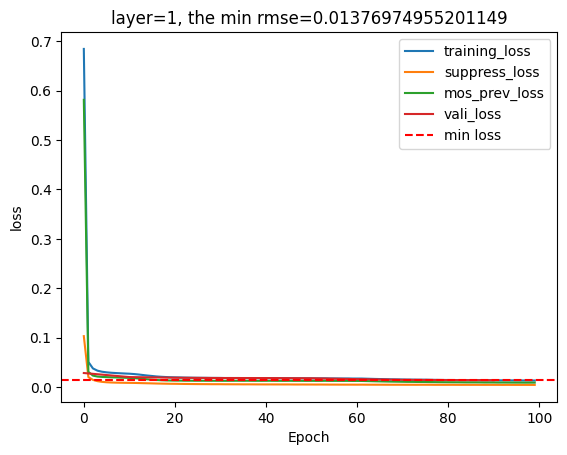

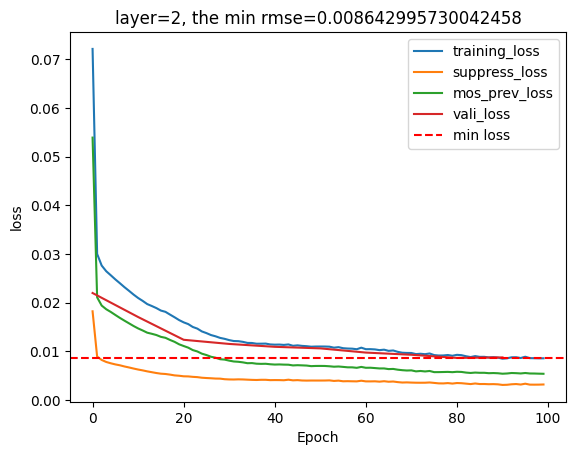

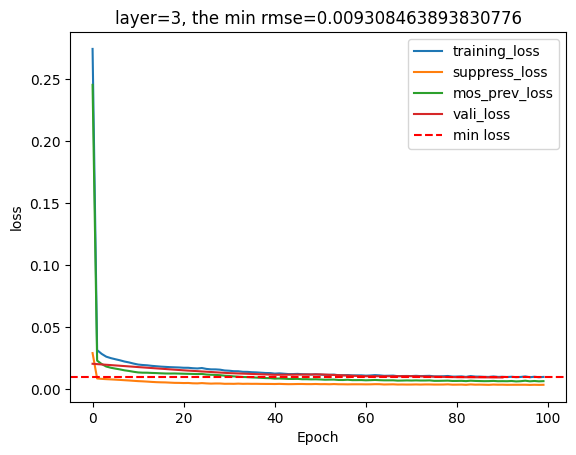

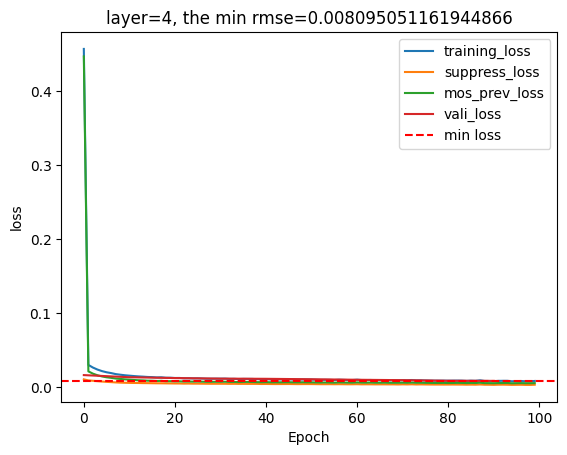

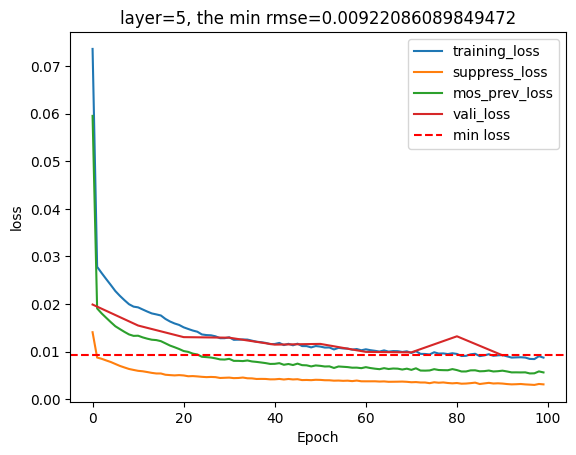

In [96]:
for history,number in zip([h1,h2,h3,h4,h5],range(1,6)):
    plt.plot(history.history['loss'], label='training_loss')
    plt.plot(history.history['suppress_loss'], label='suppress_loss')
    plt.plot(history.history['mos_prev_loss'], label='mos_prev_loss')
    plt.plot(range(0,10*len(history.history['val_loss']),10),history.history['val_loss'], label='vali_loss')
    plt.axhline(y=min(history.history['val_loss']), color='r', linestyle='--', label='min loss')
    plt.title('layer='+str(number)+', the min rmse='+str(min(history.history['val_loss'])))

    plt.xlabel('Epoch')
    plt.ylabel('loss')
    

    plt.legend()
    plt.savefig('layer='+str(number)+'malaria_model.png')
    plt.show()

In [47]:
print(h1['val_loss'])

TypeError: 'History' object is not subscriptable

In [43]:
len(["distance","remate_chance","want_to_bite_rate","animal_bite_rate","dd_fitness_value","somatic_fitness_multiplier_f","grc_beta","drive_conversion","erc_f","r1_occurrence_rate","low_density_growth_rate","seasonal_amplitude"])

12

In [77]:
model2.save('Model2.keras')

In [78]:
model2

In [79]:
model.save('Model.keras')

In [83]:
model=keras.models.load_model('Model.keras')

In [84]:
mode2=keras.models.load_model('Model2.keras')

In [87]:
pretrained_output[1]

<KerasTensor: shape=(None, 1) dtype=float32 (created by layer 'model_6')>

In [85]:
#try transfer learning
# Load the pre-trained model
pretrained_model = model
#pretrained_model = load_model('230627_FineTune')
pretrained_model.layers.pop()

# Create a new input layer for the fine-tuning model
#input_layer = Input(shape=(11,))  # Assuming 15 input parameters for the new dataset
input_layer = Input(shape=(16,))  # Assuming 15 input parameters for the new dataset


# Get the output of the pretrained model
pretrained_output = pretrained_model(input_layer)

# Add additional layers for the new output
x1 = Dense(32, activation='relu')(pretrained_output[0])
x1 = Dense(32, activation='relu')(x1)
x2 = Dense(32, activation='relu')(pretrained_output[1])
x2 = Dense(32, activation='relu')(x2)
eliminate = Dense(1, activation='linear', name="eliminate")(x1)
suppress = Dense(1, activation='linear', name="suppress")(x2)

# Create the fine-tuning model
model = Model(inputs=input_layer, outputs=[eliminate, suppress])

# Freeze the layers of the pre-trained model
for layer in pretrained_model.layers:
    layer.trainable = False

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.001), loss='mse', metrics=['accuracy'])

# Train the model
model.fit(X_train, [y_train["malaria_eliminated"], y_train["suppressed"]], epochs=300, batch_size=50, validation_freq=0.2)

Epoch 1/300
196/196 [==============================] - 1s 1ms/step - loss: 0.0232 - eliminate_loss: 0.0154 - suppress_loss: 0.0078 - eliminate_accuracy: 0.6922 - suppress_accuracy: 0.9402
Epoch 2/300
196/196 [==============================] - 0s 1ms/step - loss: 0.0192 - eliminate_loss: 0.0118 - suppress_loss: 0.0074 - eliminate_accuracy: 0.6952 - suppress_accuracy: 0.9402
Epoch 3/300
196/196 [==============================] - 0s 1ms/step - loss: 0.0190 - eliminate_loss: 0.0116 - suppress_loss: 0.0074 - eliminate_accuracy: 0.6953 - suppress_accuracy: 0.9403
Epoch 4/300
196/196 [==============================] - 0s 1ms/step - loss: 0.0188 - eliminate_loss: 0.0114 - suppress_loss: 0.0074 - eliminate_accuracy: 0.6953 - suppress_accuracy: 0.9403
Epoch 5/300
196/196 [==============================] - 0s 1ms/step - loss: 0.0187 - eliminate_loss: 0.0113 - suppress_loss: 0.0074 - eliminate_accuracy: 0.6955 - suppress_accuracy: 0.9402
Epoch 6/300
196/196 [==============================] - 0s 1m

196/196 [==============================] - 0s 1ms/step - loss: 0.0183 - eliminate_loss: 0.0110 - suppress_loss: 0.0073 - eliminate_accuracy: 0.6955 - suppress_accuracy: 0.9402
Epoch 88/300
196/196 [==============================] - 0s 1ms/step - loss: 0.0183 - eliminate_loss: 0.0110 - suppress_loss: 0.0073 - eliminate_accuracy: 0.6954 - suppress_accuracy: 0.9402
Epoch 89/300
196/196 [==============================] - 0s 1ms/step - loss: 0.0183 - eliminate_loss: 0.0110 - suppress_loss: 0.0073 - eliminate_accuracy: 0.6952 - suppress_accuracy: 0.9402
Epoch 90/300
196/196 [==============================] - 0s 1ms/step - loss: 0.0184 - eliminate_loss: 0.0111 - suppress_loss: 0.0073 - eliminate_accuracy: 0.6955 - suppress_accuracy: 0.9402
Epoch 91/300
196/196 [==============================] - 0s 1ms/step - loss: 0.0183 - eliminate_loss: 0.0110 - suppress_loss: 0.0073 - eliminate_accuracy: 0.6953 - suppress_accuracy: 0.9402
Epoch 92/300
196/196 [==============================] - 0s 1ms/step 

196/196 [==============================] - 0s 965us/step - loss: 0.0183 - eliminate_loss: 0.0110 - suppress_loss: 0.0073 - eliminate_accuracy: 0.6955 - suppress_accuracy: 0.9402
Epoch 174/300
196/196 [==============================] - 0s 1ms/step - loss: 0.0183 - eliminate_loss: 0.0110 - suppress_loss: 0.0073 - eliminate_accuracy: 0.6953 - suppress_accuracy: 0.9402
Epoch 175/300
196/196 [==============================] - 0s 1ms/step - loss: 0.0183 - eliminate_loss: 0.0110 - suppress_loss: 0.0073 - eliminate_accuracy: 0.6953 - suppress_accuracy: 0.9402
Epoch 176/300
196/196 [==============================] - 0s 1ms/step - loss: 0.0182 - eliminate_loss: 0.0109 - suppress_loss: 0.0073 - eliminate_accuracy: 0.6953 - suppress_accuracy: 0.9402
Epoch 177/300
196/196 [==============================] - 0s 1ms/step - loss: 0.0183 - eliminate_loss: 0.0110 - suppress_loss: 0.0073 - eliminate_accuracy: 0.6954 - suppress_accuracy: 0.9402
Epoch 178/300
196/196 [==============================] - 0s 1m

196/196 [==============================] - 0s 1ms/step - loss: 0.0182 - eliminate_loss: 0.0109 - suppress_loss: 0.0073 - eliminate_accuracy: 0.6954 - suppress_accuracy: 0.9402
Epoch 260/300
196/196 [==============================] - 0s 1ms/step - loss: 0.0182 - eliminate_loss: 0.0109 - suppress_loss: 0.0073 - eliminate_accuracy: 0.6954 - suppress_accuracy: 0.9402
Epoch 261/300
196/196 [==============================] - 0s 1ms/step - loss: 0.0183 - eliminate_loss: 0.0110 - suppress_loss: 0.0073 - eliminate_accuracy: 0.6952 - suppress_accuracy: 0.9402
Epoch 262/300
196/196 [==============================] - 0s 1ms/step - loss: 0.0183 - eliminate_loss: 0.0110 - suppress_loss: 0.0073 - eliminate_accuracy: 0.6951 - suppress_accuracy: 0.9402
Epoch 263/300
196/196 [==============================] - 0s 1ms/step - loss: 0.0183 - eliminate_loss: 0.0110 - suppress_loss: 0.0073 - eliminate_accuracy: 0.6955 - suppress_accuracy: 0.9403
Epoch 264/300
196/196 [==============================] - 0s 1ms/

In [ ]:
#try transfer learning
# Load the pre-trained model
pretrained_model = model2
#pretrained_model = load_model('230627_FineTune')
#pretrained_model.layers.pop()

# Create a new input layer for the fine-tuning model
input_layer = Input(shape=(11,))  # Assuming 15 input parameters for the new dataset
#input_layer = Input(shape=(16,))  # Assuming 15 input parameters for the new dataset


# Get the output of the pretrained model
pretrained_output = pretrained_model(input_layer)

# Add additional layers for the new output
x1 = Dense(32, activation='relu')(pretrained_output[0])
x1 = Dense(32, activation='relu')(x1)
x2 = Dense(32, activation='relu')(pretrained_output[1])
x2 = Dense(32, activation='relu')(x2)
eliminate = Dense(1, activation='linear', name="eliminate")(x1)
suppress = Dense(1, activation='linear', name="suppress")(x2)

# Create the fine-tuning model
model = Model(inputs=input_layer, outputs=[eliminate, suppress])

# Freeze the layers of the pre-trained model
for layer in pretrained_model.layers:
    layer.trainable = False

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.001), loss='mse', metrics=['accuracy'])

# Train the model
#model.fit(X_train, [y_train["malaria_eliminated"], y_train["suppressed"]], epochs=300, batch_size=50, validation_freq=0.2)
model.fit(X_train["distance","remate_chance","want_to_bite_rate","animal_bite_rate","dd_fitness_value","somatic_fitness_multiplier_f","grc_beta","drive_conversion","erc_f","r1_occurrence_rate","low_density_growth_rate","seasonal_amplitude"], [y_train["malaria_eliminated"], y_train["suppressed"]], epochs=300, batch_size=50, validation_freq=0.2)

In [41]:
pretrained_model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 16)]         0           []                               
                                                                                                  
 dense_4 (Dense)                (None, 16)           272         ['input_2[0][0]']                
                                                                                                  
 eliminate (Dense)              (None, 1)            17          ['dense_4[0][0]']                
                                                                                                  
 prevalence (Dense)             (None, 1)            17          ['dense_4[0][0]']                
                                                                                            

In [56]:
model.evaluate(X_test,y_test)
model2.evaluate(X_test.loc[:,["distance","remate_chance","want_to_bite_rate","animal_bite_rate","dd_fitness_value","somatic_fitness_multiplier_f","grc_beta","drive_conversion","erc_f","r1_occurrence_rate","low_density_growth_rate","seasonal_amplitude"]],y_test)


306/306 [==============================] - 1s 4ms/step - loss: 0.4437 - suppress_loss: 0.1745 - mos_prev_loss: 0.2692


[0.4436981678009033, 0.1744525283575058, 0.2692458927631378]

In [14]:
model=keras.layers.TFSMLayer('230717_MalariaModel_3layer', call_endpoint='serving_default')
model2=keras.layers.TFSMLayer('230717_MosquitoModel_12variables_2layer', call_endpoint='serving_default')

AttributeError: module 'keras.api._v2.keras.layers' has no attribute 'TFSMLayer'

In [42]:
keras.

<Functional name=functional_5, built=True>

In [223]:
pip show keras

Name: keras
Version: 2.12.0
Summary: Deep learning for humans.
Home-page: https://keras.io/
Author: Keras team
Author-email: keras-users@googlegroups.com
License: Apache 2.0
Location: C:\Users\19628\AppData\Roaming\Python\Python311\site-packages
Requires: 
Required-by: tensorflow-intel
Note: you may need to restart the kernel to use updated packages.


In [213]:
pip show tensorflow

Name: tensorflow
Version: 2.16.1
Summary: TensorFlow is an open source machine learning framework for everyone.
Home-page: https://www.tensorflow.org/
Author: Google Inc.
Author-email: packages@tensorflow.org
License: Apache 2.0
Location: C:\Users\19628\AppData\Roaming\Python\Python311\site-packages
Requires: tensorflow-intel
Required-by: 
Note: you may need to restart the kernel to use updated packages.


In [227]:
keras

<module 'keras.api._v2.keras' from 'C:\\Users\\19628\\AppData\\Roaming\\Python\\Python311\\site-packages\\keras\\api\\_v2\\keras\\__init__.py'>

In [230]:
reload('keras')

NameError: name 'reload' is not defined

In [228]:
pip install keras

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [15]:
#save models

#model.save("230630_malariaonly_1")
#model.save("230630_mosquitoonly_1")
#model.save("230630_wholemodel_2")
#model.save("230704_MalariaModel")
#model2.save("230717_MosquitoModel_12variables_1layer")
#model.save("230717_MalariaModel_1layer")
model = keras.models.load_model('230717_MalariaModel_1layer')
model2 = keras.models.load_model('230717_MosquitoModel_12variables_1layer')
#plot_model(model2, to_file='MosquitoModel_12variables_2layer.png', show_layer_activations=True, show_dtype=True, show_layer_names=True, show_shapes=True)

In [4]:
model.save('230717_MalariaModel_3layer_new')
model2.save('230717_MosquitoModel_12variables_2layer_new')

NameError: name 'model' is not defined

In [16]:
model = keras.models.load_model("C:\\Users\\19628\\Desktop\\lab_data\\machine_learning\\230717_MalariaModel_3layer.keras")
model2=keras.models.load_model('C:\\Users\\19628\\Desktop\\lab_data\\machine_learning\\230717_MosquitoModel_12variables_2layer.keras')

In [142]:
predict_model = model.predict(X_test)
predict_model2 = model2.predict(X_test.loc[:,["distance","remate_chance","want_to_bite_rate","animal_bite_rate","dd_fitness_value","somatic_fitness_multiplier_f","grc_beta","drive_conversion","erc_f","r1_occurrence_rate","low_density_growth_rate","seasonal_amplitude"]])

306/306 [==============================] - 0s 815us/step


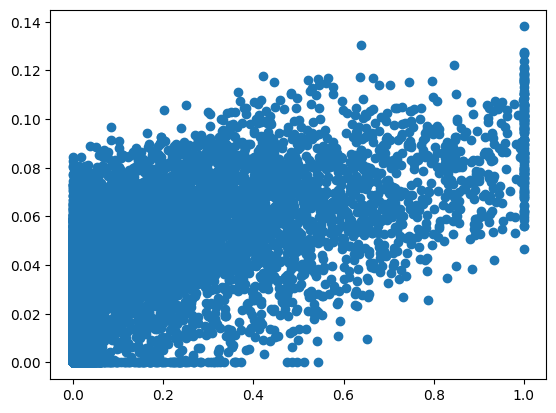

In [143]:
plt.scatter(predict_model[0].clip(0,1),predict_model2[0].clip(0,1))

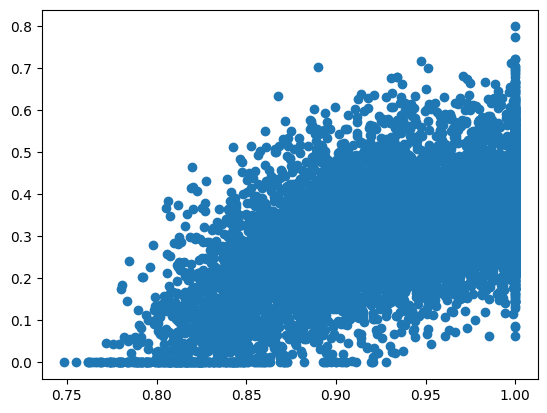

In [144]:
plt.scatter(predict_model2[1].clip(0,1),predict_model[1].clip(0,1))

In [145]:
def check_accuracy(x,y):
    """
        Check errors between predicted values and known result values.
        x: target value
        y: predicted value
    """
    rmse = sum(np.sqrt((x - y)**2) / len(x))
    actual_success = 0
    true_positives = 0
    false_negatives = 0
    false_positives = 0
    for i in range(len(x)):
        if x[i] >= 0.5:
            actual_success += 1
        if y[i] >= 0.5 and x[i] >= 0.5:
            true_positives += 1
        if y[i] < 0.5 and x[i] >= 0.5:
            false_negatives += 1
        if y[i] >= 0.5 and x[i] < 0.5:
            false_positives += 1
    precision = 0
    recall = 0
    f1 = 0
    if true_positives + false_positives:
        precision = true_positives / (true_positives + false_positives)
    if actual_success:
        recall = true_positives / actual_success
    if precision + recall:
        f1 = 2 * precision *recall / (precision + recall)
    
    return rmse, actual_success, true_positives, false_negatives, false_positives, precision, recall, f1

In [146]:
def check_accuracy_middle(x,y):
    """
        Check errors between predicted values and known result values.
        x: target value
        y: predicted value
    """
    rmse = sum(np.sqrt((x - y)**2) / len(x))
    actual_success = 0
    true_positives = 0
    false_negatives = 0
    false_positives = 0
    p=0.5
    for i in range(len(x)):
        if x[i]<=0 or x[i]>=1:
            continue
        if x[i] >= p:
            actual_success += 1
        if y[i] >= p and x[i] >= p:
            true_positives += 1
        if y[i] < p and x[i] >= p:
            false_negatives += 1
        if y[i] >= p and x[i] < p:
            false_positives += 1
    precision = 0
    recall = 0
    f1 = 0
    if true_positives + false_positives:
        precision = true_positives / (true_positives + false_positives)
    if actual_success:
        recall = true_positives / actual_success
    if precision + recall:
        f1 = 2 * precision *recall / (precision + recall)
    
    return rmse, actual_success, true_positives, false_negatives, false_positives, precision, recall, f1

In [147]:
def check_accuracy_04(x,y):
    """
        Check errors between predicted values and known result values.
        x: target value
        y: predicted value
    """
    rmse = sum(np.sqrt((x - y)**2) / len(x))
    actual_success = 0
    true_positives = 0
    false_negatives = 0
    false_positives = 0
    p=0.9
    for i in range(len(x)):
        if x[i] >= p:
            actual_success += 1
        if y[i] >= p and x[i] >= p:
            true_positives += 1
        if y[i] < p and x[i] >= p:
            false_negatives += 1
        if y[i] >= p and x[i] < p:
            false_positives += 1
    precision = 0
    recall = 0
    f1 = 0
    if true_positives + false_positives:
        precision = true_positives / (true_positives + false_positives)
    if actual_success:
        recall = true_positives / actual_success
    if precision + recall:
        f1 = 2 * precision *recall / (precision + recall)
    
    return rmse, actual_success, true_positives, false_negatives, false_positives, precision, recall, f1

In [148]:
def check_stat_accuracy(x,y):
    """
        Check errors between predicted values and known result values.
        x: target value
        y: predicted value
    """
    good_estimation=0
    large_bad_estimation=0
    small_bad_estimation=0
    bad_estimation=0
    for i in range(len(x)):
            p=1
            if x[i]>y[i]:
                p=scipy.stats.binomtest(round(x[i]*10),10,y[i],'greater').pvalue
            elif x[i]<y[i]:
                p=scipy.stats.binomtest(round(x[i]*10),10,y[i],'less').pvalue
            if p<0.05:
                bad_estimation+=1
            else:
                good_estimation+=1
    n=bad_estimation+good_estimation
   
    
    return good_estimation/n,good_estimation/n/0.95,n


In [149]:
scipy.stats.binomtest(1,2,0.5,'less').pvalue

0.75

In [150]:

y_test = y_test.reset_index(drop=True)

elim_accuracy = check_accuracy(y_test["malaria_eliminated"], predict_model[0].flatten())
supp_accuracy = check_accuracy(y_test["suppressed"], predict_model2[0].flatten())

elim_r2 = r2_score(y_test["malaria_eliminated"], predict_model[0].flatten())
prev_r2 = r2_score(y_test["malaria_prevalence"], predict_model[1].flatten())
supp_r2 = r2_score(y_test["suppressed"], predict_model2[0].flatten())
comp_r2 = r2_score(y_test["mosquito_prev"], predict_model2[1].flatten())


print(elim_accuracy,elim_r2)
print(prev_r2)
print(supp_accuracy,supp_r2)
print(comp_r2)

(0.07815403883660596, 1450, 874, 576, 57, 0.9387755102040817, 0.6027586206896551, 0.7341453170936582) 0.78153021890601
0.7628097067760717
(0.0480109685320617, 154, 0, 154, 0, 0, 0.0, 0) 0.10449439135386662
0.20638951994173693


In [151]:
y_test = y_test.reset_index(drop=True)
import random
a=np.random.random(1000)
b=[]
for i in a:
    b.append(sum(np.random.random(10)<i)/10)
elim_accuracy = check_stat_accuracy(y_test["malaria_eliminated"], predict_model[0].flatten().clip(0,1))
supp_accuracy = check_stat_accuracy(y_test["suppressed"], predict_model2[0].flatten().clip(0,1))
#supp_accuracy = check_stat_accuracy(b, a)
print("malaria_eliminated in CI:",elim_accuracy[0], "malaria_eliminated model/maxmum right:",elim_accuracy[1],'n=',elim_accuracy[2])
print("mosquito suppressed in CI:",supp_accuracy[0], "mosquito suppressed in CI",supp_accuracy[1],'n=',supp_accuracy[2])

malaria_eliminated in CI: 0.9377045826513911 malaria_eliminated model/maxmum right: 0.987057455422517 n= 9776
mosquito suppressed in CI: 0.9744271685761048 mosquito suppressed in CI 1.0257128090274787 n= 9776


In [152]:
malaria_d= predict_model[0].flatten().clip(0,1)-y_test["malaria_eliminated"]
mosquito_d= predict_model2[0].flatten().clip(0,1)-y_test["suppressed"]

In [153]:
print(np.average(np.abs(malaria_d)))
print(np.average(np.abs(mosquito_d)))

0.0698585818868871
0.044781305320130076


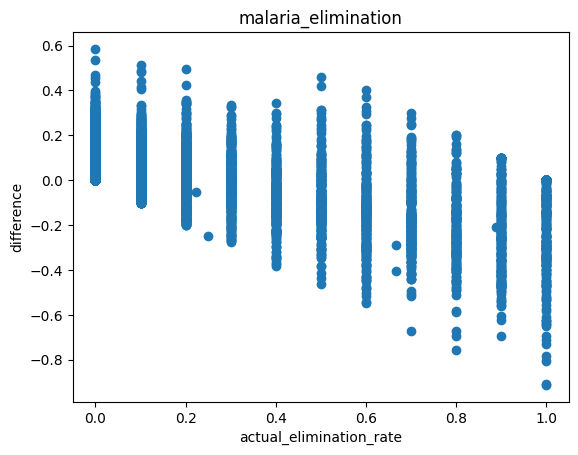

Text(0.5, 1.0, 'malaria_elimination')

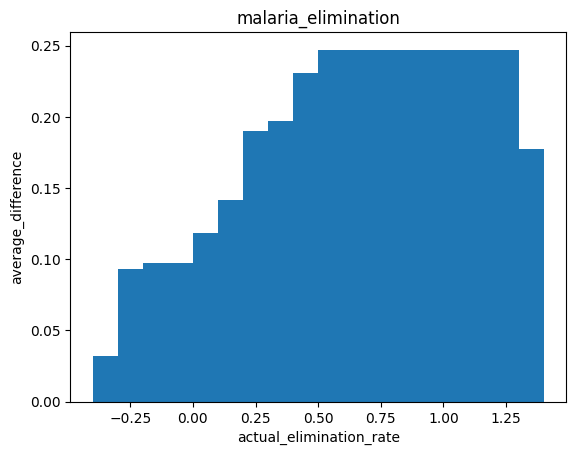

In [154]:
plt.scatter(y_test["malaria_eliminated"],malaria_d)
plt.xlabel('actual_elimination_rate')
plt.ylabel('difference')
plt.title('malaria_elimination')
plt.show()
xlis=[]
ylis=[]
for i in range(11):
    x=i*0.1
    y=np.mean(np.abs(malaria_d[np.round(y_test["malaria_eliminated"]*10)==i]))
    xlis.append(x)
    ylis.append(y)
plt.bar(xlis,ylis)
plt.xlabel('actual_elimination_rate')
plt.ylabel('average_difference')
plt.title('malaria_elimination')

C:\Users\19628\AppData\Local\Temp\ipykernel_1396\3602145762.py:9: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='count'` for the same effect.
  seaborn.violinplot(x='actual',y='distance',data=malaria,scale = 'count')


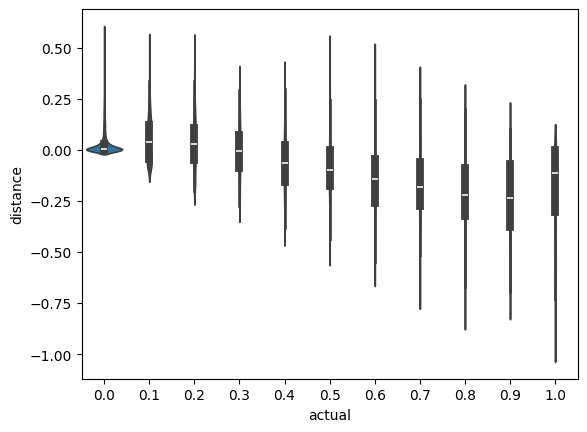

C:\Users\19628\AppData\Local\Temp\ipykernel_1396\3602145762.py:11: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='count'` for the same effect.
  seaborn.violinplot(x='actual',y='distance',data=malaria2,scale = 'count')


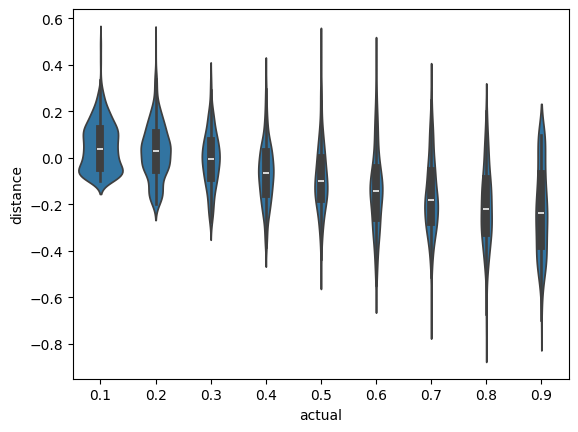

0.13516441226300438


C:\Users\19628\AppData\Local\Temp\ipykernel_1396\3602145762.py:21: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='count'` for the same effect.
  seaborn.violinplot(x='actual',y='distance',data=mosquito,scale = 'count')


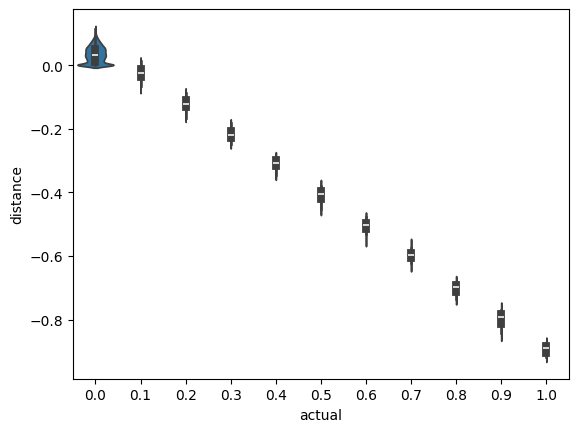

C:\Users\19628\AppData\Local\Temp\ipykernel_1396\3602145762.py:23: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='count'` for the same effect.
  seaborn.violinplot(x='actual',y='distance',data=mosquito2,scale = 'count')


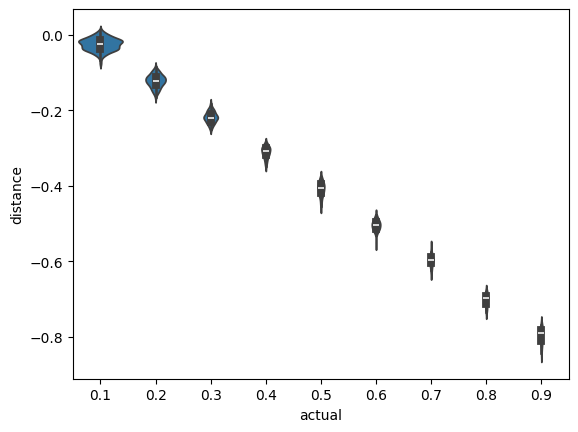

all 0.04477789560927355
middle 0.21244013416059945
-0.7696625530719757


In [155]:
import seaborn
malaria=pd.DataFrame()
malaria['actual']=np.round(y_test["malaria_eliminated"],1)
malaria['predict']=predict_model[0].flatten().clip(0,1)
malaria['distance']=malaria['predict']-malaria['actual']
malaria['abs_distance']=np.abs(malaria['distance'])
malaria2=malaria[malaria['actual']>0.01]
malaria2=malaria2[malaria2['actual']<1.0]
seaborn.violinplot(x='actual',y='distance',data=malaria,scale = 'count')
plt.show()
seaborn.violinplot(x='actual',y='distance',data=malaria2,scale = 'count')
plt.show()
print(np.mean(malaria2['abs_distance']))
mosquito=pd.DataFrame()
mosquito['actual']=np.round(y_test["suppressed"],1)
mosquito['predict']=predict_model2[0].flatten().clip(0,1)
mosquito['distance']=mosquito['predict']-mosquito['actual']
mosquito['abs_distance']=np.abs(mosquito['distance'])
mosquito2=mosquito[mosquito['actual']>0.01]
mosquito2=mosquito2[mosquito2['actual']<0.99]
seaborn.violinplot(x='actual',y='distance',data=mosquito,scale = 'count')
plt.show()
seaborn.violinplot(x='actual',y='distance',data=mosquito2,scale = 'count')
plt.show()
print('all',np.mean(mosquito['abs_distance']))
print('middle',np.mean(mosquito2['abs_distance']))
print(max(mosquito2[mosquito2["actual"]==0.9]['distance']))

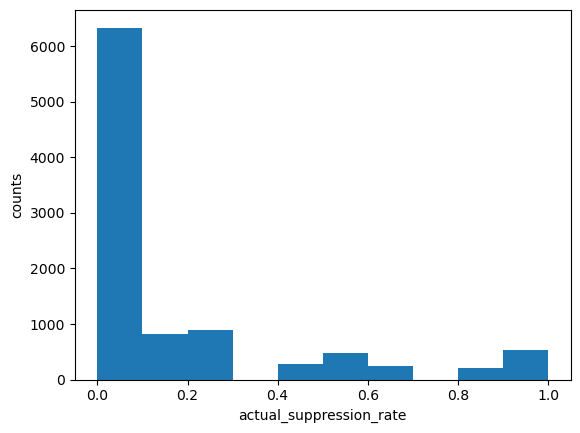

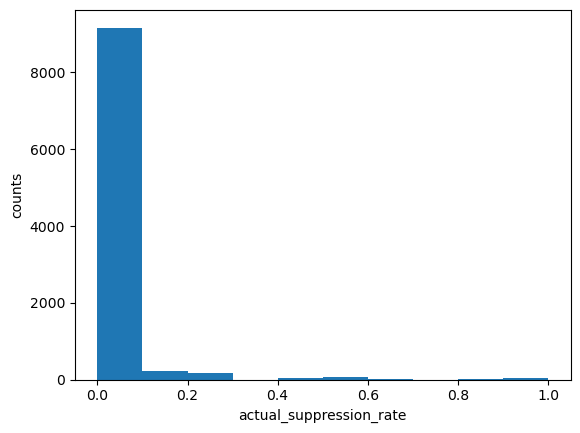

In [33]:
plt.hist(y_test["malaria_eliminated"])
plt.xlabel('actual_suppression_rate')
plt.ylabel('counts')
plt.show()
plt.hist(y_test["suppressed"])
plt.xlabel('actual_suppression_rate')
plt.ylabel('counts')
plt.show()

Text(0.5, 1.0, 'malaria distance')

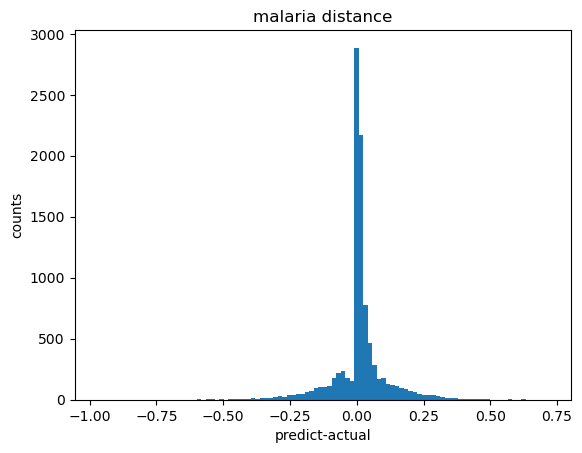

In [34]:
plt.hist(malaria_d,bins=100)
plt.xlabel('predict-actual')
plt.ylabel('counts')
plt.title('malaria distance')

Text(0.5, 1.0, 'mosquito distance')

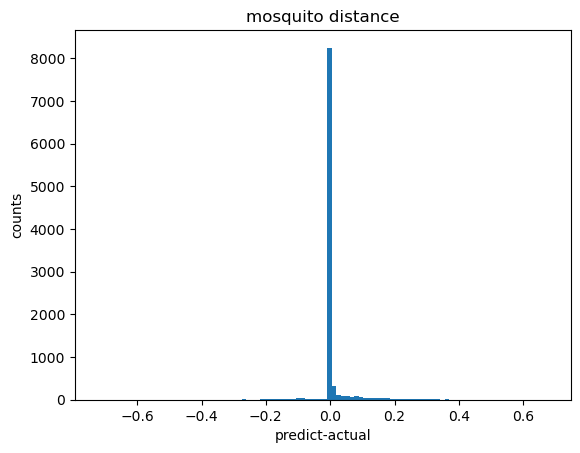

In [35]:
plt.hist(mosquito_d,bins=100)
plt.xlabel('predict-actual')
plt.ylabel('counts')
plt.title('mosquito distance')

In [36]:
print(malaria_d)
print(mosquito_d)

0       0.011027
1       0.000000
2       0.000000
3       0.000000
4       0.133863
          ...   
9771    0.033937
9772    0.004591
9773    0.000000
9774    0.000000
9775    0.012239
Name: malaria_eliminated, Length: 9776, dtype: float64
0       0.000000
1       0.000019
2       0.000000
3       0.000000
4       0.007636
          ...   
9771    0.000000
9772    0.000000
9773    0.000000
9774    0.000000
9775    0.000000
Name: suppressed, Length: 9776, dtype: float64


In [183]:
y_test = y_test.reset_index(drop=True)

elim_accuracy = check_accuracy(y_test["malaria_eliminated"], predict_model[0].flatten())
supp_accuracy = check_accuracy(y_test["suppressed"], predict_model2[0].flatten())

elim_r2 = r2_score(y_test["malaria_eliminated"], predict_model[0].flatten().clip(0,1))
prev_r2 = r2_score(y_test["malaria_prevalence"], predict_model[1].flatten().clip(0,1))
supp_r2 = r2_score(y_test["suppressed"], predict_model2[0].flatten().clip(0,1))
comp_r2 = r2_score(y_test["mosquito_prev"], predict_model2[1].flatten().clip(0,1))

print(['accuracy','recall','f1score'])
print('malaria_model',np.round(elim_accuracy[-3:],3))
print('mosquito_model',np.round(supp_accuracy[-3:],3))


['accuracy', 'recall', 'f1score']
malaria_model [0.892 0.803 0.845]
mosquito_model [0.756 0.643 0.695]


1layer result
(0.08195827599482804, 1483, 1017, 466, 70, 0.9356025758969642, 0.6857720836142953) 0.806390556237967
0.7646578548713607
(0.018780182702884812, 148, 39, 109, 7, 0.8478260869565217, 0.2635135135135135) 0.6349932157274858
0.8199059319058655

1layer, full data
(0.07260100806014591, 1450, 1043, 407, 102, 0.9109170305676856, 0.7193103448275862) 0.8166106931871325
0.6571294893508648
(0.02850456447903677, 154, 32, 122, 7, 0.8205128205128205, 0.2077922077922078) 0.5292872177984799
0.7120992628636941

2layer result
(0.06022983659589252, 1483, 1170, 313, 126, 0.9027777777777778, 0.7889413351314902) 0.8613704719177249
0.8470192437758429
(0.01838490826846023, 148, 78, 70, 18, 0.8125, 0.527027027027027) 0.6903546173337298
0.8604499090687927

2layer result, full data
(0.0561637170220737, 1450, 1050, 400, 72, 0.9358288770053476, 0.7241379310344828) 0.8612344732199018
0.8254365135185138
(0.01645086506792501, 154, 99, 55, 32, 0.7557251908396947, 0.6428571428571429) 0.6866429827339218
0.8701666032593163


3layer result
(0.05779888970810602, 1483, 1145, 338, 113, 0.910174880763116, 0.7720836142953472) 0.8613711707526193
0.7954252025328583
(0.020381804160558858, 148, 76, 72, 19, 0.8, 0.5135135135135135) 0.647437846813671
0.8798387473135707
3layer result, full data
(0.05945545227379062, 1450, 1165, 285, 141, 0.8920367534456355, 0.803448275862069) 0.860091666608781
0.7806306477864173
(0.014559907427846547, 154, 57, 97, 10, 0.8507462686567164, 0.37012987012987014) 0.6764987073222267
0.8831500659885189

4layer result
(0.055927350049438024, 1483, 1187, 296, 123, 0.9061068702290076, 0.8004045853000674) 0.8709728175334253
0.8141570799906284
(0.019420017437171425, 148, 80, 68, 36, 0.6896551724137931, 0.5405405405405406) 0.6099094395533043
0.8702764096690512

4layer result, full data
(0.06207033875207796, 1450, 1190, 260, 213, 0.8481824661439772, 0.8206896551724138) 0.8374345909905814
0.7733827841210773
(0.017700431645542702, 154, 40, 114, 7, 0.851063829787234, 0.2597402597402597) 0.6316349644935073
0.8702861560144723


5layer result
(0.05944724858959257, 1483, 1153, 330, 120, 0.9057344854673999, 0.777478084962913) 0.8663592291643702
0.8581131700420945
(0.017071758316351524, 148, 34, 114, 4, 0.8947368421052632, 0.22972972972972974) 0.6319329680634085
0.8762706161201401

5layer result, full data
(0.057848718403248664, 1450, 986, 464, 68, 0.9354838709677419, 0.68) 0.8425828049558508
0.7996382692854984
(0.013177714368978286, 154, 49, 105, 7, 0.875, 0.3181818181818182) 0.6796369259577605
0.8697095965591076

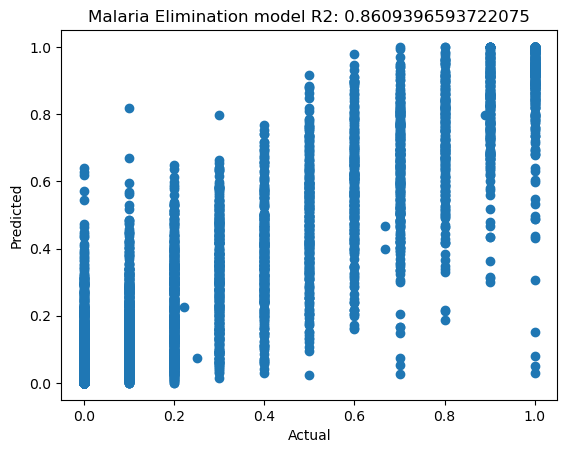

In [37]:
#Show scatter plot of Actual value vs Predicted value for Regressor model
fig, ax = plt.subplots()
#ax.scatter(y_test["suppressed"], predict_model[:,0])
ax.scatter(y_test["malaria_eliminated"], predict_model[0].flatten().clip(0,1))
#ax.plot([y.min(), y.max()], [y.min(), y.max()], 'k--', lw=4)
ax.set_xlabel('Actual')
ax.set_ylabel('Predicted')
#ax.set_title('Suppression model R2: ' + str(r2_score(y_test["suppressed"], predict_model[:,0])))
ax.set_title('Malaria Elimination model R2: ' + str(r2_score(y_test["malaria_eliminated"], predict_model[0].flatten().clip(0,1))))
plt.show()

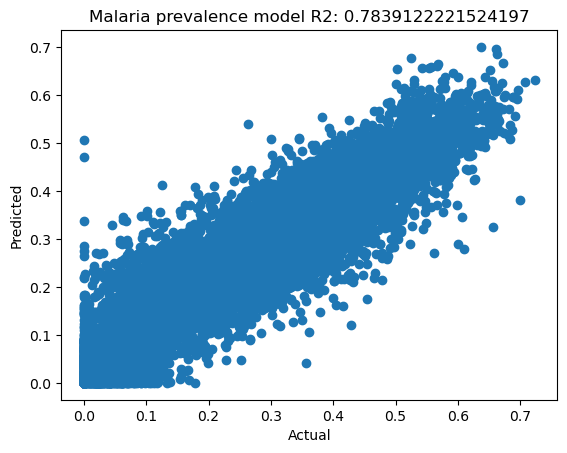

In [38]:
#Show scatter plot of Actual value vs Predicted value for Regressor model
fig, ax = plt.subplots()
#ax.scatter(y_test["suppressed"], predict_model[:,0])
ax.scatter(y_test["malaria_prevalence"], predict_model[1].flatten().clip(0,1))
#ax.plot([y.min(), y.max()], [y.min(), y.max()], 'k--', lw=4)
ax.set_xlabel('Actual')
ax.set_ylabel('Predicted')
#ax.set_title('Suppression model R2: ' + str(r2_score(y_test["suppressed"], predict_model[:,0])))
ax.set_title('Malaria prevalence model R2: ' + str(r2_score(y_test["malaria_prevalence"], predict_model[1].flatten().clip(0,1))))
plt.show()

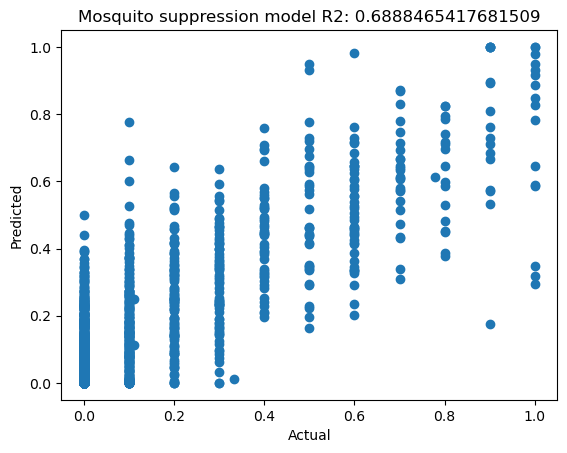

In [39]:
#Show scatter plot of Actual value vs Predicted value for Regressor model
fig, ax = plt.subplots()
#ax.scatter(y_test["suppressed"], predict_model[:,0])
ax.scatter(y_test["suppressed"], predict_model2[0].flatten().clip(0,1))
#ax.plot([y.min(), y.max()], [y.min(), y.max()], 'k--', lw=4)
ax.set_xlabel('Actual')
ax.set_ylabel('Predicted')
#ax.set_title('Suppression model R2: ' + str(r2_score(y_test["suppressed"], predict_model[:,0])))
ax.set_title('Mosquito suppression model R2: ' + str(r2_score(y_test["suppressed"], predict_model2[0].flatten().clip(0,1))))
plt.show()

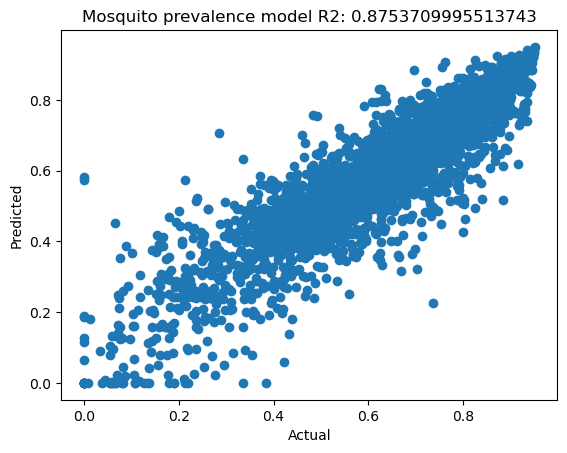

In [40]:
#Show scatter plot of Actual value vs Predicted value for Regressor model
fig, ax = plt.subplots()
#ax.scatter(y_test["suppressed"], predict_model[:,0])
ax.scatter(y_test["mosquito_prev"], predict_model2[1].flatten().clip(0,1))
#ax.plot([y.min(), y.max()], [y.min(), y.max()], 'k--', lw=4)
ax.set_xlabel('Actual')
ax.set_ylabel('Predicted')
#ax.set_title('Suppression model R2: ' + str(r2_score(y_test["suppressed"], predict_model[:,0])))
ax.set_title('Mosquito prevalence model R2: ' + str(r2_score(y_test["mosquito_prev"], predict_model2[1].flatten().clip(0,1))))
plt.show()

SHAP

In [112]:

import shap

def f(X):
    predict_model = model.predict(X)
    output = None
    for i in range(len(predict_model)):
        line = np.array(predict_model[i]).flatten()
        if output is None:
            output = line
        else:
            output = np.column_stack((output, line))
    return output
    
def g(X):
    predict_model = model2.predict(X)
    output = None
    for i in range(len(predict_model)):
        line = np.array(predict_model[i]).flatten()
        if output is None:
            output = line
        else:
            output = np.column_stack((output, line))
    return output

explainer = shap.KernelExplainer(model = f, data = X_train.head(200), link = "identity") #for multiple outcome model
explainer2 = shap.KernelExplainer(model = g, data = X_train.loc[:,["distance","remate_chance","want_to_bite_rate","animal_bite_rate","dd_fitness_value","somatic_fitness_multiplier_f","grc_beta","drive_conversion","erc_f","r1_occurrence_rate","low_density_growth_rate","seasonal_amplitude"]].head(200), link = "identity") #for multiple outcome model
#explainer = shap.KernelExplainer(model = model, data = X_train.head(200), link = "identity") #for single outcome model

X_idx = 1
X_train.iloc[X_idx:X_idx+1,:]

7/7 [==============================] - 0s 1ms/step


Using 200 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


7/7 [==============================] - 0s 1ms/step


Using 200 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


,malaria_takein_rate,malaria_sensitive,distance,remate_chance,want_to_bite_rate,animal_bite_rate,dd_fitness_value,somatic_fitness_multiplier_f,grc_beta,drive_conversion,erc_f,r1_occurrence_rate,low_density_growth_rate,seasonal_amplitude,cureweek,immunity
1,0.497037,0.878889,0.909697,0.673,0.29,0.285,0.987,0.671,0.789489,0.975,0.249906,0.901,0.222222,0.625,0.633333,0.15


In [56]:
#pip install shap

Defaulting to user installation because normal site-packages is not writeableNote: you may need to restart the kernel to use updated packages.

  Obtaining dependency information for shap from https://files.pythonhosted.org/packages/40/6c/850cdf7d0c6351ee9d060c0a24237381ae212c125553afa61198eaa06b0b/shap-0.45.1-cp311-cp311-win_amd64.whl.metadata
  Obtaining dependency information for slicer==0.0.8 from https://files.pythonhosted.org/packages/63/81/9ef641ff4e12cbcca30e54e72fb0951a2ba195d0cda0ba4100e532d929db/slicer-0.0.8-py3-none-any.whl.metadata
   ---------------------------------------- 0.0/455.5 kB ? eta -:--:--
   ---------------------------------------- 0.0/455.5 kB ? eta -:--:--
   ---------------------------------------- 0.0/455.5 kB ? eta -:--:--
   ---------------------------------------- 0.0/455.5 kB ? eta -:--:--
   ---------------------------------------- 0.0/455.5 kB ? eta -:--:--
   ---------------------------------------- 0.0/455.5 kB ? eta -:--:--
   --------------------

In [222]:
import ipywidgets as widgets

# Create the list of all labels for the drop down list
list_of_labels1 = y_train.iloc[:,0:2].columns.to_list() #for model 1
list_of_labels2 = y_train.iloc[:,2:4].columns.to_list() #for model 2
print(list_of_labels)
# Create a list of tuples so that the index of the label is what is returned
tuple_of_labels = list(zip(list_of_labels1, range(len(list_of_labels1))))
tuple_of_labels2 = list(zip(list_of_labels2, range(len(list_of_labels2))))
# Create a widget for the labels and then display the widget
current_label1 = widgets.Dropdown(options=tuple_of_labels1,
                              value=0,
                              description='Select Label:'
                              )

# Display the dropdown list (Note: access index value with 'current_label.value')
current_label1

current_label2 = widgets.Dropdown(options=tuple_of_labels2,
                              value=0,
                              description='Select Label:'
                              )

# Display the dropdown list (Note: access index value with 'current_label.value')
current_label2

['malaria_eliminated', 'malaria_prevalence']


Dropdown(description='Select Label:', options=(('malaria_eliminated', 0), ('malaria_prevalence', 1)), value=0)

In [218]:
#for model 1
shap_value1 = explainer.shap_values(X = X_train.iloc[0:200,:], nsamples = 200)

  0%|          | 0/200 [00:00<?, ?it/s]

1250/1250 [==============================] - 1s 843us/step


1250/1250 [==============================] - 1s 840us/step


In [118]:
#for model 2

X_train_mos = X_train.loc[:,["distance","remate_chance","want_to_bite_rate","animal_bite_rate","dd_fitness_value","somatic_fitness_multiplier_f","grc_beta","drive_conversion","erc_f","r1_occurrence_rate","low_density_growth_rate","seasonal_amplitude"]]
shap_value2 = explainer2.shap_values(X = X_train_mos.iloc[0:200,:], nsamples = 200)

  0%|          | 0/200 [00:00<?, ?it/s]

1250/1250 [==============================] - 1s 758us/step


1250/1250 [==============================] - 1s 782us/step


In [206]:
X_train.columns=['transmission rate to mosquitoes', 
        'transmission rate to humans', 
        'average dispersal',
        'weekly remating chance',
        'mosquito reproduction chance', 
        'animal biting rate',
        'drive fitness', 
        'female heterozygote fitness',
        'germline resistance rate',
        'drive conversion efficiency',
        'embryo resistance rate', 
        'functional resistance proportion',
        'low-density growth rate',
        'seasonal population change',
        'infection duration',
        'immunity duration']

In [ ]:
"""newname=['infectiousness to mosquitoes','infectiousness to humans','migration rate','remate chance',         
'mosquito feeding rate','animal bite rate','viability fitness',
'female fecundity fitness','germline resistance formation','drive efficiency','embryo resistance formation',
'functional resistance rate','low density growth rate','seasonal population amplitude',
'human infectiousness duration','human immunity duration']"""
#["distance","remate_chance","want_to_bite_rate","animal_bite_rate","dd_fitness_value","somatic_fitness_multiplier_f","grc_beta","drive_conversion","erc_f","r1_occurrence_rate","low_density_growth_rate","seasonal_amplitude"]])
#['migration rate','remate chance','mosquito feeding rate','animal bite rate','viability fitness','female fecundity fitness','germline resistance formation','drive efficiency','embryo resistance formation','functional resistance rate','low density growth rate','seasonal population amplitude']

In [1]:
# swt repeat

#for individual models only
X_train_mos = X_train.loc[:,['migration rate','remate chance','mosquito feeding rate','animal bite rate','viability fitness','female fecundity fitness','germline resistance formation','drive efficiency','embryo resistance formation','functional resistance rate','low density growth rate','seasonal population amplitude']]

n=0
for label_idx, label in enumerate(list_of_labels2):
    # Create a new figure for each plot
    plt.figure()
    # Generate the SHAP plot
    shap.summary_plot(shap_values=shap_value2[:,:,n],features=X_train_mos.iloc[0:200, :], show = False)
    # Set the title
    plt.title(label)
    n+=1
    # Save the figure to the png
    plt.savefig('shape_mosquito '+str(label)+'.png')
    

# Close the PDF file


n=0
for label_idx, label in enumerate(list_of_labels1):
    # Create a new figure for each plot
    plt.figure()
    # Generate the SHAP plot
    shap.summary_plot(shap_values=shap_value1[:,:,n],features=X_train.iloc[0:200, :], show = False)
    # Set the title
    plt.title(label)
    n+=1
    # Save the figure to the png
    plt.savefig('shape_malaria '+str(label)+'.png')


NameError: name 'X_train' is not defined

In [219]:
#plot parameter seperately

ecological={'transmission rate to mosquitoes', 
        'transmission rate to humans', 
        'average dispersal',
        'weekly remating chance',
        'mosquito reproduction chance', 
        'animal biting rate','low-density growth rate',
        'seasonal population change',
        'infection duration',
        'immunity duration'}
drive={'drive fitness', 
        'female heterozygote fitness',
        'germline resistance rate',
        'drive conversion efficiency',
        'embryo resistance rate', 
        'functional resistance proportion'}

In [239]:
loci=np.array([i for i in range(len(X_train_mos.columns)) if X_train_mos.columns[i] in sets[paras_i]])
loci

array([ 0,  1,  2,  3, 10, 11])

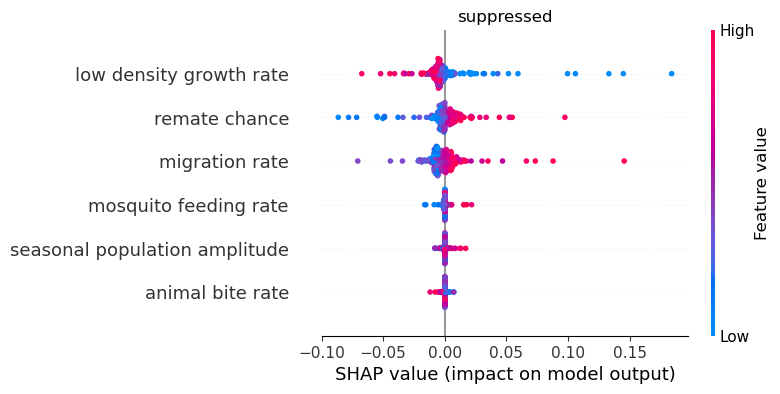

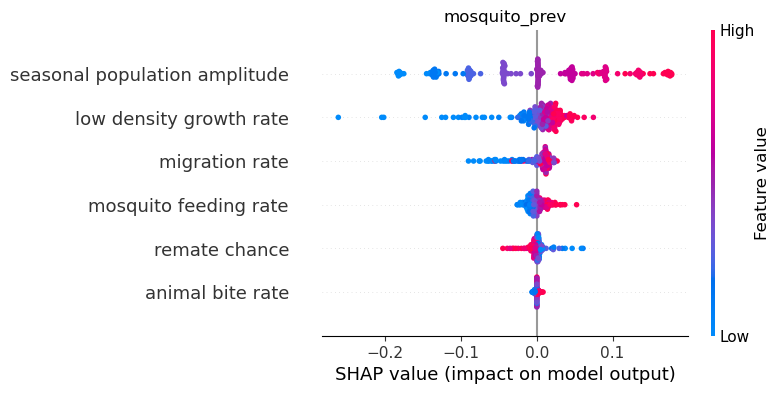

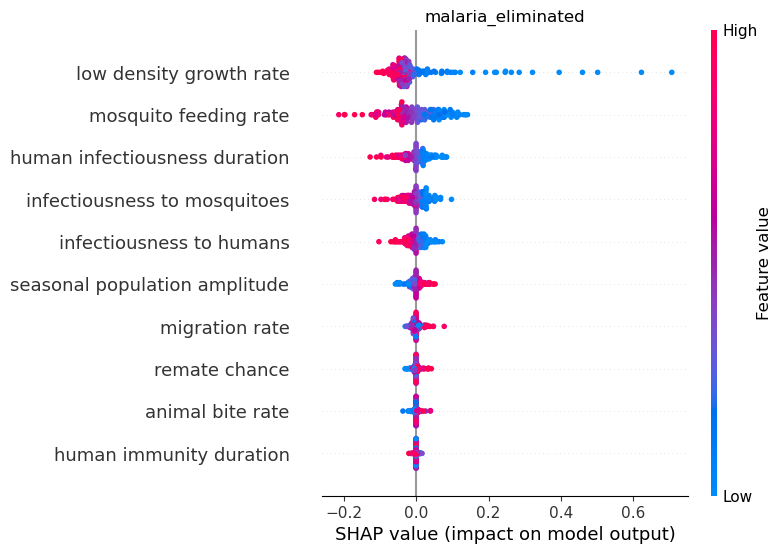

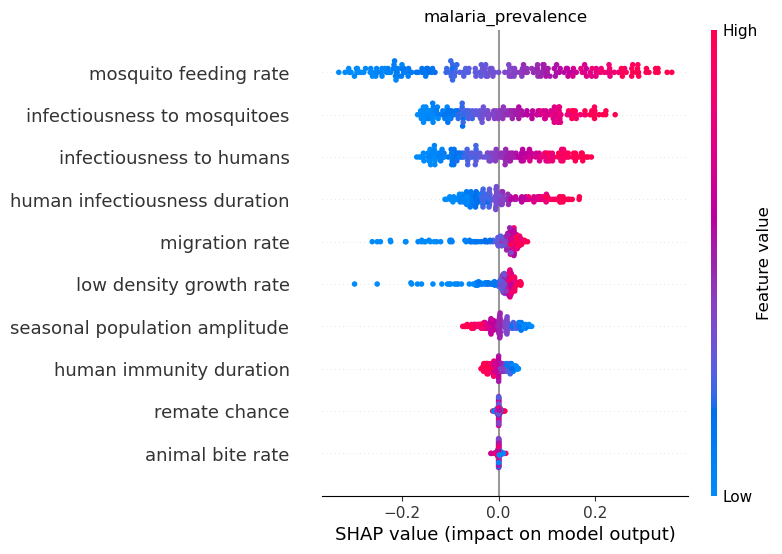

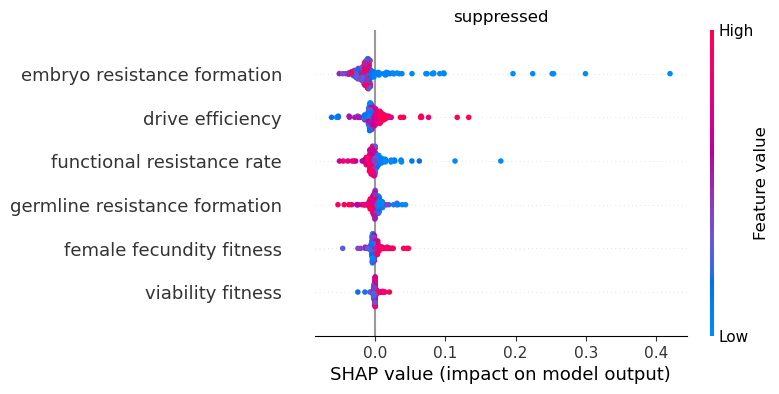

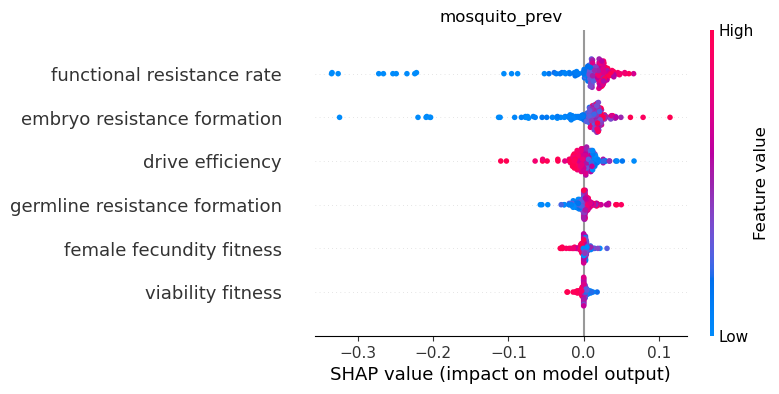

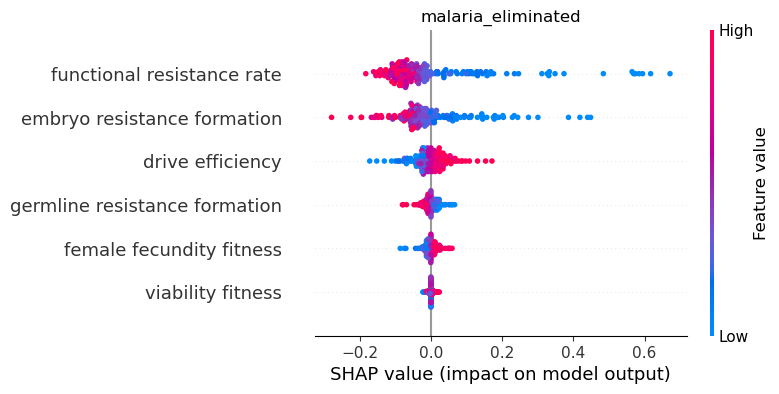

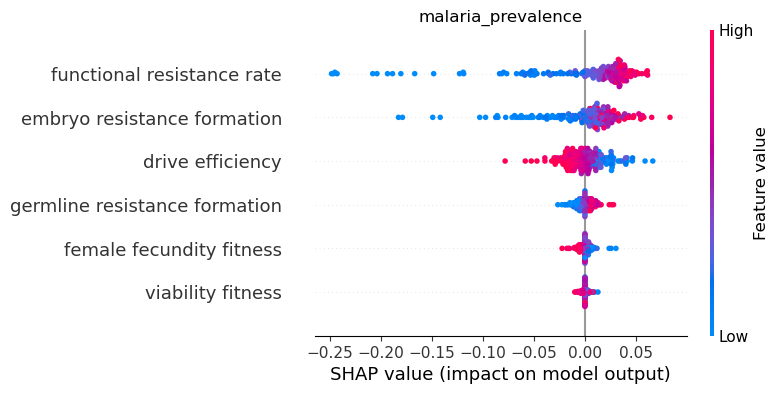

In [241]:
# swt repeat

#for individual models only
setname=['ecological','drive']
sets=[ecological,drive]
X_train_mos = X_train.loc[:,['migration rate','remate chance','mosquito feeding rate','animal bite rate','viability fitness','female fecundity fitness','germline resistance formation','drive efficiency','embryo resistance formation','functional resistance rate','low density growth rate','seasonal population amplitude']]
#parameters
for paras_i in range(2):
    
    loci=np.array([i for i in range(len(X_train_mos.columns)) if X_train_mos.columns[i] in sets[paras_i]])
    n=0
    for label_idx, label in enumerate(list_of_labels2):
        # Create a new figure for each plot
        plt.figure()
        # Generate the SHAP plot
        shap.summary_plot(shap_values=shap_value2[:,loci,n],features=X_train_mos.iloc[0:200, loci], show = False)
        # Set the title
        plt.title(label)
        n+=1
        # Save the figure to the png
        plt.savefig(setname[paras_i]+'shape_mosquito '+str(label)+'.png')
    

    # Close the PDF file
    loci=np.array([i for i in range(len(X_train.columns)) if X_train.columns[i] in sets[paras_i]])
    n=0
    for label_idx, label in enumerate(list_of_labels1):
        # Create a new figure for each plot
        plt.figure()
        # Generate the SHAP plot
        shap.summary_plot(shap_values=shap_value1[:,loci,n],features=X_train.iloc[0:200, loci], show = False)
        # Set the title
        plt.title(label)
        n+=1
        # Save the figure to the png
        plt.savefig(setname[paras_i]+'shape_malaria '+str(label)+'.png')



In [200]:
print(X_train_mos.iloc[0:200, :])

     distance  remate_chance  want_to_bite_rate  animal_bite_rate  \
0    0.375152          0.313              0.889             0.519   
1    0.909697          0.673              0.290             0.285   
2    0.745455          0.423              0.459             0.969   
3    0.515758          0.043              0.346             0.581   
4    0.675152          0.802              0.562             0.879   
..        ...            ...                ...               ...   
195  0.541818          0.116              0.571             0.476   
196  0.978182          0.520              0.623             0.180   
197  0.500000          0.953              0.812             0.785   
198  0.752121          0.347              0.531             0.971   
199  0.813333          0.503              0.557             0.628   

     dd_fitness_value  somatic_fitness_multiplier_f  grc_beta  \
0               0.991                         0.544  0.170971   
1               0.987                    

In [161]:
pdf_pages = PdfPages('shap1_l_plot.pdf')

#for individual models only
X_train_mos = X_train.loc[:,["distance","remate_chance","want_to_bite_rate","animal_bite_rate","dd_fitness_value","somatic_fitness_multiplier_f","grc_beta","drive_conversion","erc_f","r1_occurrence_rate","low_density_growth_rate","seasonal_amplitude"]]

for label_idx, label in enumerate(c):
    # Create a new figure for each plot
    plt.figure()

    # Generate the SHAP plot
    shap.summary_plot(shap_values=shap_value1[label_idx],
                      features=X_train_mos.iloc[0:200, :], show = False)

    # Set the title
    plt.title(label)

    # Save the figure to the PDF file
    pdf_pages.savefig()

# Close the PDF file
pdf_pages.close()

AssertionError: The shape of the shap_values matrix does not match the shape of the provided data matrix.

<Figure size 640x480 with 0 Axes>

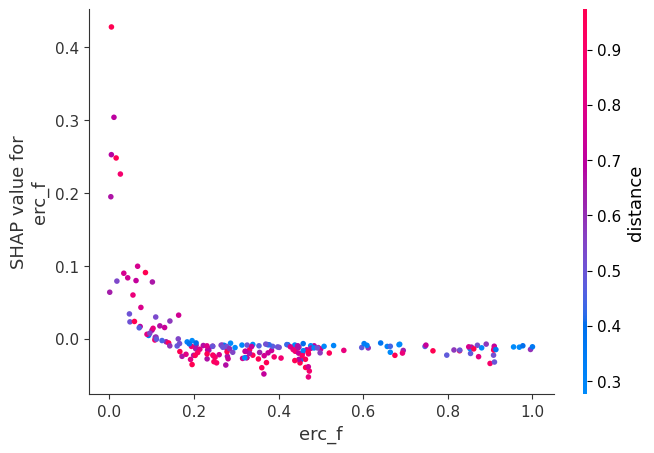

In [20]:
#for label_idx, label in enumerate(list_of_labels):
#    # Generate the SHAP plot
#    shap.dependence_plot("erc_f", shap_values[label_idx],X_train.iloc[0:200,:])

shap.dependence_plot("erc_f", shap_values[0],X_train_mos.iloc[0:200,:])

Make a heatmap with 2 variables, 14 fixed parameters.

In [27]:
X_train.describe()

,malaria_takein_rate,malaria_sensitive,distance,remate_chance,want_to_bite_rate,animal_bite_rate,dd_fitness_value,somatic_fitness_multiplier_f,grc_beta,drive_conversion,erc_f,r1_occurrence_rate,low_density_growth_rate,seasonal_amplitude,cureweek,immunity
count,9228.000000,9228.000000,9228.000000,9228.000000,9228.000000,9228.000000,9228.000000,9228.000000,9228.000000,9228.000000,9228.000000,9228.000000,9228.000000,9228.000000,9228.000000,9228.000000
mean,0.143561,0.500188,0.104182,0.505604,0.505684,0.503868,0.908574,0.768944,0.499229,0.916382,0.336728,0.000497,9.945925,0.410143,17.625488,11.393801
std,0.062629,0.198531,0.036918,0.291142,0.182289,0.289065,0.054831,0.138175,0.288126,0.055499,0.222697,0.000287,4.638439,0.234785,5.583516,5.611080
min,0.050000,0.200000,0.033000,0.000000,0.250000,0.000000,0.800000,0.500000,0.000100,0.800000,0.000000,0.000000,2.000000,0.000000,10.000000,0.000000
25%,0.088300,0.328000,0.076000,0.253000,0.359000,0.252000,0.865000,0.655750,0.251675,0.873000,0.151100,0.000251,6.000000,0.200000,13.000000,7.000000
50%,0.135200,0.475000,0.106000,0.507000,0.467000,0.509000,0.911000,0.773000,0.499800,0.925000,0.302850,0.000495,10.000000,0.400000,16.000000,12.000000
75%,0.194300,0.664000,0.135300,0.763250,0.619000,0.752000,0.955000,0.887000,0.750925,0.962000,0.508700,0.000746,14.000000,0.600000,22.000000,16.000000
max,0.269900,0.900000,0.165000,1.000000,1.000000,1.000000,1.000000,1.000000,0.998900,1.000000,0.799500,0.001000,18.000000,0.800000,30.000000,20.000000


In [49]:
data = {'Malaria takein rate':[0.8,0.18,1,0.05,0.27], 
        'Malaria sensitive': [0.8,0.22,1,0.2,0.9], 
        'Distance': [0.6,0,1,0.033,0.165],
        'Remate chance':[0.8,0,1,0,1],
        'Want to bite rate': [0.8,0.25,1,0.25,1], 
        'Animal bite rate': [0.98,0,1,0,1],
        'Fitness value': [0.9,0.8,1,0.8,1], 
        'Female Somatic fitness multiplier':[0.9,0.5,1,0.5,1],
        'Germline Resistance cut rate': [0.1,0,1, 0, 0.999],
        'Drive conversion':[0.95,0.8,1.0,0.8,1],
        'Embryo Resistance Cut Rate': [0.05,0,1,0,0.8], 
        'R1 Occurance Rate': [0.05,0,1,0,0.001],
        'Low density growth rate': [0.2,0.11,1,2,18],
        'Seasonal amplitude':[0.4,0,1,0,0.8],
        'Weeks until curation':[0.5,0.33,1,10,30],
        'Human immunity':[0.6,0,1,0,20]}
data = pd.DataFrame(data)

In [1]:
oldnames=['malaria_takein_rate', 'malaria_sensitive', 'distance', 'remate_chance',
       'want_to_bite_rate', 'animal_bite_rate', 'dd_fitness_value',
       'somatic_fitness_multiplier_f', 'grc_beta', 'drive_conversion', 'erc_f',
       'r1_occurrence_rate', 'low_density_growth_rate', 'seasonal_amplitude',
       'cureweek', 'immunity']

newname=['transmission rate to mosquitoes', 
        'transmission rate to humans', 
        'average dispersal',
        'weekly remating chance',
        'mosquito reproduction chance', 
        'animal biting rate',
        'drive fitness', 
        'female heterozygote fitness',
        'germline resistance rate',
        'drive conversion efficiency',
        'embryo resistance rate', 
        'functional resistance proportion',
        'low-density growth rate',
        'seasonal population change',
        'infection duration',
        'immunity duration']
#["distance","remate_chance","want_to_bite_rate","animal_bite_rate","dd_fitness_value","somatic_fitness_multiplier_f","grc_beta","drive_conversion","erc_f","r1_occurrence_rate","low_density_growth_rate","seasonal_amplitude"]])
#['migration rate','remate chance','mosquito feeding rate','animal bite rate','viability fitness','female fecundity fitness','germline resistance formation','drive efficiency','embryo resistance formation','functional resistance rate','low density growth rate','seasonal population amplitude']

In [80]:
len(oldnames)

16

In [21]:
model = keras.models.load_model("C:\\Users\\19628\\Desktop\\lab_data\\machine_learning\\230717_MalariaModel_3layer.keras")
model2=keras.models.load_model('C:\\Users\\19628\\Desktop\\lab_data\\machine_learning\\230717_MosquitoModel_12variables_2layer.keras')

In [50]:
data = {'Malaria takein rate':[0.2,0.05,0.27], 
        'Malaria sensitive': [0.75,0.2,0.9], 
        'Distance': [0.12,0.033,0.165],
        'Remate chance':[0.05,0,1],
        'Want to bite rate': [0.8,0.25,1], 
        'Animal bite rate': [0.98,0,1],
        'Fitness value': [0.98,0.8,1], 
        'Female Somatic fitness multiplier':[0.7,0.5,1],
        'Germline Resistance cut rate': [0.01,0,0.999],
        'Drive conversion':[0.95,0.8,1],
        'Embryo Resistance Cut Rate': [0.1,0,0.8], 
        'R1 Occurance Rate': [0.0,0,0.001],
        'Low density growth rate': [6,2,18],
        'Seasonal amplitude':[0.5,0,0.8],
        'Weeks until curation':[15,10,30],
        'Human immunity':[5,0,20]}
data = pd.DataFrame(data)

In [98]:
new_data = {'infectiousness to mosquitoes':[0.2,0.05,0.27], 
        'infectiousness to humans': [0.2,0.2,0.9], 
        'migration rate': [0.12,0.033,0.165],
        'remate chance':[0.05,0,1],
        'mosquito feeding rate': [0.8,0.25,1], 
        'animal bite rate': [1.0,0,1],
        'viability fitness': [1.0,0.8,1], 
        'female fecundity fitness':[0.5,0.5,1],
        'germline resistance formation': [0.01,0,0.999],
        'drive efficiency':[0.95,0.8,1],
        'embryo resistance formation': [0.1,0,0.8], 
        'functional resistance rate': [0.00,0,0.001],
        'low density growth rate': [6,2,18],
        'seasonal population amplitude':[0.5,0,0.8],
        'human infectiousness duration':[15,10,30],
        'human immunity duration':[5,0,20]}
new_data = pd.DataFrame(new_data)

In [180]:
#####
#TESTING CENTER
#####

a = 0
b = 4

fixed_inputs = data.loc[[0]].drop(data.columns[[a, b]], axis=1)
fixed_inputs = np.tile(fixed_inputs, (10**2, 1))

x_min = data.iloc[1, a]
x_max = data.iloc[2, a]
x_label_min = data.iloc[1, a]
x_label_max = data.iloc[2,a]

y_min = data.iloc[1, b]
y_max = data.iloc[2, b]
y_label_min = data.iloc[1, b]
y_label_max = data.iloc[2,b]

x = np.linspace(x_min, x_max, 10)
y = np.linspace(y_min, y_max, 10)
grid = np.array(np.meshgrid(x, y)).T.reshape(-1, 2)
    
# Combine the fixed inputs and the grid of values for the two inputs
inputs = np.insert(fixed_inputs, a, grid[:, 0], axis=1)
inputs = np.insert(inputs, b, grid[:, 1], axis=1)
inputs = pd.DataFrame(inputs, columns=X_train.columns)

#normalize the inputs
inputs_scaled = abs_scaler.transform(inputs)
inputs_scaled = pd.DataFrame(inputs_scaled, columns=X_train.columns)
inputs_scaled
#predictions = model.predict(inputs_scaled)
#predictions = pd.DataFrame(np.concatenate(predictions, axis=1))

#output1 = predictions.iloc[:,0].values.reshape(10, 10)



,malaria_takein_rate,malaria_sensitive,distance,remate_chance,want_to_bite_rate,animal_bite_rate,dd_fitness_value,somatic_fitness_multiplier_f,grc_beta,drive_conversion,erc_f,r1_occurrence_rate,low_density_growth_rate,seasonal_amplitude,cureweek,immunity
0,0.185185,0.888889,3.636364,0.8,0.250000,0.98,0.9,0.9,0.010011,0.9,0.625156,500.0,0.277778,0.5,0.4,0.5
1,0.185185,0.888889,3.636364,0.8,0.333333,0.98,0.9,0.9,0.010011,0.9,0.625156,500.0,0.277778,0.5,0.4,0.5
2,0.185185,0.888889,3.636364,0.8,0.416667,0.98,0.9,0.9,0.010011,0.9,0.625156,500.0,0.277778,0.5,0.4,0.5
3,0.185185,0.888889,3.636364,0.8,0.500000,0.98,0.9,0.9,0.010011,0.9,0.625156,500.0,0.277778,0.5,0.4,0.5
4,0.185185,0.888889,3.636364,0.8,0.583333,0.98,0.9,0.9,0.010011,0.9,0.625156,500.0,0.277778,0.5,0.4,0.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,1.000000,0.888889,3.636364,0.8,0.666667,0.98,0.9,0.9,0.010011,0.9,0.625156,500.0,0.277778,0.5,0.4,0.5
96,1.000000,0.888889,3.636364,0.8,0.750000,0.98,0.9,0.9,0.010011,0.9,0.625156,500.0,0.277778,0.5,0.4,0.5
97,1.000000,0.888889,3.636364,0.8,0.833333,0.98,0.9,0.9,0.010011,0.9,0.625156,500.0,0.277778,0.5,0.4,0.5
98,1.000000,0.888889,3.636364,0.8,0.916667,0.98,0.9,0.9,0.010011,0.9,0.625156,500.0,0.277778,0.5,0.4,0.5


In [249]:
def generate_heatmaps(data, model,model2,i,j,steps=10):
    pdf_pages = PdfPages('new_name//'+newname[i]+'-'+newname[j]+'.pdf')

    # Create a copy of the data with all inputs fixed except the two we want to vary
    fixed_inputs = data.loc[[0]].drop(data.columns[[i, j]], axis=1)
    fixed_inputs = np.tile(fixed_inputs, (steps**2, 1))
    print(fixed_inputs)
    #set a param range for the 2 params we want to vary
    x_min = data.iloc[1, i]
    x_max = data.iloc[2, i]
    x_label_min = data.iloc[1, i]
    x_label_max = data.iloc[2,i]

    y_min = data.iloc[1, j]
    y_max = data.iloc[2, j]
    y_label_min = data.iloc[1, j]
    y_label_max = data.iloc[2,j]

    # Create a grid of values for the two inputs we want to vary
    x = np.linspace(x_min, x_max, steps)
    y = np.linspace(y_min, y_max, steps)
    grid = np.array(np.meshgrid(x, y)).T.reshape(-1, 2)
    
    # Combine the fixed inputs and the grid of values for the two inputs
    inputs = np.insert(fixed_inputs, i, grid[:, 0], axis=1)
    inputs = np.insert(inputs, j, grid[:, 1], axis=1)
    inputs = pd.DataFrame(inputs, columns=oldnames)

    #normalize the inputs
    inputs_scaled = abs_scaler.transform(inputs)
    inputs_scaled = pd.DataFrame(inputs_scaled, columns=oldnames)
    
    # Make predictions using the model
    predictions = model.predict(inputs_scaled)
    predictions = pd.DataFrame(np.concatenate(predictions, axis=1))

    # Make mosquito predictions using the model
    predictions2 = model2.predict(inputs_scaled.loc[:,["distance","remate_chance","want_to_bite_rate","animal_bite_rate","dd_fitness_value","somatic_fitness_multiplier_f","grc_beta","drive_conversion","erc_f","r1_occurrence_rate","low_density_growth_rate","seasonal_amplitude"]])
    predictions2 = pd.DataFrame(np.concatenate(predictions2, axis=1))


    # inverse transform the predicted output to the original data value
    # predictions = scaler_y.inverse_transform(predictions)
    
    # Reshape the predictions into a grid for each output
    output1 = predictions.iloc[:,0].values.reshape(steps, steps)
    output1 = output1.T
    output1 = np.flipud(output1)

    output2 = predictions.iloc[:,1].values.reshape(steps, steps)
    output2 = output2.T
    output2 = np.flipud(output2)

    output3 = predictions2.iloc[:,0].values.reshape(steps, steps)
    output3 = output3.T
    output3 = np.flipud(output3)

    output4 = predictions2.iloc[:,1].values.reshape(steps, steps)
    output4 = output4.T
    output4 = np.flipud(output4)

    
    fig, ((ax3, ax2),(ax1, ax4))  = plt.subplots(ncols=2, nrows=2, figsize=(10, 10))
    #fig, (ax1, ax2, ax3)  = plt.subplots(ncols=3, nrows=1, figsize=(30, 10))
    # Generate the heatmaps using seaborn
    sns.heatmap(output1, cmap=list(sns.color_palette('coolwarm',10)),xticklabels=False, yticklabels=False, vmin=0, vmax=1, ax=ax1)
    ax1.text(-1,106, x_label_min, fontsize = 15, va="bottom", ha="left")
    ax1.text(100,106, x_label_max, fontsize = 15, va="bottom", ha="right")
    ax1.text(-8, 97, y_label_min, fontsize = 15,ha="center", va="top")
    ax1.text(-8, 3, y_label_max,fontsize = 15,ha="center", va="bottom")
    ax1.set_title("Malaria elimination")
    ax1.set_xlabel(data.iloc[:, i].name, fontsize = 15)
    ax1.set_ylabel(data.iloc[:, j].name, fontsize = 15)
    #plt.show()

    sns.heatmap(output2, cmap=list(reversed(sns.color_palette('coolwarm',10))),xticklabels=False, yticklabels=False,vmin=0, vmax=1, ax=ax2)
    ax2.text(-1,106, x_label_min, fontsize=15, va="bottom", ha="left")
    ax2.text(100,106, x_label_max, fontsize=15, va="bottom", ha="right")
    ax2.text(-8, 97, y_label_min,fontsize = 15, ha="center", va="top")
    ax2.text(-8, 3, y_label_max, fontsize = 15, ha="center", va="bottom")
    ax2.set_title("Malaria prevalence")
    ax2.set_xlabel(data.iloc[:, i].name, fontsize = 15)
    ax2.set_ylabel(data.iloc[:, j].name, fontsize = 15)
    #plt.show()

    sns.heatmap(output3, cmap=list(sns.color_palette('coolwarm',10)),xticklabels=False, yticklabels=False, vmin=0, vmax=1, ax=ax3)
    ax3.text(-1,106, x_label_min, fontsize=15, va="bottom", ha="left")
    ax3.text(100,106, x_label_max, fontsize=15, va="bottom", ha="right")
    ax3.text(-8, 97, y_label_min, fontsize = 15, ha="center", va="top")
    ax3.text(-8, 3, y_label_max, fontsize = 15, ha="center", va="bottom")
    ax3.set_title("Mosquito suppression")
    ax3.set_xlabel(data.iloc[:, i].name, fontsize = 15)
    ax3.set_ylabel(data.iloc[:, j].name, fontsize = 15)
    #plt.show()

    sns.heatmap(output4, cmap=list(reversed(sns.color_palette('coolwarm',10))),xticklabels=False, yticklabels=False, vmin=0, vmax=1, ax=ax4)
    ax4.text(-1,106, x_label_min, fontsize = 15, va="bottom", ha="left")
    ax4.text(100,106, x_label_max, fontsize = 15, va="bottom", ha="right")
    ax4.text(-8, 97, y_label_min, fontsize = 15, ha="center", va="top")
    ax4.text(-8, 3, y_label_max, fontsize = 15, ha="center", va="bottom")
    ax4.set_title("Mosquito prevalence")
    ax4.set_xlabel(data.iloc[:, i].name, fontsize = 15)
    ax4.set_ylabel(data.iloc[:, j].name, fontsize = 15)
    #plt.show()
    

    
    fig.tight_layout()
    pdf_pages.savefig(fig)
    plt.savefig('new_name//'+newname[i]+'-'+newname[j]+'.png')
    pdf_pages.close() 
    plt.show()

In [198]:
def generate_heatmaps(data, model,model2,i,j,steps=10):
    pdf_pages = PdfPages('new_name//'+newname[i]+'-'+newname[j]+'.pdf')

    # Create a copy of the data with all inputs fixed except the two we want to vary
    fixed_inputs = data.loc[[0]].drop(data.columns[[i, j]], axis=1)
    fixed_inputs = np.tile(fixed_inputs, (steps**2, 1))
    print(fixed_inputs)
    #set a param range for the 2 params we want to vary
    x_min = data.iloc[1, i]
    x_max = data.iloc[2, i]
    x_label_min = data.iloc[1, i]
    x_label_max = data.iloc[2,i]

    y_min = data.iloc[1, j]
    y_max = data.iloc[2, j]
    y_label_min = data.iloc[1, j]
    y_label_max = data.iloc[2,j]

    # Create a grid of values for the two inputs we want to vary
    x = np.linspace(x_min, x_max, steps)
    y = np.linspace(y_min, y_max, steps)
    grid = np.array(np.meshgrid(x, y)).T.reshape(-1, 2)
    
    # Combine the fixed inputs and the grid of values for the two inputs
    inputs = np.insert(fixed_inputs, i, grid[:, 0], axis=1)
    inputs = np.insert(inputs, j, grid[:, 1], axis=1)
    inputs = pd.DataFrame(inputs, columns=oldnames)

    #normalize the inputs
    inputs_scaled = abs_scaler.transform(inputs)
    inputs_scaled = pd.DataFrame(inputs_scaled, columns=oldnames)
    
    # Make predictions using the model
    predictions = model.predict(inputs_scaled)
    predictions = pd.DataFrame(np.concatenate(predictions, axis=1))

    # Make mosquito predictions using the model
    predictions2 = model2.predict(inputs_scaled.loc[:,["distance","remate_chance","want_to_bite_rate","animal_bite_rate","dd_fitness_value","somatic_fitness_multiplier_f","grc_beta","drive_conversion","erc_f","r1_occurrence_rate","low_density_growth_rate","seasonal_amplitude"]])
    predictions2 = pd.DataFrame(np.concatenate(predictions2, axis=1))


    # inverse transform the predicted output to the original data value
    # predictions = scaler_y.inverse_transform(predictions)
    
    # Reshape the predictions into a grid for each output
    output1 = predictions.iloc[:,0].values.reshape(steps, steps)
    output1 = output1.T
    output1 = np.flipud(output1)

    output2 = predictions.iloc[:,1].values.reshape(steps, steps)
    output2 = output2.T
    output2 = np.flipud(output2)

    output3 = predictions2.iloc[:,0].values.reshape(steps, steps)
    output3 = output3.T
    output3 = np.flipud(output3)

    output4 = predictions2.iloc[:,1].values.reshape(steps, steps)
    output4 = output4.T
    output4 = np.flipud(output4)

    

    fig, (ax3, ax4, ax1)  = plt.subplots(ncols=3, nrows=1, figsize=(15, 5))
    # Generate the heatmaps using seaborn
    sns.heatmap(output1, cmap=list(sns.color_palette('coolwarm',10)),xticklabels=False, yticklabels=False, vmin=0, vmax=1, ax=ax1)
    ax1.text(-1,106, x_label_min, fontsize = 15, va="bottom", ha="left")
    ax1.text(100,106, x_label_max, fontsize = 15, va="bottom", ha="right")
    ax1.text(-8, 97, y_label_min, fontsize = 15,ha="center", va="top")
    ax1.text(-8, 3, y_label_max,fontsize = 15,ha="center", va="bottom")
    ax1.set_title("Malaria elimination")
    ax1.set_xlabel(data.iloc[:, i].name, fontsize = 15)
    ax1.set_ylabel(data.iloc[:, j].name, fontsize = 15)
    #plt.show()

    sns.heatmap(output3, cmap=list(sns.color_palette('coolwarm',10)),xticklabels=False, yticklabels=False, vmin=0, vmax=1, ax=ax3)
    ax3.text(-1,106, x_label_min, fontsize=15, va="bottom", ha="left")
    ax3.text(100,106, x_label_max, fontsize=15, va="bottom", ha="right")
    ax3.text(-8, 97, y_label_min, fontsize = 15, ha="center", va="top")
    ax3.text(-8, 3, y_label_max, fontsize = 15, ha="center", va="bottom")
    ax3.set_title("Mosquito suppression")
    ax3.set_xlabel(data.iloc[:, i].name, fontsize = 15)
    ax3.set_ylabel(data.iloc[:, j].name, fontsize = 15)
    #plt.show()

    sns.heatmap(output4, cmap=list(reversed(sns.color_palette('coolwarm',10))),xticklabels=False, yticklabels=False, vmin=0, vmax=1, ax=ax4)
    ax4.text(-1,106, x_label_min, fontsize = 15, va="bottom", ha="left")
    ax4.text(100,106, x_label_max, fontsize = 15, va="bottom", ha="right")
    ax4.text(-8, 97, y_label_min, fontsize = 15, ha="center", va="top")
    ax4.text(-8, 3, y_label_max, fontsize = 15, ha="center", va="bottom")
    ax4.set_title("Mosquito prevalence")
    ax4.set_xlabel(data.iloc[:, i].name, fontsize = 15)
    ax4.set_ylabel(data.iloc[:, j].name, fontsize = 15)
    #plt.show()
    

    
    fig.tight_layout()
    pdf_pages.savefig(fig)
    plt.savefig('new_name//'+newname[i]+'-'+newname[j]+'.png')
    pdf_pages.close() 
    plt.show()
    
 

In [30]:
from itertools import combinations
#Make the plots!!

# Load the Keras model
#model = keras.models.load_model('230410_NN_causalinference4') 
#pdf_pages = PdfPages('230806_epidemiological_application.pdf')

numbers = [1,15]
number_pairs = list(combinations(numbers, 2))

number_pairs

[(1, 15)]

In [85]:
data

,Malaria takein rate,Malaria sensitive,Distance,Remate chance,Want to bite rate,Animal bite rate,Fitness value,Female Somatic fitness multiplier,Germline Resistance cut rate,Drive conversion,Embryo Resistance Cut Rate,R1 Occurance Rate,Low density growth rate,Seasonal amplitude,Weeks until curation,Human immunity
0,0.20,0.75,0.120,0.05,0.80,0.98,0.98,0.7,0.010,0.95,0.1,0.000,6,0.5,15,5
1,0.05,0.20,0.033,0.00,0.25,0.00,0.80,0.5,0.000,0.80,0.0,0.000,2,0.0,10,0
2,0.27,0.90,0.165,1.00,1.00,1.00,1.00,1.0,0.999,1.00,0.8,0.001,18,0.8,30,20


230703_heatmap_100by100_1.pdf : Number of data=16k (6k is from samples with higher suppression rate). %testing = 0.45, malaria elimination adjusted to 0 if the mosquito suppression occured.
230703_heatmap_100by100_2.pdf : same data, but %testing = 50%, malaria elimination adjusted to 0 if the mosquito suppression occured.
230703_heatmap_100by100_3.pdf : same data, %testing = 50%, but malaria prevalence adjusted to 0 if the mosquito suppression occured.
230704_heatmap_test60percent.pdf : same background template data as above
230704_heatmap_test60percent2.pdf: Germline Resistance cut rate baseline value changed from 0.1 to 0.01, R1 from 0.0005 to 0.0001
230705_heatmap.pdf: R1 from 0.0001 to 0.0003. because the first plot was too red...
230705_heatmap.pdf: same
230705_heatmap2.pdf: R1 from 0.0003 to 0.0005
230706_heatmap_notMalariaRelatedParams.pdf: same as above
230706_heatmap_notMalariaRelatedParams2.pdf: Embryo resistance cut rate: 0.01 to 0.1

0 1
[[ 0.12  0.05  0.8  ...  0.5  15.    5.  ]
 [ 0.12  0.05  0.8  ...  0.5  15.    5.  ]
 [ 0.12  0.05  0.8  ...  0.5  15.    5.  ]
 ...
 [ 0.12  0.05  0.8  ...  0.5  15.    5.  ]
 [ 0.12  0.05  0.8  ...  0.5  15.    5.  ]
 [ 0.12  0.05  0.8  ...  0.5  15.    5.  ]]
313/313 [==============================] - 0s 773us/step


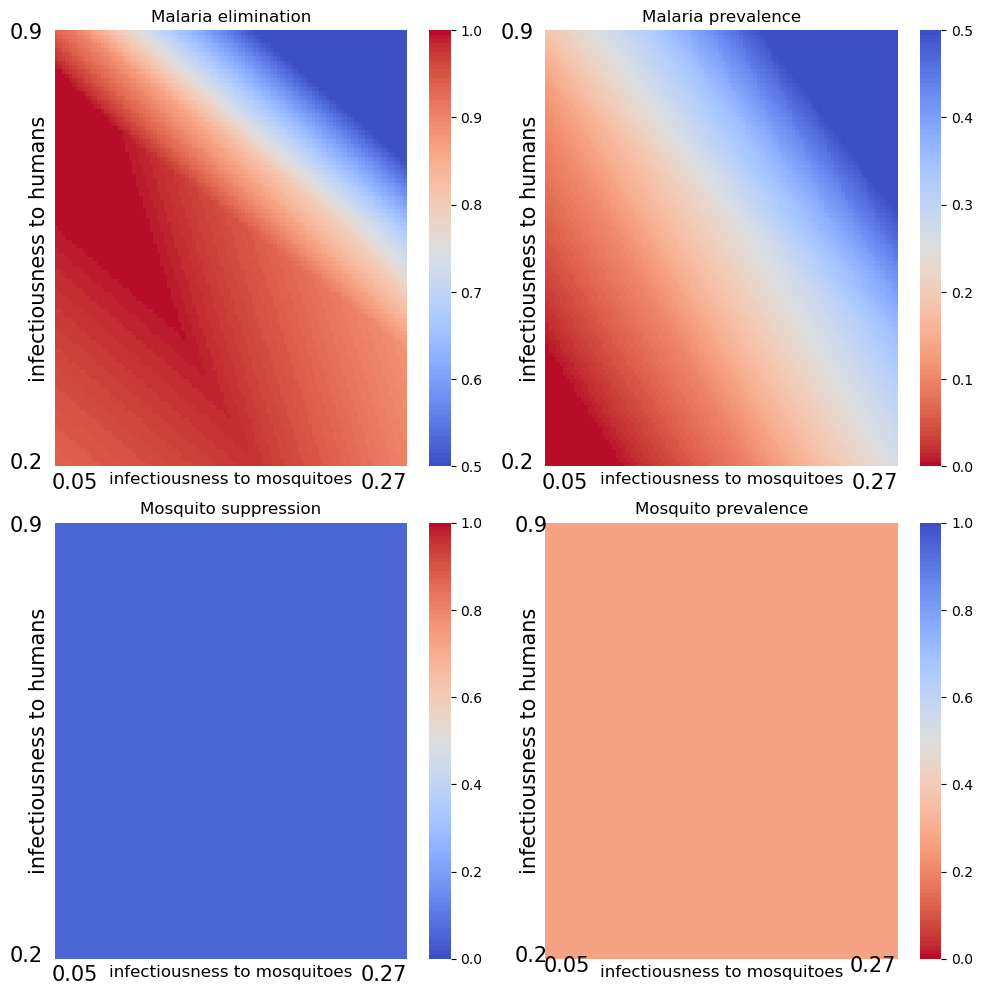

0 2
[[ 0.2   0.05  0.8  ...  0.5  15.    5.  ]
 [ 0.2   0.05  0.8  ...  0.5  15.    5.  ]
 [ 0.2   0.05  0.8  ...  0.5  15.    5.  ]
 ...
 [ 0.2   0.05  0.8  ...  0.5  15.    5.  ]
 [ 0.2   0.05  0.8  ...  0.5  15.    5.  ]
 [ 0.2   0.05  0.8  ...  0.5  15.    5.  ]]
313/313 [==============================] - 0s 733us/step


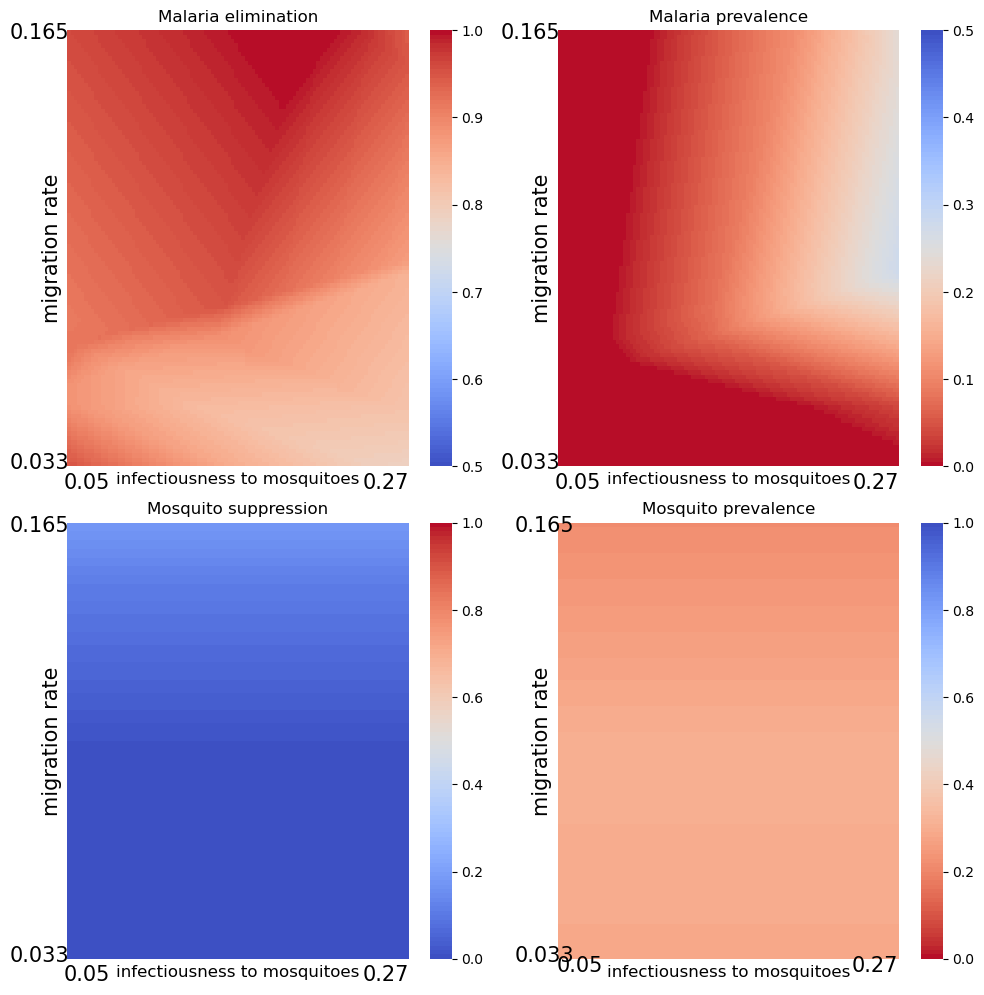

1 2
[[ 0.2   0.05  0.8  ...  0.5  15.    5.  ]
 [ 0.2   0.05  0.8  ...  0.5  15.    5.  ]
 [ 0.2   0.05  0.8  ...  0.5  15.    5.  ]
 ...
 [ 0.2   0.05  0.8  ...  0.5  15.    5.  ]
 [ 0.2   0.05  0.8  ...  0.5  15.    5.  ]
 [ 0.2   0.05  0.8  ...  0.5  15.    5.  ]]
313/313 [==============================] - 0s 735us/step


KeyboardInterrupt: 

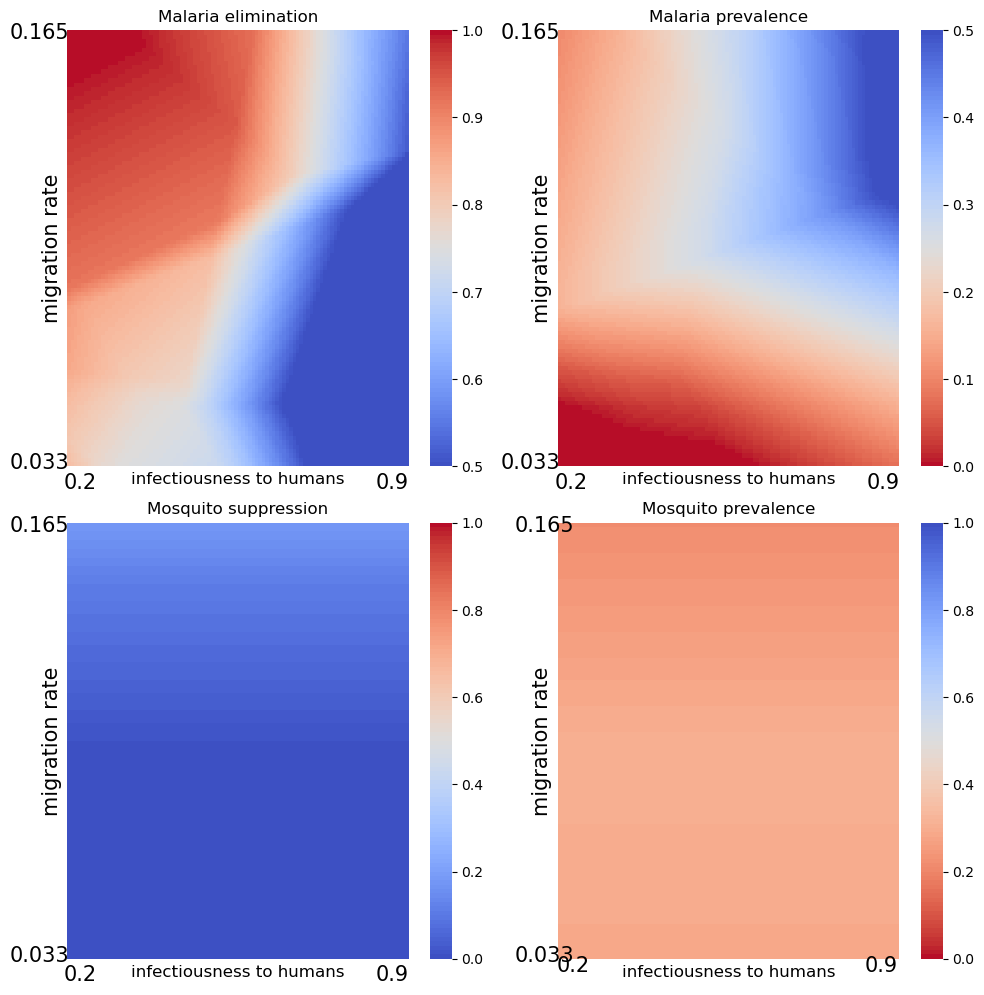

In [134]:
for j in range(16):
    for i in range(0,j):
        print(i,j)
        generate_heatmaps(data=new_data, model=model,model2 = model2, i=i,j=j,steps=100)
        

2 12
[[ 0.2   0.2   0.05 ...  0.5  16.   10.  ]
 [ 0.2   0.2   0.05 ...  0.5  16.   10.  ]
 [ 0.2   0.2   0.05 ...  0.5  16.   10.  ]
 ...
 [ 0.2   0.2   0.05 ...  0.5  16.   10.  ]
 [ 0.2   0.2   0.05 ...  0.5  16.   10.  ]
 [ 0.2   0.2   0.05 ...  0.5  16.   10.  ]]
313/313 [==============================] - 0s 834us/step


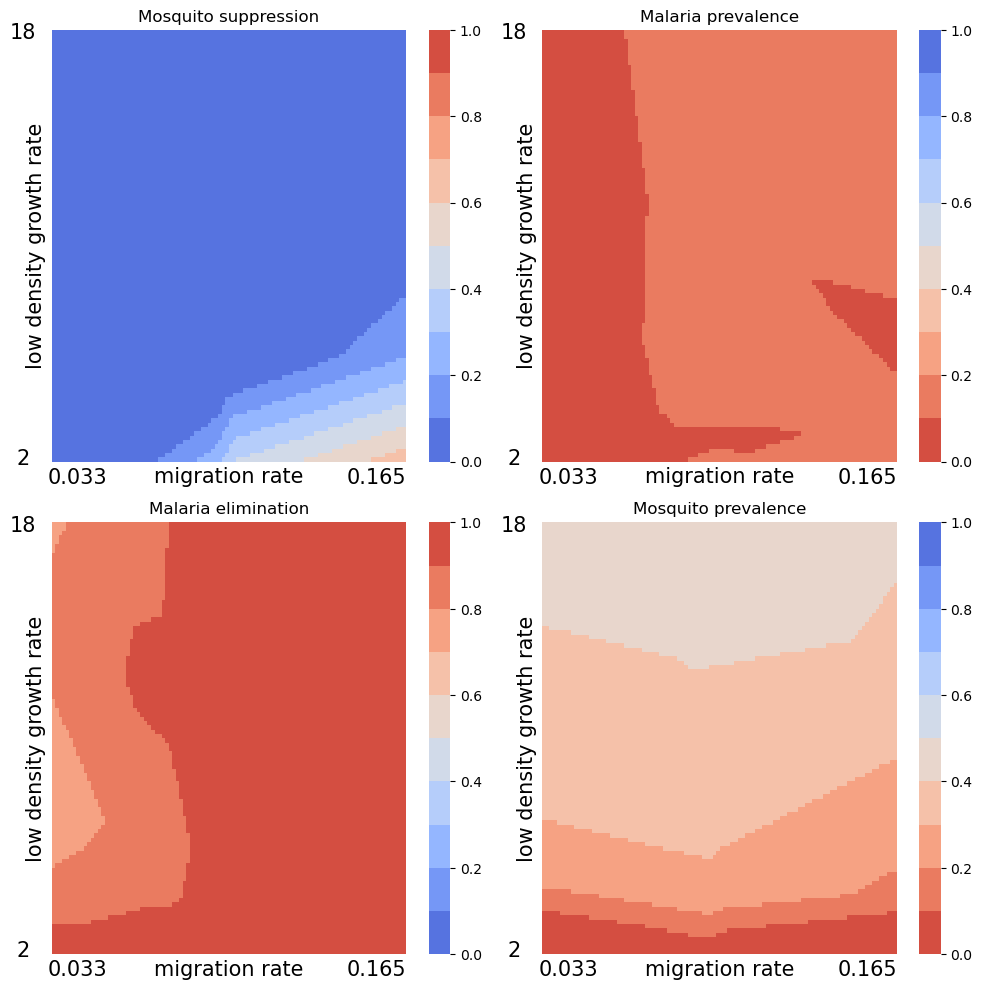

In [250]:
index1,index2 =2,12
number_pairs=[(index1,index2)]
special_data = {'infectiousness to mosquitoes':[0.2,0.05,0.27], 
        'infectiousness to humans': [0.2,0.2,0.9], 
        'migration rate': [0.12,0.033,0.165],
        'remate chance':[0.05,0,1],
        'mosquito feeding rate': [0.8,0.25,1], 
        'animal bite rate': [1.0,0,1],
        'viability fitness': [1.0,0.8,1], 
        'female fecundity fitness':[0.5,0.5,1],
        'germline resistance formation': [0.01,0,0.999],
        'drive efficiency':[0.95,0.8,1],
        'embryo resistance formation': [0.1,0,0.8], 
        'functional resistance rate': [0.0,0,0.001],
        'low density growth rate': [6,2,18],
        'seasonal population amplitude':[0.5,0,0.8],
        'human infectiousness duration':[16,10,30],
        'human immunity duration':[10,0,20]}
special_data = pd.DataFrame(special_data)
for i, j in number_pairs:
    print(i,j)
    generate_heatmaps(data=special_data, model=model,model2 = model2, i=i,j=j,steps=100)
